In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as scs
from sklearn.preprocessing import normalize as norm
from sklearn import linear_model
import datetime
import time
from datetime import datetime , timedelta

import zipfile
import math

from csv import reader
from matplotlib.pyplot import figure
import seaborn as sns;
import re
import torch
from torch import nn
from IPython.display import clear_output

In [2]:
from sklearn.base import BaseEstimator, TransformerMixin
class MyNormalizer(TransformerMixin, BaseEstimator):
    def __init__(self, norm="l2", axis=1, *, copy=True):
        self.norm = norm
        self.copy = copy
        self.axis=axis

    def fit(self, X, y=None):
        self._validate_data(X, accept_sparse="csr")
        return self

    def transform(self, X, copy=None):
        copy = copy if copy is not None else self.copy
        X = self._validate_data(X, accept_sparse="csr", reset=False)
        return preprocessing.normalize(X, norm=self.norm, axis=self.axis, copy=copy)

    def _more_tags(self):
        return {"stateless": True}

In [3]:
list_of_companies_number = ['1080', '1113', '1221', '1229', '1243', '1388', '1431', '1472', '1694', '1769', '1865', '1907', '1956', '2028',
                           '2050', '2051', '2057', '2094', '2197', '2290', '2368', '2645', '2651', '2730', '2748', '2813', '2822', '2890', 
                           '3022', '3035', '3107', '3161', '3388', '3459', '3757', '3879', '4060', '4154', '4218', '4320', '4481', 
                            '4549', '4575', '4618', '4695', '4736', '4799', '4851', '5836', '7843', '7858', '8080', '9034', '9058', '9061',
                           '9062', '9063', '9064', '9065', '9067', '9069', '9074', '9086', '9094', '9265', '9266', '9268', '9269',
                            '9270', '9761', '10166', '10470', '10484', '10508', '10795', '10887', '11038', '11234', '11244', '11390', '11399',
                           '11583','11618','11714', '11867', '11869', '11946', '12059', '12098', '12255', '12327', '12417', '12456', '12534',
                           '12552', '12713', '13003', '13061', '13113']

In [4]:
#shape = [(nr of company, every possible timeslot from 8.00 till 16.29, bid/ask, price/volume, 5 best offers from 9.15!))]
data = np.zeros(shape = (100, 5100,2,2,10))

In [5]:
def get_k_best_offers(record, k=5):
    count = 0
    count_bid = 0
    count_ask = 0
    k_best_bids_and_asks = np.zeros(shape = (2,2,k))
    while(record[count]!='ASK'):
        count+=1
    for counter in range(1,k*2 + 1):
        #bid
        if record[count-counter]=='BID':
            continue
        try:
            k_best_bids_and_asks[0][counter%2][(counter-1)//2]=record[count-counter]
        except IndexError as err:
            k_best_bids_and_asks[0][counter%2][(counter-1)//2]=0
            print('bid', err, record)
        #ask
        try:
            k_best_bids_and_asks[1][(counter-1)%2][(counter-1)//2]=record[count+counter]
        except IndexError as err:
            k_best_bids_and_asks[1][(counter-1)%2][(counter-1)//2]=0
            print("ask", err, record)        
    return k_best_bids_and_asks

In [6]:
def get_mid_price(record): #shape = (2,2,5) (bid/ask, price/volume, best offers):
    return (record[1][0][0]+record[0][0][0])/2

In [7]:
def get_true_price(record): # Qa*Pb/(Qa+Qb) + Qb*Pa/(Qa+Qb)
    Qa=record[1][1][0] #ask quantity
    Qb=record[0][1][0] #bid quantity
    Q=Qa+Qb
    Pa=record[1][0][0] #ask price
    Pb=record[0][0][0] #bid price
    return Qa*Pb/(Q+1e-10) + Qb*Pa/(Q+1e-10)

In [8]:
def get_sweep_to_fill_price(record, order_size, midprice, sweep_buys=False): #record.shape=(2,2,5)
    if sweep_buys:
        record=record[0] # sweep buys
    else:
        record=record[1] # sweep asks
    order_left = order_size
    counter=0
    weighted_price = 0
    while order_left>0:
        curr_vol = record[1][counter]
        curr_price = record[0][counter]
        if curr_vol >= order_left:
            weighted_price+=order_left*curr_price
            order_left =0
        else:
            weighted_price+=curr_vol*curr_price
            order_left-=curr_vol
        counter+=1
        if counter==record.shape[1]:
            print("Unable to fill an order", order_size)
            return midprice
    return weighted_price/order_size
    

In [9]:
def get_sweep_to_fill_price_raising_error(record, order_size, midprice, sweep_buys=False): #record.shape=(2,2,5), for 5 best bids/asks
    if record.shape!=(2,2,10):
        raise Exception('Bad record shape!')
    if order_size==0:
        raise ValueError("Order size is 0")
    if sweep_buys:
        record=record[0] # sweep buys
    else:
        record=record[1] # sweep asks
    order_left = order_size
    counter=0
    weighted_price = 0
    while order_left>0:
        curr_vol = record[1][counter]
        curr_price = record[0][counter]
        if curr_vol >= order_left:
            weighted_price+=order_left*curr_price
            order_left =0
        else:
            weighted_price+=curr_vol*curr_price
            order_left-=curr_vol
        counter+=1
        if counter==record.shape[1]:
            raise ValueError("Unable to fill an order of size " + str(order_size))
    return weighted_price/order_size
    

In [10]:
#### PO co?
def apply_moving_average(record, num_of_days_prev):
    for i in range(num_of_days_prev, record.shape[0]):
        record[i] = np.sum(record[i-num_of_days_prev+1:i+1])/num_of_days_prev
    return record

In [11]:
def index_to_time(index):
    if index<0:
        raise ValueError("Index lower than 0!")
    hour=index//60
    minute=index%60
    return hour+8, minute, 0 
# why minute+1???? was because orderbook[0] was from 8:01
def time_tuple_to_hr_mn_str(time_tuple):
    if time_tuple[0]<10:
        hour='0'+str(time_tuple[0])
    else:
        hour=str(time_tuple[0])
    if time_tuple[1]<10:
        minute='0'+str(time_tuple[1])
    else:
        minute=str(time_tuple[1])
    return hour+':'+minute

In [12]:
### ADD valueerrors?

def get_true_price_after_sweep_to_fill(record, order_size, midprice):
    curr_record = record
    order_left = order_size
    counter=0
    while order_left>0:
        curr_vol = curr_record[1][1][counter]
        if curr_vol >= order_left:
            curr_record[1][1][counter]-=order_left
            order_left =0
            counter-=1
        else:
            curr_record[1][1][counter] = 0
            order_left-=curr_vol
        counter+=1
        if counter==5:
            print("Unable to fill an order", order_size)
            return midprice #???? bad?
    Qa=0 #ask quantity
    Qb=0 #bid quantity
    Pa=0 #ask price
    Pb=0 #bid price
    row_in_queue = 0
    while curr_record[1][1][row_in_queue]==0:
        row_in_queue+=1
    Qa=curr_record[1][1][row_in_queue]
    Pa=curr_record[1][0][row_in_queue]
    row_in_queue = 0
    while curr_record[0][1][row_in_queue]==0:
        row_in_queue+=1
    Qb=curr_record[0][1][row_in_queue] 
    Q=Qa+Qb 
    Pb=curr_record[0][0][row_in_queue] 
    return Qa*Pb/Q + Qb*Pa/Q

In [13]:
def my_confusion_matrix(y_true, y_pred, labels): # for binary clasification
    if len(labels)!=2:
        raise ValueError("wrong labels fro binary clasiffication")
    if len(y_true)!=len(y_pred):
        raise ValueError("shapes for y differ")
    truth=labels[0]
    tp=0 
    fp=0 #truth was false, prediction was true
    fn=0 #truth was true, prediction was false
    tn=0
    for i in range(len(y_true)):
        if y_true[i]==truth: # true positive or false negative
            if y_true[i]==y_pred[i]:
                tp+=1
            else:
                fn+=1
        else: # true negative or false positive
            if y_true[i]==y_pred[i]:
                tn+=1
            else:
                fp+=1
    return np.array([[tp, fp],[fn, tn]]) 

In [14]:
'''def get_order_inbalance(record): #single company
    
    timestamps=record.shape[0]
    result=np.zeros(timestamps)
    for i in range (0,timestamps):
        result[i]=math.log((1e-10+np.sum(record[i][0][1]))/(1e-10+np.sum(record[i][1][1]))) # ln(bid size/ask size)
    return result'''
#uhmmm wrong func???

'def get_order_inbalance(record): #single company\n    \n    timestamps=record.shape[0]\n    result=np.zeros(timestamps)\n    for i in range (0,timestamps):\n        result[i]=math.log((1e-10+np.sum(record[i][0][1]))/(1e-10+np.sum(record[i][1][1]))) # ln(bid size/ask size)\n    return result'

# READ DATA

In [15]:
#shape = [(nr of company, every possible timeslot from 8.00 till 16.29, bid/ask, price/volume, 5 best offers from 9.15!))]
data = np.zeros(shape = (100, 5100,2,2,10))

In [16]:
# read order books into data
mom_count = 0
count_comp = -1
for num_comp in list_of_companies_number:
    with open('FTSE100\OrderBookSnapshots.csv.'+num_comp+'\OrderBookSnapshots.csv', 'r') as read_obj:
        csv_reader = reader(read_obj)
        count = 0
        count_comp+=1
        prev_hour = 8
        prev_date = '20130902'
        prev_min=0
        prev_elements = []
        for row in csv_reader:
            elements = row[0].split('\t')
            date_time = elements[0]
            date_holder, time_holder = date_time.split(' ')
            if date_holder != prev_date:
                prev_hour = 8
                prev_min=0
            cur_hour = int(time_holder[:2])
            cur_min = int(time_holder[2:4])
            if((cur_hour==8 and cur_min>=0) or (cur_hour>8 and cur_hour<16) or (cur_hour==16 and cur_min<30)):
                data[count_comp][count] = get_k_best_offers(elements[1:], k=10)  
                count+=1

ask list index out of range ['BID', '902.5', '306.0', '950.0', '400.0', '997.0', '500.0', '1000.0', '13000.0', '1014.0', '3000.0', '1034.0', '63.0', '1049.0', '3512.0', '1052.0', '315.0', '1054.0', '49.0', '1055.0', '600.0', '1058.0', '500.0', '1064.0', '1000.0', '1110.0', '108.0', '1184.0', '3.0', 'ASK', '1059.0', '1080.0', '1061.0', '600.0', '1063.0', '530.0', '1064.0', '315.0', '1066.0', '354.0', '1077.0', '62.0', '1150.0', '1309.0', '1200.0', '1600.0', '1250.0', '305.0']
ask list index out of range ['BID', '902.5', '306.0', '950.0', '400.0', '997.0', '500.0', '1000.0', '13000.0', '1014.0', '3000.0', '1034.0', '63.0', '1049.0', '3512.0', '1052.0', '315.0', '1054.0', '49.0', '1055.0', '600.0', '1058.0', '500.0', '1064.0', '1000.0', '1110.0', '108.0', '1184.0', '3.0', 'ASK', '1059.0', '1080.0', '1061.0', '600.0', '1063.0', '530.0', '1064.0', '315.0', '1066.0', '354.0', '1077.0', '62.0', '1150.0', '1309.0', '1200.0', '1600.0', '1250.0', '305.0']
ask list index out of range ['BID', '124

ask list index out of range ['BID', '771.0', '2460.0', '816.0', '2320.0', '900.0', '800.0', '919.0', '11870.0', '940.0', '1200.0', '968.0', '1200.0', '970.0', '1500.0', '972.0', '17729.0', '974.5', '509.0', '975.5', '8002.0', '978.0', '6454.0', '985.5', '71.0', '986.5', '389.0', '987.0', '149.0', '987.5', '838.0', 'ASK', '989.0', '337.0', '989.5', '2331.0', '990.0', '902.0', '996.0', '10000.0', '998.0', '1107.0', '999.0', '509.0', '1000.0', '6312.0', '1002.0', '26934.0', '1021.0', '1200.0']
ask list index out of range ['BID', '771.0', '2460.0', '816.0', '2320.0', '900.0', '800.0', '919.0', '11870.0', '940.0', '1200.0', '968.0', '1200.0', '970.0', '1500.0', '972.0', '17729.0', '974.5', '509.0', '975.5', '8002.0', '978.0', '6454.0', '985.5', '71.0', '986.5', '389.0', '987.0', '149.0', '987.5', '838.0', 'ASK', '989.0', '337.0', '989.5', '2331.0', '990.0', '902.0', '996.0', '10000.0', '998.0', '1107.0', '999.0', '509.0', '1000.0', '6312.0', '1002.0', '26934.0', '1021.0', '1200.0']
ask list

ask list index out of range ['BID', '1000.0', '6000.0', '1020.0', '500.0', '1180.0', '1000.0', '1193.0', '2466.0', '1375.0', '125.0', '1383.0', '40.0', '1410.0', '709.0', '1421.0', '1200.0', '1449.0', '1200.0', '1461.0', '1018.0', '1465.0', '339.0', '1470.0', '5002.0', '1474.0', '4282.0', '1487.0', '684.0', '1488.0', '1180.0', '1489.0', '150.0', 'ASK', '1491.0', '588.0', '1492.0', '630.0', '1500.0', '374.0', '1502.0', '339.0', '1505.0', '4194.0', '1506.0', '1021.0', '1509.0', '5002.0', '1510.0', '1200.0', '1540.0', '1200.0']
ask list index out of range ['BID', '1000.0', '6000.0', '1020.0', '500.0', '1180.0', '1000.0', '1193.0', '2466.0', '1375.0', '125.0', '1383.0', '40.0', '1410.0', '709.0', '1421.0', '1200.0', '1449.0', '1200.0', '1461.0', '1018.0', '1465.0', '339.0', '1470.0', '5002.0', '1474.0', '4282.0', '1487.0', '684.0', '1488.0', '1180.0', '1489.0', '150.0', 'ASK', '1491.0', '588.0', '1492.0', '630.0', '1500.0', '374.0', '1502.0', '339.0', '1505.0', '4194.0', '1506.0', '1021.0'

ask list index out of range ['BID', '976.0', '1482.0', '980.0', '912.0', '990.0', '305.0', '995.0', '5000.0', '1000.0', '2000.0', '1005.0', '888.0', '1009.0', '10057.0', '1010.0', '127.0', '1016.0', '853.0', '1017.0', '265.0', '1018.0', '2645.0', 'ASK', '1025.0', '5631.0', '1026.0', '877.0', '1030.0', '125.0', '1033.0', '7499.0', '1037.0', '895.0', '1049.0', '1482.0', '1051.0', '1000.0', '1064.0', '1208.0', '1200.0', '217.0']
ask list index out of range ['BID', '976.0', '1482.0', '980.0', '912.0', '990.0', '305.0', '995.0', '5000.0', '1000.0', '2000.0', '1005.0', '888.0', '1009.0', '10057.0', '1010.0', '127.0', '1016.0', '853.0', '1017.0', '265.0', '1018.0', '2645.0', 'ASK', '1025.0', '5631.0', '1026.0', '877.0', '1030.0', '125.0', '1033.0', '7499.0', '1037.0', '895.0', '1049.0', '1482.0', '1051.0', '1000.0', '1064.0', '1208.0', '1200.0', '217.0']
ask list index out of range ['BID', '943.5', '218.0', '970.0', '5000.0', '981.0', '2500.0', '988.5', '89.0', '1000.0', '6250.0', '1003.0', '

ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0', '578.0', '585.5', '8.0', 'ASK', '551.5', '751.0', '553.5', '16.0', '554.0', '1700.0', '554.5', '3986.0', '557.5', '2470.0', '560.0', '181.0', '561.5', '1254.0']
ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0', '578.0', '585.5', '8.0', 'ASK', '551.5', '751.0', '553.5', '16.0', '554.0', '1700.0', '554.5', '3986.0', '557.5', '2470.0', '560.0', '181.0', '561.5', '1254.0']
ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0

ask list index out of range ['BID', '1016.0', '992.0', '1025.0', '75.0', '1110.0', '4000.0', '1140.0', '176.0', '1164.0', '239.0', '1180.0', '895.0', '1181.0', '1120.0', '1182.0', '83.0', '1184.0', '464.0', '1185.0', '600.0', '1187.0', '1877.0', '1188.0', '92.0', '1189.0', '194.0', '1191.0', '194.0', '1247.0', '83.0', '1259.0', '7.0', 'ASK', '1188.0', '486.0', '1189.0', '1688.0', '1190.0', '195.0', '1191.0', '1309.0', '1193.0', '1191.0', '1194.0', '1438.0', '1197.0', '464.0', '1200.0', '500.0', '1213.0', '245.0']
ask list index out of range ['BID', '1016.0', '992.0', '1025.0', '75.0', '1110.0', '4000.0', '1140.0', '176.0', '1164.0', '239.0', '1180.0', '895.0', '1181.0', '1120.0', '1182.0', '83.0', '1184.0', '464.0', '1185.0', '600.0', '1187.0', '1877.0', '1188.0', '92.0', '1189.0', '194.0', '1191.0', '194.0', '1247.0', '83.0', '1259.0', '7.0', 'ASK', '1188.0', '486.0', '1189.0', '1688.0', '1190.0', '195.0', '1191.0', '1309.0', '1193.0', '1191.0', '1194.0', '1438.0', '1197.0', '464.0', 

ask list index out of range ['BID', '290.0', '1243.0', '293.1', '757.0', '293.8', '1000.0', '295.2', '16.0', '296.0', '20000.0', '298.0', '2932.0', '298.4', '21152.0', '300.4', '1231.0', '300.9', '1313.0', '301.2', '1463.0', '301.4', '775.0', '301.5', '306.0', 'ASK', '302.0', '2144.0', '302.2', '4268.0', '303.6', '884.0', '304.4', '20735.0', '306.0', '12500.0']
ask list index out of range ['BID', '290.0', '1243.0', '293.1', '757.0', '293.8', '1000.0', '295.2', '16.0', '296.0', '20000.0', '298.0', '2932.0', '298.4', '21152.0', '300.4', '1231.0', '300.9', '1313.0', '301.2', '1463.0', '301.4', '775.0', '301.5', '306.0', 'ASK', '302.0', '2144.0', '302.2', '4268.0', '303.6', '884.0', '304.4', '20735.0', '306.0', '12500.0']
ask list index out of range ['BID', '290.0', '1243.0', '293.1', '757.0', '293.8', '1000.0', '295.2', '16.0', '296.0', '20000.0', '298.0', '2932.0', '298.4', '21152.0', '300.4', '1231.0', '300.9', '1313.0', '301.2', '1463.0', '301.4', '775.0', '301.5', '306.0', 'ASK', '302

ask list index out of range ['BID', '459.7', '15.0', '500.5', '1631.0', '503.0', '1490.0', '505.5', '3035.0', '506.0', '3046.0', '506.5', '838.0', '508.0', '8269.0', '509.0', '428.0', '510.5', '93.0', '540.0', '5.0', 'ASK', '491.4', '25.0', '510.5', '6.0', '511.0', '1200.0', '512.0', '3010.0', '512.5', '3869.0', '514.0', '1230.0', '517.0', '1377.0', '542.0', '600.0']
ask list index out of range ['BID', '459.7', '15.0', '500.5', '1631.0', '503.0', '1490.0', '505.5', '3035.0', '506.0', '3046.0', '506.5', '838.0', '508.0', '8269.0', '509.0', '428.0', '510.5', '93.0', '540.0', '5.0', 'ASK', '491.4', '25.0', '510.5', '6.0', '511.0', '1200.0', '512.0', '3010.0', '512.5', '3869.0', '514.0', '1230.0', '517.0', '1377.0', '542.0', '600.0']
ask list index out of range ['BID', '459.7', '15.0', '500.5', '1631.0', '503.0', '1490.0', '505.5', '3035.0', '506.0', '3046.0', '506.5', '838.0', '508.0', '8269.0', '509.0', '428.0', '510.5', '93.0', '540.0', '5.0', 'ASK', '491.4', '25.0', '510.5', '6.0', '51

In [17]:
data[1,0]

array([[[  874. ,   873. ,   872. ,   870. ,   865. ,   862.5,   861. ,
           860. ,   859. ,   858. ],
        [ 5000. ,  1096. , 10000. ,  6000. , 38000. ,   850. ,   555. ,
          5460. , 28555. , 12134. ]],

       [[  804. ,   838. ,   859.5,   864. ,   865. ,   865.5,   866. ,
           866.5,   868. ,   868.5],
        [  137. ,  1042. ,   347. ,   850. ,   702. ,   371. ,   555. ,
          1110. ,  1671. ,   918. ]]])

In [18]:
# read trades into trades
days={
    2:0,
    3:1,
    4:2,
    5:3,
    6:4,
    9:5,
    10:6,
    11:7,
    12:8,
    13:9,
}
if_first_row = True
which_comp = 0

#comp = list_of_companies_number
comp = list_of_companies_number
comp_id = -1
trades = np.empty( shape=(len(comp), 10), dtype = list)
for i in range(trades.shape[0]):
    for j in range(10):
        trades[i,j]=list()
for num_comp in comp:
    comp_id+=1
    if_first_row = True
    with open('FTSE100trades\TradeDetailsExtract.'+num_comp+'.csv', 'r') as read_obj:
        csv_reader = reader(read_obj)
        for row in csv_reader:
            if if_first_row:
                if_first_row = False
                continue
            date = row[4]
            date_elem = date.split(" ")
            act_day = int(date_elem[0][8:10])
            time_tuple=time.strptime(date_elem[1], '%H:%M:%S')
            time_tuple=(time_tuple.tm_hour, time_tuple.tm_min, time_tuple.tm_sec)
          #  trades=np.append(trades, (row[2], row[3], time_tuple),  axis=1)
            #print("XD", comp_id, act_day, date_elem, row[2], row[3], time_tuple)
            try:
                trades[comp_id][days[act_day]].append((float(row[2]), int(row[3]), time_tuple)) # price, volume, timestamp
            except:
                print("Bad acting day or data, please check both\n", comp_id, act_day)
                print((row[2]), (row[3]), time_tuple)

Bad acting day or data, please check both
 1 30
854.5066 4596 (7, 5, 24)
Bad acting day or data, please check both
 1 8
900.0 4848 (0, 0, 0)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 3 30
841.9143 11354 (7, 5, 24)
Bad acting day or data, please check both
 5 30
389.3276 3223 (7, 5, 24)
Bad acting day or data, please check both
 7 30
435.4457 4675 (7, 5, 24)
Bad acting day or data, please check both
 9 30
2146.5318 1115 (7, 5, 24)
Bad acting day or data, please check both
 12 30
290.7493 3328 (7, 5, 24)
Bad acting day or data, please check both
 13 30
120.01 100 (7, 5, 24)
Bad acting day or data, please check both
 16 30
1103.1111 414 (7, 5, 24)
Bad acting day or data, please check both
 17 30
1090.5 25000 (17, 37, 50)
Bad acting day or data, please check both
 20 30
761.5762 127

Bad acting day or data, please check both
 97 30
345.1342 1168 (7, 5, 24)
Bad acting day or data, please check both
 98 30
1596.4102 231 (7, 5, 24)


In [19]:
print(data.shape)
print(trades.shape)

(100, 5100, 2, 2, 10)
(99, 10)


# parameters calculation functions

In [20]:


def get_order_inbalance_interval(record, interval=1): #interval in minutes
    timestamps=record.shape[0]//interval
    result=np.zeros(timestamps)
    for i in range (0,timestamps):
        pom=i*interval
        result[i]=math.log((1e-10+np.sum(record[pom:pom+interval,0,1]))/(1e-10+np.sum(record[pom:pom+interval,1,1]))) # ln(bid size/ask size)
    return result

def get_order_inbalance_comp(comp_id=1, interval=1, time_to_skip=0): #interval in minutes
    order_inbalance_comp=np.empty(shape=(10,(510-time_to_skip)//interval))
    for i in range(10): #we have data from 10 days, 2 work weeks
        order_inbalance_comp[i]=get_order_inbalance_interval(data[comp_id, 510*i+time_to_skip:510*(i+1)], interval)
    return order_inbalance_comp

In [21]:
pom=data[3, 510:510*(2)]
pom[1:5,0,1]

array([[ 1504.,   466.,  2115.,  8682.,   667.,   500.,  6922.,  3677.,
         4357., 28300.],
       [ 3396.,   701.,  2615.,  8682.,   501.,   667.,   500., 11935.,
           77.,  4357.],
       [ 3582.,   701.,  2115.,  8682.,  1001.,   667.,  3600.,   500.,
        11935.,    77.],
       [ 3323.,  3262.,  3146.,  9713.,  2032.,   667.,   500., 11935.,
           77.,  4357.]])

In [22]:
get_order_inbalance_comp(interval=60, time_to_skip=30)[0]

array([ 0.03052776,  0.11092192,  0.26586873, -0.10167188,  0.06743892,
        0.07931277, -0.07177632, -0.30107863])

In [23]:
get_order_inbalance_comp(interval=60, time_to_skip=30)[0]

array([ 0.03052776,  0.11092192,  0.26586873, -0.10167188,  0.06743892,
        0.07931277, -0.07177632, -0.30107863])

In [24]:
def get_vwap_and_ordersizes_comp(comp_id=3, interval=5, time_to_skip=0, use_abs=True, max_vol=math.inf):
    order_book_comp=np.empty(shape=(10, 510-time_to_skip, 2, 2, 10))
    for i in range(10): #we have data from 10 days, 2 work weeks
        order_book_comp[i]=data[comp_id, 510*i+time_to_skip:510*(i+1)]

    trades_time_comp=np.copy(trades[comp_id])
    for day in trades_time_comp:
        day.sort(key=lambda hour: hour[2]) # sort by trade time

    timestamps=(510-time_to_skip)//interval
    # buys on even, sells on odd
    vwaps=np.zeros(shape=(10,2*timestamps)) 
    order_sizes=np.zeros(shape=(10,2*timestamps))
    #vwaps_sells=np.zeros(shape=(10,timestamps))
    empty_sells=0
    empty_buys=0
   # last_time=index_to_time(0)
    for day in range(vwaps.shape[0]):
        trade_counter=0
        skip_time_tuple=index_to_time(time_to_skip-interval)
        while skip_time_tuple>trades_time_comp[day][trade_counter][2]:
            trade_counter+=1
        for counter in range(timestamps):
            true_price=get_true_price(order_book_comp[day,counter])
            time_tuple=index_to_time(time_to_skip+interval*(counter))
            last_time=time_tuple
            buys=[]
            sells=[]
            buys_weights=[]
            sells_weights=[]
            while time_tuple>trades_time_comp[day][trade_counter][2]:
                if true_price<trades_time_comp[day][trade_counter][0]:
                    buys.append(trades_time_comp[day][trade_counter][0])
                    buys_weights.append(trades_time_comp[day][trade_counter][1])
                else:
                    sells.append(trades_time_comp[day][trade_counter][0])
                    sells_weights.append(trades_time_comp[day][trade_counter][1])               
                trade_counter+=1
            try:
                buys_avg, buys_vol=np.average(buys, weights=buys_weights, returned=True)
                vwaps[day,2*counter]=buys_avg-true_price
            except:
                buys_avg=true_price
                buys_vol=0
                empty_buys+=1
                vwaps[day,2*counter]=math.nan
            try:
                sells_avg, sells_vol=np.average(sells, weights=sells_weights, returned=True)
                if use_abs:
                    vwaps[day,2*counter +1]=true_price-sells_avg
                else:
                    vwaps[day,2*counter +1]=sells_avg-true_price 
            except:
                sells_avg=true_price
                sells_vol=0
                empty_sells+=1
                vwaps[day,2*counter +1]=math.nan
            if sells_vol>max_vol:
               # print(day, time_tuple)
                sells_vol=math.nan
            if buys_vol>max_vol:
                #print(day, time_tuple)
                buys_vol=math.nan 
                           
            order_sizes[day,2*counter]=buys_vol
            order_sizes[day,2*counter +1]=sells_vol
  #  print('{}% of intervals were SELL empty'.format(100*empty_sells/(10*2*timestamps)))
   # print('{}% of intervals were BUY empty'.format(100*empty_buys/(10*2*timestamps)))    
  #  print(last_time)
    return vwaps, order_sizes

In [25]:
def get_next_trade_x_comp(comp_id=3, interval=5, time_to_skip=0, get_x='price'):

    order_book_comp=np.empty(shape=(10, 510-time_to_skip, 2, 2, 10))
    for i in range(10): #we have data from 10 days, 2 work weeks
        order_book_comp[i]=data[comp_id, 510*i+time_to_skip:510*(i+1)]

    trades_time_comp=np.copy(trades[comp_id])
    for day in trades_time_comp:
        day.sort(key=lambda hour: hour[2]) # sort by trade time
    timestamps=(510-time_to_skip)//interval
        
    next_trade_x=np.empty(shape=(10,timestamps))
    for day in range(next_trade_x.shape[0]):
        trade_counter=0
        start_time=index_to_time(0+time_to_skip-interval)
        while start_time>=trades_time_comp[day][trade_counter][2]:
            trade_counter+=1
        for book_counter in range(timestamps):            
            time_tuple=index_to_time(time_to_skip+(book_counter-1)*interval)
            while time_tuple>=trades_time_comp[day][trade_counter][2]:
                trade_counter+=1
            if get_x=='price':
                next_trade_price=trades_time_comp[day][trade_counter][0]
                true_price=get_true_price(order_book_comp[day, book_counter])
                next_trade_x[day, book_counter]=(next_trade_price-true_price) #no abs
                #why abs?#abs(nexttradeprice-trueprice)
            elif get_x=='size':
                next_trade_size=trades_time_comp[day][trade_counter][1]
                next_trade_x[day, book_counter]=next_trade_size                
            elif get_x=='time':
                trade_time_tuple=trades_time_comp[day][trade_counter][2]
                next_trade_x[day, book_counter]=(timedelta(hours=trade_time_tuple[0],minutes=trade_time_tuple[1],seconds=trade_time_tuple[2])
                                                 -timedelta(hours=time_tuple[0],minutes=time_tuple[1],seconds=time_tuple[2])).seconds
            # time to next trade given in seconds
            else:
                raise ValueError("trying to get nonexisting parameter")
    return next_trade_x

In [26]:
def get_s2f_impact_and_ordersizes_comp(comp_id=3, interval=5, time_to_skip=0, use_abs=True):
    order_book_comp=np.empty(shape=(10, 510-time_to_skip, 2, 2, 10))
    for i in range(10): #we have data from 10 days, 2 work weeks
        order_book_comp[i]=data[comp_id, 510*i+time_to_skip:510*(i+1)]

    trades_time_comp=np.copy(trades[comp_id])
    for day in trades_time_comp:
        day.sort(key=lambda hour: hour[2]) # sort by trade time

    timestamps=(510-time_to_skip)//interval
    # buys on even, sells on odd
    s2f_impacts=np.zeros(shape=(10,2*timestamps)) 
    order_sizes=np.zeros(shape=(10,2*timestamps))
    #s2f_impacts_sells=np.zeros(shape=(10,timestamps))
    empty_sells=0
    empty_buys=0
    orders_not_filled=0
    for day in range(s2f_impacts.shape[0]):
        trade_counter=0
        skip_time_tuple=index_to_time(time_to_skip-interval)
        while skip_time_tuple>trades_time_comp[day][trade_counter][2]:
            trade_counter+=1
        for counter in range(s2f_impacts.shape[1]//2):
            true_price=get_true_price(order_book_comp[day,counter])   # true price at start of the intertval, as in pdf
            time_tuple=index_to_time(time_to_skip+interval*(counter))
            buys_weights=[]
            sells_weights=[]
            while time_tuple>trades_time_comp[day][trade_counter][2]:
                if true_price<trades_time_comp[day][trade_counter][0]:
                    buys_weights.append(trades_time_comp[day][trade_counter][1])
                else:
                    sells_weights.append(trades_time_comp[day][trade_counter][1])               
                trade_counter+=1
            try:
                buys_vol=np.sum(buys_weights)
                # when buying we sweep asks
                buys_s2f_price=get_sweep_to_fill_price_raising_error(order_book_comp[day,counter], buys_vol, true_price, sweep_buys=False)  # order book at start of the intertval, as in pdf
                s2f_impacts[day,2*counter]=buys_s2f_price-true_price
            except ValueError as err:
                if "Unable to fill an order of size " in str(err):
                    orders_not_filled+=1
                elif str(err)=="Order size is 0":
                    buys_s2f_price=true_price
                    buys_vol=0
                    empty_buys+=1
                    s2f_impacts[day,2*counter]=math.nan
            try:
                sells_vol=np.sum(sells_weights)
                # when selling we sweep buys
                sells_s2f_price=get_sweep_to_fill_price_raising_error(order_book_comp[day,counter], sells_vol, true_price, sweep_buys=True)
                if use_abs:
                    s2f_impacts[day,2*counter +1]=true_price-sells_s2f_price
                else:
                    s2f_impacts[day,2*counter +1]=sells_s2f_price-true_price 
            except ValueError as err:
                if "Unable to fill an order of size " in str(err):
                    orders_not_filled+=1
                elif str(err)=="Order size is 0":
                    sells_s2f_price=true_price
                    sells_vol=0
                    empty_sells+=1
                    s2f_impacts[day,2*counter +1]=math.nan
         #   if sells_vol>10000 or buys_vol>10000: #discard super high volumes,
          #      continue 
                           
            order_sizes[day,2*counter]=buys_vol
            order_sizes[day,2*counter +1]=sells_vol
    print('{}% of intervals were SELL empty'.format(100*empty_sells/(10*2*timestamps)))
    print('{}% of intervals were BUY empty'.format(100*empty_buys/(10*2*timestamps)))    
    print('{}% of intervals were set not filled'.format(100*orders_not_filled/(10*2*timestamps)))    
    return s2f_impacts, order_sizes

In [27]:
s2f_imp,_=get_s2f_impact_and_ordersizes_comp(comp_id=0, time_to_skip=10,
                                   interval=1)
c=0
for day in s2f_imp:
    for i in day:
        if math.isnan(i):
            c+=1
print(c/s2f_imp.size)


37.94% of intervals were SELL empty
35.71% of intervals were BUY empty
0.07% of intervals were set not filled
0.7365


In [28]:
## prices on the start of interval
def get_true_price_comp(comp_id=1, interval=1, time_to_skip=0): #interval in minutes
    true_price_comp=np.empty(shape=(10,(510-time_to_skip)//interval))
    timestamps=(510-time_to_skip)//interval
    for i in range(10): #we have data from 10 days, 2 work weeks
        for j in range(timestamps):
            true_price_comp[i,j]=get_true_price(data[comp_id, 510*i+time_to_skip+j*interval])
    return true_price_comp

def get_mid_price_comp(comp_id=1, interval=1, time_to_skip=0): #interval in minutes
    mid_price_comp=np.empty(shape=(10,(510-time_to_skip)//interval))
    timestamps=(510-time_to_skip)//interval
    for i in range(10): #we have data from 10 days, 2 work weeks
        for j in range(timestamps):
            mid_price_comp[i,j]=get_mid_price(data[comp_id, 510*i+time_to_skip+j*interval])
    return mid_price_comp

In [29]:
def get_price_change_comp(comp_id=1, interval=1, time_to_skip=0, use_true_price=True): #interval in minutes
    if use_true_price:
        prices=np.asarray([get_true_price(data[comp_id][i]) for i in range (5100)])
    else:
        prices=np.asarray([get_mid_price(data[comp_id][i]) for i in range (5100)])
    
    timestamps=(510-time_to_skip)//interval
    price_diff=np.empty(shape=(10,timestamps))
    for i in range(10):
        for t in range(1,timestamps):
            pom=i*510 + time_to_skip + t
            price_diff[i,j]=prices[pom]-prices[pom-interval]
    return price_diff
    #inbalance_averageprice={}
    #for i in range(len(price_diff)):
    #    if order_inbalance_10_days[i] in inbalance_averageprice.keys():
    #        inbalance_averageprice[order_inbalance_10_days[i]].append(price_diff[i])
    #    else:
    #        inbalance_averageprice[order_inbalance_10_days[i]]=[price_diff[i]]
    #for k in inbalance_averageprice.keys():
    #    inbalance_averageprice[k]=np.average(np.asarray(inbalance_averageprice[k]))

In [30]:
def get_price_change_given_prices(prices): ### zero on start of the day
    if len(prices.shape)!=2:
        raise ValueError('bad shape')
    price_change=np.zeros(shape=prices.shape)
    for day in range(prices.shape[0]):
        for i in range(1, prices.shape[1]):
            price_change[day,i]=prices[day, i]-prices[day, i-1]
    return price_change

In [31]:
def get_trading_volume_and_price_volatility(company_id, interval = 5, time_to_skip = 0):
    how_many_days = trades[company_id].shape[0]
    num_of_interval_buck = (510-time_to_skip)//interval
    trading_volume_in_buckets = np.zeros(shape = (10, num_of_interval_buck))
    price_volatility_in_buckets = np.zeros(shape = (10, num_of_interval_buck))
    start_time=(8,time_to_skip-interval,0)
    end_time=(16,29-interval,0)
    for i in range(how_many_days): #for every day
        min_prices_in_buckets = np.ones(num_of_interval_buck) * 1e7
        max_prices_in_buckets = -np.ones(num_of_interval_buck) * 1e7
        for trade in trades[company_id][i]:
            trade_time = trade[2]
            if trade_time<start_time and trade_time>end_time:
                continue
            which_bucket =np.dot(np.asarray(trade_time)-np.asarray(start_time), [60,1,0])//interval
            if(which_bucket>=num_of_interval_buck):
                which_bucket=num_of_interval_buck-1
            #print("XD", company_id, i, trade, which_bucket)
            min_prices_in_buckets[which_bucket] = min(float(min_prices_in_buckets[which_bucket]), float(trade[0]))
            max_prices_in_buckets[which_bucket] = max(float(max_prices_in_buckets[which_bucket]), float(trade[0]))
            trading_volume_in_buckets[i][which_bucket] += trade[1]
        price_volatility_in_buckets[i] = max_prices_in_buckets - min_prices_in_buckets
        for k in range(num_of_interval_buck):
            if price_volatility_in_buckets[i][k] == -2e7:
                price_volatility_in_buckets[i][k] = math.nan
    return trading_volume_in_buckets, price_volatility_in_buckets

In [32]:
1e7

10000000.0

# HEATMAP

In [33]:
comp_id = 3
interval=1
time_to_skip=30

mid_price = get_mid_price_comp(comp_id, interval, time_to_skip)
print(mid_price.shape)
true_price = get_true_price_comp(comp_id, interval, time_to_skip)
print(true_price.shape)
order_inbalance = get_order_inbalance_comp(comp_id, interval, time_to_skip)
#order_inbalance = order_inbalance.reshape(10,-1)
print(order_inbalance.shape)
vwaps, order_sizes = get_vwap_and_ordersizes_comp(comp_id, interval, time_to_skip)
vwaps_buy = vwaps[:,::2]
vwaps_sell = vwaps[:,1::2]
print(vwaps_buy.shape)
print(vwaps_sell.shape)
s2f_impact, order_sizes = get_s2f_impact_and_ordersizes_comp(comp_id, interval, time_to_skip)
s2f_impact_buy = s2f_impact[:,::2]
s2f_impact_sell = s2f_impact[:,1::2]
print(s2f_impact_buy.shape)
print(s2f_impact_sell.shape)
order_sizes_buy = order_sizes[:,::2]
order_sizes_sell = order_sizes[:,1::2]
print(order_sizes_buy.shape)
print(order_sizes_sell.shape)
trading_volumes, price_volatilities = get_trading_volume_and_price_volatility(comp_id, interval, time_to_skip)
print(trading_volumes.shape)
print(price_volatilities.shape)
next_trade_time=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='time')
next_trade_size=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='size')
next_trade_price=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='price')
price_change=get_price_change_given_prices(true_price)
print(next_trade_time.shape, next_trade_size.shape, next_trade_price.shape)
print(price_change.shape)

(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480) (10, 480) (10, 480)
(10, 480)


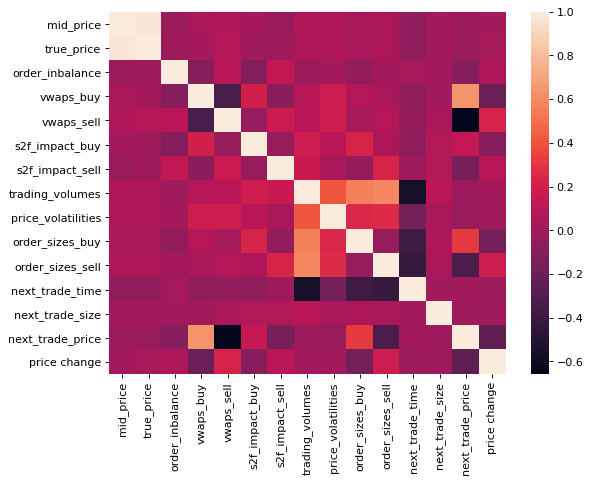

In [34]:
df = pd.DataFrame({
                'mid_price': mid_price.flatten(), 
                'true_price': true_price.flatten(), 
                'order_inbalance': order_inbalance.flatten(), 
                'vwaps_buy': vwaps_buy.flatten(), 
                'vwaps_sell': vwaps_sell.flatten(), 
                's2f_impact_buy': s2f_impact_buy.flatten(), 
                's2f_impact_sell': s2f_impact_sell.flatten(), 
                'trading_volumes': trading_volumes.flatten(), 
                'price_volatilities': price_volatilities.flatten(),
                'order_sizes_buy': order_sizes_buy.flatten(), 
                'order_sizes_sell': order_sizes_sell.flatten(),
                'next_trade_time': next_trade_time.flatten(),
                'next_trade_size': next_trade_size.flatten(),
                'next_trade_price': next_trade_price.flatten(),
                'price change': price_change.flatten()
                })

figure(figsize=(8, 6), dpi=80)
ax = sns.heatmap(df.corr(method='kendall'))
plt.show()

# models

In [35]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn import preprocessing
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix



In [36]:
functions_to_call = {
    'mid_price'                              : get_mid_price_comp,
    'true_price'                             : get_true_price_comp,
    'order_inbalance'                        : get_order_inbalance_comp,
    'vwaps_buy'                              : get_vwap_and_ordersizes_comp,
    'vwaps_sell'                             : get_vwap_and_ordersizes_comp,
    'vwaps_order_sizes_buy'                  : get_vwap_and_ordersizes_comp,
    'vwaps_order_sizes_sell'                 : get_vwap_and_ordersizes_comp,
    's2f_impact_buy'                         : get_s2f_impact_and_ordersizes_comp,
    's2f_impact_sell'                        : get_s2f_impact_and_ordersizes_comp,
    's2f_order_sizes_buy'                    : get_s2f_impact_and_ordersizes_comp,
    's2f_order_sizes_sell'                   : get_s2f_impact_and_ordersizes_comp,
    'trading_volumes'                        : get_trading_volume_and_price_volatility,
    'price_volatilities'                     : get_trading_volume_and_price_volatility,
    'next_trade_time'                        : get_next_trade_x_comp,
    'next_trade_size'                        : get_next_trade_x_comp,
    'next_trade_price'                       : get_next_trade_x_comp,
    'price_change'                           : get_price_change_given_prices
}

In [37]:
def average_smoothing(records, past):      #records - twodimensional array (days, nr_of_bucket), past - how many buckets we look in the past
  #  rolled_records = np.roll(records, past, axis = 1)
   # rolled_records = rolled_records[:,past:]
    rolled_records=records[:,:-past] # does the same as above 
    result = np.zeros(shape = rolled_records.shape)
    for day in range(rolled_records.shape[0]):
        for buck in range(rolled_records.shape[1]):
            count_elem = 0.0
            sum_elem = 0.0
            # loop for changing nans to zeros, np.sum(arr) returns nan if nan is in the arr
            for elem in records[day][buck:buck+past]:
                if not math.isnan(elem):
                    sum_elem+=elem
                    count_elem+=1
            if count_elem>0:
                result[day][buck] = sum_elem/count_elem
            else:
                result[day][buck] = 0
    return result

In [38]:
def up_still_down(x, epsilon = 10e-7):
    if x>epsilon:
        return 1
    elif x<-epsilon:
        return -1
    else:
        return 0
def test_high(x, epsilon = 0.01):
    if x>epsilon:
        return 1
    else:
        return 0
def test_down(x, epsilon = 0.01):
    if x<epsilon:
        return 1
    else:
        return 0
def up_down_bool(x):
    if x>0:
        return True
    else:
        return False
#np.vectorize(up_still_down)(price_change)

In [39]:
def get_y_to_test_max_bool(true_prices, period_of_getting_max, interval_in_data, threshold=1e-3):
    next_indices = period_of_getting_max//interval_in_data
    num_of_days = true_prices.shape[0]
    num_of_averaged_minutes = true_prices.shape[1]
    res = np.empty(true_prices.shape)
    for i in range(num_of_days):
        for j in range(num_of_averaged_minutes):
            max_val=np.max(true_prices[i][j:j+next_indices])
            true_price=true_prices[i,j]
            if true_price==0:
                true_price=prev_true_price
                print("true price at index {},{} was zero!".format(i,j))
            else:
                prev_true_price=true_prices[i,j]
            if (max_val-true_price)/true_price>=threshold: # price swing >= than threshold % of price
                res[i][j] = True
            else:
                res[i,j]=False
    return res
def get_y_to_test_min_bool(true_prices, period_of_getting_min, interval_in_data, threshold=1e-3):
    next_indices = period_of_getting_min//interval_in_data
    num_of_days = true_prices.shape[0]
    num_of_averaged_minutes = true_prices.shape[1]
    res = np.empty(true_prices.shape)
    for i in range(num_of_days):
        for j in range(num_of_averaged_minutes):
            min_val=np.min(true_prices[i][j:j+next_indices])
            true_price=true_prices[i,j]
            if true_price==0:
                true_price=prev_true_price
                print("true price at index {},{} was zero!".format(i,j))
            else:
                prev_true_price=true_prices[i,j]
            if (min_val-true_price)/true_price<=-threshold: # price swing >= than threshold % of price
                res[i][j] = True
            else:
                res[i,j]=False

    return res

In [40]:
def get_X(comp_id=1, 
                    interval=5, 
                    time_to_skip=0, 
                    time_back=1, 
                    names=[], 
                    flat_out=True,
                   ): # use up_and_down or not 
    ## NEED TO ADD y_name PARAMETER AND USE IT!!!
    if flat_out:
        X = np.empty(shape=(-10*time_back+10*((510-time_to_skip)//interval), len(names)), dtype=np.float32)
    else:
        X = np.empty(shape=(10, len(names), -time_back+((510-time_to_skip)//interval)))

    #average_smoothing reduces shape "time_back" times per day
    index=0
    s2f_called=False
    vwap_called=False
    volvol_called=False #volume and price volatility
    s2f_imp=np.empty(shape=(10, (510-time_to_skip)//interval))
    s2f_ord=np.empty(shape=(10, (510-time_to_skip)//interval))
    vwap=np.empty(shape=(10, (510-time_to_skip)//interval))
    vwap_ord=np.empty(shape=(10, (510-time_to_skip)//interval))
    volume=np.empty(shape=(10, (510-time_to_skip)//interval))
    volatility=np.empty(shape=(10, (510-time_to_skip)//interval))
    for name in names:
        if name in ['mid_price', 'true_price', 'order_inbalance']:
            arr = functions_to_call[name](comp_id, interval, time_to_skip)
        elif re.search("vwap", name):
            if not vwap_called:
                vwap, vwap_ord=functions_to_call[name](comp_id, interval, time_to_skip)
                vwap_called=True
            if name in ['vwaps_buy']:
                arr = vwap[:,::2]
            elif name in ['vwaps_sell']:
                arr = vwap[:,1::2]
            elif name in ['vwaps_order_sizes_buy']:
                arr = vwap_ord[:,::2]
            elif name in ['vwaps_order_sizes_sell']:
                arr = vwap_ord[:,1::2]
        elif re.search("s2f", name):
            if not s2f_called:
                s2f_imp, s2f_ord=functions_to_call[name](comp_id, interval, time_to_skip)
                s2f_called=True
            if name in ['s2f_impact_buy']:
                arr = s2f_imp[:,::2]
            elif name in ['s2f_impact_sell']:
                arr = s2f_imp[:,1::2]
            elif name in ['s2f_order_sizes_buy']:
                arr = s2f_ord[:,::2]
            elif name in ['s2f_order_sizes_sell']:
                arr = s2f_ord[:,1::2]  
        elif name in ['trading_volumes', 'price_volatilities']:
            if not volvol_called:
                volume, volatility=functions_to_call[name](comp_id, interval, time_to_skip)
                volvol_called=True
            if name == 'trading_volumes':
                arr = volume
            elif name == 'price_volatilities':
                arr = volatility
        elif name == 'next_trade_time':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='time')
        elif name == 'next_trade_size':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='size')
        elif name == 'next_trade_price':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='price')
        if flat_out:
            X[:,index]=np.asarray(average_smoothing(arr, time_back).flatten(), dtype=np.float32)
        else:
            pass
        index+=1
    return X

def get_y(comp_id=1, 
        interval=5, 
        time_to_skip=0, 
        time_back=1, 
        y_name='true_price', 
        check='change',
        swing_interval=30,
         threshold=1e-2):
    y = functions_to_call[y_name](comp_id, interval, time_to_skip)
   #??? y = average_smoothing(functions_to_call[y_name](comp_id, interval, time_to_skip), time_back)???
    if check=='change':
        y=functions_to_call['price_change'](y)    
      #  y=np.vectorize(up_still_down)(y,epsilon*average_comp_price[comp_id])
    elif check=='swing_max':
        y=get_y_to_test_max_bool(y, swing_interval, interval, threshold)
    elif check=='swing_min':
        y=get_y_to_test_min_bool(y, swing_interval, interval, threshold)
    else:
        raise ValueError('bad check argument')
    y = np.asarray(y[:,time_back:].flatten(), dtype=np.float32)
    return y

In [41]:
type(get_y()[0])

numpy.float32

In [42]:
np.unique(get_y())

array([-30.693243, -24.889122,  -8.999589, ...,  41.6205  ,  47.011253,
        64.156715], dtype=float32)

In [43]:
def get_X_y_raw(comp_id=1, 
                    interval=5, 
                    time_to_skip=30, 
                    names=[], 
                    y_name='true_price',
                   check_change=False): # use up_and_down or not 
    X = np.empty(shape=(len(names), 10, (510-time_to_skip)//interval))  # parameter, days, timestamps
    index=0
    s2f_called=False
    vwap_called=False
    volvol_called=False #volume and price volatility
    s2f_imp=np.empty(shape=(10, (510-time_to_skip)//interval))
    s2f_ord=np.empty(shape=(10, (510-time_to_skip)//interval))
    vwap=np.empty(shape=(10, (510-time_to_skip)//interval))
    vwap_ord=np.empty(shape=(10, (510-time_to_skip)//interval))
    volume=np.empty(shape=(10, (510-time_to_skip)//interval))
    volatility=np.empty(shape=(10, (510-time_to_skip)//interval))
    for name in names:
        if name in ['mid_price', 'true_price', 'order_inbalance']:
            arr = functions_to_call[name](comp_id, interval, time_to_skip)
        elif name in ['trading_volumes', 'price_volatilities']:
            if not volvol_called:
                volume, volatility=functions_to_call[name](comp_id, interval, time_to_skip)
                volvol_called=True
            if name == 'trading_volumes':
                arr = volume
            elif name == 'price_volatilities':
                arr = volatility
        elif name == 'next_trade_time':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='time')
        elif name == 'next_trade_size':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='size')
        elif name == 'next_trade_price':
            arr = functions_to_call[name](comp_id, interval, time_to_skip, get_x='price')   
        elif re.search("vwap", name):
            if not vwap_called:
                vwap, vwap_ord=functions_to_call[name](comp_id, interval, time_to_skip)
                vwap_called=True
            if name in ['vwaps_buy']:
                arr = vwap[:,::2]
            elif name in ['vwaps_sell']:
                arr = vwap[:,1::2]
            elif name in ['vwaps_order_sizes_buy']:
                arr = vwap_ord[:,::2]
            elif name in ['vwaps_order_sizes_sell']:
                arr = vwap_ord[:,1::2]
        elif re.search("s2f", name):
            if not s2f_called:
                s2f_imp, s2f_ord=functions_to_call[name](comp_id, interval, time_to_skip)
                s2f_called=True
            if name in ['s2f_impact_buy']:
                arr = s2f_imp[:,::2]
            elif name in ['s2f_impact_sell']:
                arr = s2f_imp[:,1::2]
            elif name in ['s2f_order_sizes_buy']:
                arr = s2f_ord[:,::2]
            elif name in ['s2f_order_sizes_sell']:
                arr = s2f_ord[:,1::2]            
        else:
            raise ValueError('parameter not found')
        X[index]=arr
        index+=1
    y = functions_to_call[y_name](comp_id, interval, time_to_skip)
    if check_change:
        y=functions_to_call['price_change'](y)    
    
    return X, y

In [44]:
def get_X_y_averaged(X_raw, y_raw, time_back):
    X_shape=X_raw.shape # parameters, days, timestamps
    X = np.empty(shape=(-X_shape[1]*time_back+X_shape[1]*X_shape[2], X_shape[0]))## we want features as columns, samples as rows
    y=y_raw[:,time_back:].flatten()
    for i in range(X_shape[0]):
        X[:,i]=average_smoothing(X_raw[i], time_back).flatten()
    return X, y

In [45]:
names=[         
   # 'mid_price',
    #'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
param_dict_logreg={}
for n in names:
    param_dict_logreg[n]=[]

In [46]:
np.exp(1)

2.718281828459045

In [47]:
def check_preds(y_pred, check_percent=0.98): #True if one class presence exceeds 'check_percent' of all predictions
  #  assert(y_true.shape==y_pred.shape)
    amount=y_pred.size
    if np.sum(y_pred)/amount >= check_percent or np.sum(y_pred)/amount <= 1-check_percent: #positive over 98% presence or negative...
        return True
    return False

In [48]:
check_preds(np.append(np.ones(100), np.zeros(1)))

True

In [159]:
def logistic_regr(X, y, split_percent, comp_id, epsilon=2.7e-6, 
                               use_pipe=preprocessing.MaxAbsScaler(), 
                               check_up_down=True, 
                               local_names=names,
                               track_params=False,
                               param_dict_logreg=param_dict_logreg):
    if check_up_down:
        y=np.vectorize(up_still_down)(y,epsilon*average_comp_price[comp_id])#currently we hold price change in y
    split=int(y.size*split_percent)
    if use_pipe:
        clf=make_pipeline(use_pipe, LogisticRegression(max_iter=65 ,solver='sag', tol=1e-3)).fit(X[:split], y[:split])
      #  print(clf.named_steps)
        if track_params:
            for i in range(len(local_names)):
                param_dict_logreg[local_names[i]].append( clf.named_steps['logisticregression'].coef_[0,i])
        else:
            print("Coefficient impact:")
            for i in range(len(local_names)):
                print(local_names[i], " ", clf.named_steps['logisticregression'].coef_[0,i])
    else:
        clf = LogisticRegression(max_iter=65 ,solver='sag', tol=1e-3).fit(X[:split], y[:split])
        if track_params:
            for i in range(len(local_names)):
                param_dict_logreg[local_names[i]].append( clf.coef_[0,i])  
        else:
            print("Coefficient impact:")
            for i in range(len(local_names)):
                print(local_names[i], " ", clf.coef_[0,i])
    y_predicted=clf.predict(X[split:])
    #print("mse: ", mse(y[split:], y_predicted))
    #print("logistic regr score: ", clf.score(X[split:], y[split:]))
    conf_mat=my_confusion_matrix(y[split:], y_predicted, labels=[1,0])
    print(conf_mat)
    precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
    recall=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[1,0])
    
    return clf.score(X[split:], y[split:]), precision, recall#, check_preds(y_predicted) check the damn recall

In [80]:
np.exp(4)

54.598150033144236

In [50]:
def decision_tree(X, y, split_percent, comp_id, epsilon=2.7e-6,
                               use_pipe=preprocessing.MaxAbsScaler(), 
                               check_up_down=True, 
                               local_names=names,
                               track_params=False):
    if check_up_down:
        y=np.vectorize(up_still_down)(y,epsilon*average_comp_price[comp_id])#currently we hold price change in y
    split=int(y.size*split_percent)
    if use_pipe:
        clf=make_pipeline(use_pipe, DecisionTreeClassifier(max_depth=13)).fit(X[:split], y[:split])
       # print(clf.named_steps)
        if track_params:
            for i in range(len(local_names)):
                param_dict_logreg[local_names[i]].append( clf.named_steps['decisiontreeclassifier'].feature_importances_[i])
        else:
            print("Coefficient impact:")
            for i in range(len(local_names)):
                print(local_names[i], " ", clf.named_steps['decisiontreeclassifier'].feature_importances_[i])
    else:
        clf = DecisionTreeClassifier(max_depth=13).fit(X[:split], y[:split])
        if track_params:
            for i in range(len(local_names)):
                param_dict_logreg[local_names[i]].append( clf.feature_importances_[i])  
        else:
            print("Coefficient impact:")
          #  print(clf.feature_importances_)
            for i in range(len(local_names)):
                print(local_names[i], " ", clf.feature_importances_[i])
    y_predicted=clf.predict(X[split:])
    #print("mse: ", mse(y[split:], y_predicted))
    #print("logistic regr score: ", clf.score(X[split:], y[split:]))
    conf_mat=my_confusion_matrix(y[split:], y_predicted, labels=[1,0])
    print(conf_mat)
    precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
    recall=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[1,0])
    
    return clf.score(X[split:], y[split:]), precision, recall#, check_preds(y_predicted) just look at the recall
   # return clf.score(X[split:], y[split:])

In [51]:
def xgb_model(X, y, split_percent, comp_id, epsilon=2.7e-6,
                               use_pipe=preprocessing.MaxAbsScaler(), 
                               check_up_down=False, 
                               local_names=names,
                               track_params=False):
    if check_up_down:
        y=np.vectorize(up_still_down)(y,epsilon*average_comp_price[comp_id])#currently we hold price change in y
    split=int(y.size*split_percent)
    neg_class_count = np.sum(y[:split]==0)
    pos_class_count = np.sum(y[:split]==1)
    if use_pipe:
        clf=make_pipeline(use_pipe, 
                          xgb.XGBClassifier(max_depth=5, scale_pos_weight=neg_class_count/pos_class_count)).fit(X[:split], y[:split])
    else:
        clf = xgb.XGBClassifier().fit(X[:split], y[:split])
    y_predicted=clf.predict(X[split:])

    print("Percent of correct classification:")
    print(np.sum(y_predicted ==  y[split:])/len(y_predicted))
    print("Confusion matrix:")
    conf_mat = confusion_matrix( y[split:], y_predicted, labels = [1, 0])
    print(conf_mat)
    if np.unique( y[split:]).size>1:
        print("Precision:")
        precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
        print(precision)
        print("Recall:")
        recall = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[1][0])
        print(recall)
    #print("mse: ", mse(y[split:], y_predicted))
    #print("logistic regr score: ", clf.score(X[split:], y[split:]))
        return clf.score(X[split:], y[split:]), precision, recall
    else:
        return clf.score(X[split:], y[split:]), math.nan, math.nan

In [52]:
def XGB(X, y, split_percent, comp_id, epsilon=2.7e-6,
                               use_pipe=preprocessing.MaxAbsScaler(), 
                               check_up_down=False, 
                               local_names=names,
                               track_params=False):
    if check_up_down:
        y=np.vectorize(up_still_down)(y,epsilon*average_comp_price[comp_id])#currently we hold price change in y
    split=int(y.size*split_percent)
    y_train = y[:split]
    neg_class_count = np.sum(y_train==0)
    pos_class_count = np.sum(y_train==1)
    if use_pipe:
        clf=make_pipeline(use_pipe,  xgb.XGBClassifier(max_depth=5, scale_pos_weight=neg_class_count/pos_class_count)).fit(X[:split], y[:split])
      #  print(clf.named_steps)
    else:
        clf =xgb.XGBClassifier().fit(X[:split], y[:split])
    y_predicted=clf.predict(X[split:])
    y_test = y[split:]
    X_test = X[split:]
    conf_mat = confusion_matrix(y_test, y_predicted, labels = [1, 0]).T  
    #print(conf_mat)
    if np.unique(y_test).size>1:
        print("Precision:")
        precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
        print(precision)
        print("Recall:")
        recall = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[1][0])
        print(recall)
        return clf.score(X_test, y_test), precision, recall
    else:
        return clf.score(X_test, y_test), math.nan, math.nan

In [53]:
def permutate_Xy(X, y):
    assert(len(X.shape)==2)
    s1, s2=X.shape
    assert(y.size==s1)
    Xy=np.empty(shape=(s1,s2+1))
    Xy[:,:s2]=X
    Xy[:,s2]=y
    Xy=np.random.permutation(Xy)
    return Xy[:,:s2], Xy[:,s2]

In [54]:
average_comp_price=np.zeros(len(list_of_companies_number))
for i in range(average_comp_price.size):
    average_comp_price[i]=np.average(get_true_price_comp(comp_id=i, interval=1, time_to_skip=30))

In [55]:
comp_id = 3
interval=5
time_to_skip=30
time_back=1
split_percent = 0.8
epsilon=2.7e-6

In [56]:
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [160]:
print(average_comp_price[comp_id])
#X=get_X(comp_id, interval, time_to_skip, time_back, names)
#y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=0.0012)
print("decision_tree")
print("score: ",decision_tree(X, np.copy(y),split_percent, comp_id, epsilon, use_pipe=MyNormalizer(norm='l2', axis=0), check_up_down=False, track_params=False,local_names=names))
print("log reg")
print("score: ",logistic_regr(X, y,split_percent, comp_id=comp_id, check_up_down=False, track_params=False, local_names=names))

#print("xgb")
#print("score: ",xgb_model(X, np.copy(y),split_percent, epsilon, comp_id, use_scaling=True, local_names=names))


491.46417357578116
decision_tree
Coefficient impact:
true_price   0.39058156539824385
order_inbalance   0.06003507925789704
vwaps_buy   0.056172070913902014
vwaps_sell   0.03810450775186691
s2f_impact_buy   0.051805011576702906
s2f_impact_sell   0.031140163851367624
trading_volumes   0.02339372504397978
price_volatilities   0.0683925598283963
vwaps_order_sizes_buy   0.035006149437494936
vwaps_order_sizes_sell   0.02549332602473939
s2f_order_sizes_buy   0.04054556321202883
s2f_order_sizes_sell   0.02378505073704525
next_trade_time   0.061261300141588114
next_trade_size   0.054311107605066786
next_trade_price   0.03997281921968029
[[128 100]
 [225 497]]
score:  (0.6578947368421053, 0.5614035087719298, 0.3626062322946176)
log reg
Coefficient impact:
true_price   -5.6149855
order_inbalance   0.084004335
vwaps_buy   -0.37852517
vwaps_sell   -0.71644455
s2f_impact_buy   1.0833881
s2f_impact_sell   -0.33150035
trading_volumes   -0.031575527
price_volatilities   -3.9315724
vwaps_order_sizes_bu

In [99]:
X_df=pd.read_csv('X_all_1_30_5_0.00167.csv', delimiter=',',header=0)
y_df=pd.read_csv('y_all_1_30_5_0.00167.csv', delimiter=',',header=0)
X_df.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
X_df.drop(labels=['7'], axis=1, inplace=True) # drop price volatility, karol debil nie naprawil kodyu i jest pobugowany
X_df
y_df.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
y_df
X_all=np.asarray(X_df)
X_all=X_all.reshape(99, X_all.shape[0]//99, 14)
y_all=np.asarray(y_df)
y_all=y_all.reshape(99, y_all.shape[0]//99 )
X_all.shape, y_all.shape

((99, 4750, 14), (99, 4750))

In [76]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold=0.00167
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
s=get_X(0,interval=interval, time_back=time_back, time_to_skip=time_to_skip, names=names_all).shape
X_allcomps_back_5_th167=np.zeros((len(list_of_companies_number), s[0],s[1]))
y_allcomps_back_5_th167=np.zeros((len(list_of_companies_number), s[0]))

38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


In [67]:
transformer = preprocessing.MaxAbsScaler().fit(np.arange(100).reshape(10,10).T)
np.round(transformer.transform(np.arange(100).reshape(10,10).T),decimals=2)

array([[0.  , 0.53, 0.69, 0.77, 0.82, 0.85, 0.87, 0.89, 0.9 , 0.91],
       [0.11, 0.58, 0.72, 0.79, 0.84, 0.86, 0.88, 0.9 , 0.91, 0.92],
       [0.22, 0.63, 0.76, 0.82, 0.86, 0.88, 0.9 , 0.91, 0.92, 0.93],
       [0.33, 0.68, 0.79, 0.85, 0.88, 0.9 , 0.91, 0.92, 0.93, 0.94],
       [0.44, 0.74, 0.83, 0.87, 0.9 , 0.92, 0.93, 0.94, 0.94, 0.95],
       [0.56, 0.79, 0.86, 0.9 , 0.92, 0.93, 0.94, 0.95, 0.96, 0.96],
       [0.67, 0.84, 0.9 , 0.92, 0.94, 0.95, 0.96, 0.96, 0.97, 0.97],
       [0.78, 0.89, 0.93, 0.95, 0.96, 0.97, 0.97, 0.97, 0.98, 0.98],
       [0.89, 0.95, 0.97, 0.97, 0.98, 0.98, 0.99, 0.99, 0.99, 0.99],
       [1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  ]])

In [68]:
np.arange(100).reshape(10,10).T

array([[ 0, 10, 20, 30, 40, 50, 60, 70, 80, 90],
       [ 1, 11, 21, 31, 41, 51, 61, 71, 81, 91],
       [ 2, 12, 22, 32, 42, 52, 62, 72, 82, 92],
       [ 3, 13, 23, 33, 43, 53, 63, 73, 83, 93],
       [ 4, 14, 24, 34, 44, 54, 64, 74, 84, 94],
       [ 5, 15, 25, 35, 45, 55, 65, 75, 85, 95],
       [ 6, 16, 26, 36, 46, 56, 66, 76, 86, 96],
       [ 7, 17, 27, 37, 47, 57, 67, 77, 87, 97],
       [ 8, 18, 28, 38, 48, 58, 68, 78, 88, 98],
       [ 9, 19, 29, 39, 49, 59, 69, 79, 89, 99]])

In [77]:
#rerun for price volatilities
for c in range(len(list_of_companies_number)):
    print(c)
    
    X_hold=get_X(comp_id=c,interval=interval, time_back=time_back, time_to_skip=time_to_skip, names=names_all)
    transformer = preprocessing.MaxAbsScaler().fit(X_hold)
    X_allcomps_back_5_th167[c]=transformer.transform(X_hold)
    y_allcomps_back_5_th167[c]=get_y(comp_id=c,interval=interval, time_back=time_back, time_to_skip=time_to_skip, y_name='true_price', 
                        check='swing_max', swing_interval=60, threshold=threshold)
clear_output()

In [78]:
X_all_df=pd.DataFrame(X_allcomps_back_5_th167.reshape((len(list_of_companies_number)*s[0], s[1])))
y_all_df=pd.DataFrame(y_allcomps_back_5_th167.flatten())
X_all_df.to_csv('X_all_{}_{}_{}_{}.csv'.format(interval,time_to_skip, time_back, threshold))
y_all_df.to_csv('y_all_{}_{}_{}_{}.csv'.format( interval,time_to_skip, time_back, threshold))

In [104]:
X_allcomps[0,:,7]

array([-4.00000000e+06, -6.00000000e+06, -5.99999950e+06, ...,
        2.99039990e-01, -1.99999975e+06, -1.99999962e+06])

In [112]:
get_X(comp_id=8
      ,interval=interval, time_back=1, time_to_skip=time_to_skip, names=['price_volatilities'])

array([[-1.e+07],
       [-1.e+07],
       [ 5.e-01],
       ...,
       [ 5.e-01],
       [ 1.e-01],
       [ 8.e-01]], dtype=float32)

In [60]:
X_df

,0,1,2,3,4,5,6,8,9,10,11,12,13,14
0,1037.365723,-0.051478,0.775942,0.000000,1.775942,0.000000,121.599998,60.000000,0.000000,60.000000,0.000000,98.000000,183.199997,0.634244
1,1037.445190,-0.040301,0.643539,0.000000,1.643539,0.000000,101.599998,121.599998,0.000000,121.599998,0.000000,101.400002,224.800003,0.554802
2,1037.428467,-0.049235,0.617218,0.000000,1.617218,0.000000,899.200012,101.599998,0.000000,101.599998,0.000000,97.800003,286.799988,0.971555
3,1037.925903,-0.067008,0.385364,0.788518,1.373691,0.788518,899.200012,427.000000,472.200012,427.000000,472.200012,94.199997,348.799988,0.874144
4,1038.556396,-0.065354,0.385364,0.788518,1.373691,0.788518,1097.199951,427.000000,472.200012,427.000000,472.200012,73.000000,422.200012,0.843562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470245,1611.501221,-0.114713,0.749264,0.207017,0.843612,0.459257,1048.000000,449.399994,347.600006,449.399994,347.600006,91.599998,194.600006,0.298774
470246,1611.298584,-0.087724,0.749264,0.207017,0.843612,0.459257,349.799988,449.399994,347.600006,449.399994,347.600006,95.599998,216.600006,0.501461
470247,1611.300171,-0.103518,0.741365,0.163297,0.741365,0.188819,1934.800049,52.400002,86.199997,52.400002,86.199997,99.599998,238.600006,0.499881
470248,1611.122559,-0.053579,1.127230,0.485473,1.249954,1.275346,2189.600098,1315.400024,316.000000,1315.400024,316.000000,93.800003,221.600006,0.877471


In [ ]:
log_scale=[]
log=[]
tree_scale=[]
tree=[]
for i in range(100):
    tree_scale.append(decision_tree(X, np.copy(y),split_percent, comp_id, epsilon, use_scaling=True, local_names=names))
    log_scale.append(logistic_regr(X, np.copy(y),split_percent, comp_id,epsilon, use_scaling=True, local_names=names))
    tree.append(decision_tree(X, np.copy(y),split_percent, comp_id, epsilon, use_scaling=False, local_names=names))
    log.append(logistic_regr(X, np.copy(y),split_percent, comp_id,epsilon, use_scaling=False, local_names=names))

In [ ]:
print("log_scale: ", np.sum(log_scale)/100)
print("log: ", np.sum(log)/100)
print("tree_scale: ", np.sum(tree_scale)/100)
print("tree: ", np.sum(tree)/100)

# try with different features

In [ ]:
interval=5
time_to_skip=30
time_back=1
split_percent = 0.8
epsilon=2.7e-6
names=[         
   # 'mid_price',
    #'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
names_dict={}
for name in names:
    names_dict[name]=[]

In [ ]:
comps=np.arange(len(list_of_companies_number)//10)
comps_X=[]
comps_y=[]
skipped_params=['none']+names
names_len=len(names)
scores=np.zeros(shape=(len(comps), names_len+1))
for c in range(len(comps)):
   # X,y=get_X_y_classic(comps[c], interval, time_to_skip, time_back, names, y_name='true_price', check_change=True)
    X=get_X(comps[c], interval, time_to_skip, time_back, names)
    y=get_y(comps[c], interval, time_to_skip, time_back , y_name='true_price', check='change')
    scores[c,0]=logistic_regr(X, np.copy(y),split_percent,  comps[c], epsilon, True, local_names=names)
    comps_X.append(X)
    comps_y.append(y)
for c in range(len(comps)):
    for i in range(1, names_len+1):
        name=names.pop(0)
        scores[c,i]=logistic_regr(np.delete(comps_X[c], i-1, 1), 
                                               np.copy(comps_y[c]),split_percent, 
                                               comps[c], epsilon, True, local_names=names)
        names.append(name)
      #  skipped_params.append(name)
        print('skipped ', name, '\n')
        #AFTER SCALING


In [ ]:
figure(figsize=(8, 6), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model score')
plt.xticks(np.arange(len(skipped_params)), skipped_params, rotation='75')
plt.grid()
#for c in range(len(comps)):
 #   plt.plot( scores[c])
plt.plot(np.sum(scores, axis=0)/len(comps))
plt.legend(['all_comps'])
#plt.legend(comps)
 ### LOG REg

In [ ]:
comps=np.arange(len(list_of_companies_number))
comps_X=[]
comps_y=[]
skipped_params=['none']+names
names_len=len(names)
scores=np.zeros(shape=(len(comps), names_len+1))
for c in range(len(comps)):
   # X,y=get_X_y_classic(comps[c], interval, time_to_skip, time_back, names, y_name='true_price', check_change=True)
    X=get_X(comps[c], interval, time_to_skip, time_back, names)
    y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='change')
    scores[c,0]=decision_tree(X, np.copy(y),split_percent, epsilon, comps[c], True, local_names=names)
    comps_X.append(X)
    comps_y.append(y)
for c in range(len(comps)):
    for i in range(1, names_len+1):
        name=names.pop(0)
        scores[c,i]=decision_tree(np.delete(comps_X[c], i-1, 1), 
                                               np.copy(comps_y[c]),split_percent, 
                                               epsilon, comps[c], True, local_names=names)
        names.append(name)
      #  skipped_params.append(name)
        print('skipped ', name, '\n')
        #AFTER SCALING


In [ ]:
figure(figsize=(8, 6), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model score')
plt.xticks(np.arange(len(skipped_params)), skipped_params, rotation='75')
plt.grid()
#for c in range(len(comps)):
 #   plt.plot( scores[c])
plt.plot(np.sum(scores, axis=0)/len(comps))
plt.legend(['all_comps'])
 ### DRZEWO

# find threshold for price swing

In [161]:
time_back=5
time_to_skip=30
split_percent = 0.8
interval=1
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
thresholds=np.logspace(-8, -3, num=6)
comp_ths=np.zeros((len(list_of_companies_number), len(thresholds),3))

In [57]:
thresholds

array([1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03])

In [162]:
time_start=time.time()
for comp_id in range(len(list_of_companies_number)//10):
    print(comp_id)
    X=get_X(comp_id, interval, time_to_skip, time_back, names) 
    for th in range(len(thresholds)):
        print('threshold ', thresholds[th])
      #  print(X.shape)
        y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=thresholds[th])
        #X,y=X_allcomps_back_5_th167[comp_id],y_allcomps_back_5_th167[comp_id]
        #print(y.shape)
        comp_ths[comp_id,th,0],comp_ths[comp_id,th,1],comp_ths[comp_id,th,2]=logistic_regr(X, y,split_percent, comp_id=comp_id, check_up_down=False, track_params=False, local_names=names_all)
clear_output()
print("calculations took: {} seconds".format(  time.time()-time_start))

calculations took: 34.96187424659729 seconds


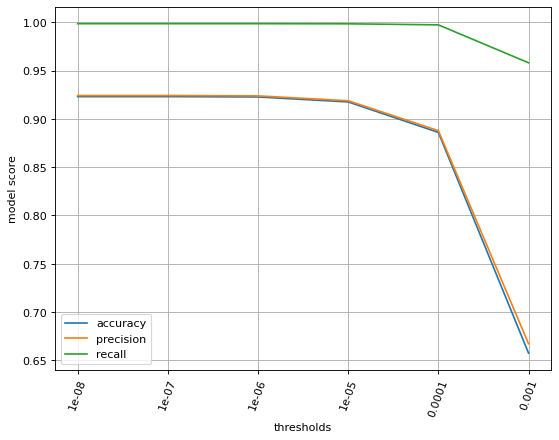

In [163]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='thresholds', ylabel='model score')
plt.xticks(np.arange(len(thresholds)), thresholds, rotation='70')
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_ths, axis=0)[:,i]/9)
plt.legend(['accuracy', 'precision', 'recall'])

In [164]:
thresholds=np.arange(8*1e-4, 3*1e-3, step=1e-4)
comp_ths=np.zeros((len(list_of_companies_number), len(thresholds),3))

In [107]:
thresholds

array([0.0008, 0.0009, 0.001 , 0.0011, 0.0012, 0.0013, 0.0014, 0.0015,
       0.0016, 0.0017, 0.0018, 0.0019, 0.002 , 0.0021, 0.0022, 0.0023,
       0.0024, 0.0025, 0.0026, 0.0027, 0.0028, 0.0029])

In [165]:
time_start=time.time()
for comp_id in range(len(list_of_companies_number)//10):
    print(comp_id)
    X=get_X(comp_id, interval, time_to_skip, time_back, names) 
    for th in range(len(thresholds)):
        print('threshold ', thresholds[th])
       # print(X.shape)
        y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=thresholds[th])
     #   X,y=permutate_Xy(X_hold,y)
      #  print(y.shape)
        comp_ths[comp_id,th,0],comp_ths[comp_id,th,1],comp_ths[comp_id,th,2]=logistic_regr(X, y,split_percent, 
                                                                                           comp_id=comp_id, check_up_down=False, track_params=False, local_names=names_all)
clear_output()
print("calculations took: {} seconds".format(  time.time()-time_start))

calculations took: 76.06475257873535 seconds


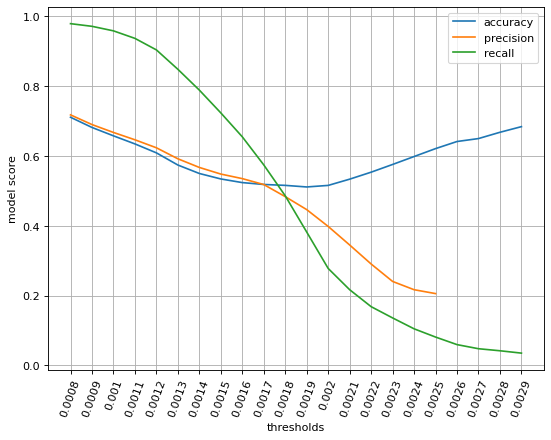

In [166]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='thresholds', ylabel='model score')
plt.xticks(np.arange(len(thresholds)), np.round(thresholds, decimals=4), rotation='70')
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_ths, axis=0)[:,i]/9)
plt.legend(['accuracy', 'precision', 'recall'])

# check interval

In [129]:
time_back=1
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
intervals=[1,3,5,10,15,30]
comp_ints=np.zeros((len(list_of_companies_number), len(intervals),3))

In [290]:
time_start=time.time()
for comp_id in range(len(list_of_companies_number)//10):
    print(comp_id)
    for i in range(len(intervals)):
        X_hold=get_X(comp_id, intervals[i], time_to_skip, time_back, names) 
        print('interval ', intervals[i])
        print(X.shape)
        y=get_y(comp_id, intervals[i], time_to_skip, time_back, y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=threshold)
        print(y.shape)
        X,y=permutate_Xy(X_hold,y)
        comp_ints[comp_id,i,0],comp_ints[comp_id,i,1],comp_ints[comp_id,i,2]=logistic_regr(X, y,split_percent, 
                                                                                           comp_id=comp_id, check_up_down=False, track_params=False, local_names=names)
clear_output()

print("calculations took: {} seconds".format(  time.time()-time_start))

SyntaxError: invalid syntax (<ipython-input-290-e6a0ff42e177>, line 16)

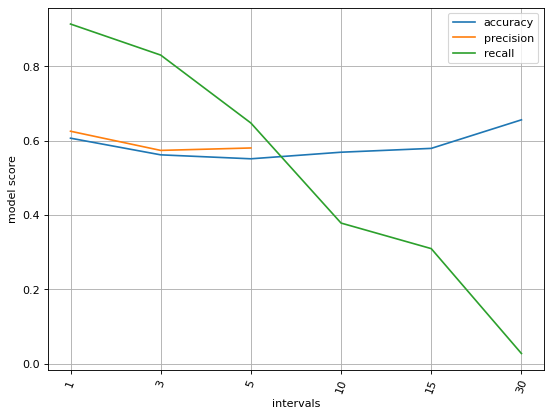

In [135]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='intervals', ylabel='model score')
plt.xticks(np.arange(len(intervals)), intervals, rotation='70')
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_ints, axis=0)[:,i]/9)
plt.legend(['accuracy', 'precision', 'recall'])

# pick threshold for most balanced dataset


In [66]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
thresholds=np.arange(1.6*1e-3, 1.7*1e-3, step=1e-5)
#np.append(np.array([1.2*1e-3]),np.arange(1.6*1e-3, 1.7*1e-3, step=1e-5))
balance=np.zeros((len(list_of_companies_number), 10, len(thresholds), 2))

In [67]:
thresholds

array([0.0016 , 0.00161, 0.00162, 0.00163, 0.00164, 0.00165, 0.00166,
       0.00167, 0.00168, 0.00169])

In [129]:
np.append(np.array([1.2*1e-3]),np.arange(1.6*1e-3, 1.7*1e-3, step=1e-5))

array([0.0012 , 0.0016 , 0.00161, 0.00162, 0.00163, 0.00164, 0.00165,
       0.00166, 0.00167, 0.00168, 0.00169])

In [68]:
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    for th in range(len(thresholds)):
        y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=thresholds[th])
        pom=y.size//10
        for day in range(10):
            balance[comp_id,day, th, 0]=np.sum(y[day*pom:(day+1)*pom])
            balance[comp_id,day, th, 1]=pom - np.sum(y[day*pom:(day+1)*pom])
    clear_output(wait=True)

98


In [72]:
balance[0,0,0]

array([338., 137.])

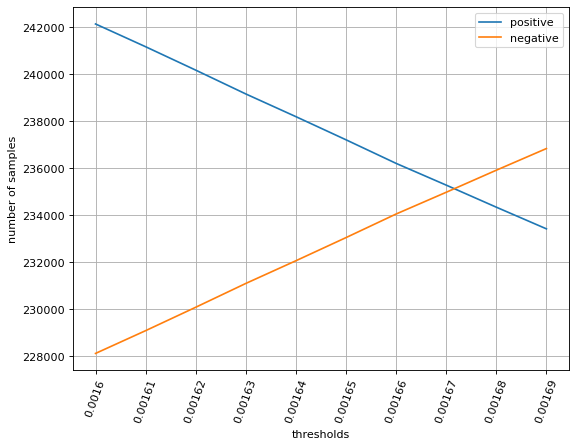

In [70]:
# all companies on all days

figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='thresholds', ylabel='number of samples')
plt.xticks(np.arange(len(thresholds)), np.round(thresholds, decimals=5), rotation='70')
plt.grid()
for i in range(2):
    plt.plot(np.sum(balance, axis=(0,1))[:,i])
plt.legend(['positive', 'negative'])

In [73]:
thresholds[7]

0.0016700000000000003

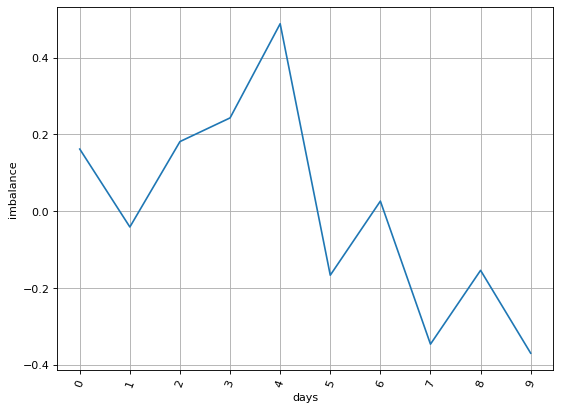

In [75]:
# all companies on all thresholds   ##0.00167 =thresholds[7]
# plot log2(positive/negative)

figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='days', ylabel='imbalance')
plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.log2(np.sum(balance, axis=(0))[:,7,0]/np.sum(balance, axis=(0))[:,7,1]))
#plt.legend(['positive', 'negative'])
#plt.legend(thresholds)

In [136]:
for i in range(10):
    print("threshold: " ,thresholds[i], "average class imbalance: ")
    print(np.sum(np.log2(np.sum(balance, axis=(0))[:,i,0]/np.sum(balance, axis=(0))[:,i,1])/10))

threshold:  0.0012 average class imbalance: 
0.615342798824659
threshold:  0.0016 average class imbalance: 
0.08684610685264377
threshold:  0.00161 average class imbalance: 
0.07486345368106365
threshold:  0.0016200000000000001 average class imbalance: 
0.06254473076539538
threshold:  0.0016300000000000002 average class imbalance: 
0.050007007146666796
threshold:  0.0016400000000000002 average class imbalance: 
0.03806130609272214
threshold:  0.0016500000000000002 average class imbalance: 
0.02588153784237071
threshold:  0.0016600000000000002 average class imbalance: 
0.013460541888116004
threshold:  0.0016700000000000003 average class imbalance: 
0.0020228091177978136
threshold:  0.0016800000000000003 average class imbalance: 
-0.009594211974930659


In [138]:
thresholds[8]

0.0016700000000000003

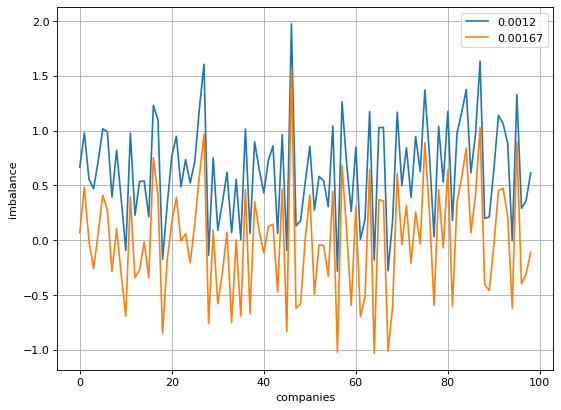

In [139]:
# companies (x) on all days  0.00167 =thresholds[7]
# plot log2(positive/negative)

figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='companies', ylabel='imbalance')
#plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.log2(np.sum(balance, axis=(1))[:,0,0]/np.sum(balance, axis=(1))[:,0,1]))

plt.plot(np.log2(np.sum(balance, axis=(1))[:,8,0]/np.sum(balance, axis=(1))[:,8,1]))
#plt.legend(['positive', 'negative'])
plt.legend([0.0012, 0.00167])

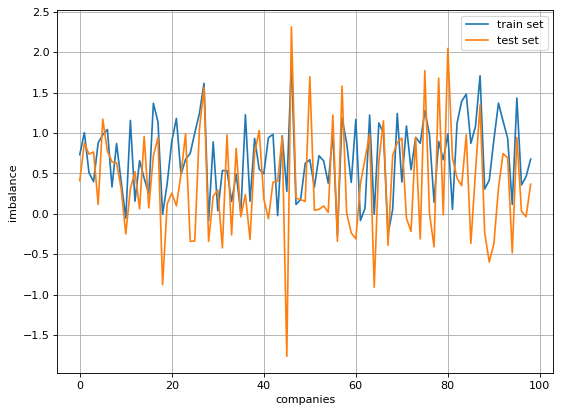

In [141]:
# companies (x) on each day 
# plot log2(positive/negative)

figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='companies', ylabel='imbalance')
#plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.log2(np.sum(balance[:,0:8], axis=(1))[:,0,0]/np.sum(balance[:,0:8], axis=(1))[:,0,1]))
plt.plot(np.log2(np.sum(balance[:,8:], axis=(1))[:,0,0]/np.sum(balance[:,8:], axis=(1))[:,0,1]))

#plt.plot(np.abs(np.log2(np.sum(balance[:,0:8], axis=(1))[:,0,0]/np.sum(balance[:,0:8], axis=(1))[:,0,1])
 #       -np.log2(np.sum(balance[:,8:], axis=(1))[:,0,0]/np.sum(balance[:,8:], axis=(1))[:,0,1])))
#plt.legend(['positive', 'negative'])
plt.legend(["train set", "test set", "abs(difference)"])

In [127]:
np.sum(balance[:,0:8], axis=(1))[:,7,1].shape

(99,)

## compare times when model is bad, almost always(recall>0.9 or <0.1) predicts either pos or neg class

In [159]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
thresholds_compare = (0.0012, 0.00167)
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
comps=np.arange(len(list_of_companies_number))
scores_all_compare_th=np.zeros(shape=(len(comps), 10, 2, 4)) #company, i-th try, threshold, (acc,prec,recall,check_preds)

In [174]:
thresholds_compare[0]

0.0012

In [291]:
for c in range(len(comps)):
    print(c)
    X_hold=get_X(comps[c], interval, time_to_skip, time_back, names_all)
    for th in range(2):
        y_hold=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=thresholds_compare[th])
        for i in range(10):
            X,y=permutate_Xy(X_hold,y_hold)
            scores_all_compare_th[c,i,th,0], scores_all_compare_th[c,i,th,1],scores_all_compare_th[c,i,th,2]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names_all))
            if  scores_all_compare_th[c,i,th,2]>0.9 or  scores_all_compare_th[c,i,th,2]<0.1:
                 scores_all_compare_th[c,i,th,3]=True 
#np will parse above to one, true as if model is super bad, almost always returns either pos or neg class
clear_output(wait)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
true price at index 9,479 was zero!


TypeError: logistic_regr() got an unexpected keyword argument 'use_scaling'

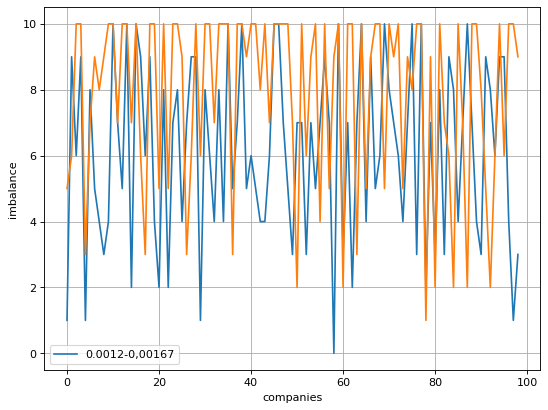

In [183]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='companies', ylabel='imbalance')
#plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.sum(scores_all_compare_th[:,:,0,3], axis=(1)))#-
plt.plot(np.sum(scores_all_compare_th[:,:,1,3], axis=(1)))


#plt.legend(['positive', 'negative'])
plt.legend(["0.0012","0,00167",])


In [184]:
print("0.0012: ", (np.sum(scores_all_compare_th[:,:,0,3], axis=(0,1))))
print("0.00167: ",(np.sum(scores_all_compare_th[:,:,1,3], axis=(0,1))))


0.0012:  610.0
0.00167:  777.0


In [178]:
scores_all_compare_th_no_perm=np.zeros(shape=(len(comps), 10, 2, 4)) #company, i-th try, threshold, (acc,prec,recall,check_preds)

In [179]:
#same as above, but no permutation

for c in range(len(comps)):
    print(c)
    X=get_X(comps[c], interval, time_to_skip, time_back, names_all)
    for th in range(2):
        y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=thresholds_compare[th])
        for i in range(10):
           # X,y=permutate_Xy(X_hold,y_hold)
          #  X,y=X_hold,y_hold
            scores_all_compare_th_no_perm[c,i,th,0], scores_all_compare_th_no_perm[c,i,th,1],scores_all_compare_th_no_perm[c,i,th,2]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names_all))
            if  scores_all_compare_th_no_perm[c,i,th,2]>0.9 or  scores_all_compare_th_no_perm[c,i,th,2]<0.1:
                 scores_all_compare_th_no_perm[c,i,th,3]=True 
#np will parse above to one, true as if model is super bad, almost always returns either pos or neg class
clear_output(wait=True)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
true price at index 9,479 was zero!
Coefficient impact:
true_price   -0.8626047
order_inbalance   -1.0315343
vwaps_buy   1.6480994
vwaps_sell   0.41856942
s2f_impact_buy   -0.2174339
s2f_impact_sell   0.34641722
trading_volumes   -0.7341439
price_volatilities   0.7351986
vwaps_order_sizes_buy   -0.0760045
vwaps_order_sizes_sell   -0.3220271
s2f_order_sizes_buy   -0.0760045
s2f_order_sizes_sell   -0.3220271
next_trade_time   0.3485928
next_trade_size   2.1449323
next_trade_price   1.4911623
[[ 86  97]
 [370 397]]
Coefficient impact:
true_price   -0.65749353
order_inbalance   -1.3097459
vwaps_buy   1.3847609
vwaps_sell   0.3517165
s2f_impact_buy   -0.07353058
s2f_impact_sell   0.43479452
trading_volumes   -0.80422366
price_volatilities   0.76464427
vwaps_order_sizes_buy   -0.14855774
vwaps_order_sizes_sell   -0.5545125
s2f_order_sizes_buy   -0.148557

26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.975829
order_inbalance   0.035244156
vwaps_buy   0.4290497
vwaps_sell   1.067583
s2f_impact_buy   0.71298575
s2f_impact_sell   0.19548863
trading_volumes   -1.0821316
price_volatilities   -0.14274243
vwaps_order_sizes_buy   0.5532004
vwaps_order_sizes_sell   -0.4505134
s2f_order_sizes_buy   0.5532004
s2f_order_sizes_sell   -0.4505134
next_trade_time   0.13134983
next_trade_size   0.8087953
next_trade_price   -0.36299935
[[528 421]
 [  1   0]]
Coefficient impact:
true_price   -2.0912702
order_inbalance   0.018996477
vwaps_buy   0.085124865
vwaps_sell   1.0896504
s2f_impact_buy   0.8135809
s2f_impact_sell   0.27555093
trading_volumes   -1.4412903
price_volatilities   0.046436816
vwaps_order_sizes_buy   0.688367
vwaps_order_sizes_sell   -0.6264596
s2f_order_sizes_buy   0.688367
s2f_order_sizes_sell   -0.6

Coefficient impact:
true_price   -2.4985037
order_inbalance   0.45631957
vwaps_buy   0.51928663
vwaps_sell   1.34371
s2f_impact_buy   0.93216425
s2f_impact_sell   0.5162862
trading_volumes   -1.1331877
price_volatilities   0.10103208
vwaps_order_sizes_buy   0.62753963
vwaps_order_sizes_sell   -0.47489285
s2f_order_sizes_buy   0.62753963
s2f_order_sizes_sell   -0.47489285
next_trade_time   0.6700482
next_trade_size   0.9509264
next_trade_price   -0.14816207
[[114 147]
 [313 376]]
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -0.028070882
order_inbalance   -0.21417269
vwaps_buy   -1.6923369
vwaps_sell   0.055664003
s2f_impact_buy   0.91283476
s2f_impact_sell   -0.7331768
trading_volumes   0.5105683
price_volatilities   -0.022116918
vwaps_order_sizes_buy   -0.34039176
vwaps_order_sizes_sell   -0.07649905
s2f_order_sizes_buy   -0.34039176
s2f_order_sizes_sell   -0.07649905
next

[[ 87 122]
 [284 457]]
Coefficient impact:
true_price   -0.33098635
order_inbalance   -0.58651793
vwaps_buy   -1.3165259
vwaps_sell   0.88928676
s2f_impact_buy   0.87222797
s2f_impact_sell   -1.230994
trading_volumes   0.6667732
price_volatilities   -0.13749114
vwaps_order_sizes_buy   -0.056783132
vwaps_order_sizes_sell   0.22401702
s2f_order_sizes_buy   -0.056783132
s2f_order_sizes_sell   0.22401702
next_trade_time   -2.3451505
next_trade_size   -0.071663566
next_trade_price   0.6959915
[[  1  16]
 [370 563]]
Coefficient impact:
true_price   -0.13297589
order_inbalance   -0.68155736
vwaps_buy   -1.704722
vwaps_sell   0.6877346
s2f_impact_buy   0.66274196
s2f_impact_sell   -0.85238266
trading_volumes   0.33559313
price_volatilities   -0.1450423
vwaps_order_sizes_buy   -0.10765856
vwaps_order_sizes_sell   0.06743992
s2f_order_sizes_buy   -0.10765856
s2f_order_sizes_sell   0.06743992
next_trade_time   -2.2255619
next_trade_size   -0.185753
next_trade_price   0.47678128
[[  0   3]
 [371 5

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


  -0.06170881
vwaps_sell   -0.23515607
s2f_impact_buy   -0.10363204
s2f_impact_sell   -0.08718551
trading_volumes   0.85177493
price_volatilities   0.38670462
vwaps_order_sizes_buy   -0.38596636
vwaps_order_sizes_sell   0.4831002
s2f_order_sizes_buy   -0.38596636
s2f_order_sizes_sell   0.4831002
next_trade_time   -0.13830541
next_trade_size   0.5950739
next_trade_price   -0.3603841
[[  0   1]
 [354 595]]
Coefficient impact:
true_price   -0.49682644
order_inbalance   1.0859932
vwaps_buy   -0.3034742
vwaps_sell   -0.12034805
s2f_impact_buy   -0.16694419
s2f_impact_sell   0.10051571
trading_volumes   0.76103455
price_volatilities   0.47898066
vwaps_order_sizes_buy   -0.34103996
vwaps_order_sizes_sell   0.50323695
s2f_order_sizes_buy   -0.34103996
s2f_order_sizes_sell   0.50323695
next_trade_time   -0.029040534
next_trade_size   0.43971232
next_trade_price   -0.32053468
[[  0   1]
 [354 595]]
Coefficient impact:
true_price   -0.4308896
order_inbalance   1.0103813
vwaps_buy   -0.15590155
vw

vwaps_order_sizes_buy   -0.11720558
vwaps_order_sizes_sell   -0.17272726
s2f_order_sizes_buy   -0.11720558
s2f_order_sizes_sell   -0.17272726
next_trade_time   -0.83864045
next_trade_size   -0.25020388
next_trade_price   0.9661828
[[ 15 100]
 [195 640]]
Coefficient impact:
true_price   -1.5733572
order_inbalance   1.0888201
vwaps_buy   -0.7503427
vwaps_sell   -0.2229495
s2f_impact_buy   1.4566545
s2f_impact_sell   0.4262376
trading_volumes   0.5856837
price_volatilities   0.4639887
vwaps_order_sizes_buy   -0.12615894
vwaps_order_sizes_sell   0.10428621
s2f_order_sizes_buy   -0.12615894
s2f_order_sizes_sell   0.10428621
next_trade_time   -0.9304198
next_trade_size   -0.052254777
next_trade_price   1.1063337
[[  4  17]
 [206 723]]
Coefficient impact:
true_price   -1.5941277
order_inbalance   0.97618604
vwaps_buy   -0.6233568
vwaps_sell   -0.14860845
s2f_impact_buy   1.3544923
s2f_impact_sell   0.0738442
trading_volumes   0.65587294
price_volatilities   0.3119706
vwaps_order_sizes_buy   -

[[ 51  79]
 [301 519]]
Coefficient impact:
true_price   -2.4318135
order_inbalance   -0.7862708
vwaps_buy   -0.09012641
vwaps_sell   -1.4467803
s2f_impact_buy   0.4771528
s2f_impact_sell   0.98929995
trading_volumes   0.26680073
price_volatilities   -0.40353295
vwaps_order_sizes_buy   1.0964386
vwaps_order_sizes_sell   0.37142503
s2f_order_sizes_buy   1.0964386
s2f_order_sizes_sell   0.37142503
next_trade_time   -0.40798885
next_trade_size   1.315936
next_trade_price   -0.25361907
[[109 162]
 [243 436]]
Coefficient impact:
true_price   -2.569019
order_inbalance   -0.81500196
vwaps_buy   0.27889925
vwaps_sell   -1.6918039
s2f_impact_buy   0.85217047
s2f_impact_sell   0.50186735
trading_volumes   0.40125328
price_volatilities   -0.05440749
vwaps_order_sizes_buy   1.3081547
vwaps_order_sizes_sell   0.085902005
s2f_order_sizes_buy   1.3081547
s2f_order_sizes_sell   0.085902005
next_trade_time   -0.5038179
next_trade_size   1.3262439
next_trade_price   -0.32159033
[[  0   0]
 [352 598]]
Coe

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [352 598]]
Coefficient impact:
true_price   -2.0400665
order_inbalance   -0.99660087
vwaps_buy   0.17876564
vwaps_sell   -1.4258633
s2f_impact_buy   0.687539
s2f_impact_sell   0.7400103
trading_volumes   0.2900812
price_volatilities   -0.24120317
vwaps_order_sizes_buy   1.1241064
vwaps_order_sizes_sell   0.10919242
s2f_order_sizes_buy   1.1241064
s2f_order_sizes_sell   0.10919242
next_trade_time   -0.30424654
next_trade_size   1.143144
next_trade_price   0.13174136
[[ 43  57]
 [309 541]]
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -2.488489
order_inbalance   0.5246048
vwaps_buy   0.15911223
vwaps_sell   0.41972587
s2f_impact_buy   0.1752
s2f_impact_sell   0.011997166
trading_volumes   -1.6976593
price_volatilities   -0.3013223
vwaps_order_sizes_buy   -0.36451128
vwaps_order_sizes_sell   -0.6136165
s2f_order_sizes_buy   -0.36451128
s2f_order_sizes_sell  

 [251 467]]
Coefficient impact:
true_price   -2.4005818
order_inbalance   0.11136441
vwaps_buy   0.60939556
vwaps_sell   1.2744377
s2f_impact_buy   0.7203825
s2f_impact_sell   -0.5721848
trading_volumes   -1.8130786
price_volatilities   0.0292025
vwaps_order_sizes_buy   -0.3560169
vwaps_order_sizes_sell   -0.38180697
s2f_order_sizes_buy   -0.3560169
s2f_order_sizes_sell   -0.38180697
next_trade_time   0.44607005
next_trade_size   -0.7388044
next_trade_price   0.23524782
[[252 447]
 [ 68 183]]
Coefficient impact:
true_price   -2.412464
order_inbalance   0.13147801
vwaps_buy   0.39066964
vwaps_sell   0.88518584
s2f_impact_buy   0.28768286
s2f_impact_sell   -0.2755761
trading_volumes   -1.8543782
price_volatilities   -0.023249147
vwaps_order_sizes_buy   -0.27963412
vwaps_order_sizes_sell   -0.39256918
s2f_order_sizes_buy   -0.27963412
s2f_order_sizes_sell   -0.39256918
next_trade_time   0.3581918
next_trade_size   -0.8745053
next_trade_price   0.38091514
[[ 22  49]
 [298 581]]
Coefficient

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[ 10   8]
 [455 477]]
Coefficient impact:
true_price   -1.7366815
order_inbalance   -0.79682577
vwaps_buy   -0.093446195
vwaps_sell   2.3374207
s2f_impact_buy   1.0135794
s2f_impact_sell   0.9262799
trading_volumes   -1.5228038
price_volatilities   1.1597447
vwaps_order_sizes_buy   -0.7841035
vwaps_order_sizes_sell   0.5272518
s2f_order_sizes_buy   -0.7841035
s2f_order_sizes_sell   0.5272518
next_trade_time   0.92667234
next_trade_size   2.3557947
next_trade_price   1.9004326
[[282 272]
 [183 213]]
Coefficient impact:
true_price   -1.4553531
order_inbalance   -0.84025866
vwaps_buy   -0.123800755
vwaps_sell   2.649426
s2f_impact_buy   0.7891024
s2f_impact_sell   0.75726104
trading_volumes   -1.6984022
price_volatilities   1.175643
vwaps_order_sizes_buy   -0.743651
vwaps_order_sizes_sell   0.74729466
s2f_order_sizes_buy   -0.743651
s2f_order_sizes_sell   0.74729466
next_trade_time   0.90382373
next_trade_size   2.0070028
next_trade_price   1.8341267
[[ 68  80]
 [397 405]]
Coefficient im

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
Coefficient impact:
true_price   -0.16694391
order_inbalance   0.009328837
vwaps_buy   0.35205406
vwaps_sell   0.89799607
s2f_impact_buy   0.27398762
s2f_impact_sell   -1.0877335
trading_volumes   -0.60458356
price_volatilities   0.07920715
vwaps_order_sizes_buy   -1.0780379
vwaps_order_sizes_sell   1.4781364
s2f_order_sizes_buy   -1.0780379
s2f_order_sizes_sell   1.4781364
next_trade_time   0.63380873
next_trade_size   -1.9398478
next_trade_price   0.2819613
[[447 454]
 [  7  42]]
Coefficient impact:
true_price   -0.2041906
order_inbalance   -0.03636159
vwaps_buy   0.6586968
vwaps_sell   0.64891064
s2f_impact_buy   0.5956183
s2f_impact_sell   -0.8901492
trading_volumes   -0.963412
price_volatilities   0.365858
vwaps_order_sizes_buy   -0.81518924
vwaps_order_sizes_sell   1.4282556
s2f_order_sizes_buy   -0.81518924
s2f_order_sizes_sell   1.4282556
next_trade_time   0.69273

 [312 638]]
Coefficient impact:
true_price   -0.9195216
order_inbalance   -0.36876968
vwaps_buy   -0.27154845
vwaps_sell   1.7728688
s2f_impact_buy   1.0642132
s2f_impact_sell   -0.7809239
trading_volumes   0.053189803
price_volatilities   0.36967215
vwaps_order_sizes_buy   -0.6928403
vwaps_order_sizes_sell   1.5885504
s2f_order_sizes_buy   -0.6928403
s2f_order_sizes_sell   1.5885504
next_trade_time   0.3095236
next_trade_size   -2.0684776
next_trade_price   0.83186084
[[196 428]
 [116 210]]
Coefficient impact:
true_price   -1.0265021
order_inbalance   -0.71565914
vwaps_buy   -0.26679888
vwaps_sell   1.8182473
s2f_impact_buy   0.61237633
s2f_impact_sell   -0.9220014
trading_volumes   -0.41698545
price_volatilities   0.25966215
vwaps_order_sizes_buy   -0.89961094
vwaps_order_sizes_sell   1.337427
s2f_order_sizes_buy   -0.89961094
s2f_order_sizes_sell   1.337427
next_trade_time   0.44790402
next_trade_size   -2.1676204
next_trade_price   0.68448573
[[ 26 114]
 [286 524]]
Coefficient impa

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   -1.0288553
order_inbalance   0.47490358
vwaps_buy   1.0276903
vwaps_sell   -0.24803336
s2f_impact_buy   0.4088701
s2f_impact_sell   0.45528615
trading_volumes   1.313366
price_volatilities   0.5527042
vwaps_order_sizes_buy   0.65550786
vwaps_order_sizes_sell   1.0510242
s2f_order_sizes_buy   0.65550786
s2f_order_sizes_sell   1.0510242
next_trade_time   0.5256683
next_trade_size   -0.5786879
next_trade_price   -0.332899
[[ 56 140]
 [307 447]]
Coefficient impact:
true_price   -0.7350473
order_inbalance   0.3717923
vwaps_buy   0.7991423
vwaps_sell   -0.20475137
s2f_impact_buy   0.35822475
s2f_impact_sell   0.63559484
trading_volumes   1.3821042
price_volatilities   0.41183218
vwaps_order_sizes_buy   0.565701
vwaps_order_sizes_sell   1.1218961
s2f_order_sizes_buy   0.565701
s2f_order_sizes_sell   1.1218961
next_trade_time

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.88995767
order_inbalance   0.7700695
vwaps_buy   -0.18857859
vwaps_sell   -0.021432828
s2f_impact_buy   0.5113209
s2f_impact_sell   0.25186494
trading_volumes   0.78458405
price_volatilities   -0.3842764
vwaps_order_sizes_buy   1.0668622
vwaps_order_sizes_sell   0.7670841
s2f_order_sizes_buy   1.0668622
s2f_order_sizes_sell   0.7670841
next_trade_time   -1.9826711
next_trade_size   -0.8577439
next_trade_price   -0.027118515
[[  3   1]
 [264 682]]
Coefficient impact:
true_price   -0.68984586
order_inbalance   0.73564774
vwaps_buy   -0.24538122
vwaps_sell   0.11649599
s2f_impact_buy   0.6740645
s2f_impact_sell   0.73310655
trading_volumes   1.0934497
price_volatilities   0.059565056
vwaps_order_sizes_buy   0.85275096
vwaps_order_sizes_sell   0.94893956
s2f_order_sizes_buy   0.85275096
s2f_order_sizes_sell   0.94893956
next_trade_time   -1.6978055
next_trade_size   -0.5189922
next_trade_price   -0.19855209
[[  2   1]
 [265 682]]
Coefficient impact:
true

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.0091344
order_inbalance   0.4857662
vwaps_buy   -0.2806433
vwaps_sell   0.24792689
s2f_impact_buy   0.61382633
s2f_impact_sell   0.48784792
trading_volumes   1.2997434
price_volatilities   0.025537971
vwaps_order_sizes_buy   0.6406932
vwaps_order_sizes_sell   0.8915305
s2f_order_sizes_buy   0.6406932
s2f_order_sizes_sell   0.8915305
next_trade_time   -1.7103219
next_trade_size   -0.760619
next_trade_price   0.0876489
[[  3   1]
 [264 682]]
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -0.7904064
order_inbalance   -0.09535335
vwaps_buy   0.26265228
vwaps_sell   0.8039019
s2f_impact_buy   0.16517289
s2f_impact_sell   0.16928858
trading_volumes   0.25558084
price_volatilities   -0.10009591
vwaps_order_sizes_buy   0.05218554
vwaps_order_sizes_sell   0.99782145
s2f_order_sizes_buy   0.05218554
s2f_order_sizes_sell   0.9978214

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.77281713
order_inbalance   0.6003092
vwaps_buy   0.39300504
vwaps_sell   -0.273072
s2f_impact_buy   0.0074601052
s2f_impact_sell   0.2848612
trading_volumes   0.63048315
price_volatilities   -0.17106399
vwaps_order_sizes_buy   -0.030691624
vwaps_order_sizes_sell   1.0008091
s2f_order_sizes_buy   -0.030691624
s2f_order_sizes_sell   1.0008091
next_trade_time   -0.39926875
next_trade_size   0.42013937
next_trade_price   1.0380785
[[  3   1]
 [247 699]]
Coefficient impact:
true_price   -0.76634705
order_inbalance   0.367884
vwaps_buy   0.49306956
vwaps_sell   -0.2684696
s2f_impact_buy   0.1789306
s2f_impact_sell   0.25430113
trading_volumes   0.6423619
price_volatilities   -0.058636606
vwaps_order_sizes_buy   -0.07131582
vwaps_order_sizes_sell   0.9395415
s2f_order_sizes_buy   -0.07131582
s2f_order_sizes_sell   0.9395415
next_trade_time   -0.2256003
next_trade_size   0.48468837
next_trade_price   1.0954014
[[  0   0]
 [250 700]]
Coefficient impact:
true_

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



vwaps_buy   0.5434051
vwaps_sell   -0.3394479
s2f_impact_buy   -0.0028123567
s2f_impact_sell   0.43191302
trading_volumes   0.5650852
price_volatilities   0.012299419
vwaps_order_sizes_buy   0.10545322
vwaps_order_sizes_sell   1.1431545
s2f_order_sizes_buy   0.10545322
s2f_order_sizes_sell   1.1431545
next_trade_time   -0.32957882
next_trade_size   0.30838788
next_trade_price   0.7935569
[[  8   3]
 [242 697]]
Coefficient impact:
true_price   -0.7390896
order_inbalance   0.414759
vwaps_buy   0.49794078
vwaps_sell   -0.23008995
s2f_impact_buy   0.057486497
s2f_impact_sell   0.28674304
trading_volumes   0.5614342
price_volatilities   -0.15832585
vwaps_order_sizes_buy   -0.008029385
vwaps_order_sizes_sell   0.9298927
s2f_order_sizes_buy   -0.008029385
s2f_order_sizes_sell   0.9298927
next_trade_time   -0.469996
next_trade_size   0.22748688
next_trade_price   0.9694584
[[  2   0]
 [248 700]]
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.0729166

[[  2   0]
 [233 715]]
Coefficient impact:
true_price   -1.5267367
order_inbalance   0.8801869
vwaps_buy   0.20434797
vwaps_sell   0.17923696
s2f_impact_buy   -0.1235503
s2f_impact_sell   0.08047026
trading_volumes   0.6807381
price_volatilities   -0.81989586
vwaps_order_sizes_buy   1.0192482
vwaps_order_sizes_sell   -0.33481503
s2f_order_sizes_buy   1.0192482
s2f_order_sizes_sell   -0.33481503
next_trade_time   -1.5482706
next_trade_size   -0.91438866
next_trade_price   0.4316367
[[155 509]
 [ 80 206]]
12
25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
Coefficient impact:
true_price   -2.2957826
order_inbalance   -0.20977244
vwaps_buy   0.06463904
vwaps_sell   0.6587782
s2f_impact_buy   1.2520696
s2f_impact_sell   1.4782002
trading_volumes   -1.3024777
price_volatilities   -0.116278484
vwaps_order_sizes_buy   0.0793476
vwaps_order_sizes_sell   -0.3426785
s2f_order_sizes_buy   0.079347

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.0660632
order_inbalance   -0.5500318
vwaps_buy   0.3528865
vwaps_sell   0.28979325
s2f_impact_buy   1.3330532
s2f_impact_sell   1.5150212
trading_volumes   -0.55996424
price_volatilities   -0.19608454
vwaps_order_sizes_buy   -1.0586501
vwaps_order_sizes_sell   -0.3816143
s2f_order_sizes_buy   -1.0586501
s2f_order_sizes_sell   -0.3816143
next_trade_time   -1.7632871
next_trade_size   0.9539
next_trade_price   0.5133181
[[ 17  10]
 [368 555]]
Coefficient impact:
true_price   -2.4562545
order_inbalance   -0.30615678
vwaps_buy   -0.08082507
vwaps_sell   0.24056186
s2f_impact_buy   1.1652635
s2f_impact_sell   1.5254424
trading_volumes   -0.63579214
price_volatilities   -0.18047094
vwaps_order_sizes_buy   -0.88483065
vwaps_order_sizes_sell   -0.35978806
s2f_order_sizes_buy   -0.88483065
s2f_order_sizes_sell   -0.35978806
next_trade_time   -1.3105385
next_trade_size   0.89305836
next_trade_price   0.32282186
[[  2   0]
 [383 565]]
Coefficient impact:
true_p

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -1.1854705
order_inbalance   -0.24440734
vwaps_buy   0.1324202
vwaps_sell   0.47261658
s2f_impact_buy   0.84366965
s2f_impact_sell   0.15157932
trading_volumes   0.3501521
price_volatilities   0.16215977
vwaps_order_sizes_buy   -0.70053774
vwaps_order_sizes_sell   0.865391
s2f_order_sizes_buy   -0.70053774
s2f_order_sizes_sell   0.865391
next_trade_time   -0.32065967
next_trade_size   0.8460105
next_trade_price   -0.32812592
[[  9  38]
 [321 582]]
Coefficient impact:
true_price   -1.1025225
order_inbalance   -0.20748635
vwaps_buy   0.18820684
vwaps_sell   0.18159519
s2f_impact_buy   1.0858135
s2f_impact_sell   0.022779776
trading_volumes   0.3386448
price_volatilities   0.4355459
vwaps_order_sizes_buy   -0.7317536
vwaps_order_sizes_sell   0.7858098
s2f_order_sizes_buy   -0.7317536
s2f_order_sizes_sell   0.7858098
n

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.2775421
order_inbalance   -0.2558202
vwaps_buy   0.49579474
vwaps_sell   0.8951275
s2f_impact_buy   1.0057123
s2f_impact_sell   0.14357686
trading_volumes   -1.245887
price_volatilities   0.27177116
vwaps_order_sizes_buy   -0.217575
vwaps_order_sizes_sell   0.59389174
s2f_order_sizes_buy   -0.217575
s2f_order_sizes_sell   0.59389174
next_trade_time   -1.9429255
next_trade_size   0.1882907
next_trade_price   -0.4445399
[[  0   0]
 [218 732]]
Coefficient impact:
true_price   -1.0915533
order_inbalance   -0.8111131
vwaps_buy   0.6421695
vwaps_sell   0.64035356
s2f_impact_buy   0.9203082
s2f_impact_sell   -0.3083113
trading_volumes   -1.3143262
price_volatilities   0.013299128
vwaps_order_sizes_buy   -0.43359986
vwaps_order_sizes_sell   0.52226335
s2f_order_sizes_buy   -0.43359986
s2f_order_sizes_sell   0.52226335
next_trade_time   -1.6008108
next_trade_size   0.47779077
next_trade_price   -0.23758775
[[ 23  42]
 [195 690]]
14
31.5625% of intervals were 

Coefficient impact:
true_price   -0.1381113
order_inbalance   1.4287492
vwaps_buy   1.2622831
vwaps_sell   -0.19878452
s2f_impact_buy   1.550941
s2f_impact_sell   -0.46192133
trading_volumes   -0.21907477
price_volatilities   -0.7941937
vwaps_order_sizes_buy   1.0247747
vwaps_order_sizes_sell   -0.47645596
s2f_order_sizes_buy   1.0247747
s2f_order_sizes_sell   -0.47645596
next_trade_time   0.099264115
next_trade_size   -1.9559557
next_trade_price   0.78228366
[[  8  24]
 [375 543]]
Coefficient impact:
true_price   0.062176984
order_inbalance   1.2195512
vwaps_buy   0.8407928
vwaps_sell   -0.20162444
s2f_impact_buy   1.5138663
s2f_impact_sell   -0.6010356
trading_volumes   0.24883406
price_volatilities   -0.01347478
vwaps_order_sizes_buy   0.58274126
vwaps_order_sizes_sell   -0.44650704
s2f_order_sizes_buy   0.58274126
s2f_order_sizes_sell   -0.44650704
next_trade_time   0.13620923
next_trade_size   -1.0608088
next_trade_price   0.7399465
[[  0   8]
 [383 559]]
Coefficient impact:
true_

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   0.025890172
order_inbalance   0.51481724
vwaps_buy   0.83440995
vwaps_sell   1.1676793
s2f_impact_buy   -1.4848576
s2f_impact_sell   -0.29472017
trading_volumes   0.2038238
price_volatilities   -0.42489567
vwaps_order_sizes_buy   0.032937743
vwaps_order_sizes_sell   0.032614224
s2f_order_sizes_buy   0.032937743
s2f_order_sizes_sell   0.032614224
next_trade_time   -0.51130867
next_trade_size   -0.15684171
next_trade_price   0.23387346
[[  0   6]
 [383 561]]
Coefficient impact:
true_price   -0.028823525
order_inbalance   0.26417753
vwaps_buy   0.5010846
vwaps_sell   0.8661803
s2f_impact_buy   -1.4346749
s2f_impact_sell   -0.45235133
trading_volumes   -0.021575809
price_volatilities   -0.7237971
vwaps_order_sizes_buy   -0.05141341
vwaps_order_sizes_sell   0.26763228
s2f_order_sizes_buy   -0.05141341
s2f_order_sizes_sell   0.26763228
next_trade_time   -0.46219602
next_trade_size   0.36538154
next_trade_price   0.21382716
[[  0   1]
 [383 566]]
Coefficient 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -2.8945434
order_inbalance   0.15089126
vwaps_buy   0.07950746
vwaps_sell   1.7660719
s2f_impact_buy   -0.46291965
s2f_impact_sell   -0.77011
trading_volumes   0.20049779
price_volatilities   0.7642892
vwaps_order_sizes_buy   -0.083895914
vwaps_order_sizes_sell   0.95291317
s2f_order_sizes_buy   -0.083895914
s2f_order_sizes_sell   0.95291317
next_trade_time   0.6770477
next_trade_size   1.2976731
next_trade_price   1.2787862
[[460 483]
 [  6   1]]
Coefficient impact:
true_price   -3.3663852
order_inbalance   0.20232353
vwaps_buy   0.2615983
vwaps_sell   1.8658509
s2f_impact_buy   -0.5181605
s2f_impact_sell   -0.20290549
trading_volumes   0.2076206
price_volatilities   0.60403216
vwaps_order_sizes_buy   -0.41141433
vwaps_order_sizes_sell   1.1782043
s2f_order_sizes_buy   -0.41141433
s2f_order_sizes_sell   

Coefficient impact:
true_price   -3.167577
order_inbalance   -0.28019497
vwaps_buy   0.04593242
vwaps_sell   0.38219538
s2f_impact_buy   -0.34270158
s2f_impact_sell   -0.23200102
trading_volumes   0.19815415
price_volatilities   0.63157874
vwaps_order_sizes_buy   -0.16466178
vwaps_order_sizes_sell   1.4494084
s2f_order_sizes_buy   -0.16466178
s2f_order_sizes_sell   1.4494084
next_trade_time   0.3495879
next_trade_size   1.5430193
next_trade_price   1.8987823
[[345 567]
 [ 17  21]]
17
25.5% of intervals were SELL empty
25.5625% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
true_price   -2.8486562
order_inbalance   -0.5576499
vwaps_buy   1.3715146
vwaps_sell   -0.013392751
s2f_impact_buy   0.2577807
s2f_impact_sell   0.7804752
trading_volumes   -0.91783047
price_volatilities   -0.1679755
vwaps_order_sizes_buy   0.32208154
vwaps_order_sizes_sell   -0.13901187
s2f_order_sizes_buy   0.32208154
s2f_order_sizes_sell   -0.13901187
next_trade_time   0.1

Coefficient impact:
true_price   -2.3008301
order_inbalance   -0.4520577
vwaps_buy   1.6087409
vwaps_sell   -0.11858047
s2f_impact_buy   -0.12145009
s2f_impact_sell   0.6840661
trading_volumes   -0.518827
price_volatilities   -0.0066665895
vwaps_order_sizes_buy   0.32003453
vwaps_order_sizes_sell   0.3610971
s2f_order_sizes_buy   0.32003453
s2f_order_sizes_sell   0.3610971
next_trade_time   -1.4120072
next_trade_size   -1.3992851
next_trade_price   1.0492342
[[130 100]
 [264 456]]
Coefficient impact:
true_price   -2.178697
order_inbalance   -0.31199193
vwaps_buy   1.4824991
vwaps_sell   0.28685355
s2f_impact_buy   -0.20502949
s2f_impact_sell   0.5958199
trading_volumes   -0.9522289
price_volatilities   -0.15596265
vwaps_order_sizes_buy   0.7335234
vwaps_order_sizes_sell   -0.2453517
s2f_order_sizes_buy   0.7335234
s2f_order_sizes_sell   -0.2453517
next_trade_time   -0.61208695
next_trade_size   -1.7577363
next_trade_price   1.0033675
[[  0   1]
 [394 555]]
Coefficient impact:
true_pric

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -2.3416874
order_inbalance   0.8547108
vwaps_buy   -0.12617853
vwaps_sell   -0.6119322
s2f_impact_buy   0.46027803
s2f_impact_sell   0.6869326
trading_volumes   -1.368587
price_volatilities   0.10507438
vwaps_order_sizes_buy   0.10780237
vwaps_order_sizes_sell   -0.4819578
s2f_order_sizes_buy   0.10780237
s2f_order_sizes_sell   -0.4819578
next_trade_time   -0.015784161
next_trade_size   1.7979153
next_trade_price   0.039727002
[[  0   9]
 [226 715]]
Coefficient impact:
true_price   -2.2511995
order_inbalance   0.87279433
vwaps_buy   -0.36810333
vwaps_sell   -0.76782364
s2f_impact_buy   0.5788155
s2f_impact_sell   0.69963914
trading_volumes   -1.7048396
price_volatilities   0.07629819
vwaps_order_sizes_buy   -0.06004062
vwaps_order_sizes_sell   -0.5623445
s2f_order_sizes_buy   -0.06004062
s2f_order_sizes_sell   -0.5623445
next_trade_time   -0.21368437
next_trade_size   1.724581
next_trade_price   -0.040769048
[[  0   7]
 [226 717]]
Coefficient impact:
t

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.8169832
order_inbalance   0.99615276
vwaps_buy   -2.1219816
vwaps_sell   0.39627036
s2f_impact_buy   0.5109922
s2f_impact_sell   -0.07327426
trading_volumes   -1.7763901
price_volatilities   -0.27901912
vwaps_order_sizes_buy   0.023034375
vwaps_order_sizes_sell   -0.19715665
s2f_order_sizes_buy   0.023034375
s2f_order_sizes_sell   -0.19715665
next_trade_time   -0.08900114
next_trade_size   1.5121849
next_trade_price   0.5783296
[[  0   0]
 [134 816]]
Coefficient impact:
true_price   -2.0963724
order_inbalance   0.9045772
vwaps_buy   -1.9183292
vwaps_sell   0.45409492
s2f_impact_buy   0.6591179
s2f_impact_sell   0.004455746
trading_volumes   -1.2767622
price_volatilities   0.013727035
vwaps_order_sizes_buy   -0.06909637
vwaps_order_sizes_sell   0.06680275
s2f_order_sizes_buy   -0.06909637
s2f_order_sizes_sell   0.06680275
next_trade_time   0.19072782
next_trade_size   1.6763047
next_trade_price   0.5315629
[[  0   0]
 [134 816]]
Coefficient impact:
tr

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [134 816]]
Coefficient impact:
true_price   -2.0372741
order_inbalance   0.7646572
vwaps_buy   -1.9787242
vwaps_sell   0.33390886
s2f_impact_buy   0.353021
s2f_impact_sell   -0.17569262
trading_volumes   -1.5963627
price_volatilities   -0.08275381
vwaps_order_sizes_buy   0.11029953
vwaps_order_sizes_sell   -0.16925307
s2f_order_sizes_buy   0.11029953
s2f_order_sizes_sell   -0.16925307
next_trade_time   0.07001792
next_trade_size   1.6010275
next_trade_price   0.55542237
[[  0   0]
 [134 816]]
Coefficient impact:
true_price   -1.6577463
order_inbalance   0.940178
vwaps_buy   -1.8908097
vwaps_sell   0.50453126
s2f_impact_buy   0.38904268
s2f_impact_sell   -0.22938356
trading_volumes   -1.64122
price_volatilities   0.13780098
vwaps_order_sizes_buy   -0.081575826
vwaps_order_sizes_sell   -0.076376446
s2f_order_sizes_buy   -0.081575826
s2f_order_sizes_sell   -0.076376446
next_trade_time   0.78187144
next_trade_size   1.5777899
next_trade_price   0.63738114
[[  0   0]
 [134 816]]

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.5233061
order_inbalance   0.75773615
vwaps_buy   0.64081234
vwaps_sell   1.5264313
s2f_impact_buy   -0.41761127
s2f_impact_sell   0.13176283
trading_volumes   -0.020125253
price_volatilities   -0.43737495
vwaps_order_sizes_buy   -0.07497458
vwaps_order_sizes_sell   0.06438085
s2f_order_sizes_buy   -0.07497458
s2f_order_sizes_sell   0.06438085
next_trade_time   0.3045352
next_trade_size   0.89757377
next_trade_price   0.33519092
[[ 44  54]
 [363 489]]
Coefficient impact:
true_price   -1.6586435
order_inbalance   0.4706113
vwaps_buy   0.5399261
vwaps_sell   1.8766708
s2f_impact_buy   -0.30346534
s2f_impact_sell   0.046762183
trading_volumes   0.32298234
price_volatilities   -0.34711933
vwaps_order_sizes_buy   -0.06653511
vwaps_order_sizes_sell   0.030952897
s2f_order_sizes_buy   -0.06653511
s2f_order_si

32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -1.068735
order_inbalance   0.8624355
vwaps_buy   0.19995813
vwaps_sell   1.4668859
s2f_impact_buy   -0.2707157
s2f_impact_sell   -0.19350038
trading_volumes   -0.09296779
price_volatilities   -0.6077721
vwaps_order_sizes_buy   -0.41681445
vwaps_order_sizes_sell   0.13585171
s2f_order_sizes_buy   -0.41681445
s2f_order_sizes_sell   0.13585171
next_trade_time   -1.2485833
next_trade_size   1.14235
next_trade_price   1.392592
[[ 21  17]
 [371 541]]
Coefficient impact:
true_price   -1.1067086
order_inbalance   0.8067183
vwaps_buy   -0.08934844
vwaps_sell   1.5065775
s2f_impact_buy   -0.16894677
s2f_impact_sell   -0.24145043
trading_volumes   -0.049822636
price_volatilities   -0.7788535
vwaps_order_sizes_buy   -0.4272016
vwaps_order_sizes_sell   0.1462102
s2f_order_sizes_buy   -0.4272016
s2f_order_sizes_sell   0.1462102
next_trade_ti

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.4227474
order_inbalance   0.33471572
vwaps_buy   0.18269229
vwaps_sell   1.3456879
s2f_impact_buy   0.19421187
s2f_impact_sell   -0.22340001
trading_volumes   0.5494685
price_volatilities   -0.39944386
vwaps_order_sizes_buy   -0.46972156
vwaps_order_sizes_sell   0.32499298
s2f_order_sizes_buy   -0.46972156
s2f_order_sizes_sell   0.32499298
next_trade_time   -0.35145867
next_trade_size   1.1521895
next_trade_price   1.9083844
[[  7   0]
 [238 705]]
Coefficient impact:
true_price   -1.176077
order_inbalance   0.86328155
vwaps_buy   0.17225555
vwaps_sell   1.4429067
s2f_impact_buy   -0.32310468
s2f_impact_sell   -0.46948272
trading_volumes   0.5550121
price_volatilities   -0.3636944
vwaps_order_sizes_buy   -0.15648705
vwaps_order_sizes_sell   0.26069242
s2f_order_sizes_buy   -0.15648705
s2f_order_sizes_sell   0.26069242
next_trade_time   -0.041974116
next_trade_size   1.3255928
next_trade_price   1.3780029
[[ 56 114]
 [189 591]]
Coefficient impact:
true

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.4002426
order_inbalance   -0.002479947
vwaps_buy   -0.96745235
vwaps_sell   0.05195708
s2f_impact_buy   0.35427126
s2f_impact_sell   1.3364785
trading_volumes   -0.18295716
price_volatilities   0.14529549
vwaps_order_sizes_buy   -0.8025341
vwaps_order_sizes_sell   1.1988533
s2f_order_sizes_buy   -0.8025341
s2f_order_sizes_sell   1.1988533
next_trade_time   0.8925799
next_trade_size   0.008877428
next_trade_price   1.2506373
[[  7  21]
 [302 620]]
Coefficient impact:
true_price   -2.39892
order_inbalance   0.27244523
vwaps_buy   -1.1455274
vwaps_sell   -0.10755604
s2f_impact_buy   0.19743048
s2f_impact_sell   1.2725474
trading_volumes   -0.26852447
price_volatilities   -0.026642377
vwaps_order_sizes_buy   -0.9859774
vwaps_order_sizes_sell   1.021086
s2f_order_sizes_buy   -0.9859774
s2f_order_sizes_sell   1.021086
next_trade_time   0.9834261
next_trade_size   -0.2517824
next_trade_price   0.9873637
[[ 19  56]
 [290 585]]
Coefficient impact:
true_price 

Coefficient impact:
true_price   1.8955814
order_inbalance   0.61676234
vwaps_buy   1.5867336
vwaps_sell   1.4320755
s2f_impact_buy   0.17248638
s2f_impact_sell   -0.013320538
trading_volumes   -0.8108227
price_volatilities   0.83171237
vwaps_order_sizes_buy   -0.08885613
vwaps_order_sizes_sell   1.6457009
s2f_order_sizes_buy   -0.08885613
s2f_order_sizes_sell   1.6457009
next_trade_time   -1.2656329
next_trade_size   1.4681804
next_trade_price   0.22298498
[[ 34  39]
 [374 503]]
Coefficient impact:
true_price   1.8540573
order_inbalance   0.93773204
vwaps_buy   1.2368906
vwaps_sell   1.5565888
s2f_impact_buy   -0.16657658
s2f_impact_sell   0.11459807
trading_volumes   -0.48913094
price_volatilities   0.72128356
vwaps_order_sizes_buy   0.23520641
vwaps_order_sizes_sell   1.6803348
s2f_order_sizes_buy   0.23520641
s2f_order_sizes_sell   1.6803348
next_trade_time   -1.892339
next_trade_size   1.1785983
next_trade_price   0.410114
[[179 156]
 [229 386]]
Coefficient impact:
true_price   1.

s2f_order_sizes_buy   0.2587926
s2f_order_sizes_sell   -0.34269637
next_trade_time   -0.8062704
next_trade_size   0.65839344
next_trade_price   0.11124122
[[ 15  60]
 [244 631]]
Coefficient impact:
true_price   -1.6067722
order_inbalance   -0.4346723
vwaps_buy   0.63795096
vwaps_sell   0.7812202
s2f_impact_buy   0.26563552
s2f_impact_sell   -0.106193446
trading_volumes   -0.08264178
price_volatilities   -0.7032555
vwaps_order_sizes_buy   0.20254888
vwaps_order_sizes_sell   -0.28304353
s2f_order_sizes_buy   0.20254888
s2f_order_sizes_sell   -0.28304353
next_trade_time   -0.700958
next_trade_size   0.75172067
next_trade_price   -0.036019374
[[ 14  55]
 [245 636]]
Coefficient impact:
true_price   -1.413495
order_inbalance   -0.13790451
vwaps_buy   0.80380183
vwaps_sell   0.7064877
s2f_impact_buy   0.15171565
s2f_impact_sell   -0.10487899
trading_volumes   -0.05482877
price_volatilities   -0.9689067
vwaps_order_sizes_buy   0.28812063
vwaps_order_sizes_sell   -0.29782128
s2f_order_sizes_buy

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.4833028
order_inbalance   -0.44681033
vwaps_buy   -0.6324493
vwaps_sell   0.7586373
s2f_impact_buy   0.41780892
s2f_impact_sell   0.6708342
trading_volumes   -0.72563565
price_volatilities   -0.25065583
vwaps_order_sizes_buy   0.70894843
vwaps_order_sizes_sell   -1.6547433
s2f_order_sizes_buy   0.70894843
s2f_order_sizes_sell   -1.6547433
next_trade_time   -0.8945813
next_trade_size   -0.1025674
next_trade_price   0.35146478
[[  4   5]
 [213 728]]
Coefficient impact:
true_price   -1.5239906
order_inbalance   -0.5682169
vwaps_buy   -0.49913737
vwaps_sell   0.84257907
s2f_impact_buy   0.37979147
s2f_impact_sell   0.6579296
trading_volumes   -0.5398576
price_volatilities   -0.26752794
vwaps_order_sizes_buy   0.65335083
vwaps_order_sizes_sell   -1.2372938
s2f_order_sizes_buy   0.65335083
s2f_order_sizes_sell   -1.2372938
next_trade_time   -1.0488107
next_trade_size   -0.31406802
next_trade_price   -0.23300485
[[  9  17]
 [208 716]]
Coefficient impact:
tr

Coefficient impact:
true_price   0.16642536
order_inbalance   0.4202872
vwaps_buy   1.2663162
vwaps_sell   1.7381744
s2f_impact_buy   0.9242821
s2f_impact_sell   -0.43317884
trading_volumes   0.0639685
price_volatilities   0.629122
vwaps_order_sizes_buy   0.40426207
vwaps_order_sizes_sell   -0.42097494
s2f_order_sizes_buy   0.40426207
s2f_order_sizes_sell   -0.42097494
next_trade_time   0.6686432
next_trade_size   0.63180196
next_trade_price   0.36936927
[[ 10  20]
 [229 691]]
Coefficient impact:
true_price   0.36118942
order_inbalance   0.40947485
vwaps_buy   1.4083056
vwaps_sell   1.562775
s2f_impact_buy   0.6411199
s2f_impact_sell   -0.27679706
trading_volumes   0.12169132
price_volatilities   0.30162346
vwaps_order_sizes_buy   0.20279264
vwaps_order_sizes_sell   -0.5294129
s2f_order_sizes_buy   0.20279264
s2f_order_sizes_sell   -0.5294129
next_trade_time   0.38296723
next_trade_size   0.15340438
next_trade_price   0.23087837
[[  8  12]
 [231 699]]
Coefficient impact:
true_price   0

Coefficient impact:
true_price   -1.8413025
order_inbalance   0.23093604
vwaps_buy   1.2573185
vwaps_sell   1.7241209
s2f_impact_buy   -1.1114103
s2f_impact_sell   -1.251358
trading_volumes   -0.09142765
price_volatilities   0.00773707
vwaps_order_sizes_buy   0.87367755
vwaps_order_sizes_sell   -0.45227292
s2f_order_sizes_buy   0.87367755
s2f_order_sizes_sell   -0.45227292
next_trade_time   -1.467748
next_trade_size   0.9329495
next_trade_price   0.9568836
[[457 485]
 [  1   7]]
Coefficient impact:
true_price   -1.8917586
order_inbalance   0.38426262
vwaps_buy   1.3259416
vwaps_sell   1.7746478
s2f_impact_buy   -1.0561266
s2f_impact_sell   -1.1132905
trading_volumes   -0.10313764
price_volatilities   0.15799497
vwaps_order_sizes_buy   0.77078336
vwaps_order_sizes_sell   -0.5810091
s2f_order_sizes_buy   0.77078336
s2f_order_sizes_sell   -0.5810091
next_trade_time   -1.2649348
next_trade_size   1.0396868
next_trade_price   0.9999505
[[350 364]
 [108 128]]
Coefficient impact:
true_price  

 [ 53 108]]
Coefficient impact:
true_price   -3.2113643
order_inbalance   -0.08225325
vwaps_buy   1.4603113
vwaps_sell   -0.8110652
s2f_impact_buy   -0.2500327
s2f_impact_sell   0.74249595
trading_volumes   0.65077263
price_volatilities   -0.74906784
vwaps_order_sizes_buy   0.9714352
vwaps_order_sizes_sell   -0.39964598
s2f_order_sizes_buy   0.9714352
s2f_order_sizes_sell   -0.39964598
next_trade_time   0.1252852
next_trade_size   -0.3428493
next_trade_price   -0.869057
[[407 389]
 [ 47 107]]
Coefficient impact:
true_price   -3.101912
order_inbalance   0.4679103
vwaps_buy   1.9534992
vwaps_sell   -0.5111644
s2f_impact_buy   -0.28215042
s2f_impact_sell   0.33296794
trading_volumes   0.9150108
price_volatilities   -0.9415491
vwaps_order_sizes_buy   0.8242298
vwaps_order_sizes_sell   -0.09169033
s2f_order_sizes_buy   0.8242298
s2f_order_sizes_sell   -0.09169033
next_trade_time   -0.49198925
next_trade_size   -0.2891835
next_trade_price   -1.0241406
[[ 30  33]
 [424 463]]
Coefficient impac

 [319 587]]
Coefficient impact:
true_price   -0.7946045
order_inbalance   0.641707
vwaps_buy   0.3818274
vwaps_sell   2.0545714
s2f_impact_buy   -0.12724812
s2f_impact_sell   -0.17736518
trading_volumes   -1.5527902
price_volatilities   0.22643636
vwaps_order_sizes_buy   0.8002272
vwaps_order_sizes_sell   0.21193853
s2f_order_sizes_buy   0.8002272
s2f_order_sizes_sell   0.21193853
next_trade_time   0.6010008
next_trade_size   -1.0192941
next_trade_price   0.3253567
[[  2   1]
 [221 726]]
Coefficient impact:
true_price   -0.73522973
order_inbalance   0.807918
vwaps_buy   0.10713693
vwaps_sell   2.18355
s2f_impact_buy   0.324074
s2f_impact_sell   -0.2882762
trading_volumes   -1.3802315
price_volatilities   0.30088758
vwaps_order_sizes_buy   0.6536383
vwaps_order_sizes_sell   0.27763405
s2f_order_sizes_buy   0.6536383
s2f_order_sizes_sell   0.27763405
next_trade_time   0.44666746
next_trade_size   -0.95755714
next_trade_price   0.81373286
[[  3   5]
 [220 722]]
Coefficient impact:
true_pr

Coefficient impact:
true_price   -0.5261611
order_inbalance   0.25722557
vwaps_buy   2.1501007
vwaps_sell   0.22557028
s2f_impact_buy   1.182751
s2f_impact_sell   0.93807185
trading_volumes   0.8697036
price_volatilities   -0.94919115
vwaps_order_sizes_buy   0.573779
vwaps_order_sizes_sell   0.32734329
s2f_order_sizes_buy   0.573779
s2f_order_sizes_sell   0.32734329
next_trade_time   -0.05310494
next_trade_size   0.27912766
next_trade_price   -0.48693877
[[194 360]
 [168 228]]
Coefficient impact:
true_price   -0.4899496
order_inbalance   -0.09402734
vwaps_buy   2.0047865
vwaps_sell   0.28988728
s2f_impact_buy   0.9798954
s2f_impact_sell   0.96880037
trading_volumes   0.46719834
price_volatilities   -0.6508721
vwaps_order_sizes_buy   0.5573114
vwaps_order_sizes_sell   0.12794565
s2f_order_sizes_buy   0.5573114
s2f_order_sizes_sell   0.12794565
next_trade_time   -0.2753952
next_trade_size   -0.0886092
next_trade_price   -0.6113069
[[ 74 113]
 [288 475]]
Coefficient impact:
true_price   -

Coefficient impact:
true_price   -0.81724936
order_inbalance   -0.14437662
vwaps_buy   1.195156
vwaps_sell   -0.72566885
s2f_impact_buy   0.30150622
s2f_impact_sell   0.14473717
trading_volumes   -0.9293533
price_volatilities   0.6383268
vwaps_order_sizes_buy   -0.16164158
vwaps_order_sizes_sell   0.07345976
s2f_order_sizes_buy   -0.16164158
s2f_order_sizes_sell   0.07345976
next_trade_time   0.6082726
next_trade_size   -0.7890523
next_trade_price   2.9958296
[[  0   0]
 [359 591]]
Coefficient impact:
true_price   -0.8811208
order_inbalance   0.0039160447
vwaps_buy   1.0379788
vwaps_sell   -0.42351753
s2f_impact_buy   0.28253913
s2f_impact_sell   0.7674065
trading_volumes   -0.9541894
price_volatilities   0.0830531
vwaps_order_sizes_buy   -0.74905515
vwaps_order_sizes_sell   1.1698222
s2f_order_sizes_buy   -0.74905515
s2f_order_sizes_sell   1.1698222
next_trade_time   1.0760858
next_trade_size   -0.94397914
next_trade_price   2.2257807
[[  0   0]
 [359 591]]
Coefficient impact:
true_pr

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.9871612
order_inbalance   -0.056536056
vwaps_buy   1.0667514
vwaps_sell   -0.51399285
s2f_impact_buy   0.6109889
s2f_impact_sell   0.37688532
trading_volumes   -1.4297125
price_volatilities   0.6584429
vwaps_order_sizes_buy   -0.34870872
vwaps_order_sizes_sell   0.31092563
s2f_order_sizes_buy   -0.34870872
s2f_order_sizes_sell   0.31092563
next_trade_time   1.7939667
next_trade_size   0.20910183
next_trade_price   3.0033576
[[  0   5]
 [218 727]]
Coefficient impact:
true_price   -0.85265106
order_inbalance   -0.000867204
vwaps_buy   1.1903061
vwaps_sell   -0.47502062
s2f_impact_buy   0.58684474
s2f_impact_sell   0.4303911
trading_volumes   -0.99392265
price_volatilities   0.20538656
vwaps_order_sizes_buy   -0.2350627
vwaps_order_sizes_sell   0.5068817
s2f_order_sizes_buy   -0.2350627
s2f_order_sizes_sell   0.5068817
next_trade_time   0.9016436
next_trade_size   0.5310622
next_trade_price   2.5562472
[[  0   0]
 [218 732]]
Coefficient impact:
true_pri

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.1648546
order_inbalance   -0.08108438
vwaps_buy   1.2636437
vwaps_sell   -0.34103754
s2f_impact_buy   0.47836545
s2f_impact_sell   0.3302694
trading_volumes   -1.4035174
price_volatilities   0.024194188
vwaps_order_sizes_buy   -0.07307845
vwaps_order_sizes_sell   0.6881797
s2f_order_sizes_buy   -0.07307845
s2f_order_sizes_sell   0.6881797
next_trade_time   1.2718873
next_trade_size   0.32659116
next_trade_price   2.8910139
[[  0   1]
 [218 731]]
Coefficient impact:
true_price   -0.77680707
order_inbalance   -0.321471
vwaps_buy   1.0947219
vwaps_sell   -0.4364102
s2f_impact_buy   0.2667787
s2f_impact_sell   0.14451362
trading_volumes   -1.0975775
price_volatilities   -0.11468394
vwaps_order_sizes_buy   -0.09207455
vwaps_order_sizes_sell   0.3436712
s2f_order_sizes_buy   -0.09207455
s2f_order_sizes_sell   0.3436712
next_trade_time   0.7251893
next_trade_size   0.4905095
next_trade_price   2.6411307
[[  0   9]
 [218 723]]
Coefficient impact:
true_price 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -0.92630416
order_inbalance   0.73396397
vwaps_buy   -0.18920445
vwaps_sell   0.6283225
s2f_impact_buy   2.3491802
s2f_impact_sell   -0.31911415
trading_volumes   -1.809689
price_volatilities   0.29601783
vwaps_order_sizes_buy   0.9353693
vwaps_order_sizes_sell   -0.3362907
s2f_order_sizes_buy   0.9353693
s2f_order_sizes_sell   -0.3362907
next_trade_time   2.5313768
next_trade_size   -0.7181848
next_trade_price   0.068713814
[[  5   5]
 [293 647]]
Coefficient impact:
true_price   -0.88871264
order_inbalance   0.67709917
vwaps_buy   -0.5722474
vwaps_sell   0.70822686
s2f_impact_buy   2.0922587
s2f_impact_sell   -0.5428245
trading_volumes   -1.5900296
price_volatilities   0.60240364
vwaps_order_sizes_buy   0.6641615
vwaps_order_sizes_sell   0.010904912
s2f_order_sizes_buy   0.6641615
s2f_order_sizes_sell   0.010904912
next_trade_

 [196 750]]
Coefficient impact:
true_price   -1.0418794
order_inbalance   -0.025206445
vwaps_buy   -1.0146708
vwaps_sell   0.22509742
s2f_impact_buy   1.4391595
s2f_impact_sell   0.532809
trading_volumes   -0.91567963
price_volatilities   1.1645898
vwaps_order_sizes_buy   0.7057089
vwaps_order_sizes_sell   -0.023198558
s2f_order_sizes_buy   0.7057089
s2f_order_sizes_sell   -0.023198558
next_trade_time   2.287553
next_trade_size   -0.68969524
next_trade_price   -0.09736069
[[  0   0]
 [196 754]]
Coefficient impact:
true_price   -1.023404
order_inbalance   0.32572097
vwaps_buy   -1.0436064
vwaps_sell   0.83297294
s2f_impact_buy   1.6829
s2f_impact_sell   0.5293919
trading_volumes   -0.89996094
price_volatilities   0.88546824
vwaps_order_sizes_buy   0.6664426
vwaps_order_sizes_sell   0.2073243
s2f_order_sizes_buy   0.6664426
s2f_order_sizes_sell   0.2073243
next_trade_time   2.3972192
next_trade_size   -0.43307802
next_trade_price   -0.2150782
[[  2   5]
 [194 749]]
Coefficient impact:
tr

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
true price at index 9,479 was zero!
Coefficient impact:
true_price   0.3421625
order_inbalance   0.26994154
vwaps_buy   1.7049252
vwaps_sell   0.495016
s2f_impact_buy   -0.7391609
s2f_impact_sell   -0.26121533
trading_volumes   0.8627464
price_volatilities   1.0046755
vwaps_order_sizes_buy   -0.1761257
vwaps_order_sizes_sell   -0.33246216
s2f_order_sizes_buy   -0.1761257
s2f_order_sizes_sell   -0.33246216
next_trade_time   2.4127784
next_trade_size   -1.2020688
next_trade_price   -0.113397956
[[ 17  24]
 [474 435]]
Coefficient impact:
true_price   0.5940351
order_inbalance   0.46284235
vwaps_buy   1.4176128
vwaps_sell   0.8701416
s2f_impact_buy   -1.0658107
s2f_impact_sell   -0.44545674
trading_volumes   1.2207904
price_volatilities   0.7678991
vwaps_order_sizes_buy   -0.30531067
vwaps_order_sizes_sell   -0.2820756
s2f_order_sizes_buy   -0.30531067

 [372 568]]
Coefficient impact:
true_price   0.15767851
order_inbalance   1.0250674
vwaps_buy   1.2049729
vwaps_sell   0.2612193
s2f_impact_buy   -1.7910539
s2f_impact_sell   -0.26560363
trading_volumes   1.6877319
price_volatilities   1.7673934
vwaps_order_sizes_buy   0.10827764
vwaps_order_sizes_sell   -0.6821447
s2f_order_sizes_buy   0.10827764
s2f_order_sizes_sell   -0.6821447
next_trade_time   0.23561361
next_trade_size   -1.0270367
next_trade_price   -0.48888305
[[  2   7]
 [372 569]]
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.0357574
order_inbalance   -0.45273092
vwaps_buy   1.5701227
vwaps_sell   -0.44205922
s2f_impact_buy   -0.7876904
s2f_impact_sell   -1.1485523
trading_volumes   0.4720732
price_volatilities   -0.69727075
vwaps_order_sizes_buy   -0.5463875
vwaps_order_sizes_sell   -0.13416962
s2f_order_sizes_buy   -0.5463875
s2f_order_sizes_sell   -0.

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars

[[  0   0]
 [178 772]]
Coefficient impact:
true_price   -1.2520154
order_inbalance   -0.30776924
vwaps_buy   1.7289654
vwaps_sell   -0.06469623
s2f_impact_buy   -0.056181017
s2f_impact_sell   -0.93323505
trading_volumes   -0.76457566
price_volatilities   -0.695698
vwaps_order_sizes_buy   -0.7046911
vwaps_order_sizes_sell   -0.1588963
s2f_order_sizes_buy   -0.7046911
s2f_order_sizes_sell   -0.1588963
next_trade_time   -1.2688297
next_trade_size   -1.5527416
next_trade_price   0.30046132
[[  3   6]
 [175 766]]
Coefficient impact:
true_price   -1.4038906
order_inbalance   -0.110970885
vwaps_buy   1.5934792
vwaps_sell   -0.019322759
s2f_impact_buy   0.033375382
s2f_impact_sell   -1.0365269
trading_volumes   -0.6167938
price_volatilities   -0.75446206
vwaps_order_sizes_buy   -0.5472493
vwaps_order_sizes_sell   -0.37275934
s2f_order_sizes_buy   -0.5472493
s2f_order_sizes_sell   -0.37275934
next_trade_time   -1.1930406
next_trade_size   -1.54182
next_trade_price   0.1732766
[[  0   0]
 [178 7

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
Coefficient impact:
true_price   -2.2150388
order_inbalance   0.53717494
vwaps_buy   0.2105964
vwaps_sell   1.3661829
s2f_impact_buy   0.53662616
s2f_impact_sell   0.8957246
trading_volumes   0.14552252
price_volatilities   -0.6001667
vwaps_order_sizes_buy   -0.14229514
vwaps_order_sizes_sell   0.3401018
s2f_order_sizes_buy   -0.14229514
s2f_order_sizes_sell   0.3401018
next_trade_time   -0.46848366
next_trade_size   1.1047733
next_trade_price   -0.05361
[[160 187]
 [301 302]]
Coefficient impact:
true_price   -2.4116302
order_inbalance   0.51439595
vwaps_buy   0.2219998
vwaps_sell   1.0103863
s2f_impact_buy   0.4584569
s2f_impact_sell   0.6041684
trading_volumes   0.40079686
price_volatilities   -0.3255365
vwaps_order_sizes_buy   0.031263974
vwaps_order_sizes_sell   0.41682446
s2f_order_sizes_buy   0.031263974
s2f_order_sizes_sell   0.41682446
next_trad

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -3.4917598
order_inbalance   0.5490419
vwaps_buy   0.27164882
vwaps_sell   0.93206584
s2f_impact_buy   -0.110999234
s2f_impact_sell   0.5970132
trading_volumes   0.07043235
price_volatilities   0.12746385
vwaps_order_sizes_buy   0.001021787
vwaps_order_sizes_sell   -0.08126468
s2f_order_sizes_buy   0.001021787
s2f_order_sizes_sell   -0.08126468
next_trade_time   -0.431991
next_trade_size   1.3322158
next_trade_price   -0.101019025
[[  0   0]
 [345 605]]
Coefficient impact:
true_price   -2.7716608
order_inbalance   0.8198142
vwaps_buy   0.7488851
vwaps_sell   0.6996559
s2f_impact_buy   -0.44214398
s2f_impact_sell   0.727409
trading_volumes   0.0647397
price_volatilities   0.14556432
vwaps_order_sizes_buy   0.37696698
vwaps_order_sizes_sell   -0.037202124
s2f_order_sizes_buy   0.37696698
s2f_order_sizes_sell   -0.037202124
next_trade_time   -0.82364964
next_trade_size   1.0788221
next_trade_price   -0.26294953
[[  3   7]
 [342 598]]
Coefficient impact:
tr

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [345 605]]
Coefficient impact:
true_price   -2.7984724
order_inbalance   0.40906903
vwaps_buy   0.56162846
vwaps_sell   1.0437142
s2f_impact_buy   -0.0059292726
s2f_impact_sell   0.5457761
trading_volumes   -0.1085088
price_volatilities   -0.11711255
vwaps_order_sizes_buy   -0.112568565
vwaps_order_sizes_sell   -0.116818324
s2f_order_sizes_buy   -0.112568565
s2f_order_sizes_sell   -0.116818324
next_trade_time   0.1169117
next_trade_size   1.9401679
next_trade_price   -0.17876287
[[  0   2]
 [345 603]]
Coefficient impact:
true_price   -2.8034415
order_inbalance   0.17868006
vwaps_buy   0.7128135
vwaps_sell   0.52084845
s2f_impact_buy   0.14848065
s2f_impact_sell   0.73717505
trading_volumes   0.066865146
price_volatilities   0.16076326
vwaps_order_sizes_buy   0.03131138
vwaps_order_sizes_sell   0.05175147
s2f_order_sizes_buy   0.03131138
s2f_order_sizes_sell   0.05175147
next_trade_time   -0.52670956
next_trade_size   2.0699687
next_trade_price   -0.047857348
[[  0   0]
 [34

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.2965482
order_inbalance   -0.6543899
vwaps_buy   1.5951165
vwaps_sell   1.7422886
s2f_impact_buy   0.9139305
s2f_impact_sell   0.37864912
trading_volumes   -0.93262297
price_volatilities   0.10274442
vwaps_order_sizes_buy   -0.3051699
vwaps_order_sizes_sell   1.0607722
s2f_order_sizes_buy   -0.3051699
s2f_order_sizes_sell   1.0607722
next_trade_time   -0.17774297
next_trade_size   -0.93805057
next_trade_price   1.7146337
[[  0   9]
 [342 599]]
Coefficient impact:
true_price   -1.2560211
order_inbalance   -0.66517735
vwaps_buy   1.5116954
vwaps_sell   2.0415287
s2f_impact_buy   1.1265211
s2f_impact_sell   0.33501196
trading_volumes   -0.9275219
price_volatilities   0.4504764
vwaps_order_sizes_buy   -0.037575137
vwaps_order_sizes_sell   1.0698582
s2f_order_sizes_buy   -0.037575137
s2f_order_sizes_sell  

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars


Coefficient impact:
true_price   -1.8646172
order_inbalance   -0.93506575
vwaps_buy   2.3418906
vwaps_sell   0.04041818
s2f_impact_buy   0.8574258
s2f_impact_sell   0.6174143
trading_volumes   -0.5500017
price_volatilities   -0.2623604
vwaps_order_sizes_buy   -0.80408096
vwaps_order_sizes_sell   1.3056922
s2f_order_sizes_buy   -0.80408096
s2f_order_sizes_sell   1.3056922
next_trade_time   -1.3136388
next_trade_size   -0.83699447
next_trade_price   0.8594045
[[  0   0]
 [198 752]]
Coefficient impact:
true_price   -1.6944152
order_inbalance   -0.7065409
vwaps_buy   2.927948
vwaps_sell   0.48835653
s2f_impact_buy   0.67869735
s2f_impact_sell   0.06774842
trading_volumes   -0.5648411
price_volatilities   0.3752188
vwaps_order_sizes_buy   -0.60876745
vwaps_order_sizes_sell   0.87097794
s2f_order_sizes_buy   -0.60876745
s2f_order_sizes_sell   0.87097794
next_trade_time   -1.4036525
next_trade_size   -0.33360574
next_trade_price   0.37275755
[[  0   0]
 [198 752]]
36


<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -0.5096696
order_inbalance   0.6725412
vwaps_buy   0.31293318
vwaps_sell   1.0475297
s2f_impact_buy   -0.109201245
s2f_impact_sell   -0.025348457
trading_volumes   -0.31352186
price_volatilities   -0.46266872
vwaps_order_sizes_buy   0.16942644
vwaps_order_sizes_sell   -0.14369625
s2f_order_sizes_buy   0.16942644
s2f_order_sizes_sell   -0.14369625
next_trade_time   -0.6053068
next_trade_size   -0.89612615
next_trade_price   0.08097351
[[416 533]
 [  0   1]]
Coefficient impact:
true_price   -0.7300883
order_inbalance   0.35152936
vwaps_buy   0.455708
vwaps_sell   1.1555007
s2f_impact_buy   -0.064712144
s2f_impact_sell   -0.20489198
trading_volumes   -0.38551202
price_volatilities   -0.5456419
vwaps_order_sizes_buy   0.18209925
vwaps_order_sizes_sell   -0.039126597
s2f_order_sizes_buy   0.18209925
s2f_order_sizes_sell   -0.039126597

 [ 22  70]]
Coefficient impact:
true_price   -1.4871725
order_inbalance   0.3201998
vwaps_buy   0.71411526
vwaps_sell   0.022282735
s2f_impact_buy   -0.2518258
s2f_impact_sell   0.016874636
trading_volumes   -0.16026902
price_volatilities   -1.0267127
vwaps_order_sizes_buy   0.1697109
vwaps_order_sizes_sell   0.18982694
s2f_order_sizes_buy   0.1697109
s2f_order_sizes_sell   0.18982694
next_trade_time   -1.3402218
next_trade_size   -0.97889644
next_trade_price   0.12544698
[[ 30  21]
 [288 611]]
Coefficient impact:
true_price   -1.332197
order_inbalance   0.1079508
vwaps_buy   0.6043204
vwaps_sell   -0.2400235
s2f_impact_buy   -0.49352387
s2f_impact_sell   -0.025496198
trading_volumes   0.077506505
price_volatilities   -1.2391512
vwaps_order_sizes_buy   0.19640663
vwaps_order_sizes_sell   0.19294612
s2f_order_sizes_buy   0.19640663
s2f_order_sizes_sell   0.19294612
next_trade_time   -1.2875528
next_trade_size   -1.0530548
next_trade_price   0.29031062
[[ 28  23]
 [290 609]]
Coefficient 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [296 654]]
Coefficient impact:
true_price   -0.33603582
order_inbalance   0.1338925
vwaps_buy   -0.6486944
vwaps_sell   -1.4651656
s2f_impact_buy   1.4994847
s2f_impact_sell   -0.63024706
trading_volumes   0.86964864
price_volatilities   -0.45695972
vwaps_order_sizes_buy   0.39659244
vwaps_order_sizes_sell   0.18305098
s2f_order_sizes_buy   0.39659244
s2f_order_sizes_sell   0.18305098
next_trade_time   -0.77011514
next_trade_size   0.52591246
next_trade_price   1.6147919
[[ 62 154]
 [234 500]]
Coefficient impact:
true_price   -1.4367746
order_inbalance   -0.13965079
vwaps_buy   -0.50580716
vwaps_sell   -2.093581
s2f_impact_buy   1.5072086
s2f_impact_sell   -0.51256436
trading_volumes   1.1385925
price_volatilities   -0.65932304
vwaps_order_sizes_buy   0.08680257
vwaps_order_sizes_sell   0.34780753
s2f_order_sizes_buy   0.08680257
s2f_order_sizes_sell   0.34780753
next_trade_time   -0.276086
next_trade_size   0.23144959
next_trade_price   1.5392711
[[  0   0]
 [296 654]]
Coe

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


s2f_impact_buy   1.1122209
s2f_impact_sell   -0.8349914
trading_volumes   0.6883079
price_volatilities   -0.08302887
vwaps_order_sizes_buy   0.27181047
vwaps_order_sizes_sell   0.30203623
s2f_order_sizes_buy   0.27181047
s2f_order_sizes_sell   0.30203623
next_trade_time   -1.3485564
next_trade_size   0.37929085
next_trade_price   1.190703
[[  0   0]
 [163 787]]
Coefficient impact:
true_price   -0.36136332
order_inbalance   0.039342057
vwaps_buy   -0.862089
vwaps_sell   -1.5010865
s2f_impact_buy   1.3054605
s2f_impact_sell   -0.832984
trading_volumes   0.78508586
price_volatilities   -0.120104685
vwaps_order_sizes_buy   0.4518876
vwaps_order_sizes_sell   0.23849379
s2f_order_sizes_buy   0.4518876
s2f_order_sizes_sell   0.23849379
next_trade_time   -1.4308765
next_trade_size   0.5258262
next_trade_price   1.4403211
[[  0   0]
 [163 787]]
Coefficient impact:
true_price   -0.51376474
order_inbalance   -0.4198006
vwaps_buy   -0.85466313
vwaps_sell   -1.3314072
s2f_impact_buy   1.2754673
s2f

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
true price at index 9,474 was zero!
true price at index 9,475 was zero!
true price at index 9,476 was zero!
true price at index 9,477 was zero!
true price at index 9,478 was zero!
true price at index 9,479 was zero!
Coefficient impact:
true_price   -0.2508233
order_inbalance   0.31945765
vwaps_buy   0.0758109
vwaps_sell   -2.2182314
s2f_impact_buy   0.7692329
s2f_impact_sell   -0.20342918
trading_volumes   2.5109577
price_volatilities   0.5217233
vwaps_order_sizes_buy   -0.2337403
vwaps_order_sizes_sell   0.3216434
s2f_order_sizes_buy   -0.2337403
s2f_order_sizes_sell   0.3216434
next_trade_time   1.2195979
next_trade_size   1.6789906
next_trade_price   1.2386941
[[445 478]
 [ 13  14]]
Coefficient impact:
true_price   -0.7238715
order_inbalance   -0.0456626
vwaps_buy   -0.90206015
vwaps_sell   -1.654244
s2f_impact_buy   0.43938437
s2f_impact_sell 

true_price   -0.05318776
order_inbalance   -0.3378265
vwaps_buy   -1.0586902
vwaps_sell   -1.7270875
s2f_impact_buy   1.234549
s2f_impact_sell   -0.558354
trading_volumes   2.1576657
price_volatilities   0.1726845
vwaps_order_sizes_buy   0.023195958
vwaps_order_sizes_sell   0.42428184
s2f_order_sizes_buy   0.023195958
s2f_order_sizes_sell   0.42428184
next_trade_time   0.15569974
next_trade_size   2.0082538
next_trade_price   0.10438295
[[206 314]
 [174 256]]
Coefficient impact:
true_price   -0.14051588
order_inbalance   -0.5853704
vwaps_buy   -0.9527619
vwaps_sell   -1.9034473
s2f_impact_buy   1.0434797
s2f_impact_sell   -0.7343525
trading_volumes   2.3473325
price_volatilities   0.54470277
vwaps_order_sizes_buy   -0.018344237
vwaps_order_sizes_sell   0.24721815
s2f_order_sizes_buy   -0.018344237
s2f_order_sizes_sell   0.24721815
next_trade_time   0.76325065
next_trade_size   1.7638606
next_trade_price   -0.24902038
[[ 12  13]
 [368 557]]
Coefficient impact:
true_price   -0.40380338
o

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [380 570]]
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
true price at index 9,478 was zero!
true price at index 9,479 was zero!
Coefficient impact:
true_price   -1.4053838
order_inbalance   0.047199443
vwaps_buy   2.2983296
vwaps_sell   -0.31745464
s2f_impact_buy   0.4974108
s2f_impact_sell   0.5262119
trading_volumes   2.1049776
price_volatilities   0.20831037
vwaps_order_sizes_buy   -0.8187582
vwaps_order_sizes_sell   -0.788166
s2f_order_sizes_buy   -0.8187582
s2f_order_sizes_sell   -0.788166
next_trade_time   -0.9295943
next_trade_size   -0.87787074
next_trade_price   0.4740976
[[167 129]
 [364 290]]
Coefficient impact:
true_price   -1.4326771
order_inbalance   0.0681509
vwaps_buy   2.3808563
vwaps_sell   0.17144085
s2f_impact_buy   0.14580604
s2f_impact_sell   0.63568574
trading_volumes   2.0551379
price_volatilities   -0.15492323
vwaps_order_sizes_buy   -0.7535345
vwaps_order_sizes_se

[[  1   1]
 [405 543]]
Coefficient impact:
true_price   -1.7514238
order_inbalance   0.70074713
vwaps_buy   3.0419245
vwaps_sell   0.40991232
s2f_impact_buy   0.7512405
s2f_impact_sell   0.409568
trading_volumes   2.8702352
price_volatilities   0.5849285
vwaps_order_sizes_buy   -1.0376899
vwaps_order_sizes_sell   -0.6726148
s2f_order_sizes_buy   -1.0376899
s2f_order_sizes_sell   -0.6726148
next_trade_time   -0.5290288
next_trade_size   -0.756249
next_trade_price   0.078508854
[[  0   1]
 [406 543]]
Coefficient impact:
true_price   -1.3638341
order_inbalance   0.2711955
vwaps_buy   2.3189416
vwaps_sell   -0.22544831
s2f_impact_buy   0.6244479
s2f_impact_sell   0.52214694
trading_volumes   2.8426995
price_volatilities   0.4298222
vwaps_order_sizes_buy   -0.40823057
vwaps_order_sizes_sell   -0.41980687
s2f_order_sizes_buy   -0.40823057
s2f_order_sizes_sell   -0.41980687
next_trade_time   -1.177917
next_trade_size   -1.2118477
next_trade_price   0.056860138
[[ 64  94]
 [342 450]]
Coefficie

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.6979203
order_inbalance   -0.033666898
vwaps_buy   0.49240613
vwaps_sell   0.044448305
s2f_impact_buy   0.22641894
s2f_impact_sell   -0.27252787
trading_volumes   -0.40522665
price_volatilities   -0.15196447
vwaps_order_sizes_buy   -0.1767752
vwaps_order_sizes_sell   0.6447547
s2f_order_sizes_buy   -0.1767752
s2f_order_sizes_sell   0.6447547
next_trade_time   1.3618003
next_trade_size   2.039423
next_trade_price   0.92955625
[[  6  35]
 [292 617]]
Coefficient impact:
true_price   -0.779125
order_inbalance   0.23880714
vwaps_buy   0.33981085
vwaps_sell   0.41099468
s2f_impact_buy   0.18739529
s2f_impact_sell   -0.206098
trading_volumes   -0.52929956
price_volatilities   -0.037723925
vwaps_order_sizes_buy   -0.40368527
vwaps_order_sizes_sell   0.585728
s2f_order_sizes_buy   -0.40368527
s2f_order_sizes_sell   0.585728
next_trade_time   0.9714565
next_trade_size   1.8293768
next_trade_price   0.6163791
[[  0   2]
 [298 650]]
Coefficient impact:
true_pric

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -0.3549798
order_inbalance   0.3633159
vwaps_buy   0.37741005
vwaps_sell   0.61001587
s2f_impact_buy   0.059409928
s2f_impact_sell   -0.39223966
trading_volumes   0.28663474
price_volatilities   0.1691723
vwaps_order_sizes_buy   -1.1126784
vwaps_order_sizes_sell   1.1419111
s2f_order_sizes_buy   -1.1126784
s2f_order_sizes_sell   1.1419111
next_trade_time   0.96589017
next_trade_size   0.72935593
next_trade_price   0.3487994
[[347 543]
 [ 10  50]]
Coefficient impact:
true_price   -0.3005442
order_inbalance   0.51784927
vwaps_buy   0.38328922
vwaps_sell   0.7159624
s2f_impact_buy   0.012911976
s2f_impact_sell   -0.3854467
trading_volumes   0.14085217
price_volatilities   0.192475
vwaps_order_sizes_buy   -1.1322726
vwaps_order_sizes_sell   1.0418553
s2f_order_sizes_buy   -1.1322726
s2f_order_sizes_sell   1.0418553
next_trade_time   1

vwaps_buy   0.6130229
vwaps_sell   1.0539994
s2f_impact_buy   0.2112488
s2f_impact_sell   -0.15337932
trading_volumes   -1.6008435
price_volatilities   0.47292057
vwaps_order_sizes_buy   -1.518838
vwaps_order_sizes_sell   1.292556
s2f_order_sizes_buy   -1.518838
s2f_order_sizes_sell   1.292556
next_trade_time   0.7775981
next_trade_size   -1.252159
next_trade_price   0.7222685
[[ 17  24]
 [250 659]]
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled
true price at index 9,478 was zero!
true price at index 9,479 was zero!
Coefficient impact:
true_price   -1.3547541
order_inbalance   0.12215565
vwaps_buy   0.93446064
vwaps_sell   0.38698038
s2f_impact_buy   0.017273333
s2f_impact_sell   -2.2932835
trading_volumes   2.8360724
price_volatilities   0.05532593
vwaps_order_sizes_buy   -0.60214365
vwaps_order_sizes_sell   1.382948
s2f_order_sizes_buy   -0.60214365
s2f_order_sizes_sell   1.382948
next_trad

[[ 39  40]
 [225 646]]
Coefficient impact:
true_price   -1.2626209
order_inbalance   0.6711449
vwaps_buy   1.1708642
vwaps_sell   -0.0031811087
s2f_impact_buy   -0.020885298
s2f_impact_sell   -2.5749917
trading_volumes   2.6031907
price_volatilities   0.6546733
vwaps_order_sizes_buy   -0.6317935
vwaps_order_sizes_sell   0.77014965
s2f_order_sizes_buy   -0.6317935
s2f_order_sizes_sell   0.77014965
next_trade_time   0.9477376
next_trade_size   0.67427504
next_trade_price   -0.5282599
[[ 34  25]
 [230 661]]
Coefficient impact:
true_price   -1.263294
order_inbalance   0.5647603
vwaps_buy   1.1208622
vwaps_sell   0.16048506
s2f_impact_buy   -0.3156971
s2f_impact_sell   -2.359153
trading_volumes   2.3233674
price_volatilities   0.3991631
vwaps_order_sizes_buy   -0.21676943
vwaps_order_sizes_sell   0.8654458
s2f_order_sizes_buy   -0.21676943
s2f_order_sizes_sell   0.8654458
next_trade_time   0.6399563
next_trade_size   0.4636434
next_trade_price   -0.8712629
[[ 15  11]
 [249 675]]
Coefficient

Coefficient impact:
true_price   -1.4223887
order_inbalance   0.5321441
vwaps_buy   0.16203962
vwaps_sell   -0.58343834
s2f_impact_buy   0.71898705
s2f_impact_sell   1.0477239
trading_volumes   -0.31546676
price_volatilities   1.4745797
vwaps_order_sizes_buy   0.64536285
vwaps_order_sizes_sell   0.4203088
s2f_order_sizes_buy   0.64536285
s2f_order_sizes_sell   0.4203088
next_trade_time   -0.7562967
next_trade_size   -0.8446737
next_trade_price   0.2940023
[[  8   2]
 [372 568]]
Coefficient impact:
true_price   -1.4527549
order_inbalance   0.6287396
vwaps_buy   0.2392305
vwaps_sell   -0.53487223
s2f_impact_buy   0.6781533
s2f_impact_sell   1.4528464
trading_volumes   -0.17276505
price_volatilities   1.5017326
vwaps_order_sizes_buy   0.60725385
vwaps_order_sizes_sell   0.53192043
s2f_order_sizes_buy   0.60725385
s2f_order_sizes_sell   0.53192043
next_trade_time   -0.50072414
next_trade_size   -0.84515715
next_trade_price   0.40671605
[[  8   3]
 [372 567]]
Coefficient impact:
true_price 

Coefficient impact:
true_price   1.0241983
order_inbalance   0.2666476
vwaps_buy   -0.157013
vwaps_sell   0.05583221
s2f_impact_buy   1.1795
s2f_impact_sell   -1.9922869
trading_volumes   0.13265651
price_volatilities   -0.43082365
vwaps_order_sizes_buy   0.3027095
vwaps_order_sizes_sell   1.0692809
s2f_order_sizes_buy   0.3027095
s2f_order_sizes_sell   1.0692809
next_trade_time   -0.9320147
next_trade_size   0.7818269
next_trade_price   1.554203
[[427 336]
 [ 71 116]]
Coefficient impact:
true_price   1.0938921
order_inbalance   0.9563619
vwaps_buy   -0.10095696
vwaps_sell   0.1742138
s2f_impact_buy   0.975378
s2f_impact_sell   -2.6333315
trading_volumes   0.32160744
price_volatilities   -0.35750884
vwaps_order_sizes_buy   0.22418338
vwaps_order_sizes_sell   1.2207799
s2f_order_sizes_buy   0.22418338
s2f_order_sizes_sell   1.2207799
next_trade_time   -1.5792216
next_trade_size   0.86409
next_trade_price   1.9677806
[[444 393]
 [ 54  59]]
Coefficient impact:
true_price   1.0505341
order

Coefficient impact:
true_price   0.7186534
order_inbalance   0.47465715
vwaps_buy   0.07817915
vwaps_sell   0.28485867
s2f_impact_buy   1.4477326
s2f_impact_sell   -1.9801904
trading_volumes   -0.09714631
price_volatilities   -0.4929873
vwaps_order_sizes_buy   -0.39388493
vwaps_order_sizes_sell   0.8522519
s2f_order_sizes_buy   -0.39388493
s2f_order_sizes_sell   0.8522519
next_trade_time   -1.0715994
next_trade_size   0.96782064
next_trade_price   1.467477
[[377 452]
 [ 47  74]]
Coefficient impact:
true_price   0.5346419
order_inbalance   0.4799537
vwaps_buy   0.088406056
vwaps_sell   0.24986894
s2f_impact_buy   1.1981736
s2f_impact_sell   -1.6992512
trading_volumes   0.082948156
price_volatilities   -0.35807168
vwaps_order_sizes_buy   -0.44812393
vwaps_order_sizes_sell   1.0020149
s2f_order_sizes_buy   -0.44812393
s2f_order_sizes_sell   1.0020149
next_trade_time   -0.9950696
next_trade_size   0.6809758
next_trade_price   1.4734546
[[ 31 128]
 [393 398]]
Coefficient impact:
true_price 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.2380507
order_inbalance   0.25392824
vwaps_buy   1.4390932
vwaps_sell   0.19934057
s2f_impact_buy   -0.25727612
s2f_impact_sell   -0.4257178
trading_volumes   1.0619054
price_volatilities   -0.15581487
vwaps_order_sizes_buy   -0.03002768
vwaps_order_sizes_sell   0.32223728
s2f_order_sizes_buy   -0.03002768
s2f_order_sizes_sell   0.32223728
next_trade_time   -0.71640235
next_trade_size   -2.000786
next_trade_price   0.34139302
[[  0   0]
 [166 784]]
Coefficient impact:
true_price   -2.079416
order_inbalance   0.22613288
vwaps_buy   0.99471813
vwaps_sell   0.19466075
s2f_impact_buy   -0.16471082
s2f_impact_sell   -0.36771387
trading_volumes   1.0574487
price_volatilities   -0.20114408
vwaps_order_sizes_buy   -0.05295697
vwaps_order_sizes_sell   0.225035
s2f_order_sizes_buy   -0.05295697
s2f_order_sizes_sell   0.225035
next_trade_time   -0.7913112
next_trade_size   -1.9456595
next_trade_price   0.2658255
[[  0   2]
 [166 782]]
Coefficient impact:
true_p

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.2114034
order_inbalance   0.4254613
vwaps_buy   1.4974344
vwaps_sell   0.44208363
s2f_impact_buy   0.1493874
s2f_impact_sell   -0.5502042
trading_volumes   -0.012921173
price_volatilities   0.15467584
vwaps_order_sizes_buy   -0.28607154
vwaps_order_sizes_sell   0.7079495
s2f_order_sizes_buy   -0.28607154
s2f_order_sizes_sell   0.7079495
next_trade_time   -0.98900735
next_trade_size   -1.7526985
next_trade_price   0.6400454
[[  0   0]
 [ 91 859]]
Coefficient impact:
true_price   -2.9352462
order_inbalance   0.34912604
vwaps_buy   1.447944
vwaps_sell   0.7007762
s2f_impact_buy   -0.54156536
s2f_impact_sell   -0.5649592
trading_volumes   0.016298372
price_volatilities   -0.1390832
vwaps_order_sizes_buy   -0.2840059
vwaps_order_sizes_sell   0.5045864
s2f_order_sizes_buy   -0.2840059
s2f_order_sizes_sell   0.5045864
next_trade_time   -1.0200372
next_trade_size   -1.9620887
next_trade_price   0.26507714
[[  0   0]
 [ 91 859]]
Coefficient impact:
true_price

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -2.695194
order_inbalance   0.43559343
vwaps_buy   1.7312346
vwaps_sell   0.5065389
s2f_impact_buy   -0.34215075
s2f_impact_sell   -0.75525147
trading_volumes   -0.16424923
price_volatilities   0.044501685
vwaps_order_sizes_buy   -0.065150574
vwaps_order_sizes_sell   0.6148958
s2f_order_sizes_buy   -0.065150574
s2f_order_sizes_sell   0.6148958
next_trade_time   -0.96755856
next_trade_size   -1.5094751
next_trade_price   0.41877386
[[  0   0]
 [ 91 859]]
Coefficient impact:
true_price   -2.4455853
order_inbalance   0.16220573
vwaps_buy   1.7140669
vwaps_sell   0.38708267
s2f_impact_buy   -0.45567542
s2f_impact_sell   -1.0957547
trading_volumes   -0.34049803
price_volatilities   0.065544926
vwaps_order_sizes_buy   -0.022329522
vwaps_order_sizes_sell   0.6815315
s2f_order_sizes_buy   -0.022329522
s2f_order_sizes_sell   0.6815315
next_trade_time   -1.1435587
next_trade_size   -1.6105576
next_trade_price   0.6073184
[[  0   0]
 [ 91 859]]
Coefficient impact

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.0021894
order_inbalance   -0.23212343
vwaps_buy   0.4800757
vwaps_sell   0.50682694
s2f_impact_buy   0.3203394
s2f_impact_sell   -0.5156993
trading_volumes   -1.2999268
price_volatilities   -0.19014156
vwaps_order_sizes_buy   0.70281035
vwaps_order_sizes_sell   0.6049922
s2f_order_sizes_buy   0.70281035
s2f_order_sizes_sell   0.6049922
next_trade_time   -0.3427609
next_trade_size   -1.0045102
next_trade_price   1.2041317
[[694 256]
 [  0   0]]
Coefficient impact:
true_price   -0.8558064
order_inbalance   -0.10062665
vwaps_buy   0.7251815
vwaps_sell   0.6577
s2f_impact_buy   0.67008454
s2f_impact_sell   -0.273341
trading_volumes   -1.4251302
price_volatilities   -0.31081012
vwaps_order_sizes_buy   0.65103275
vwaps_order_sizes_sell   0.74562323
s2f_order_sizes_buy   0.65103275
s2f_order_sizes_sell   0.74

34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.0439438
order_inbalance   0.6309817
vwaps_buy   0.6931978
vwaps_sell   1.5454732
s2f_impact_buy   0.4608126
s2f_impact_sell   -0.67649996
trading_volumes   -1.145672
price_volatilities   -0.03186796
vwaps_order_sizes_buy   -0.43480396
vwaps_order_sizes_sell   0.68146026
s2f_order_sizes_buy   -0.43480396
s2f_order_sizes_sell   0.68146026
next_trade_time   -1.4707717
next_trade_size   0.6561523
next_trade_price   0.12044907
[[ 26  66]
 [401 457]]
Coefficient impact:
true_price   -1.1780841
order_inbalance   0.51387656
vwaps_buy   0.73167944
vwaps_sell   1.7494844
s2f_impact_buy   0.32259908
s2f_impact_sell   -1.0249377
trading_volumes   -1.2508266
price_volatilities   0.1171386
vwaps_order_sizes_buy   -0.42370594
vwaps_order_sizes_sell   0.68058413
s2f_order_sizes_buy   -0.42370594
s2f_order_sizes_sell   0.68058413

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.102594
order_inbalance   0.9805009
vwaps_buy   0.6374662
vwaps_sell   0.8210578
s2f_impact_buy   0.42893684
s2f_impact_sell   -0.71621
trading_volumes   -0.9153526
price_volatilities   0.3118205
vwaps_order_sizes_buy   -0.10881508
vwaps_order_sizes_sell   0.25292602
s2f_order_sizes_buy   -0.10881508
s2f_order_sizes_sell   0.25292602
next_trade_time   -1.4958059
next_trade_size   -0.7619214
next_trade_price   -0.08617079
[[  0   0]
 [312 638]]
Coefficient impact:
true_price   -1.1594146
order_inbalance   0.7262442
vwaps_buy   0.46937197
vwaps_sell   0.62919176
s2f_impact_buy   0.36984575
s2f_impact_sell   -1.1479081
trading_volumes   -1.2597642
price_volatilities   0.073307306
vwaps_order_sizes_buy   -0.35738018
vwaps_order_sizes_sell   0.45351678
s2f_order_sizes_buy   -0.35738018
s2f_order_sizes_sell   0.45351678
next_trade_time   -1.8132403
next_trade_size   -1.0925092
next_trade_price   -0.063658334
[[  0   0]
 [312 638]]
Coefficient impact:
true_p

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.0684116
order_inbalance   -1.2356981
vwaps_buy   1.3585769
vwaps_sell   1.6761423
s2f_impact_buy   1.4828246
s2f_impact_sell   -0.43776843
trading_volumes   -0.8324733
price_volatilities   0.36541852
vwaps_order_sizes_buy   -0.44568768
vwaps_order_sizes_sell   -0.15410839
s2f_order_sizes_buy   -0.44568768
s2f_order_sizes_sell   -0.15410839
next_trade_time   -0.89875054
next_trade_size   -1.4639983
next_trade_price   -0.59431505
[[  2   7]
 [368 573]]
Coefficient impact:
true_price   -1.1493257
order_inbalance   -0.86443645
vwaps_buy   1.1077034
vwaps_sell   1.3441418
s2f_impact_buy   1.8219893
s2f_impact_sell   -0.29490235
trading_volumes   -0.33041602
price_volatilities   0.108197235
vwaps_order_sizes_buy   -0.5474165
vwaps_order_sizes_sell   0.2856294
s2f_order_sizes_buy   -0.5474165
s2f_order_sizes_sell   0.

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [220 730]]
Coefficient impact:
true_price   -1.8782984
order_inbalance   -0.67483
vwaps_buy   0.55589783
vwaps_sell   1.698758
s2f_impact_buy   1.5727559
s2f_impact_sell   -0.39618477
trading_volumes   -0.6236373
price_volatilities   0.36800247
vwaps_order_sizes_buy   -0.22117835
vwaps_order_sizes_sell   0.13357724
s2f_order_sizes_buy   -0.22117835
s2f_order_sizes_sell   0.13357724
next_trade_time   -1.0891142
next_trade_size   -1.109994
next_trade_price   -0.63888067
[[  0   0]
 [220 730]]
Coefficient impact:
true_price   -1.8100548
order_inbalance   -0.5847212
vwaps_buy   0.48455077
vwaps_sell   1.8282409
s2f_impact_buy   1.7464622
s2f_impact_sell   -0.4626209
trading_volumes   -0.8024059
price_volatilities   0.039640855
vwaps_order_sizes_buy   -0.030803831
vwaps_order_sizes_sell   0.005982295
s2f_order_sizes_buy   -0.030803831
s2f_order_sizes_sell   0.005982295
next_trade_time   -0.7763915
next_trade_size   -1.0707139
next_trade_price   -0.7908971
[[  0   4]
 [220 726]]


<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
true price at index 9,478 was zero!
true price at index 9,479 was zero!
Coefficient impact:
true_price   -1.1374013
order_inbalance   0.17688584
vwaps_buy   -0.3867482
vwaps_sell   0.38782075
s2f_impact_buy   -0.9078382
s2f_impact_sell   -0.7903278
trading_volumes   1.0414307
price_volatilities   0.7404959
vwaps_order_sizes_buy   -0.28684163
vwaps_order_sizes_sell   0.8711493
s2f_order_sizes_buy   -0.28684163
s2f_order_sizes_sell   0.8711493
next_trade_time   0.097618364
next_trade_size   0.3601636
next_trade_price   0.86406386
[[ 44  33]
 [309 564]]
Coefficient impact:
true_price   -1.0308666
order_inbalance   0.20435965
vwaps_buy   -0.39747894
vwaps_sell   0.20939745
s2f_impact_buy   -0.83553517
s2f_impact_sell   -0.9722687
trading_volumes   1.2112074
price_volatilities   0.7432233
vwaps_order_sizes_buy   -0.2714104
vwaps_order_sizes_sell   0.71005

[[  5   1]
 [254 690]]
Coefficient impact:
true_price   -0.6266646
order_inbalance   0.20332876
vwaps_buy   -0.525432
vwaps_sell   -0.21887173
s2f_impact_buy   -0.8503043
s2f_impact_sell   -2.9127474
trading_volumes   1.0606965
price_volatilities   1.1249101
vwaps_order_sizes_buy   -0.51142
vwaps_order_sizes_sell   0.86874217
s2f_order_sizes_buy   -0.51142
s2f_order_sizes_sell   0.86874217
next_trade_time   -0.305918
next_trade_size   -0.59463334
next_trade_price   1.1283396
[[  9  14]
 [250 677]]
Coefficient impact:
true_price   -0.95258003
order_inbalance   0.2057832
vwaps_buy   -0.5661211
vwaps_sell   1.0230234
s2f_impact_buy   -1.2274082
s2f_impact_sell   -2.2282705
trading_volumes   0.68408954
price_volatilities   0.77197134
vwaps_order_sizes_buy   -0.6428014
vwaps_order_sizes_sell   0.7779399
s2f_order_sizes_buy   -0.6428014
s2f_order_sizes_sell   0.7779399
next_trade_time   0.17590015
next_trade_size   -0.45111582
next_trade_price   0.84874916
[[  0   0]
 [259 691]]
Coefficient 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled
true price at index 9,479 was zero!
Coefficient impact:
true_price   0.39444616
order_inbalance   0.43544233
vwaps_buy   0.05346618
vwaps_sell   -0.10285935
s2f_impact_buy   0.27822
s2f_impact_sell   0.3472122
trading_volumes   1.6196437
price_volatilities   0.28178573
vwaps_order_sizes_buy   0.52123624
vwaps_order_sizes_sell   -0.49044102
s2f_order_sizes_buy   0.52123624
s2f_order_sizes_sell   -0.49044102
next_trade_time   2.0415711
next_trade_size   3.1450782
next_trade_price   -1.1551143
[[576 346]
 [ 14  14]]
Coefficient impact:
true_price   0.34924507
order_inbalance   0.069942564
vwaps_buy   0.43719986
vwaps_sell   -0.33850554
s2f_impact_buy   0.35074335
s2f_impact_sell   0.46320498
trading_volumes   2.053255
price_volatilities   0.73776525
vwaps_order_sizes_buy   0.00728333
vwaps_order_sizes_sell   -0.6116635
s2f_order_sizes_buy   0.00728333
s

Coefficient impact:
true_price   -0.052374993
order_inbalance   -0.103309326
vwaps_buy   0.7561862
vwaps_sell   0.80058324
s2f_impact_buy   0.37511054
s2f_impact_sell   1.2847892
trading_volumes   2.3151913
price_volatilities   0.01699091
vwaps_order_sizes_buy   -0.21236302
vwaps_order_sizes_sell   -0.29418683
s2f_order_sizes_buy   -0.21236302
s2f_order_sizes_sell   -0.29418683
next_trade_time   1.3222908
next_trade_size   3.5564406
next_trade_price   -0.8740039
[[415 337]
 [114  84]]
Coefficient impact:
true_price   -0.029274518
order_inbalance   -0.06655985
vwaps_buy   0.54209495
vwaps_sell   0.15703079
s2f_impact_buy   0.3589885
s2f_impact_sell   0.5351861
trading_volumes   1.5473117
price_volatilities   0.12782432
vwaps_order_sizes_buy   -0.20467749
vwaps_order_sizes_sell   -0.31780696
s2f_order_sizes_buy   -0.20467749
s2f_order_sizes_sell   -0.31780696
next_trade_time   0.768176
next_trade_size   3.2171364
next_trade_price   -0.6707949
[[ 79  35]
 [450 386]]
Coefficient impact:
tr

 [180 762]]
Coefficient impact:
true_price   -3.3213632
order_inbalance   -0.15640979
vwaps_buy   2.892926
vwaps_sell   0.9803846
s2f_impact_buy   0.44887704
s2f_impact_sell   -0.5868885
trading_volumes   0.65590763
price_volatilities   -0.36755702
vwaps_order_sizes_buy   0.31943917
vwaps_order_sizes_sell   0.99115163
s2f_order_sizes_buy   0.31943917
s2f_order_sizes_sell   0.99115163
next_trade_time   0.4883942
next_trade_size   0.42602816
next_trade_price   1.4557263
[[ 15  33]
 [165 737]]
Coefficient impact:
true_price   -2.5620315
order_inbalance   0.0630127
vwaps_buy   3.2974248
vwaps_sell   1.3299807
s2f_impact_buy   0.6540779
s2f_impact_sell   -0.21290562
trading_volumes   0.4447054
price_volatilities   -0.15505736
vwaps_order_sizes_buy   0.13283265
vwaps_order_sizes_sell   0.821942
s2f_order_sizes_buy   0.13283265
s2f_order_sizes_sell   0.821942
next_trade_time   0.1645481
next_trade_size   0.80652624
next_trade_price   1.091037
[[  2  21]
 [178 749]]
Coefficient impact:
true_pr

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  5   2]
 [264 679]]
Coefficient impact:
true_price   -2.2041209
order_inbalance   0.24047606
vwaps_buy   1.102992
vwaps_sell   1.58138
s2f_impact_buy   0.23337393
s2f_impact_sell   0.8236171
trading_volumes   0.16649212
price_volatilities   -0.10999123
vwaps_order_sizes_buy   -0.05764881
vwaps_order_sizes_sell   0.6933595
s2f_order_sizes_buy   -0.05764881
s2f_order_sizes_sell   0.6933595
next_trade_time   2.5926416
next_trade_size   -0.2369118
next_trade_price   0.13906962
[[  5   4]
 [264 677]]
Coefficient impact:
true_price   -2.0809846
order_inbalance   0.043707084
vwaps_buy   1.0220695
vwaps_sell   0.7915727
s2f_impact_buy   0.11978987
s2f_impact_sell   0.73498094
trading_volumes   -0.58827347
price_volatilities   0.061175235
vwaps_order_sizes_buy   0.6221318
vwaps_order_sizes_sell   0.36990777
s2f_order_sizes_buy   0.6221318
s2f_order_sizes_sell   0.36990777
next_trade_time   3.6008542
next_trade_size   -0.22783527
next_trade_price   0.96746206
[[  7  14]
 [262 667]]
Coefficien

 [242 515]]
Coefficient impact:
true_price   -2.1926508
order_inbalance   0.098740354
vwaps_buy   2.2796385
vwaps_sell   0.15205182
s2f_impact_buy   1.3792106
s2f_impact_sell   -1.0781296
trading_volumes   -2.3887732
price_volatilities   -0.47846222
vwaps_order_sizes_buy   0.1810652
vwaps_order_sizes_sell   -1.4933931
s2f_order_sizes_buy   0.1810652
s2f_order_sizes_sell   -1.4933931
next_trade_time   -0.9955454
next_trade_size   -2.1044133
next_trade_price   0.08385275
[[  1   4]
 [307 638]]
Coefficient impact:
true_price   -1.9813325
order_inbalance   -0.45519486
vwaps_buy   1.9967316
vwaps_sell   0.3046644
s2f_impact_buy   1.6161666
s2f_impact_sell   -0.6915575
trading_volumes   -2.439468
price_volatilities   -0.22702117
vwaps_order_sizes_buy   0.24106301
vwaps_order_sizes_sell   -1.5650543
s2f_order_sizes_buy   0.24106301
s2f_order_sizes_sell   -1.5650543
next_trade_time   -1.06119
next_trade_size   -1.9300826
next_trade_price   -0.099723935
[[147 250]
 [161 392]]
Coefficient impact

[[  9  44]
 [201 696]]
Coefficient impact:
true_price   -0.6591669
order_inbalance   0.57286626
vwaps_buy   1.4874668
vwaps_sell   0.73257446
s2f_impact_buy   0.11139737
s2f_impact_sell   0.69772077
trading_volumes   -1.8220984
price_volatilities   1.3230225
vwaps_order_sizes_buy   -0.46422505
vwaps_order_sizes_sell   -0.52856755
s2f_order_sizes_buy   -0.46422505
s2f_order_sizes_sell   -0.52856755
next_trade_time   -0.7411985
next_trade_size   -2.6263185
next_trade_price   2.0848775
[[  0   0]
 [210 740]]
Coefficient impact:
true_price   -0.4793485
order_inbalance   0.934009
vwaps_buy   1.3497108
vwaps_sell   1.060089
s2f_impact_buy   -0.25690678
s2f_impact_sell   1.1244473
trading_volumes   -1.9531065
price_volatilities   1.4510735
vwaps_order_sizes_buy   -0.29572332
vwaps_order_sizes_sell   -0.38760796
s2f_order_sizes_buy   -0.29572332
s2f_order_sizes_sell   -0.38760796
next_trade_time   -0.6650584
next_trade_size   -2.4885776
next_trade_price   2.1992784
[[  1  13]
 [209 727]]
Coeff

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   -4.3404818
order_inbalance   -0.33680582
vwaps_buy   1.6686157
vwaps_sell   -0.04326939
s2f_impact_buy   1.8166083
s2f_impact_sell   0.27510875
trading_volumes   -2.362104
price_volatilities   -0.34474108
vwaps_order_sizes_buy   2.0784614
vwaps_order_sizes_sell   2.1056695
s2f_order_sizes_buy   2.0784614
s2f_order_sizes_sell   2.1056695
next_trade_time   0.32893535
next_trade_size   1.3637139
next_trade_price   -0.39353228
[[ 74  56]
 [470 350]]
Coefficient impact:
true_price   -3.9770832
order_inbalance   -0.121705495
vwaps_buy   1.7240697
vwaps_sell   -0.21864505
s2f_impact_buy   2.1551428
s2f_impact_sell   0.3960557
trading_volumes   -1.8448539
price_volatilities   -0.06497112
vwaps_order_sizes_buy   2.385211
vwaps_order_sizes_sell   1.6037993
s2f_order_sizes_buy   2.385211
s2f_order_sizes_sell   1.60379

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.2979426
order_inbalance   0.4016868
vwaps_buy   0.8820309
vwaps_sell   0.8078954
s2f_impact_buy   0.50554043
s2f_impact_sell   1.1525266
trading_volumes   -0.41457564
price_volatilities   1.1749197
vwaps_order_sizes_buy   -0.61427903
vwaps_order_sizes_sell   1.0398372
s2f_order_sizes_buy   -0.61427903
s2f_order_sizes_sell   1.0398372
next_trade_time   0.34636626
next_trade_size   -0.6938782
next_trade_price   1.7801002
[[  0   5]
 [273 672]]
Coefficient impact:
true_price   -0.84564084
order_inbalance   0.18351814
vwaps_buy   1.1843925
vwaps_sell   0.79186016
s2f_impact_buy   0.46413133
s2f_impact_sell   0.8606187
trading_volumes   -0.33008742
price_volatilities   1.204312
vwaps_order_sizes_buy   -0.4068457
vwaps_order_sizes_sell   0.9860923
s2f_order_sizes_buy   -0.4068457
s2f_order_sizes_sell   0.9860923
next_trade_time   0.58274066
n

6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
Coefficient impact:
true_price   -0.6168147
order_inbalance   1.1879834
vwaps_buy   1.9018781
vwaps_sell   1.1078392
s2f_impact_buy   0.6441578
s2f_impact_sell   -0.24667594
trading_volumes   -2.0731795
price_volatilities   0.3833434
vwaps_order_sizes_buy   0.7040412
vwaps_order_sizes_sell   0.2057445
s2f_order_sizes_buy   0.7040412
s2f_order_sizes_sell   0.2057445
next_trade_time   -0.77041924
next_trade_size   0.22685009
next_trade_price   0.8243453
[[570 376]
 [  1   3]]
Coefficient impact:
true_price   -0.37577906
order_inbalance   1.1637094
vwaps_buy   2.0647948
vwaps_sell   0.9563791
s2f_impact_buy   0.6990093
s2f_impact_sell   -0.39068234
trading_volumes   -1.9474566
price_volatilities   0.29661018
vwaps_order_sizes_buy   0.83089966
vwaps_order_sizes_sell   0.23964489
s2f_order_sizes_buy   0.83089966
s2f_order_sizes_sell   0.23964489
next_trade_time   -0.758

Coefficient impact:
true_price   -0.6508844
order_inbalance   1.2861979
vwaps_buy   1.7403004
vwaps_sell   1.1035849
s2f_impact_buy   0.6035971
s2f_impact_sell   -0.27308944
trading_volumes   -1.5624778
price_volatilities   0.58555436
vwaps_order_sizes_buy   1.0769614
vwaps_order_sizes_sell   -0.12481559
s2f_order_sizes_buy   1.0769614
s2f_order_sizes_sell   -0.12481559
next_trade_time   -1.3532403
next_trade_size   0.19720821
next_trade_price   0.60148036
[[288 292]
 [152 218]]
Coefficient impact:
true_price   -0.5475313
order_inbalance   1.2603275
vwaps_buy   1.766835
vwaps_sell   0.87341195
s2f_impact_buy   0.20966734
s2f_impact_sell   -0.5427208
trading_volumes   -1.4715064
price_volatilities   -0.0689524
vwaps_order_sizes_buy   0.8703157
vwaps_order_sizes_sell   -0.2346381
s2f_order_sizes_buy   0.8703157
s2f_order_sizes_sell   -0.2346381
next_trade_time   -1.2319733
next_trade_size   0.08932314
next_trade_price   0.6343802
[[ 63  54]
 [377 456]]
Coefficient impact:
true_price   -0

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[ 69 184]
 [192 505]]
Coefficient impact:
true_price   -2.7886684
order_inbalance   0.15978089
vwaps_buy   0.07404236
vwaps_sell   -0.21686418
s2f_impact_buy   0.04971354
s2f_impact_sell   0.004247798
trading_volumes   -1.9654094
price_volatilities   0.3524456
vwaps_order_sizes_buy   0.1748666
vwaps_order_sizes_sell   1.0304924
s2f_order_sizes_buy   0.1748666
s2f_order_sizes_sell   1.0304924
next_trade_time   0.82576656
next_trade_size   1.7007306
next_trade_price   -0.121708296
[[103 265]
 [158 424]]
Coefficient impact:
true_price   -2.7918663
order_inbalance   -0.10150993
vwaps_buy   -0.12922597
vwaps_sell   0.044693507
s2f_impact_buy   -0.020734796
s2f_impact_sell   0.08762267
trading_volumes   -1.6589916
price_volatilities   0.4519974
vwaps_order_sizes_buy   0.32804883
vwaps_order_sizes_sell   0.923276
s2f_order_sizes_buy   0.32804883
s2f_order_sizes_sell   0.923276
next_trade_time   0.1237149
next_trade_size   1.3991477
next_trade_price   -0.06574038
[[  0   1]
 [261 688]]
Coeffi

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -1.4791788
order_inbalance   -0.56730735
vwaps_buy   0.44439209
vwaps_sell   -0.66809696
s2f_impact_buy   -0.74262935
s2f_impact_sell   -0.16394897
trading_volumes   -0.3633593
price_volatilities   -0.4549202
vwaps_order_sizes_buy   -0.11819899
vwaps_order_sizes_sell   -0.07602977
s2f_order_sizes_buy   -0.11819899
s2f_order_sizes_sell   -0.07602977
next_trade_time   -0.48678446
next_trade_size   -1.8739519
next_trade_price   1.4853611
[[  2   5]
 [294 649]]
Coefficient impact:
true_price   -1.4013342
order_inbalance   -0.85694295
vwaps_buy   0.05531644
vwaps_sell   -0.27292258
s2f_impact_buy   -0.5300185
s2f_impact_sell   -0.052286185
trading_volumes   -0.23351781
price_volatilities   -0.08344978
vwaps_order_sizes_buy   0.009131225
vwaps_order_sizes_sell   0.030593488
s2f_order_sizes_buy   0.009131225
s2f_order_sizes_sell   0.030

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


 1.1153663
[[  0   0]
 [148 802]]
Coefficient impact:
true_price   -1.2546328
order_inbalance   -0.3660495
vwaps_buy   0.5168221
vwaps_sell   -0.16299236
s2f_impact_buy   -0.15980908
s2f_impact_sell   -0.46805862
trading_volumes   0.24693787
price_volatilities   -0.5099514
vwaps_order_sizes_buy   0.613102
vwaps_order_sizes_sell   -0.07159777
s2f_order_sizes_buy   0.613102
s2f_order_sizes_sell   -0.07159777
next_trade_time   -1.8784536
next_trade_size   -1.4105798
next_trade_price   1.354319
[[  0   2]
 [148 800]]
Coefficient impact:
true_price   -1.0162567
order_inbalance   -0.5143911
vwaps_buy   0.38831648
vwaps_sell   -0.3501018
s2f_impact_buy   -0.19569714
s2f_impact_sell   -0.6617532
trading_volumes   0.094310746
price_volatilities   -0.44482085
vwaps_order_sizes_buy   0.35467514
vwaps_order_sizes_sell   0.017638274
s2f_order_sizes_buy   0.35467514
s2f_order_sizes_sell   0.017638274
next_trade_time   -1.5127283
next_trade_size   -1.3309777
next_trade_price   0.96308404
[[  4  59]
 

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


8.520833333333334% of intervals were SELL empty
10.010416666666666% of intervals were BUY empty
1.40625% of intervals were set not filled
Coefficient impact:
true_price   -0.720194
order_inbalance   0.07353963
vwaps_buy   3.201016
vwaps_sell   1.3775609
s2f_impact_buy   0.17971244
s2f_impact_sell   2.0705047
trading_volumes   -1.194785
price_volatilities   0.12965135
vwaps_order_sizes_buy   0.15397279
vwaps_order_sizes_sell   -0.22088979
s2f_order_sizes_buy   0.15397279
s2f_order_sizes_sell   -0.22088979
next_trade_time   0.73955595
next_trade_size   0.8488891
next_trade_price   0.21253084
[[151 190]
 [221 388]]
Coefficient impact:
true_price   -0.92556256
order_inbalance   -0.10479103
vwaps_buy   3.3441896
vwaps_sell   1.9361695
s2f_impact_buy   -0.22192039
s2f_impact_sell   2.0376787
trading_volumes   -0.84100384
price_volatilities   -0.38552883
vwaps_order_sizes_buy   -0.20024979
vwaps_order_sizes_sell   -0.244023
s2f_order_sizes_buy   -0.20024979
s2f_order_sizes_sell   -0.244023
ne

24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -0.2442346
order_inbalance   -0.054288257
vwaps_buy   1.491755
vwaps_sell   1.18305
s2f_impact_buy   1.2822934
s2f_impact_sell   1.6906475
trading_volumes   -1.2929319
price_volatilities   0.11911257
vwaps_order_sizes_buy   0.74979484
vwaps_order_sizes_sell   -1.7232376
s2f_order_sizes_buy   0.74979484
s2f_order_sizes_sell   -1.7232376
next_trade_time   0.01770139
next_trade_size   -0.41090232
next_trade_price   1.330681
[[  1   5]
 [345 599]]
Coefficient impact:
true_price   0.015259652
order_inbalance   -0.294103
vwaps_buy   1.3508612
vwaps_sell   1.2891035
s2f_impact_buy   1.190819
s2f_impact_sell   1.659304
trading_volumes   -0.8221745
price_volatilities   -0.14753135
vwaps_order_sizes_buy   0.5990529
vwaps_order_sizes_sell   -1.3935275
s2f_order_sizes_buy   0.5990529
s2f_order_sizes_sell   -1.3935275
next_trade_t

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -0.1002853
order_inbalance   0.21776073
vwaps_buy   0.68186426
vwaps_sell   1.1894206
s2f_impact_buy   2.030343
s2f_impact_sell   1.4378066
trading_volumes   -1.6352715
price_volatilities   -0.2895479
vwaps_order_sizes_buy   0.44838905
vwaps_order_sizes_sell   -0.81341046
s2f_order_sizes_buy   0.44838905
s2f_order_sizes_sell   -0.81341046
next_trade_time   -0.08292404
next_trade_size   -0.6327781
next_trade_price   0.71965605
[[  2   4]
 [217 727]]
Coefficient impact:
true_price   0.3893472
order_inbalance   -0.17155002
vwaps_buy   1.0657811
vwaps_sell   1.1470437
s2f_impact_buy   1.5611224
s2f_impact_sell   1.3840586
trading_volumes   -1.3547174
price_volatilities   -0.4109614
vwaps_order_sizes_buy   0.6045183
vwaps_order_sizes_sell   -0.9013113
s2f_order_sizes_buy   0.6045183
s2f_order_sizes_sell   -0.9013113
next_trade_time   -0.18986686
next_trade_size   -0.630469
next_trade_price   1.0309612
[[  1   5]
 [218 726]]
62
5.354166666666667% of interval

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -1.4423565
order_inbalance   1.0771196
vwaps_buy   0.21528436
vwaps_sell   2.0450714
s2f_impact_buy   1.421836
s2f_impact_sell   1.1261452
trading_volumes   -0.766228
price_volatilities   0.49929908
vwaps_order_sizes_buy   -0.48011705
vwaps_order_sizes_sell   1.1843174
s2f_order_sizes_buy   -0.48011705
s2f_order_sizes_sell   1.1843174
next_trade_time   -1.2119942
next_trade_size   0.26686487
next_trade_price   1.3704339
[[  1   3]
 [259 687]]
Coefficient impact:
true_price   -1.4180398
order_inbalance   0.7957373
vwaps_buy   0.5279897
vwaps_sell   2.0112746
s2f_impact_buy   0.9231045
s2f_impact_sell   0.87645715
trading_volumes   -1.0319726
price_volatilities   0.39356384
vwaps_order_sizes_buy   -0.7226102
vwaps_order_sizes_sell   0.97237337
s2f_order_sizes_buy   -0.7226102
s2f_order_sizes_sell   0.97237337
next_trade_time   -1.4390341
next_trade_size   -0.04505758
next_trade_price   1.0730453
[[  0   1]
 [260 689]]
Coefficient impact:
true_price   -1.

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.9588426
order_inbalance   -0.8291558
vwaps_buy   0.52223873
vwaps_sell   -0.35862723
s2f_impact_buy   0.33244252
s2f_impact_sell   0.5277355
trading_volumes   -0.934186
price_volatilities   -0.16785401
vwaps_order_sizes_buy   0.7797189
vwaps_order_sizes_sell   -0.4307111
s2f_order_sizes_buy   0.7797189
s2f_order_sizes_sell   -0.4307111
next_trade_time   -0.093232624
next_trade_size   -1.1638571
next_trade_price   0.4656472
[[492 419]
 [ 30   9]]
Coefficient impact:
true_price   -1.9333898
order_inbalance   -0.98102206
vwaps_buy   0.9522211
vwaps_sell   0.1191991
s2f_impact_buy   0.40042803
s2f_impact_sell   0.38833442
trading_volumes   -0.6128276
price_volatilities   -0.09101224
vwaps_order_sizes_buy   0.77842087
vwaps_order_sizes_sell   -0.31130946
s2f_order_sizes_buy   0.77842087
s2f_order_sizes_sell   -0.311309

12.729166666666666% of intervals were SELL empty
13.5% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -2.2977984
order_inbalance   0.20660134
vwaps_buy   0.4203407
vwaps_sell   0.72901595
s2f_impact_buy   1.0509233
s2f_impact_sell   1.2133662
trading_volumes   -0.49329934
price_volatilities   0.35377088
vwaps_order_sizes_buy   -0.35891455
vwaps_order_sizes_sell   -0.92551154
s2f_order_sizes_buy   -0.35891455
s2f_order_sizes_sell   -0.92551154
next_trade_time   0.71854657
next_trade_size   -0.2132243
next_trade_price   -0.51652735
[[  1   3]
 [223 723]]
Coefficient impact:
true_price   -2.5659716
order_inbalance   -0.06499958
vwaps_buy   0.3414371
vwaps_sell   0.47309253
s2f_impact_buy   1.2910658
s2f_impact_sell   1.17558
trading_volumes   -0.62409544
price_volatilities   0.3766083
vwaps_order_sizes_buy   -0.29830617
vwaps_order_sizes_sell   -1.0699455
s2f_order_sizes_buy   -0.29830617
s2f_order_sizes_sell   -1.0699455
next_trade_ti

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.4702468
order_inbalance   0.077823535
vwaps_buy   0.45505166
vwaps_sell   0.7786653
s2f_impact_buy   1.7466972
s2f_impact_sell   1.9091395
trading_volumes   -0.9200734
price_volatilities   1.1734017
vwaps_order_sizes_buy   0.3002813
vwaps_order_sizes_sell   -0.87165684
s2f_order_sizes_buy   0.3002813
s2f_order_sizes_sell   -0.87165684
next_trade_time   1.6653599
next_trade_size   -0.38909462
next_trade_price   0.0402549
[[  0   0]
 [135 815]]
Coefficient impact:
true_price   -2.1903803
order_inbalance   0.2674726
vwaps_buy   0.56187356
vwaps_sell   0.69029236
s2f_impact_buy   1.4013815
s2f_impact_sell   1.8911922
trading_volumes   -1.1084373
price_volatilities   0.79410964
vwaps_order_sizes_buy   -0.0034849204
vwaps_order_sizes_sell   -0.81730163
s2f_order_sizes_buy   -0.0034849204
s2f_order_sizes_sell   -0.81730163
next_trade_time   1.2889861
next_trade_size   -0.4389219
next_trade_price   0.0004787113
[[  0   0]
 [135 815]]
Coefficient impact:
true

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.7464836
order_inbalance   0.3138687
vwaps_buy   0.65117335
vwaps_sell   0.8587411
s2f_impact_buy   1.6184921
s2f_impact_sell   1.9963822
trading_volumes   -1.2350907
price_volatilities   0.74798423
vwaps_order_sizes_buy   0.021267725
vwaps_order_sizes_sell   -0.9099052
s2f_order_sizes_buy   0.021267725
s2f_order_sizes_sell   -0.9099052
next_trade_time   1.6673408
next_trade_size   -0.55353177
next_trade_price   -0.37376794
[[  0   0]
 [135 815]]
Coefficient impact:
true_price   -2.3713882
order_inbalance   0.41960552
vwaps_buy   0.40968847
vwaps_sell   0.5975291
s2f_impact_buy   1.8105885
s2f_impact_sell   1.7147983
trading_volumes   -1.1361485
price_volatilities   1.0464219
vwaps_order_sizes_buy   0.09945435
vwaps_order_sizes_sell   -0.72953707
s2f_order_sizes_buy   0.09945435
s2f_order_sizes_sell   -0.72953707
next_trade_time   1.3117144
next_trade_size   -0.3398532
next_trade_price   -0.17424949
[[  0   0]
 [135 815]]
Coefficient impact:
true_pric

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   0.3077485
order_inbalance   -0.8103922
vwaps_buy   1.5727315
vwaps_sell   -2.844532
s2f_impact_buy   2.20586
s2f_impact_sell   0.6633788
trading_volumes   -2.5620348
price_volatilities   -0.74770683
vwaps_order_sizes_buy   -0.15693341
vwaps_order_sizes_sell   1.0134755
s2f_order_sizes_buy   -0.15693341
s2f_order_sizes_sell   1.0134755
next_trade_time   0.69740826
next_trade_size   -2.0047138
next_trade_price   -0.6990428
[[164 168]
 [334 284]]
Coefficient impact:
true_price   1.249238
order_inbalance   -0.4813073
vwaps_buy   1.2578413
vwaps_sell   -2.8646512
s2f_impact_buy   1.8960353
s2f_impact_sell   1.1339791
trading_volumes   -1.5195851
price_volatilities   -0.64349663
vwaps_order_sizes_buy   0.716078
vwaps_order_sizes_sell   0.9628862
s2f_order_sizes_buy   0.716078
s2f_order_sizes_sell   0.9628862
ne

66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   -0.5274577
order_inbalance   0.39790058
vwaps_buy   1.1417161
vwaps_sell   0.11063509
s2f_impact_buy   0.83716714
s2f_impact_sell   -0.3989791
trading_volumes   -0.545724
price_volatilities   0.39405555
vwaps_order_sizes_buy   -0.29654795
vwaps_order_sizes_sell   -0.5177474
s2f_order_sizes_buy   -0.29654795
s2f_order_sizes_sell   -0.5177474
next_trade_time   2.1635191
next_trade_size   0.10028598
next_trade_price   -0.14690164
[[146 149]
 [364 291]]
Coefficient impact:
true_price   -0.3370134
order_inbalance   0.45809242
vwaps_buy   1.2940992
vwaps_sell   -0.13629366
s2f_impact_buy   0.66951966
s2f_impact_sell   -0.5112176
trading_volumes   -0.57913554
price_volatilities   0.3689933
vwaps_order_sizes_buy   -0.24186963
vwaps_order_sizes_sell   -0.58702815
s2f_order_sizes_buy   -0.24186963
s2f_order_sizes_sell   -0.

12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -1.3882504
order_inbalance   1.8392675
vwaps_buy   2.622099
vwaps_sell   -0.56915915
s2f_impact_buy   0.9018725
s2f_impact_sell   1.4066297
trading_volumes   0.27318016
price_volatilities   -0.6050562
vwaps_order_sizes_buy   -0.018105073
vwaps_order_sizes_sell   1.1448059
s2f_order_sizes_buy   -0.018105073
s2f_order_sizes_sell   1.1448059
next_trade_time   0.55418974
next_trade_size   1.9080603
next_trade_price   0.43933925
[[  9  10]
 [310 621]]
Coefficient impact:
true_price   -1.3765231
order_inbalance   1.8224301
vwaps_buy   2.5228426
vwaps_sell   -0.44420305
s2f_impact_buy   1.0866123
s2f_impact_sell   1.3367983
trading_volumes   0.72698426
price_volatilities   -0.43779412
vwaps_order_sizes_buy   -0.42330444
vwaps_order_sizes_sell   0.96435565
s2f_order_sizes_buy   -0.42330444
s2f_order_sizes_sell   0.96435565
n

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [203 747]]
Coefficient impact:
true_price   -1.656387
order_inbalance   1.4248353
vwaps_buy   2.6941042
vwaps_sell   0.53022295
s2f_impact_buy   0.87027854
s2f_impact_sell   1.2689229
trading_volumes   0.6302976
price_volatilities   -0.15885858
vwaps_order_sizes_buy   0.24818426
vwaps_order_sizes_sell   0.77259016
s2f_order_sizes_buy   0.24818426
s2f_order_sizes_sell   0.77259016
next_trade_time   0.7806914
next_trade_size   2.0784218
next_trade_price   -0.2964331
[[  0   0]
 [203 747]]
Coefficient impact:
true_price   -1.5989538
order_inbalance   1.6141168
vwaps_buy   2.7958245
vwaps_sell   0.24984087
s2f_impact_buy   0.68489766
s2f_impact_sell   1.1203806
trading_volumes   1.0024571
price_volatilities   -0.103008434
vwaps_order_sizes_buy   0.08872245
vwaps_order_sizes_sell   0.93781084
s2f_order_sizes_buy   0.08872245
s2f_order_sizes_sell   0.93781084
next_trade_time   1.3243755
next_trade_size   1.7287165
next_trade_price   -0.20744857
[[  0   0]
 [203 747]]
68


<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -0.6697084
order_inbalance   1.6275136
vwaps_buy   1.1385562
vwaps_sell   1.0165588
s2f_impact_buy   -0.49883664
s2f_impact_sell   1.8512596
trading_volumes   -2.174338
price_volatilities   0.21840009
vwaps_order_sizes_buy   0.52119833
vwaps_order_sizes_sell   0.23053963
s2f_order_sizes_buy   0.52119833
s2f_order_sizes_sell   0.23053963
next_trade_time   -0.28807187
next_trade_size   0.5081131
next_trade_price   1.9075135
[[  0   0]
 [364 586]]
Coefficient impact:
true_price   -0.3618692
order_inbalance   1.5940684
vwaps_buy   1.1569779
vwaps_sell   1.3160082
s2f_impact_buy   -0.33976892
s2f_impact_sell   1.7523668
trading_volumes   -1.8593706
price_volatilities   0.7591663
vwaps_order_sizes_buy   0.7714735
vwaps_order_sizes_sell   0.14706245
s2f_order_sizes_buy   0.7714735
s2f_order_sizes_sell   0.14706245
next_trade

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -0.7881022
order_inbalance   1.4899014
vwaps_buy   0.9115933
vwaps_sell   0.65332186
s2f_impact_buy   -0.07620112
s2f_impact_sell   2.0512755
trading_volumes   -1.5455478
price_volatilities   0.26185682
vwaps_order_sizes_buy   0.5600595
vwaps_order_sizes_sell   -0.15746576
s2f_order_sizes_buy   0.5600595
s2f_order_sizes_sell   -0.15746576
next_trade_time   -0.45627236
next_trade_size   0.46790078
next_trade_price   2.833647
[[  2   0]
 [362 586]]
Coefficient impact:
true_price   -0.46052936
order_inbalance   1.567611
vwaps_buy   1.0645118
vwaps_sell   1.427591
s2f_impact_buy   -0.25922835
s2f_impact_sell   2.1100824
trading_volumes   -2.436781
price_volatilities   0.29220834
vwaps_order_sizes_buy   0.5575959
vwaps_order_sizes_sell   -0.17349014
s2f_order_sizes_buy   0.5575959
s2f_order_sizes_sell   -0.17349014
next_trade_time   -0.059958577
next_trade_size   0.72837126
next_trade_price   2.4947023
[[ 47  32]
 [317 554]]
Coefficient impact:
true_price  

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.8989742
order_inbalance   1.7313658
vwaps_buy   0.86993545
vwaps_sell   1.9252095
s2f_impact_buy   0.14537813
s2f_impact_sell   2.495076
trading_volumes   -1.3686844
price_volatilities   0.41444927
vwaps_order_sizes_buy   -0.11579474
vwaps_order_sizes_sell   -0.31183475
s2f_order_sizes_buy   -0.11579474
s2f_order_sizes_sell   -0.31183475
next_trade_time   -0.45908678
next_trade_size   -0.466499
next_trade_price   1.4608812
[[  0   0]
 [227 723]]
Coefficient impact:
true_price   -0.50512886
order_inbalance   1.9087162
vwaps_buy   0.119496405
vwaps_sell   1.0446963
s2f_impact_buy   0.404554
s2f_impact_sell   2.0046895
trading_volumes   -1.115501
price_volatilities   0.33680725
vwaps_order_sizes_buy   0.22222833
vwaps_order_sizes_sell   -0.7853534
s2f_order_sizes_buy   0.22222833
s2f_order_sizes_sell   -0.7853534
next_trade_time   0.029914217
next_trade_size   -0.30055255
next_trade_price   0.9627289
[[  0   0]
 [227 723]]
Coefficient impact:
true_price

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.20436858
order_inbalance   -0.23638928
vwaps_buy   -0.40565616
vwaps_sell   -1.0077559
s2f_impact_buy   0.7726569
s2f_impact_sell   0.34819487
trading_volumes   1.0693728
price_volatilities   -0.57591754
vwaps_order_sizes_buy   0.9759625
vwaps_order_sizes_sell   -0.16068631
s2f_order_sizes_buy   0.9759625
s2f_order_sizes_sell   -0.16068631
next_trade_time   -0.3650228
next_trade_size   0.5643791
next_trade_price   -1.2909907
[[513 437]
 [  0   0]]
Coefficient impact:
true_price   -0.08168009
order_inbalance   -0.21343014
vwaps_buy   -0.31592754
vwaps_sell   -1.4556141
s2f_impact_buy   0.8761619
s2f_impact_sell   0.3262771
trading_volumes   1.470384
price_volatilities   -0.66800207
vwaps_order_sizes_buy   0.7302248
vwaps_order_sizes_sell   -0.31877062
s2f_order_sizes_buy   0.7302248
s2f_order_sizes_sell   -0.31877062
next_trade_time   0

19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   0.21696553
order_inbalance   0.006186962
vwaps_buy   -1.0343455
vwaps_sell   -2.1594543
s2f_impact_buy   0.15012677
s2f_impact_sell   0.24133576
trading_volumes   -0.17908211
price_volatilities   0.4001239
vwaps_order_sizes_buy   -0.16424356
vwaps_order_sizes_sell   0.8596334
s2f_order_sizes_buy   -0.16424356
s2f_order_sizes_sell   0.8596334
next_trade_time   -1.4058896
next_trade_size   -0.8200421
next_trade_price   -0.61910874
[[  0   3]
 [485 462]]
Coefficient impact:
true_price   0.051872153
order_inbalance   -0.16202264
vwaps_buy   -0.6896429
vwaps_sell   -1.7502962
s2f_impact_buy   0.15853353
s2f_impact_sell   0.28528458
trading_volumes   0.03883823
price_volatilities   -0.039609738
vwaps_order_sizes_buy   -0.23071685
vwaps_order_sizes_sell   0.79143065
s2f_order_sizes_buy   -0.23071685
s2f_order_sizes_sell   0

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -0.49223438
order_inbalance   0.47037736
vwaps_buy   -1.2449417
vwaps_sell   -2.5429544
s2f_impact_buy   0.5487379
s2f_impact_sell   0.1254536
trading_volumes   -0.016351901
price_volatilities   0.17787237
vwaps_order_sizes_buy   0.11757858
vwaps_order_sizes_sell   0.686469
s2f_order_sizes_buy   0.11757858
s2f_order_sizes_sell   0.686469
next_trade_time   -1.9107057
next_trade_size   -1.1431627
next_trade_price   -0.9398229
[[  2   0]
 [366 582]]
Coefficient impact:
true_price   -0.68065834
order_inbalance   0.4980629
vwaps_buy   -1.6781477
vwaps_sell   -2.8025842
s2f_impact_buy   1.0866519
s2f_impact_sell   0.05725967
trading_volumes   0.043154538
price_volatilities   -0.014023567
vwaps_order_sizes_buy   0.25201178
vwaps_order_sizes_sell   0.6000433
s2f_order_sizes_buy   0.25201178
s2f_order_sizes_sell   0.6000433
next_trade_time   -1.8516828
next_trade_size   -0.9441891
next_trade_price   -1.1025826
[[  0   0]
 [368 582]]
Coefficient impact:
true_pric

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -0.6830106
order_inbalance   -0.22731562
vwaps_buy   -1.5008187
vwaps_sell   -2.3142698
s2f_impact_buy   0.21717055
s2f_impact_sell   0.39399776
trading_volumes   0.1713889
price_volatilities   -0.019120809
vwaps_order_sizes_buy   0.083975144
vwaps_order_sizes_sell   0.80912757
s2f_order_sizes_buy   0.083975144
s2f_order_sizes_sell   0.80912757
next_trade_time   -1.9453185
next_trade_size   -0.9963312
next_trade_price   -0.74264836
[[  0   0]
 [368 582]]
Coefficient impact:
true_price   -0.519926
order_inbalance   -0.1614815
vwaps_buy   -1.3199981
vwaps_sell   -2.5117414
s2f_impact_buy   0.6969376
s2f_impact_sell   0.41233045
trading_volumes   0.12445831
price_volatilities   0.12333335
vwaps_order_sizes_buy   0.35279307
vwaps_order_sizes_sell   0.6963587
s2f_order_sizes_buy   0.35279307
s2f_order_sizes_sell   0.6963587
next_trade_time   -1.8744546
next_trade_size   -0.9868916
next_trade_price   -0.92725194
[[  0   2]
 [368 580]]
Coefficient impact:
tru

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.8885636
order_inbalance   -0.32827103
vwaps_buy   -0.41117746
vwaps_sell   1.0515467
s2f_impact_buy   0.3762303
s2f_impact_sell   0.44244587
trading_volumes   0.8832826
price_volatilities   -0.88022035
vwaps_order_sizes_buy   0.3054673
vwaps_order_sizes_sell   0.4367567
s2f_order_sizes_buy   0.3054673
s2f_order_sizes_sell   0.4367567
next_trade_time   -1.658664
next_trade_size   -2.10486
next_trade_price   -1.1286557
[[355 508]
 [ 31  56]]
Coefficient impact:
true_price   -1.6725901
order_inbalance   -0.25863916
vwaps_buy   -0.9475444
vwaps_sell   1.0458885
s2f_impact_buy   -0.059045166
s2f_impact_sell   0.36559972
trading_volumes   0.580947
price_volatilities   -0.8957402
vwaps_order_sizes_buy   0.4152888
vwaps_order_sizes_sell   -0.14743441
s2f_order_sizes_buy   0.4152888
s2f_order_sizes_sell   -0.14743441
nex

30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.5230925
order_inbalance   0.319591
vwaps_buy   1.55562
vwaps_sell   0.7245473
s2f_impact_buy   0.12611516
s2f_impact_sell   0.951234
trading_volumes   -0.40816376
price_volatilities   -0.30949706
vwaps_order_sizes_buy   0.23839177
vwaps_order_sizes_sell   -0.52789927
s2f_order_sizes_buy   0.23839177
s2f_order_sizes_sell   -0.52789927
next_trade_time   -0.22052108
next_trade_size   0.03220178
next_trade_price   -0.48598954
[[ 70 148]
 [250 482]]
Coefficient impact:
true_price   -2.0807207
order_inbalance   0.2862118
vwaps_buy   1.4174953
vwaps_sell   0.112861305
s2f_impact_buy   -0.07597117
s2f_impact_sell   1.2908993
trading_volumes   -0.7752854
price_volatilities   -0.50019026
vwaps_order_sizes_buy   0.45515168
vwaps_order_sizes_sell   -0.79808486
s2f_order_sizes_buy   0.45515168
s2f_order_sizes_sell   -0.7980848

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -2.3482962
order_inbalance   0.081338
vwaps_buy   1.1560338
vwaps_sell   0.5408607
s2f_impact_buy   -0.18204418
s2f_impact_sell   0.8841313
trading_volumes   -0.3458402
price_volatilities   -0.68657076
vwaps_order_sizes_buy   0.13280353
vwaps_order_sizes_sell   -0.015789926
s2f_order_sizes_buy   0.13280353
s2f_order_sizes_sell   -0.015789926
next_trade_time   -0.41506848
next_trade_size   -0.27389392
next_trade_price   0.4561565
[[  0   0]
 [206 744]]
Coefficient impact:
true_price   -2.7739651
order_inbalance   0.26225412
vwaps_buy   1.1709139
vwaps_sell   0.45347348
s2f_impact_buy   -0.09480466
s2f_impact_sell   0.57059675
trading_volumes   -0.5186751
price_volatilities   -0.71936464
vwaps_order_sizes_buy   0.040773552
vwaps_order_sizes_sell   0.034562528
s2f_order_sizes_buy   0.040773552
s2f_order_sizes_sell   0.034562528
next_trade_time   -0.40426567
next_trade_size   -0.523492
next_trade_price   0.501003
[[  0   0]
 [206 744]]
Coefficient impact:


<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.4029934
order_inbalance   0.51567876
vwaps_buy   1.4606757
vwaps_sell   0.32345444
s2f_impact_buy   -0.11824389
s2f_impact_sell   1.0611892
trading_volumes   -0.32282457
price_volatilities   -0.52551985
vwaps_order_sizes_buy   0.011512846
vwaps_order_sizes_sell   -0.052993245
s2f_order_sizes_buy   0.011512846
s2f_order_sizes_sell   -0.052993245
next_trade_time   -0.710871
next_trade_size   -0.32204753
next_trade_price   0.7835605
[[  0   0]
 [206 744]]
Coefficient impact:
true_price   -2.3216255
order_inbalance   0.3445946
vwaps_buy   1.2819862
vwaps_sell   0.5442517
s2f_impact_buy   0.06982902
s2f_impact_sell   0.74698025
trading_volumes   -0.61210686
price_volatilities   -0.548834
vwaps_order_sizes_buy   -0.14914994
vwaps_order_sizes_sell   -0.055883147
s2f_order_sizes_buy   -0.14914994
s2f_order_sizes_sell   -0.055883147
next_trade_time   -0.31005272
next_trade_size   -0.54619
next_trade_price   0.49663225
[[  0   0]
 [206 744]]
Coefficient impact

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -3.9014547
order_inbalance   0.02648222
vwaps_buy   1.3838049
vwaps_sell   -0.8519281
s2f_impact_buy   -0.1842319
s2f_impact_sell   2.354907
trading_volumes   0.06734994
price_volatilities   0.15086353
vwaps_order_sizes_buy   -0.4333106
vwaps_order_sizes_sell   -0.76850307
s2f_order_sizes_buy   -0.4333106
s2f_order_sizes_sell   -0.76850307
next_trade_time   -0.59967315
next_trade_size   -0.28499654
next_trade_price   -2.4323127
[[321 361]
 [135 133]]
Coefficient impact:
true_price   -3.6812408
order_inbalance   -0.36166307
vwaps_buy   1.679598
vwaps_sell   -0.44004783
s2f_impact_buy   0.14846407
s2f_impact_sell   2.490179
trading_volumes   0.5895294
price_volatilities   0.07627913
vwaps_order_sizes_buy   -0.25436142
vwaps_order_sizes_sell   -0.7393709
s2f_order_sizes_buy   -0.25436142
s2f_order_sizes_sell   -0.73937

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


  1.46652
vwaps_sell   -0.41623628
s2f_impact_buy   0.56688756
s2f_impact_sell   2.5066772
trading_volumes   0.20213433
price_volatilities   1.0299971
vwaps_order_sizes_buy   -0.24839632
vwaps_order_sizes_sell   -0.8261807
s2f_order_sizes_buy   -0.24839632
s2f_order_sizes_sell   -0.8261807
next_trade_time   -0.19527283
next_trade_size   -0.27418354
next_trade_price   -1.3367056
[[  2  10]
 [299 639]]
Coefficient impact:
true_price   -3.2224321
order_inbalance   -0.4343326
vwaps_buy   2.3167589
vwaps_sell   0.099137776
s2f_impact_buy   0.3885355
s2f_impact_sell   1.6961768
trading_volumes   -0.11027765
price_volatilities   0.73470986
vwaps_order_sizes_buy   -0.54218435
vwaps_order_sizes_sell   -0.62350225
s2f_order_sizes_buy   -0.54218435
s2f_order_sizes_sell   -0.62350225
next_trade_time   -0.02357371
next_trade_size   0.08372518
next_trade_price   -1.1286439
[[ 56 110]
 [245 539]]
Coefficient impact:
true_price   -3.6744378
order_inbalance   -0.045948226
vwaps_buy   1.7626908
vwaps_se

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
true_price   -2.968705
order_inbalance   -0.41139618
vwaps_buy   -0.7956506
vwaps_sell   0.43620348
s2f_impact_buy   0.17342322
s2f_impact_sell   1.1964583
trading_volumes   -0.6047629
price_volatilities   -0.50733477
vwaps_order_sizes_buy   -0.35341144
vwaps_order_sizes_sell   -0.27106294
s2f_order_sizes_buy   -0.35341144
s2f_order_sizes_sell   -0.27106294
next_trade_time   -0.791248
next_trade_size   -2.8986413
next_trade_price   0.07551369
[[300 616]
 [ 20  14]]
Coefficient impact:
true_price   -2.7753375
order_inbalance   -0.29915112
vwaps_buy   -0.5754677
vwaps_sell   0.36570925
s2f_impact_buy   0.25745714
s2f_impact_sell   1.4458255
trading_volumes   -0.35263097
price_volatilities   -0.34802896
vwaps_order_sizes_buy   -0.31463212
vwaps_order_sizes_sell   -0.49704713
s2f_order_sizes_buy   -0.31463212
s2f_order_sizes_sell   -0.49704713
next_trade_time   -0.9898121
next_trade_size   -3.1928134
next_trade_price   -0.11023329
[[275 561]
 [ 45  69]]
Coefficient imp

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -3.486427
order_inbalance   0.07132726
vwaps_buy   -0.17588413
vwaps_sell   0.076116666
s2f_impact_buy   0.1684789
s2f_impact_sell   0.68334705
trading_volumes   -1.0313296
price_volatilities   -0.8002857
vwaps_order_sizes_buy   0.090803474
vwaps_order_sizes_sell   0.08312608
s2f_order_sizes_buy   0.090803474
s2f_order_sizes_sell   0.08312608
next_trade_time   -1.2021345
next_trade_size   -2.1725142
next_trade_price   0.14062653
[[  0   0]
 [217 733]]
Coefficient impact:
true_price   -3.1615322
order_inbalance   -0.25892043
vwaps_buy   -0.5805783
vwaps_sell   0.15119173
s2f_impact_buy   0.3215429
s2f_impact_sell   0.78521705
trading_volumes   -1.1571616
price_volatilities   -0.88261557
vwaps_order_sizes_buy   0.2821228
vwaps_order_sizes_sell   0.08142556
s2f_order_sizes_buy   0.2821228
s2f_order_sizes_sell   0.08142556
next_trade_time   -1.1461097
next_trade_size   -2.4583676
next_trade_price   0.34848875
[[  2   1]
 [215 732]]
Coefficient impact:
true_

vwaps_buy   0.29629815
vwaps_sell   -0.13873552
s2f_impact_buy   0.9757829
s2f_impact_sell   1.3106052
trading_volumes   -1.6657783
price_volatilities   0.65109533
vwaps_order_sizes_buy   -0.6523711
vwaps_order_sizes_sell   0.86944526
s2f_order_sizes_buy   -0.6523711
s2f_order_sizes_sell   0.86944526
next_trade_time   1.4390583
next_trade_size   -0.13129261
next_trade_price   -0.08948311
[[510 424]
 [ 13   3]]
Coefficient impact:
true_price   -7.240689
order_inbalance   0.4339257
vwaps_buy   0.007033303
vwaps_sell   0.11289218
s2f_impact_buy   0.7965036
s2f_impact_sell   0.8759206
trading_volumes   -2.1558728
price_volatilities   0.85619265
vwaps_order_sizes_buy   -0.50162023
vwaps_order_sizes_sell   0.5123617
s2f_order_sizes_buy   -0.50162023
s2f_order_sizes_sell   0.5123617
next_trade_time   1.6363379
next_trade_size   0.23768467
next_trade_price   0.15790674
[[ 38  31]
 [485 396]]
Coefficient impact:
true_price   -6.631981
order_inbalance   0.12867829
vwaps_buy   0.43718636
vwaps_se

trading_volumes   -0.07079493
price_volatilities   0.21155483
vwaps_order_sizes_buy   -0.24322277
vwaps_order_sizes_sell   -0.1958647
s2f_order_sizes_buy   -0.24322277
s2f_order_sizes_sell   -0.1958647
next_trade_time   0.28459007
next_trade_size   0.60214233
next_trade_price   1.654002
[[  9  43]
 [259 639]]
Coefficient impact:
true_price   -1.1339834
order_inbalance   0.4453304
vwaps_buy   0.8817927
vwaps_sell   0.7165285
s2f_impact_buy   -0.6961137
s2f_impact_sell   0.4488742
trading_volumes   -0.24037297
price_volatilities   0.35008672
vwaps_order_sizes_buy   -0.34520862
vwaps_order_sizes_sell   -0.24045475
s2f_order_sizes_buy   -0.34520862
s2f_order_sizes_sell   -0.24045475
next_trade_time   0.68459666
next_trade_size   1.0252761
next_trade_price   1.7723309
[[ 60 169]
 [208 513]]
Coefficient impact:
true_price   -0.8629811
order_inbalance   0.85109717
vwaps_buy   1.304711
vwaps_sell   0.8445683
s2f_impact_buy   -0.20778416
s2f_impact_sell   0.13391523
trading_volumes   -0.2293137

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -1.6592922
order_inbalance   1.1375319
vwaps_buy   0.65675396
vwaps_sell   -0.01629453
s2f_impact_buy   -0.5433383
s2f_impact_sell   -0.420086
trading_volumes   0.36662617
price_volatilities   0.9813898
vwaps_order_sizes_buy   0.5092578
vwaps_order_sizes_sell   0.08439855
s2f_order_sizes_buy   0.5092578
s2f_order_sizes_sell   0.08439855
next_trade_time   1.9168857
next_trade_size   0.37627193
next_trade_price   -0.215357
[[  0   0]
 [246 704]]
Coefficient impact:
true_price   -1.719048
order_inbalance   0.6968015
vwaps_buy   0.7110667
vwaps_sell   0.04570215
s2f_impact_buy   -0.2179359
s2f_impact_sell   -0.87722
trading_volumes   -0.106798396
price_volatilities   0.073381215
vwaps_order_sizes_buy   0.5415339
vwaps_order_sizes_sell   0.08064529
s2f_order_sizes_buy   0.5415339
s2f_order_sizes_sell   0.08064529
next_trade_time   2.0910091
next_trade_size   0.19890948
next_trade_price   -0.042871386
[[  0   0]
 [246 704]]
Coefficient impact:
true_price   -1

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
true_price   -2.1520584
order_inbalance   0.6963669
vwaps_buy   0.6387215
vwaps_sell   -0.2918564
s2f_impact_buy   -0.44018605
s2f_impact_sell   -0.6721703
trading_volumes   0.09980365
price_volatilities   0.12151517
vwaps_order_sizes_buy   1.0701537
vwaps_order_sizes_sell   -0.10458616
s2f_order_sizes_buy   1.0701537
s2f_order_sizes_sell   -0.10458616
next_trade_time   2.2887251
next_trade_size   0.46396527
next_trade_price   -0.49154776
[[  0   4]
 [246 700]]
Coefficient impact:
true_price   -1.1836665
order_inbalance   1.6122067
vwaps_buy   0.32089663
vwaps_sell   -0.72989374
s2f_impact_buy   -0.2916355
s2f_impact_sell   -0.32967106
trading_volumes   0.0601208
price_volatilities   0.35397536
vwaps_order_sizes_buy   0.47582
vwaps_order_sizes_sell   0.32630002
s2f_order_sizes_buy   0.47582
s2f_order_sizes_sell   0.32630002
next_trade_time   3.8260064
next_trade_size   0.5546679
next_trade_price   -0.17345747
[[ 29 138]
 [217 566]]
Coefficient impact:
true_price   -

Coefficient impact:
true_price   0.03199059
order_inbalance   1.2887945
vwaps_buy   2.275634
vwaps_sell   0.2046138
s2f_impact_buy   1.5167416
s2f_impact_sell   -0.18639041
trading_volumes   -0.9672572
price_volatilities   0.17389774
vwaps_order_sizes_buy   -0.009211141
vwaps_order_sizes_sell   0.5776232
s2f_order_sizes_buy   -0.009211141
s2f_order_sizes_sell   0.5776232
next_trade_time   -0.52648515
next_trade_size   0.5390093
next_trade_price   0.27207524
[[ 58  64]
 [435 393]]
Coefficient impact:
true_price   -0.025489967
order_inbalance   0.8982351
vwaps_buy   2.5272837
vwaps_sell   0.44203183
s2f_impact_buy   1.573353
s2f_impact_sell   -0.067230865
trading_volumes   -0.4682398
price_volatilities   0.12321312
vwaps_order_sizes_buy   0.36967435
vwaps_order_sizes_sell   0.7984756
s2f_order_sizes_buy   0.36967435
s2f_order_sizes_sell   0.7984756
next_trade_time   -0.43746614
next_trade_size   0.65970254
next_trade_price   0.33852935
[[135 123]
 [358 334]]
Coefficient impact:
true_pric

Coefficient impact:
true_price   -0.16042659
order_inbalance   0.78313977
vwaps_buy   1.1640344
vwaps_sell   0.0028713655
s2f_impact_buy   -0.07283059
s2f_impact_sell   1.1183165
trading_volumes   0.63315815
price_volatilities   0.48117852
vwaps_order_sizes_buy   0.42234567
vwaps_order_sizes_sell   -0.18362096
s2f_order_sizes_buy   0.42234567
s2f_order_sizes_sell   -0.18362096
next_trade_time   2.0165136
next_trade_size   2.7414062
next_trade_price   0.7855633
[[  1  19]
 [248 682]]
Coefficient impact:
true_price   -0.28848252
order_inbalance   0.62409556
vwaps_buy   0.7910932
vwaps_sell   -0.0008193755
s2f_impact_buy   0.08934331
s2f_impact_sell   0.8880567
trading_volumes   1.0174958
price_volatilities   0.5698354
vwaps_order_sizes_buy   0.40334055
vwaps_order_sizes_sell   -0.5397793
s2f_order_sizes_buy   0.40334055
s2f_order_sizes_sell   -0.5397793
next_trade_time   1.7728512
next_trade_size   2.6939614
next_trade_price   0.86698216
[[  3  17]
 [246 684]]
Coefficient impact:
true_pr

Coefficient impact:
true_price   -1.0349177
order_inbalance   0.40970144
vwaps_buy   -0.5212182
vwaps_sell   1.419702
s2f_impact_buy   0.5968689
s2f_impact_sell   -0.8755067
trading_volumes   -0.3996656
price_volatilities   1.484663
vwaps_order_sizes_buy   -0.9467587
vwaps_order_sizes_sell   -0.14318183
s2f_order_sizes_buy   -0.9467587
s2f_order_sizes_sell   -0.14318183
next_trade_time   1.0969042
next_trade_size   1.1527306
next_trade_price   0.690201
[[ 43  50]
 [417 440]]
Coefficient impact:
true_price   -0.86129063
order_inbalance   0.079905555
vwaps_buy   -0.37627155
vwaps_sell   1.4657093
s2f_impact_buy   0.73719585
s2f_impact_sell   -0.765161
trading_volumes   -0.20528509
price_volatilities   1.3261071
vwaps_order_sizes_buy   -0.9133116
vwaps_order_sizes_sell   -0.20205182
s2f_order_sizes_buy   -0.9133116
s2f_order_sizes_sell   -0.20205182
next_trade_time   0.92854226
next_trade_size   0.7342211
next_trade_price   0.5633297
[[236 238]
 [224 252]]
Coefficient impact:
true_price  

 [296 651]]
Coefficient impact:
true_price   -1.5753438
order_inbalance   0.1623152
vwaps_buy   1.9708483
vwaps_sell   1.1918138
s2f_impact_buy   -0.77851427
s2f_impact_sell   -0.45643613
trading_volumes   -0.73233503
price_volatilities   0.843568
vwaps_order_sizes_buy   0.5272768
vwaps_order_sizes_sell   -0.48319525
s2f_order_sizes_buy   0.5272768
s2f_order_sizes_sell   -0.48319525
next_trade_time   -0.21324758
next_trade_size   -0.46681717
next_trade_price   0.14896329
[[  2   6]
 [294 648]]
Coefficient impact:
true_price   -2.0744557
order_inbalance   0.11059059
vwaps_buy   2.3780406
vwaps_sell   1.0527474
s2f_impact_buy   -0.82128686
s2f_impact_sell   -0.6135257
trading_volumes   -1.0714788
price_volatilities   1.3102663
vwaps_order_sizes_buy   0.5640323
vwaps_order_sizes_sell   -0.40897122
s2f_order_sizes_buy   0.5640323
s2f_order_sizes_sell   -0.40897122
next_trade_time   -0.19872983
next_trade_size   -0.3566769
next_trade_price   -0.067937195
[[  0   3]
 [296 651]]
Coefficient i

vwaps_sell   -0.45062506
s2f_impact_buy   0.16398634
s2f_impact_sell   -0.6583409
trading_volumes   0.6518151
price_volatilities   0.54112774
vwaps_order_sizes_buy   -0.2658084
vwaps_order_sizes_sell   -0.3329554
s2f_order_sizes_buy   -0.2658084
s2f_order_sizes_sell   -0.3329554
next_trade_time   0.58328843
next_trade_size   0.14689057
next_trade_price   1.8131564
[[ 16  10]
 [312 612]]
Coefficient impact:
true_price   -1.6222936
order_inbalance   -0.6006321
vwaps_buy   -0.6051977
vwaps_sell   -0.3100054
s2f_impact_buy   -0.13422646
s2f_impact_sell   -0.58044493
trading_volumes   0.8818502
price_volatilities   0.6816076
vwaps_order_sizes_buy   -0.3918433
vwaps_order_sizes_sell   -0.4285983
s2f_order_sizes_buy   -0.3918433
s2f_order_sizes_sell   -0.4285983
next_trade_time   0.6271722
next_trade_size   0.3599595
next_trade_price   1.8019358
[[  0   3]
 [328 619]]
Coefficient impact:
true_price   -1.3604336
order_inbalance   -0.7259054
vwaps_buy   -0.67359674
vwaps_sell   -0.39079753
s2f_

Coefficient impact:
true_price   -1.3147486
order_inbalance   0.5920359
vwaps_buy   -1.0924486
vwaps_sell   1.9232591
s2f_impact_buy   0.7061339
s2f_impact_sell   -0.62117124
trading_volumes   0.99256927
price_volatilities   0.026640102
vwaps_order_sizes_buy   -0.28374302
vwaps_order_sizes_sell   1.0627921
s2f_order_sizes_buy   -0.28374302
s2f_order_sizes_sell   1.0627921
next_trade_time   -0.1663447
next_trade_size   0.40743616
next_trade_price   1.4547037
[[  7  56]
 [315 572]]
Coefficient impact:
true_price   -1.0612403
order_inbalance   0.89829373
vwaps_buy   -1.401394
vwaps_sell   1.7824242
s2f_impact_buy   0.11888655
s2f_impact_sell   -0.7388862
trading_volumes   0.6370578
price_volatilities   -0.11170756
vwaps_order_sizes_buy   -0.15396166
vwaps_order_sizes_sell   0.71931034
s2f_order_sizes_buy   -0.15396166
s2f_order_sizes_sell   0.71931034
next_trade_time   0.72015005
next_trade_size   -0.11105271
next_trade_price   1.4617664
[[272 575]
 [ 50  53]]
Coefficient impact:
true_pri

s2f_order_sizes_buy   -0.47511643
s2f_order_sizes_sell   1.3820299
next_trade_time   -0.82747763
next_trade_size   -1.2939042
next_trade_price   -0.5542449
[[338 563]
 [ 21  28]]
Coefficient impact:
true_price   -2.612527
order_inbalance   0.74213904
vwaps_buy   1.3249105
vwaps_sell   -0.98243016
s2f_impact_buy   -0.649911
s2f_impact_sell   0.60602224
trading_volumes   -1.3050324
price_volatilities   -0.7497416
vwaps_order_sizes_buy   -0.63666767
vwaps_order_sizes_sell   1.1785606
s2f_order_sizes_buy   -0.63666767
s2f_order_sizes_sell   1.1785606
next_trade_time   -0.76238745
next_trade_size   -1.934369
next_trade_price   -0.34452412
[[ 92 150]
 [267 441]]
Coefficient impact:
true_price   -2.666801
order_inbalance   1.0896695
vwaps_buy   1.0741363
vwaps_sell   -0.52823126
s2f_impact_buy   -0.33748263
s2f_impact_sell   0.41145945
trading_volumes   -1.336551
price_volatilities   -0.6872622
vwaps_order_sizes_buy   -0.33632126
vwaps_order_sizes_sell   1.4443324
s2f_order_sizes_buy   -0.336

Coefficient impact:
true_price   0.014413142
order_inbalance   -0.08046099
vwaps_buy   2.0610235
vwaps_sell   0.058391407
s2f_impact_buy   0.28916335
s2f_impact_sell   -2.480163
trading_volumes   -0.044836413
price_volatilities   0.26889202
vwaps_order_sizes_buy   1.2227447
vwaps_order_sizes_sell   -0.27462837
s2f_order_sizes_buy   1.2227447
s2f_order_sizes_sell   -0.27462837
next_trade_time   -0.9760455
next_trade_size   -1.1026995
next_trade_price   0.82912034
[[229 697]
 [  0  24]]
Coefficient impact:
true_price   -0.62237364
order_inbalance   -0.079463854
vwaps_buy   1.6932771
vwaps_sell   -0.060318176
s2f_impact_buy   -0.4066951
s2f_impact_sell   -1.5748099
trading_volumes   -0.047391348
price_volatilities   0.37092358
vwaps_order_sizes_buy   0.610645
vwaps_order_sizes_sell   -0.5321126
s2f_order_sizes_buy   0.610645
s2f_order_sizes_sell   -0.5321126
next_trade_time   0.14854431
next_trade_size   -0.23718004
next_trade_price   0.2314518
[[ 44  56]
 [185 665]]
Coefficient impact:
t

Coefficient impact:
true_price   -2.58762
order_inbalance   0.6596773
vwaps_buy   0.8290767
vwaps_sell   -0.77802384
s2f_impact_buy   -0.12270382
s2f_impact_sell   0.93677187
trading_volumes   -0.27463144
price_volatilities   0.17680694
vwaps_order_sizes_buy   1.0710876
vwaps_order_sizes_sell   0.34654412
s2f_order_sizes_buy   1.0710876
s2f_order_sizes_sell   0.34654412
next_trade_time   2.1074522
next_trade_size   0.7591789
next_trade_price   -0.81866616
[[ 89 177]
 [271 413]]
Coefficient impact:
true_price   -2.6468985
order_inbalance   0.7289894
vwaps_buy   1.3002509
vwaps_sell   -0.818483
s2f_impact_buy   0.052508637
s2f_impact_sell   0.975132
trading_volumes   -0.41907063
price_volatilities   0.32530722
vwaps_order_sizes_buy   0.85128003
vwaps_order_sizes_sell   0.33983767
s2f_order_sizes_buy   0.85128003
s2f_order_sizes_sell   0.33983767
next_trade_time   2.245514
next_trade_size   0.80803174
next_trade_price   -1.1963909
[[ 51 134]
 [309 456]]
Coefficient impact:
true_price   -3

Coefficient impact:
true_price   1.2569491
order_inbalance   0.6073995
vwaps_buy   -0.39128238
vwaps_sell   -0.5666195
s2f_impact_buy   0.61633694
s2f_impact_sell   0.7943236
trading_volumes   -0.28499052
price_volatilities   0.08105764
vwaps_order_sizes_buy   0.5731613
vwaps_order_sizes_sell   -0.66129893
s2f_order_sizes_buy   0.5731613
s2f_order_sizes_sell   -0.66129893
next_trade_time   -0.4584165
next_trade_size   -0.34737912
next_trade_price   0.38135475
[[337 478]
 [ 48  87]]
Coefficient impact:
true_price   1.3826796
order_inbalance   0.68296546
vwaps_buy   -0.23007695
vwaps_sell   -0.85290873
s2f_impact_buy   0.6717433
s2f_impact_sell   0.60111785
trading_volumes   -0.08289928
price_volatilities   -0.20124367
vwaps_order_sizes_buy   0.60394704
vwaps_order_sizes_sell   -0.7562171
s2f_order_sizes_buy   0.60394704
s2f_order_sizes_sell   -0.7562171
next_trade_time   -0.60486305
next_trade_size   -0.25999784
next_trade_price   0.5540221
[[226 283]
 [159 282]]
Coefficient impact:
tru

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


-1.4809852
s2f_order_sizes_buy   0.037349567
s2f_order_sizes_sell   -1.4809852
next_trade_time   1.1216949
next_trade_size   0.5676976
next_trade_price   0.9190143
[[  0   0]
 [156 794]]
Coefficient impact:
true_price   -2.5802066
order_inbalance   -0.21197788
vwaps_buy   0.57573265
vwaps_sell   -0.23981878
s2f_impact_buy   -0.07385702
s2f_impact_sell   1.0121244
trading_volumes   -1.6083215
price_volatilities   0.19874167
vwaps_order_sizes_buy   -0.17266788
vwaps_order_sizes_sell   -1.5296
s2f_order_sizes_buy   -0.17266788
s2f_order_sizes_sell   -1.5296
next_trade_time   0.9015478
next_trade_size   0.31595147
next_trade_price   0.5806962
[[  0   1]
 [156 793]]
Coefficient impact:
true_price   -2.7741477
order_inbalance   0.014370108
vwaps_buy   0.64074534
vwaps_sell   -0.035424013
s2f_impact_buy   -0.099991955
s2f_impact_sell   1.0947075
trading_volumes   -1.3954079
price_volatilities   0.10541534
vwaps_order_sizes_buy   -0.23636736
vwaps_order_sizes_sell   -1.3858975
s2f_order_sizes_

[[  0  10]
 [193 747]]
Coefficient impact:
true_price   -2.1414344
order_inbalance   0.58908015
vwaps_buy   0.11262004
vwaps_sell   -1.2020946
s2f_impact_buy   0.7782707
s2f_impact_sell   1.3896794
trading_volumes   -0.79250073
price_volatilities   0.060813937
vwaps_order_sizes_buy   0.58452183
vwaps_order_sizes_sell   1.4970958
s2f_order_sizes_buy   0.58452183
s2f_order_sizes_sell   1.4970958
next_trade_time   0.422167
next_trade_size   0.17043808
next_trade_price   -0.6949706
[[  0   1]
 [193 756]]
Coefficient impact:
true_price   -2.271142
order_inbalance   0.97165155
vwaps_buy   -0.07909716
vwaps_sell   -1.1711184
s2f_impact_buy   0.834326
s2f_impact_sell   1.7762104
trading_volumes   -1.0813671
price_volatilities   -0.05113198
vwaps_order_sizes_buy   0.88478994
vwaps_order_sizes_sell   1.4272746
s2f_order_sizes_buy   0.88478994
s2f_order_sizes_sell   1.4272746
next_trade_time   0.55902326
next_trade_size   -0.65543866
next_trade_price   -0.9927715
[[  0  11]
 [193 746]]
Coefficien

Coefficient impact:
true_price   -1.5504346
order_inbalance   0.4124391
vwaps_buy   1.0211589
vwaps_sell   -0.062968835
s2f_impact_buy   0.24599274
s2f_impact_sell   -0.45067632
trading_volumes   -1.7374934
price_volatilities   -0.035232708
vwaps_order_sizes_buy   0.73388404
vwaps_order_sizes_sell   0.45637828
s2f_order_sizes_buy   0.73388404
s2f_order_sizes_sell   0.45637828
next_trade_time   -0.697148
next_trade_size   1.2019498
next_trade_price   0.071209505
[[  4   4]
 [204 738]]
Coefficient impact:
true_price   -1.4816527
order_inbalance   0.34966695
vwaps_buy   0.9525188
vwaps_sell   0.07339925
s2f_impact_buy   0.6829624
s2f_impact_sell   -0.20273916
trading_volumes   -1.3367903
price_volatilities   -0.0952911
vwaps_order_sizes_buy   0.9372368
vwaps_order_sizes_sell   0.4942097
s2f_order_sizes_buy   0.9372368
s2f_order_sizes_sell   0.4942097
next_trade_time   0.0560235
next_trade_size   1.2613118
next_trade_price   -0.10632484
[[150 494]
 [ 58 248]]
Coefficient impact:
true_price

 [245 525]]
Coefficient impact:
true_price   -0.7391494
order_inbalance   -0.004780323
vwaps_buy   0.06977041
vwaps_sell   -0.6219403
s2f_impact_buy   1.080529
s2f_impact_sell   0.04153569
trading_volumes   -1.4167358
price_volatilities   -0.46874857
vwaps_order_sizes_buy   -0.6466434
vwaps_order_sizes_sell   0.27265266
s2f_order_sizes_buy   -0.6466434
s2f_order_sizes_sell   0.27265266
next_trade_time   -0.95192456
next_trade_size   -0.031210944
next_trade_price   0.24272525
[[288 577]
 [ 19  66]]
Coefficient impact:
true_price   -1.1865312
order_inbalance   -0.14054947
vwaps_buy   0.16664317
vwaps_sell   -0.4961339
s2f_impact_buy   0.64515424
s2f_impact_sell   0.15759784
trading_volumes   -1.6115882
price_volatilities   -0.7582166
vwaps_order_sizes_buy   -0.648405
vwaps_order_sizes_sell   0.3574654
s2f_order_sizes_buy   -0.648405
s2f_order_sizes_sell   0.3574654
next_trade_time   -0.7427763
next_trade_size   -0.5594699
next_trade_price   -0.036935173
[[ 16  15]
 [291 628]]
Coefficient

 [127 165]]
Coefficient impact:
true_price   -1.5399158
order_inbalance   0.87910146
vwaps_buy   0.8732498
vwaps_sell   -1.1069822
s2f_impact_buy   1.0018595
s2f_impact_sell   1.1196618
trading_volumes   -1.2275642
price_volatilities   0.14363466
vwaps_order_sizes_buy   0.32703513
vwaps_order_sizes_sell   -0.11620639
s2f_order_sizes_buy   0.32703513
s2f_order_sizes_sell   -0.11620639
next_trade_time   1.8132334
next_trade_size   2.2823167
next_trade_price   0.5253019
[[298 478]
 [ 69 105]]
Coefficient impact:
true_price   -1.7844188
order_inbalance   0.7151996
vwaps_buy   1.0213425
vwaps_sell   -1.447771
s2f_impact_buy   1.122557
s2f_impact_sell   1.3468317
trading_volumes   -1.2450439
price_volatilities   0.048853617
vwaps_order_sizes_buy   0.52627534
vwaps_order_sizes_sell   -0.22125398
s2f_order_sizes_buy   0.52627534
s2f_order_sizes_sell   -0.22125398
next_trade_time   1.8381026
next_trade_size   2.2964234
next_trade_price   0.06533076
[[216 350]
 [151 233]]
93
26.739583333333332% 

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
true price at index 9,479 was zero!
Coefficient impact:
true_price   -1.671089
order_inbalance   0.7835194
vwaps_buy   -1.1059827
vwaps_sell   -1.1755152
s2f_impact_buy   0.6230536
s2f_impact_sell   1.6384767
trading_volumes   -0.8914181
price_volatilities   -0.5493138
vwaps_order_sizes_buy   0.25428125
vwaps_order_sizes_sell   0.3234236
s2f_order_sizes_buy   0.25428125
s2f_order_sizes_sell   0.3234236
next_trade_time   -3.6881425
next_trade_size   1.1166065
next_trade_price   0.7283743
[[ 23  67]
 [285 575]]
Coefficient impact:
true_price   -1.3422595
order_inbalance   0.68342197
vwaps_buy   -1.0590011
vwaps_sell   -0.33982214
s2f_impact_buy   0.8779531
s2f_impact_sell   1.231647
trading_volumes   -0.9073134
price_volatilities   0.0034072564
vwaps_order_sizes_buy   -0.04635315
vwaps_order_sizes_sell   0.7138325
s2f_order_sizes_buy   -0.

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[ 81 146]
 [227 496]]
Coefficient impact:
true_price   -1.599551
order_inbalance   0.9127244
vwaps_buy   -0.7834678
vwaps_sell   -0.56242543
s2f_impact_buy   0.22731842
s2f_impact_sell   0.5725191
trading_volumes   -1.3598281
price_volatilities   -0.22215784
vwaps_order_sizes_buy   -0.5245893
vwaps_order_sizes_sell   0.82651764
s2f_order_sizes_buy   -0.5245893
s2f_order_sizes_sell   0.82651764
next_trade_time   -3.5387552
next_trade_size   2.057766
next_trade_price   0.927216
[[  0   0]
 [308 642]]
Coefficient impact:
true_price   -0.95271003
order_inbalance   0.72392935
vwaps_buy   -1.1490655
vwaps_sell   -0.39322063
s2f_impact_buy   1.0164165
s2f_impact_sell   0.6864781
trading_volumes   -1.2361251
price_volatilities   -0.27957597
vwaps_order_sizes_buy   -0.03613093
vwaps_order_sizes_sell   0.799723
s2f_order_sizes_buy   -0.03613093
s2f_order_sizes_sell   0.799723
next_trade_time   -4.2536325
next_trade_size   0.42946538
next_trade_price   1.0187821
[[ 60 139]
 [248 503]]
Coefficien

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


true price at index 9,479 was zero!
Coefficient impact:
true_price   -1.0794058
order_inbalance   0.7708935
vwaps_buy   -1.5999954
vwaps_sell   -0.53906953
s2f_impact_buy   0.8931833
s2f_impact_sell   0.875077
trading_volumes   -0.58390766
price_volatilities   0.028975585
vwaps_order_sizes_buy   -0.034889102
vwaps_order_sizes_sell   0.16705744
s2f_order_sizes_buy   -0.034889102
s2f_order_sizes_sell   0.16705744
next_trade_time   -2.7869763
next_trade_size   -0.35176778
next_trade_price   1.2223039
[[ 19  89]
 [140 702]]
Coefficient impact:
true_price   -1.3174664
order_inbalance   0.5301852
vwaps_buy   -2.3409934
vwaps_sell   -0.5533056
s2f_impact_buy   0.75357777
s2f_impact_sell   0.86717165
trading_volumes   -0.8230302
price_volatilities   0.16169131
vwaps_order_sizes_buy   -0.10313328
vwaps_order_sizes_sell   0.24140185
s2f_order_sizes_buy   -0.10313328
s2f_order_sizes_sell   0.24140185
next_trade_time   -2.9960978
next_trade_size   -0.118219934
next_trade_price   1.0891138
[[  0   

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [159 791]]
Coefficient impact:
true_price   -1.2671796
order_inbalance   0.7978406
vwaps_buy   -2.359618
vwaps_sell   -0.48778644
s2f_impact_buy   0.9145166
s2f_impact_sell   1.0276588
trading_volumes   -0.21764259
price_volatilities   -0.16391513
vwaps_order_sizes_buy   -0.183964
vwaps_order_sizes_sell   0.63123363
s2f_order_sizes_buy   -0.183964
s2f_order_sizes_sell   0.63123363
next_trade_time   -3.2871957
next_trade_size   -0.08643568
next_trade_price   1.2209196
[[  0   0]
 [159 791]]
Coefficient impact:
true_price   -1.0776618
order_inbalance   0.49158135
vwaps_buy   -2.3010333
vwaps_sell   -0.4897139
s2f_impact_buy   0.66518766
s2f_impact_sell   0.8908824
trading_volumes   -0.9223768
price_volatilities   0.16571167
vwaps_order_sizes_buy   -0.14519724
vwaps_order_sizes_sell   0.65123665
s2f_order_sizes_buy   -0.14519724
s2f_order_sizes_sell   0.65123665
next_trade_time   -2.8836565
next_trade_size   0.01886654
next_trade_price   1.1880566
[[  3   7]
 [156 784]]
Coeffi

<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-172-d503983ef0f6>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.41609567
order_inbalance   0.16296196
vwaps_buy   0.20655096
vwaps_sell   0.963556
s2f_impact_buy   0.6488973
s2f_impact_sell   -0.7254055
trading_volumes   -1.90795
price_volatilities   0.5914116
vwaps_order_sizes_buy   0.51410073
vwaps_order_sizes_sell   0.0045702863
s2f_order_sizes_buy   0.51410073
s2f_order_sizes_sell   0.0045702863
next_trade_time   0.19310638
next_trade_size   -2.0004969
next_trade_price   -0.18509683
[[511 414]
 [  4  21]]
Coefficient impact:
true_price   -0.71091443
order_inbalance   0.19494647
vwaps_buy   -0.008960141
vwaps_sell   1.0497711
s2f_impact_buy   0.5626564
s2f_impact_sell   -0.92674035
trading_volumes   -1.6323348
price_volatilities   0.40547177
vwaps_order_sizes_buy   0.51882815
vwaps_order_sizes_sell   -0.02374181
s2f_order_sizes_buy   0.51882815
s2f_order_sizes_se

vwaps_buy   0.1653969
vwaps_sell   1.4319226
s2f_impact_buy   0.6303004
s2f_impact_sell   -1.0158852
trading_volumes   -2.7411509
price_volatilities   0.8811117
vwaps_order_sizes_buy   0.6139201
vwaps_order_sizes_sell   0.05011642
s2f_order_sizes_buy   0.6139201
s2f_order_sizes_sell   0.05011642
next_trade_time   0.5947844
next_trade_size   -1.8665528
next_trade_price   0.12135777
[[  5   0]
 [450 495]]
Coefficient impact:
true_price   -0.46226323
order_inbalance   -0.11429749
vwaps_buy   0.21099539
vwaps_sell   1.6684173
s2f_impact_buy   0.5906383
s2f_impact_sell   -0.7941682
trading_volumes   -2.374541
price_volatilities   0.8089688
vwaps_order_sizes_buy   0.32242703
vwaps_order_sizes_sell   0.10054461
s2f_order_sizes_buy   0.32242703
s2f_order_sizes_sell   0.10054461
next_trade_time   0.13215531
next_trade_size   -1.7873374
next_trade_price   0.18306442
[[355 366]
 [100 129]]
Coefficient impact:
true_price   -0.75501275
order_inbalance   -0.006558753
vwaps_buy   0.6587509
vwaps_sell

[[  6   4]
 [262 678]]
Coefficient impact:
true_price   -1.2807326
order_inbalance   -0.17867042
vwaps_buy   0.9457158
vwaps_sell   1.5658362
s2f_impact_buy   0.54181755
s2f_impact_sell   0.3036869
trading_volumes   -2.0374131
price_volatilities   -0.20346712
vwaps_order_sizes_buy   -0.38392466
vwaps_order_sizes_sell   0.6287052
s2f_order_sizes_buy   -0.38392466
s2f_order_sizes_sell   0.6287052
next_trade_time   -0.6581632
next_trade_size   0.08930606
next_trade_price   0.219423
[[  4   3]
 [264 679]]
Coefficient impact:
true_price   -0.7440225
order_inbalance   -0.43363494
vwaps_buy   1.2271044
vwaps_sell   1.9930675
s2f_impact_buy   0.6377969
s2f_impact_sell   0.2233512
trading_volumes   -2.1734784
price_volatilities   -0.35633484
vwaps_order_sizes_buy   -0.25406215
vwaps_order_sizes_sell   0.89016616
s2f_order_sizes_buy   -0.25406215
s2f_order_sizes_sell   0.89016616
next_trade_time   -0.5965138
next_trade_size   -0.18292737
next_trade_price   0.17920344
[[ 14  14]
 [254 668]]
Coeff

Coefficient impact:
true_price   0.4839925
order_inbalance   0.1763238
vwaps_buy   0.12695155
vwaps_sell   0.8850152
s2f_impact_buy   -0.40788132
s2f_impact_sell   0.039299257
trading_volumes   -0.466099
price_volatilities   -0.4829388
vwaps_order_sizes_buy   0.45831493
vwaps_order_sizes_sell   0.47995543
s2f_order_sizes_buy   0.45831493
s2f_order_sizes_sell   0.47995543
next_trade_time   0.027711522
next_trade_size   1.3918326
next_trade_price   0.53317356
[[  5   0]
 [216 729]]
Coefficient impact:
true_price   0.47260866
order_inbalance   0.20234777
vwaps_buy   -0.11875135
vwaps_sell   0.6267066
s2f_impact_buy   0.047352765
s2f_impact_sell   0.0980331
trading_volumes   -0.49195078
price_volatilities   -0.22648203
vwaps_order_sizes_buy   0.5299104
vwaps_order_sizes_sell   0.517088
s2f_order_sizes_buy   0.5299104
s2f_order_sizes_sell   0.517088
next_trade_time   0.05124008
next_trade_size   1.4638542
next_trade_price   0.72526646
[[  5   0]
 [216 729]]
Coefficient impact:
true_price   

Coefficient impact:
true_price   -2.1864355
order_inbalance   -0.07849283
vwaps_buy   0.7666424
vwaps_sell   1.4225029
s2f_impact_buy   -0.06825102
s2f_impact_sell   -0.51309866
trading_volumes   0.056848172
price_volatilities   -0.6184618
vwaps_order_sizes_buy   -0.24807331
vwaps_order_sizes_sell   1.1484116
s2f_order_sizes_buy   -0.24807331
s2f_order_sizes_sell   1.1484116
next_trade_time   -0.416538
next_trade_size   0.24303813
next_trade_price   -0.24477822
[[  0   1]
 [302 647]]
Coefficient impact:
true_price   -2.087426
order_inbalance   0.15064953
vwaps_buy   0.7514114
vwaps_sell   1.3595233
s2f_impact_buy   0.048299484
s2f_impact_sell   -0.44588503
trading_volumes   0.09347346
price_volatilities   -0.47412735
vwaps_order_sizes_buy   0.027241569
vwaps_order_sizes_sell   1.0880923
s2f_order_sizes_buy   0.027241569
s2f_order_sizes_sell   1.0880923
next_trade_time   -0.35264295
next_trade_size   0.15362284
next_trade_price   0.30856395
[[  0   3]
 [302 645]]
Coefficient impact:
tru

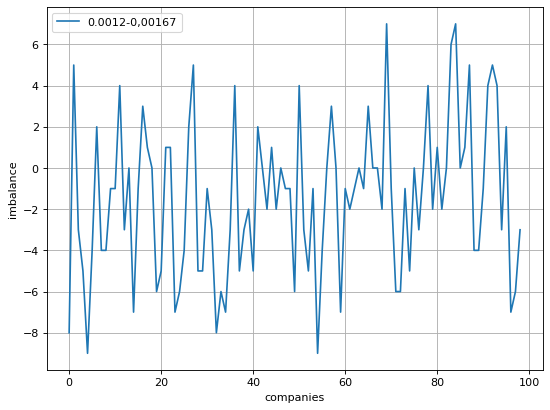

In [180]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='companies', ylabel='imbalance')
#plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.sum(scores_all_compare_th_no_perm[:,:,0,3], axis=(1))-(np.sum(scores_all_compare_th_no_perm[:,:,1,3], axis=(1))))


#plt.legend(['positive', 'negative'])
plt.legend(["0.0012-0,00167",])


In [181]:
print((np.sum(scores_all_compare_th_no_perm[:,:,0,3], axis=(0,1))))
print((np.sum(scores_all_compare_th_no_perm[:,:,1,3], axis=(0,1))))


552.0
698.0


## as above, but with l2 normalization

In [273]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
thresholds_compare = (0.0012, 0.00167)
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
comps=np.arange(len(list_of_companies_number))
scores_all_compare_th_norm=np.zeros(shape=(len(comps), 10, 2, 4)) #company, i-th try, threshold, (acc,prec,recall,check_preds)

In [295]:
for c in range(len(comps)):
    print(c)
    X_hold=get_X(comps[c], interval, time_to_skip, time_back, names_all)
    for th in range(2):
        y_hold=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=thresholds_compare[th])
        for i in range(10):
            X,y=permutate_Xy(X_hold,y_hold)
            scores_all_compare_th_norm[c,i,th,0], scores_all_compare_th_norm[c,i,th,1],scores_all_compare_th_norm[c,i,th,2]=(
                logistic_regr(X, np.copy(y),split_percent, comp_id, use_pipe=MyNormalizer(axis=0,norm='l2'),
                              check_up_down=False, local_names=names_all))
            if  scores_all_compare_th_norm[c,i,th,2]>0.9 or  scores_all_compare_th_norm[c,i,th,2]<0.1:
                 scores_all_compare_th_norm[c,i,th,3]=True 
#np will parse above to one, true as if model is super bad, almost always returns either pos or neg class
clear_output()

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


KeyboardInterrupt: 

In [278]:
for c in range(len(comps)):
    print(c)
    for th in range(2):
        for i in range(10):

            if  scores_all_compare_th_norm[c,i,th,2]>0.9 or  scores_all_compare_th_norm[c,i,th,2]<0.1:
                 scores_all_compare_th_norm[c,i,th,3]=True 
#np will parse above to one, true as if model is super bad, almost always returns either pos or neg class
clear_output()

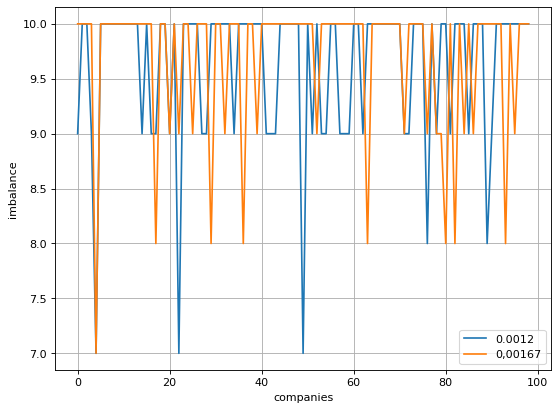

In [279]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='companies', ylabel='imbalance')
#plt.xticks(np.arange(10),  rotation='70')
plt.grid()
#for i in range(10):
plt.plot(np.sum(scores_all_compare_th_norm[:,:,0,3], axis=(1)))#-
plt.plot(np.sum(scores_all_compare_th_norm[:,:,1,3], axis=(1)))


#plt.legend(['positive', 'negative'])
plt.legend(["0.0012","0,00167",])

# time back

In [140]:
interval=1
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
backs=[1,3,5,10,15,30]
comp_backs=np.zeros((len(list_of_companies_number), len(intervals),3))

In [296]:
time_start=time.time()
for comp_id in range(len(list_of_companies_number)//10):
    print(comp_id)
    for i in range(len(backs)):
        X_hold=get_X(comp_id, interval, time_to_skip, backs[i], names) 
        print('interval ', backs[i])
        print(X.shape)
        y=get_y(comp_id, interval, time_to_skip, backs[i], y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=threshold)
        print(y.shape)
        X,y=permutate_Xy(X_hold,y)
        comp_backs[comp_id,i,0],comp_backs[comp_id,i,1],comp_backs[comp_id,i,2]=logistic_regr(X, y,split_percent, 
                                                                                           comp_id=comp_id, check_up_down=False, track_params=False, local_names=names)
clear_output()
print("calculations took: {} seconds".format(  time.time()-time_start))

0


NameError: name 'backs' is not defined

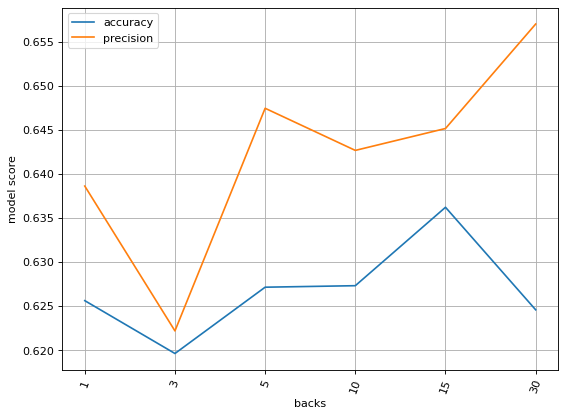

In [143]:
figure(figsize=(8, 6), dpi=80)
plt.axes(xlabel='backs', ylabel='model score')
plt.xticks(np.arange(len(backs)), backs, rotation='70')
plt.grid()
for i in range(2):
    plt.plot(np.sum(comp_backs, axis=0)[:,i]/9)
plt.legend(['accuracy', 'precision', 'recall'])

# scaled vs non scaled

In [58]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
comp_nonscaled=np.zeros((len(list_of_companies_number),4)) #acc, prec,rec,time
comp_scaled=np.zeros((len(list_of_companies_number),4))

In [297]:
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_hold=get_X(comp_id, interval, time_to_skip, time_back, names) 
    print(X.shape)
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    print(y.shape)
    X,y=permutate_Xy(X_hold,y)
    time_start=time.time()
    comp_scaled[comp_id,0],comp_scaled[comp_id,1],comp_scaled[comp_id,2]=logistic_regr(X, y,split_percent, 
                                                                                       comp_id=comp_id, use_scaling=True, check_up_down=False, track_params=False, local_names=names)
    comp_scaled[comp_id,3]=time.time()-time_start
    comp_nonscaled[comp_id,0],comp_nonscaled[comp_id,1],comp_nonscaled[comp_id,2]=logistic_regr(X, y,split_percent, 
                                                                                       comp_id=comp_id, use_scaling=False, check_up_down=False, track_params=False, local_names=names)
    comp_nonscaled[comp_id,3]=time.time()-time_start
    
clear_output()
print("calculations took: {} seconds".format(  time.time()-time_start))

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
(4750, 15)
true price at index 9,479 was zero!
(4750,)


TypeError: logistic_regr() got an unexpected keyword argument 'use_scaling'

In [172]:
for i in range(comp_nonscaled.shape[0]):
    if math.isnan(comp_nonscaled[i,1]):
        print('nan')
        comp_nonscaled[i,1]=0

nan
nan


In [173]:
#df = pd.DataFrame(np.array)
df=pd.DataFrame(np.array([np.round(np.sum(comp_nonscaled, axis=0)/99, decimals=3), np.round(np.sum(comp_scaled, axis=0)/99, decimals=3)]))
df

,0,1,2,3
0,0.613,0.603,0.885,0.074
1,0.608,0.632,0.807,0.027


In [153]:
np.sum(comp_scaled, axis=0)

array([5.48315789, 5.75128643, 7.76722249, 0.26683545])

In [164]:
comp_scaled.shape

(99, 4)

# normalized vs non normalized

In [256]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
scalers=[None, preprocessing.StandardScaler(), preprocessing.MaxAbsScaler(), MyNormalizer(norm='l1',axis=0),MyNormalizer(norm='l2',axis=0)]
comp_scalers=np.zeros((len(list_of_companies_number),10, len(scalers),4)) #acc, prec,rec,time


In [225]:
#X_hold=get_X(0, interval, time_to_skip, time_back, names=names_all)
#preprocessing.StandardScaler().
print(np.sum(preprocessing.normalize(X_hold, norm='l1',axis=0), axis=0))
np.unique(preprocessing.normalize(X_hold, norm='l2',axis=0)-
          MyNormalizer(norm='l2', axis=0).fit(X_hold).transform(X_hold))

#preprocessing.normalize(X, norm='l1',axis=0)

[ 0.99999845 -0.05047447  1.0000008   1.0000001   0.9999985   0.9999994
  0.99999744 -1.0000308   0.9999971   0.99999785  0.9999971   0.99999785
  1.0000014   1.0000021   0.18399803]


array([0.], dtype=float32)

In [257]:
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_hold=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y_hold=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for j in range(10): #average cmoputations
        X,y=permutate_Xy(X_hold,y_hold)
        for i in range(len(scalers)):
            print(scalers[i])
            time_start=time.time()
            comp_scalers[comp_id,j,i,0],comp_scalers[comp_id,j,i,1],comp_scalers[comp_id,j,i,2]=logistic_regr(X, y,split_percent, 
                                                                                               comp_id=comp_id, use_pipe=scalers[i], check_up_down=False, track_params=False, local_names=names_all)
            comp_scalers[comp_id,j,i,3]=time.time()-time_start

    clear_output(wait=True)


calculations took: 0.21847081184387207 seconds


In [272]:
df=pd.DataFrame(np.round(np.nansum(comp_scalers, axis=(0,1))/990, decimals=3))
df

,0,1,2,3
0,0.611,0.602,0.883,0.063
1,0.628,0.634,0.851,0.033
2,0.609,0.626,0.820,0.031
3,0.555,0.427,0.687,0.032
4,0.571,0.569,0.720,0.030


In [267]:
np.nansum(np.arange(1000).reshape(10,10,10), axis=(0,1))
    

array([49500, 49600, 49700, 49800, 49900, 50000, 50100, 50200, 50300,
       50400])

In [270]:
np.sum(np.arange(1000).reshape(10,10,10)[:,:,0])

49500

# permutated vs non permutated

In [128]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0016

In [65]:
samples_class=np.zeros((len(list_of_companies_number), 2))

In [129]:
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    #print(y.shape)
    dlugosc=y.size
    split=int(dlugosc*0.8)
    samples_class[comp_id,0]=np.sum(y[split:])
    samples_class[comp_id,1]=(dlugosc-split)-np.sum(y[split:])
    clear_output(wait=True)

98


In [130]:
counter=0
for pair, comp_id in zip(samples_class, np.arange(len(list_of_companies_number))):
    if  pair[0]/pair[1]>2/1 or pair[0]/pair[1]<1/2:
        counter+=1
        print("company {}, positive/negative ratio: {}".format(comp_id, pair[0]/pair[1]))
print(counter)

company 1, positive/negative ratio: 2.054662379421222
company 2, positive/negative ratio: 2.0351437699680512
company 3, positive/negative ratio: 2.015873015873016
company 5, positive/negative ratio: 2.5185185185185186
company 6, positive/negative ratio: 2.177257525083612
company 8, positive/negative ratio: 2.1147540983606556
company 14, positive/negative ratio: 2.3333333333333335
company 16, positive/negative ratio: 2.074433656957929
company 17, positive/negative ratio: 2.2203389830508473
company 23, positive/negative ratio: 2.7109375
company 26, positive/negative ratio: 2.5849056603773586
company 27, positive/negative ratio: 3.3577981651376145
company 32, positive/negative ratio: 2.177257525083612
company 34, positive/negative ratio: 2.2758620689655173
company 39, positive/negative ratio: 2.3333333333333335
company 44, positive/negative ratio: 2.177257525083612
company 45, positive/negative ratio: 0.46831530139103555
company 46, positive/negative ratio: 5.73758865248227
company 50, po

# models on ALL features

In [80]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
  #  'price_volatilities', #bug in computation
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
comps=np.arange(len(list_of_companies_number))
scores_all=np.zeros(shape=(len(comps), 3, 10, 3))
models=[logistic_regr, decision_tree, XGB]

In [70]:
X_all.shape

(99, 4750, 14)

In [82]:

for c in range(len(comps)):
    print(c)
#    X=get_X(comps[c], interval, time_to_skip, time_back, names_all)
 #   y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    X_hold=X_all[c]
    y_hold=y_all[c]
    for i in range(10):
        #X,y=permutate_Xy(X_hold,y_hold)
        X,y=X_hold,y_hold
        for m in range(len(models)):
            scores_all[c,m,i,0], scores_all[c,m,i,1],scores_all[c,m,i,2]=(models[m](X, np.copy(y),split_percent, comp_id, use_pipe=preprocessing.MaxAbsScaler(), check_up_down=False, local_names=names_all))
clear_output()

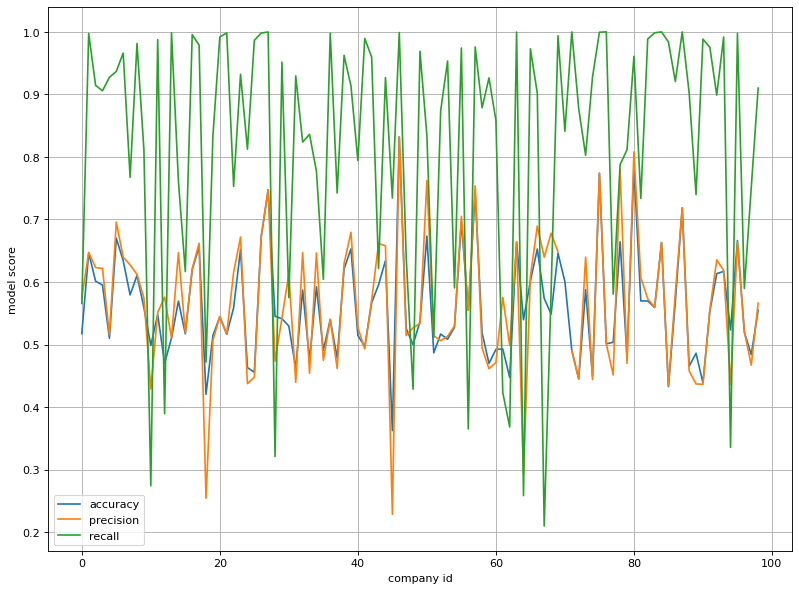

In [83]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_all, axis=2)[:,0,i]/10)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#logreg

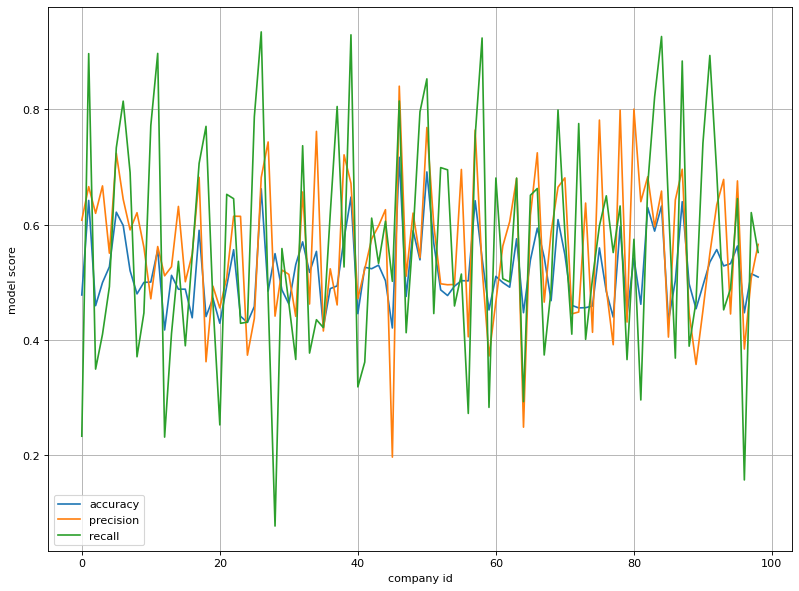

In [84]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_all, axis=2)[:,1,i]/10)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#dec tree

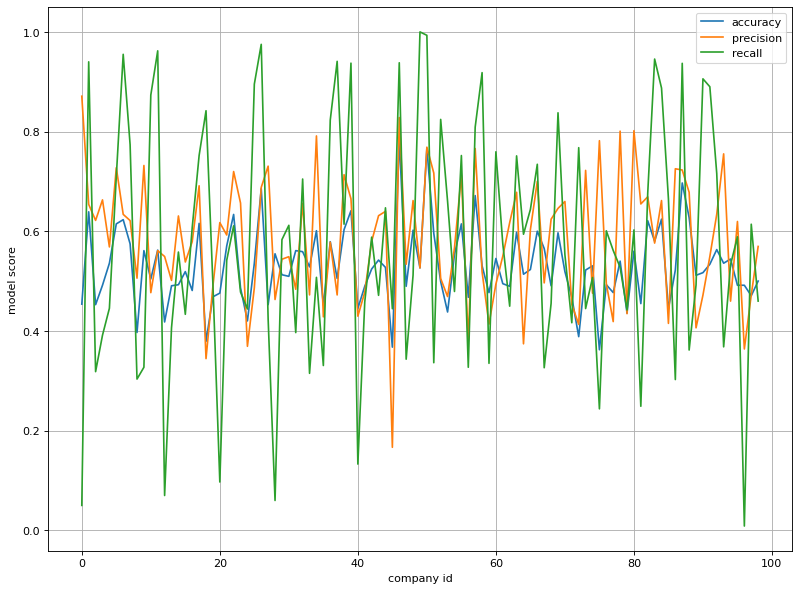

In [85]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_all, axis=2)[:,2,i]/10)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#xgb

# try different features for price swing

In [93]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0012
names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
  #  'price_volatilities', #bug in computation
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
names_part=[         
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
      ]
to_delete=[]
for n in names_all:
    if n not in names_part:
        to_delete.append(names_all.index(n))

comps=np.arange(len(list_of_companies_number))
scores_part=np.zeros(shape=(len(comps), 3, 5, 3))
models=[logistic_regr, decision_tree, XGB]

In [90]:
np.delete(X_all[0], to_delete, axis=1).shape

(4750, 6)

In [94]:
for c in range(len(comps)):
    print(c)
#    X=get_X(comps[c], interval, time_to_skip, time_back, names_all)
 #   y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    X_hold=X_all[c]
    y_hold=y_all[c]
    X,y=X_hold,y_hold
    for i in range(5):
        #X,y=permutate_Xy(X_hold,y_hold)
        for m in range(len(models)):
            scores_part[c,m,i,0], scores_part[c,m,i,1],scores_part[c,m,i,2]=(models[m](np.delete(X_all[0], to_delete, axis=1), np.copy(y),split_percent, comp_id, 
                                                                                       use_pipe=preprocessing.MaxAbsScaler(), check_up_down=False, local_names=names_part))
clear_output()

In [120]:
print("rows->logreg,dectree,xgb")

np.round(np.nansum(scores_part, axis=(0,2))/(5*99), decimals=4)

rows->logreg,dectree,xgb


array([[0.5544, 0.5585, 0.8149],
       [0.5222, 0.5632, 0.6123],
       [0.5219, 0.5631, 0.6082]])

In [115]:
np.nansum(scores_part, axis=(0,2))

array([[274.41578947, 276.46106964, 403.3970662 ],
       [258.49684211, 278.79244614, 303.09102327],
       [258.32105263, 278.71200609, 301.06552426]])

Text(0.5, 1.0, 'Logistic regression')

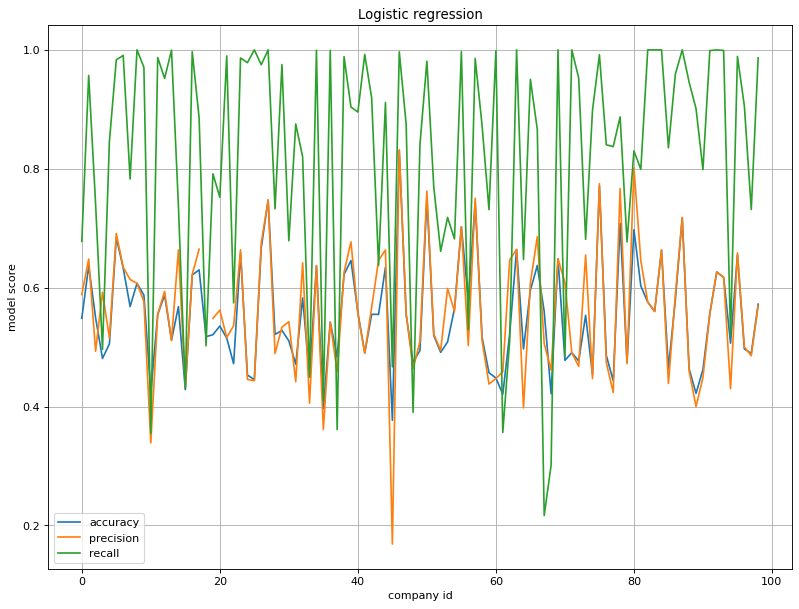

In [100]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_part, axis=2)[:,0,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
plt.title('Logistic regression')
#logreg

Text(0.5, 1.0, 'Decission tree')

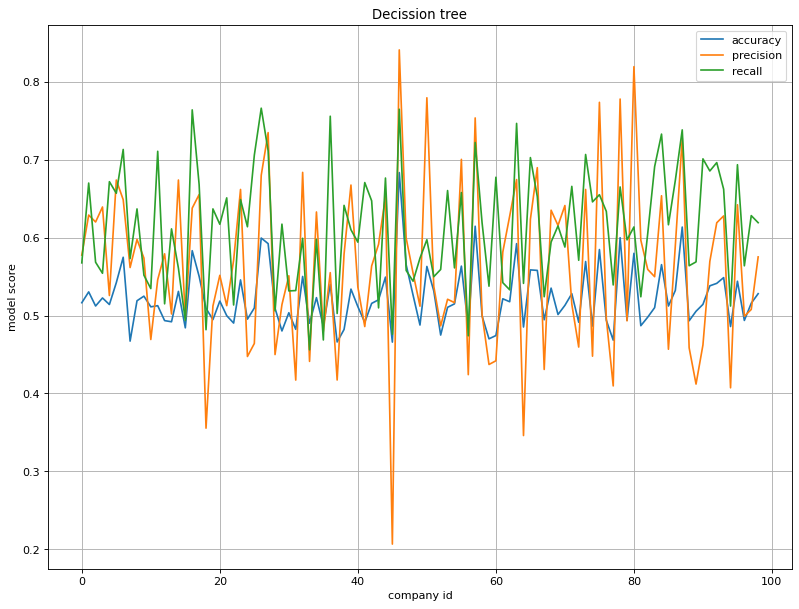

In [101]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_part, axis=2)[:,1,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
plt.title('Decission tree')


Text(0.5, 1.0, 'XGBoost')

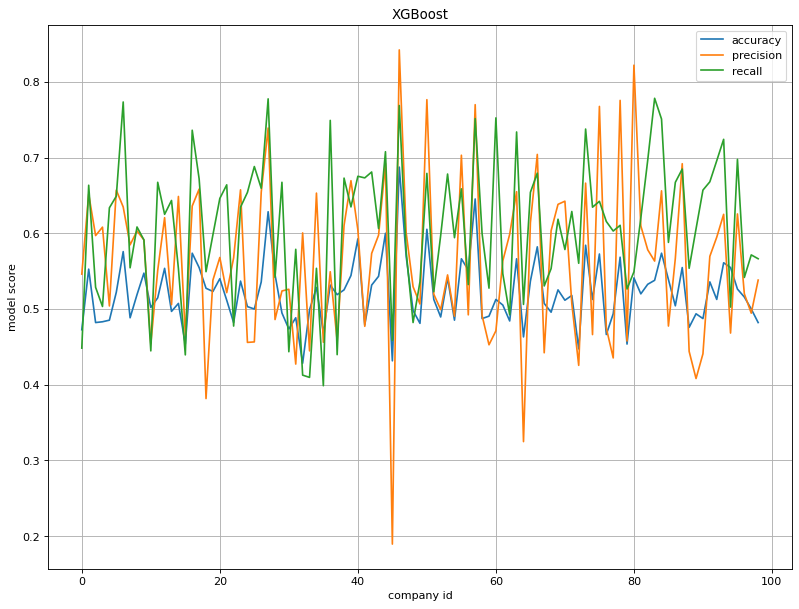

In [102]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_part, axis=2)[:,2,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
plt.title('XGBoost')

# Skipping params

In [156]:

split_percent = 0.8

names_all=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
  #  'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
comps=np.arange(len(list_of_companies_number))
names_len=len(names_all)
names_dict={}
for name in names_all:
    names_dict[name]=[]
param_dict_logreg={}
for n in names_all:
    param_dict_logreg[n]=[]
scores_skipped=np.zeros(shape=(len(comps), len(names_all), 3, 5, 3)) # comp. name, model, 5 times for avg, acc/prec/rec
none_skipped=np.zeros(shape=(len(comps), 3, 5, 3))
models=[logistic_regr, decision_tree, XGB]

In [132]:
none_skipped=np.zeros(shape=(len(comps), 3, 5, 3))


In [107]:
names_all_none=[         
    'none',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
#    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [86]:
'''comps=np.arange(len(list_of_companies_number))
comps_X=[]
comps_y=[]
skipped_params=['none']+names_all
names_len=len(names_all)
scores=np.zeros(shape=(len(comps), names_len+1, 3))
pom_acc=0
pom_prec=0
pom_rec=0'''

In [158]:
skipped_params=[]
com='''for c in range(len(comps)):
   # X,y=get_X_y_classic(comps[c], interval, time_to_skip, time_back, names, y_name='true_price', check_change=True)
    X=get_X(comps[c], interval, time_to_skip, time_back, names_all)
    y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    X,y=permutate_Xy(X,y)
    #for avg in range(10):
    pom_acc, pom_prec, pom_rec=logistic_regr(X, np.copy(y),split_percent, comps[c], True, 
                                             check_up_down=False, local_names=names_all, track_params=False, param_dict_logreg=param_dict_logreg)
    scores[c,0,0]+=pom_acc
    scores[c,0,1]+=pom_prec
    scores[c,0,2]+=pom_rec
    comps_X.append(X)
    comps_y.append(y)'''
for n in range(0, names_len):
    name=names_all.pop(0)
    print('skipping ', name, '\n')
    for c in range(len(list_of_companies_number)):
        for m in range(len(models)):
            for avg in range(3):
                pom_acc, pom_prec, pom_rec=models[m](np.delete(X_all[c], n, axis=1), 
                                                       np.copy(y_all[c]),split_percent, 
                                                       comps[c], use_pipe=preprocessing.MaxAbsScaler(), check_up_down=False, local_names=names_all, 
                                                       track_params=False)
                scores_skipped[c,n,m,avg,0]=pom_acc
                scores_skipped[c,n,m,avg,1]=pom_prec
                scores_skipped[c,n,m,avg,2]=pom_rec
          #  scores[c,i,0],scores[c,i,1],scores[c,i,2]=logistic_regr(np.delete(comps_X[c], i-1, 1), 
       #                                        np.copy(comps_y[c]),split_percent, 
        #                                       comps[c], True, check_up_down=False, local_names=names)
    names_all.append(name)
    skipped_params.append(name)
    print('skipped ', name, '\n')
        #AFTER SCALING               
clear_output()


skipping  true_price 

Coefficient impact:
order_inbalance   -1.7546770039244126
vwaps_buy   1.7056087879377133
vwaps_sell   -0.18282897822108438
s2f_impact_buy   -0.25304495376343894
s2f_impact_sell   0.6060020861735704
trading_volumes   -1.339338863581001
vwaps_order_sizes_buy   -0.1971942268583075
vwaps_order_sizes_sell   0.10308638824131432
s2f_order_sizes_buy   -0.1971942268583075
s2f_order_sizes_sell   0.10308638824131432
next_trade_time   -0.6885107837660278
next_trade_size   0.9667502599347841
next_trade_price   1.4097616863068783
[[156 145]
 [340 309]]
Coefficient impact:
order_inbalance   -1.755423357028762
vwaps_buy   1.7055786093036922
vwaps_sell   -0.1817137550142092
s2f_impact_buy   -0.25220555036583225
s2f_impact_sell   0.6067235559533111
trading_volumes   -1.3398324156599974
vwaps_order_sizes_buy   -0.19731156249031406
vwaps_order_sizes_sell   0.10333422694846678
s2f_order_sizes_buy   -0.19731156249031406
s2f_order_sizes_sell   0.10333422694846678
next_trade_time   -0.6

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52
Recall:
0.41935483870967744
[16:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52
Recall:
0.41935483870967744
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52
Recall:
0.41935483870967744
Coefficient impact:
order_inbalance   0.43420308140955666
vwaps_buy   0.7478257051543498
vwaps_sell   1.7445113186207517
s2f_impact_buy   1.304146224284201
s2f_impact_sell   0.43176243641681256
trading_volumes   -2.382145495907487
vwaps_order_sizes_buy   0.9959719225916068
vwaps_order_sizes_sell   -0.23115812723491436
s2f_order_sizes_buy   0.9959719225916068
s2f_order_sizes_sell   -0.23115812723491436
next_trade_time   0.7426643630662184
next_trade_size   1.034882090987187
next_trade_price   -0.24744489306618114
[[500 387]
 [ 36  27]]
Coefficient impact:
order_inbalance   0.4359192164842497
vwaps_buy   0.7481764344565952
vwaps_sell   1.7441478914614625
s2f_impact_buy   1.3056799849118723
s2f_impact_sell   0.4312041842289122
trading_volumes   -2.3817509201862395
vwaps_order_sizes_buy   0.9951733253470108
vwaps_order_sizes_sell   -0.2308880645621701
s2f_order_sizes_buy   0.9951733253470108
s2f_order_sizes_sell   -0.2308880645621701
next_trade_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549738219895288
Recall:
0.5932835820895522
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549738219895288
Recall:
0.5932835820895522
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549738219895288
Recall:
0.5932835820895522
Coefficient impact:
order_inbalance   -0.5248634066185257
vwaps_buy   -1.0531402858096903
vwaps_sell   0.6453063577959779
s2f_impact_buy   0.40636868501163964
s2f_impact_sell   -0.9257943222442281
trading_volumes   -1.435272784510396
vwaps_order_sizes_buy   0.1501304398395041
vwaps_order_sizes_sell   0.5685931759806803
s2f_order_sizes_buy   0.1501304398395041
s2f_order_sizes_sell   0.5685931759806803
next_trade_time   -2.167696883311065
next_trade_size   -0.603321164354087
next_trade_price   -0.14770448193477817
[[300 262]
 [233 155]]
Coefficient impact:
order_inbalance   -0.5244715291227086
vwaps_buy   -1.0537856177341611
vwaps_sell   0.6454332366476216
s2f_impact_buy   0.4059736720130111
s2f_impact_sell   -0.9282484143995672
trading_volumes   -1.436441029610489
vwaps_order_sizes_buy   0.1495325439744307
vwaps_order_sizes_sell   0.5684484763149094
s2f_order_sizes_buy   0.1495325439744307
s2f_order_sizes_sell   0.5684484763149094

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5794392523364486
Recall:
0.5816135084427767
[16:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5794392523364486
Recall:
0.5816135084427767
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5794392523364486
Recall:
0.5816135084427767
Coefficient impact:
order_inbalance   0.9065993461951826
vwaps_buy   -0.05768099604128315
vwaps_sell   0.1119072029196467
s2f_impact_buy   -0.21268989696221052
s2f_impact_sell   -0.4139872418440498
trading_volumes   0.9021702782499829
vwaps_order_sizes_buy   0.6692128243838547
vwaps_order_sizes_sell   -0.09779959352283518
s2f_order_sizes_buy   0.6692128243838547
s2f_order_sizes_sell   -0.09779959352283518
next_trade_time   0.12479897360932081
next_trade_size   1.5377904223747239
next_trade_price   -0.17950388399697664
[[ 80  48]
 [405 417]]
Coefficient impact:
order_inbalance   0.907648463148666
vwaps_buy   -0.05811038932398434
vwaps_sell   0.11172647095458337
s2f_impact_buy   -0.21234934413397685
s2f_impact_sell   -0.41373061378428383
trading_volumes   0.9022056553093061
vwaps_order_sizes_buy   0.6689868846590244
vwaps_order_sizes_sell   -0.097352002367585
s2f_order_sizes_buy   0.6689868846590244
s2f_order_sizes_sell   -0.097352

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4780361757105943
Recall:
0.38144329896907214
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4780361757105943
Recall:
0.38144329896907214
[16:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4780361757105943
Recall:
0.38144329896907214
Coefficient impact:
order_inbalance   1.360899560791734
vwaps_buy   -0.6292996742942046
vwaps_sell   0.4754713839910468
s2f_impact_buy   1.1645081962872412
s2f_impact_sell   -0.9033198481505726
trading_volumes   -0.25585591647290434
vwaps_order_sizes_buy   1.0081848714394623
vwaps_order_sizes_sell   0.0008900073083824737
s2f_order_sizes_buy   1.0081848714394623
s2f_order_sizes_sell   0.0008900073083824737
next_trade_time   -1.4227865756049822
next_trade_size   -0.04889071880637906
next_trade_price   1.0539691669470048
[[183 403]
 [162 202]]
Coefficient impact:
order_inbalance   1.3613781857404434
vwaps_buy   -0.6290482627446026
vwaps_sell   0.47606473111030817
s2f_impact_buy   1.1644530022625799
s2f_impact_sell   -0.9027890655202826
trading_volumes   -0.255533503423146
vwaps_order_sizes_buy   1.0088692267246853
vwaps_order_sizes_sell   0.0008312590336491142
s2f_order_sizes_buy   1.0088692267246853
s2f_order_sizes_sell   0.000831

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3196125907990315
Recall:
0.3826086956521739
[16:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3196125907990315
Recall:
0.3826086956521739
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3196125907990315
Recall:
0.3826086956521739
Coefficient impact:
order_inbalance   -0.40742244782852577
vwaps_buy   0.8377353174475615
vwaps_sell   -0.03884155133956975
s2f_impact_buy   0.9461794175563771
s2f_impact_sell   0.6500579642651618
trading_volumes   -1.2673162319572637
vwaps_order_sizes_buy   1.2471934999875995
vwaps_order_sizes_sell   0.24479341187339992
s2f_order_sizes_buy   1.2471934999875995
s2f_order_sizes_sell   0.24479341187339992
next_trade_time   0.27954230482821507
next_trade_size   1.64170307002645
next_trade_price   -1.386457131659424
[[555 394]
 [  0   1]]
Coefficient impact:
order_inbalance   -0.40688707051577355
vwaps_buy   0.8382585484779396
vwaps_sell   -0.03834517572879342
s2f_impact_buy   0.946787106745837
s2f_impact_sell   0.6508843647472361
trading_volumes   -1.2666896581365765
vwaps_order_sizes_buy   1.2482413734510112
vwaps_order_sizes_sell   0.24484216348377416
s2f_order_sizes_buy   1.2482413734510112
s2f_order_sizes_sell   0.24484216348377

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5728813559322034
Recall:
0.609009009009009
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5728813559322034
Recall:
0.609009009009009
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5728813559322034
Recall:
0.609009009009009
Coefficient impact:
order_inbalance   0.06872097123916526
vwaps_buy   0.3778256698552191
vwaps_sell   1.8316736859887939
s2f_impact_buy   0.6248565454476444
s2f_impact_sell   -0.6649604103081471
trading_volumes   -2.345517018786052
vwaps_order_sizes_buy   -0.776727217558037
vwaps_order_sizes_sell   -0.16916411555265237
s2f_order_sizes_buy   -0.776727217558037
s2f_order_sizes_sell   -0.16916411555265237
next_trade_time   1.637218499591824
next_trade_size   -1.1408192383412636
next_trade_price   1.6049228127010884
[[397 393]
 [ 67  93]]
Coefficient impact:
order_inbalance   0.06621519094170852
vwaps_buy   0.37680946549418326
vwaps_sell   1.8312819361229566
s2f_impact_buy   0.6223214213162375
s2f_impact_sell   -0.6652487180669537
trading_volumes   -2.345319984805501
vwaps_order_sizes_buy   -0.7762822109425035
vwaps_order_sizes_sell   -0.16945083407731373
s2f_order_sizes_buy   -0.7762822109425035
s2f_order_sizes_sell   -0.169450834077

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5204460966542751
Recall:
0.603448275862069
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5204460966542751
Recall:
0.603448275862069
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5204460966542751
Recall:
0.603448275862069
Coefficient impact:
order_inbalance   -0.340603318921926
vwaps_buy   0.11544846456701158
vwaps_sell   1.7466176950705363
s2f_impact_buy   0.3164092333463353
s2f_impact_sell   1.2337001023029144
trading_volumes   -2.7710429716093437
vwaps_order_sizes_buy   -0.2743856126118776
vwaps_order_sizes_sell   0.6581041349332163
s2f_order_sizes_buy   -0.2743856126118776
s2f_order_sizes_sell   0.6581041349332163
next_trade_time   -1.1425167456178693
next_trade_size   2.056862007008842
next_trade_price   1.4033106966248017
[[ 80  84]
 [412 374]]
Coefficient impact:
order_inbalance   -0.34082854411212393
vwaps_buy   0.1161369354925822
vwaps_sell   1.747697734060652
s2f_impact_buy   0.3161090776555149
s2f_impact_sell   1.2331982740706813
trading_volumes   -2.769930607378027
vwaps_order_sizes_buy   -0.2737369688478879
vwaps_order_sizes_sell   0.6588914503750224
s2f_order_sizes_buy   -0.2737369688478879
s2f_order_sizes_sell   0.6588914503750224
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5364238410596026
Recall:
0.49390243902439024
[16:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5364238410596026
Recall:
0.49390243902439024
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5364238410596026
Recall:
0.49390243902439024
Coefficient impact:
order_inbalance   -0.41119136120812266
vwaps_buy   -0.977841217961438
vwaps_sell   0.970652365958201
s2f_impact_buy   1.12726417821772
s2f_impact_sell   -0.8200025549308436
trading_volumes   -0.7639459603768594
vwaps_order_sizes_buy   -0.9237368235932553
vwaps_order_sizes_sell   1.4703770219471022
s2f_order_sizes_buy   -0.9237368235932553
s2f_order_sizes_sell   1.4703770219471022
next_trade_time   0.7753548073628276
next_trade_size   -1.6349297226966717
next_trade_price   0.6491686262444704
[[408 432]
 [ 49  61]]
Coefficient impact:
order_inbalance   -0.4118299948616007
vwaps_buy   -0.978400620806142
vwaps_sell   0.9697086256826434
s2f_impact_buy   1.1280778176939585
s2f_impact_sell   -0.8187050368932625
trading_volumes   -0.7649181342066347
vwaps_order_sizes_buy   -0.9228454475392116
vwaps_order_sizes_sell   1.4702250880081849
s2f_order_sizes_buy   -0.9228454475392116
s2f_order_sizes_sell   1.470225088008184

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4440944881889764
Recall:
0.6170678336980306
[16:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4440944881889764
Recall:
0.6170678336980306
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4440944881889764
Recall:
0.6170678336980306
Coefficient impact:
order_inbalance   1.0112885594510022
vwaps_buy   -0.6568981576950332
vwaps_sell   0.16313875658535823
s2f_impact_buy   0.701126972101227
s2f_impact_sell   0.36682066215629355
trading_volumes   0.1990273228166042
vwaps_order_sizes_buy   0.10933150765606899
vwaps_order_sizes_sell   1.4051239442484373
s2f_order_sizes_buy   0.10933150765606899
s2f_order_sizes_sell   1.4051239442484373
next_trade_time   -0.840879034799987
next_trade_size   0.11396494905987696
next_trade_price   0.0156924888021231
[[120 111]
 [312 407]]
Coefficient impact:
order_inbalance   1.011438630689646
vwaps_buy   -0.6575273596097669
vwaps_sell   0.16354497847624946
s2f_impact_buy   0.7017643496756205
s2f_impact_sell   0.3660204455972317
trading_volumes   0.19909170445286223
vwaps_order_sizes_buy   0.10963710248087137
vwaps_order_sizes_sell   1.4046585589971927
s2f_order_sizes_buy   0.10963710248087137
s2f_order_sizes_sell   1.4046585589971927

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5113636363636364
Recall:
0.5208333333333334
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5113636363636364
Recall:
0.5208333333333334
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5113636363636364
Recall:
0.5208333333333334
Coefficient impact:
order_inbalance   -0.12772067960022285
vwaps_buy   -0.16588963609266785
vwaps_sell   -0.40665365012329513
s2f_impact_buy   0.0543795068661753
s2f_impact_sell   0.48171305255271657
trading_volumes   -0.39906693350974065
vwaps_order_sizes_buy   1.1063630705859981
vwaps_order_sizes_sell   0.9052658677143861
s2f_order_sizes_buy   1.1063630705859981
s2f_order_sizes_sell   0.9052658677143861
next_trade_time   0.026411584227920202
next_trade_size   0.6549947179050835
next_trade_price   0.8274522604607153
[[ 15  10]
 [348 577]]
Coefficient impact:
order_inbalance   -0.1281286350303509
vwaps_buy   -0.16618038762284157
vwaps_sell   -0.4065873805709851
s2f_impact_buy   0.054227964739939946
s2f_impact_sell   0.48196465188143767
trading_volumes   -0.39957679807262647
vwaps_order_sizes_buy   1.1066162774653252
vwaps_order_sizes_sell   0.9055394878221791
s2f_order_sizes_buy   1.1066162774653252
s2f_order_sizes_sell   0.90553

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4101694915254237
Recall:
0.3333333333333333
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4101694915254237
Recall:
0.3333333333333333
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4101694915254237
Recall:
0.3333333333333333
Coefficient impact:
order_inbalance   1.4716348766224674
vwaps_buy   -1.1641162022514142
vwaps_sell   0.1732233781909079
s2f_impact_buy   0.4402618165835849
s2f_impact_sell   -0.08856190667863374
trading_volumes   -0.7675755782791626
vwaps_order_sizes_buy   0.6059378298300786
vwaps_order_sizes_sell   0.32274098074549845
s2f_order_sizes_buy   0.6059378298300786
s2f_order_sizes_sell   0.32274098074549845
next_trade_time   1.3346001111447434
next_trade_size   0.41744365007673356
next_trade_price   1.1726133613401184
[[367 553]
 [ 18  12]]
Coefficient impact:
order_inbalance   1.4716232724209342
vwaps_buy   -1.1631782662676484
vwaps_sell   0.17092467762864116
s2f_impact_buy   0.4394038040327608
s2f_impact_sell   -0.08816838355772558
trading_volumes   -0.7683492365336094
vwaps_order_sizes_buy   0.6067406809025637
vwaps_order_sizes_sell   0.321112754925426
s2f_order_sizes_buy   0.6067406809025637
s2f_order_sizes_sell   0.32111275492542

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37590711175616837
Recall:
0.6727272727272727
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37590711175616837
Recall:
0.6727272727272727
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37590711175616837
Recall:
0.6727272727272727
Coefficient impact:
order_inbalance   -0.40564318791834303
vwaps_buy   -0.3499216716115855
vwaps_sell   0.6928337437189411
s2f_impact_buy   0.8186232646142932
s2f_impact_sell   0.9419787126098422
trading_volumes   -1.8063212383518459
vwaps_order_sizes_buy   -0.29530833582624266
vwaps_order_sizes_sell   0.09416809984942387
s2f_order_sizes_buy   -0.29530833582624266
s2f_order_sizes_sell   0.09416809984942387
next_trade_time   0.48690660471182545
next_trade_size   1.304432594499454
next_trade_price   0.5402102366388442
[[ 34  24]
 [440 452]]
Coefficient impact:
order_inbalance   -0.40516435322372457
vwaps_buy   -0.3502879398176533
vwaps_sell   0.6943984564547819
s2f_impact_buy   0.8188676045004205
s2f_impact_sell   0.9426017543167655
trading_volumes   -1.8045549869758315
vwaps_order_sizes_buy   -0.2959968391030523
vwaps_order_sizes_sell   0.09628636223696532
s2f_order_sizes_buy   -0.2959968391030523
s2f_order_sizes_sell   0.0962863

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5211726384364821
Recall:
0.33755274261603374
[16:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5211726384364821
Recall:
0.33755274261603374
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5211726384364821
Recall:
0.33755274261603374
Coefficient impact:
order_inbalance   -0.6395074612957092
vwaps_buy   -0.03240854593196061
vwaps_sell   1.545696501939161
s2f_impact_buy   0.7925503840946059
s2f_impact_sell   -0.28594500333228057
trading_volumes   -1.4223707007922652
vwaps_order_sizes_buy   0.13600060823002222
vwaps_order_sizes_sell   0.9660945394772885
s2f_order_sizes_buy   0.13600060823002222
s2f_order_sizes_sell   0.9660945394772885
next_trade_time   -0.7613459958329749
next_trade_size   0.6330568655601293
next_trade_price   0.027331012909305407
[[260 405]
 [ 85 200]]
Coefficient impact:
order_inbalance   -0.6393256046043702
vwaps_buy   -0.03214253863065365
vwaps_sell   1.545183400876925
s2f_impact_buy   0.7927874899662007
s2f_impact_sell   -0.2862371157697162
trading_volumes   -1.4220610439775037
vwaps_order_sizes_buy   0.1358150133754613
vwaps_order_sizes_sell   0.9662730301713316
s2f_order_sizes_buy   0.1358150133754613
s2f_order_sizes_sell   0.9662730301

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34757281553398056
Recall:
0.518840579710145
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34757281553398056
Recall:
0.518840579710145
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34757281553398056
Recall:
0.518840579710145
Coefficient impact:
order_inbalance   1.435762848305669
vwaps_buy   0.0397147346467483
vwaps_sell   -0.304347328484296
s2f_impact_buy   1.8297729026653604
s2f_impact_sell   -0.9863386091786864
trading_volumes   -1.003207060491815
vwaps_order_sizes_buy   1.4230098994046234
vwaps_order_sizes_sell   0.5249399348098929
s2f_order_sizes_buy   1.4230098994046234
s2f_order_sizes_sell   0.5249399348098929
next_trade_time   3.1167837838090353
next_trade_size   -1.7047737775242253
next_trade_price   0.3696184211792593
[[223 224]
 [299 204]]
Coefficient impact:
order_inbalance   1.4355944224732184
vwaps_buy   0.03903652079225349
vwaps_sell   -0.303973404610371
s2f_impact_buy   1.8299227280615449
s2f_impact_sell   -0.9855403631412684
trading_volumes   -1.0017782822910852
vwaps_order_sizes_buy   1.4230619536867284
vwaps_order_sizes_sell   0.5251036316756691
s2f_order_sizes_buy   1.4230619536867284
s2f_order_sizes_sell   0.5251036316756691
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5812917594654788
Recall:
0.5
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5812917594654788
Recall:
0.5
[16:35:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5812917594654788
Recall:
0.5
Coefficient impact:
order_inbalance   0.19939624693918867
vwaps_buy   0.19086949070449716
vwaps_sell   1.1348697202508693
s2f_impact_buy   -0.4037368386219829
s2f_impact_sell   -0.6901570863303738
trading_volumes   -1.4302677096709642
vwaps_order_sizes_buy   -0.23038356063939597
vwaps_order_sizes_sell   1.0583259432567929
s2f_order_sizes_buy   -0.23038356063939597
s2f_order_sizes_sell   1.0583259432567929
next_trade_time   0.1571154952531928
next_trade_size   -0.7122301781626098
next_trade_price   0.3145459020897715
[[  2  29]
 [410 509]]
Coefficient impact:
order_inbalance   0.19956427784644967
vwaps_buy   0.19102246630672834
vwaps_sell   1.1341115643635606
s2f_impact_buy   -0.40372292752927297
s2f_impact_sell   -0.6902574916421448
trading_volumes   -1.4301677328244544
vwaps_order_sizes_buy   -0.2305055783422485
vwaps_order_sizes_sell   1.058026282218935
s2f_order_sizes_buy   -0.2305055783422485
s2f_order_sizes_sell   1.058026282218935
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4700854700854701
Recall:
0.40048543689320387
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4700854700854701
Recall:
0.40048543689320387
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4700854700854701
Recall:
0.40048543689320387
Coefficient impact:
order_inbalance   -0.35631034950121365
vwaps_buy   0.10718365399261183
vwaps_sell   0.1883961110902776
s2f_impact_buy   0.3370287068667696
s2f_impact_sell   -0.5810141436463079
trading_volumes   -0.23087483909931436
vwaps_order_sizes_buy   0.05502310156162995
vwaps_order_sizes_sell   1.7195825541055787
s2f_order_sizes_buy   0.05502310156162995
s2f_order_sizes_sell   1.7195825541055787
next_trade_time   -0.5724117875395306
next_trade_size   0.9373199051673571
next_trade_price   1.1860757521096357
[[496 435]
 [ 13   6]]
Coefficient impact:
order_inbalance   -0.35648092579692003
vwaps_buy   0.10819994197197225
vwaps_sell   0.18869842060640798
s2f_impact_buy   0.3370998615060566
s2f_impact_sell   -0.5803905048613297
trading_volumes   -0.2313350377656291
vwaps_order_sizes_buy   0.0551405539499083
vwaps_order_sizes_sell   1.7189611036202253
s2f_order_sizes_buy   0.0551405539499083
s2f_order_sizes_sell   1.718961103

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235602094240838
Recall:
0.5893909626719057
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235602094240838
Recall:
0.5893909626719057
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235602094240838
Recall:
0.5893909626719057
Coefficient impact:
order_inbalance   -0.6870622668008741
vwaps_buy   1.2435622036622116
vwaps_sell   -0.26804617855229257
s2f_impact_buy   -0.04808397516453918
s2f_impact_sell   1.052584595089138
trading_volumes   -1.6914944245940364
vwaps_order_sizes_buy   0.6322715589297335
vwaps_order_sizes_sell   0.22351200741711044
s2f_order_sizes_buy   0.6322715589297335
s2f_order_sizes_sell   0.22351200741711044
next_trade_time   0.04499353642285948
next_trade_size   -0.22370033116625673
next_trade_price   0.20238863782944122
[[420 281]
 [106 143]]
Coefficient impact:
order_inbalance   -0.6868881175135354
vwaps_buy   1.242275017760079
vwaps_sell   -0.26912563395685296
s2f_impact_buy   -0.047821359156441305
s2f_impact_sell   1.0534578777960657
trading_volumes   -1.690654129558868
vwaps_order_sizes_buy   0.6329743268794524
vwaps_order_sizes_sell   0.22430374844235218
s2f_order_sizes_buy   0.6329743268794524
s2f_order_sizes_sell   0.22430374

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5667351129363449
Recall:
0.5247148288973384
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5667351129363449
Recall:
0.5247148288973384
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5667351129363449
Recall:
0.5247148288973384
Coefficient impact:
order_inbalance   1.0703131858653574
vwaps_buy   -1.1417134261744253
vwaps_sell   -0.03381534459923292
s2f_impact_buy   0.9520941357304946
s2f_impact_sell   0.5692563748243843
trading_volumes   -2.798027265955319
vwaps_order_sizes_buy   -0.22327647914776333
vwaps_order_sizes_sell   -0.4309517412511393
s2f_order_sizes_buy   -0.22327647914776333
s2f_order_sizes_sell   -0.4309517412511393
next_trade_time   -0.5778618530190105
next_trade_size   1.5854849270977829
next_trade_price   0.22637246261561053
[[  1  62]
 [216 671]]
Coefficient impact:
order_inbalance   1.0705330868337997
vwaps_buy   -1.1414243579348304
vwaps_sell   -0.03342965658130133
s2f_impact_buy   0.9516665712266628
s2f_impact_sell   0.5697349340099956
trading_volumes   -2.798094784992773
vwaps_order_sizes_buy   -0.22222720417710282
vwaps_order_sizes_sell   -0.4308295156590612
s2f_order_sizes_buy   -0.22222720417710282
s2f_order_sizes_sell   -0.43082

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20555555555555555
Recall:
0.34101382488479265
[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20555555555555555
Recall:
0.34101382488479265
[16:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20555555555555555
Recall:
0.34101382488479265
Coefficient impact:
order_inbalance   0.342887670230705
vwaps_buy   0.42427967092231844
vwaps_sell   1.5041998374247947
s2f_impact_buy   -0.25501107704461756
s2f_impact_sell   0.132820273210793
trading_volumes   -0.8816234027195162
vwaps_order_sizes_buy   -0.01256780212617825
vwaps_order_sizes_sell   0.17753878512266455
s2f_order_sizes_buy   -0.01256780212617825
s2f_order_sizes_sell   0.17753878512266455
next_trade_time   -0.24378084597986488
next_trade_size   0.22370624153931756
next_trade_price   0.36991801750432607
[[ 79 137]
 [313 421]]
Coefficient impact:
order_inbalance   0.34319588322293376
vwaps_buy   0.423253762977202
vwaps_sell   1.5038204789806442
s2f_impact_buy   -0.25524494397178565
s2f_impact_sell   0.13242126799899762
trading_volumes   -0.8814617402649595
vwaps_order_sizes_buy   -0.011468970071596085
vwaps_order_sizes_sell   0.17768376843471914
s2f_order_sizes_buy   -0.011468970071596085
s2f_order_sizes_sell   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45622119815668205
Recall:
0.5051020408163265
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45622119815668205
Recall:
0.5051020408163265
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45622119815668205
Recall:
0.5051020408163265
Coefficient impact:
order_inbalance   0.302741273202106
vwaps_buy   -0.18923833001384746
vwaps_sell   0.8017500753110898
s2f_impact_buy   -0.38946208691374584
s2f_impact_sell   0.21215400724254493
trading_volumes   -0.9856097364663926
vwaps_order_sizes_buy   -0.27052491450155675
vwaps_order_sizes_sell   0.40697601021139634
s2f_order_sizes_buy   -0.27052491450155675
s2f_order_sizes_sell   0.40697601021139634
next_trade_time   0.3746196418212142
next_trade_size   1.3173964693264693
next_trade_price   1.4555626331851068
[[341 518]
 [ 47  44]]
Coefficient impact:
order_inbalance   0.30240847770796797
vwaps_buy   -0.18908484583229096
vwaps_sell   0.8021670397975792
s2f_impact_buy   -0.3899516023664452
s2f_impact_sell   0.2118402930523286
trading_volumes   -0.9854890459588485
vwaps_order_sizes_buy   -0.2700776133716039
vwaps_order_sizes_sell   0.4066008475731494
s2f_order_sizes_buy   -0.2700776133716039
s2f_order_sizes_sell   0.406600

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797752808988764
Recall:
0.43556701030927836
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797752808988764
Recall:
0.43556701030927836
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797752808988764
Recall:
0.43556701030927836
Coefficient impact:
order_inbalance   -0.5227548730623384
vwaps_buy   -0.8438965555358708
vwaps_sell   0.7224108981020834
s2f_impact_buy   -0.003153305439679753
s2f_impact_sell   1.5173458925552095
trading_volumes   -1.6915252872573212
vwaps_order_sizes_buy   -0.5452824218266297
vwaps_order_sizes_sell   0.8330419644897258
s2f_order_sizes_buy   -0.5452824218266297
s2f_order_sizes_sell   0.8330419644897258
next_trade_time   1.388537329650122
next_trade_size   0.1134039041024232
next_trade_price   0.8010541432482176
[[417 523]
 [  3   7]]
Coefficient impact:
order_inbalance   -0.5222004547860781
vwaps_buy   -0.8427885179105502
vwaps_sell   0.7225552952355541
s2f_impact_buy   -0.004133066921171462
s2f_impact_sell   1.516764313926654
trading_volumes   -1.6905493708047896
vwaps_order_sizes_buy   -0.5439952395541957
vwaps_order_sizes_sell   0.832998793449092
s2f_order_sizes_buy   -0.5439952395541957
s2f_order_sizes_sell   0.83299879344

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41843971631205673
Recall:
0.5619047619047619
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41843971631205673
Recall:
0.5619047619047619
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41843971631205673
Recall:
0.5619047619047619
Coefficient impact:
order_inbalance   0.7001564442578173
vwaps_buy   1.024074427237566
vwaps_sell   0.5903186990568454
s2f_impact_buy   -0.3050196347084612
s2f_impact_sell   0.8563687284813856
trading_volumes   -1.75896584345735
vwaps_order_sizes_buy   0.44367362287672707
vwaps_order_sizes_sell   1.9215183902659383
s2f_order_sizes_buy   0.44367362287672707
s2f_order_sizes_sell   1.9215183902659383
next_trade_time   -2.218759540917976
next_trade_size   1.1923219212107632
next_trade_price   0.5441294512853826
[[358 300]
 [143 149]]
Coefficient impact:
order_inbalance   0.6998365715356047
vwaps_buy   1.0241452501982928
vwaps_sell   0.5904590982255984
s2f_impact_buy   -0.30494916235457714
s2f_impact_sell   0.8552272950424381
trading_volumes   -1.7590720132334174
vwaps_order_sizes_buy   0.4443733425184383
vwaps_order_sizes_sell   1.9216265060506645
s2f_order_sizes_buy   0.4443733425184383
s2f_order_sizes_sell   1.9216265060506645
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5377855887521968
Recall:
0.6107784431137725
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5377855887521968
Recall:
0.6107784431137725
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5377855887521968
Recall:
0.6107784431137725
Coefficient impact:
order_inbalance   -0.6744528708581791
vwaps_buy   0.41480142384577745
vwaps_sell   0.6806867670846529
s2f_impact_buy   0.24452751187670924
s2f_impact_sell   -0.07223324867774908
trading_volumes   -2.4636936353217953
vwaps_order_sizes_buy   0.26398324907409976
vwaps_order_sizes_sell   -0.06717207175147304
s2f_order_sizes_buy   0.26398324907409976
s2f_order_sizes_sell   -0.06717207175147304
next_trade_time   1.310330690353013
next_trade_size   1.4673218332001816
next_trade_price   0.25227392685791455
[[344 341]
 [147 118]]
Coefficient impact:
order_inbalance   -0.6750556131730578
vwaps_buy   0.41502300281410337
vwaps_sell   0.6802476060884793
s2f_impact_buy   0.24414682918874483
s2f_impact_sell   -0.07154681668988523
trading_volumes   -2.4629497107257343
vwaps_order_sizes_buy   0.26459723954585107
vwaps_order_sizes_sell   -0.06685147212702726
s2f_order_sizes_buy   0.26459723954585107
s2f_order_sizes_sell   -0.06

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5533088235294118
Recall:
0.6130346232179226
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5533088235294118
Recall:
0.6130346232179226
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5533088235294118
Recall:
0.6130346232179226
Coefficient impact:
order_inbalance   -0.47090148464841497
vwaps_buy   -1.6449195718462113
vwaps_sell   0.7361672646841617
s2f_impact_buy   0.09464203309603895
s2f_impact_sell   0.37120982075394937
trading_volumes   -1.4409384433564834
vwaps_order_sizes_buy   0.8569949524625652
vwaps_order_sizes_sell   -1.1272407653835381
s2f_order_sizes_buy   0.8569949524625652
s2f_order_sizes_sell   -1.1272407653835381
next_trade_time   0.47247816006542587
next_trade_size   0.9418791354526898
next_trade_price   -0.38968330237031035
[[103 329]
 [219 299]]
Coefficient impact:
order_inbalance   -0.4712776780908089
vwaps_buy   -1.6456103035655152
vwaps_sell   0.7370571379643532
s2f_impact_buy   0.09565048902133369
s2f_impact_sell   0.371202397208372
trading_volumes   -1.440292043591531
vwaps_order_sizes_buy   0.8570989494734969
vwaps_order_sizes_sell   -1.1270780662889215
s2f_order_sizes_buy   0.8570989494734969
s2f_order_sizes_sell   -1.1270780662

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32122370936902483
Recall:
0.5217391304347826
[16:35:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32122370936902483
Recall:
0.5217391304347826
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32122370936902483
Recall:
0.5217391304347826
Coefficient impact:
order_inbalance   0.8604605383766678
vwaps_buy   0.7142835584860476
vwaps_sell   0.9599434590450995
s2f_impact_buy   1.254934354034846
s2f_impact_sell   -0.32682332099503425
trading_volumes   -0.534102973108294
vwaps_order_sizes_buy   0.23426605194804265
vwaps_order_sizes_sell   0.015468853755185304
s2f_order_sizes_buy   0.23426605194804265
s2f_order_sizes_sell   0.015468853755185304
next_trade_time   0.24764194063635217
next_trade_size   0.2833360528234203
next_trade_price   0.837603585881604
[[283 502]
 [ 49 116]]
Coefficient impact:
order_inbalance   0.8609378346653231
vwaps_buy   0.7146813360955537
vwaps_sell   0.9597657070552359
s2f_impact_buy   1.255039536793926
s2f_impact_sell   -0.32621638896170396
trading_volumes   -0.5351772051880543
vwaps_order_sizes_buy   0.23370518586215927
vwaps_order_sizes_sell   0.016287825051706922
s2f_order_sizes_buy   0.23370518586215927
s2f_order_sizes_sell   0.01628782505

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3531827515400411
Recall:
0.5180722891566265
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3531827515400411
Recall:
0.5180722891566265
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3531827515400411
Recall:
0.5180722891566265
Coefficient impact:
order_inbalance   0.1490701941029028
vwaps_buy   1.5953236429598172
vwaps_sell   1.3164372149196346
s2f_impact_buy   -1.3885354988009198
s2f_impact_sell   -1.371374961481838
trading_volumes   -0.24380724565591386
vwaps_order_sizes_buy   1.0552765833582434
vwaps_order_sizes_sell   -0.8885132189665413
s2f_order_sizes_buy   1.0552765833582434
s2f_order_sizes_sell   -0.8885132189665413
next_trade_time   -1.5508354436659124
next_trade_size   0.10028858203686546
next_trade_price   0.07886781796871156
[[561 374]
 [ 10   5]]
Coefficient impact:
order_inbalance   0.14849587509540574
vwaps_buy   1.5957124438433508
vwaps_sell   1.3164619909483415
s2f_impact_buy   -1.3870091819626484
s2f_impact_sell   -1.3701298678532972
trading_volumes   -0.24354125756649353
vwaps_order_sizes_buy   1.0554645009653776
vwaps_order_sizes_sell   -0.8888683545101069
s2f_order_sizes_buy   1.0554645009653776
s2f_order_sizes_sell   -0.8888683545

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.612540192926045
Recall:
0.6672504378283712
[16:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.612540192926045
Recall:
0.6672504378283712
[16:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.612540192926045
Recall:
0.6672504378283712
Coefficient impact:
order_inbalance   -0.7326396849017961
vwaps_buy   0.515458387276615
vwaps_sell   -0.5403793525429534
s2f_impact_buy   -0.3264334632721248
s2f_impact_sell   1.2777126377150658
trading_volumes   -0.8367153955887582
vwaps_order_sizes_buy   0.5787585416608835
vwaps_order_sizes_sell   0.12132864726687774
s2f_order_sizes_buy   0.5787585416608835
s2f_order_sizes_sell   0.12132864726687774
next_trade_time   1.4092223501456196
next_trade_size   -0.784321168045346
next_trade_price   -0.4488165617476836
[[607 336]
 [  2   5]]
Coefficient impact:
order_inbalance   -0.7325892474953253
vwaps_buy   0.5150784782674053
vwaps_sell   -0.5401767409331085
s2f_impact_buy   -0.3273520666879931
s2f_impact_sell   1.2770801171752468
trading_volumes   -0.8379833616840469
vwaps_order_sizes_buy   0.5788966027692868
vwaps_order_sizes_sell   0.12042386302396607
s2f_order_sizes_buy   0.5788966027692868
s2f_order_sizes_sell   0.120423863023966

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6434494195688225
Recall:
0.6371100164203612
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6434494195688225
Recall:
0.6371100164203612
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6434494195688225
Recall:
0.6371100164203612
Coefficient impact:
order_inbalance   0.4388192341290271
vwaps_buy   0.2657650395468207
vwaps_sell   0.9658278432967986
s2f_impact_buy   0.4005109828820378
s2f_impact_sell   -0.13861437373565888
trading_volumes   -3.158853407188517
vwaps_order_sizes_buy   0.9122980089188107
vwaps_order_sizes_sell   0.8280716316072483
s2f_order_sizes_buy   0.9122980089188107
s2f_order_sizes_sell   0.8280716316072483
next_trade_time   0.6729381232980723
next_trade_size   -0.8827018990411093
next_trade_price   0.4397454984038875
[[  9  27]
 [304 610]]
Coefficient impact:
order_inbalance   0.438711429733885
vwaps_buy   0.2670830433525861
vwaps_sell   0.9646377861635612
s2f_impact_buy   0.39982356599472546
s2f_impact_sell   -0.13850422934454237
trading_volumes   -3.1582144336693934
vwaps_order_sizes_buy   0.9127437347225535
vwaps_order_sizes_sell   0.82897365650221
s2f_order_sizes_buy   0.9127437347225535
s2f_order_sizes_sell   0.82897365650221
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3578336557059961
Recall:
0.5910543130990416
[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3578336557059961
Recall:
0.5910543130990416
[16:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3578336557059961
Recall:
0.5910543130990416
Coefficient impact:
order_inbalance   0.1318348783611435
vwaps_buy   1.1663133676324702
vwaps_sell   -0.8146955003538218
s2f_impact_buy   1.233201384474707
s2f_impact_sell   0.4530457040881442
trading_volumes   -1.527518966334797
vwaps_order_sizes_buy   0.7426049168530157
vwaps_order_sizes_sell   0.36127792058181113
s2f_order_sizes_buy   0.7426049168530157
s2f_order_sizes_sell   0.36127792058181113
next_trade_time   -0.6878171798522863
next_trade_size   0.6065597712611639
next_trade_price   -0.5638731532024931
[[289 406]
 [ 77 178]]
Coefficient impact:
order_inbalance   0.1314161788982922
vwaps_buy   1.1662711065477132
vwaps_sell   -0.8149845262924483
s2f_impact_buy   1.2335328826531637
s2f_impact_sell   0.4541622350740815
trading_volumes   -1.5285562343939372
vwaps_order_sizes_buy   0.7438502523117337
vwaps_order_sizes_sell   0.3615289055695885
s2f_order_sizes_buy   0.7438502523117337
s2f_order_sizes_sell   0.3615289055695885
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4
Recall:
0.5191256830601093
[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4
Recall:
0.5191256830601093
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4
Recall:
0.5191256830601093
Coefficient impact:
order_inbalance   -0.2070468820658198
vwaps_buy   0.9902622995774343
vwaps_sell   -0.5869856879205625
s2f_impact_buy   0.616094379979851
s2f_impact_sell   0.43231675928714286
trading_volumes   -2.06900375249185
vwaps_order_sizes_buy   -0.3796716367898491
vwaps_order_sizes_sell   1.1838447532713465
s2f_order_sizes_buy   -0.3796716367898491
s2f_order_sizes_sell   1.1838447532713465
next_trade_time   1.0726200008949633
next_trade_size   -0.38661400636742727
next_trade_price   1.62692171266849
[[ 40  35]
 [330 545]]
Coefficient impact:
order_inbalance   -0.20825630331254968
vwaps_buy   0.9901629859396747
vwaps_sell   -0.5866049422479271
s2f_impact_buy   0.6166899297697167
s2f_impact_sell   0.4336091695430348
trading_volumes   -2.0681195528503427
vwaps_order_sizes_buy   -0.3807019889255029
vwaps_order_sizes_sell   1.184675100275432
s2f_order_sizes_buy   -0.3807019889255029
s2f_order_sizes_sell   1.184675100275432
next_trade_time 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37104072398190047
Recall:
0.44324324324324327
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37104072398190047
Recall:
0.44324324324324327
[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37104072398190047
Recall:
0.44324324324324327
Coefficient impact:
order_inbalance   0.39898393769375823
vwaps_buy   -1.2336081501870393
vwaps_sell   1.4899432678744262
s2f_impact_buy   1.5716540508940497
s2f_impact_sell   0.013402527361284125
trading_volumes   -1.953651233495687
vwaps_order_sizes_buy   0.8739650499263598
vwaps_order_sizes_sell   0.37202747295942534
s2f_order_sizes_buy   0.8739650499263598
s2f_order_sizes_sell   0.37202747295942534
next_trade_time   2.695887681553615
next_trade_size   0.01720788186717071
next_trade_price   0.42544668142529457
[[116 176]
 [168 490]]
Coefficient impact:
order_inbalance   0.4013971624195392
vwaps_buy   -1.231859483086198
vwaps_sell   1.4887238687256006
s2f_impact_buy   1.5692272891647305
s2f_impact_sell   0.01385836619410933
trading_volumes   -1.9521101982842641
vwaps_order_sizes_buy   0.8726874079060651
vwaps_order_sizes_sell   0.3715636788641858
s2f_order_sizes_buy   0.8726874079060651
s2f_order_sizes_sell   0.37156367886418

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3083511777301927
Recall:
0.5070422535211268
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3083511777301927
Recall:
0.5070422535211268
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3083511777301927
Recall:
0.5070422535211268
Coefficient impact:
order_inbalance   0.755513775856165
vwaps_buy   1.156633240556035
vwaps_sell   -0.4391569008015021
s2f_impact_buy   -1.2189782725468152
s2f_impact_sell   -0.5702733509285175
trading_volumes   2.480930597418255
vwaps_order_sizes_buy   0.4778418077268094
vwaps_order_sizes_sell   -0.4207004046578163
s2f_order_sizes_buy   0.4778418077268094
s2f_order_sizes_sell   -0.4207004046578163
next_trade_time   -0.4705757475227942
next_trade_size   0.08921328906239197
next_trade_price   -0.5221430997407073
[[255 207]
 [276 212]]
Coefficient impact:
order_inbalance   0.7554024515021399
vwaps_buy   1.1582696462770126
vwaps_sell   -0.44044867942757887
s2f_impact_buy   -1.2194104617414507
s2f_impact_sell   -0.5695405944758645
trading_volumes   2.483173768188674
vwaps_order_sizes_buy   0.4767809797690565
vwaps_order_sizes_sell   -0.42081061725904495
s2f_order_sizes_buy   0.4767809797690565
s2f_order_sizes_sell   -0.42081061725904

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5472972972972973
Recall:
0.4576271186440678
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5472972972972973
Recall:
0.4576271186440678
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5472972972972973
Recall:
0.4576271186440678
Coefficient impact:
order_inbalance   -0.270787678746558
vwaps_buy   0.9163581256712907
vwaps_sell   0.860277567785265
s2f_impact_buy   0.17197585693434103
s2f_impact_sell   -0.5734299511171744
trading_volumes   -1.0081846748759007
vwaps_order_sizes_buy   -0.40119180233732415
vwaps_order_sizes_sell   -1.3537382292195987
s2f_order_sizes_buy   -0.40119180233732415
s2f_order_sizes_sell   -1.3537382292195987
next_trade_time   0.007305779287258784
next_trade_size   -1.4544742281913519
next_trade_price   0.3343390210048053
[[  4   8]
 [291 647]]
Coefficient impact:
order_inbalance   -0.27078671943915733
vwaps_buy   0.9166328561432981
vwaps_sell   0.8596603959253901
s2f_impact_buy   0.17108472097361205
s2f_impact_sell   -0.5730986517781189
trading_volumes   -1.0084131735780686
vwaps_order_sizes_buy   -0.4013272660347587
vwaps_order_sizes_sell   -1.3535315778040158
s2f_order_sizes_buy   -0.4013272660347587
s2f_order_sizes_sell   -1.35353

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2962085308056872
Recall:
0.423728813559322
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2962085308056872
Recall:
0.423728813559322
[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2962085308056872
Recall:
0.423728813559322
Coefficient impact:
order_inbalance   0.2913841534980037
vwaps_buy   -0.16573393841108885
vwaps_sell   1.0365207058075439
s2f_impact_buy   0.4200792070218403
s2f_impact_sell   1.207626669443333
trading_volumes   -1.7355814503389821
vwaps_order_sizes_buy   -0.0122550767693917
vwaps_order_sizes_sell   0.21634115953584004
s2f_order_sizes_buy   -0.0122550767693917
s2f_order_sizes_sell   0.21634115953584004
next_trade_time   -0.18552486982000838
next_trade_size   0.7583331613879247
next_trade_price   0.7332881212673578
[[244 177]
 [270 259]]
Coefficient impact:
order_inbalance   0.291525107721771
vwaps_buy   -0.1671940264137641
vwaps_sell   1.0364928819336672
s2f_impact_buy   0.42023498895805544
s2f_impact_sell   1.2081289126328432
trading_volumes   -1.7351350224902844
vwaps_order_sizes_buy   -0.01196042725851236
vwaps_order_sizes_sell   0.21745949565769038
s2f_order_sizes_buy   -0.01196042725851236
s2f_order_sizes_sell   0.21745949565

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5614754098360656
Recall:
0.5330739299610895
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5614754098360656
Recall:
0.5330739299610895
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5614754098360656
Recall:
0.5330739299610895
Coefficient impact:
order_inbalance   -0.8134249950990923
vwaps_buy   2.2173715865307995
vwaps_sell   0.730909371388321
s2f_impact_buy   1.0079021931050591
s2f_impact_sell   0.22954955965007742
trading_volumes   -2.1676582646030838
vwaps_order_sizes_buy   -0.3411909762052292
vwaps_order_sizes_sell   1.4302922108987437
s2f_order_sizes_buy   -0.3411909762052292
s2f_order_sizes_sell   1.4302922108987437
next_trade_time   -0.5822450965508962
next_trade_size   -1.2181887393156072
next_trade_price   1.24052184811562
[[  1   7]
 [357 585]]
Coefficient impact:
order_inbalance   -0.8136360722818392
vwaps_buy   2.217745202901915
vwaps_sell   0.7310487507172186
s2f_impact_buy   1.0075077508163224
s2f_impact_sell   0.22887499279341922
trading_volumes   -2.166416177009385
vwaps_order_sizes_buy   -0.3404365517212047
vwaps_order_sizes_sell   1.4300330742523817
s2f_order_sizes_buy   -0.3404365517212047
s2f_order_sizes_sell   1.4300330742523817
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38769230769230767
Recall:
0.35195530726256985
[16:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38769230769230767
Recall:
0.35195530726256985
[16:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38769230769230767
Recall:
0.35195530726256985
Coefficient impact:
order_inbalance   0.015382977307754453
vwaps_buy   0.9157606906453953
vwaps_sell   0.04667223109791028
s2f_impact_buy   -0.6899455889282281
s2f_impact_sell   0.2985071887748298
trading_volumes   -2.6678370985031385
vwaps_order_sizes_buy   0.5280539971770518
vwaps_order_sizes_sell   1.026434603738281
s2f_order_sizes_buy   0.5280539971770518
s2f_order_sizes_sell   1.026434603738281
next_trade_time   0.5505572917576192
next_trade_size   -1.2034630943687499
next_trade_price   0.31806336008657726
[[403 537]
 [ 10   0]]
Coefficient impact:
order_inbalance   0.01613081051398522
vwaps_buy   0.9159187111696686
vwaps_sell   0.04677487698858255
s2f_impact_buy   -0.6908099551817557
s2f_impact_sell   0.29821223876742287
trading_volumes   -2.6674806553867496
vwaps_order_sizes_buy   0.5279889465113587
vwaps_order_sizes_sell   1.0272196325192653
s2f_order_sizes_buy   0.5279889465113587
s2f_order_sizes_sell   1.0272196325192

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4532871972318339
Recall:
0.6343825665859564
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4532871972318339
Recall:
0.6343825665859564
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4532871972318339
Recall:
0.6343825665859564
Coefficient impact:
order_inbalance   -0.15960160742800075
vwaps_buy   -1.555549432988642
vwaps_sell   -2.2163177932817946
s2f_impact_buy   0.9804110433740585
s2f_impact_sell   -0.6635539518570025
trading_volumes   -0.8477912713230067
vwaps_order_sizes_buy   0.4547817460850137
vwaps_order_sizes_sell   1.0883453731251125
s2f_order_sizes_buy   0.4547817460850137
s2f_order_sizes_sell   1.0883453731251125
next_trade_time   0.5464479096354705
next_trade_size   1.6404443036438947
next_trade_price   1.0966127849471377
[[ 14  23]
 [258 655]]
Coefficient impact:
order_inbalance   -0.1588556140554302
vwaps_buy   -1.5560030794746034
vwaps_sell   -2.215818011490433
s2f_impact_buy   0.9807254952199931
s2f_impact_sell   -0.664825432344723
trading_volumes   -0.8465815864212408
vwaps_order_sizes_buy   0.45550401689896813
vwaps_order_sizes_sell   1.088840075841363
s2f_order_sizes_buy   0.45550401689896813
s2f_order_sizes_sell   1.088840075841363


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3341232227488152
Recall:
0.5183823529411765
[16:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3341232227488152
Recall:
0.5183823529411765
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3341232227488152
Recall:
0.5183823529411765
Coefficient impact:
order_inbalance   -0.4439807102852845
vwaps_buy   -0.501998982765216
vwaps_sell   -1.6927893054411893
s2f_impact_buy   -1.3040925464504027
s2f_impact_sell   -0.0020118890437094716
trading_volumes   2.392761101347059
vwaps_order_sizes_buy   0.6399089504278694
vwaps_order_sizes_sell   0.010378581294576942
s2f_order_sizes_buy   0.6399089504278694
s2f_order_sizes_sell   0.010378581294576942
next_trade_time   1.5085400898381929
next_trade_size   1.1034227368611889
next_trade_price   0.47231635396574667
[[440 356]
 [ 95  59]]
Coefficient impact:
order_inbalance   -0.4434315160459777
vwaps_buy   -0.5012218452716444
vwaps_sell   -1.6925058506242026
s2f_impact_buy   -1.3041654110926342
s2f_impact_sell   -0.0029106572398276908
trading_volumes   2.3914319963302084
vwaps_order_sizes_buy   0.6403137761469981
vwaps_order_sizes_sell   0.010770766709971
s2f_order_sizes_buy   0.6403137761469981
s2f_order_sizes_sell   0.0107707

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5654545454545454
Recall:
0.5813084112149532
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5654545454545454
Recall:
0.5813084112149532
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5654545454545454
Recall:
0.5813084112149532
Coefficient impact:
order_inbalance   0.11409649619817679
vwaps_buy   3.2443228228287295
vwaps_sell   -0.0914400517800727
s2f_impact_buy   0.14503971935063567
s2f_impact_sell   0.6536834030736958
trading_volumes   2.021522378250688
vwaps_order_sizes_buy   -0.9999784316065083
vwaps_order_sizes_sell   -0.6752633816583267
s2f_order_sizes_buy   -0.9999784316065083
s2f_order_sizes_sell   -0.6752633816583267
next_trade_time   -2.2348149032257867
next_trade_size   -0.9901295344518309
next_trade_price   0.25843800049260685
[[238 178]
 [303 231]]
Coefficient impact:
order_inbalance   0.1157127521736408
vwaps_buy   3.24586184875776
vwaps_sell   -0.09011880704229765
s2f_impact_buy   0.14473554227409
s2f_impact_sell   0.6531812924887245
trading_volumes   2.021470122322748
vwaps_order_sizes_buy   -0.9989655474649767
vwaps_order_sizes_sell   -0.67605434152666
s2f_order_sizes_buy   -0.9989655474649767
s2f_order_sizes_sell   -0.67605434152666
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.566147859922179
Recall:
0.5378927911275416
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.566147859922179
Recall:
0.5378927911275416
[16:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.566147859922179
Recall:
0.5378927911275416
Coefficient impact:
order_inbalance   0.29782774351478825
vwaps_buy   0.40072002201207785
vwaps_sell   -0.3234054829289355
s2f_impact_buy   0.3256212159384924
s2f_impact_sell   0.5041521326417117
trading_volumes   -1.7079860297074754
vwaps_order_sizes_buy   -0.040942519932373814
vwaps_order_sizes_sell   0.8100147372915499
s2f_order_sizes_buy   -0.040942519932373814
s2f_order_sizes_sell   0.8100147372915499
next_trade_time   0.5597038101521175
next_trade_size   1.1397659527795245
next_trade_price   0.5976262508769453
[[182 235]
 [238 295]]
Coefficient impact:
order_inbalance   0.2984337779770997
vwaps_buy   0.40052339905396167
vwaps_sell   -0.3241047163932531
s2f_impact_buy   0.32532764405215847
s2f_impact_sell   0.5045209952037545
trading_volumes   -1.7084479354291169
vwaps_order_sizes_buy   -0.04053881363695294
vwaps_order_sizes_sell   0.8095133360157273
s2f_order_sizes_buy   -0.04053881363695294
s2f_order_sizes_sell   0.80951333

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45714285714285713
Recall:
0.49523809523809526
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45714285714285713
Recall:
0.49523809523809526
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45714285714285713
Recall:
0.49523809523809526
Coefficient impact:
order_inbalance   -0.1328778341761527
vwaps_buy   -0.29588570499480527
vwaps_sell   0.7346132257882827
s2f_impact_buy   -0.12496406240208667
s2f_impact_sell   -0.17528963900843153
trading_volumes   -2.250156547183977
vwaps_order_sizes_buy   -1.314342074555942
vwaps_order_sizes_sell   1.6291353652168323
s2f_order_sizes_buy   -1.314342074555942
s2f_order_sizes_sell   1.6291353652168323
next_trade_time   1.2222947413440357
next_trade_size   1.3109178961542234
next_trade_price   0.4236900630892463
[[366 494]
 [ 28  62]]
Coefficient impact:
order_inbalance   -0.13258101619160217
vwaps_buy   -0.2952086706706336
vwaps_sell   0.7350084824427822
s2f_impact_buy   -0.12463683041736824
s2f_impact_sell   -0.17511527172898209
trading_volumes   -2.2504522592356015
vwaps_order_sizes_buy   -1.3141845636179132
vwaps_order_sizes_sell   1.6291231551345184
s2f_order_sizes_buy   -1.3141845636179132
s2f_order_sizes_sell   1.629123

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41760299625468167
Recall:
0.565989847715736
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41760299625468167
Recall:
0.565989847715736
[16:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41760299625468167
Recall:
0.565989847715736
Coefficient impact:
order_inbalance   0.6152927714425013
vwaps_buy   0.7416205124401293
vwaps_sell   0.7910324067687939
s2f_impact_buy   -0.07492620388253395
s2f_impact_sell   -2.625218784757789
trading_volumes   2.1394116297859957
vwaps_order_sizes_buy   0.0731429461612679
vwaps_order_sizes_sell   0.9208239433055379
s2f_order_sizes_buy   0.0731429461612679
s2f_order_sizes_sell   0.9208239433055379
next_trade_time   0.09256261027614843
next_trade_size   -0.07235534457267928
next_trade_price   0.4274613068085386
[[357 400]
 [ 66 127]]
Coefficient impact:
order_inbalance   0.6163744384281259
vwaps_buy   0.7418691516066968
vwaps_sell   0.7902215228673973
s2f_impact_buy   -0.07687580394959055
s2f_impact_sell   -2.623846873300344
trading_volumes   2.1385526811448337
vwaps_order_sizes_buy   0.0728547929479805
vwaps_order_sizes_sell   0.9209206744311383
s2f_order_sizes_buy   0.0728547929479805
s2f_order_sizes_sell   0.9209206744311383
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45787545787545786
Recall:
0.5910165484633569
[16:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45787545787545786
Recall:
0.5910165484633569
[16:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45787545787545786
Recall:
0.5910165484633569
Coefficient impact:
order_inbalance   0.979807936324778
vwaps_buy   -0.5844221959843322
vwaps_sell   0.3050260262124363
s2f_impact_buy   0.25026352481305325
s2f_impact_sell   1.0582784141289783
trading_volumes   -1.038539227957526
vwaps_order_sizes_buy   0.6667723766208957
vwaps_order_sizes_sell   1.0886376948975038
s2f_order_sizes_buy   0.6667723766208957
s2f_order_sizes_sell   1.0886376948975038
next_trade_time   -1.3843131470636223
next_trade_size   -0.317101014843058
next_trade_price   1.2365688562266408
[[130  63]
 [351 406]]
Coefficient impact:
order_inbalance   0.9794291425881066
vwaps_buy   -0.5838423306047942
vwaps_sell   0.30466049857026983
s2f_impact_buy   0.25126494993681486
s2f_impact_sell   1.058481322550709
trading_volumes   -1.0386230755992951
vwaps_order_sizes_buy   0.6663337296247045
vwaps_order_sizes_sell   1.0889997052894598
s2f_order_sizes_buy   0.6663337296247045
s2f_order_sizes_sell   1.0889997052894598
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5515021459227468
Recall:
0.5343035343035343
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515021459227468
Recall:
0.5343035343035343
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515021459227468
Recall:
0.5343035343035343
Coefficient impact:
order_inbalance   0.28250787662009014
vwaps_buy   -0.38282529130830373
vwaps_sell   0.8100939121718724
s2f_impact_buy   1.095754450665519
s2f_impact_sell   -2.5345524326149684
trading_volumes   -1.45129406195295
vwaps_order_sizes_buy   0.17911672059942077
vwaps_order_sizes_sell   0.8094589021766729
s2f_order_sizes_buy   0.17911672059942077
s2f_order_sizes_sell   0.8094589021766729
next_trade_time   -0.6814078739512822
next_trade_size   0.9046076114731668
next_trade_price   1.5246006957589446
[[525 359]
 [ 44  22]]
Coefficient impact:
order_inbalance   0.27971719641289516
vwaps_buy   -0.3829015224842477
vwaps_sell   0.8107695954591786
s2f_impact_buy   1.0968805035604858
s2f_impact_sell   -2.5349035832647058
trading_volumes   -1.4521697497528716
vwaps_order_sizes_buy   0.17821674366542242
vwaps_order_sizes_sell   0.8104437488050213
s2f_order_sizes_buy   0.17821674366542242
s2f_order_sizes_sell   0.81044374880502

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4919678714859438
Recall:
0.4305799648506151
[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4919678714859438
Recall:
0.4305799648506151
[16:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4919678714859438
Recall:
0.4305799648506151
Coefficient impact:
order_inbalance   -0.2879824289834129
vwaps_buy   0.6213659699932862
vwaps_sell   1.6313207346621443
s2f_impact_buy   0.2853369326044366
s2f_impact_sell   -0.5893770089311998
trading_volumes   -1.3871877074604742
vwaps_order_sizes_buy   0.3663988994325051
vwaps_order_sizes_sell   0.5275309372833429
s2f_order_sizes_buy   0.3663988994325051
s2f_order_sizes_sell   0.5275309372833429
next_trade_time   0.4402856148260128
next_trade_size   -1.7397619066375636
next_trade_price   -0.16283242606295598
[[  2  21]
 [136 791]]
Coefficient impact:
order_inbalance   -0.2879199682597038
vwaps_buy   0.6209032883963637
vwaps_sell   1.6311451786614923
s2f_impact_buy   0.2851043957284655
s2f_impact_sell   -0.5880781423198054
trading_volumes   -1.3875038952892782
vwaps_order_sizes_buy   0.36606248279141995
vwaps_order_sizes_sell   0.5272618115783975
s2f_order_sizes_buy   0.36606248279141995
s2f_order_sizes_sell   0.52726181157839

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13283208020050125
Recall:
0.38405797101449274
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13283208020050125
Recall:
0.38405797101449274
[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13283208020050125
Recall:
0.38405797101449274
Coefficient impact:
order_inbalance   -0.5521457892096049
vwaps_buy   0.24057247575554427
vwaps_sell   1.0649966362933012
s2f_impact_buy   0.6487462915739726
s2f_impact_sell   -0.11009195735021676
trading_volumes   -2.703986614558404
vwaps_order_sizes_buy   0.6825868325057659
vwaps_order_sizes_sell   1.4881024627538144
s2f_order_sizes_buy   0.6825868325057659
s2f_order_sizes_sell   1.4881024627538144
next_trade_time   0.4539342167833024
next_trade_size   -1.0879649595680807
next_trade_price   1.617049788940983
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   -0.5531690778514148
vwaps_buy   0.2388996851254664
vwaps_sell   1.0649183883416409
s2f_impact_buy   0.6490442864600953
s2f_impact_sell   -0.10950465632748127
trading_volumes   -2.704733461345661
vwaps_order_sizes_buy   0.6826366387954214
vwaps_order_sizes_sell   1.4885313992198397
s2f_order_sizes_buy   0.6826366387954214
s2f_order_sizes_sell   1.4885313992198397

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7711511789181692
Recall:
0.7403462050599201
[16:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7711511789181692
Recall:
0.7403462050599201
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7711511789181692
Recall:
0.7403462050599201
Coefficient impact:
order_inbalance   0.17996979837540514
vwaps_buy   0.19937857200780335
vwaps_sell   0.6516108355982937
s2f_impact_buy   0.4941419380546961
s2f_impact_sell   -0.1852322662320936
trading_volumes   -2.264760999894315
vwaps_order_sizes_buy   -0.16062200241491076
vwaps_order_sizes_sell   1.1950901230802586
s2f_order_sizes_buy   -0.16062200241491076
s2f_order_sizes_sell   1.1950901230802586
next_trade_time   -0.6795303065176449
next_trade_size   0.5759008740689538
next_trade_price   -0.10300698247389413
[[  0   2]
 [390 558]]
Coefficient impact:
order_inbalance   0.1799218573433486
vwaps_buy   0.1986838338488993
vwaps_sell   0.6515688048624984
s2f_impact_buy   0.49510138116239566
s2f_impact_sell   -0.18588819680161078
trading_volumes   -2.264671660877553
vwaps_order_sizes_buy   -0.1608355655861342
vwaps_order_sizes_sell   1.1957252116584172
s2f_order_sizes_buy   -0.1608355655861342
s2f_order_sizes_sell   1.1957252116

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.42408376963350786
Recall:
0.4153846153846154
[16:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42408376963350786
Recall:
0.4153846153846154
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42408376963350786
Recall:
0.4153846153846154
Coefficient impact:
order_inbalance   -0.8357436663839551
vwaps_buy   -0.2510764430066607
vwaps_sell   1.9398883157938938
s2f_impact_buy   1.6182307952424178
s2f_impact_sell   0.05576369138106884
trading_volumes   -1.8245238920923916
vwaps_order_sizes_buy   -0.4175994736483618
vwaps_order_sizes_sell   0.29936905514201073
s2f_order_sizes_buy   -0.4175994736483618
s2f_order_sizes_sell   0.29936905514201073
next_trade_time   -0.9969785477099334
next_trade_size   -1.841774056719029
next_trade_price   -0.42807569768728376
[[ 10  42]
 [337 561]]
Coefficient impact:
order_inbalance   -0.8365805530105812
vwaps_buy   -0.25217833688064145
vwaps_sell   1.9394225792585247
s2f_impact_buy   1.617924196005489
s2f_impact_sell   0.05553126469881235
trading_volumes   -1.8242144764771486
vwaps_order_sizes_buy   -0.4167271861640743
vwaps_order_sizes_sell   0.29945837398823244
s2f_order_sizes_buy   -0.4167271861640743
s2f_order_sizes_sell   0.299458

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2915451895043732
Recall:
0.2881844380403458
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2915451895043732
Recall:
0.2881844380403458
[16:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2915451895043732
Recall:
0.2881844380403458
Coefficient impact:
order_inbalance   0.051866921144867725
vwaps_buy   -0.8216849580166529
vwaps_sell   0.6361637484269504
s2f_impact_buy   -1.125014115451681
s2f_impact_sell   -1.640543413160509
trading_volumes   0.1809622828722942
vwaps_order_sizes_buy   -0.31935089779878895
vwaps_order_sizes_sell   0.9871631046862626
s2f_order_sizes_buy   -0.31935089779878895
s2f_order_sizes_sell   0.9871631046862626
next_trade_time   -0.6325353060609915
next_trade_size   -0.875938582931663
next_trade_price   1.5290915934498246
[[314 353]
 [ 70 213]]
Coefficient impact:
order_inbalance   0.05205361427698781
vwaps_buy   -0.8216721971209341
vwaps_sell   0.6361100038792694
s2f_impact_buy   -1.1249536613864104
s2f_impact_sell   -1.6400547519786843
trading_volumes   0.18023200333375838
vwaps_order_sizes_buy   -0.31898188853979276
vwaps_order_sizes_sell   0.9868934496591908
s2f_order_sizes_buy   -0.31898188853979276
s2f_order_sizes_sell   0.98689344

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4523809523809524
Recall:
0.59375
[16:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4523809523809524
Recall:
0.59375
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4523809523809524
Recall:
0.59375
Coefficient impact:
order_inbalance   0.19431359193909728
vwaps_buy   1.0518864381074866
vwaps_sell   -0.2856181346292662
s2f_impact_buy   -0.031133769322897173
s2f_impact_sell   0.7423289932958698
trading_volumes   2.0863908348582116
vwaps_order_sizes_buy   -0.2802423960210064
vwaps_order_sizes_sell   -0.18864056630311568
s2f_order_sizes_buy   -0.2802423960210064
s2f_order_sizes_sell   -0.18864056630311568
next_trade_time   0.8294337697224435
next_trade_size   3.3284850211992736
next_trade_price   -0.5260862472851424
[[421 154]
 [254 121]]
Coefficient impact:
order_inbalance   0.1960029655383226
vwaps_buy   1.0504249014999507
vwaps_sell   -0.2868131926665134
s2f_impact_buy   -0.030251359189479233
s2f_impact_sell   0.7420348071205658
trading_volumes   2.0867349254526246
vwaps_order_sizes_buy   -0.27890674040184266
vwaps_order_sizes_sell   -0.18774717948136818
s2f_order_sizes_buy   -0.27890674040184266
s2f_order_sizes_sell   -0.1877471794813

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7133479212253829
Recall:
0.482962962962963
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7133479212253829
Recall:
0.482962962962963
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7133479212253829
Recall:
0.482962962962963
Coefficient impact:
order_inbalance   0.15291659835601115
vwaps_buy   2.8431764237727184
vwaps_sell   0.6710695307529322
s2f_impact_buy   0.16925777631778927
s2f_impact_sell   -0.5546062696276137
trading_volumes   -0.5121485130674212
vwaps_order_sizes_buy   0.3217998917800992
vwaps_order_sizes_sell   0.9965927106118904
s2f_order_sizes_buy   0.3217998917800992
s2f_order_sizes_sell   0.9965927106118904
next_trade_time   1.9852327067977533
next_trade_size   0.48787949608445524
next_trade_price   0.8185762318556479
[[ 42  44]
 [357 507]]
Coefficient impact:
order_inbalance   0.15185969908889604
vwaps_buy   2.8427729815115526
vwaps_sell   0.6711751144852559
s2f_impact_buy   0.16656335242241305
s2f_impact_sell   -0.5550388551577123
trading_volumes   -0.5129839429818632
vwaps_order_sizes_buy   0.3214369371982649
vwaps_order_sizes_sell   0.9960543936260893
s2f_order_sizes_buy   0.3214369371982649
s2f_order_sizes_sell   0.9960543936260893


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41624365482233505
Recall:
0.41102756892230574
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41624365482233505
Recall:
0.41102756892230574
[16:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41624365482233505
Recall:
0.41102756892230574
Coefficient impact:
order_inbalance   0.18359727311204335
vwaps_buy   0.7887325103880639
vwaps_sell   1.0276695034701238
s2f_impact_buy   0.7435378995251263
s2f_impact_sell   0.9557510614537402
trading_volumes   -1.2482378173961408
vwaps_order_sizes_buy   0.4189897569326819
vwaps_order_sizes_sell   0.9690866621044126
s2f_order_sizes_buy   0.4189897569326819
s2f_order_sizes_sell   0.9690866621044126
next_trade_time   2.6646679847139985
next_trade_size   -0.695869893577024
next_trade_price   0.2847781251007533
[[176 269]
 [200 305]]
Coefficient impact:
order_inbalance   0.18457928590511416
vwaps_buy   0.7886657480845445
vwaps_sell   1.0270035453689466
s2f_impact_buy   0.741625259531847
s2f_impact_sell   0.9550710115444837
trading_volumes   -1.2474604161856178
vwaps_order_sizes_buy   0.41855813816190407
vwaps_order_sizes_sell   0.9703104309708782
s2f_order_sizes_buy   0.41855813816190407
s2f_order_sizes_sell   0.9703104309708782
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3676148796498906
Recall:
0.44680851063829785
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3676148796498906
Recall:
0.44680851063829785
[16:37:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3676148796498906
Recall:
0.44680851063829785
Coefficient impact:
order_inbalance   -0.12874382802656986
vwaps_buy   2.19672078488078
vwaps_sell   -0.2277438525164222
s2f_impact_buy   1.271571343516602
s2f_impact_sell   -1.0384558912910082
trading_volumes   -3.37016963746621
vwaps_order_sizes_buy   0.20696740863493782
vwaps_order_sizes_sell   -1.5885548317643345
s2f_order_sizes_buy   0.20696740863493782
s2f_order_sizes_sell   -1.5885548317643345
next_trade_time   -0.5172860597370447
next_trade_size   -1.0577402111451684
next_trade_price   -0.16377099480912005
[[240 305]
 [151 254]]
Coefficient impact:
order_inbalance   -0.1275055475132651
vwaps_buy   2.1985037166846264
vwaps_sell   -0.2276559516470572
s2f_impact_buy   1.2727454345134348
s2f_impact_sell   -1.0417983070243002
trading_volumes   -3.3722532274510444
vwaps_order_sizes_buy   0.2083200514265017
vwaps_order_sizes_sell   -1.5892521092946876
s2f_order_sizes_buy   0.2083200514265017
s2f_order_sizes_sell   -1.5892521092

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35826771653543305
Recall:
0.46547314578005117
[16:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35826771653543305
Recall:
0.46547314578005117
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35826771653543305
Recall:
0.46547314578005117
Coefficient impact:
order_inbalance   1.093852710009497
vwaps_buy   1.1645570405711259
vwaps_sell   -0.007976289930364476
s2f_impact_buy   0.5182667695709092
s2f_impact_sell   0.6263767780872486
trading_volumes   -3.8187807462672336
vwaps_order_sizes_buy   -0.14994974611623002
vwaps_order_sizes_sell   0.8137992975395383
s2f_order_sizes_buy   -0.14994974611623002
s2f_order_sizes_sell   0.8137992975395383
next_trade_time   -0.7745174944142746
next_trade_size   -1.0038360137478264
next_trade_price   2.0601696957012643
[[ 90 117]
 [260 483]]
Coefficient impact:
order_inbalance   1.095555521462492
vwaps_buy   1.1655474357620381
vwaps_sell   -0.007966602623787337
s2f_impact_buy   0.5183921989481103
s2f_impact_sell   0.6273295349003813
trading_volumes   -3.818265865550174
vwaps_order_sizes_buy   -0.1486583252071047
vwaps_order_sizes_sell   0.8131415283562421
s2f_order_sizes_buy   -0.1486583252071047
s2f_order_sizes_sell   0.8131415283

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41092636579572445
Recall:
0.4942857142857143
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41092636579572445
Recall:
0.4942857142857143
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41092636579572445
Recall:
0.4942857142857143
Coefficient impact:
order_inbalance   0.26466523057199
vwaps_buy   1.786368698598855
vwaps_sell   0.7034258921125752
s2f_impact_buy   2.4699392470261183
s2f_impact_sell   1.0921195956463536
trading_volumes   -4.335021159216379
vwaps_order_sizes_buy   2.474143504709485
vwaps_order_sizes_sell   2.021013114437168
s2f_order_sizes_buy   2.474143504709485
s2f_order_sizes_sell   2.021013114437168
next_trade_time   0.7129241490478292
next_trade_size   1.1887857234365358
next_trade_price   -0.04446606007090399
[[475 281]
 [110  84]]
Coefficient impact:
order_inbalance   0.2656934781755727
vwaps_buy   1.7864383235855161
vwaps_sell   0.7027408010623598
s2f_impact_buy   2.470033918990334
s2f_impact_sell   1.0930411449879185
trading_volumes   -4.333901593876052
vwaps_order_sizes_buy   2.4741589217803153
vwaps_order_sizes_sell   2.0207423274197875
s2f_order_sizes_buy   2.4741589217803153
s2f_order_sizes_sell   2.0207423274197875
next_trade_ti

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6375227686703097
Recall:
0.5982905982905983
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6375227686703097
Recall:
0.5982905982905983
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6375227686703097
Recall:
0.5982905982905983
Coefficient impact:
order_inbalance   1.4113413883628136
vwaps_buy   0.5284707208138959
vwaps_sell   0.5340897216824789
s2f_impact_buy   0.2768448607667289
s2f_impact_sell   1.5763584743254226
trading_volumes   -2.554432594770568
vwaps_order_sizes_buy   -0.29793958734485265
vwaps_order_sizes_sell   1.5417778906689723
s2f_order_sizes_buy   -0.29793958734485265
s2f_order_sizes_sell   1.5417778906689723
next_trade_time   0.3700060607495096
next_trade_size   -0.12699829147151376
next_trade_price   1.832616356865196
[[  2   7]
 [277 664]]
Coefficient impact:
order_inbalance   1.411188487501035
vwaps_buy   0.5286404478935284
vwaps_sell   0.5328977378667432
s2f_impact_buy   0.2763890653193814
s2f_impact_sell   1.5765444688463908
trading_volumes   -2.554855977730771
vwaps_order_sizes_buy   -0.29809659155962476
vwaps_order_sizes_sell   1.5416029414705292
s2f_order_sizes_buy   -0.29809659155962476
s2f_order_sizes_sell   1.5416029414705292


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33916083916083917
Recall:
0.34767025089605735
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33916083916083917
Recall:
0.34767025089605735
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33916083916083917
Recall:
0.34767025089605735
Coefficient impact:
order_inbalance   1.1732972853654398
vwaps_buy   1.8490278374403033
vwaps_sell   -0.20669364273198965
s2f_impact_buy   0.07889238956409843
s2f_impact_sell   0.12395028202373418
trading_volumes   -3.4385665236457337
vwaps_order_sizes_buy   1.0224219062429212
vwaps_order_sizes_sell   1.0921641698860673
s2f_order_sizes_buy   1.0224219062429212
s2f_order_sizes_sell   1.0921641698860673
next_trade_time   -1.5265836329778737
next_trade_size   -0.5194466795317821
next_trade_price   0.1536384889230591
[[594 324]
 [ 15  17]]
Coefficient impact:
order_inbalance   1.1729493178608854
vwaps_buy   1.8482662664353084
vwaps_sell   -0.20722527519715836
s2f_impact_buy   0.07859142472267708
s2f_impact_sell   0.1251904919603696
trading_volumes   -3.438806792860129
vwaps_order_sizes_buy   1.0231855697269265
vwaps_order_sizes_sell   1.0914773743096013
s2f_order_sizes_buy   1.0231855697269265
s2f_order_sizes_sell   1.0914773743096

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6330275229357798
Recall:
0.5665024630541872
[16:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6330275229357798
Recall:
0.5665024630541872
[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6330275229357798
Recall:
0.5665024630541872
Coefficient impact:
order_inbalance   0.3652298518029382
vwaps_buy   2.3110227352740624
vwaps_sell   -1.0967572865322839
s2f_impact_buy   0.17855934355505465
s2f_impact_sell   1.1022977531615208
trading_volumes   -3.2213048142305394
vwaps_order_sizes_buy   1.0353129659539846
vwaps_order_sizes_sell   1.1604380653967743
s2f_order_sizes_buy   1.0353129659539846
s2f_order_sizes_sell   1.1604380653967743
next_trade_time   0.5662940570473104
next_trade_size   1.2014204893941827
next_trade_price   -0.08824665825396875
[[299 417]
 [ 79 155]]
Coefficient impact:
order_inbalance   0.3641333750288693
vwaps_buy   2.3111480330107272
vwaps_sell   -1.0968878584856232
s2f_impact_buy   0.1795320606144239
s2f_impact_sell   1.1004212204101675
trading_volumes   -3.2219434589633096
vwaps_order_sizes_buy   1.0361947089425139
vwaps_order_sizes_sell   1.1605747188202546
s2f_order_sizes_buy   1.0361947089425139
s2f_order_sizes_sell   1.1605747188202546
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45359019264448336
Recall:
0.6851851851851852
[16:37:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45359019264448336
Recall:
0.6851851851851852
[16:37:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45359019264448336
Recall:
0.6851851851851852
Coefficient impact:
order_inbalance   -0.7216985567090467
vwaps_buy   0.9771960511313227
vwaps_sell   -0.8326379716109198
s2f_impact_buy   -0.8916738170286242
s2f_impact_sell   -0.4387039799054689
trading_volumes   -0.8763841725802518
vwaps_order_sizes_buy   0.4681684954707674
vwaps_order_sizes_sell   0.0376673646153863
s2f_order_sizes_buy   0.4681684954707674
s2f_order_sizes_sell   0.0376673646153863
next_trade_time   0.7064146052963491
next_trade_size   -0.9868270764561924
next_trade_price   0.6853640040458739
[[ 82 134]
 [213 521]]
Coefficient impact:
order_inbalance   -0.7211787238449217
vwaps_buy   0.9768825519496278
vwaps_sell   -0.8327029258476087
s2f_impact_buy   -0.8911844409589652
s2f_impact_sell   -0.4382716806339679
trading_volumes   -0.8766488470005722
vwaps_order_sizes_buy   0.46779417242470567
vwaps_order_sizes_sell   0.037720407213824046
s2f_order_sizes_buy   0.46779417242470567
s2f_order_sizes_sell   0.037720407

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3224400871459695
Recall:
0.5016949152542373
[16:37:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3224400871459695
Recall:
0.5016949152542373
[16:37:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3224400871459695
Recall:
0.5016949152542373
Coefficient impact:
order_inbalance   0.7434378963517007
vwaps_buy   2.3523066041279286
vwaps_sell   0.10419577983557149
s2f_impact_buy   0.1328005426947168
s2f_impact_sell   3.010160122338608
trading_volumes   -1.9125489007667775
vwaps_order_sizes_buy   -0.28204505932875934
vwaps_order_sizes_sell   0.3247490617424268
s2f_order_sizes_buy   -0.28204505932875934
s2f_order_sizes_sell   0.3247490617424268
next_trade_time   0.023433284078340638
next_trade_size   1.5756129204563434
next_trade_price   0.769747074071025
[[272 419]
 [ 72 187]]
Coefficient impact:
order_inbalance   0.7430812993480836
vwaps_buy   2.3534390282533884
vwaps_sell   0.10385279381976512
s2f_impact_buy   0.13256816173706926
s2f_impact_sell   3.0116666198533726
trading_volumes   -1.9153200600955038
vwaps_order_sizes_buy   -0.28143135134503217
vwaps_order_sizes_sell   0.3217951439545934
s2f_order_sizes_buy   -0.28143135134503217
s2f_order_sizes_sell   0.321795143954

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39636363636363636
Recall:
0.6337209302325582
[16:37:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39636363636363636
Recall:
0.6337209302325582
[16:37:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39636363636363636
Recall:
0.6337209302325582
Coefficient impact:
order_inbalance   -0.12477993348148485
vwaps_buy   0.3558328692123266
vwaps_sell   0.7666104372175002
s2f_impact_buy   2.4599783961854995
s2f_impact_sell   1.400687700112505
trading_volumes   -2.442073958734363
vwaps_order_sizes_buy   0.8683827728475361
vwaps_order_sizes_sell   -0.17356970673028105
s2f_order_sizes_buy   0.8683827728475361
s2f_order_sizes_sell   -0.17356970673028105
next_trade_time   1.603774566977207
next_trade_size   -0.6550092514325833
next_trade_price   0.8890408318230383
[[  9  17]
 [400 524]]
Coefficient impact:
order_inbalance   -0.12456708571649458
vwaps_buy   0.3565342290927887
vwaps_sell   0.7675948140830176
s2f_impact_buy   2.4595716962648373
s2f_impact_sell   1.3996973660804533
trading_volumes   -2.440219677616843
vwaps_order_sizes_buy   0.8688074039782698
vwaps_order_sizes_sell   -0.1733574424348501
s2f_order_sizes_buy   0.8688074039782698
s2f_order_sizes_sell   -0.173357442434850

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.36185819070904646
[16:38:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.36185819070904646
[16:38:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.36185819070904646
Coefficient impact:
order_inbalance   0.7203756258652423
vwaps_buy   0.6388460941125617
vwaps_sell   2.284837333001127
s2f_impact_buy   0.6979428372051326
s2f_impact_sell   0.6336892229557771
trading_volumes   -1.74107038561451
vwaps_order_sizes_buy   -0.12657680009173175
vwaps_order_sizes_sell   0.8473661239715921
s2f_order_sizes_buy   -0.12657680009173175
s2f_order_sizes_sell   0.8473661239715921
next_trade_time   -0.6628405598940516
next_trade_size   -0.03982450332248185
next_trade_price   0.6479375297416309
[[  0   0]
 [461 489]]
Coefficient impact:
order_inbalance   0.7200055130266139
vwaps_buy   0.6394051276872235
vwaps_sell   2.2849231255669005
s2f_impact_buy   0.6964497046768255
s2f_impact_sell   0.6344779549886718
trading_volumes   -1.742018550704237
vwaps_order_sizes_buy   -0.12707664255899057
vwaps_order_sizes_sell   0.8469419098730553
s2f_order_sizes_buy   -0.12707664255899057
s2f_order_sizes_sell   0.846941909873055

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


 2.2842781968877417
s2f_impact_buy   0.6971186990102841
s2f_impact_sell   0.6342808964015018
trading_volumes   -1.7425215783568901
vwaps_order_sizes_buy   -0.12785565872199417
vwaps_order_sizes_sell   0.8469941890433396
s2f_order_sizes_buy   -0.12785565872199417
s2f_order_sizes_sell   0.8469941890433396
next_trade_time   -0.6619990075497253
next_trade_size   -0.03991216183979183
next_trade_price   0.6496484777977636
[[  0   0]
 [461 489]]
Coefficient impact:
order_inbalance   0.11712369248998082
vwaps_buy   0.08798885528489699
vwaps_sell   0.08541973249757044
s2f_impact_buy   0.08388042838967351
s2f_impact_sell   0.07256986297927824
trading_volumes   0.09173110699250858
vwaps_order_sizes_buy   0.04237462113914952
vwaps_order_sizes_sell   0.04560065134470723
s2f_order_sizes_buy   0.06283814571927046
s2f_order_sizes_sell   0.06965854805298106
next_trade_time   0.06555178017336147
next_trade_size   0.09818742415336816
next_trade_price   0.07707515078325344
[[169 204]
 [292 285]]
Coefficie

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4673913043478261
Recall:
0.37310195227765725
[16:38:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4673913043478261
Recall:
0.37310195227765725
[16:38:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4673913043478261
Recall:
0.37310195227765725
Coefficient impact:
order_inbalance   -1.3971756112355616
vwaps_buy   0.037185104631254455
vwaps_sell   -0.860226323328384
s2f_impact_buy   0.8052345838868419
s2f_impact_sell   0.8263442979086966
trading_volumes   -1.2646442680758923
vwaps_order_sizes_buy   0.9139335911752768
vwaps_order_sizes_sell   -0.05347725820643311
s2f_order_sizes_buy   0.9139335911752768
s2f_order_sizes_sell   -0.05347725820643311
next_trade_time   0.3221483723077174
next_trade_size   -0.725769864041412
next_trade_price   0.3885177698911546
[[526 399]
 [ 16   9]]
Coefficient impact:
order_inbalance   -1.3972589474521282
vwaps_buy   0.0366412723054208
vwaps_sell   -0.8604266478233205
s2f_impact_buy   0.8047361213423126
s2f_impact_sell   0.8267153627765543
trading_volumes   -1.264617095102749
vwaps_order_sizes_buy   0.9140875582930971
vwaps_order_sizes_sell   -0.05384384259022686
s2f_order_sizes_buy   0.9140875582930971
s2f_order_sizes_sell   -0.05384384259

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5606060606060606
Recall:
0.7509225092250923
[16:38:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5606060606060606
Recall:
0.7509225092250923
[16:38:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5606060606060606
Recall:
0.7509225092250923
Coefficient impact:
order_inbalance   0.0873198043006066
vwaps_buy   0.74209072556424
vwaps_sell   -0.15284850388111462
s2f_impact_buy   1.1196131127105822
s2f_impact_sell   2.1377005915187226
trading_volumes   -1.5163317126589908
vwaps_order_sizes_buy   -0.0623812670253111
vwaps_order_sizes_sell   -0.500711176389299
s2f_order_sizes_buy   -0.0623812670253111
s2f_order_sizes_sell   -0.500711176389299
next_trade_time   1.1473864236943643
next_trade_size   -0.24567836349131797
next_trade_price   -0.3739052874665041
[[  1  21]
 [204 724]]
Coefficient impact:
order_inbalance   0.08854695944308362
vwaps_buy   0.7427323256562429
vwaps_sell   -0.1526065481475248
s2f_impact_buy   1.1193385036877246
s2f_impact_sell   2.137681438980319
trading_volumes   -1.515694095389599
vwaps_order_sizes_buy   -0.06345308415369316
vwaps_order_sizes_sell   -0.5002767307606366
s2f_order_sizes_buy   -0.06345308415369316
s2f_order_sizes_sell   -0.500276730760

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.34146341463414637
[16:38:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.34146341463414637
[16:38:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.34146341463414637
Coefficient impact:
order_inbalance   -0.5789968961058539
vwaps_buy   0.6364948071672138
vwaps_sell   -0.7606678974655733
s2f_impact_buy   1.9933636211305832
s2f_impact_sell   0.974251842736495
trading_volumes   -3.8215096038602545
vwaps_order_sizes_buy   1.2525042337371484
vwaps_order_sizes_sell   1.1085305607408655
s2f_order_sizes_buy   1.2525042337371484
s2f_order_sizes_sell   1.1085305607408655
next_trade_time   1.3130714726558168
next_trade_size   -0.3050089982454429
next_trade_price   0.07594827220987178
[[422 427]
 [ 62  39]]
Coefficient impact:
order_inbalance   -0.5800878866882334
vwaps_buy   0.6376756431611594
vwaps_sell   -0.7572315993343496
s2f_impact_buy   1.9930406787496129
s2f_impact_sell   0.9751792848136225
trading_volumes   -3.821455796988079
vwaps_order_sizes_buy   1.2523205123625274
vwaps_order_sizes_sell   1.1096684758889803
s2f_order_sizes_buy   1.2523205123625274
s2f_order_sizes_sell   1.1096684758889803


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49911504424778763
Recall:
0.5826446280991735
[16:38:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49911504424778763
Recall:
0.5826446280991735
[16:38:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49911504424778763
Recall:
0.5826446280991735
Coefficient impact:
order_inbalance   0.3164129876779365
vwaps_buy   0.9310968779936953
vwaps_sell   0.702887248665682
s2f_impact_buy   0.12656986605152162
s2f_impact_sell   0.27684501616149054
trading_volumes   -1.060394297440007
vwaps_order_sizes_buy   -0.7565260610443951
vwaps_order_sizes_sell   0.11199465794560601
s2f_order_sizes_buy   -0.7565260610443951
s2f_order_sizes_sell   0.11199465794560601
next_trade_time   3.2243254060131874
next_trade_size   1.5340105737084615
next_trade_price   0.6549987416920956
[[540 354]
 [ 24  32]]
Coefficient impact:
order_inbalance   0.31618856190422445
vwaps_buy   0.9317609240454408
vwaps_sell   0.702394328412028
s2f_impact_buy   0.12519066319773176
s2f_impact_sell   0.27482959349468106
trading_volumes   -1.05867928597942
vwaps_order_sizes_buy   -0.7555060364690739
vwaps_order_sizes_sell   0.11176337317694923
s2f_order_sizes_buy   -0.7555060364690739
s2f_order_sizes_sell   0.111763373176949

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.610738255033557
Recall:
0.6453900709219859
[16:38:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.610738255033557
Recall:
0.6453900709219859
[16:38:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.610738255033557
Recall:
0.6453900709219859
Coefficient impact:
order_inbalance   1.2706324944301837
vwaps_buy   1.907088568743516
vwaps_sell   0.40445239190640614
s2f_impact_buy   0.8161031852772433
s2f_impact_sell   1.509971608259807
trading_volumes   -0.2642170093785195
vwaps_order_sizes_buy   -0.280590649040416
vwaps_order_sizes_sell   0.887490231692119
s2f_order_sizes_buy   -0.280590649040416
s2f_order_sizes_sell   0.887490231692119
next_trade_time   1.266251680375745
next_trade_size   1.7378260033286563
next_trade_price   1.2369260220850544
[[  2   0]
 [307 641]]
Coefficient impact:
order_inbalance   1.2701889534723716
vwaps_buy   1.90834747418646
vwaps_sell   0.40384966695402674
s2f_impact_buy   0.8165475090291364
s2f_impact_sell   1.5089037035606006
trading_volumes   -0.26458557378027925
vwaps_order_sizes_buy   -0.2802509996261768
vwaps_order_sizes_sell   0.8873370844359901
s2f_order_sizes_buy   -0.2802509996261768
s2f_order_sizes_sell   0.8873370844359901
next_trad

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.2524271844660194
[16:38:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.2524271844660194
[16:38:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.2524271844660194
Coefficient impact:
order_inbalance   1.6302224680658637
vwaps_buy   0.6830364369460975
vwaps_sell   0.407209729006388
s2f_impact_buy   0.2468929713612485
s2f_impact_sell   1.704511713167399
trading_volumes   -3.029255830342304
vwaps_order_sizes_buy   0.8459370810540909
vwaps_order_sizes_sell   0.34329245120528923
s2f_order_sizes_buy   0.8459370810540909
s2f_order_sizes_sell   0.34329245120528923
next_trade_time   -0.5648388833431587
next_trade_size   -0.7377565631011305
next_trade_price   0.6100134526078549
[[ 31   7]
 [417 495]]
Coefficient impact:
order_inbalance   1.6302425371545983
vwaps_buy   0.6827425674908688
vwaps_sell   0.4051851498567704
s2f_impact_buy   0.24736594734801132
s2f_impact_sell   1.704295842587281
trading_volumes   -3.0286476634074395
vwaps_order_sizes_buy   0.8469190106084269
vwaps_order_sizes_sell   0.34401543154034425
s2f_order_sizes_buy   0.8469190106084269
s2f_order_sizes_sell   0.34401543154034425
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42560553633217996
Recall:
0.27455357142857145
[16:38:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42560553633217996
Recall:
0.27455357142857145
[16:38:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42560553633217996
Recall:
0.27455357142857145
Coefficient impact:
order_inbalance   -0.4799412056825009
vwaps_buy   -1.1316039194628527
vwaps_sell   -1.3147662414161225
s2f_impact_buy   0.860376389456248
s2f_impact_sell   -0.09267577878714092
trading_volumes   0.7993603201879746
vwaps_order_sizes_buy   0.8374535573646807
vwaps_order_sizes_sell   0.0527040002874834
s2f_order_sizes_buy   0.8374535573646807
s2f_order_sizes_sell   0.0527040002874834
next_trade_time   1.0610371411175463
next_trade_size   1.021875225124118
next_trade_price   -1.0919324311823573
[[535 402]
 [ 12   1]]
Coefficient impact:
order_inbalance   -0.47990136534462907
vwaps_buy   -1.1314896261098637
vwaps_sell   -1.3143486688432737
s2f_impact_buy   0.8607375686125751
s2f_impact_sell   -0.09195599943836578
trading_volumes   0.7995981590683555
vwaps_order_sizes_buy   0.837395747028301
vwaps_order_sizes_sell   0.05300104541295813
s2f_order_sizes_buy   0.837395747028301
s2f_order_sizes_sell   0.05300104541295

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5795847750865052
Recall:
0.6124314442413162
[16:38:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5795847750865052
Recall:
0.6124314442413162
[16:38:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5795847750865052
Recall:
0.6124314442413162
Coefficient impact:
order_inbalance   0.04067176040260164
vwaps_buy   -0.7667371293891564
vwaps_sell   -1.1268693180801066
s2f_impact_buy   0.3248168171131937
s2f_impact_sell   -0.3886821351993434
trading_volumes   -0.4293386639833015
vwaps_order_sizes_buy   0.5759202150742395
vwaps_order_sizes_sell   0.45988755159363637
s2f_order_sizes_buy   0.5759202150742395
s2f_order_sizes_sell   0.45988755159363637
next_trade_time   -0.8518243033396082
next_trade_size   -1.2888493820427065
next_trade_price   -0.6795808163964023
[[149 165]
 [368 268]]
Coefficient impact:
order_inbalance   0.0404969054766548
vwaps_buy   -0.7666091070597183
vwaps_sell   -1.1259983360499937
s2f_impact_buy   0.32457878600579815
s2f_impact_sell   -0.389513549730439
trading_volumes   -0.4287327591794333
vwaps_order_sizes_buy   0.5758288816808868
vwaps_order_sizes_sell   0.46084947810687843
s2f_order_sizes_buy   0.5758288816808868
s2f_order_sizes_sell   0.4608494781

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5108695652173914
Recall:
0.45454545454545453
[16:38:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5108695652173914
Recall:
0.45454545454545453
[16:38:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5108695652173914
Recall:
0.45454545454545453
Coefficient impact:
order_inbalance   -0.19126462877943778
vwaps_buy   0.26819353307751864
vwaps_sell   0.4205655221969031
s2f_impact_buy   0.03351058522950967
s2f_impact_sell   0.03359628904388112
trading_volumes   -0.8017418305240576
vwaps_order_sizes_buy   0.39728246199898853
vwaps_order_sizes_sell   1.189802217342014
s2f_order_sizes_buy   0.39728246199898853
s2f_order_sizes_sell   1.189802217342014
next_trade_time   1.4130452256356403
next_trade_size   -0.33243446737266447
next_trade_price   -2.217319965444154
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   -0.19273120605812846
vwaps_buy   0.26833758690361514
vwaps_sell   0.42018601930193245
s2f_impact_buy   0.03315479375909613
s2f_impact_sell   0.03395747629331793
trading_volumes   -0.8020720222677098
vwaps_order_sizes_buy   0.39664034946580606
vwaps_order_sizes_sell   1.189623080775464
s2f_order_sizes_buy   0.39664034946580606
s2f_order_sizes_sell   1.18962308

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43669724770642204
Recall:
0.6246719160104987
[16:38:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43669724770642204
Recall:
0.6246719160104987
[16:38:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43669724770642204
Recall:
0.6246719160104987
Coefficient impact:
order_inbalance   -0.6698162567882406
vwaps_buy   1.3197651648746789
vwaps_sell   0.5529672573606412
s2f_impact_buy   0.18199961512157264
s2f_impact_sell   1.0349422114646865
trading_volumes   -1.2977005583611547
vwaps_order_sizes_buy   1.0063039185169838
vwaps_order_sizes_sell   0.006016702337349851
s2f_order_sizes_buy   1.0063039185169838
s2f_order_sizes_sell   0.006016702337349851
next_trade_time   0.5898978168461191
next_trade_size   0.5926250827924776
next_trade_price   0.42923809431434196
[[143 378]
 [189 240]]
Coefficient impact:
order_inbalance   -0.6705263119805552
vwaps_buy   1.319301879482585
vwaps_sell   0.5521113398426205
s2f_impact_buy   0.1817809936871123
s2f_impact_sell   1.0349735230515869
trading_volumes   -1.2980444901515578
vwaps_order_sizes_buy   1.0066330977294355
vwaps_order_sizes_sell   0.0053614541250369815
s2f_order_sizes_buy   1.0066330977294355
s2f_order_sizes_sell   0.005361454125

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33773584905660375
Recall:
0.5391566265060241
[16:38:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33773584905660375
Recall:
0.5391566265060241
[16:38:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33773584905660375
Recall:
0.5391566265060241
Coefficient impact:
order_inbalance   -0.8292622304006637
vwaps_buy   1.476533210979135
vwaps_sell   -0.25002603625394626
s2f_impact_buy   0.8760213777309006
s2f_impact_sell   2.1546175094905915
trading_volumes   -1.614148438611727
vwaps_order_sizes_buy   0.6113667293859518
vwaps_order_sizes_sell   -0.5330333536386718
s2f_order_sizes_buy   0.6113667293859518
s2f_order_sizes_sell   -0.5330333536386718
next_trade_time   -0.8798484164057732
next_trade_size   0.2282643742590765
next_trade_price   -2.453182895033335
[[321 320]
 [178 131]]
Coefficient impact:
order_inbalance   -0.8283055018457526
vwaps_buy   1.4765251773641674
vwaps_sell   -0.24842090650007304
s2f_impact_buy   0.8755662560258184
s2f_impact_sell   2.1569727958601335
trading_volumes   -1.614449200018098
vwaps_order_sizes_buy   0.6104415041958615
vwaps_order_sizes_sell   -0.5338078790532504
s2f_order_sizes_buy   0.6104415041958615
s2f_order_sizes_sell   -0.53380787905325

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49825783972125437
Recall:
0.5731462925851704
[16:38:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49825783972125437
Recall:
0.5731462925851704
[16:38:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49825783972125437
Recall:
0.5731462925851704
Coefficient impact:
order_inbalance   -0.3323394542288289
vwaps_buy   0.02096489975444818
vwaps_sell   0.05441828458613829
s2f_impact_buy   -0.003881616657657511
s2f_impact_sell   0.9255918791479882
trading_volumes   -2.3326120370360273
vwaps_order_sizes_buy   0.3191504005988515
vwaps_order_sizes_sell   0.9155205311037642
s2f_order_sizes_buy   0.3191504005988515
s2f_order_sizes_sell   0.9155205311037642
next_trade_time   1.8454033756923458
next_trade_size   -1.2151887032273185
next_trade_price   -0.2897483817548863
[[203 458]
 [119 170]]
Coefficient impact:
order_inbalance   -0.33425662334044737
vwaps_buy   0.020254687169619652
vwaps_sell   0.05391007899014026
s2f_impact_buy   -0.0034493005752352303
s2f_impact_sell   0.9244203987831884
trading_volumes   -2.3332638126557166
vwaps_order_sizes_buy   0.31964711373811366
vwaps_order_sizes_sell   0.9154558705167
s2f_order_sizes_buy   0.31964711373811366
s2f_order_sizes_sell   0.915455

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3739669421487603
Recall:
0.562111801242236
[16:38:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3739669421487603
Recall:
0.562111801242236
[16:38:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3739669421487603
Recall:
0.562111801242236
Coefficient impact:
order_inbalance   -0.07336508829772236
vwaps_buy   0.42181660959277784
vwaps_sell   0.2708996476934885
s2f_impact_buy   -0.09612995196923824
s2f_impact_sell   1.1314138533016997
trading_volumes   -3.172150146987294
vwaps_order_sizes_buy   0.21055102378455717
vwaps_order_sizes_sell   1.017719881858119
s2f_order_sizes_buy   0.21055102378455717
s2f_order_sizes_sell   1.017719881858119
next_trade_time   -0.18161829829706946
next_trade_size   -0.6943266250867538
next_trade_price   -0.4198595384067029
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   -0.07501866721497452
vwaps_buy   0.4213415986540184
vwaps_sell   0.2721184013537669
s2f_impact_buy   -0.09577267971364002
s2f_impact_sell   1.130992193655174
trading_volumes   -3.1716787474491
vwaps_order_sizes_buy   0.20978161733560743
vwaps_order_sizes_sell   1.0195135223855516
s2f_order_sizes_buy   0.20978161733560743
s2f_order_sizes_sell   1.01951352238555

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6986754966887417
Recall:
0.6298507462686567
[16:38:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6986754966887417
Recall:
0.6298507462686567
[16:38:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6986754966887417
Recall:
0.6298507462686567
Coefficient impact:
order_inbalance   0.2514428275417596
vwaps_buy   0.17493184479228352
vwaps_sell   0.23617609808355602
s2f_impact_buy   0.09782042153132196
s2f_impact_sell   0.20296559962798147
trading_volumes   -1.1207068152150061
vwaps_order_sizes_buy   0.24389184866532587
vwaps_order_sizes_sell   0.15623515540619556
s2f_order_sizes_buy   0.24389184866532587
s2f_order_sizes_sell   0.15623515540619556
next_trade_time   0.373576906743793
next_trade_size   0.3616012271115931
next_trade_price   1.5319158073034933
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.25089495824543095
vwaps_buy   0.17490263108219878
vwaps_sell   0.23603593727406177
s2f_impact_buy   0.09679842824851943
s2f_impact_sell   0.2024544728041589
trading_volumes   -1.1208753950472372
vwaps_order_sizes_buy   0.24402889735994168
vwaps_order_sizes_sell   0.1559847886669478
s2f_order_sizes_buy   0.24402889735994168
s2f_order_sizes_sell   0.1559847886

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43162393162393164
Recall:
0.5260416666666666
[16:38:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43162393162393164
Recall:
0.5260416666666666
[16:38:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43162393162393164
Recall:
0.5260416666666666
Coefficient impact:
order_inbalance   0.4109035873288169
vwaps_buy   -0.23408715809369784
vwaps_sell   -0.48066758453026576
s2f_impact_buy   -0.0438916804277624
s2f_impact_sell   0.36933105812045874
trading_volumes   -0.025634648931367476
vwaps_order_sizes_buy   0.16198363595111956
vwaps_order_sizes_sell   0.7280185935790818
s2f_order_sizes_buy   0.16198363595111956
s2f_order_sizes_sell   0.7280185935790818
next_trade_time   2.176394380163748
next_trade_size   -0.08218470631802074
next_trade_price   -0.7768535356012419
[[  1  12]
 [322 615]]
Coefficient impact:
order_inbalance   0.4104629690055472
vwaps_buy   -0.23398264237308936
vwaps_sell   -0.4812126265534937
s2f_impact_buy   -0.0452018125759885
s2f_impact_sell   0.370141245424886
trading_volumes   -0.025197618932712128
vwaps_order_sizes_buy   0.16194974320939146
vwaps_order_sizes_sell   0.7286377403436187
s2f_order_sizes_buy   0.16194974320939146
s2f_order_sizes_sell   0.728

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35161290322580646
Recall:
0.33746130030959753
[16:39:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35161290322580646
Recall:
0.33746130030959753
[16:39:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35161290322580646
Recall:
0.33746130030959753
Coefficient impact:
order_inbalance   1.4807671796247641
vwaps_buy   2.322760154293189
vwaps_sell   0.6409102937198177
s2f_impact_buy   1.4679718994513316
s2f_impact_sell   0.5214816159215474
trading_volumes   -2.541515428150312
vwaps_order_sizes_buy   0.3927455176446169
vwaps_order_sizes_sell   0.7254177790581186
s2f_order_sizes_buy   0.3927455176446169
s2f_order_sizes_sell   0.7254177790581186
next_trade_time   -0.06853086433295277
next_trade_size   0.9857094642252735
next_trade_price   0.2810193864041336
[[409 190]
 [218 133]]
Coefficient impact:
order_inbalance   1.4831032842182617
vwaps_buy   2.32241026977533
vwaps_sell   0.64203471582017
s2f_impact_buy   1.4669964507277093
s2f_impact_sell   0.5218774700905421
trading_volumes   -2.5408913166049634
vwaps_order_sizes_buy   0.39232751968664886
vwaps_order_sizes_sell   0.7244172113897762
s2f_order_sizes_buy   0.39232751968664886
s2f_order_sizes_sell   0.7244172113897762
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6438631790744467
Recall:
0.5103668261562998
[16:39:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6438631790744467
Recall:
0.5103668261562998
[16:39:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6438631790744467
Recall:
0.5103668261562998
Coefficient impact:
order_inbalance   1.1968411086848278
vwaps_buy   0.7852238218967134
vwaps_sell   -0.03598678532787625
s2f_impact_buy   -0.04175030963218994
s2f_impact_sell   1.004394110057219
trading_volumes   0.5508383008023571
vwaps_order_sizes_buy   -0.35319858512642344
vwaps_order_sizes_sell   0.28760089668170297
s2f_order_sizes_buy   -0.35319858512642344
s2f_order_sizes_sell   0.28760089668170297
next_trade_time   2.23057834755224
next_trade_size   1.905660542811134
next_trade_price   0.46888994130629663
[[189 383]
 [160 218]]
Coefficient impact:
order_inbalance   1.1968369627553856
vwaps_buy   0.7854583160370533
vwaps_sell   -0.03584260500864812
s2f_impact_buy   -0.04168798382602987
s2f_impact_sell   1.005022869553498
trading_volumes   0.5511471858115825
vwaps_order_sizes_buy   -0.3526447366326995
vwaps_order_sizes_sell   0.28647462207602975
s2f_order_sizes_buy   -0.3526447366326995
s2f_order_sizes_sell   0.286474622076

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3326732673267327
Recall:
0.4813753581661891
[16:39:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3326732673267327
Recall:
0.4813753581661891
[16:39:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3326732673267327
Recall:
0.4813753581661891
Coefficient impact:
order_inbalance   0.4135933719680655
vwaps_buy   0.04517265565370568
vwaps_sell   1.8544512610970778
s2f_impact_buy   0.3278907599233062
s2f_impact_sell   -1.2390250577384987
trading_volumes   -0.7285742390901273
vwaps_order_sizes_buy   -0.9482537700954157
vwaps_order_sizes_sell   -0.09272217592750107
s2f_order_sizes_buy   -0.9482537700954157
s2f_order_sizes_sell   -0.09272217592750107
next_trade_time   -0.8040590671848438
next_trade_size   0.17454336201374027
next_trade_price   0.5048378977680489
[[655 254]
 [ 31  10]]
Coefficient impact:
order_inbalance   0.4141244033263935
vwaps_buy   0.045644243028673544
vwaps_sell   1.8544381810952735
s2f_impact_buy   0.3279473654171927
s2f_impact_sell   -1.238969574908928
trading_volumes   -0.7285570751974431
vwaps_order_sizes_buy   -0.9485250554192799
vwaps_order_sizes_sell   -0.092538306020964
s2f_order_sizes_buy   -0.9485250554192799
s2f_order_sizes_sell   -0.09253830

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7437858508604207
Recall:
0.5670553935860059
[16:39:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7437858508604207
Recall:
0.5670553935860059
[16:39:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7437858508604207
Recall:
0.5670553935860059
Coefficient impact:
order_inbalance   0.4680824024723013
vwaps_buy   2.9024183044419
vwaps_sell   0.09293910525144589
s2f_impact_buy   -1.2779466505648225
s2f_impact_sell   -0.5789391254503755
trading_volumes   -2.5083068728958224
vwaps_order_sizes_buy   1.121164082938163
vwaps_order_sizes_sell   0.041130681382221236
s2f_order_sizes_buy   1.121164082938163
s2f_order_sizes_sell   0.041130681382221236
next_trade_time   -1.4795009749780321
next_trade_size   -0.8077064209279808
next_trade_price   -0.842970785871575
[[  9  19]
 [439 483]]
Coefficient impact:
order_inbalance   0.4678826215123522
vwaps_buy   2.9028313531732954
vwaps_sell   0.09328509087941286
s2f_impact_buy   -1.2785809084025375
s2f_impact_sell   -0.5784022616625398
trading_volumes   -2.5085735986957665
vwaps_order_sizes_buy   1.1207572047868095
vwaps_order_sizes_sell   0.04008795364633584
s2f_order_sizes_buy   1.1207572047868095
s2f_order_sizes_sell   0.040087953646335

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4354066985645933
Recall:
0.40625
[16:39:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4354066985645933
Recall:
0.40625
[16:39:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4354066985645933
Recall:
0.40625
Coefficient impact:
order_inbalance   -0.9559631633576925
vwaps_buy   -0.5005567608682205
vwaps_sell   -0.4666185052920437
s2f_impact_buy   0.6458036221884267
s2f_impact_sell   -1.7289243996640424
trading_volumes   0.9009307786609777
vwaps_order_sizes_buy   -0.1002793006625942
vwaps_order_sizes_sell   -0.3812526946774608
s2f_order_sizes_buy   -0.1002793006625942
s2f_order_sizes_sell   -0.3812526946774608
next_trade_time   -0.18239065370049226
next_trade_size   -0.2647803806872567
next_trade_price   1.9051810424729525
[[404 516]
 [ 24   6]]
Coefficient impact:
order_inbalance   -0.9543354961114257
vwaps_buy   -0.5019896735180264
vwaps_sell   -0.46722353187511495
s2f_impact_buy   0.6457644040460097
s2f_impact_sell   -1.7294150071348282
trading_volumes   0.9007375544704961
vwaps_order_sizes_buy   -0.0998549726537193
vwaps_order_sizes_sell   -0.382761306023694
s2f_order_sizes_buy   -0.0998549726537193
s2f_order_sizes_sell   -0.382761306023694
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4610492845786963
Recall:
0.677570093457944
[16:39:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4610492845786963
Recall:
0.677570093457944
[16:39:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4610492845786963
Recall:
0.677570093457944
Coefficient impact:
order_inbalance   0.7963917261654379
vwaps_buy   -0.22746598687486277
vwaps_sell   1.3408666389065678
s2f_impact_buy   -0.2404214866910801
s2f_impact_sell   -0.600992159926976
trading_volumes   -1.3386270922139842
vwaps_order_sizes_buy   -0.10461674022713377
vwaps_order_sizes_sell   0.5997575280078796
s2f_order_sizes_buy   -0.10461674022713377
s2f_order_sizes_sell   0.5997575280078796
next_trade_time   0.6639519341191166
next_trade_size   1.1854430228451516
next_trade_price   0.9203856853649741
[[423 524]
 [  3   0]]
Coefficient impact:
order_inbalance   0.7967542033214937
vwaps_buy   -0.22738462740182222
vwaps_sell   1.3405677613618607
s2f_impact_buy   -0.2409389966316932
s2f_impact_sell   -0.6005680105908068
trading_volumes   -1.3385142441137996
vwaps_order_sizes_buy   -0.10464454134325459
vwaps_order_sizes_sell   0.5993019782383698
s2f_order_sizes_buy   -0.10464454134325459
s2f_order_sizes_sell   0.599301978

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4467741935483871
Recall:
0.6502347417840375
[16:39:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4467741935483871
Recall:
0.6502347417840375
[16:39:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4467741935483871
Recall:
0.6502347417840375
Coefficient impact:
order_inbalance   1.1413393549797222
vwaps_buy   1.008462234269014
vwaps_sell   -0.3837317870253013
s2f_impact_buy   -0.43370963449110356
s2f_impact_sell   0.231726521171868
trading_volumes   -1.9182138808045792
vwaps_order_sizes_buy   -0.3309190322316921
vwaps_order_sizes_sell   1.6028678285946627
s2f_order_sizes_buy   -0.3309190322316921
s2f_order_sizes_sell   1.6028678285946627
next_trade_time   1.5255812253625314
next_trade_size   0.13328573616513403
next_trade_price   -0.6405201933558134
[[514 433]
 [  0   3]]
Coefficient impact:
order_inbalance   1.1408078543589844
vwaps_buy   1.007803753797951
vwaps_sell   -0.38409891647321137
s2f_impact_buy   -0.4329086018789716
s2f_impact_sell   0.23095149533888898
trading_volumes   -1.9185663999283642
vwaps_order_sizes_buy   -0.33150338576960886
vwaps_order_sizes_sell   1.6034270185660753
s2f_order_sizes_buy   -0.33150338576960886
s2f_order_sizes_sell   1.60342701856

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5623268698060941
Recall:
0.7898832684824902
[16:39:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5623268698060941
Recall:
0.7898832684824902
[16:39:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5623268698060941
Recall:
0.7898832684824902
Coefficient impact:
order_inbalance   0.04678070312995877
vwaps_buy   0.525589602272635
vwaps_sell   -0.7153047206756721
s2f_impact_buy   -0.552711586130758
s2f_impact_sell   -1.42586082367448
trading_volumes   -0.6198802889875711
vwaps_order_sizes_buy   0.4748836563582564
vwaps_order_sizes_sell   0.38221506303769964
s2f_order_sizes_buy   0.4748836563582564
s2f_order_sizes_sell   0.38221506303769964
next_trade_time   -0.4727477384097441
next_trade_size   -0.7594186292111297
next_trade_price   1.065618530395377
[[289 595]
 [ 22  44]]
Coefficient impact:
order_inbalance   0.04720731698339398
vwaps_buy   0.5248973947856554
vwaps_sell   -0.715100938823478
s2f_impact_buy   -0.5531901313830021
s2f_impact_sell   -1.42644759447816
trading_volumes   -0.6198581160607183
vwaps_order_sizes_buy   0.4750704664989649
vwaps_order_sizes_sell   0.3816031257383161
s2f_order_sizes_buy   0.4750704664989649
s2f_order_sizes_sell   0.3816031257383161
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.326007326007326
Recall:
0.572347266881029
[16:39:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.326007326007326
Recall:
0.572347266881029
[16:39:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.326007326007326
Recall:
0.572347266881029
Coefficient impact:
order_inbalance   0.30529397045340156
vwaps_buy   1.2525106649530275
vwaps_sell   -0.392139093935791
s2f_impact_buy   -0.5490603903875783
s2f_impact_sell   0.8876143165044806
trading_volumes   -1.5042425694081079
vwaps_order_sizes_buy   0.9439089830265233
vwaps_order_sizes_sell   0.5008964118656638
s2f_order_sizes_buy   0.9439089830265233
s2f_order_sizes_sell   0.5008964118656638
next_trade_time   2.638446696152184
next_trade_size   0.6858807142017425
next_trade_price   -0.9289235112707772
[[453 455]
 [ 16  26]]
Coefficient impact:
order_inbalance   0.3050978671224636
vwaps_buy   1.2497525303703514
vwaps_sell   -0.39291739670752773
s2f_impact_buy   -0.5501135643696908
s2f_impact_sell   0.8865921164612626
trading_volumes   -1.5040807500440434
vwaps_order_sizes_buy   0.9443741296621728
vwaps_order_sizes_sell   0.4993907822333642
s2f_order_sizes_buy   0.9443741296621728
s2f_order_sizes_sell   0.4993907822333642
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794745484400657
Recall:
0.6226012793176973
[16:39:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794745484400657
Recall:
0.6226012793176973
[16:39:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794745484400657
Recall:
0.6226012793176973
Coefficient impact:
order_inbalance   -0.17559768427878777
vwaps_buy   -1.0475273910000074
vwaps_sell   -1.270524314602721
s2f_impact_buy   0.6898578759407025
s2f_impact_sell   0.7907078682817438
trading_volumes   -0.908184570596078
vwaps_order_sizes_buy   0.837950313841432
vwaps_order_sizes_sell   -0.21537039810527242
s2f_order_sizes_buy   0.837950313841432
s2f_order_sizes_sell   -0.21537039810527242
next_trade_time   -0.30197854794229567
next_trade_size   0.04152825398062811
next_trade_price   0.422984988780891
[[559 389]
 [  0   2]]
Coefficient impact:
order_inbalance   -0.1746992622701036
vwaps_buy   -1.048387782938501
vwaps_sell   -1.2699485831907962
s2f_impact_buy   0.6895628028839312
s2f_impact_sell   0.7909844206104493
trading_volumes   -0.9090962373483927
vwaps_order_sizes_buy   0.8374354189671368
vwaps_order_sizes_sell   -0.21541222598705795
s2f_order_sizes_buy   0.8374354189671368
s2f_order_sizes_sell   -0.215412225987

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5820689655172414
Recall:
0.7549194991055456
[16:39:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5820689655172414
Recall:
0.7549194991055456
[16:39:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5820689655172414
Recall:
0.7549194991055456
Coefficient impact:
order_inbalance   -0.4184178206820486
vwaps_buy   0.039777547888729316
vwaps_sell   1.1369302434128192
s2f_impact_buy   0.40433952504365017
s2f_impact_sell   0.818294962741608
trading_volumes   -1.83985582774263
vwaps_order_sizes_buy   -0.38341999827599305
vwaps_order_sizes_sell   -1.0218101318056054
s2f_order_sizes_buy   -0.38341999827599305
s2f_order_sizes_sell   -1.0218101318056054
next_trade_time   0.9982192968899041
next_trade_size   0.36402401867523526
next_trade_price   1.0677243872062876
[[ 72 212]
 [236 430]]
Coefficient impact:
order_inbalance   -0.4179612836951445
vwaps_buy   0.04015077084047459
vwaps_sell   1.1365332331034401
s2f_impact_buy   0.4041779261615363
s2f_impact_sell   0.819552234427803
trading_volumes   -1.8401270840342765
vwaps_order_sizes_buy   -0.38328402441342035
vwaps_order_sizes_sell   -1.0219452555102373
s2f_order_sizes_buy   -0.38328402441342035
s2f_order_sizes_sell   -1.02194525

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2850356294536817
Recall:
0.38961038961038963
[16:39:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2850356294536817
Recall:
0.38961038961038963
[16:39:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2850356294536817
Recall:
0.38961038961038963
Coefficient impact:
order_inbalance   0.5896050598791359
vwaps_buy   0.2601869301044454
vwaps_sell   -1.266327838917682
s2f_impact_buy   0.9968917963710512
s2f_impact_sell   0.841011485201432
trading_volumes   -2.9905229257262764
vwaps_order_sizes_buy   0.7498842189628034
vwaps_order_sizes_sell   1.9926185586814227
s2f_order_sizes_buy   0.7498842189628034
s2f_order_sizes_sell   1.9926185586814227
next_trade_time   0.6710753361807509
next_trade_size   1.1109864948027568
next_trade_price   -0.7060787863523095
[[ 52  85]
 [229 584]]
Coefficient impact:
order_inbalance   0.5876104797089396
vwaps_buy   0.2602020600321903
vwaps_sell   -1.2667070856460612
s2f_impact_buy   0.9974695443248449
s2f_impact_sell   0.8418261090408042
trading_volumes   -2.9887464822869068
vwaps_order_sizes_buy   0.7518796874506405
vwaps_order_sizes_sell   1.9912757629564704
s2f_order_sizes_buy   0.7518796874506405
s2f_order_sizes_sell   1.9912757629564704
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3324468085106383
Recall:
0.44483985765124556
[16:39:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3324468085106383
Recall:
0.44483985765124556
[16:39:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3324468085106383
Recall:
0.44483985765124556
Coefficient impact:
order_inbalance   0.8345348993959565
vwaps_buy   1.490921254799346
vwaps_sell   -0.16104485219561113
s2f_impact_buy   -0.2571988668004495
s2f_impact_sell   0.5805606924676444
trading_volumes   -3.498753376527121
vwaps_order_sizes_buy   1.021736087694938
vwaps_order_sizes_sell   0.35733656145726905
s2f_order_sizes_buy   1.021736087694938
s2f_order_sizes_sell   0.35733656145726905
next_trade_time   -0.36375094197533775
next_trade_size   0.6901006774646828
next_trade_price   -0.36947491614120964
[[255 612]
 [ 23  60]]
Coefficient impact:
order_inbalance   0.8347166836620552
vwaps_buy   1.4917760336816726
vwaps_sell   -0.1608006449739322
s2f_impact_buy   -0.25729216985638353
s2f_impact_sell   0.5808873473618893
trading_volumes   -3.4975368533861144
vwaps_order_sizes_buy   1.0219657239979825
vwaps_order_sizes_sell   0.3566523720030563
s2f_order_sizes_buy   1.0219657239979825
s2f_order_sizes_sell   0.35665237200305

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297951582867784
Recall:
0.5755395683453237
[16:39:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297951582867784
Recall:
0.5755395683453237
[16:39:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297951582867784
Recall:
0.5755395683453237
Coefficient impact:
order_inbalance   -0.41800361805616
vwaps_buy   0.11110586936926321
vwaps_sell   -0.9987786016471883
s2f_impact_buy   0.7362305800594104
s2f_impact_sell   -0.1976211691434769
trading_volumes   -2.272895682479353
vwaps_order_sizes_buy   -0.31046223011901036
vwaps_order_sizes_sell   -0.19809688281331486
s2f_order_sizes_buy   -0.31046223011901036
s2f_order_sizes_sell   -0.19809688281331486
next_trade_time   0.9213532636445361
next_trade_size   -0.15091831346631107
next_trade_price   0.1386281427965712
[[399 495]
 [ 30  26]]
Coefficient impact:
order_inbalance   -0.4178492525438827
vwaps_buy   0.11061833792551501
vwaps_sell   -1.0001066926228317
s2f_impact_buy   0.736309764124399
s2f_impact_sell   -0.19860255944615346
trading_volumes   -2.272598757390495
vwaps_order_sizes_buy   -0.31073904861437973
vwaps_order_sizes_sell   -0.1981017957548561
s2f_order_sizes_buy   -0.31073904861437973
s2f_order_sizes_sell   -0.1981

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4436974789915966
Recall:
0.6153846153846154
[16:39:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4436974789915966
Recall:
0.6153846153846154
[16:39:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4436974789915966
Recall:
0.6153846153846154
Coefficient impact:
order_inbalance   1.396817569968887
vwaps_buy   1.83585469342269
vwaps_sell   -1.1607993295285326
s2f_impact_buy   1.0789464499982517
s2f_impact_sell   1.4788043002272608
trading_volumes   -2.7491750886319855
vwaps_order_sizes_buy   0.45796062781293323
vwaps_order_sizes_sell   0.6464906394215434
s2f_order_sizes_buy   0.45796062781293323
s2f_order_sizes_sell   0.6464906394215434
next_trade_time   2.6997019434010725
next_trade_size   1.1710256179671443
next_trade_price   0.17095599414612245
[[368 379]
 [ 98 105]]
Coefficient impact:
order_inbalance   1.3972874590458573
vwaps_buy   1.8346695215564306
vwaps_sell   -1.16032164967634
s2f_impact_buy   1.0785543845094467
s2f_impact_sell   1.4808215621357468
trading_volumes   -2.7486615209991596
vwaps_order_sizes_buy   0.45822043933077
vwaps_order_sizes_sell   0.6455812505943163
s2f_order_sizes_buy   0.45822043933077
s2f_order_sizes_sell   0.6455812505943163
next_trade

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4688026981450253
Recall:
0.5965665236051502
[16:39:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4688026981450253
Recall:
0.5965665236051502
[16:39:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4688026981450253
Recall:
0.5965665236051502
Coefficient impact:
order_inbalance   -1.3318460053905217
vwaps_buy   -1.134287978981183
vwaps_sell   0.18576308387477145
s2f_impact_buy   0.7802821192800291
s2f_impact_sell   -0.7513884464777429
trading_volumes   -1.8846808268697937
vwaps_order_sizes_buy   0.8263532264015949
vwaps_order_sizes_sell   2.251688246697756
s2f_order_sizes_buy   0.8263532264015949
s2f_order_sizes_sell   2.251688246697756
next_trade_time   0.33719129731772207
next_trade_size   0.6430308644875289
next_trade_price   1.310100464916773
[[472 425]
 [ 10  43]]
Coefficient impact:
order_inbalance   -1.3318220359778097
vwaps_buy   -1.1342390951955872
vwaps_sell   0.18503079415613674
s2f_impact_buy   0.7794079422189262
s2f_impact_sell   -0.7531811033382194
trading_volumes   -1.884140952586385
vwaps_order_sizes_buy   0.8262816503825805
vwaps_order_sizes_sell   2.251465908743444
s2f_order_sizes_buy   0.8262816503825805
s2f_order_sizes_sell   2.251465908743444
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5494880546075085
Recall:
0.6680497925311203
[16:39:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5494880546075085
Recall:
0.6680497925311203
[16:39:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5494880546075085
Recall:
0.6680497925311203
Coefficient impact:
order_inbalance   0.5945145680347479
vwaps_buy   -2.3889544136627237
vwaps_sell   -0.5624286030782487
s2f_impact_buy   0.8942235479483256
s2f_impact_sell   0.5858201557836531
trading_volumes   -1.47145470119347
vwaps_order_sizes_buy   0.1836667161504281
vwaps_order_sizes_sell   -0.4306789936649818
s2f_order_sizes_buy   0.1836667161504281
s2f_order_sizes_sell   -0.4306789936649818
next_trade_time   -2.950095622172681
next_trade_size   0.12009562692138054
next_trade_price   0.12350755752905644
[[ 27  90]
 [231 602]]
Coefficient impact:
order_inbalance   0.5967687242685583
vwaps_buy   -2.386571471987403
vwaps_sell   -0.5606923085799428
s2f_impact_buy   0.8892603381250163
s2f_impact_sell   0.5903226593337658
trading_volumes   -1.4683846873510025
vwaps_order_sizes_buy   0.18228254055765586
vwaps_order_sizes_sell   -0.43331953726056055
s2f_order_sizes_buy   0.18228254055765586
s2f_order_sizes_sell   -0.4333195372605

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.323943661971831
Recall:
0.44573643410852715
[16:40:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.323943661971831
Recall:
0.44573643410852715
[16:40:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.323943661971831
Recall:
0.44573643410852715
Coefficient impact:
order_inbalance   -0.006878538843446622
vwaps_buy   0.5066888764625276
vwaps_sell   0.6831529650525978
s2f_impact_buy   0.8859861070045932
s2f_impact_sell   -0.5971469445155532
trading_volumes   -3.8252669637138514
vwaps_order_sizes_buy   1.0937082428987726
vwaps_order_sizes_sell   0.628586113813723
s2f_order_sizes_buy   1.0937082428987726
s2f_order_sizes_sell   0.628586113813723
next_trade_time   -0.9966456440925441
next_trade_size   -1.693942325722294
next_trade_price   0.240263159611423
[[567 355]
 [  2  26]]
Coefficient impact:
order_inbalance   -0.007971504201981313
vwaps_buy   0.5068276297483985
vwaps_sell   0.6832540488302056
s2f_impact_buy   0.884822856427776
s2f_impact_sell   -0.5968487300862808
trading_volumes   -3.825159424111744
vwaps_order_sizes_buy   1.0937123304182943
vwaps_order_sizes_sell   0.6284618282594376
s2f_order_sizes_buy   1.0937123304182943
s2f_order_sizes_sell   0.6284618282594376
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5988200589970502
Recall:
0.7135325131810193
[16:40:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5988200589970502
Recall:
0.7135325131810193
[16:40:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5988200589970502
Recall:
0.7135325131810193
Coefficient impact:
order_inbalance   -0.49895159835191116
vwaps_buy   0.9815614819467583
vwaps_sell   1.0735947431521353
s2f_impact_buy   1.1373414374098403
s2f_impact_sell   0.6109551849254552
trading_volumes   -3.3089442133567273
vwaps_order_sizes_buy   -0.45252032018765825
vwaps_order_sizes_sell   1.174479165854179
s2f_order_sizes_buy   -0.45252032018765825
s2f_order_sizes_sell   1.174479165854179
next_trade_time   0.0662201790097049
next_trade_size   0.030776557783873292
next_trade_price   0.18139540337682722
[[ 60  70]
 [304 516]]
Coefficient impact:
order_inbalance   -0.49877347144217965
vwaps_buy   0.9815746063259454
vwaps_sell   1.0720424685300873
s2f_impact_buy   1.1361520833746734
s2f_impact_sell   0.6109501887349186
trading_volumes   -3.3091515219839627
vwaps_order_sizes_buy   -0.4523783264499296
vwaps_order_sizes_sell   1.1738217657762353
s2f_order_sizes_buy   -0.4523783264499296
s2f_order_sizes_sell   1.173821765776

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41839080459770117
Recall:
0.5
[16:40:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41839080459770117
Recall:
0.5
[16:40:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41839080459770117
Recall:
0.5
Coefficient impact:
order_inbalance   0.02835386115944824
vwaps_buy   0.782098680440774
vwaps_sell   1.5208736116259343
s2f_impact_buy   -0.6041612316587034
s2f_impact_sell   -0.9821329741617554
trading_volumes   -2.926454874108263
vwaps_order_sizes_buy   0.7076820122412861
vwaps_order_sizes_sell   0.5935520532119225
s2f_order_sizes_buy   0.7076820122412861
s2f_order_sizes_sell   0.5935520532119225
next_trade_time   1.5385506191545648
next_trade_size   1.5183310077694208
next_trade_price   0.34186184066576053
[[ 74 157]
 [282 437]]
Coefficient impact:
order_inbalance   0.02698854817345885
vwaps_buy   0.7827029451324246
vwaps_sell   1.5205451521718776
s2f_impact_buy   -0.6031850373752264
s2f_impact_sell   -0.9824877725590498
trading_volumes   -2.9260916233683414
vwaps_order_sizes_buy   0.7077753181402353
vwaps_order_sizes_sell   0.5939321496941552
s2f_order_sizes_buy   0.7077753181402353
s2f_order_sizes_sell   0.5939321496941552
next_trade_time

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3738532110091743
Recall:
0.45786516853932585
[16:40:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3738532110091743
Recall:
0.45786516853932585
[16:40:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3738532110091743
Recall:
0.45786516853932585
Coefficient impact:
order_inbalance   -0.25891004593107086
vwaps_buy   0.47498715043847856
vwaps_sell   0.9622745132658557
s2f_impact_buy   -0.0804315906387836
s2f_impact_sell   -0.32781373912532097
trading_volumes   -1.447032033786938
vwaps_order_sizes_buy   -0.16464057149174394
vwaps_order_sizes_sell   1.0623041938196787
s2f_order_sizes_buy   -0.16464057149174394
s2f_order_sizes_sell   1.0623041938196787
next_trade_time   0.5854991419353921
next_trade_size   0.6444616640867505
next_trade_price   -0.12555699210680948
[[169 242]
 [247 292]]
Coefficient impact:
order_inbalance   -0.25858911265867424
vwaps_buy   0.4755582505305607
vwaps_sell   0.9631667356874495
s2f_impact_buy   -0.0805183594104772
s2f_impact_sell   -0.32788629301309796
trading_volumes   -1.447302563574968
vwaps_order_sizes_buy   -0.16469151936689147
vwaps_order_sizes_sell   1.0620269619120584
s2f_order_sizes_buy   -0.16469151936689147
s2f_order_sizes_sell   1.062

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4480769230769231
Recall:
0.5600961538461539
[16:40:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4480769230769231
Recall:
0.5600961538461539
[16:40:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4480769230769231
Recall:
0.5600961538461539
skipped  true_price 

skipping  order_inbalance 

Coefficient impact:
vwaps_buy   -1.7943758062570991
vwaps_sell   2.074157897801027
s2f_impact_buy   -0.2744477221432897
s2f_impact_sell   0.018161276339820637
trading_volumes   0.3349015783757648
vwaps_order_sizes_buy   -1.3354834410647656
vwaps_order_sizes_sell   0.03362134702486996
s2f_order_sizes_buy   0.2093514341512937
s2f_order_sizes_sell   0.03362134702486996
next_trade_time   0.2093514341512937
next_trade_size   -0.7944229489489357
next_trade_price   1.161218385756913
true_price   1.7201886708365348
[[243 151]
 [253 303]]
Coefficient impact:
vwaps_buy   -1.7935687210936873
vwaps_sell   2.0738990627864604
s2f_impact_buy   -0.27434001518060114
s2f_impact_sell   0.017944860511832993
trading_volumes   0.3351130981340609
vwaps_order_sizes_buy   -1.335357300805539
vwaps_order_sizes_sell   0.034007926740039995
s2f_order_sizes_buy   0.20917770228675772
s2f_order_sizes_sell   0.034

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.010080645161290322
[16:40:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.010080645161290322
[16:40:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.010080645161290322
Coefficient impact:
vwaps_buy   -3.1198038565973274
vwaps_sell   0.6616363185321119
s2f_impact_buy   1.7220830465701735
s2f_impact_sell   1.293681112821611
trading_volumes   0.5248627388946876
vwaps_order_sizes_buy   -2.3790071105495505
vwaps_order_sizes_sell   1.0063355600042039
s2f_order_sizes_buy   -0.19920691319607564
s2f_order_sizes_sell   1.0063355600042039
next_trade_time   -0.19920691319607564
next_trade_size   0.7658270849057779
next_trade_price   0.9899026008419008
true_price   -0.30634568145797275
[[527 408]
 [  9   6]]
Coefficient impact:
vwaps_buy   -3.1225785766922103
vwaps_sell   0.661366642678078
s2f_impact_buy   1.7219811505328724
s2f_impact_sell   1.2941414480468594
trading_volumes   0.52514309425079
vwaps_order_sizes_buy   -2.379552622829736
vwaps_order_sizes_sell   1.0065133952555376
s2f_order_sizes_buy   -0.19934134230108871
s2f_order_sizes_sell   1.0065133952555376
next_trade_time   -0.19934134230108871
next_trade_size  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5826589595375723
Recall:
0.9402985074626866
[16:40:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5826589595375723
Recall:
0.9402985074626866
[16:40:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5826589595375723
Recall:
0.9402985074626866
Coefficient impact:
vwaps_buy   0.6341034476650023
vwaps_sell   -1.0405913293680866
s2f_impact_buy   0.7043682695698416
s2f_impact_sell   0.4956893290538899
trading_volumes   -1.0319341368908002
vwaps_order_sizes_buy   -1.459553140567479
vwaps_order_sizes_sell   0.1696562096308499
s2f_order_sizes_buy   0.5947889946926311
s2f_order_sizes_sell   0.1696562096308499
next_trade_time   0.5947889946926311
next_trade_size   -2.0716203670493694
next_trade_price   -0.7098282107714214
true_price   -0.07776011829498738
[[291 210]
 [242 207]]
Coefficient impact:
vwaps_buy   0.6329792458188013
vwaps_sell   -1.0394593308100633
s2f_impact_buy   0.7043979716086078
s2f_impact_sell   0.4951680701356529
trading_volumes   -1.0308933046559638
vwaps_order_sizes_buy   -1.460977827187559
vwaps_order_sizes_sell   0.1701028537521637
s2f_order_sizes_buy   0.5942574375914651
s2f_order_sizes_sell   0.1701028537521637
next_trade_time   0.5942574375914651
next_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5851063829787234
Recall:
0.20637898686679174
[16:40:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5851063829787234
Recall:
0.20637898686679174
[16:40:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5851063829787234
Recall:
0.20637898686679174
Coefficient impact:
vwaps_buy   -0.4809346337343875
vwaps_sell   -0.15644405480494086
s2f_impact_buy   0.16003125510368515
s2f_impact_sell   -0.1747875453000002
trading_volumes   -0.14961077854103288
vwaps_order_sizes_buy   1.049897956696698
vwaps_order_sizes_sell   0.6649794493053298
s2f_order_sizes_buy   -0.03814849414213157
s2f_order_sizes_sell   0.6649794493053298
next_trade_time   -0.03814849414213157
next_trade_size   0.2425768965087085
next_trade_price   1.1968458908826705
true_price   -0.5687762745248869
[[ 13  12]
 [472 453]]
Coefficient impact:
vwaps_buy   -0.4806826577377983
vwaps_sell   -0.15671702379366723
s2f_impact_buy   0.1596227729648658
s2f_impact_sell   -0.17419468500888205
trading_volumes   -0.1491412585693456
vwaps_order_sizes_buy   1.0494317846532983
vwaps_order_sizes_sell   0.6653521000273972
s2f_order_sizes_buy   -0.03822370956548935
s2f_order_sizes_sell   0.6653521000273972
next_trade_time   -0.038223709

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598705501618123
Recall:
0.35670103092783506
[16:40:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598705501618123
Recall:
0.35670103092783506
[16:40:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598705501618123
Recall:
0.35670103092783506
Coefficient impact:
vwaps_buy   -3.0245476807927956
vwaps_sell   -0.5708387394400989
s2f_impact_buy   0.20963947381807133
s2f_impact_sell   0.881560195215942
trading_volumes   -0.4855241347165065
vwaps_order_sizes_buy   -0.19488594647542307
vwaps_order_sizes_sell   1.0936846926028803
s2f_order_sizes_buy   0.031234175783678625
s2f_order_sizes_sell   1.0936846926028803
next_trade_time   0.031234175783678625
next_trade_size   -1.5255875403787096
next_trade_price   -0.012928967218117647
true_price   0.5847316691499833
[[217 417]
 [128 188]]
Coefficient impact:
vwaps_buy   -3.029193543015439
vwaps_sell   -0.5710586343051717
s2f_impact_buy   0.20787201816919826
s2f_impact_sell   0.8794039408727456
trading_volumes   -0.48767394978098294
vwaps_order_sizes_buy   -0.1962869897865864
vwaps_order_sizes_sell   1.0936013202978214
s2f_order_sizes_buy   0.03271232934860463
s2f_order_sizes_sell   1.0936013202978214
next_trade_time   0.0327123293

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:40:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5357142857142857
Recall:
0.4782608695652174
[16:40:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5357142857142857
Recall:
0.4782608695652174
[16:40:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5357142857142857
Recall:
0.4782608695652174
Coefficient impact:
vwaps_buy   -2.8386582871115453
vwaps_sell   0.7986008748105605
s2f_impact_buy   -0.0274521301725679
s2f_impact_sell   1.085564970278409
trading_volumes   0.5939857589809605
vwaps_order_sizes_buy   -1.1700528634452445
vwaps_order_sizes_sell   1.284238409988967
s2f_order_sizes_buy   0.2307620907965166
s2f_order_sizes_sell   1.284238409988967
next_trade_time   0.2307620907965166
next_trade_size   0.1980414577821696
next_trade_price   1.61614144401716
true_price   -1.302183421064505
[[554 389]
 [  1   6]]
Coefficient impact:
vwaps_buy   -2.8367330110647733
vwaps_sell   0.7973952282771795
s2f_impact_buy   -0.028928069003545994
s2f_impact_sell   1.0842528866855097
trading_volumes   0.5945980320014952
vwaps_order_sizes_buy   -1.1699719019313686
vwaps_order_sizes_sell   1.285647488024934
s2f_order_sizes_buy   0.23080910007915822
s2f_order_sizes_sell   1.285647488024934
next_trade_time   0.23080910007915822
next_trade

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6198347107438017
Recall:
0.6756756756756757
[16:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6198347107438017
Recall:
0.6756756756756757
[16:40:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6198347107438017
Recall:
0.6756756756756757
Coefficient impact:
vwaps_buy   -2.8173838927192265
vwaps_sell   0.3942313411752042
s2f_impact_buy   1.7620957086929783
s2f_impact_sell   0.5849355132794964
trading_volumes   -0.6313299637209433
vwaps_order_sizes_buy   -2.3257392299497
vwaps_order_sizes_sell   -0.7691044882226519
s2f_order_sizes_buy   -0.16838850588164436
s2f_order_sizes_sell   -0.7691044882226519
next_trade_time   -0.16838850588164436
next_trade_size   1.5769877769627116
next_trade_price   -1.1065912353652643
true_price   1.5954236518728446
[[366 365]
 [ 98 121]]
Coefficient impact:
vwaps_buy   -2.815417216624738
vwaps_sell   0.39155468475446736
s2f_impact_buy   1.7620660293677919
s2f_impact_sell   0.582452589937329
trading_volumes   -0.6305620780694725
vwaps_order_sizes_buy   -2.324375325321437
vwaps_order_sizes_sell   -0.7682536357973772
s2f_order_sizes_buy   -0.16781187038952564
s2f_order_sizes_sell   -0.7682536357973772
next_trade_time   -0.16781187038952564

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4970484061393152
Recall:
0.9073275862068966
[16:40:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4970484061393152
Recall:
0.9073275862068966
[16:40:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4970484061393152
Recall:
0.9073275862068966
Coefficient impact:
vwaps_buy   -2.645576882172262
vwaps_sell   0.1473264597045419
s2f_impact_buy   1.690727359082827
s2f_impact_sell   0.39656897017698023
trading_volumes   1.1716130863811682
vwaps_order_sizes_buy   -2.712605084717959
vwaps_order_sizes_sell   -0.2658495557898709
s2f_order_sizes_buy   0.6707661098506369
s2f_order_sizes_sell   -0.2658495557898709
next_trade_time   0.6707661098506369
next_trade_size   -1.1138556148190402
next_trade_price   2.1385940180042975
true_price   1.4976691132980786
[[ 65  64]
 [427 394]]
Coefficient impact:
vwaps_buy   -2.64647699149477
vwaps_sell   0.14907246307130229
s2f_impact_buy   1.6897840376504554
s2f_impact_sell   0.395326425258867
trading_volumes   1.171727554017162
vwaps_order_sizes_buy   -2.713238447811318
vwaps_order_sizes_sell   -0.26629065346452935
s2f_order_sizes_buy   0.6706900853042174
s2f_order_sizes_sell   -0.26629065346452935
next_trade_time   0.6706900853042174
next_tra

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512241054613936
Recall:
0.5528455284552846
[16:40:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512241054613936
Recall:
0.5528455284552846
[16:40:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512241054613936
Recall:
0.5528455284552846
Coefficient impact:
vwaps_buy   -1.8674888294838645
vwaps_sell   -0.9805605595129167
s2f_impact_buy   1.0202346578554942
s2f_impact_sell   1.237795097368488
trading_volumes   -0.9462881359501566
vwaps_order_sizes_buy   -0.7679090940716663
vwaps_order_sizes_sell   -0.9587628427142102
s2f_order_sizes_buy   1.5125780528155652
s2f_order_sizes_sell   -0.9587628427142102
next_trade_time   1.5125780528155652
next_trade_size   0.7512092703807617
next_trade_price   -1.6888404124853322
true_price   0.6676915049888693
[[355 319]
 [102 174]]
Coefficient impact:
vwaps_buy   -1.866967406303148
vwaps_sell   -0.9796786626435986
s2f_impact_buy   1.0208476211709034
s2f_impact_sell   1.2377571210905032
trading_volumes   -0.9469221750392931
vwaps_order_sizes_buy   -0.7675186760622135
vwaps_order_sizes_sell   -0.9582505174636089
s2f_order_sizes_buy   1.5127405530649414
s2f_order_sizes_sell   -0.9582505174636089
next_trade_time   1.5127405530649414
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2708333333333333
Recall:
0.028446389496717725
[16:40:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2708333333333333
Recall:
0.028446389496717725
[16:40:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2708333333333333
Recall:
0.028446389496717725
Coefficient impact:
vwaps_buy   -0.3597078334571275
vwaps_sell   -0.7325960618924217
s2f_impact_buy   0.09126719206454192
s2f_impact_sell   0.48920022516899214
trading_volumes   0.38600723076583465
vwaps_order_sizes_buy   0.3071743559847658
vwaps_order_sizes_sell   0.21509297196562943
s2f_order_sizes_buy   1.4445664182061742
s2f_order_sizes_sell   0.21509297196562943
next_trade_time   1.4445664182061742
next_trade_size   -0.8843166281303905
next_trade_price   0.11226312882548237
true_price   -0.3154972722517201
[[ 17  37]
 [415 481]]
Coefficient impact:
vwaps_buy   -0.36121495740345055
vwaps_sell   -0.732870870979897
s2f_impact_buy   0.09140766750312403
s2f_impact_sell   0.4882900948218933
trading_volumes   0.3862253417536742
vwaps_order_sizes_buy   0.30720183911064847
vwaps_order_sizes_sell   0.21594398184513028
s2f_order_sizes_buy   1.4440029704528612
s2f_order_sizes_sell   0.21594398184513028
next_trade_time   1.444002970452

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6486486486486487
Recall:
0.16666666666666666
[16:40:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6486486486486487
Recall:
0.16666666666666666
[16:40:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6486486486486487
Recall:
0.16666666666666666
Coefficient impact:
vwaps_buy   -1.5496745409744581
vwaps_sell   -0.16260708223304807
s2f_impact_buy   -0.41641626101706136
s2f_impact_sell   0.09208922754494983
trading_volumes   0.4573053256557645
vwaps_order_sizes_buy   -0.3745022590079149
vwaps_order_sizes_sell   1.1050726219124252
s2f_order_sizes_buy   0.8930618616977625
s2f_order_sizes_sell   1.1050726219124252
next_trade_time   0.8930618616977625
next_trade_size   0.06999064959487067
next_trade_price   0.6614217719049154
true_price   0.8394704423285259
[[ 16  12]
 [347 575]]
Coefficient impact:
vwaps_buy   -1.5499811953599576
vwaps_sell   -0.16385517382063586
s2f_impact_buy   -0.4167271469958101
s2f_impact_sell   0.09229284718451058
trading_volumes   0.4580786391879873
vwaps_order_sizes_buy   -0.3749742520964593
vwaps_order_sizes_sell   1.1046053120608055
s2f_order_sizes_buy   0.8926310028519865
s2f_order_sizes_sell   1.1046053120608055
next_trade_time   0.892631002851986

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932432432432432
Recall:
0.8016528925619835
[16:40:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932432432432432
Recall:
0.8016528925619835
[16:40:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932432432432432
Recall:
0.8016528925619835
Coefficient impact:
vwaps_buy   0.30113623876394663
vwaps_sell   -0.9748128389966274
s2f_impact_buy   0.649229545240382
s2f_impact_sell   0.036914573354237215
trading_volumes   -0.023003956438401325
vwaps_order_sizes_buy   -0.7305572994668984
vwaps_order_sizes_sell   0.6164938930955443
s2f_order_sizes_buy   0.27362761386015055
s2f_order_sizes_sell   0.6164938930955443
next_trade_time   0.27362761386015055
next_trade_size   1.1282544147057871
next_trade_price   0.4592437628677663
true_price   0.5932859654632326
[[383 563]
 [  2   2]]
Coefficient impact:
vwaps_buy   0.3013797448429762
vwaps_sell   -0.9747598356414949
s2f_impact_buy   0.6494895754525069
s2f_impact_sell   0.03679307757840588
trading_volumes   -0.023599181513569722
vwaps_order_sizes_buy   -0.7308136276703107
vwaps_order_sizes_sell   0.616368474658393
s2f_order_sizes_buy   0.27370934113274115
s2f_order_sizes_sell   0.616368474658393
next_trade_time   0.2737093411327411

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4168564920273349
Recall:
0.9506493506493506
[16:40:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4168564920273349
Recall:
0.9506493506493506
[16:41:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4168564920273349
Recall:
0.9506493506493506
Coefficient impact:
vwaps_buy   -3.7672790665914873
vwaps_sell   -0.3801740447831282
s2f_impact_buy   0.6353168695820116
s2f_impact_sell   0.9510926681628357
trading_volumes   0.8500437306893791
vwaps_order_sizes_buy   -1.7896237973493943
vwaps_order_sizes_sell   -0.2651663732993077
s2f_order_sizes_buy   0.1138104925143114
s2f_order_sizes_sell   -0.2651663732993077
next_trade_time   0.1138104925143114
next_trade_size   0.38228187551745335
next_trade_price   1.3178697738766014
true_price   0.6247057626647782
[[  8   0]
 [466 476]]
Coefficient impact:
vwaps_buy   -3.765742731107969
vwaps_sell   -0.37829931974064235
s2f_impact_buy   0.6343570705985399
s2f_impact_sell   0.9524597073142151
trading_volumes   0.8506574313350529
vwaps_order_sizes_buy   -1.7898306705745133
vwaps_order_sizes_sell   -0.26463189233253437
s2f_order_sizes_buy   0.11411278324182729
s2f_order_sizes_sell   -0.26463189233253437
next_trade_time   0.1141127832418272

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.035864978902953586
[16:41:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.035864978902953586
[16:41:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.035864978902953586
Coefficient impact:
vwaps_buy   -0.9495249377101336
vwaps_sell   -0.01790388119628892
s2f_impact_buy   1.4451265237106734
s2f_impact_sell   0.8879343545406945
trading_volumes   -0.3677142410896825
vwaps_order_sizes_buy   -1.3117448531450266
vwaps_order_sizes_sell   0.16376937683084375
s2f_order_sizes_buy   0.9421019398084348
s2f_order_sizes_sell   0.16376937683084375
next_trade_time   0.9421019398084348
next_trade_size   -0.7448073863705076
next_trade_price   0.5989534621513081
true_price   0.048886137017936794
[[ 85 135]
 [260 470]]
Coefficient impact:
vwaps_buy   -0.9490823661367838
vwaps_sell   -0.01794374239000128
s2f_impact_buy   1.4446970138290154
s2f_impact_sell   0.8879992189568833
trading_volumes   -0.3674910040383361
vwaps_order_sizes_buy   -1.3117529827757493
vwaps_order_sizes_sell   0.16445871262397785
s2f_order_sizes_buy   0.9416396517103851
s2f_order_sizes_sell   0.16445871262397785
next_trade_time   0.9416396517103851
next_trad

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34220532319391633
Recall:
0.2608695652173913
[16:41:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34220532319391633
Recall:
0.2608695652173913
[16:41:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34220532319391633
Recall:
0.2608695652173913
Coefficient impact:
vwaps_buy   -0.643072998786473
vwaps_sell   -0.14378410291592045
s2f_impact_buy   -0.131033321572717
s2f_impact_sell   1.575436161503634
trading_volumes   -0.6778525240226372
vwaps_order_sizes_buy   -1.0483520757386937
vwaps_order_sizes_sell   1.4769475891336745
s2f_order_sizes_buy   0.6846206366595531
s2f_order_sizes_sell   1.4769475891336745
next_trade_time   0.6846206366595531
next_trade_size   2.551607213591315
next_trade_price   -1.3247626130634973
true_price   -0.00714938038563289
[[143  98]
 [379 330]]
Coefficient impact:
vwaps_buy   -0.6436661133944008
vwaps_sell   -0.14224836796219648
s2f_impact_buy   -0.12928025448758512
s2f_impact_sell   1.575869165933729
trading_volumes   -0.6805114977277166
vwaps_order_sizes_buy   -1.0477302821948828
vwaps_order_sizes_sell   1.4747224141972608
s2f_order_sizes_buy   0.6848140214807978
s2f_order_sizes_sell   1.4747224141972608
next_trade_time   0.6848140214807978
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.623015873015873
Recall:
0.6015325670498084
[16:41:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.623015873015873
Recall:
0.6015325670498084
[16:41:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.623015873015873
Recall:
0.6015325670498084
Coefficient impact:
vwaps_buy   -0.09479418663733147
vwaps_sell   0.17136101943464724
s2f_impact_buy   1.1427134641066248
s2f_impact_sell   -0.4034043453563608
trading_volumes   -0.6607143534813769
vwaps_order_sizes_buy   -1.4471744049837003
vwaps_order_sizes_sell   -0.2281152086722412
s2f_order_sizes_buy   1.052667398275089
s2f_order_sizes_sell   -0.2281152086722412
next_trade_time   1.052667398275089
next_trade_size   0.15339123633640783
next_trade_price   -0.6918194329425386
true_price   0.30134344146643277
[[  1  15]
 [411 523]]
Coefficient impact:
vwaps_buy   -0.09543942132747056
vwaps_sell   0.1722964836264127
s2f_impact_buy   1.1422937563383955
s2f_impact_sell   -0.4015681136326375
trading_volumes   -0.6596413797552242
vwaps_order_sizes_buy   -1.446866801684684
vwaps_order_sizes_sell   -0.22884051742804917
s2f_order_sizes_buy   1.0530963577723476
s2f_order_sizes_sell   -0.22884051742804917
next_trade_time   1.05309635777234

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43986254295532645
Recall:
0.3106796116504854
[16:41:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43986254295532645
Recall:
0.3106796116504854
[16:41:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43986254295532645
Recall:
0.3106796116504854
Coefficient impact:
vwaps_buy   -6.447015205085278
vwaps_sell   0.018603713628866748
s2f_impact_buy   0.34104631461634766
s2f_impact_sell   0.3264388501486498
trading_volumes   -0.585238009047474
vwaps_order_sizes_buy   -0.25206384979470076
vwaps_order_sizes_sell   0.01041755058418689
s2f_order_sizes_buy   1.6295747551740065
s2f_order_sizes_sell   0.01041755058418689
next_trade_time   1.6295747551740065
next_trade_size   -0.3694894401433017
next_trade_price   0.9539470532645548
true_price   1.3183498001069274
[[508 441]
 [  1   0]]
Coefficient impact:
vwaps_buy   -6.444325167338902
vwaps_sell   0.017115779659981324
s2f_impact_buy   0.34224893218099167
s2f_impact_sell   0.3290247772433767
trading_volumes   -0.586729649060772
vwaps_order_sizes_buy   -0.25366465548711864
vwaps_order_sizes_sell   0.009206457458206228
s2f_order_sizes_buy   1.6280014800673446
s2f_order_sizes_sell   0.009206457458206228
next_trade_time   1.628001480067

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5100917431192661
Recall:
0.5461689587426326
[16:41:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5100917431192661
Recall:
0.5461689587426326
[16:41:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5100917431192661
Recall:
0.5461689587426326
Coefficient impact:
vwaps_buy   -2.441065042074541
vwaps_sell   1.366372834988122
s2f_impact_buy   -0.4550719273487759
s2f_impact_sell   0.2177888929796622
trading_volumes   0.8475960199608044
vwaps_order_sizes_buy   -1.7018719592509022
vwaps_order_sizes_sell   0.6235773276779955
s2f_order_sizes_buy   0.16565513513435182
s2f_order_sizes_sell   0.6235773276779955
next_trade_time   0.16565513513435182
next_trade_size   0.02780372494007222
next_trade_price   -0.14544523642171067
true_price   0.3697050250651605
[[497 391]
 [ 29  33]]
Coefficient impact:
vwaps_buy   -2.4431611849237345
vwaps_sell   1.3663924625740616
s2f_impact_buy   -0.4556765837666623
s2f_impact_sell   0.21805809273779353
trading_volumes   0.8465223292633562
vwaps_order_sizes_buy   -1.7019658357407963
vwaps_order_sizes_sell   0.6231142019452903
s2f_order_sizes_buy   0.1654401830691544
s2f_order_sizes_sell   0.6231142019452903
next_trade_time   0.1654401830691544
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5862068965517241
Recall:
0.7110266159695817
[16:41:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5862068965517241
Recall:
0.7110266159695817
[16:41:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5862068965517241
Recall:
0.7110266159695817
Coefficient impact:
vwaps_buy   -3.734678625926856
vwaps_sell   -1.119425014022204
s2f_impact_buy   -0.0344099708382112
s2f_impact_sell   0.5599145260403615
trading_volumes   0.8378035066041584
vwaps_order_sizes_buy   -2.633717642409206
vwaps_order_sizes_sell   -0.12846627625884027
s2f_order_sizes_buy   -0.5161585863496695
s2f_order_sizes_sell   -0.12846627625884027
next_trade_time   -0.5161585863496695
next_trade_size   -0.8439966699997742
next_trade_price   1.993919009166787
true_price   -0.1875360088373901
[[  0   0]
 [217 733]]
Coefficient impact:
vwaps_buy   -3.7327077007898
vwaps_sell   -1.119269708524709
s2f_impact_buy   -0.03528285974550044
s2f_impact_sell   0.5607018447456185
trading_volumes   0.8389077131882725
vwaps_order_sizes_buy   -2.63279715115017
vwaps_order_sizes_sell   -0.12773685255088138
s2f_order_sizes_buy   -0.5152055928021493
s2f_order_sizes_sell   -0.12773685255088138
next_trade_time   -0.5152055928021493


<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_buy   0.29683654198702814
vwaps_sell   0.061312227286615374
s2f_impact_buy   0.07411803948258663
s2f_impact_sell   0.05268469088542613
trading_volumes   0.08666912733107926
vwaps_order_sizes_buy   0.10481214684257022
vwaps_order_sizes_sell   0.027343822928489993
s2f_order_sizes_buy   0.04798885800253244
s2f_order_sizes_sell   0.02502680381349352
next_trade_time   0.027990552148979473
next_trade_size   0.050861433856755595
next_trade_price   0.07286851046163238
true_price   0.07148724497281081
[[141 468]
 [ 76 265]]
Coefficient impact:
vwaps_buy   0.29296522255157076
vwaps_sell   0.057201719571889666
s2f_impact_buy   0.07574496536564347
s2f_impact_sell   0.06203589392625585
trading_volumes   0.08052274397792263
vwaps_order_sizes_buy   0.10039772055269354
vwaps_order_sizes_sell   0.024803161107771414
s2f_order_sizes_buy   0.03343703459026774
s2f_order_sizes_sell   0.028491339762700955
next_trade_time   0.038261346122198094
next_trade_size   0.05199201127500668
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25034387895460797
Recall:
0.8387096774193549
[16:41:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25034387895460797
Recall:
0.8387096774193549
[16:41:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25034387895460797
Recall:
0.8387096774193549
Coefficient impact:
vwaps_buy   -2.7736582385693223
vwaps_sell   0.4001827056754577
s2f_impact_buy   1.5729440806961053
s2f_impact_sell   -0.26094855664705663
trading_volumes   0.23070670582617495
vwaps_order_sizes_buy   -0.8790198924294362
vwaps_order_sizes_sell   -0.05462196933241052
s2f_order_sizes_buy   0.13934586232473326
s2f_order_sizes_sell   -0.05462196933241052
next_trade_time   0.13934586232473326
next_trade_size   -0.12761992681205214
next_trade_price   0.20124057457647976
true_price   0.2967505826888168
[[143 173]
 [249 385]]
Coefficient impact:
vwaps_buy   -2.7733184600129106
vwaps_sell   0.39976299226149137
s2f_impact_buy   1.5729231438086255
s2f_impact_sell   -0.26096129238482824
trading_volumes   0.2297809184749609
vwaps_order_sizes_buy   -0.8794324869725524
vwaps_order_sizes_sell   -0.05493741061797487
s2f_order_sizes_buy   0.1382830940328736
s2f_order_sizes_sell   -0.05493741061797487
next_trade_time   0.138283

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4288990825688073
Recall:
0.4770408163265306
[16:41:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4288990825688073
Recall:
0.4770408163265306
[16:41:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4288990825688073
Recall:
0.4770408163265306
Coefficient impact:
vwaps_buy   -2.064415824405747
vwaps_sell   -0.18711185016034373
s2f_impact_buy   0.6874452997558014
s2f_impact_sell   -0.4643653464564854
trading_volumes   0.30637364704676057
vwaps_order_sizes_buy   -0.9652840351300175
vwaps_order_sizes_sell   -0.2586397053204193
s2f_order_sizes_buy   0.3848506615862947
s2f_order_sizes_sell   -0.2586397053204193
next_trade_time   0.3848506615862947
next_trade_size   0.3336223636241867
next_trade_price   1.3054469612354809
true_price   1.324928989004576
[[339 515]
 [ 49  47]]
Coefficient impact:
vwaps_buy   -2.063736148878671
vwaps_sell   -0.18695004092458883
s2f_impact_buy   0.6875514613199962
s2f_impact_sell   -0.46455880823299556
trading_volumes   0.306670870302952
vwaps_order_sizes_buy   -0.9654297271443615
vwaps_order_sizes_sell   -0.2587653849149908
s2f_order_sizes_buy   0.3849249595325344
s2f_order_sizes_sell   -0.2587653849149908
next_trade_time   0.3849249595325344
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.02577319587628866
[16:41:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.02577319587628866
[16:41:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.02577319587628866
Coefficient impact:
vwaps_buy   -3.668077849140939
vwaps_sell   -0.7678908753900281
s2f_impact_buy   0.547118532261997
s2f_impact_sell   0.09065616295315669
trading_volumes   1.3008526820782655
vwaps_order_sizes_buy   -1.6341381523058465
vwaps_order_sizes_sell   -0.5459495755016872
s2f_order_sizes_buy   0.7786002512130706
s2f_order_sizes_sell   -0.5459495755016872
next_trade_time   0.7786002512130706
next_trade_size   1.4204655725563085
next_trade_price   0.1952194822515435
true_price   0.9384055152912254
[[419 526]
 [  1   4]]
Coefficient impact:
vwaps_buy   -3.6650294363990668
vwaps_sell   -0.7675182675705823
s2f_impact_buy   0.5493302368318789
s2f_impact_sell   0.0888780910851149
trading_volumes   1.2998155661377537
vwaps_order_sizes_buy   -1.633661176912398
vwaps_order_sizes_sell   -0.5455529586828994
s2f_order_sizes_buy   0.7777297985656412
s2f_order_sizes_sell   -0.5455529586828994
next_trade_time   0.7777297985656412
next_trade_size   1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41686746987951806
Recall:
0.4119047619047619
[16:41:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41686746987951806
Recall:
0.4119047619047619
[16:41:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41686746987951806
Recall:
0.4119047619047619
Coefficient impact:
vwaps_buy   2.4200333588666805
vwaps_sell   0.9398504196754817
s2f_impact_buy   0.7535430243675854
s2f_impact_sell   -0.4879122305153912
trading_volumes   0.8137058492336188
vwaps_order_sizes_buy   -1.8211640549891004
vwaps_order_sizes_sell   0.5033307017405088
s2f_order_sizes_buy   1.7325162505019849
s2f_order_sizes_sell   0.5033307017405088
next_trade_time   1.7325162505019849
next_trade_size   -2.1653954062386354
next_trade_price   1.1450568362858622
true_price   0.49931468325346196
[[369 313]
 [132 136]]
Coefficient impact:
vwaps_buy   2.419662876978409
vwaps_sell   0.9389229691542355
s2f_impact_buy   0.752548950452537
s2f_impact_sell   -0.4895433884965413
trading_volumes   0.8134192920653786
vwaps_order_sizes_buy   -1.8200527287566395
vwaps_order_sizes_sell   0.5049723003262477
s2f_order_sizes_buy   1.7334571945691377
s2f_order_sizes_sell   0.5049723003262477
next_trade_time   1.7334571945691377
next_tra

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6344827586206897
Recall:
0.5508982035928144
[16:41:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6344827586206897
Recall:
0.5508982035928144
[16:41:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6344827586206897
Recall:
0.5508982035928144
Coefficient impact:
vwaps_buy   -1.0841987156410984
vwaps_sell   0.464776849793547
s2f_impact_buy   0.5909450040898006
s2f_impact_sell   0.3552987992136424
trading_volumes   -0.21444289187157936
vwaps_order_sizes_buy   -2.4689044530528754
vwaps_order_sizes_sell   0.20841494668312088
s2f_order_sizes_buy   0.047107874616574646
s2f_order_sizes_sell   0.20841494668312088
next_trade_time   0.047107874616574646
next_trade_size   1.257370304999485
next_trade_price   1.4353350382300707
true_price   0.3967943894914291
[[349 281]
 [142 178]]
Coefficient impact:
vwaps_buy   -1.0860022318900833
vwaps_sell   0.4636250929805278
s2f_impact_buy   0.5904824954749982
s2f_impact_sell   0.3542522002959163
trading_volumes   -0.21392864896438765
vwaps_order_sizes_buy   -2.4679319327288294
vwaps_order_sizes_sell   0.2093076498471619
s2f_order_sizes_buy   0.048115720284949946
s2f_order_sizes_sell   0.2093076498471619
next_trade_time   0.0481157202849499

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5310344827586206
Recall:
0.47046843177189407
[16:41:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5310344827586206
Recall:
0.47046843177189407
[16:41:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5310344827586206
Recall:
0.47046843177189407
Coefficient impact:
vwaps_buy   -2.81101483157434
vwaps_sell   -1.4801094953760323
s2f_impact_buy   0.7726020640194066
s2f_impact_sell   0.2776984620896248
trading_volumes   0.3610103145656585
vwaps_order_sizes_buy   -1.323810260597868
vwaps_order_sizes_sell   0.8273036357285143
s2f_order_sizes_buy   -1.0752628029113558
s2f_order_sizes_sell   0.8273036357285143
next_trade_time   -1.0752628029113558
next_trade_size   0.5463258606367756
next_trade_price   0.9640544137069631
true_price   -0.32219086689024007
[[113 291]
 [209 337]]
Coefficient impact:
vwaps_buy   -2.811563879614212
vwaps_sell   -1.4797151089127851
s2f_impact_buy   0.7726993609249506
s2f_impact_sell   0.2757004854187621
trading_volumes   0.36044625112394885
vwaps_order_sizes_buy   -1.3218633592194902
vwaps_order_sizes_sell   0.8283116500532117
s2f_order_sizes_buy   -1.0742663734037505
s2f_order_sizes_sell   0.8283116500532117
next_trade_time   -1.0742663734037505
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5303030303030303
Recall:
0.21739130434782608
[16:41:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5303030303030303
Recall:
0.21739130434782608
[16:41:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5303030303030303
Recall:
0.21739130434782608
Coefficient impact:
vwaps_buy   0.6819179701270105
vwaps_sell   0.6105031570787405
s2f_impact_buy   0.9101008950607133
s2f_impact_sell   1.1142218051384236
trading_volumes   -0.199420752031331
vwaps_order_sizes_buy   -0.3904715262213619
vwaps_order_sizes_sell   0.22192734556062124
s2f_order_sizes_buy   0.05033099359052828
s2f_order_sizes_sell   0.22192734556062124
next_trade_time   0.05033099359052828
next_trade_size   0.21066793560793917
next_trade_price   0.30352962569170555
true_price   0.6839810597627253
[[300 542]
 [ 32  76]]
Coefficient impact:
vwaps_buy   0.6821167831791477
vwaps_sell   0.6106117680023786
s2f_impact_buy   0.9102059799361144
s2f_impact_sell   1.114485897415567
trading_volumes   -0.1987825603789455
vwaps_order_sizes_buy   -0.39103367544431095
vwaps_order_sizes_sell   0.2221592457879129
s2f_order_sizes_buy   0.05089871508005243
s2f_order_sizes_sell   0.2221592457879129
next_trade_time   0.05089871508005243
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38495575221238937
Recall:
0.786144578313253
[16:41:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38495575221238937
Recall:
0.786144578313253
[16:41:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38495575221238937
Recall:
0.786144578313253
Coefficient impact:
vwaps_buy   -3.0277110000291483
vwaps_sell   1.5984485344282622
s2f_impact_buy   1.3295149878270556
s2f_impact_sell   -1.4359845997988019
trading_volumes   -1.2876963746330576
vwaps_order_sizes_buy   -0.25704864099161884
vwaps_order_sizes_sell   1.033870529761027
s2f_order_sizes_buy   -0.8794931557919635
s2f_order_sizes_sell   1.033870529761027
next_trade_time   -0.8794931557919635
next_trade_size   -1.534148457797616
next_trade_price   0.09285492747283779
true_price   0.054290849799569836
[[564 374]
 [  7   5]]
Coefficient impact:
vwaps_buy   -3.0288981723714703
vwaps_sell   1.597031652510736
s2f_impact_buy   1.3291913093276813
s2f_impact_sell   -1.4366640245616284
trading_volumes   -1.2872726361986344
vwaps_order_sizes_buy   -0.2558290635044581
vwaps_order_sizes_sell   1.033752490695905
s2f_order_sizes_buy   -0.8791542949343372
s2f_order_sizes_sell   1.033752490695905
next_trade_time   -0.8791542949343372
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190998902305159
Recall:
0.9877408056042032
[16:41:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190998902305159
Recall:
0.9877408056042032
[16:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190998902305159
Recall:
0.9877408056042032
Coefficient impact:
vwaps_buy   -2.8603600545888126
vwaps_sell   0.3139117834142351
s2f_impact_buy   -0.803424869247544
s2f_impact_sell   -0.23427885303871995
trading_volumes   1.1459854691499851
vwaps_order_sizes_buy   -0.7237420895359582
vwaps_order_sizes_sell   0.6173926527408318
s2f_order_sizes_buy   0.11078382936636985
s2f_order_sizes_sell   0.6173926527408318
next_trade_time   0.11078382936636985
next_trade_size   1.426171600097552
next_trade_price   -0.7802413459373279
true_price   -0.26368401985243356
[[609 341]
 [  0   0]]
Coefficient impact:
vwaps_buy   -2.85838222150864
vwaps_sell   0.31314330326960466
s2f_impact_buy   -0.8046796053916297
s2f_impact_sell   -0.23431226555900855
trading_volumes   1.147107135742496
vwaps_order_sizes_buy   -0.7250825110203095
vwaps_order_sizes_sell   0.6166946916066078
s2f_order_sizes_buy   0.1100183709365389
s2f_order_sizes_sell   0.6166946916066078
next_trade_time   0.1100183709365389
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.31198686371100165
[16:42:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.31198686371100165
[16:42:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.31198686371100165
Coefficient impact:
vwaps_buy   -1.9148282254752111
vwaps_sell   0.24633151352755112
s2f_impact_buy   0.9409116279786585
s2f_impact_sell   0.3510715627773742
trading_volumes   -0.01954347212422517
vwaps_order_sizes_buy   -3.245736956141374
vwaps_order_sizes_sell   0.9322010013322201
s2f_order_sizes_buy   0.7762469989377975
s2f_order_sizes_sell   0.9322010013322201
next_trade_time   0.7762469989377975
next_trade_size   0.6920805843128587
next_trade_price   -0.8855705077827732
true_price   0.37401768305209643
[[  0   0]
 [313 637]]
Coefficient impact:
vwaps_buy   -1.9149561974878133
vwaps_sell   0.2477491217334066
s2f_impact_buy   0.9444626366412686
s2f_impact_sell   0.35317879488737175
trading_volumes   -0.01835017516165421
vwaps_order_sizes_buy   -3.243909533832093
vwaps_order_sizes_sell   0.9328328924630916
s2f_order_sizes_buy   0.7752623503359681
s2f_order_sizes_sell   0.9328328924630916
next_trade_time   0.7752623503359681
ne

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_buy   0.3007698246156838
vwaps_sell   0.06255490985643034
s2f_impact_buy   0.07447412453037838
s2f_impact_sell   0.08018768849337293
trading_volumes   0.06823524243041211
vwaps_order_sizes_buy   0.06599517456980523
vwaps_order_sizes_sell   0.022049531212988607
s2f_order_sizes_buy   0.038258027963646274
s2f_order_sizes_sell   0.033177178875329554
next_trade_time   0.02146138147929245
next_trade_size   0.059232229417871374
next_trade_price   0.11662296112906542
true_price   0.05698172542572364
[[ 18  25]
 [295 612]]
Coefficient impact:
vwaps_buy   0.2986445524631444
vwaps_sell   0.06875316902728455
s2f_impact_buy   0.06637891359779549
s2f_impact_sell   0.07151368672994567
trading_volumes   0.07450604674351069
vwaps_order_sizes_buy   0.06165098018134701
vwaps_order_sizes_sell   0.02666502678735832
s2f_order_sizes_buy   0.024415333406561126
s2f_order_sizes_sell   0.03300467662729872
next_trade_time   0.03453889283230957
next_trade_size   0.06388777336593472
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13636363636363635
Recall:
0.009584664536741214
[16:42:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13636363636363635
Recall:
0.009584664536741214
[16:42:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.13636363636363635
Recall:
0.009584664536741214
Coefficient impact:
vwaps_buy   -0.5880558741644307
vwaps_sell   1.1854466854658745
s2f_impact_buy   -0.82399470184929
s2f_impact_sell   1.2085137482280492
trading_volumes   0.45419282208321
vwaps_order_sizes_buy   -1.4929637352943608
vwaps_order_sizes_sell   0.7518086523911145
s2f_order_sizes_buy   0.3452709345459859
s2f_order_sizes_sell   0.7518086523911145
next_trade_time   0.3452709345459859
next_trade_size   -0.7275412813682948
next_trade_price   0.6071813569221245
true_price   -0.572098108055509
[[289 408]
 [ 77 176]]
Coefficient impact:
vwaps_buy   -0.5880590425118989
vwaps_sell   1.1851476967389372
s2f_impact_buy   -0.8243284673177381
s2f_impact_sell   1.2080993993964122
trading_volumes   0.4543362645840781
vwaps_order_sizes_buy   -1.4926958116715123
vwaps_order_sizes_sell   0.752179491126065
s2f_order_sizes_buy   0.34504125551697346
s2f_order_sizes_sell   0.752179491126065
next_trade_time   0.34504125551697346
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45904761904761904
Recall:
0.6584699453551912
[16:42:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45904761904761904
Recall:
0.6584699453551912
[16:42:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45904761904761904
Recall:
0.6584699453551912
Coefficient impact:
vwaps_buy   -1.519663367356376
vwaps_sell   0.9816029360737919
s2f_impact_buy   -0.5764944671729387
s2f_impact_sell   0.6367536341217589
trading_volumes   0.38565594351438115
vwaps_order_sizes_buy   -2.0298850592518933
vwaps_order_sizes_sell   -0.35825319832036906
s2f_order_sizes_buy   1.1627840987555995
s2f_order_sizes_sell   -0.35825319832036906
next_trade_time   1.1627840987555995
next_trade_size   1.112192984848587
next_trade_price   -0.31973874859222223
true_price   1.580702040105346
[[ 44  42]
 [326 538]]
Coefficient impact:
vwaps_buy   -1.519917362582363
vwaps_sell   0.9807859612910007
s2f_impact_buy   -0.5769052501707408
s2f_impact_sell   0.63649546452171
trading_volumes   0.38492755016802577
vwaps_order_sizes_buy   -2.0305790309903604
vwaps_order_sizes_sell   -0.35814795217759493
s2f_order_sizes_buy   1.1627118500307476
s2f_order_sizes_sell   -0.35814795217759493
next_trade_time   1.1627118500307476


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:42:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3659147869674185
Recall:
0.3945945945945946
[16:42:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659147869674185
Recall:
0.3945945945945946
[16:42:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659147869674185
Recall:
0.3945945945945946
Coefficient impact:
vwaps_buy   -1.7792594465738756
vwaps_sell   -1.2093555675481806
s2f_impact_buy   1.5271928280234046
s2f_impact_sell   1.4198713650317627
trading_volumes   0.19954755953921832
vwaps_order_sizes_buy   -1.9574607427406994
vwaps_order_sizes_sell   0.8838705229147366
s2f_order_sizes_buy   0.3665073510855124
s2f_order_sizes_sell   0.8838705229147366
next_trade_time   0.3665073510855124
next_trade_size   2.7511986431212767
next_trade_price   0.04358039504227602
true_price   0.17470048663618148
[[ 88 147]
 [196 519]]
Coefficient impact:
vwaps_buy   -1.7775270133713352
vwaps_sell   -1.2100767496975284
s2f_impact_buy   1.5263852372223456
s2f_impact_sell   1.4203063309538422
trading_volumes   0.19898635242942825
vwaps_order_sizes_buy   -1.956695730313617
vwaps_order_sizes_sell   0.8835844427873392
s2f_order_sizes_buy   0.36696249205327147
s2f_order_sizes_sell   0.8835844427873392
next_trade_time   0.36696249205327147
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3487179487179487
Recall:
0.23943661971830985
[16:42:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3487179487179487
Recall:
0.23943661971830985
[16:42:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3487179487179487
Recall:
0.23943661971830985
Coefficient impact:
vwaps_buy   0.11337181738833034
vwaps_sell   1.2009554076160964
s2f_impact_buy   -0.35784309566864986
s2f_impact_sell   -1.302018745615528
trading_volumes   -0.4247295613285829
vwaps_order_sizes_buy   2.440325166194042
vwaps_order_sizes_sell   0.4507379996650623
s2f_order_sizes_buy   -0.3943533681481495
s2f_order_sizes_sell   0.4507379996650623
next_trade_time   -0.3943533681481495
next_trade_size   -0.5222276516010482
next_trade_price   -0.010266284603358893
true_price   -0.6935422317266944
[[321 229]
 [210 190]]
Coefficient impact:
vwaps_buy   0.11225625439108233
vwaps_sell   1.2018940410865093
s2f_impact_buy   -0.35738448874185164
s2f_impact_sell   -1.3019366226821447
trading_volumes   -0.4258648297359796
vwaps_order_sizes_buy   2.4401133336561487
vwaps_order_sizes_sell   0.45094869060548043
s2f_order_sizes_buy   -0.39397854251793846
s2f_order_sizes_sell   0.45094869060548043
next_trade_time   -0.393978542

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5215419501133787
Recall:
0.4331450094161959
[16:42:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5215419501133787
Recall:
0.4331450094161959
[16:42:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5215419501133787
Recall:
0.4331450094161959
Coefficient impact:
vwaps_buy   -1.7570457470797622
vwaps_sell   0.8881060233653884
s2f_impact_buy   0.7284630511196176
s2f_impact_sell   0.4286090143762252
trading_volumes   -0.6300847605412915
vwaps_order_sizes_buy   -1.0141197502914934
vwaps_order_sizes_sell   -0.41439779606808114
s2f_order_sizes_buy   -1.2896786974159782
s2f_order_sizes_sell   -0.41439779606808114
next_trade_time   -1.2896786974159782
next_trade_size   0.012134663324950059
next_trade_price   -1.4631231961354547
true_price   0.42504770839811895
[[  0   0]
 [295 655]]
Coefficient impact:
vwaps_buy   -1.7549261045171556
vwaps_sell   0.88913606109918
s2f_impact_buy   0.7281131793865463
s2f_impact_sell   0.42915508109704764
trading_volumes   -0.6287593470600461
vwaps_order_sizes_buy   -1.014151012989139
vwaps_order_sizes_sell   -0.41431692070704584
s2f_order_sizes_buy   -1.2898549990842783
s2f_order_sizes_sell   -0.41431692070704584
next_trade_time   -1.2898549990

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


[[  0   0]
 [295 655]]
Coefficient impact:
vwaps_buy   0.23345620402664924
vwaps_sell   0.0815464352022528
s2f_impact_buy   0.06863083842199647
s2f_impact_sell   0.06695511008137905
trading_volumes   0.0852673296886862
vwaps_order_sizes_buy   0.0878846731880389
vwaps_order_sizes_sell   0.0538564455114861
s2f_order_sizes_buy   0.041666938537762946
s2f_order_sizes_sell   0.0240538756600161
next_trade_time   0.05731913768435659
next_trade_size   0.08300780667498277
next_trade_price   0.06924376159499068
true_price   0.047111443727402044
[[ 90 127]
 [205 528]]
Coefficient impact:
vwaps_buy   0.23728115463404262
vwaps_sell   0.08261898593847966
s2f_impact_buy   0.06868760792219235
s2f_impact_sell   0.0713054433792143
trading_volumes   0.09510817931276637
vwaps_order_sizes_buy   0.0899510386169992
vwaps_order_sizes_sell   0.037126421202683335
s2f_order_sizes_buy   0.04944779453048651
s2f_order_sizes_sell   0.04961953303943959
next_trade_time   0.03067565712337655
next_trade_size   0.07520216

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.25084745762711863
[16:42:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.25084745762711863
[16:42:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4539877300613497
Recall:
0.25084745762711863
Coefficient impact:
vwaps_buy   -4.09776578582395
vwaps_sell   -0.13705858314543112
s2f_impact_buy   1.0411951101375745
s2f_impact_sell   0.43218962507431113
trading_volumes   1.2123290098304873
vwaps_order_sizes_buy   -1.7012531234406372
vwaps_order_sizes_sell   -0.039819987561882444
s2f_order_sizes_buy   0.21721446921791607
s2f_order_sizes_sell   -0.039819987561882444
next_trade_time   0.21721446921791607
next_trade_size   -0.0824416510732943
next_trade_price   0.7115969398809954
true_price   0.6476362134208563
[[240 191]
 [274 245]]
Coefficient impact:
vwaps_buy   -4.097731257569603
vwaps_sell   -0.13982891701347283
s2f_impact_buy   1.0398010580458419
s2f_impact_sell   0.4305122866789264
trading_volumes   1.212447104204211
vwaps_order_sizes_buy   -1.7026168239418842
vwaps_order_sizes_sell   -0.03972469954862228
s2f_order_sizes_buy   0.2162331808170598
s2f_order_sizes_sell   -0.03972469954862228
next_trade_time   0.21623318081

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.75
Recall:
0.5019455252918288
[16:42:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.75
Recall:
0.5019455252918288
[16:42:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.75
Recall:
0.5019455252918288
Coefficient impact:
vwaps_buy   -2.319656521859929
vwaps_sell   2.357145006513398
s2f_impact_buy   0.5845736642383572
s2f_impact_sell   1.1490847242009692
trading_volumes   0.11446486177227287
vwaps_order_sizes_buy   -2.1344058752722614
vwaps_order_sizes_sell   -0.2845331101148649
s2f_order_sizes_buy   1.3353753648050217
s2f_order_sizes_sell   -0.2845331101148649
next_trade_time   1.3353753648050217
next_trade_size   -0.6566159848960977
next_trade_price   -1.1784149906699772
true_price   1.7689657009123516
[[  1   1]
 [357 591]]
Coefficient impact:
vwaps_buy   -2.3194387576259663
vwaps_sell   2.357153446923586
s2f_impact_buy   0.5844879296224349
s2f_impact_sell   1.1489577369632453
trading_volumes   0.11472650688963369
vwaps_order_sizes_buy   -2.133892395427603
vwaps_order_sizes_sell   -0.2844807857505813
s2f_order_sizes_buy   1.3360851857634224
s2f_order_sizes_sell   -0.2844807857505813
next_trade_time   1.3360851857634224
next_trade_size   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.11173184357541899
[16:42:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.11173184357541899
[16:42:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20833333333333334
Recall:
0.11173184357541899
Coefficient impact:
vwaps_buy   -1.4951373294815347
vwaps_sell   0.9013809757737841
s2f_impact_buy   0.05335748818674535
s2f_impact_sell   -0.6982098964133172
trading_volumes   0.29094626926640466
vwaps_order_sizes_buy   -2.653761579191617
vwaps_order_sizes_sell   0.5249768424215273
s2f_order_sizes_buy   1.0158391009588943
s2f_order_sizes_sell   0.5249768424215273
next_trade_time   1.0158391009588943
next_trade_size   0.5374224089992578
next_trade_price   -1.199662077232215
true_price   0.30657467113866665
[[403 537]
 [ 10   0]]
Coefficient impact:
vwaps_buy   -1.4936053956437871
vwaps_sell   0.9020186300708039
s2f_impact_buy   0.0545049655573025
s2f_impact_sell   -0.698359350196763
trading_volumes   0.2899736527603244
vwaps_order_sizes_buy   -2.6546552137124637
vwaps_order_sizes_sell   0.5257488124212636
s2f_order_sizes_buy   1.0146327820718495
s2f_order_sizes_sell   0.5257488124212636
next_trade_time   1.0146327820718495
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098684210526315
Recall:
0.7506053268765133
[16:42:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098684210526315
Recall:
0.7506053268765133
[16:42:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098684210526315
Recall:
0.7506053268765133
Coefficient impact:
vwaps_buy   0.05461438672880762
vwaps_sell   -1.5432209820395726
s2f_impact_buy   -2.2396589831409344
s2f_impact_sell   1.0250530794249444
trading_volumes   -0.6776856129912228
vwaps_order_sizes_buy   -0.8544436472767373
vwaps_order_sizes_sell   0.4586285401479976
s2f_order_sizes_buy   1.0849195599190828
s2f_order_sizes_sell   0.4586285401479976
next_trade_time   1.0849195599190828
next_trade_size   0.5978087087461924
next_trade_price   1.6787155886577425
true_price   1.1029678697522516
[[ 13  15]
 [259 663]]
Coefficient impact:
vwaps_buy   0.05529920367542759
vwaps_sell   -1.542847781997124
s2f_impact_buy   -2.2392440763213632
s2f_impact_sell   1.0259287774627104
trading_volumes   -0.6783692246261568
vwaps_order_sizes_buy   -0.8556740638113802
vwaps_order_sizes_sell   0.45807758272306554
s2f_order_sizes_buy   1.0845881118052099
s2f_order_sizes_sell   0.45807758272306554
next_trade_time   1.0845881118052099
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.60625
Recall:
0.35661764705882354
[16:42:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.60625
Recall:
0.35661764705882354
[16:42:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.60625
Recall:
0.35661764705882354
Coefficient impact:
vwaps_buy   -0.8478269990435272
vwaps_sell   -0.5171852789100202
s2f_impact_buy   -1.5689374947863384
s2f_impact_sell   -1.0555974740073288
trading_volumes   -0.16448699007991857
vwaps_order_sizes_buy   2.3760822122604175
vwaps_order_sizes_sell   0.7224265177454989
s2f_order_sizes_buy   -0.0014746512961730995
s2f_order_sizes_sell   0.7224265177454989
next_trade_time   -0.0014746512961730995
next_trade_size   1.5594906932898287
next_trade_price   1.0777001643261703
true_price   0.5121832203335369
[[410 335]
 [125  80]]
Coefficient impact:
vwaps_buy   -0.8470351815042079
vwaps_sell   -0.5162439112754927
s2f_impact_buy   -1.5689614285313394
s2f_impact_sell   -1.0574962401562482
trading_volumes   -0.16483494051266814
vwaps_order_sizes_buy   2.3766615723127043
vwaps_order_sizes_sell   0.7217830459861678
s2f_order_sizes_buy   -0.001056976803998793
s2f_order_sizes_sell   0.7217830459861678
next_trade_time   -0.0010569768039987

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6293532338308457
Recall:
0.47289719626168225
[16:42:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6293532338308457
Recall:
0.47289719626168225
[16:42:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6293532338308457
Recall:
0.47289719626168225
Coefficient impact:
vwaps_buy   -3.314488554434453
vwaps_sell   3.130942890774
s2f_impact_buy   -0.12553483297938647
s2f_impact_sell   0.18925044347932282
trading_volumes   0.6751533262818868
vwaps_order_sizes_buy   2.019942942256009
vwaps_order_sizes_sell   -1.0032796722344326
s2f_order_sizes_buy   -0.6555322217769909
s2f_order_sizes_sell   -1.0032796722344326
next_trade_time   -0.6555322217769909
next_trade_size   -2.1986225814079616
next_trade_price   -1.004966592661471
true_price   0.2596220310184292
[[269 204]
 [272 205]]
Coefficient impact:
vwaps_buy   -3.3179300469026907
vwaps_sell   3.13158777111227
s2f_impact_buy   -0.12545053441080237
s2f_impact_sell   0.19093009304123654
trading_volumes   0.674977900447828
vwaps_order_sizes_buy   2.0221413208203467
vwaps_order_sizes_sell   -1.0041618877510075
s2f_order_sizes_buy   -0.6548876464494104
s2f_order_sizes_sell   -1.0041618877510075
next_trade_time   -0.6548876464494104
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5672316384180791
Recall:
0.9279112754158965
[16:42:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5672316384180791
Recall:
0.9279112754158965
[16:42:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5672316384180791
Recall:
0.9279112754158965
Coefficient impact:
vwaps_buy   -2.025031197309376
vwaps_sell   0.4066939077561359
s2f_impact_buy   -0.263735713064889
s2f_impact_sell   0.3005629586250219
trading_volumes   0.5427847775667506
vwaps_order_sizes_buy   -1.7604292554123524
vwaps_order_sizes_sell   -0.0771240548715978
s2f_order_sizes_buy   0.836431244337399
s2f_order_sizes_sell   -0.0771240548715978
next_trade_time   0.836431244337399
next_trade_size   0.6015930873667773
next_trade_price   1.1890516681760972
true_price   0.5557329168068932
[[137 123]
 [283 407]]
Coefficient impact:
vwaps_buy   -2.023141308224184
vwaps_sell   0.4085770367358143
s2f_impact_buy   -0.2646072393743412
s2f_impact_sell   0.29902082984456657
trading_volumes   0.5424934101628621
vwaps_order_sizes_buy   -1.760085412525996
vwaps_order_sizes_sell   -0.07740251690598943
s2f_order_sizes_buy   0.8363288381334333
s2f_order_sizes_sell   -0.07740251690598943
next_trade_time   0.8363288381334333
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:42:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4368932038834951
Recall:
0.10714285714285714
[16:42:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4368932038834951
Recall:
0.10714285714285714
[16:42:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4368932038834951
Recall:
0.10714285714285714
Coefficient impact:
vwaps_buy   -1.1692742621176593
vwaps_sell   -0.3040707388743482
s2f_impact_buy   0.7138565301339344
s2f_impact_sell   -0.11224538333217095
trading_volumes   -0.2115881123406526
vwaps_order_sizes_buy   -2.255316994198434
vwaps_order_sizes_sell   -1.3184549682686693
s2f_order_sizes_buy   1.6045694136326267
s2f_order_sizes_sell   -1.3184549682686693
next_trade_time   1.6045694136326267
next_trade_size   1.2455489130252793
next_trade_price   1.3571583251354695
true_price   0.4265094824837846
[[355 482]
 [ 39  74]]
Coefficient impact:
vwaps_buy   -1.1679748834897077
vwaps_sell   -0.30292501992074733
s2f_impact_buy   0.714485396458862
s2f_impact_sell   -0.11192371336686653
trading_volumes   -0.21148421938764372
vwaps_order_sizes_buy   -2.254822401216938
vwaps_order_sizes_sell   -1.3178321563345843
s2f_order_sizes_buy   1.6047203540743342
s2f_order_sizes_sell   -1.3178321563345843
next_trade_time   1.60472035407433

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3627906976744186
Recall:
0.19796954314720813
[16:42:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3627906976744186
Recall:
0.19796954314720813
[16:42:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3627906976744186
Recall:
0.19796954314720813
Coefficient impact:
vwaps_buy   -2.452892935150447
vwaps_sell   0.7356353103775366
s2f_impact_buy   0.7519759844252462
s2f_impact_sell   -0.1926384816262235
trading_volumes   -2.53330928747329
vwaps_order_sizes_buy   2.192521540422946
vwaps_order_sizes_sell   0.047756525227527456
s2f_order_sizes_buy   1.0251307221320105
s2f_order_sizes_sell   0.047756525227527456
next_trade_time   1.0251307221320105
next_trade_size   -0.10638612628947028
next_trade_price   -0.07412017612870384
true_price   0.2572408641274482
[[395 408]
 [ 28 119]]
Coefficient impact:
vwaps_buy   -2.452845361906433
vwaps_sell   0.737424860248846
s2f_impact_buy   0.750149936423457
s2f_impact_sell   -0.1928976972536736
trading_volumes   -2.53439235759888
vwaps_order_sizes_buy   2.1928632494061127
vwaps_order_sizes_sell   0.048409489488309664
s2f_order_sizes_buy   1.0252880004866747
s2f_order_sizes_sell   0.048409489488309664
next_trade_time   1.0252880004866747
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5541561712846348
Recall:
0.5200945626477541
[16:42:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5541561712846348
Recall:
0.5200945626477541
[16:42:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5541561712846348
Recall:
0.5200945626477541
Coefficient impact:
vwaps_buy   -2.1087642144075205
vwaps_sell   -0.6192873695226355
s2f_impact_buy   0.33438944127117287
s2f_impact_sell   -0.15092163085803026
trading_volumes   1.2411311714012232
vwaps_order_sizes_buy   -1.057945435065832
vwaps_order_sizes_sell   0.7758315744646204
s2f_order_sizes_buy   1.0281565814794984
s2f_order_sizes_sell   0.7758315744646204
next_trade_time   1.0281565814794984
next_trade_size   -1.3789984577819154
next_trade_price   -0.3493165433138862
true_price   0.5452928795566763
[[ 15   6]
 [466 463]]
Coefficient impact:
vwaps_buy   -2.1074852049792008
vwaps_sell   -0.6186599946799235
s2f_impact_buy   0.33441119857564927
s2f_impact_sell   -0.1523790052437377
trading_volumes   1.2396507543018385
vwaps_order_sizes_buy   -1.0576278634207648
vwaps_order_sizes_sell   0.7765277056461771
s2f_order_sizes_buy   1.0282675297990658
s2f_order_sizes_sell   0.7765277056461771
next_trade_time   1.0282675297990658
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6829268292682927
Recall:
0.2910602910602911
[16:42:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6829268292682927
Recall:
0.2910602910602911
[16:42:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6829268292682927
Recall:
0.2910602910602911
Coefficient impact:
vwaps_buy   0.21088825876532963
vwaps_sell   -0.3507361046907726
s2f_impact_buy   0.8006842988225574
s2f_impact_sell   1.0371424612703344
trading_volumes   -2.4837398570861047
vwaps_order_sizes_buy   -1.3899428147237853
vwaps_order_sizes_sell   0.15688800362428115
s2f_order_sizes_buy   0.817088619070099
s2f_order_sizes_sell   0.15688800362428115
next_trade_time   0.817088619070099
next_trade_size   -0.6718066536564823
next_trade_price   0.9073446684326855
true_price   1.5480064625060383
[[532 357]
 [ 37  24]]
Coefficient impact:
vwaps_buy   0.211144753948184
vwaps_sell   -0.3498440628697802
s2f_impact_buy   0.8010799182497633
s2f_impact_sell   1.0374068583290255
trading_volumes   -2.4824400429956124
vwaps_order_sizes_buy   -1.3905153714732386
vwaps_order_sizes_sell   0.1567336430460067
s2f_order_sizes_buy   0.8161320260992334
s2f_order_sizes_sell   0.1567336430460067
next_trade_time   0.8161320260992334
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175040518638574
Recall:
0.6695957820738138
[16:42:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175040518638574
Recall:
0.6695957820738138
[16:42:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175040518638574
Recall:
0.6695957820738138
Coefficient impact:
vwaps_buy   -4.369701097304206
vwaps_sell   0.5827524355203478
s2f_impact_buy   1.5895972648714056
s2f_impact_sell   0.3607783082147434
trading_volumes   -0.6493673028014817
vwaps_order_sizes_buy   -1.310317566533952
vwaps_order_sizes_sell   0.35650994544897474
s2f_order_sizes_buy   0.5205388603192295
s2f_order_sizes_sell   0.35650994544897474
next_trade_time   0.5205388603192295
next_trade_size   0.5681850162050649
next_trade_price   -1.7246974315653303
true_price   -0.10606222384454467
[[  0   4]
 [138 808]]
Coefficient impact:
vwaps_buy   -4.368036129181871
vwaps_sell   0.5826022642630013
s2f_impact_buy   1.589934670953257
s2f_impact_sell   0.36187238313421904
trading_volumes   -0.6501816889703131
vwaps_order_sizes_buy   -1.3105453190088676
vwaps_order_sizes_sell   0.35529384175989254
s2f_order_sizes_buy   0.5197571514977377
s2f_order_sizes_sell   0.35529384175989254
next_trade_time   0.5197571514977377
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09545454545454546
Recall:
0.30434782608695654
[16:43:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09545454545454546
Recall:
0.30434782608695654
[16:43:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09545454545454546
Recall:
0.30434782608695654
Coefficient impact:
vwaps_buy   -0.9209695763407144
vwaps_sell   0.36721524069171535
s2f_impact_buy   1.0271152048237926
s2f_impact_sell   0.6963516754151872
trading_volumes   -0.2307496032287915
vwaps_order_sizes_buy   -2.7894381946553226
vwaps_order_sizes_sell   0.6430283679475776
s2f_order_sizes_buy   1.51242983205153
s2f_order_sizes_sell   0.6430283679475776
next_trade_time   1.51242983205153
next_trade_size   0.424147627374238
next_trade_price   -1.0217266434167418
true_price   1.5636074875293815
[[751 199]
 [  0   0]]
Coefficient impact:
vwaps_buy   -0.9220404507937421
vwaps_sell   0.3671704989251747
s2f_impact_buy   1.027279792061929
s2f_impact_sell   0.6959322401915592
trading_volumes   -0.22928656404093156
vwaps_order_sizes_buy   -2.7895486011364485
vwaps_order_sizes_sell   0.6438739594584534
s2f_order_sizes_buy   1.512370559015056
s2f_order_sizes_sell   0.6438739594584534
next_trade_time   1.512370559015056
next_trade

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7968397291196389
Recall:
0.9400798934753661
[16:43:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7968397291196389
Recall:
0.9400798934753661
[16:43:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7968397291196389
Recall:
0.9400798934753661
Coefficient impact:
vwaps_buy   -1.9986635527730885
vwaps_sell   0.18904188511932368
s2f_impact_buy   0.6622602960978808
s2f_impact_sell   0.46260756237040557
trading_volumes   -0.1633789982978263
vwaps_order_sizes_buy   -2.275573055203589
vwaps_order_sizes_sell   -0.15972638575170792
s2f_order_sizes_buy   1.2033575353612602
s2f_order_sizes_sell   -0.15972638575170792
next_trade_time   1.2033575353612602
next_trade_size   -0.6919143066878688
next_trade_price   0.5489463364947615
true_price   -0.11628259929290818
[[  0   0]
 [390 560]]
Coefficient impact:
vwaps_buy   -1.9965341217255117
vwaps_sell   0.18884014828014445
s2f_impact_buy   0.6628870048028824
s2f_impact_sell   0.46282010100823956
trading_volumes   -0.16259119903557961
vwaps_order_sizes_buy   -2.274548329052917
vwaps_order_sizes_sell   -0.15953285084680888
s2f_order_sizes_buy   1.2031769103707557
s2f_order_sizes_sell   -0.15953285084680888
next_trade_time   1.2031769103

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


   -0.6920895925813024
next_trade_price   0.5492441536886715
true_price   -0.11622763026879857
[[  0   0]
 [390 560]]
Coefficient impact:
vwaps_buy   0.3067329951391325
vwaps_sell   0.06492833859224205
s2f_impact_buy   0.06572837983863473
s2f_impact_sell   0.07667699684046865
trading_volumes   0.06045761830905085
vwaps_order_sizes_buy   0.04285886956089139
vwaps_order_sizes_sell   0.019013579909872014
s2f_order_sizes_buy   0.05181923814888723
s2f_order_sizes_sell   0.04560250845752159
next_trade_time   0.05070781308635189
next_trade_size   0.0758545013965901
next_trade_price   0.06869409232141103
true_price   0.07092506839894587
[[173 165]
 [217 395]]
Coefficient impact:
vwaps_buy   0.31730101388401993
vwaps_sell   0.06517511354123973
s2f_impact_buy   0.056833581611043425
s2f_impact_sell   0.07392109911919598
trading_volumes   0.05932225145994514
vwaps_order_sizes_buy   0.0410173026943051
vwaps_order_sizes_sell   0.04339242056766702
s2f_order_sizes_buy   0.058771072011901175
s2f_order_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5437262357414449
Recall:
0.36666666666666664
[16:43:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5437262357414449
Recall:
0.36666666666666664
[16:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5437262357414449
Recall:
0.36666666666666664
Coefficient impact:
vwaps_buy   -2.4054739060928494
vwaps_sell   -0.026418403843433805
s2f_impact_buy   1.9529058064583096
s2f_impact_sell   1.753295135828293
trading_volumes   -0.06423492037387395
vwaps_order_sizes_buy   -1.8301818010618378
vwaps_order_sizes_sell   -0.43057247955789524
s2f_order_sizes_buy   0.27674220341929934
s2f_order_sizes_sell   -0.43057247955789524
next_trade_time   0.27674220341929934
next_trade_size   -0.9582190724501642
next_trade_price   -1.792795859073176
true_price   -0.21007033030367708
[[ 15  48]
 [332 555]]
Coefficient impact:
vwaps_buy   -2.4052725379823263
vwaps_sell   -0.02740757908386047
s2f_impact_buy   1.9512020216709547
s2f_impact_sell   1.752137804969082
trading_volumes   -0.06298885667821985
vwaps_order_sizes_buy   -1.8312161349324796
vwaps_order_sizes_sell   -0.43006056239976254
s2f_order_sizes_buy   0.27706461855589753
s2f_order_sizes_sell   -0.43006056239976254
next_trade_time   0.2770

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3746031746031746
Recall:
0.3400576368876081
[16:43:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3746031746031746
Recall:
0.3400576368876081
[16:43:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3746031746031746
Recall:
0.3400576368876081
Coefficient impact:
vwaps_buy   -0.9938978155479022
vwaps_sell   -0.8122988847086376
s2f_impact_buy   0.6738643467267654
s2f_impact_sell   -1.1506318799307242
trading_volumes   -1.6263954289583225
vwaps_order_sizes_buy   0.18633925614320984
vwaps_order_sizes_sell   -0.3168366470038241
s2f_order_sizes_buy   0.9834169547643266
s2f_order_sizes_sell   -0.3168366470038241
next_trade_time   0.9834169547643266
next_trade_size   -0.6083570307574212
next_trade_price   -0.8515392607932885
true_price   1.499583768137544
[[292 286]
 [ 92 280]]
Coefficient impact:
vwaps_buy   -0.9942580550592138
vwaps_sell   -0.8128901802461445
s2f_impact_buy   0.673803520535731
s2f_impact_sell   -1.1520281078335453
trading_volumes   -1.6273565391773201
vwaps_order_sizes_buy   0.18704025168898464
vwaps_order_sizes_sell   -0.3171981385538232
s2f_order_sizes_buy   0.9835871998570006
s2f_order_sizes_sell   -0.3171981385538232
next_trade_time   0.9835871998570006

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40549102428722283
Recall:
1.0
[16:43:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40549102428722283
Recall:
1.0
[16:43:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40549102428722283
Recall:
1.0
Coefficient impact:
vwaps_buy   0.6854792353041677
vwaps_sell   1.0461872320841317
s2f_impact_buy   -0.27988520630670594
s2f_impact_sell   -0.11937722485485891
trading_volumes   0.7408730781568433
vwaps_order_sizes_buy   2.0866433596730127
vwaps_order_sizes_sell   -0.2623787520228818
s2f_order_sizes_buy   -0.15816873833301284
s2f_order_sizes_sell   -0.2623787520228818
next_trade_time   -0.15816873833301284
next_trade_size   0.7479843343087729
next_trade_price   3.2995483059442092
true_price   -0.5259659087388848
[[337 129]
 [338 146]]
Coefficient impact:
vwaps_buy   0.6854038753679383
vwaps_sell   1.0457520949470047
s2f_impact_buy   -0.28087140069295735
s2f_impact_sell   -0.12039118932503029
trading_volumes   0.7411413033814335
vwaps_order_sizes_buy   2.086836865840692
vwaps_order_sizes_sell   -0.26057358478784703
s2f_order_sizes_buy   -0.1581359893423537
s2f_order_sizes_sell   -0.26057358478784703
next_trade_time   -0.1581359893423537
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7129237288135594
Recall:
0.997037037037037
[16:43:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7129237288135594
Recall:
0.997037037037037
[16:43:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7129237288135594
Recall:
0.997037037037037
Coefficient impact:
vwaps_buy   -4.889445301193428
vwaps_sell   2.6665253282437265
s2f_impact_buy   0.5417356670798626
s2f_impact_sell   0.18289171404756463
trading_volumes   -0.4710041903689068
vwaps_order_sizes_buy   -0.47847077549656236
vwaps_order_sizes_sell   0.3194715341068587
s2f_order_sizes_buy   1.0063057398565147
s2f_order_sizes_sell   0.3194715341068587
next_trade_time   1.0063057398565147
next_trade_size   1.8717296340134464
next_trade_price   0.46298907289846036
true_price   0.7277339650119354
[[ 30  29]
 [369 522]]
Coefficient impact:
vwaps_buy   -4.887459915222571
vwaps_sell   2.6644026986642633
s2f_impact_buy   0.5419415041890662
s2f_impact_sell   0.18145051923773647
trading_volumes   -0.4713744578017705
vwaps_order_sizes_buy   -0.47681016202839027
vwaps_order_sizes_sell   0.3207062414209002
s2f_order_sizes_buy   1.006658848098372
s2f_order_sizes_sell   0.3207062414209002
next_trade_time   1.006658848098372
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6557377049180327
Recall:
0.20050125313283207
[16:43:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6557377049180327
Recall:
0.20050125313283207
[16:43:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6557377049180327
Recall:
0.20050125313283207
Coefficient impact:
vwaps_buy   -3.6128061185647655
vwaps_sell   0.7372700245147739
s2f_impact_buy   1.0763639946460688
s2f_impact_sell   0.6822134975609395
trading_volumes   0.9264579290585117
vwaps_order_sizes_buy   -1.2555605003498813
vwaps_order_sizes_sell   0.3648988076228371
s2f_order_sizes_buy   0.9631645599304729
s2f_order_sizes_sell   0.3648988076228371
next_trade_time   0.9631645599304729
next_trade_size   2.5016050861865344
next_trade_price   -0.7521268401620572
true_price   0.34600814848743305
[[152 221]
 [224 353]]
Coefficient impact:
vwaps_buy   -3.6116849171891094
vwaps_sell   0.734526092806898
s2f_impact_buy   1.0763496439054443
s2f_impact_sell   0.6830850894672171
trading_volumes   0.9249218058505818
vwaps_order_sizes_buy   -1.2535678167998354
vwaps_order_sizes_sell   0.3665898911432639
s2f_order_sizes_buy   0.9636441358029856
s2f_order_sizes_sell   0.3665898911432639
next_trade_time   0.9636441358029856
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:43:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3746556473829201
Recall:
0.723404255319149
[16:43:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3746556473829201
Recall:
0.723404255319149
[16:43:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3746556473829201
Recall:
0.723404255319149
Coefficient impact:
vwaps_buy   -3.0188970202766963
vwaps_sell   2.156990958048694
s2f_impact_buy   -0.23425172120033066
s2f_impact_sell   1.2749364445944116
trading_volumes   -1.0854645117155868
vwaps_order_sizes_buy   -3.372641600683059
vwaps_order_sizes_sell   0.2272347765091758
s2f_order_sizes_buy   -1.5874033916805765
s2f_order_sizes_sell   0.2272347765091758
next_trade_time   -1.5874033916805765
next_trade_size   -0.5057256419615123
next_trade_price   -1.0310718850442389
true_price   -0.10570383992193373
[[260 328]
 [131 231]]
Coefficient impact:
vwaps_buy   -3.019701523115502
vwaps_sell   2.1572361171838907
s2f_impact_buy   -0.23269114887221953
s2f_impact_sell   1.2747708765001708
trading_volumes   -1.0863769267649954
vwaps_order_sizes_buy   -3.372368231384634
vwaps_order_sizes_sell   0.22736195085034963
s2f_order_sizes_buy   -1.5868327039436945
s2f_order_sizes_sell   0.22736195085034963
next_trade_time   -1.586832703943694

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39082278481012656
Recall:
0.6317135549872123
[16:43:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39082278481012656
Recall:
0.6317135549872123
[16:43:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39082278481012656
Recall:
0.6317135549872123
Coefficient impact:
vwaps_buy   -0.2320077321994289
vwaps_sell   1.036806469052688
s2f_impact_buy   -0.10624752909931995
s2f_impact_sell   0.08179816238983136
trading_volumes   0.986586832316233
vwaps_order_sizes_buy   -3.8457227625757047
vwaps_order_sizes_sell   0.043498143528882045
s2f_order_sizes_buy   0.8812193494852641
s2f_order_sizes_sell   0.043498143528882045
next_trade_time   0.8812193494852641
next_trade_size   -0.8619633962927047
next_trade_price   -0.8926424773113598
true_price   1.8811552950824337
[[ 53 111]
 [297 489]]
Coefficient impact:
vwaps_buy   -0.22917555562198325
vwaps_sell   1.0377720249268902
s2f_impact_buy   -0.10572638062324038
s2f_impact_sell   0.08045749617854585
trading_volumes   0.9859119762969657
vwaps_order_sizes_buy   -3.8459459060394674
vwaps_order_sizes_sell   0.044119973481326825
s2f_order_sizes_buy   0.8825729923806548
s2f_order_sizes_sell   0.044119973481326825
next_trade_time   0.8825729923

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3893129770992366
Recall:
0.2914285714285714
[16:43:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3893129770992366
Recall:
0.2914285714285714
[16:43:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3893129770992366
Recall:
0.2914285714285714
Coefficient impact:
vwaps_buy   -4.876686896104903
vwaps_sell   1.6227139066614793
s2f_impact_buy   0.4967349607944804
s2f_impact_sell   2.1958306294277348
trading_volumes   1.009905398306544
vwaps_order_sizes_buy   -4.260847078324051
vwaps_order_sizes_sell   2.5035121495254544
s2f_order_sizes_buy   2.1071505439896137
s2f_order_sizes_sell   2.5035121495254544
next_trade_time   2.1071505439896137
next_trade_size   0.7172459815082393
next_trade_price   1.2073695774900906
true_price   -0.08469035787263272
[[431 253]
 [154 112]]
Coefficient impact:
vwaps_buy   -4.8773941138068855
vwaps_sell   1.6220076181236225
s2f_impact_buy   0.49633110130989716
s2f_impact_sell   2.1933449936325577
trading_volumes   1.0081990850045135
vwaps_order_sizes_buy   -4.261719202417851
vwaps_order_sizes_sell   2.5031692612769505
s2f_order_sizes_buy   2.107182733106954
s2f_order_sizes_sell   2.5031692612769505
next_trade_time   2.107182733106954
next_trade_s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779661016949152
Recall:
0.582905982905983
[16:43:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779661016949152
Recall:
0.582905982905983
[16:43:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779661016949152
Recall:
0.582905982905983
Coefficient impact:
vwaps_buy   -1.8656158617188998
vwaps_sell   0.7176511692834314
s2f_impact_buy   0.8346948013064174
s2f_impact_sell   0.09683205343523044
trading_volumes   1.8830660745620664
vwaps_order_sizes_buy   -2.7582028195633126
vwaps_order_sizes_sell   -0.4468513876356153
s2f_order_sizes_buy   1.5202076580636439
s2f_order_sizes_sell   -0.4468513876356153
next_trade_time   1.5202076580636439
next_trade_size   0.5283146763763185
next_trade_price   -0.06089796573676048
true_price   1.6696510963658229
[[  3   8]
 [276 663]]
Coefficient impact:
vwaps_buy   -1.8669718956595478
vwaps_sell   0.7176470227942485
s2f_impact_buy   0.8349763250947903
s2f_impact_sell   0.09650683092974538
trading_volumes   1.8824125902667763
vwaps_order_sizes_buy   -2.758391678613798
vwaps_order_sizes_sell   -0.4466595851291608
s2f_order_sizes_buy   1.5197439070815622
s2f_order_sizes_sell   -0.4466595851291608
next_trade_time   1.5197439070815622
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.15498154981549817
Recall:
0.15053763440860216
[16:43:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.15498154981549817
Recall:
0.15053763440860216
[16:43:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.15498154981549817
Recall:
0.15053763440860216
Coefficient impact:
vwaps_buy   0.8938625112484356
vwaps_sell   1.8795603111735535
s2f_impact_buy   -0.018940157787405522
s2f_impact_sell   -0.10121104154287962
trading_volumes   0.4072231217618779
vwaps_order_sizes_buy   -3.506671090775284
vwaps_order_sizes_sell   1.0287288940967172
s2f_order_sizes_buy   1.0472846506891902
s2f_order_sizes_sell   1.0287288940967172
next_trade_time   1.0472846506891902
next_trade_size   -1.3859468340778893
next_trade_price   -0.4481872203819269
true_price   -0.15130927411849235
[[608 339]
 [  1   2]]
Coefficient impact:
vwaps_buy   0.8944747620893124
vwaps_sell   1.879086354171495
s2f_impact_buy   -0.02068913785655007
s2f_impact_sell   -0.10063356248115689
trading_volumes   0.4092173259819907
vwaps_order_sizes_buy   -3.507741156076215
vwaps_order_sizes_sell   1.0284054952048518
s2f_order_sizes_buy   1.0469750424999653
s2f_order_sizes_sell   1.0284054952048518
next_trade_time   1.0469750424999653

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6776504297994269
Recall:
0.7766830870279147
[16:43:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6776504297994269
Recall:
0.7766830870279147
[16:43:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6776504297994269
Recall:
0.7766830870279147
Coefficient impact:
vwaps_buy   -4.885669105111112
vwaps_sell   2.40054207078101
s2f_impact_buy   -0.9052991704719641
s2f_impact_sell   0.2683880048956483
trading_volumes   1.1502587745731312
vwaps_order_sizes_buy   -3.226852884729343
vwaps_order_sizes_sell   0.9025780482098288
s2f_order_sizes_buy   1.0570988606151308
s2f_order_sizes_sell   0.9025780482098288
next_trade_time   1.0570988606151308
next_trade_size   0.6887135381434571
next_trade_price   1.2049840712588988
true_price   -0.1628702973933212
[[321 487]
 [ 57  85]]
Coefficient impact:
vwaps_buy   -4.887663747033038
vwaps_sell   2.4006430606430715
s2f_impact_buy   -0.9063004837068102
s2f_impact_sell   0.2670719354548545
trading_volumes   1.1503154534717368
vwaps_order_sizes_buy   -3.2271309155169607
vwaps_order_sizes_sell   0.9029979915673487
s2f_order_sizes_buy   1.0561678037017086
s2f_order_sizes_sell   0.9029979915673487
next_trade_time   1.0561678037017086
next_trade_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41454965357967666
Recall:
0.9497354497354498
[16:43:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41454965357967666
Recall:
0.9497354497354498
[16:43:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41454965357967666
Recall:
0.9497354497354498
Coefficient impact:
vwaps_buy   -2.82763237902785
vwaps_sell   1.056545444321886
s2f_impact_buy   -0.9322956501010686
s2f_impact_sell   -0.8966378619521483
trading_volumes   -0.8165789838031432
vwaps_order_sizes_buy   -0.894770594921387
vwaps_order_sizes_sell   0.3927020501977359
s2f_order_sizes_buy   0.052743804647195046
s2f_order_sizes_sell   0.3927020501977359
next_trade_time   0.052743804647195046
next_trade_size   0.6673976833125407
next_trade_price   -0.9842894810986856
true_price   0.8070198854186333
[[ 14  28]
 [281 627]]
Coefficient impact:
vwaps_buy   -2.8276496094838097
vwaps_sell   1.055758842541558
s2f_impact_buy   -0.9317042697270412
s2f_impact_sell   -0.8960261527634213
trading_volumes   -0.8165377319698087
vwaps_order_sizes_buy   -0.8955207068076292
vwaps_order_sizes_sell   0.3925063533832874
s2f_order_sizes_buy   0.05246055793068327
s2f_order_sizes_sell   0.3925063533832874
next_trade_time   0.05246055793068327


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18584070796460178
Recall:
0.1423728813559322
[16:43:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18584070796460178
Recall:
0.1423728813559322
[16:43:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18584070796460178
Recall:
0.1423728813559322
Coefficient impact:
vwaps_buy   -0.7789187879407183
vwaps_sell   2.044947470108134
s2f_impact_buy   0.010871897242380977
s2f_impact_sell   -0.1431326553900868
trading_volumes   3.0913730616356903
vwaps_order_sizes_buy   -2.00031486207969
vwaps_order_sizes_sell   -0.16220804761627028
s2f_order_sizes_buy   0.3423052201820811
s2f_order_sizes_sell   -0.16220804761627028
next_trade_time   0.3423052201820811
next_trade_size   -0.05634492307341953
next_trade_price   1.5179455946532938
true_price   0.6245320204076645
[[271 448]
 [ 73 158]]
Coefficient impact:
vwaps_buy   -0.7792775089468171
vwaps_sell   2.044733774800102
s2f_impact_buy   0.0115818266208024
s2f_impact_sell   -0.14152562525838422
trading_volumes   3.0915457354174882
vwaps_order_sizes_buy   -2.0021451358698497
vwaps_order_sizes_sell   -0.16099547016172197
s2f_order_sizes_buy   0.34033823742881847
s2f_order_sizes_sell   -0.16099547016172197
next_trade_time   0.3403382374288

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3958333333333333
Recall:
0.49709302325581395
[16:43:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3958333333333333
Recall:
0.49709302325581395
[16:43:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3958333333333333
Recall:
0.49709302325581395
Coefficient impact:
vwaps_buy   0.3379326805381922
vwaps_sell   0.3808584952657507
s2f_impact_buy   0.7535735073916304
s2f_impact_sell   2.4780051099471336
trading_volumes   1.4024797148905928
vwaps_order_sizes_buy   -2.46169671475118
vwaps_order_sizes_sell   0.8659627004921702
s2f_order_sizes_buy   -0.18130285013328531
s2f_order_sizes_sell   0.8659627004921702
next_trade_time   -0.18130285013328531
next_trade_size   1.6389075710257743
next_trade_price   -0.6547519009506481
true_price   0.9550685786166169
[[  9  17]
 [400 524]]
Coefficient impact:
vwaps_buy   0.33950909026346
vwaps_sell   0.38066686722268456
s2f_impact_buy   0.7541539303526706
s2f_impact_sell   2.4747896958033
trading_volumes   1.4004024454708752
vwaps_order_sizes_buy   -2.463584217530144
vwaps_order_sizes_sell   0.8651637987842346
s2f_order_sizes_buy   -0.18219999077199028
s2f_order_sizes_sell   0.8651637987842346
next_trade_time   -0.18219999077199028
next_tra

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43458980044345896
Recall:
0.4792176039119804
[16:43:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43458980044345896
Recall:
0.4792176039119804
[16:44:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43458980044345896
Recall:
0.4792176039119804
Coefficient impact:
vwaps_buy   -1.7207109916032932
vwaps_sell   0.708216094310978
s2f_impact_buy   2.4293736445199574
s2f_impact_sell   0.5783366396563059
trading_volumes   0.7591008874112888
vwaps_order_sizes_buy   -1.565491778946595
vwaps_order_sizes_sell   -0.13895361841322373
s2f_order_sizes_buy   0.8660262991405651
s2f_order_sizes_sell   -0.13895361841322373
next_trade_time   0.8660262991405651
next_trade_size   -0.8406400418347992
next_trade_price   -0.0014494778273834376
true_price   0.4350415598023502
[[  0   0]
 [461 489]]
Coefficient impact:
vwaps_buy   -1.7206574074931527
vwaps_sell   0.7085664438685595
s2f_impact_buy   2.4291610283132328
s2f_impact_sell   0.5791026056964799
trading_volumes   0.7593471600557684
vwaps_order_sizes_buy   -1.5653800483538711
vwaps_order_sizes_sell   -0.13921163815707036
s2f_order_sizes_buy   0.8670356552681063
s2f_order_sizes_sell   -0.13921163815707036
next_trade_time   0.86703565526810

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



Coefficient impact:
vwaps_buy   0.2773972505012091
vwaps_sell   0.06483031662548869
s2f_impact_buy   0.07460030182356166
s2f_impact_sell   0.05767106664856203
trading_volumes   0.0770834668289247
vwaps_order_sizes_buy   0.07496584087537836
vwaps_order_sizes_sell   0.03874651802639251
s2f_order_sizes_buy   0.027980504077455427
s2f_order_sizes_sell   0.0345500857898424
next_trade_time   0.04905273467369025
next_trade_size   0.05648176285540673
next_trade_price   0.10399020143074118
true_price   0.06264994984334685
[[152 168]
 [309 321]]
Coefficient impact:
vwaps_buy   0.2804483143179769
vwaps_sell   0.06882405419324648
s2f_impact_buy   0.08429327151994725
s2f_impact_sell   0.05851671159917168
trading_volumes   0.0739051238849278
vwaps_order_sizes_buy   0.07150423109589853
vwaps_order_sizes_sell   0.03338765856440484
s2f_order_sizes_buy   0.024651334122315828
s2f_order_sizes_sell   0.03142632579488704
next_trade_time   0.04492093810469262
next_trade_size   0.06165373939511946
next_trade_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48493975903614456
Recall:
0.3492407809110629
[16:44:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48493975903614456
Recall:
0.3492407809110629
[16:44:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48493975903614456
Recall:
0.3492407809110629
Coefficient impact:
vwaps_buy   -3.5823272487893205
vwaps_sell   0.1991788254241697
s2f_impact_buy   -0.3547254011863197
s2f_impact_sell   1.377630144511416
trading_volumes   0.6339254648027502
vwaps_order_sizes_buy   -1.112733361943939
vwaps_order_sizes_sell   1.0693050954218817
s2f_order_sizes_buy   -0.06518702829617873
s2f_order_sizes_sell   1.0693050954218817
next_trade_time   -0.06518702829617873
next_trade_size   -0.23487068118538104
next_trade_price   -0.7768336446834762
true_price   0.5124180805644006
[[539 406]
 [  3   2]]
Coefficient impact:
vwaps_buy   -3.5842907457387434
vwaps_sell   0.19657680532502247
s2f_impact_buy   -0.3556947299368728
s2f_impact_sell   1.3778678695175484
trading_volumes   0.6362514110664405
vwaps_order_sizes_buy   -1.1150552875830566
vwaps_order_sizes_sell   1.0681470011190606
s2f_order_sizes_buy   -0.06675873562299918
s2f_order_sizes_sell   1.0681470011190606
next_trade_time   -0.06675873562299

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909797822706065
Recall:
0.7011070110701108
[16:44:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909797822706065
Recall:
0.7011070110701108
[16:44:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909797822706065
Recall:
0.7011070110701108
Coefficient impact:
vwaps_buy   -4.16005510897639
vwaps_sell   0.7380947707267498
s2f_impact_buy   -0.15841471844371485
s2f_impact_sell   1.0863472633283364
trading_volumes   2.117355224134139
vwaps_order_sizes_buy   -1.498083450362693
vwaps_order_sizes_sell   -0.05555436731465028
s2f_order_sizes_buy   -0.5115825208233534
s2f_order_sizes_sell   -0.05555436731465028
next_trade_time   -0.5115825208233534
next_trade_size   1.131254371040074
next_trade_price   -0.2703469690356027
true_price   -0.3789908808875612
[[  1  19]
 [204 726]]
Coefficient impact:
vwaps_buy   -4.159353229334424
vwaps_sell   0.7406045830561001
s2f_impact_buy   -0.15826643791754258
s2f_impact_sell   1.0860645511220337
trading_volumes   2.11809867400977
vwaps_order_sizes_buy   -1.4985958766620104
vwaps_order_sizes_sell   -0.0564995589588976
s2f_order_sizes_buy   -0.5091952894624513
s2f_order_sizes_sell   -0.0564995589588976
next_trade_time   -0.5091952894624513
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18877551020408162
Recall:
0.36097560975609755
[16:44:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18877551020408162
Recall:
0.36097560975609755
[16:44:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18877551020408162
Recall:
0.36097560975609755
Coefficient impact:
vwaps_buy   2.1986846629959484
vwaps_sell   0.6248409223637014
s2f_impact_buy   -0.7479068951251642
s2f_impact_sell   2.1487304713416964
trading_volumes   0.8478699222395019
vwaps_order_sizes_buy   -3.7714067179310535
vwaps_order_sizes_sell   1.2475989872866962
s2f_order_sizes_buy   1.1247503680756887
s2f_order_sizes_sell   1.2475989872866962
next_trade_time   1.1247503680756887
next_trade_size   1.4197667685588056
next_trade_price   -0.2893165074425091
true_price   0.24329018101329966
[[455 435]
 [ 29  31]]
Coefficient impact:
vwaps_buy   2.1983950672665937
vwaps_sell   0.6245802695953693
s2f_impact_buy   -0.7462959067176842
s2f_impact_sell   2.148851338199868
trading_volumes   0.846505911916244
vwaps_order_sizes_buy   -3.7712522383487848
vwaps_order_sizes_sell   1.2481165759607635
s2f_order_sizes_buy   1.1267365975730075
s2f_order_sizes_sell   1.2481165759607635
next_trade_time   1.1267365975730075
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436507936507936
Recall:
0.5661157024793388
[16:44:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436507936507936
Recall:
0.5661157024793388
[16:44:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436507936507936
Recall:
0.5661157024793388
Coefficient impact:
vwaps_buy   -0.24521515713979755
vwaps_sell   0.9391248432973586
s2f_impact_buy   0.6951480230419151
s2f_impact_sell   0.033795363717436015
trading_volumes   0.3717885185523838
vwaps_order_sizes_buy   -1.0615060684676028
vwaps_order_sizes_sell   -0.7311316058269498
s2f_order_sizes_buy   0.10579061303414766
s2f_order_sizes_sell   -0.7311316058269498
next_trade_time   0.10579061303414766
next_trade_size   3.0205744424434404
next_trade_price   1.4510688772585547
true_price   0.5254956544099469
[[548 368]
 [ 16  18]]
Coefficient impact:
vwaps_buy   -0.2430793507992375
vwaps_sell   0.9393236944882607
s2f_impact_buy   0.6947525869567568
s2f_impact_sell   0.032994505259665255
trading_volumes   0.3725774623600634
vwaps_order_sizes_buy   -1.060534044419525
vwaps_order_sizes_sell   -0.7307150988302488
s2f_order_sizes_buy   0.10718371143324021
s2f_order_sizes_sell   -0.7307150988302488
next_trade_time   0.107183711433240

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5914332784184514
Recall:
0.6365248226950354
[16:44:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5914332784184514
Recall:
0.6365248226950354
[16:44:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5914332784184514
Recall:
0.6365248226950354
Coefficient impact:
vwaps_buy   -2.4008392261638067
vwaps_sell   1.969854488632441
s2f_impact_buy   0.3747095469771744
s2f_impact_sell   0.5893311985773152
trading_volumes   1.7438296983365689
vwaps_order_sizes_buy   -0.27151247370189197
vwaps_order_sizes_sell   -0.24575130661489075
s2f_order_sizes_buy   0.9151073785662227
s2f_order_sizes_sell   -0.24575130661489075
next_trade_time   0.9151073785662227
next_trade_size   1.1250281690326445
next_trade_price   1.6406689518598057
true_price   1.0948554456805986
[[  6   2]
 [303 639]]
Coefficient impact:
vwaps_buy   -2.4001465714243007
vwaps_sell   1.9701496523337558
s2f_impact_buy   0.373894667690447
s2f_impact_sell   0.5892608375868789
trading_volumes   1.7450660982514348
vwaps_order_sizes_buy   -0.2723631947430416
vwaps_order_sizes_sell   -0.24512823898964098
s2f_order_sizes_buy   0.9144947351227877
s2f_order_sizes_sell   -0.24512823898964098
next_trade_time   0.9144947351227877
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4152046783625731
Recall:
0.2297734627831715
[16:44:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4152046783625731
Recall:
0.2297734627831715
[16:44:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4152046783625731
Recall:
0.2297734627831715
Coefficient impact:
vwaps_buy   -0.34379505792217724
vwaps_sell   0.9438742968630888
s2f_impact_buy   1.078611261201288
s2f_impact_sell   0.35492303608164555
trading_volumes   1.9233990203996445
vwaps_order_sizes_buy   -2.9203827139006218
vwaps_order_sizes_sell   0.6484938132332848
s2f_order_sizes_buy   0.30246517727290906
s2f_order_sizes_sell   0.6484938132332848
next_trade_time   0.30246517727290906
next_trade_size   -0.6997135434801931
next_trade_price   -0.6710839007239405
true_price   -0.3218717377941204
[[  1   0]
 [447 502]]
Coefficient impact:
vwaps_buy   -0.3416956948083226
vwaps_sell   0.9444932468307449
s2f_impact_buy   1.0805887790189785
s2f_impact_sell   0.35414264018177505
trading_volumes   1.9261882137788973
vwaps_order_sizes_buy   -2.9183020310264114
vwaps_order_sizes_sell   0.6487018662208679
s2f_order_sizes_buy   0.30279803622442925
s2f_order_sizes_sell   0.6487018662208679
next_trade_time   0.30279803622442925


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5175438596491229
Recall:
0.3950892857142857
[16:44:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5175438596491229
Recall:
0.3950892857142857
[16:44:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5175438596491229
Recall:
0.3950892857142857
Coefficient impact:
vwaps_buy   0.7003729685777096
vwaps_sell   -1.172985358115747
s2f_impact_buy   -1.3367537958223106
s2f_impact_sell   0.9223667393817142
trading_volumes   -0.16716633040106788
vwaps_order_sizes_buy   0.7720104738653697
vwaps_order_sizes_sell   0.8306655929974628
s2f_order_sizes_buy   0.03011732461661288
s2f_order_sizes_sell   0.8306655929974628
next_trade_time   0.03011732461661288
next_trade_size   1.0756245511111173
next_trade_price   0.9742729097853469
true_price   -1.0848657752956763
[[541 402]
 [  6   1]]
Coefficient impact:
vwaps_buy   0.6999050048750824
vwaps_sell   -1.1728146672342097
s2f_impact_buy   -1.3368906050383023
s2f_impact_sell   0.9222961995595443
trading_volumes   -0.1670620442079036
vwaps_order_sizes_buy   0.7721343684926827
vwaps_order_sizes_sell   0.8306254847345786
s2f_order_sizes_buy   0.030231750030109198
s2f_order_sizes_sell   0.8306254847345786
next_trade_time   0.030231750030109198


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5958333333333333
Recall:
0.7842778793418648
[16:44:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5958333333333333
Recall:
0.7842778793418648
[16:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5958333333333333
Recall:
0.7842778793418648
Coefficient impact:
vwaps_buy   -0.245207286350186
vwaps_sell   -0.762936943997973
s2f_impact_buy   -1.1311516512795092
s2f_impact_sell   0.3111175476528165
trading_volumes   -0.3792603664484406
vwaps_order_sizes_buy   -0.4294353284252467
vwaps_order_sizes_sell   0.578581223989271
s2f_order_sizes_buy   0.46292917610546147
s2f_order_sizes_sell   0.578581223989271
next_trade_time   0.46292917610546147
next_trade_size   -0.8569018486223705
next_trade_price   -1.2901159028728337
true_price   -0.6855841141643407
[[124 141]
 [393 292]]
Coefficient impact:
vwaps_buy   -0.24495610328527387
vwaps_sell   -0.762187419029914
s2f_impact_buy   -1.1314304590100757
s2f_impact_sell   0.3107178163640118
trading_volumes   -0.3788945227231043
vwaps_order_sizes_buy   -0.4293229731561149
vwaps_order_sizes_sell   0.5788570915571907
s2f_order_sizes_buy   0.4625411462179098
s2f_order_sizes_sell   0.5788570915571907
next_trade_time   0.4625411462179098
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.51875
Recall:
0.32108317214700194
[16:44:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.51875
Recall:
0.32108317214700194
[16:44:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.51875
Recall:
0.32108317214700194
Coefficient impact:
vwaps_buy   -1.4602233199906873
vwaps_sell   0.30723738941232737
s2f_impact_buy   0.43735532353927054
s2f_impact_sell   0.04302863723938836
trading_volumes   -0.019237574697097318
vwaps_order_sizes_buy   -0.7926554922043373
vwaps_order_sizes_sell   0.4410478425832431
s2f_order_sizes_buy   1.161859886856958
s2f_order_sizes_sell   0.4410478425832431
next_trade_time   1.161859886856958
next_trade_size   1.3996623051715058
next_trade_price   -0.36734423188819915
true_price   -2.2266450049104307
[[381 569]
 [  0   0]]
Coefficient impact:
vwaps_buy   -1.4606050479102561
vwaps_sell   0.3082772589864071
s2f_impact_buy   0.4367276242779755
s2f_impact_sell   0.0440110944712016
trading_volumes   -0.01900917895272919
vwaps_order_sizes_buy   -0.7918030483890581
vwaps_order_sizes_sell   0.442067026005936
s2f_order_sizes_buy   1.1625599740615358
s2f_order_sizes_sell   0.442067026005936
next_trade_time   1.1625599740615358
next_trade_s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35648148148148145
Recall:
0.4041994750656168
[16:44:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35648148148148145
Recall:
0.4041994750656168
[16:44:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35648148148148145
Recall:
0.4041994750656168
Coefficient impact:
vwaps_buy   -4.212111987630482
vwaps_sell   1.2599313270509107
s2f_impact_buy   0.6755816844253849
s2f_impact_sell   0.2927079972380364
trading_volumes   0.9476379984710381
vwaps_order_sizes_buy   -1.3324499751013423
vwaps_order_sizes_sell   0.9545709495108882
s2f_order_sizes_buy   -0.04749972147743754
s2f_order_sizes_sell   0.9545709495108882
next_trade_time   -0.04749972147743754
next_trade_size   0.7078621241809325
next_trade_price   0.7267910041939828
true_price   0.37833320192470926
[[ 87 204]
 [245 414]]
Coefficient impact:
vwaps_buy   -4.204047683230332
vwaps_sell   1.2653192240505864
s2f_impact_buy   0.675690068300206
s2f_impact_sell   0.29021475795450946
trading_volumes   0.9473672416081357
vwaps_order_sizes_buy   -1.3335369511151967
vwaps_order_sizes_sell   0.9556478696460788
s2f_order_sizes_buy   -0.04931482079012291
s2f_order_sizes_sell   0.9556478696460788
next_trade_time   -0.04931482079012291
n

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3131578947368421
Recall:
0.7168674698795181
[16:44:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3131578947368421
Recall:
0.7168674698795181
[16:44:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3131578947368421
Recall:
0.7168674698795181
Coefficient impact:
vwaps_buy   -5.124793157931896
vwaps_sell   1.152061327887159
s2f_impact_buy   -0.5152681368009223
s2f_impact_sell   0.9920943189207674
trading_volumes   1.744167952903993
vwaps_order_sizes_buy   -1.4727084994305513
vwaps_order_sizes_sell   0.6651705036100041
s2f_order_sizes_buy   -0.3863443097591819
s2f_order_sizes_sell   0.6651705036100041
next_trade_time   -0.3863443097591819
next_trade_size   -0.7728128211621422
next_trade_price   0.17413985104133484
true_price   -2.3041665715991635
[[300 282]
 [199 169]]
Coefficient impact:
vwaps_buy   -5.128182724342553
vwaps_sell   1.1514390127604144
s2f_impact_buy   -0.5145320954099244
s2f_impact_sell   0.9904882885576791
trading_volumes   1.747196193974993
vwaps_order_sizes_buy   -1.4725870575230942
vwaps_order_sizes_sell   0.6663933133456093
s2f_order_sizes_buy   -0.38646399749611904
s2f_order_sizes_sell   0.6663933133456093
next_trade_time   -0.38646399749611904
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5959595959595959
Recall:
0.35470941883767537
[16:44:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5959595959595959
Recall:
0.35470941883767537
[16:44:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5959595959595959
Recall:
0.35470941883767537
Coefficient impact:
vwaps_buy   -5.543791382370571
vwaps_sell   -0.03994042039001335
s2f_impact_buy   0.046926919647899294
s2f_impact_sell   0.11590245597727185
trading_volumes   0.7655622923633695
vwaps_order_sizes_buy   -2.2927444440521265
vwaps_order_sizes_sell   0.3400222632194653
s2f_order_sizes_buy   0.9586934770064275
s2f_order_sizes_sell   0.3400222632194653
next_trade_time   0.9586934770064275
next_trade_size   1.5450967406104437
next_trade_price   -1.138760915734147
true_price   -0.1603378893194301
[[181 428]
 [141 200]]
Coefficient impact:
vwaps_buy   -5.544520417850776
vwaps_sell   -0.03892231521805572
s2f_impact_buy   0.04673382165620323
s2f_impact_sell   0.11588876269410672
trading_volumes   0.7643174427756483
vwaps_order_sizes_buy   -2.2944187196649364
vwaps_order_sizes_sell   0.33751759596461234
s2f_order_sizes_buy   0.9590923668078899
s2f_order_sizes_sell   0.33751759596461234
next_trade_time   0.959092366807889

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.376865671641791
Recall:
0.3136645962732919
[16:44:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.376865671641791
Recall:
0.3136645962732919
[16:44:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.376865671641791
Recall:
0.3136645962732919
Coefficient impact:
vwaps_buy   -7.571743843009884
vwaps_sell   0.051166567116508
s2f_impact_buy   0.26545036443563685
s2f_impact_sell   -0.09580376101837584
trading_volumes   1.0436911677122787
vwaps_order_sizes_buy   -3.3269234228640374
vwaps_order_sizes_sell   0.1561482561998773
s2f_order_sizes_buy   1.0277990178945855
s2f_order_sizes_sell   0.1561482561998773
next_trade_time   1.0277990178945855
next_trade_size   -0.33148245041765084
next_trade_price   -0.5976673182173504
true_price   -0.2705168722678824
[[667 279]
 [  3   1]]
Coefficient impact:
vwaps_buy   -7.5694647455848205
vwaps_sell   0.0524198445950431
s2f_impact_buy   0.26365496889762097
s2f_impact_sell   -0.09524493108818917
trading_volumes   1.0406659207826643
vwaps_order_sizes_buy   -3.3276826856202812
vwaps_order_sizes_sell   0.15762036425295745
s2f_order_sizes_buy   1.0303406865197764
s2f_order_sizes_sell   0.15762036425295745
next_trade_time   1.0303406865197764


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6644295302013423
Recall:
0.14776119402985075
[16:44:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6644295302013423
Recall:
0.14776119402985075
[16:44:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6644295302013423
Recall:
0.14776119402985075
Coefficient impact:
vwaps_buy   -1.3482083861804925
vwaps_sell   0.16351722060732518
s2f_impact_buy   0.20345452140891315
s2f_impact_sell   0.06009267330773443
trading_volumes   0.21755067161590444
vwaps_order_sizes_buy   -1.1276964032425656
vwaps_order_sizes_sell   0.2510088492598898
s2f_order_sizes_buy   0.1371103372282351
s2f_order_sizes_sell   0.2510088492598898
next_trade_time   0.1371103372282351
next_trade_size   0.37256701648906554
next_trade_price   0.3684488845420008
true_price   1.5113101790210035
[[384 566]
 [  0   0]]
Coefficient impact:
vwaps_buy   -1.3488462105557295
vwaps_sell   0.1635597004786127
s2f_impact_buy   0.20324998040183725
s2f_impact_sell   0.06035796293999018
trading_volumes   0.21778804915963737
vwaps_order_sizes_buy   -1.1278558703795596
vwaps_order_sizes_sell   0.25060772954713606
s2f_order_sizes_buy   0.13665071748489174
s2f_order_sizes_sell   0.25060772954713606
next_trade_time   0.13665071748489

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.444022770398482
Recall:
0.609375
[16:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.444022770398482
Recall:
0.609375
[16:44:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.444022770398482
Recall:
0.609375
Coefficient impact:
vwaps_buy   -3.3751331925257335
vwaps_sell   -0.21885828505209495
s2f_impact_buy   -0.45204990469476636
s2f_impact_sell   -0.05985106546698418
trading_volumes   0.4113117236755474
vwaps_order_sizes_buy   -0.055915384291417104
vwaps_order_sizes_sell   0.13918216706450515
s2f_order_sizes_buy   0.721711742720878
s2f_order_sizes_sell   0.13918216706450515
next_trade_time   0.721711742720878
next_trade_size   2.1483184225341585
next_trade_price   -0.0836081189351569
true_price   -0.8337412896737146
[[  1  13]
 [322 614]]
Coefficient impact:
vwaps_buy   -3.374938973874395
vwaps_sell   -0.2196233827028224
s2f_impact_buy   -0.4512388540975583
s2f_impact_sell   -0.059933163501535616
trading_volumes   0.40955101496156054
vwaps_order_sizes_buy   -0.05441245202472117
vwaps_order_sizes_sell   0.13987672599943152
s2f_order_sizes_buy   0.7223658945636636
s2f_order_sizes_sell   0.13987672599943152
next_trade_time   0.7223658945636636
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41641337386018235
Recall:
0.4241486068111455
[16:44:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41641337386018235
Recall:
0.4241486068111455
[16:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41641337386018235
Recall:
0.4241486068111455
Coefficient impact:
vwaps_buy   -0.6250788454388938
vwaps_sell   2.2653679076159303
s2f_impact_buy   0.7499427609931618
s2f_impact_sell   1.4607602008279141
trading_volumes   0.64848915459787
vwaps_order_sizes_buy   -2.060766859809001
vwaps_order_sizes_sell   0.31572887272472305
s2f_order_sizes_buy   0.5177968920169084
s2f_order_sizes_sell   0.31572887272472305
next_trade_time   0.5177968920169084
next_trade_size   0.25987546571250486
next_trade_price   1.1352990819979505
true_price   0.3416928878794144
[[453 201]
 [174 122]]
Coefficient impact:
vwaps_buy   -0.6245107933372162
vwaps_sell   2.264711537494837
s2f_impact_buy   0.7482691996713939
s2f_impact_sell   1.4610811504229508
trading_volumes   0.6481234952017001
vwaps_order_sizes_buy   -2.0612577975058124
vwaps_order_sizes_sell   0.31503057136178797
s2f_order_sizes_buy   0.5184612353841087
s2f_order_sizes_sell   0.31503057136178797
next_trade_time   0.5184612353841087
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8115942028985508
Recall:
0.3572567783094099
[16:44:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8115942028985508
Recall:
0.3572567783094099
[16:45:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8115942028985508
Recall:
0.3572567783094099
Coefficient impact:
vwaps_buy   -0.7639144667934731
vwaps_sell   0.7599293336133425
s2f_impact_buy   0.2417864626165376
s2f_impact_sell   -0.29519517493131564
trading_volumes   1.002111105277217
vwaps_order_sizes_buy   0.46285863095257546
vwaps_order_sizes_sell   -0.29434732931616275
s2f_order_sizes_buy   0.2672224281539327
s2f_order_sizes_sell   -0.29434732931616275
next_trade_time   0.2672224281539327
next_trade_size   2.1370420911577326
next_trade_price   1.711479461280387
true_price   0.2898851808044677
[[205 358]
 [144 243]]
Coefficient impact:
vwaps_buy   -0.7635161592264716
vwaps_sell   0.7589138948132051
s2f_impact_buy   0.24177193072917333
s2f_impact_sell   -0.2948261498514597
trading_volumes   1.0018484509871155
vwaps_order_sizes_buy   0.4619961775029723
vwaps_order_sizes_sell   -0.2958166772243063
s2f_order_sizes_buy   0.2670062577259474
s2f_order_sizes_sell   -0.2958166772243063
next_trade_time   0.2670062577259474
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23548387096774193
Recall:
0.20916905444126074
[16:45:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23548387096774193
Recall:
0.20916905444126074
[16:45:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23548387096774193
Recall:
0.20916905444126074
Coefficient impact:
vwaps_buy   -3.016615528046281
vwaps_sell   0.12453410770664601
s2f_impact_buy   1.751444933886472
s2f_impact_sell   0.2030963523970953
trading_volumes   -1.241264921061845
vwaps_order_sizes_buy   -0.6748375971009994
vwaps_order_sizes_sell   -0.9142332823051951
s2f_order_sizes_buy   -0.08786415803432206
s2f_order_sizes_sell   -0.9142332823051951
next_trade_time   -0.08786415803432206
next_trade_size   -0.8428134384571359
next_trade_price   0.11358270726049778
true_price   0.4718143909779176
[[676 256]
 [ 10   8]]
Coefficient impact:
vwaps_buy   -3.016992790266678
vwaps_sell   0.12486480318308465
s2f_impact_buy   1.7515311007514933
s2f_impact_sell   0.2014464864801424
trading_volumes   -1.241640759138604
vwaps_order_sizes_buy   -0.6741774315223287
vwaps_order_sizes_sell   -0.9138056896770433
s2f_order_sizes_buy   -0.08739699978752898
s2f_order_sizes_sell   -0.9138056896770433
next_trade_time   -0.087396999787

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476459510357816
Recall:
0.5787172011661808
[16:45:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476459510357816
Recall:
0.5787172011661808
[16:45:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476459510357816
Recall:
0.5787172011661808
Coefficient impact:
vwaps_buy   -3.117222929534916
vwaps_sell   2.876681326408264
s2f_impact_buy   0.13368802833038532
s2f_impact_sell   -1.3639951753199324
trading_volumes   -0.4962340729392093
vwaps_order_sizes_buy   -2.5259950071312063
vwaps_order_sizes_sell   1.1601131824729258
s2f_order_sizes_buy   0.06737120861057604
s2f_order_sizes_sell   1.1601131824729258
next_trade_time   0.06737120861057604
next_trade_size   -1.5743313423875394
next_trade_price   -0.7769234655425794
true_price   -0.9771134327376072
[[  8  14]
 [440 488]]
Coefficient impact:
vwaps_buy   -3.118042778815608
vwaps_sell   2.878471240561431
s2f_impact_buy   0.1326829744283796
s2f_impact_sell   -1.3637355973863177
trading_volumes   -0.49662752528368687
vwaps_order_sizes_buy   -2.5263149738759147
vwaps_order_sizes_sell   1.1615047827730558
s2f_order_sizes_buy   0.06730369627680804
s2f_order_sizes_sell   1.1615047827730558
next_trade_time   0.06730369627680804


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:45:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5102040816326531
Recall:
0.22321428571428573
[16:45:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5102040816326531
Recall:
0.22321428571428573
[16:45:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5102040816326531
Recall:
0.22321428571428573
Coefficient impact:
vwaps_buy   -1.7727013916315963
vwaps_sell   -0.4023324372683619
s2f_impact_buy   -0.6499976070687671
s2f_impact_sell   0.8600092618558405
trading_volumes   -2.155305694746988
vwaps_order_sizes_buy   0.9397472106349133
vwaps_order_sizes_sell   -0.13014751927241586
s2f_order_sizes_buy   -0.46503253767606667
s2f_order_sizes_sell   -0.13014751927241586
next_trade_time   -0.46503253767606667
next_trade_size   -0.3286347648476218
next_trade_price   -0.6028859062930775
true_price   2.5407679079062184
[[410 521]
 [ 18   1]]
Coefficient impact:
vwaps_buy   -1.772070335458519
vwaps_sell   -0.40220565433789374
s2f_impact_buy   -0.6475170077011259
s2f_impact_sell   0.8604750976669724
trading_volumes   -2.154239810975239
vwaps_order_sizes_buy   0.939809842087304
vwaps_order_sizes_sell   -0.12982838042837036
s2f_order_sizes_buy   -0.46473491313411713
s2f_order_sizes_sell   -0.12982838042837036
next_trade_time   -0.4647349

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:45:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5833333333333334
Recall:
0.572429906542056
[16:45:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.572429906542056
[16:45:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.572429906542056
Coefficient impact:
vwaps_buy   -0.5597700381879226
vwaps_sell   -0.40694799023537326
s2f_impact_buy   1.353867626941442
s2f_impact_sell   -0.23997807923659234
trading_volumes   -0.47470602031060627
vwaps_order_sizes_buy   -1.2469289657769516
vwaps_order_sizes_sell   0.06414537644369665
s2f_order_sizes_buy   0.5953830647494314
s2f_order_sizes_sell   0.06414537644369665
next_trade_time   0.5953830647494314
next_trade_size   0.3562542172518865
next_trade_price   1.4555295504916945
true_price   0.7867755418409615
[[421 524]
 [  5   0]]
Coefficient impact:
vwaps_buy   -0.5607200000106477
vwaps_sell   -0.40686322646800155
s2f_impact_buy   1.3540017564439182
s2f_impact_sell   -0.2399827085807749
trading_volumes   -0.4746180289164373
vwaps_order_sizes_buy   -1.2470386038625305
vwaps_order_sizes_sell   0.06397573519140198
s2f_order_sizes_buy   0.5957456924432502
s2f_order_sizes_sell   0.06397573519140198
next_trade_time   0.59574569244325

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4731182795698925
Recall:
0.9295774647887324
[16:45:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4731182795698925
Recall:
0.9295774647887324
[16:45:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4731182795698925
Recall:
0.9295774647887324
Coefficient impact:
vwaps_buy   -4.503155162109334
vwaps_sell   0.7278476837327305
s2f_impact_buy   -0.4383685627647544
s2f_impact_sell   -0.498535857669913
trading_volumes   0.5680539980364634
vwaps_order_sizes_buy   -2.058245776485408
vwaps_order_sizes_sell   -0.3604669877721297
s2f_order_sizes_buy   1.5261249149193332
s2f_order_sizes_sell   -0.3604669877721297
next_trade_time   1.5261249149193332
next_trade_size   1.7009120363501573
next_trade_price   0.27867056238901816
true_price   -0.7701434321647632
[[514 436]
 [  0   0]]
Coefficient impact:
vwaps_buy   -4.502859919657765
vwaps_sell   0.7287351352731747
s2f_impact_buy   -0.43752801807954056
s2f_impact_sell   -0.4980285364551038
trading_volumes   0.567934869957725
vwaps_order_sizes_buy   -2.056992331557516
vwaps_order_sizes_sell   -0.35971945973078817
s2f_order_sizes_buy   1.5257936321274985
s2f_order_sizes_sell   -0.35971945973078817
next_trade_time   1.5257936321274985
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:45:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5309218203033839
Recall:
0.8852140077821011
[16:45:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5309218203033839
Recall:
0.8852140077821011
[16:45:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5309218203033839
Recall:
0.8852140077821011
Coefficient impact:
vwaps_buy   -1.460784087532147
vwaps_sell   0.5509696112438637
s2f_impact_buy   -0.6921970513895356
s2f_impact_sell   -0.5612952216602776
trading_volumes   -1.4179967533067948
vwaps_order_sizes_buy   -0.6250808825316194
vwaps_order_sizes_sell   0.46443862094588945
s2f_order_sizes_buy   0.37904994574395506
s2f_order_sizes_sell   0.46443862094588945
next_trade_time   0.37904994574395506
next_trade_size   -0.4623892663920032
next_trade_price   -0.7552080362632535
true_price   1.0594267302998308
[[289 590]
 [ 22  49]]
Coefficient impact:
vwaps_buy   -1.4585958748785544
vwaps_sell   0.5512342297030387
s2f_impact_buy   -0.690603978039284
s2f_impact_sell   -0.5617461152962995
trading_volumes   -1.4178990774615605
vwaps_order_sizes_buy   -0.6251581520988865
vwaps_order_sizes_sell   0.4643332613041279
s2f_order_sizes_buy   0.37943806471341296
s2f_order_sizes_sell   0.4643332613041279
next_trade_time   0.379438064713412

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.2795138888888889
Recall:
0.5176848874598071
[16:45:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2795138888888889
Recall:
0.5176848874598071
[16:45:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2795138888888889
Recall:
0.5176848874598071
Coefficient impact:
vwaps_buy   -3.048453708607792
vwaps_sell   1.1742562565701398
s2f_impact_buy   -0.4805780742775344
s2f_impact_sell   -0.6323932661356215
trading_volumes   1.009175801685605
vwaps_order_sizes_buy   -1.5521468398609852
vwaps_order_sizes_sell   0.9426024769626982
s2f_order_sizes_buy   0.541390251377578
s2f_order_sizes_sell   0.9426024769626982
next_trade_time   0.541390251377578
next_trade_size   2.7593229900129086
next_trade_price   0.5614889700421829
true_price   -0.9619142008782522
[[430 424]
 [ 39  57]]
Coefficient impact:
vwaps_buy   -3.0490965891972723
vwaps_sell   1.1738013989162623
s2f_impact_buy   -0.48126594045482385
s2f_impact_sell   -0.6321877706699994
trading_volumes   1.0104029710277098
vwaps_order_sizes_buy   -1.5493334932295508
vwaps_order_sizes_sell   0.9423520151969283
s2f_order_sizes_buy   0.5437484431449401
s2f_order_sizes_sell   0.9423520151969283
next_trade_time   0.5437484431449401
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6858407079646017
Recall:
0.3304904051172708
[16:45:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6858407079646017
Recall:
0.3304904051172708
[16:45:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6858407079646017
Recall:
0.3304904051172708
Coefficient impact:
vwaps_buy   4.462079600516579
vwaps_sell   -0.8580018209860598
s2f_impact_buy   -1.0933806641758348
s2f_impact_sell   0.6821779125301377
trading_volumes   0.7692956433150704
vwaps_order_sizes_buy   -1.084655494531515
vwaps_order_sizes_sell   0.8477101769905352
s2f_order_sizes_buy   -0.30175790311770956
s2f_order_sizes_sell   0.8477101769905352
next_trade_time   -0.30175790311770956
next_trade_size   -0.23613102584853543
next_trade_price   0.01082127670674211
true_price   0.5473020355967568
[[559 391]
 [  0   0]]
Coefficient impact:
vwaps_buy   4.462499039048999
vwaps_sell   -0.858931170941664
s2f_impact_buy   -1.0936970701582955
s2f_impact_sell   0.6842681371787503
trading_volumes   0.76941178386985
vwaps_order_sizes_buy   -1.0841189203218935
vwaps_order_sizes_sell   0.8484903036511102
s2f_order_sizes_buy   -0.300921246967415
s2f_order_sizes_sell   0.8484903036511102
next_trade_time   -0.300921246967415
next_t

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5945945945945946
Recall:
0.27549194991055453
[16:45:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5945945945945946
Recall:
0.27549194991055453
[16:45:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5945945945945946
Recall:
0.27549194991055453
Coefficient impact:
vwaps_buy   -4.156516284085135
vwaps_sell   0.08741481989302734
s2f_impact_buy   1.1412670448800601
s2f_impact_sell   0.4598541700535168
trading_volumes   0.6237433688883219
vwaps_order_sizes_buy   -1.7255406595207192
vwaps_order_sizes_sell   -0.3641000267302785
s2f_order_sizes_buy   -0.9873498241146761
s2f_order_sizes_sell   -0.3641000267302785
next_trade_time   -0.9873498241146761
next_trade_size   0.8827700495665477
next_trade_price   0.34447024958676326
true_price   1.2081046974565794
[[ 16  32]
 [292 610]]
Coefficient impact:
vwaps_buy   -4.155089491184609
vwaps_sell   0.09106888884014494
s2f_impact_buy   1.1430452618552682
s2f_impact_sell   0.4596240488356425
trading_volumes   0.6264810431324473
vwaps_order_sizes_buy   -1.7277207383351159
vwaps_order_sizes_sell   -0.36461080336929835
s2f_order_sizes_buy   -0.989041206747103
s2f_order_sizes_sell   -0.36461080336929835
next_trade_time   -0.989041206747103

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:45:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5764705882352941
Recall:
0.3181818181818182
[16:45:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5764705882352941
Recall:
0.3181818181818182
[16:45:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5764705882352941
Recall:
0.3181818181818182
Coefficient impact:
vwaps_buy   -4.759692975354906
vwaps_sell   0.2770993468901316
s2f_impact_buy   -1.2592160846295355
s2f_impact_sell   0.8944035191336793
trading_volumes   1.0497268866330125
vwaps_order_sizes_buy   -2.7672272388869583
vwaps_order_sizes_sell   0.7312562386149062
s2f_order_sizes_buy   1.9889648322787026
s2f_order_sizes_sell   0.7312562386149062
next_trade_time   1.9889648322787026
next_trade_size   0.5552893845483778
next_trade_price   0.9572702003127858
true_price   -0.8861845319042986
[[ 45  96]
 [236 573]]
Coefficient impact:
vwaps_buy   -4.75792817054811
vwaps_sell   0.2757593209008336
s2f_impact_buy   -1.2581399383003131
s2f_impact_sell   0.8951464530514256
trading_volumes   1.0479555891390395
vwaps_order_sizes_buy   -2.764526821824668
vwaps_order_sizes_sell   0.7338520468420181
s2f_order_sizes_buy   1.9895688194790706
s2f_order_sizes_sell   0.7338520468420181
next_trade_time   1.9895688194790706
next_trade

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23780487804878048
Recall:
0.2775800711743772
[16:45:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23780487804878048
Recall:
0.2775800711743772
[16:45:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23780487804878048
Recall:
0.2775800711743772
Coefficient impact:
vwaps_buy   -1.8730553879701064
vwaps_sell   1.3999765434363707
s2f_impact_buy   -0.1638878191942
s2f_impact_sell   -0.4718155740832623
trading_volumes   0.8705423163969634
vwaps_order_sizes_buy   -3.5373892467376553
vwaps_order_sizes_sell   0.9726151853896615
s2f_order_sizes_buy   0.3887178985174053
s2f_order_sizes_sell   0.9726151853896615
next_trade_time   0.3887178985174053
next_trade_size   -0.2566979551238664
next_trade_price   0.40477432513898925
true_price   -0.46587182029649804
[[243 610]
 [ 35  62]]
Coefficient impact:
vwaps_buy   -1.8725608704169887
vwaps_sell   1.40029276293817
s2f_impact_buy   -0.1640592891196912
s2f_impact_sell   -0.47054878702657876
trading_volumes   0.8674156804366014
vwaps_order_sizes_buy   -3.5380055967868063
vwaps_order_sizes_sell   0.9721700029771999
s2f_order_sizes_buy   0.38833264811990487
s2f_order_sizes_sell   0.9721700029771999
next_trade_time   0.38833264811990487
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.34497816593886466
Recall:
0.8525179856115108
[16:45:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.8525179856115108
[16:45:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.8525179856115108
Coefficient impact:
vwaps_buy   -0.47709426826087437
vwaps_sell   0.12489103880571804
s2f_impact_buy   -0.9865327046207685
s2f_impact_sell   0.794782296574293
trading_volumes   -0.2583797401870963
vwaps_order_sizes_buy   -2.2664833412184806
vwaps_order_sizes_sell   -0.2968394972842135
s2f_order_sizes_buy   -0.17884650697894375
s2f_order_sizes_sell   -0.2968394972842135
next_trade_time   -0.17884650697894375
next_trade_size   0.8799248626623302
next_trade_price   -0.05997841385159901
true_price   0.1695885406011872
[[402 486]
 [ 27  35]]
Coefficient impact:
vwaps_buy   -0.47982376908954993
vwaps_sell   0.12411362716139278
s2f_impact_buy   -0.9862291211268801
s2f_impact_sell   0.7931663068000449
trading_volumes   -0.2574716503850909
vwaps_order_sizes_buy   -2.267138341094048
vwaps_order_sizes_sell   -0.2973332835325314
s2f_order_sizes_buy   -0.17964853156975064
s2f_order_sizes_sell   -0.2973332835325314
next_trade_time   -0.179648

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43908629441624364
Recall:
0.8065268065268065
[16:45:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43908629441624364
Recall:
0.8065268065268065
[16:45:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43908629441624364
Recall:
0.8065268065268065
Coefficient impact:
vwaps_buy   -3.2253788250222084
vwaps_sell   1.7557747389074052
s2f_impact_buy   -0.824640884285727
s2f_impact_sell   0.9931602621808868
trading_volumes   1.690356654041358
vwaps_order_sizes_buy   -2.4331936173449815
vwaps_order_sizes_sell   0.3469095387740901
s2f_order_sizes_buy   0.7766609232145976
s2f_order_sizes_sell   0.3469095387740901
next_trade_time   0.7766609232145976
next_trade_size   2.6363152036391853
next_trade_price   1.098908699686907
true_price   -0.30422398835167913
[[458 448]
 [  8  36]]
Coefficient impact:
vwaps_buy   -3.2199144327495426
vwaps_sell   1.7567727422907162
s2f_impact_buy   -0.8246412223503676
s2f_impact_sell   0.9947056868097199
trading_volumes   1.6895522016647009
vwaps_order_sizes_buy   -2.434362490272859
vwaps_order_sizes_sell   0.3464610155410003
s2f_order_sizes_buy   0.7772004265634587
s2f_order_sizes_sell   0.3464610155410003
next_trade_time   0.7772004265634587
next_tra

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.6158798283261803
[16:45:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.6158798283261803
[16:45:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.6158798283261803
Coefficient impact:
vwaps_buy   -1.3635918371469529
vwaps_sell   -0.725287642702489
s2f_impact_buy   0.07238090728318425
s2f_impact_sell   0.9969791337372926
trading_volumes   -0.8136530527848381
vwaps_order_sizes_buy   -2.013447306736904
vwaps_order_sizes_sell   0.8301113612584259
s2f_order_sizes_buy   2.246949502412788
s2f_order_sizes_sell   0.8301113612584259
next_trade_time   2.246949502412788
next_trade_size   0.4111231148464678
next_trade_price   0.46511088634963177
true_price   1.432445961487087
[[419 354]
 [ 63 114]]
Coefficient impact:
vwaps_buy   -1.3623072148527682
vwaps_sell   -0.7254176007604143
s2f_impact_buy   0.07199813034309036
s2f_impact_sell   0.9978829925221323
trading_volumes   -0.8141793473570058
vwaps_order_sizes_buy   -2.0140031832379197
vwaps_order_sizes_sell   0.8302822765063849
s2f_order_sizes_buy   2.2469141226128433
s2f_order_sizes_sell   0.8302822765063849
next_trade_time   2.2469141226128433
next_trade_size   0.41

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6819571865443425
Recall:
0.46265560165975106
[16:45:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6819571865443425
Recall:
0.46265560165975106
[16:45:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6819571865443425
Recall:
0.46265560165975106
Coefficient impact:
vwaps_buy   -2.5532444830505763
vwaps_sell   -2.336371772240578
s2f_impact_buy   -0.536453553556675
s2f_impact_sell   0.7032408002431344
trading_volumes   0.6961524847072524
vwaps_order_sizes_buy   -1.4216413366044007
vwaps_order_sizes_sell   0.23014540632142433
s2f_order_sizes_buy   -0.47360786553411327
s2f_order_sizes_sell   0.23014540632142433
next_trade_time   -0.47360786553411327
next_trade_size   -2.7972154222625694
next_trade_price   0.22819063579245122
true_price   0.13850429732371808
[[ 18  50]
 [240 642]]
Coefficient impact:
vwaps_buy   -2.5535272829938354
vwaps_sell   -2.3350189702900406
s2f_impact_buy   -0.5360396779521133
s2f_impact_sell   0.7038658265909047
trading_volumes   0.695990685990018
vwaps_order_sizes_buy   -1.4200558352175874
vwaps_order_sizes_sell   0.23010204685897626
s2f_order_sizes_buy   -0.47332301965441437
s2f_order_sizes_sell   0.23010204685897626
next_trade_time   -0.4733230196

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37236533957845436
Recall:
0.6162790697674418
[16:46:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37236533957845436
Recall:
0.6162790697674418
[16:46:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37236533957845436
Recall:
0.6162790697674418
Coefficient impact:
vwaps_buy   -2.8088724443037543
vwaps_sell   0.5459279868446372
s2f_impact_buy   0.734549580713899
s2f_impact_sell   0.8963793363212955
trading_volumes   -0.6271211220556984
vwaps_order_sizes_buy   -3.8548461058539374
vwaps_order_sizes_sell   1.0539549238071568
s2f_order_sizes_buy   0.6657879831451993
s2f_order_sizes_sell   1.0539549238071568
next_trade_time   0.6657879831451993
next_trade_size   -0.8688658737199956
next_trade_price   -1.5962455139709935
true_price   0.14266996705128185
[[567 354]
 [  2  27]]
Coefficient impact:
vwaps_buy   -2.8066953436981392
vwaps_sell   0.5470752122652087
s2f_impact_buy   0.7303861441204383
s2f_impact_sell   0.8966674166202019
trading_volumes   -0.6252432032786981
vwaps_order_sizes_buy   -3.853288612423896
vwaps_order_sizes_sell   1.0528754149501731
s2f_order_sizes_buy   0.6658149308971516
s2f_order_sizes_sell   1.0528754149501731
next_trade_time   0.6658149308971516
next_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099137931034483
Recall:
0.4973637961335677
[16:46:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099137931034483
Recall:
0.4973637961335677
[16:46:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099137931034483
Recall:
0.4973637961335677
Coefficient impact:
vwaps_buy   -0.9529532427585459
vwaps_sell   1.024751494171356
s2f_impact_buy   1.1856721186547172
s2f_impact_sell   1.2538070233928686
trading_volumes   0.5616816105461628
vwaps_order_sizes_buy   -3.3159728030243185
vwaps_order_sizes_sell   -0.5764064683733389
s2f_order_sizes_buy   1.1106387388682115
s2f_order_sizes_sell   -0.5764064683733389
next_trade_time   1.1106387388682115
next_trade_size   0.043729497639627406
next_trade_price   -0.10338566390038292
true_price   0.2387305644172925
[[ 46  53]
 [318 533]]
Coefficient impact:
vwaps_buy   -0.9518181893020233
vwaps_sell   1.023653002773708
s2f_impact_buy   1.1847454030781166
s2f_impact_sell   1.2525616573441467
trading_volumes   0.5612221122421471
vwaps_order_sizes_buy   -3.3160273544382513
vwaps_order_sizes_sell   -0.5756877524671872
s2f_order_sizes_buy   1.1111314445630553
s2f_order_sizes_sell   -0.5756877524671872
next_trade_time   1.1111314445630553
nex

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3
Recall:
0.008241758241758242
[16:46:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3
Recall:
0.008241758241758242
[16:46:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3
Recall:
0.008241758241758242
Coefficient impact:
vwaps_buy   0.8779117560728559
vwaps_sell   0.7888137983990905
s2f_impact_buy   1.5142808291661738
s2f_impact_sell   -0.6094249240415034
trading_volumes   -0.9747340853271853
vwaps_order_sizes_buy   -2.922625389305527
vwaps_order_sizes_sell   0.7100842772758575
s2f_order_sizes_buy   0.5952002376144756
s2f_order_sizes_sell   0.7100842772758575
next_trade_time   0.5952002376144756
next_trade_size   1.53202183544919
next_trade_price   1.5127697756496732
true_price   0.3421286060014519
[[ 76 160]
 [280 434]]
Coefficient impact:
vwaps_buy   0.8774667898497224
vwaps_sell   0.7870255583191327
s2f_impact_buy   1.5129235574345377
s2f_impact_sell   -0.6106123175674919
trading_volumes   -0.9736953056763167
vwaps_order_sizes_buy   -2.922193062035585
vwaps_order_sizes_sell   0.711068723532057
s2f_order_sizes_buy   0.5932098059612654
s2f_order_sizes_sell   0.711068723532057
next_trade_time   0.5932098059612654
next_trade_size   1.533132

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4223744292237443
Recall:
0.5196629213483146
[16:46:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4223744292237443
Recall:
0.5196629213483146
[16:46:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4223744292237443
Recall:
0.5196629213483146
Coefficient impact:
vwaps_buy   -2.7294371469045666
vwaps_sell   0.46453584999785585
s2f_impact_buy   0.8937483496087257
s2f_impact_sell   -0.04126460416858877
trading_volumes   -0.34517719506552336
vwaps_order_sizes_buy   -1.4244934840504184
vwaps_order_sizes_sell   -0.14506839245057362
s2f_order_sizes_buy   1.0494645474632023
s2f_order_sizes_sell   -0.14506839245057362
next_trade_time   1.0494645474632023
next_trade_size   0.5415566241303243
next_trade_price   0.6792171764017784
true_price   -0.11324917871566163
[[104 136]
 [312 398]]
Coefficient impact:
vwaps_buy   -2.728982320016204
vwaps_sell   0.46394146608588216
s2f_impact_buy   0.8958671877369283
s2f_impact_sell   -0.04184014337393456
trading_volumes   -0.3466955617196523
vwaps_order_sizes_buy   -1.42452786074171
vwaps_order_sizes_sell   -0.1454915884381282
s2f_order_sizes_buy   1.0496225323974173
s2f_order_sizes_sell   -0.1454915884381282
next_trade_time   1.049622532397

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:46:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.31275720164609055
Recall:
0.18269230769230768
[16:46:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31275720164609055
Recall:
0.18269230769230768
[16:46:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31275720164609055
Recall:
0.18269230769230768
skipped  order_inbalance 

skipping  vwaps_buy 

Coefficient impact:
vwaps_sell   -1.54781272078334
s2f_impact_buy   -1.7860201028403533
s2f_impact_sell   -0.09471465037741862
trading_volumes   0.15944139862279819
vwaps_order_sizes_buy   0.6424611040281386
vwaps_order_sizes_sell   -1.2755918633569783
s2f_order_sizes_buy   -0.1260647336809799
s2f_order_sizes_sell   0.10687668262015185
next_trade_time   -0.1260647336809799
next_trade_size   0.10687668262015185
next_trade_price   -0.8409882724669212
true_price   1.0753922999648264
order_inbalance   1.824253389952618
[[142 140]
 [354 314]]
Coefficient impact:
vwaps_sell   -1.5480719909340972
s2f_impact_buy   -1.785959418027591
s2f_impact_sell   -0.09466818781259088
trading_volumes   0.1596155395749545
vwaps_order_sizes_buy   0.6423832004470273
vwaps_order_sizes_sell   -1.2754284884463563
s2f_order_sizes_buy   -0.12612039988929052
s2f_order_sizes_sell   0.10695087658691263
next_trad

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.04233870967741935
[16:46:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.04233870967741935
[16:46:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.04233870967741935
Coefficient impact:
vwaps_sell   -3.2143185961802163
s2f_impact_buy   0.4409139553179432
s2f_impact_sell   1.7592472112372681
trading_volumes   1.4508427013001375
vwaps_order_sizes_buy   0.44618151334244033
vwaps_order_sizes_sell   -2.298833961582599
s2f_order_sizes_buy   1.0678266030773538
s2f_order_sizes_sell   -0.23689077723720972
next_trade_time   1.0678266030773538
next_trade_size   -0.23689077723720972
next_trade_price   0.7381028391778512
true_price   0.9974373705798463
order_inbalance   -0.19636709450260947
[[523 408]
 [ 13   6]]
Coefficient impact:
vwaps_sell   -3.2166146445927954
s2f_impact_buy   0.4421694863557787
s2f_impact_sell   1.759374087480671
trading_volumes   1.4518735729790178
vwaps_order_sizes_buy   0.44748624859447994
vwaps_order_sizes_sell   -2.297305338258553
s2f_order_sizes_buy   1.069629274549615
s2f_order_sizes_sell   -0.2366796880187941
next_trade_time   1.069629274549615
next_trade_size   -0.23667968

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.588302752293578
Recall:
0.957089552238806
[16:46:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.588302752293578
Recall:
0.957089552238806
[16:46:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.588302752293578
Recall:
0.957089552238806
Coefficient impact:
vwaps_sell   -0.16189785176297217
s2f_impact_buy   -0.5272566267656811
s2f_impact_sell   0.6143028139254229
trading_volumes   0.16288359235529765
vwaps_order_sizes_buy   -0.9455426278183459
vwaps_order_sizes_sell   -1.4683267697176496
s2f_order_sizes_buy   0.20296595951947102
s2f_order_sizes_sell   0.5460326729910732
next_trade_time   0.20296595951947102
next_trade_size   0.5460326729910732
next_trade_price   -2.0710403156484998
true_price   -0.5532233749992196
order_inbalance   -0.29373860954976344
[[300 255]
 [233 162]]
Coefficient impact:
vwaps_sell   -0.16389888672464029
s2f_impact_buy   -0.5270083007708608
s2f_impact_sell   0.6148703908962623
trading_volumes   0.16371472294061182
vwaps_order_sizes_buy   -0.9464519095963917
vwaps_order_sizes_sell   -1.4678437697185285
s2f_order_sizes_buy   0.20322055105656062
s2f_order_sizes_sell   0.5450783784650554
next_trade_time   0.20322055105656062
next_trade_size   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5474137931034483
Recall:
0.23827392120075047
[16:46:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5474137931034483
Recall:
0.23827392120075047
[16:46:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5474137931034483
Recall:
0.23827392120075047
Coefficient impact:
vwaps_sell   -0.4154872946458432
s2f_impact_buy   0.9099766516247197
s2f_impact_sell   0.11013761834153661
trading_volumes   -0.23996884342023841
vwaps_order_sizes_buy   -0.41424005830227856
vwaps_order_sizes_sell   0.8949362059809637
s2f_order_sizes_buy   0.6603221529940771
s2f_order_sizes_sell   -0.09698687303947194
next_trade_time   0.6603221529940771
next_trade_size   -0.09698687303947194
next_trade_price   0.12850287300969937
true_price   1.540139584935485
order_inbalance   -0.2048889997728824
[[ 81  46]
 [404 419]]
Coefficient impact:
vwaps_sell   -0.4167786373882849
s2f_impact_buy   0.9086953646472818
s2f_impact_sell   0.10935356251709055
trading_volumes   -0.24036176104270876
vwaps_order_sizes_buy   -0.4143910332772065
vwaps_order_sizes_sell   0.8953203163784326
s2f_order_sizes_buy   0.6607510618290888
s2f_order_sizes_sell   -0.09756456997356243
next_trade_time   0.6607510618290888
next_trade_size   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.552901023890785
Recall:
0.334020618556701
[16:46:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.552901023890785
Recall:
0.334020618556701
[16:46:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.552901023890785
Recall:
0.334020618556701
Coefficient impact:
vwaps_sell   -1.3989568890290869
s2f_impact_buy   1.315642886807662
s2f_impact_sell   0.4870742177313384
trading_volumes   1.1168806500585953
vwaps_order_sizes_buy   -0.9102980623125347
vwaps_order_sizes_sell   -0.25957987364039004
s2f_order_sizes_buy   1.0227365017801446
s2f_order_sizes_sell   -0.00025580386122876385
next_trade_time   1.0227365017801446
next_trade_size   -0.00025580386122876385
next_trade_price   -1.4377144689378942
true_price   -0.026700649335226128
order_inbalance   0.9682166700288293
[[174 378]
 [171 227]]
Coefficient impact:
vwaps_sell   -1.3984414040628936
s2f_impact_buy   1.3163180857743226
s2f_impact_sell   0.4875448230374367
trading_volumes   1.116884748270089
vwaps_order_sizes_buy   -0.9097594995970217
vwaps_order_sizes_sell   -0.25926770156649204
s2f_order_sizes_buy   1.0223750093740551
s2f_order_sizes_sell   -0.00010905742454101634
next_trade_time   1.0223750093740551
next_trade_size

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110294117647058
Recall:
0.4028985507246377
[16:46:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110294117647058
Recall:
0.4028985507246377
[16:46:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110294117647058
Recall:
0.4028985507246377
Coefficient impact:
vwaps_sell   -2.855008073577825
s2f_impact_buy   -0.4039504769723417
s2f_impact_sell   0.03896447243937838
trading_volumes   1.206221898196815
vwaps_order_sizes_buy   0.7426815577398378
vwaps_order_sizes_sell   -1.1633336047929532
s2f_order_sizes_buy   1.296655573138897
s2f_order_sizes_sell   0.24595543827238342
next_trade_time   1.296655573138897
next_trade_size   0.24595543827238342
next_trade_price   0.1517481634467069
true_price   1.647402451033133
order_inbalance   -1.1587535516233218
[[550 376]
 [  5  19]]
Coefficient impact:
vwaps_sell   -2.856494341589978
s2f_impact_buy   -0.4025013526364565
s2f_impact_sell   0.04240817374601439
trading_volumes   1.2059134078693452
vwaps_order_sizes_buy   0.7440608130480225
vwaps_order_sizes_sell   -1.1614768914096492
s2f_order_sizes_buy   1.2989393206818747
s2f_order_sizes_sell   0.2463743278541538
next_trade_time   1.2989393206818747
next_trade_size   0.2463743278541

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6046511627906976
Recall:
0.6558558558558558
[16:46:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6046511627906976
Recall:
0.6558558558558558
[16:46:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6046511627906976
Recall:
0.6558558558558558
Coefficient impact:
vwaps_sell   -2.8869118081132155
s2f_impact_buy   0.11994663523957359
s2f_impact_sell   1.7725285908668538
trading_volumes   0.8293219786236844
vwaps_order_sizes_buy   -0.629073846254995
vwaps_order_sizes_sell   -2.2808116573568165
s2f_order_sizes_buy   -0.7191353420315099
s2f_order_sizes_sell   -0.16658584208907817
next_trade_time   -0.7191353420315099
next_trade_size   -0.16658584208907817
next_trade_price   1.5866751077766559
true_price   -1.14228260378962
order_inbalance   1.666878788484673
[[370 366]
 [ 94 120]]
Coefficient impact:
vwaps_sell   -2.886133174023284
s2f_impact_buy   0.12008628657584018
s2f_impact_sell   1.772893622435915
trading_volumes   0.82965813051946
vwaps_order_sizes_buy   -0.6293156067026525
vwaps_order_sizes_sell   -2.281226765321625
s2f_order_sizes_buy   -0.7190223036337966
s2f_order_sizes_sell   -0.16682823004932773
next_trade_time   -0.7190223036337966
next_trade_size   -0.1668282

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48201438848920863
Recall:
0.8663793103448276
[16:46:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48201438848920863
Recall:
0.8663793103448276
[16:46:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48201438848920863
Recall:
0.8663793103448276
Coefficient impact:
vwaps_sell   -2.698715471044372
s2f_impact_buy   -0.36255211856281144
s2f_impact_sell   1.7590797132902072
trading_volumes   0.37501412854890576
vwaps_order_sizes_buy   1.252021938790049
vwaps_order_sizes_sell   -2.760200199719925
s2f_order_sizes_buy   -0.26753441364057834
s2f_order_sizes_sell   0.6607361207216953
next_trade_time   -0.26753441364057834
next_trade_size   0.6607361207216953
next_trade_price   -1.1228851052874071
true_price   2.0760545117501104
order_inbalance   1.4340156182716155
[[ 84  86]
 [408 372]]
Coefficient impact:
vwaps_sell   -2.6977338541170606
s2f_impact_buy   -0.36183947670657873
s2f_impact_sell   1.7586225993826488
trading_volumes   0.376400443687307
vwaps_order_sizes_buy   1.2526502108471673
vwaps_order_sizes_sell   -2.7602237645502936
s2f_order_sizes_buy   -0.26740831162867973
s2f_order_sizes_sell   0.6605065388561574
next_trade_time   -0.26740831162867973
next_trade_size   0.660

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49830508474576274
Recall:
0.5975609756097561
[16:46:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49830508474576274
Recall:
0.5975609756097561
[16:46:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49830508474576274
Recall:
0.5975609756097561
Coefficient impact:
vwaps_sell   -1.9260807386583119
s2f_impact_buy   -0.4163053985669375
s2f_impact_sell   0.9265397014826182
trading_volumes   1.0095945141872242
vwaps_order_sizes_buy   -0.8219125827245181
vwaps_order_sizes_sell   -0.7754063532621374
s2f_order_sizes_buy   -0.9254534788302217
s2f_order_sizes_sell   1.467787541360601
next_trade_time   -0.9254534788302217
next_trade_size   1.467787541360601
next_trade_price   0.761935861388651
true_price   -1.6353722584700099
order_inbalance   0.6043335153683734
[[394 419]
 [ 63  74]]
Coefficient impact:
vwaps_sell   -1.9286762782058828
s2f_impact_buy   -0.41707608732366497
s2f_impact_sell   0.9270780461164202
trading_volumes   1.0089590469561434
vwaps_order_sizes_buy   -0.8217701576176667
vwaps_order_sizes_sell   -0.7759882964077106
s2f_order_sizes_buy   -0.9252095473010453
s2f_order_sizes_sell   1.4678184980225972
next_trade_time   -0.9252095473010453
next_trade_size   1.467818

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21808510638297873
Recall:
0.08971553610503283
[16:46:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21808510638297873
Recall:
0.08971553610503283
[16:46:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21808510638297873
Recall:
0.08971553610503283
Coefficient impact:
vwaps_sell   -1.3109329318713172
s2f_impact_buy   1.0415712315121397
s2f_impact_sell   0.20324761258590515
trading_volumes   0.6159794470099026
vwaps_order_sizes_buy   0.32275184811083624
vwaps_order_sizes_sell   0.1890986100971284
s2f_order_sizes_buy   0.10689259595278926
s2f_order_sizes_sell   1.376883647043982
next_trade_time   0.10689259595278926
next_trade_size   1.376883647043982
next_trade_price   -0.8591947866389135
true_price   0.04742427792268751
order_inbalance   -0.09901115283394404
[[ 95  94]
 [337 424]]
Coefficient impact:
vwaps_sell   -1.3130795878881487
s2f_impact_buy   1.0420434819013684
s2f_impact_sell   0.20308158710033122
trading_volumes   0.6167362997738157
vwaps_order_sizes_buy   0.3228207515382597
vwaps_order_sizes_sell   0.18943471327391434
s2f_order_sizes_buy   0.10642573623891159
s2f_order_sizes_sell   1.3768688320562945
next_trade_time   0.10642573623891159
next_trade_size   1.3768

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.654320987654321
Recall:
0.24537037037037038
[16:46:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.654320987654321
Recall:
0.24537037037037038
[16:46:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.654320987654321
Recall:
0.24537037037037038
Coefficient impact:
vwaps_sell   -1.5117887749674666
s2f_impact_buy   -0.11654582366447265
s2f_impact_sell   -0.39733974673321487
trading_volumes   0.04203531913791357
vwaps_order_sizes_buy   0.48170419317943747
vwaps_order_sizes_sell   -0.4099482894388978
s2f_order_sizes_buy   1.0936612253528477
s2f_order_sizes_sell   0.8991047403134588
next_trade_time   1.0936612253528477
next_trade_size   0.8991047403134588
next_trade_price   0.04893779056821029
true_price   0.6525935744000952
order_inbalance   0.8154576192497206
[[ 16  11]
 [347 576]]
Coefficient impact:
vwaps_sell   -1.5115118919745119
s2f_impact_buy   -0.11695662586970176
s2f_impact_sell   -0.3977952613593435
trading_volumes   0.04279887917110508
vwaps_order_sizes_buy   0.48149927307092055
vwaps_order_sizes_sell   -0.4100559507792614
s2f_order_sizes_buy   1.0935079259265257
s2f_order_sizes_sell   0.8992557367125218
next_trade_time   1.0935079259265257
next_trade_size   0.89

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.8319559228650137
[16:46:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.8319559228650137
[16:46:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.8319559228650137
Coefficient impact:
vwaps_sell   0.39578597539249216
s2f_impact_buy   1.453688650571697
s2f_impact_sell   0.14293004710047622
trading_volumes   0.00011514667198215076
vwaps_order_sizes_buy   -0.21253693775432816
vwaps_order_sizes_sell   -0.7955758023978339
s2f_order_sizes_buy   0.5964870844166353
s2f_order_sizes_sell   0.32719701122980466
next_trade_time   0.5964870844166353
next_trade_size   0.32719701122980466
next_trade_price   1.3977402268957502
true_price   0.3230479235706352
order_inbalance   0.9269298225975063
[[375 559]
 [ 10   6]]
Coefficient impact:
vwaps_sell   0.39545450270130755
s2f_impact_buy   1.453978130749819
s2f_impact_sell   0.14181905282613771
trading_volumes   0.0005438446580333223
vwaps_order_sizes_buy   -0.21189226942778155
vwaps_order_sizes_sell   -0.7962774939806
s2f_order_sizes_buy   0.5964341275741036
s2f_order_sizes_sell   0.32645261296301176
next_trade_time   0.5964341275741036
next_trade_size   0.326

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029511918274688
Recall:
0.922077922077922
[16:46:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029511918274688
Recall:
0.922077922077922
[16:46:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029511918274688
Recall:
0.922077922077922
Coefficient impact:
vwaps_sell   -3.8083040200236282
s2f_impact_buy   -0.41619437918044366
s2f_impact_sell   0.6893332009237142
trading_volumes   0.7328323766239585
vwaps_order_sizes_buy   0.9159990308703854
vwaps_order_sizes_sell   -1.815617432340121
s2f_order_sizes_buy   -0.3319335144229349
s2f_order_sizes_sell   0.1050367407616582
next_trade_time   -0.3319335144229349
next_trade_size   0.1050367407616582
next_trade_price   0.48317882987470256
true_price   1.3226852399688651
order_inbalance   0.46545479170048765
[[ 20  10]
 [454 466]]
Coefficient impact:
vwaps_sell   -3.8087666469102603
s2f_impact_buy   -0.41586814325068394
s2f_impact_sell   0.6889249598880113
trading_volumes   0.7303032653721389
vwaps_order_sizes_buy   0.9149890597708096
vwaps_order_sizes_sell   -1.8150931511912531
s2f_order_sizes_buy   -0.3320127227512761
s2f_order_sizes_sell   0.10570237964056055
next_trade_time   -0.3320127227512761
next_trade_size   0.10570

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7
Recall:
0.029535864978902954
[16:47:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7
Recall:
0.029535864978902954
[16:47:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7
Recall:
0.029535864978902954
Coefficient impact:
vwaps_sell   -1.1684940823482046
s2f_impact_buy   -0.6498044658291054
s2f_impact_sell   1.5412098119298197
trading_volumes   0.769308442407605
vwaps_order_sizes_buy   -0.28635052878183864
vwaps_order_sizes_sell   -1.4171974988279095
s2f_order_sizes_buy   0.13824140837268645
s2f_order_sizes_sell   0.9648588574339515
next_trade_time   0.13824140837268645
next_trade_size   0.9648588574339515
next_trade_price   -0.7506090094209306
true_price   0.6419252822419165
order_inbalance   0.018816003817584123
[[250 380]
 [ 95 225]]
Coefficient impact:
vwaps_sell   -1.1695884657947837
s2f_impact_buy   -0.6499124135494607
s2f_impact_sell   1.5413848876607676
trading_volumes   0.7693352258762349
vwaps_order_sizes_buy   -0.2861640374532572
vwaps_order_sizes_sell   -1.417476666874977
s2f_order_sizes_buy   0.13826897207389327
s2f_order_sizes_sell   0.964738335612085
next_trade_time   0.13826897207389327
next_trade_size   0.964738335612085
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39204545454545453
Recall:
0.4
[16:47:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39204545454545453
Recall:
0.4
[16:47:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39204545454545453
Recall:
0.4
Coefficient impact:
vwaps_sell   0.19653759611769148
s2f_impact_buy   1.437046214697657
s2f_impact_sell   -0.3056768042439282
trading_volumes   1.8452645963737875
vwaps_order_sizes_buy   -0.9835559948472109
vwaps_order_sizes_sell   -0.9974435379361372
s2f_order_sizes_buy   1.4259261925489322
s2f_order_sizes_sell   0.5242570427273696
next_trade_time   1.4259261925489322
next_trade_size   0.5242570427273696
next_trade_price   3.1111069689484365
true_price   -1.7049695544925416
order_inbalance   0.3755666048885106
[[221 223]
 [301 205]]
Coefficient impact:
vwaps_sell   0.19668584052377214
s2f_impact_buy   1.4354515861483301
s2f_impact_sell   -0.30640548363546677
trading_volumes   1.844356578885628
vwaps_order_sizes_buy   -0.9831309721489142
vwaps_order_sizes_sell   -0.9959672058811071
s2f_order_sizes_buy   1.4266911533607332
s2f_order_sizes_sell   0.5253997267704477
next_trade_time   1.4266911533607332
next_trade_size   0.5253997267704477
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.572938689217759
Recall:
0.5191570881226054
[16:47:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.572938689217759
Recall:
0.5191570881226054
[16:47:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.572938689217759
Recall:
0.5191570881226054
Coefficient impact:
vwaps_sell   -0.0583966997157226
s2f_impact_buy   0.18891844008598507
s2f_impact_sell   1.1421634662697548
trading_volumes   -0.29230888487491713
vwaps_order_sizes_buy   -0.6881276170550641
vwaps_order_sizes_sell   -1.4149470275549556
s2f_order_sizes_buy   -0.22146909931791994
s2f_order_sizes_sell   1.0608392587685866
next_trade_time   -0.22146909931791994
next_trade_size   1.0608392587685866
next_trade_price   0.12205281211095376
true_price   -0.7231827954822159
order_inbalance   0.37716728662545784
[[  0  21]
 [412 517]]
Coefficient impact:
vwaps_sell   -0.058750848405427
s2f_impact_buy   0.18964289335648712
s2f_impact_sell   1.1425336302541487
trading_volumes   -0.29257055654104275
vwaps_order_sizes_buy   -0.6880001646468659
vwaps_order_sizes_sell   -1.4148573489663365
s2f_order_sizes_buy   -0.22206289256284178
s2f_order_sizes_sell   1.0611021821848239
next_trade_time   -0.22206289256284178
next_trade_size  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5294117647058824
Recall:
0.3713592233009709
[16:47:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5294117647058824
Recall:
0.3713592233009709
[16:47:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5294117647058824
Recall:
0.3713592233009709
Coefficient impact:
vwaps_sell   -6.328066501885428
s2f_impact_buy   -0.27880703716331273
s2f_impact_sell   0.3049772784193512
trading_volumes   0.2926055301896678
vwaps_order_sizes_buy   -0.5575314514571301
vwaps_order_sizes_sell   -0.27622146620607746
s2f_order_sizes_buy   0.023940498397345987
s2f_order_sizes_sell   1.5987514484772234
next_trade_time   0.023940498397345987
next_trade_size   1.5987514484772234
next_trade_price   -0.40644866774450017
true_price   0.9653322982834456
order_inbalance   1.296059862963173
[[505 439]
 [  4   2]]
Coefficient impact:
vwaps_sell   -6.319165126890145
s2f_impact_buy   -0.27846054788172475
s2f_impact_sell   0.3034345164754923
trading_volumes   0.29441138825433383
vwaps_order_sizes_buy   -0.5571562028114345
vwaps_order_sizes_sell   -0.2774173982685639
s2f_order_sizes_buy   0.024359804876192288
s2f_order_sizes_sell   1.6001642374818075
next_trade_time   0.024359804876192288
next_trade_size   1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5254901960784314
Recall:
0.5265225933202358
[16:47:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5254901960784314
Recall:
0.5265225933202358
[16:47:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5254901960784314
Recall:
0.5265225933202358
Coefficient impact:
vwaps_sell   -2.541557914513603
s2f_impact_buy   -0.7012921787749768
s2f_impact_sell   -0.28662985467542706
trading_volumes   0.11967225006828802
vwaps_order_sizes_buy   0.9818543473479346
vwaps_order_sizes_sell   -1.6450475637468494
s2f_order_sizes_buy   0.6370587967795053
s2f_order_sizes_sell   0.2775814418828132
next_trade_time   0.6370587967795053
next_trade_size   0.2775814418828132
next_trade_price   0.021984093942336108
true_price   -0.22295505492334147
order_inbalance   0.2983783802398454
[[381 240]
 [145 184]]
Coefficient impact:
vwaps_sell   -2.541723280930733
s2f_impact_buy   -0.7007358703851473
s2f_impact_sell   -0.28755613211896625
trading_volumes   0.11708758076484631
vwaps_order_sizes_buy   0.9820648567416815
vwaps_order_sizes_sell   -1.6443084867790345
s2f_order_sizes_buy   0.638604853787201
s2f_order_sizes_sell   0.276200627208754
next_trade_time   0.638604853787201
next_trade_size   0.2762006

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6073717948717948
Recall:
0.720532319391635
[16:47:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6073717948717948
Recall:
0.720532319391635
[16:47:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6073717948717948
Recall:
0.720532319391635
Coefficient impact:
vwaps_sell   -3.5409963861518645
s2f_impact_buy   1.060938914272304
s2f_impact_sell   -0.07973639267423786
trading_volumes   0.8613641170402724
vwaps_order_sizes_buy   0.5651477079346264
vwaps_order_sizes_sell   -2.849969167281577
s2f_order_sizes_buy   -0.28160871026099804
s2f_order_sizes_sell   -0.4537931771403209
next_trade_time   -0.28160871026099804
next_trade_size   -0.4537931771403209
next_trade_price   -0.5460845413981755
true_price   1.5080488662005702
order_inbalance   0.030576410298364866
[[  1  60]
 [216 673]]
Coefficient impact:
vwaps_sell   -3.5393026306681565
s2f_impact_buy   1.0602367935474746
s2f_impact_sell   -0.07832980490741204
trading_volumes   0.8616169593094029
vwaps_order_sizes_buy   0.5630105000580814
vwaps_order_sizes_sell   -2.850432622970667
s2f_order_sizes_buy   -0.280299738224024
s2f_order_sizes_sell   -0.4538869735052853
next_trade_time   -0.280299738224024
next_trade_size   -0.453

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24357034795763993
Recall:
0.7419354838709677
[16:47:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24357034795763993
Recall:
0.7419354838709677
[16:47:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24357034795763993
Recall:
0.7419354838709677
Coefficient impact:
vwaps_sell   -2.7507874065293603
s2f_impact_buy   0.3328718617482923
s2f_impact_sell   1.5666822877027657
trading_volumes   -0.10195367979551626
vwaps_order_sizes_buy   0.18885407239863672
vwaps_order_sizes_sell   -0.9073059173522845
s2f_order_sizes_buy   -0.0455493627861262
s2f_order_sizes_sell   0.13774203787314251
next_trade_time   -0.0455493627861262
next_trade_size   0.13774203787314251
next_trade_price   -0.13036045221811154
true_price   0.14595804709276858
order_inbalance   0.4026510903122054
[[116 158]
 [276 400]]
Coefficient impact:
vwaps_sell   -2.7494015300309087
s2f_impact_buy   0.3334463190364565
s2f_impact_sell   1.567387175583207
trading_volumes   -0.10169559203729604
vwaps_order_sizes_buy   0.18881759141596025
vwaps_order_sizes_sell   -0.9073004775458312
s2f_order_sizes_buy   -0.04470829947260567
s2f_order_sizes_sell   0.13732514315106234
next_trade_time   -0.04470829947260567
next_trade_size 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4857142857142857
Recall:
0.4770408163265306
[16:47:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4857142857142857
Recall:
0.4770408163265306
[16:47:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4857142857142857
Recall:
0.4770408163265306
Coefficient impact:
vwaps_sell   -2.190401241493338
s2f_impact_buy   0.31306691427158123
s2f_impact_sell   0.8028806404603598
trading_volumes   -0.46111673646409135
vwaps_order_sizes_buy   0.20056054566720644
vwaps_order_sizes_sell   -0.987216247063044
s2f_order_sizes_buy   -0.280295972192138
s2f_order_sizes_sell   0.4085376800569249
next_trade_time   -0.280295972192138
next_trade_size   0.4085376800569249
next_trade_price   0.3714195310512863
true_price   1.3073777073752115
order_inbalance   1.4278225765297987
[[326 488]
 [ 62  74]]
Coefficient impact:
vwaps_sell   -2.1902318009626423
s2f_impact_buy   0.3131311477833651
s2f_impact_sell   0.8031488767925952
trading_volumes   -0.46085318747657744
vwaps_order_sizes_buy   0.2005465624485566
vwaps_order_sizes_sell   -0.9867501352079467
s2f_order_sizes_buy   -0.2805228691145432
s2f_order_sizes_sell   0.4089409683205386
next_trade_time   -0.2805228691145432
next_trade_size   0.40894096

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
[16:47:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
[16:47:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
Coefficient impact:
vwaps_sell   -3.4330183897159174
s2f_impact_buy   -0.4879672151241729
s2f_impact_sell   0.6570352857812523
trading_volumes   -0.1472567985494843
vwaps_order_sizes_buy   1.4249577952833687
vwaps_order_sizes_sell   -1.7220398251309552
s2f_order_sizes_buy   -0.5961999456492417
s2f_order_sizes_sell   0.829529734979475
next_trade_time   -0.5961999456492417
next_trade_size   0.829529734979475
next_trade_price   1.4678090104695525
true_price   0.06767575774779883
order_inbalance   0.7121724455008571
[[405 521]
 [ 15   9]]
Coefficient impact:
vwaps_sell   -3.437267616459377
s2f_impact_buy   -0.48856905628552566
s2f_impact_sell   0.657221334861618
trading_volumes   -0.14746284429206274
vwaps_order_sizes_buy   1.4253268263402143
vwaps_order_sizes_sell   -1.722301608574715
s2f_order_sizes_buy   -0.5963437112419482
s2f_order_sizes_sell   0.8301850032358253
next_trade_time   -0.5963437112419482
next_trade_size   0.8301850032358253
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43820224719101125
Recall:
0.4642857142857143
[16:47:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43820224719101125
Recall:
0.4642857142857143
[16:47:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43820224719101125
Recall:
0.4642857142857143
Coefficient impact:
vwaps_sell   2.9281930035511405
s2f_impact_buy   0.7392540455761943
s2f_impact_sell   0.8462078459333096
trading_volumes   -0.028162620228974363
vwaps_order_sizes_buy   0.7872960879278377
vwaps_order_sizes_sell   -1.733767833744813
s2f_order_sizes_buy   0.4985035113119994
s2f_order_sizes_sell   1.9171145048624738
next_trade_time   0.4985035113119994
next_trade_size   1.9171145048624738
next_trade_price   -2.294957759642772
true_price   1.1328700632741981
order_inbalance   0.7441482502939315
[[366 307]
 [135 142]]
Coefficient impact:
vwaps_sell   2.92732111838231
s2f_impact_buy   0.7385568596964553
s2f_impact_sell   0.846828346096429
trading_volumes   -0.027657344419197632
vwaps_order_sizes_buy   0.786697860108344
vwaps_order_sizes_sell   -1.731875272819152
s2f_order_sizes_buy   0.4995353098467538
s2f_order_sizes_sell   1.9165283638742021
next_trade_time   0.4995353098467538
next_trade_size   1.916528363874202

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6911111111111111
Recall:
0.6207584830339321
[16:47:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6911111111111111
Recall:
0.6207584830339321
[16:47:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6911111111111111
Recall:
0.6207584830339321
Coefficient impact:
vwaps_sell   -1.5079835438148568
s2f_impact_buy   -0.6968034345559495
s2f_impact_sell   0.7145213108944631
trading_volumes   0.38038879094774664
vwaps_order_sizes_buy   -0.06824581390670334
vwaps_order_sizes_sell   -2.460476909222259
s2f_order_sizes_buy   0.2707233126423814
s2f_order_sizes_sell   -0.050147643344173445
next_trade_time   0.2707233126423814
next_trade_size   -0.050147643344173445
next_trade_price   1.2679197978410468
true_price   1.4703928680587817
order_inbalance   0.3545201151749747
[[332 329]
 [159 130]]
Coefficient impact:
vwaps_sell   -1.5083813942764541
s2f_impact_buy   -0.6955227373777605
s2f_impact_sell   0.7144017016467131
trading_volumes   0.3782857232455688
vwaps_order_sizes_buy   -0.07025874675964523
vwaps_order_sizes_sell   -2.460393540901945
s2f_order_sizes_buy   0.2708759675328638
s2f_order_sizes_sell   -0.05076717422057519
next_trade_time   0.2708759675328638
next_trade_size   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186170212765957
Recall:
0.3971486761710794
[16:47:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186170212765957
Recall:
0.3971486761710794
[16:47:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186170212765957
Recall:
0.3971486761710794
Coefficient impact:
vwaps_sell   -2.9075261049137735
s2f_impact_buy   -0.4524728677593287
s2f_impact_sell   0.717781351524986
trading_volumes   -0.14177022063065417
vwaps_order_sizes_buy   0.3964264949624966
vwaps_order_sizes_sell   -1.4682745790804155
s2f_order_sizes_buy   0.88213972716083
s2f_order_sizes_sell   -1.1593845784002748
next_trade_time   0.88213972716083
next_trade_size   -1.1593845784002748
next_trade_price   0.6693878535155899
true_price   0.9438168744915513
order_inbalance   -0.4829277436185883
[[ 75 194]
 [247 434]]
Coefficient impact:
vwaps_sell   -2.9088301631627775
s2f_impact_buy   -0.4537208011458709
s2f_impact_sell   0.7176084501382936
trading_volumes   -0.14204380531637995
vwaps_order_sizes_buy   0.3950205951587304
vwaps_order_sizes_sell   -1.4681459538634551
s2f_order_sizes_buy   0.8825891400054974
s2f_order_sizes_sell   -1.1589150638650991
next_trade_time   0.8825891400054974
next_trade_size   -1.15891506

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2984189723320158
Recall:
0.468944099378882
[16:47:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2984189723320158
Recall:
0.468944099378882
[16:47:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2984189723320158
Recall:
0.468944099378882
Coefficient impact:
vwaps_sell   0.3386972817327024
s2f_impact_buy   0.8314727436539405
s2f_impact_sell   1.0950470694458587
trading_volumes   1.4253576891059982
vwaps_order_sizes_buy   -0.2906562822359504
vwaps_order_sizes_sell   -0.4911482173425246
s2f_order_sizes_buy   0.3279299658978575
s2f_order_sizes_sell   0.06654509418553073
next_trade_time   0.3279299658978575
next_trade_size   0.06654509418553073
next_trade_price   0.24469944440602093
true_price   0.24409123963438048
order_inbalance   1.050189236247395
[[290 508]
 [ 42 110]]
Coefficient impact:
vwaps_sell   0.33838831340316317
s2f_impact_buy   0.8313053289313437
s2f_impact_sell   1.0949928711195678
trading_volumes   1.4258505885327442
vwaps_order_sizes_buy   -0.2901123149624223
vwaps_order_sizes_sell   -0.49239352031610467
s2f_order_sizes_buy   0.32803916104044767
s2f_order_sizes_sell   0.06634980067341974
next_trade_time   0.32803916104044767
next_trade_size   0.0663498

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4069069069069069
Recall:
0.8162650602409639
[16:47:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4069069069069069
Recall:
0.8162650602409639
[16:47:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4069069069069069
Recall:
0.8162650602409639
Coefficient impact:
vwaps_sell   -3.0266966036112692
s2f_impact_buy   0.1497585313407143
s2f_impact_sell   1.4050360411128464
trading_volumes   -1.0653950146510218
vwaps_order_sizes_buy   -1.3649167708224361
vwaps_order_sizes_sell   -0.2091116244867474
s2f_order_sizes_buy   1.1006646459815552
s2f_order_sizes_sell   -0.9042834232623387
next_trade_time   1.1006646459815552
next_trade_size   -0.9042834232623387
next_trade_price   -1.5909161827251712
true_price   0.12078799831792494
order_inbalance   0.39739462541899195
[[566 374]
 [  5   5]]
Coefficient impact:
vwaps_sell   -3.025555070750441
s2f_impact_buy   0.15104740695365665
s2f_impact_sell   1.4040707896902458
trading_volumes   -1.0662904654968886
vwaps_order_sizes_buy   -1.3631071919324678
vwaps_order_sizes_sell   -0.2082709776959632
s2f_order_sizes_buy   1.100951517377085
s2f_order_sizes_sell   -0.9035399197099513
next_trade_time   1.100951517377085
next_trade_size   -0.90353

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6210762331838565
Recall:
0.9702276707530648
[16:47:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6210762331838565
Recall:
0.9702276707530648
[16:47:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6210762331838565
Recall:
0.9702276707530648
Coefficient impact:
vwaps_sell   -3.0849851526371252
s2f_impact_buy   -0.750202182344099
s2f_impact_sell   -0.6677744368671544
trading_volumes   -0.2671269401523182
vwaps_order_sizes_buy   1.350859522488858
vwaps_order_sizes_sell   -0.7158014258156934
s2f_order_sizes_buy   0.6531920026597795
s2f_order_sizes_sell   0.13396897770745125
next_trade_time   0.6531920026597795
next_trade_size   0.13396897770745125
next_trade_price   1.4226285740439197
true_price   -0.8012143785493466
order_inbalance   -0.35127203329363477
[[604 333]
 [  5   8]]
Coefficient impact:
vwaps_sell   -3.0864426440473998
s2f_impact_buy   -0.7519966436359499
s2f_impact_sell   -0.6694046246512884
trading_volumes   -0.26757794793803374
vwaps_order_sizes_buy   1.3509302412013098
vwaps_order_sizes_sell   -0.7193031538650315
s2f_order_sizes_buy   0.6521148424012413
s2f_order_sizes_sell   0.1331221472750533
next_trade_time   0.6521148424012413
next_trade_size   0.1331

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179104477611941
Recall:
0.3399014778325123
[16:47:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179104477611941
Recall:
0.3399014778325123
[16:47:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179104477611941
Recall:
0.3399014778325123
Coefficient impact:
vwaps_sell   -1.9035456165283628
s2f_impact_buy   0.43703968117493286
s2f_impact_sell   0.9768643400317197
trading_volumes   0.4733565031113571
vwaps_order_sizes_buy   -0.11307846414716097
vwaps_order_sizes_sell   -3.1551560399973186
s2f_order_sizes_buy   0.939639256797205
s2f_order_sizes_sell   0.8317347517534821
next_trade_time   0.939639256797205
next_trade_size   0.8317347517534821
next_trade_price   0.6384811315404371
true_price   -0.8867448902997312
order_inbalance   0.48030245778496927
[[  1  14]
 [312 623]]
Coefficient impact:
vwaps_sell   -1.9060494888693402
s2f_impact_buy   0.43604401942035387
s2f_impact_sell   0.9758293536794452
trading_volumes   0.4722068827132626
vwaps_order_sizes_buy   -0.11364666000545498
vwaps_order_sizes_sell   -3.153546748441764
s2f_order_sizes_buy   0.9389985774502686
s2f_order_sizes_sell   0.8342651902274676
next_trade_time   0.9389985774502686
next_trade_size   0.834265190

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19230769230769232
Recall:
0.01597444089456869
[16:47:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19230769230769232
Recall:
0.01597444089456869
[16:47:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19230769230769232
Recall:
0.01597444089456869
Coefficient impact:
vwaps_sell   -0.5657752384392352
s2f_impact_buy   0.14322334146172871
s2f_impact_sell   -0.7783732067086937
trading_volumes   1.5903589862421614
vwaps_order_sizes_buy   0.5011929789262014
vwaps_order_sizes_sell   -1.476835198536261
s2f_order_sizes_buy   0.7852149952686405
s2f_order_sizes_sell   0.38372443158926056
next_trade_time   0.7852149952686405
next_trade_size   0.38372443158926056
next_trade_price   -0.6989807955462765
true_price   0.6100025708231038
order_inbalance   -0.34573146969909635
[[290 411]
 [ 76 173]]
Coefficient impact:
vwaps_sell   -0.5656870216057487
s2f_impact_buy   0.14325876252553774
s2f_impact_sell   -0.7784401554294214
trading_volumes   1.5899637068568784
vwaps_order_sizes_buy   0.5014800007291572
vwaps_order_sizes_sell   -1.4773568369124679
s2f_order_sizes_buy   0.7848744858887367
s2f_order_sizes_sell   0.38390973890275987
next_trade_time   0.7848744858887367
next_trade_size   0.383

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717391304347826
Recall:
0.592896174863388
[16:48:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717391304347826
Recall:
0.592896174863388
[16:48:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717391304347826
Recall:
0.592896174863388
Coefficient impact:
vwaps_sell   -1.4801067299350494
s2f_impact_buy   -0.20096995624039066
s2f_impact_sell   -0.5052993762684155
trading_volumes   0.9725891484026613
vwaps_order_sizes_buy   0.44639829777171414
vwaps_order_sizes_sell   -2.0558605995249306
s2f_order_sizes_buy   -0.4274541154635064
s2f_order_sizes_sell   1.1632001437065977
next_trade_time   -0.4274541154635064
next_trade_size   1.1632001437065977
next_trade_price   1.019954936225933
true_price   -0.28386795491175804
order_inbalance   2.0685356819586382
[[ 47  48]
 [323 532]]
Coefficient impact:
vwaps_sell   -1.4791502018627485
s2f_impact_buy   -0.2004012337656999
s2f_impact_sell   -0.5047501746792024
trading_volumes   0.9732968592416424
vwaps_order_sizes_buy   0.44665119232475653
vwaps_order_sizes_sell   -2.055922803450399
s2f_order_sizes_buy   -0.4277176955609406
s2f_order_sizes_sell   1.1631912621516565
next_trade_time   -0.4277176955609406
next_trade_size   1.1631

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.400390625
Recall:
0.5540540540540541
[16:48:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.400390625
Recall:
0.5540540540540541
[16:48:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.400390625
Recall:
0.5540540540540541
Coefficient impact:
vwaps_sell   -1.7900893407031415
s2f_impact_buy   0.4004282726936464
s2f_impact_sell   1.4155525858765503
trading_volumes   1.5522457122751936
vwaps_order_sizes_buy   -0.00034094479663436
vwaps_order_sizes_sell   -1.950914475643868
s2f_order_sizes_buy   0.8074011710870462
s2f_order_sizes_sell   0.3668570652751507
next_trade_time   0.8074011710870462
next_trade_size   0.3668570652751507
next_trade_price   2.701109135489313
true_price   0.0010519959922548343
order_inbalance   0.30432216007438134
[[108 156]
 [176 510]]
Coefficient impact:
vwaps_sell   -1.7895250628459722
s2f_impact_buy   0.39845843436880796
s2f_impact_sell   1.4155671045715459
trading_volumes   1.5513139957304118
vwaps_order_sizes_buy   0.0004007552084714347
vwaps_order_sizes_sell   -1.950012698511256
s2f_order_sizes_buy   0.8074915060660129
s2f_order_sizes_sell   0.3668244818514088
next_trade_time   0.8074915060660129
next_trade_size   0.36682448185140

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4034334763948498
Recall:
0.33098591549295775
[16:48:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4034334763948498
Recall:
0.33098591549295775
[16:48:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4034334763948498
Recall:
0.33098591549295775
Coefficient impact:
vwaps_sell   0.3476132225746638
s2f_impact_buy   0.7634988792218904
s2f_impact_sell   -0.2830473147986824
trading_volumes   -0.8556258866100079
vwaps_order_sizes_buy   -0.5380257339361209
vwaps_order_sizes_sell   2.538037616072906
s2f_order_sizes_buy   0.5609742599099048
s2f_order_sizes_sell   -0.3795543885428894
next_trade_time   0.5609742599099048
next_trade_size   -0.3795543885428894
next_trade_price   -0.6110881577891245
true_price   0.05784356160674122
order_inbalance   -0.2864163804549631
[[231 239]
 [300 180]]
Coefficient impact:
vwaps_sell   0.3499351501757917
s2f_impact_buy   0.7634634155719049
s2f_impact_sell   -0.28320824389097915
trading_volumes   -0.8554127476429993
vwaps_order_sizes_buy   -0.5370804495409677
vwaps_order_sizes_sell   2.5386957672951347
s2f_order_sizes_buy   0.5619275460499554
s2f_order_sizes_sell   -0.3794654860879097
next_trade_time   0.5619275460499554
next_trade_size   -0.3794

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5396551724137931
Recall:
0.5894538606403014
[16:48:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5396551724137931
Recall:
0.5894538606403014
[16:48:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5396551724137931
Recall:
0.5894538606403014
Coefficient impact:
vwaps_sell   -1.8642387274483845
s2f_impact_buy   -0.27770547026846504
s2f_impact_sell   0.8785580875339221
trading_volumes   0.5480010757303421
vwaps_order_sizes_buy   -0.5431159236176697
vwaps_order_sizes_sell   -0.8372727968053708
s2f_order_sizes_buy   -0.23447230319569354
s2f_order_sizes_sell   -1.2999170861012315
next_trade_time   -0.23447230319569354
next_trade_size   -1.2999170861012315
next_trade_price   8.988306945561605e-06
true_price   -1.4639096059740397
order_inbalance   0.47163976487798337
[[  0   2]
 [295 653]]
Coefficient impact:
vwaps_sell   -1.8653258959041485
s2f_impact_buy   -0.2775040356680145
s2f_impact_sell   0.8779911668226517
trading_volumes   0.5462563353338354
vwaps_order_sizes_buy   -0.5438263947285483
vwaps_order_sizes_sell   -0.8371438721138835
s2f_order_sizes_buy   -0.23458140597554938
s2f_order_sizes_sell   -1.2988723266356195
next_trade_time   -0.23458140597554938
next_trade_si

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4090909090909091
Recall:
0.18305084745762712
[16:48:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4090909090909091
Recall:
0.18305084745762712
[16:48:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4090909090909091
Recall:
0.18305084745762712
Coefficient impact:
vwaps_sell   -4.127309662087525
s2f_impact_buy   0.30485462667180324
s2f_impact_sell   1.0238881963365924
trading_volumes   0.4127513128479508
vwaps_order_sizes_buy   1.1913554030423388
vwaps_order_sizes_sell   -1.7353339786119846
s2f_order_sizes_buy   -0.05217360611830122
s2f_order_sizes_sell   0.1961466262530821
next_trade_time   -0.05217360611830122
next_trade_size   0.1961466262530821
next_trade_price   -0.08832906433789228
true_price   0.7062721678870073
order_inbalance   0.6703689075070012
[[229 163]
 [285 273]]
Coefficient impact:
vwaps_sell   -4.131440247020033
s2f_impact_buy   0.30374593937922323
s2f_impact_sell   1.024168340964156
trading_volumes   0.41168739793998554
vwaps_order_sizes_buy   1.191226502328606
vwaps_order_sizes_sell   -1.7395353359858539
s2f_order_sizes_buy   -0.054480048292005936
s2f_order_sizes_sell   0.19406453385075131
next_trade_time   -0.054480048292005936
next_trade_size   0.1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.796923076923077
Recall:
0.5038910505836576
[16:48:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.796923076923077
Recall:
0.5038910505836576
[16:48:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.796923076923077
Recall:
0.5038910505836576
Coefficient impact:
vwaps_sell   -2.3269789476516496
s2f_impact_buy   -0.8510492286274844
s2f_impact_sell   0.8270145142411951
trading_volumes   1.421629883922456
vwaps_order_sizes_buy   0.26125957116443965
vwaps_order_sizes_sell   -1.9294198343970022
s2f_order_sizes_buy   0.05649551109332467
s2f_order_sizes_sell   1.388451376744889
next_trade_time   0.05649551109332467
next_trade_size   1.388451376744889
next_trade_price   -0.6024172867585371
true_price   -1.1943592638924903
order_inbalance   1.6869719228379234
[[  0   8]
 [358 584]]
Coefficient impact:
vwaps_sell   -2.3254196038253503
s2f_impact_buy   -0.8518867744742655
s2f_impact_sell   0.8251818760876697
trading_volumes   1.4225688369099434
vwaps_order_sizes_buy   0.2637455504250487
vwaps_order_sizes_sell   -1.9294852494448216
s2f_order_sizes_buy   0.0561785965391009
s2f_order_sizes_sell   1.3891252496361957
next_trade_time   0.0561785965391009
next_trade_size   1.38912524963

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33505154639175255
Recall:
0.18156424581005587
[16:48:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33505154639175255
Recall:
0.18156424581005587
[16:48:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33505154639175255
Recall:
0.18156424581005587
Coefficient impact:
vwaps_sell   -1.5409065436512523
s2f_impact_buy   0.024188122424767162
s2f_impact_sell   0.17464319174993895
trading_volumes   -0.4601717329703637
vwaps_order_sizes_buy   0.3386741668754337
vwaps_order_sizes_sell   -2.676373396636574
s2f_order_sizes_buy   0.5528867562245325
s2f_order_sizes_sell   1.02783778445481
next_trade_time   0.5528867562245325
next_trade_size   1.02783778445481
next_trade_price   0.5205906988957973
true_price   -1.1454721688530085
order_inbalance   0.5639539183563681
[[403 537]
 [ 10   0]]
Coefficient impact:
vwaps_sell   -1.5397548480385452
s2f_impact_buy   0.02595180996772121
s2f_impact_sell   0.17506470283004716
trading_volumes   -0.4615973874644148
vwaps_order_sizes_buy   0.33818090363411996
vwaps_order_sizes_sell   -2.6748275189066604
s2f_order_sizes_buy   0.5526613013721168
s2f_order_sizes_sell   1.0285460457940685
next_trade_time   0.5526613013721168
next_trade_size   1.02854604

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5016129032258064
Recall:
0.7530266343825666
[16:48:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5016129032258064
Recall:
0.7530266343825666
[16:48:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5016129032258064
Recall:
0.7530266343825666
Coefficient impact:
vwaps_sell   0.08410052377559873
s2f_impact_buy   -0.15533396401193758
s2f_impact_sell   -2.281608964577701
trading_volumes   0.9022757097548276
vwaps_order_sizes_buy   -0.6932237687807974
vwaps_order_sizes_sell   -0.8520096673590659
s2f_order_sizes_buy   0.45362884386828145
s2f_order_sizes_sell   1.0979104263105373
next_trade_time   0.45362884386828145
next_trade_size   1.0979104263105373
next_trade_price   0.5375921222057729
true_price   1.5664412862994184
order_inbalance   0.6530583496395169
[[ 12  23]
 [260 655]]
Coefficient impact:
vwaps_sell   0.08537038342576393
s2f_impact_buy   -0.15604680101654647
s2f_impact_sell   -2.2818728978904677
trading_volumes   0.9010873559673735
vwaps_order_sizes_buy   -0.6933874126640246
vwaps_order_sizes_sell   -0.8526743460446985
s2f_order_sizes_buy   0.45331275863615866
s2f_order_sizes_sell   1.0976830872730718
next_trade_time   0.45331275863615866
next_trade_size   1.097

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6712328767123288
Recall:
0.3602941176470588
[16:48:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6712328767123288
Recall:
0.3602941176470588
[16:48:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6712328767123288
Recall:
0.3602941176470588
Coefficient impact:
vwaps_sell   -0.8782321278001967
s2f_impact_buy   -0.4449736791459658
s2f_impact_sell   -1.7261777142540262
trading_volumes   -1.4127253519635532
vwaps_order_sizes_buy   0.008820022722794568
vwaps_order_sizes_sell   2.388368065137201
s2f_order_sizes_buy   0.6380693350556816
s2f_order_sizes_sell   0.0047228475429026955
next_trade_time   0.6380693350556816
next_trade_size   0.0047228475429026955
next_trade_price   1.5146303611730378
true_price   1.0952470395747014
order_inbalance   0.40798680833131096
[[436 348]
 [ 99  67]]
Coefficient impact:
vwaps_sell   -0.8773865714932737
s2f_impact_buy   -0.44547292182947473
s2f_impact_sell   -1.725938639076237
trading_volumes   -1.4126878151433475
vwaps_order_sizes_buy   0.00902566705486737
vwaps_order_sizes_sell   2.3885388040110644
s2f_order_sizes_buy   0.6380053803306708
s2f_order_sizes_sell   0.0044293468058089125
next_trade_time   0.6380053803306708
next_trade_size   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6067415730337079
Recall:
0.5046728971962616
[16:48:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6067415730337079
Recall:
0.5046728971962616
[16:48:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6067415730337079
Recall:
0.5046728971962616
Coefficient impact:
vwaps_sell   -3.6246847412565835
s2f_impact_buy   -0.036167282367328545
s2f_impact_sell   0.2254626903604023
trading_volumes   1.0673210219613076
vwaps_order_sizes_buy   0.7203386954969777
vwaps_order_sizes_sell   2.0073694959627715
s2f_order_sizes_buy   -0.6743406462143902
s2f_order_sizes_sell   -0.7342810708230283
next_trade_time   -0.6743406462143902
next_trade_size   -0.7342810708230283
next_trade_price   -2.513643462072079
true_price   -0.9516811697891513
order_inbalance   1.16717918703767
[[243 177]
 [298 232]]
Coefficient impact:
vwaps_sell   -3.6226863146399335
s2f_impact_buy   -0.037968606508063586
s2f_impact_sell   0.22500110220964692
trading_volumes   1.066101803297848
vwaps_order_sizes_buy   0.7222381238827701
vwaps_order_sizes_sell   2.006959144325945
s2f_order_sizes_buy   -0.6714322051754916
s2f_order_sizes_sell   -0.7360728847145818
next_trade_time   -0.6714322051754916
next_trade_size   -0.7360

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.560315670800451
Recall:
0.9186691312384473
[16:48:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.560315670800451
Recall:
0.9186691312384473
[16:48:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.560315670800451
Recall:
0.9186691312384473
Coefficient impact:
vwaps_sell   -1.7001983690636262
s2f_impact_buy   0.274851892267325
s2f_impact_sell   -0.305884349158537
trading_volumes   0.45386804817317977
vwaps_order_sizes_buy   0.5396261515511748
vwaps_order_sizes_sell   -1.6887951976355997
s2f_order_sizes_buy   -0.01901267709078623
s2f_order_sizes_sell   0.8037798910045246
next_trade_time   -0.01901267709078623
next_trade_size   0.8037798910045246
next_trade_price   0.5412808512529227
true_price   1.0988622436152276
order_inbalance   0.6755896350793105
[[132 176]
 [288 354]]
Coefficient impact:
vwaps_sell   -1.7005552177547947
s2f_impact_buy   0.27485227854996014
s2f_impact_sell   -0.3063655818743942
trading_volumes   0.45351044180679734
vwaps_order_sizes_buy   0.5390745557630968
vwaps_order_sizes_sell   -1.6884567325682431
s2f_order_sizes_buy   -0.019512664413696538
s2f_order_sizes_sell   0.80486548028671
next_trade_time   -0.019512664413696538
next_trade_size   0.8048

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:48:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4716981132075472
Recall:
0.05952380952380952
[16:48:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4716981132075472
Recall:
0.05952380952380952
[16:48:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4716981132075472
Recall:
0.05952380952380952
Coefficient impact:
vwaps_sell   -1.2255614517318405
s2f_impact_buy   -0.15856732432032367
s2f_impact_sell   0.7047601075866199
trading_volumes   -0.18810783780066526
vwaps_order_sizes_buy   -0.20134413645228313
vwaps_order_sizes_sell   -2.252795015976837
s2f_order_sizes_buy   -1.3209128656788278
s2f_order_sizes_sell   1.592046453658541
next_trade_time   -1.3209128656788278
next_trade_size   1.592046453658541
next_trade_price   1.2839659239751688
true_price   1.3309519172221642
order_inbalance   0.3589443632150511
[[356 479]
 [ 38  77]]
Coefficient impact:
vwaps_sell   -1.2262968486543586
s2f_impact_buy   -0.1584333389794995
s2f_impact_sell   0.7065151043346393
trading_volumes   -0.1889458201191507
vwaps_order_sizes_buy   -0.1998176882090237
vwaps_order_sizes_sell   -2.252662644338643
s2f_order_sizes_buy   -1.3203464513904837
s2f_order_sizes_sell   1.5928369984910065
next_trade_time   -1.3203464513904837
next_trade_size   1.5928

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4723404255319149
Recall:
0.2817258883248731
[16:48:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4723404255319149
Recall:
0.2817258883248731
[16:48:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4723404255319149
Recall:
0.2817258883248731
Coefficient impact:
vwaps_sell   -1.2956679790296648
s2f_impact_buy   0.5767911454911246
s2f_impact_sell   0.8934286284209598
trading_volumes   0.23115712678799544
vwaps_order_sizes_buy   -2.6132919431829458
vwaps_order_sizes_sell   2.1935466613525794
s2f_order_sizes_buy   0.1333925190328293
s2f_order_sizes_sell   0.9489148413153844
next_trade_time   0.1333925190328293
next_trade_size   0.9489148413153844
next_trade_price   0.02464108838173769
true_price   -0.08407677259798363
order_inbalance   0.7911012944540725
[[356 371]
 [ 67 156]]
Coefficient impact:
vwaps_sell   -1.2980268198139522
s2f_impact_buy   0.5762275959701864
s2f_impact_sell   0.893306476734687
trading_volumes   0.23003155732005445
vwaps_order_sizes_buy   -2.614059418600274
vwaps_order_sizes_sell   2.1936841712146276
s2f_order_sizes_buy   0.1332061205416945
s2f_order_sizes_sell   0.9493417742054145
next_trade_time   0.1332061205416945
next_trade_size   0.94934177420

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44271844660194176
Recall:
0.5390070921985816
[16:48:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44271844660194176
Recall:
0.5390070921985816
[16:48:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44271844660194176
Recall:
0.5390070921985816
Coefficient impact:
vwaps_sell   -1.8139009601337772
s2f_impact_buy   0.9708065820446613
s2f_impact_sell   0.28199230013500576
trading_volumes   0.19896842737244408
vwaps_order_sizes_buy   1.0311791951666545
vwaps_order_sizes_sell   -1.058095181191014
s2f_order_sizes_buy   0.5844590583857293
s2f_order_sizes_sell   1.1104994784205198
next_trade_time   0.5844590583857293
next_trade_size   1.1104994784205198
next_trade_price   -1.3881613612757655
true_price   -0.311356302872904
order_inbalance   1.1528636283141145
[[121  54]
 [360 415]]
Coefficient impact:
vwaps_sell   -1.8151608643283863
s2f_impact_buy   0.9703961087072625
s2f_impact_sell   0.2816335284202341
trading_volumes   0.19903579880104696
vwaps_order_sizes_buy   1.0312555705901758
vwaps_order_sizes_sell   -1.0587993050356372
s2f_order_sizes_buy   0.5853692421100263
s2f_order_sizes_sell   1.1095328883450926
next_trade_time   0.5853692421100263
next_trade_size   1.1095328883

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.498960498960499
[16:48:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.498960498960499
[16:48:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.498960498960499
Coefficient impact:
vwaps_sell   0.20265504870034237
s2f_impact_buy   0.27519769665764915
s2f_impact_sell   0.7286567261033252
trading_volumes   0.9708798829011657
vwaps_order_sizes_buy   -2.510962267544795
vwaps_order_sizes_sell   -1.4727924953478067
s2f_order_sizes_buy   0.15846179280892797
s2f_order_sizes_sell   0.8110033426977831
next_trade_time   0.15846179280892797
next_trade_size   0.8110033426977831
next_trade_price   -0.6723368773590094
true_price   0.9386157171558089
order_inbalance   1.3036241957086696
[[524 362]
 [ 45  19]]
Coefficient impact:
vwaps_sell   0.2001751110750161
s2f_impact_buy   0.2760639624173614
s2f_impact_sell   0.7277750395764685
trading_volumes   0.9708219067844377
vwaps_order_sizes_buy   -2.5110527516005887
vwaps_order_sizes_sell   -1.471864234999156
s2f_order_sizes_buy   0.1590714970084809
s2f_order_sizes_sell   0.8103054817946617
next_trade_time   0.1590714970084809
next_trade_size   0.810305481794

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020761245674741
Recall:
0.6115992970123023
[16:48:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020761245674741
Recall:
0.6115992970123023
[16:48:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020761245674741
Recall:
0.6115992970123023
Coefficient impact:
vwaps_sell   -4.2839196927063865
s2f_impact_buy   -0.2511542145217261
s2f_impact_sell   1.622310915648244
trading_volumes   0.34311697572617567
vwaps_order_sizes_buy   -0.6256516625150094
vwaps_order_sizes_sell   -1.3191428319190646
s2f_order_sizes_buy   0.42046792497014607
s2f_order_sizes_sell   0.5217692942794188
next_trade_time   0.42046792497014607
next_trade_size   0.5217692942794188
next_trade_price   0.4145995653693888
true_price   -1.770959968041042
order_inbalance   -0.1036732780435385
[[  1   3]
 [137 809]]
Coefficient impact:
vwaps_sell   -4.287659427785859
s2f_impact_buy   -0.25161430238038124
s2f_impact_sell   1.621848541388375
trading_volumes   0.3413363066995974
vwaps_order_sizes_buy   -0.6246952059157094
vwaps_order_sizes_sell   -1.319049496983664
s2f_order_sizes_buy   0.4200871482873921
s2f_order_sizes_sell   0.5213563325732975
next_trade_time   0.4200871482873921
next_trade_size   0.521356332

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09734513274336283
Recall:
0.3188405797101449
[16:48:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09734513274336283
Recall:
0.3188405797101449
[16:48:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09734513274336283
Recall:
0.3188405797101449
Coefficient impact:
vwaps_sell   -0.7974835950597248
s2f_impact_buy   -0.5518286101593237
s2f_impact_sell   1.0950270861243183
trading_volumes   0.6774680537458004
vwaps_order_sizes_buy   -0.10577923495906377
vwaps_order_sizes_sell   -2.702856384353521
s2f_order_sizes_buy   0.7170200586977653
s2f_order_sizes_sell   1.4809265593019907
next_trade_time   0.7170200586977653
next_trade_size   1.4809265593019907
next_trade_price   0.4682371508138165
true_price   -1.0742286410920223
order_inbalance   1.6455588278851778
[[751 199]
 [  0   0]]
Coefficient impact:
vwaps_sell   -0.7965783044488979
s2f_impact_buy   -0.5525742110813422
s2f_impact_sell   1.0927496606494713
trading_volumes   0.6775382426164631
vwaps_order_sizes_buy   -0.10553664323649684
vwaps_order_sizes_sell   -2.7021212737320313
s2f_order_sizes_buy   0.7163132181801896
s2f_order_sizes_sell   1.4812573199985937
next_trade_time   0.7163132181801896
next_trade_size   1.4812573

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7887485648679678
Recall:
0.914780292942743
[16:49:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7887485648679678
Recall:
0.914780292942743
[16:49:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7887485648679678
Recall:
0.914780292942743
Coefficient impact:
vwaps_sell   -1.953293488015021
s2f_impact_buy   0.16395446530717497
s2f_impact_sell   0.6815320192399292
trading_volumes   0.5470802106656801
vwaps_order_sizes_buy   -0.17659936745453325
vwaps_order_sizes_sell   -2.2600411743004147
s2f_order_sizes_buy   -0.16055977784324607
s2f_order_sizes_sell   1.2018054091739692
next_trade_time   -0.16055977784324607
next_trade_size   1.2018054091739692
next_trade_price   -0.6894198972668569
true_price   0.5749779204052321
order_inbalance   -0.055958991321642296
[[  0   0]
 [390 560]]
Coefficient impact:
vwaps_sell   -1.9532052455486946
s2f_impact_buy   0.1641907217894715
s2f_impact_sell   0.6818655436747316
trading_volumes   0.5473248474410793
vwaps_order_sizes_buy   -0.17666578747133146
vwaps_order_sizes_sell   -2.260287017339311
s2f_order_sizes_buy   -0.16052200233732988
s2f_order_sizes_sell   1.2018051173836286
next_trade_time   -0.16052200233732988
next_trade_size   1.

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_sell   0.29475507857865324
s2f_impact_buy   0.12145829426649749
s2f_impact_sell   0.07783695297210806
trading_volumes   0.0483061909773859
vwaps_order_sizes_buy   0.04332604527401006
vwaps_order_sizes_sell   0.046213459991877
s2f_order_sizes_buy   0.03875487500346162
s2f_order_sizes_sell   0.03629001329293242
next_trade_time   0.04431008213934956
next_trade_size   0.06076076913973599
next_trade_price   0.056381894690244266
true_price   0.06442564517589998
order_inbalance   0.06718069849784447
[[135 171]
 [255 389]]
Coefficient impact:
vwaps_sell   0.29556752746203924
s2f_impact_buy   0.1285650819975738
s2f_impact_sell   0.07298586583025299
trading_volumes   0.04101452253316379
vwaps_order_sizes_buy   0.041831969262083844
vwaps_order_sizes_sell   0.05140251569209466
s2f_order_sizes_buy   0.03400456573406018
s2f_order_sizes_sell   0.05181232138727589
next_trade_time   0.042669158042533
next_trade_size   0.048698418306290396
next_trade_price   0.06211321785082683

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5141700404858299
Recall:
0.32564102564102565
[16:49:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5141700404858299
Recall:
0.32564102564102565
[16:49:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5141700404858299
Recall:
0.32564102564102565
Coefficient impact:
vwaps_sell   -2.0054546157970456
s2f_impact_buy   -0.8022045621629905
s2f_impact_sell   1.8900162213317082
trading_volumes   1.5627598830767189
vwaps_order_sizes_buy   0.03546740380412809
vwaps_order_sizes_sell   -1.814091876851395
s2f_order_sizes_buy   -0.4046581778129675
s2f_order_sizes_sell   0.31703370619411453
next_trade_time   -0.4046581778129675
next_trade_size   0.31703370619411453
next_trade_price   -1.002114869911034
true_price   -1.8437698959285014
order_inbalance   -0.4636202967603988
[[  6  33]
 [341 570]]
Coefficient impact:
vwaps_sell   -2.003223838443746
s2f_impact_buy   -0.8026450057452935
s2f_impact_sell   1.8879602410962542
trading_volumes   1.562169037966614
vwaps_order_sizes_buy   0.0360494087894767
vwaps_order_sizes_sell   -1.8141922136008444
s2f_order_sizes_buy   -0.4049873461363389
s2f_order_sizes_sell   0.31640745973812073
next_trade_time   -0.4049873461363389
next_trade_size   0.3164

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3275862068965517
Recall:
0.2737752161383285
[16:49:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3275862068965517
Recall:
0.2737752161383285
[16:49:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3275862068965517
Recall:
0.2737752161383285
Coefficient impact:
vwaps_sell   -1.052969619464629
s2f_impact_buy   0.06321173723797383
s2f_impact_sell   0.5974498775120095
trading_volumes   -1.2379626263611523
vwaps_order_sizes_buy   -1.6605285154127265
vwaps_order_sizes_sell   0.17198586197908033
s2f_order_sizes_buy   -0.32469897833382494
s2f_order_sizes_sell   0.9812339976403482
next_trade_time   -0.32469897833382494
next_trade_size   0.9812339976403482
next_trade_price   -0.5942683401704386
true_price   -0.8838872428256074
order_inbalance   1.3920182690829201
[[291 298]
 [ 93 268]]
Coefficient impact:
vwaps_sell   -1.0519218503351253
s2f_impact_buy   0.06338210412772216
s2f_impact_sell   0.5977995974252921
trading_volumes   -1.237427411469078
vwaps_order_sizes_buy   -1.6598218032752161
vwaps_order_sizes_sell   0.17187771310937952
s2f_order_sizes_buy   -0.32409337644271247
s2f_order_sizes_sell   0.9810850844656008
next_trade_time   -0.32409337644271247
next_trade_size   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[16:49:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[16:49:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
vwaps_sell   0.7109066081715874
s2f_impact_buy   0.19464190558188016
s2f_impact_sell   -0.08196688683097457
trading_volumes   0.24774173873275604
vwaps_order_sizes_buy   0.7838757909354518
vwaps_order_sizes_sell   2.127822684675785
s2f_order_sizes_buy   -0.19756305100455862
s2f_order_sizes_sell   -0.11441738153309776
next_trade_time   -0.19756305100455862
next_trade_size   -0.11441738153309776
next_trade_price   0.6766125199537282
true_price   3.342471565241064
order_inbalance   -0.20706156444919954
[[318 117]
 [357 158]]
Coefficient impact:
vwaps_sell   0.7117760275066128
s2f_impact_buy   0.19428724578982712
s2f_impact_sell   -0.08071115750582848
trading_volumes   0.24589183924107763
vwaps_order_sizes_buy   0.7823493367978304
vwaps_order_sizes_sell   2.1283208126459416
s2f_order_sizes_buy   -0.1962919315406275
s2f_order_sizes_sell   -0.11456947960805298
next_trade_time   -0.1962919315406275
next_trade_size   -0.11456947960805

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.717948717948718
Recall:
0.9955555555555555
[16:49:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.717948717948718
Recall:
0.9955555555555555
[16:49:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.717948717948718
Recall:
0.9955555555555555
Coefficient impact:
vwaps_sell   -5.138062337534546
s2f_impact_buy   0.07891467558097283
s2f_impact_sell   0.6040856789234487
trading_volumes   0.7066996163819417
vwaps_order_sizes_buy   -0.44078611016722147
vwaps_order_sizes_sell   -0.46902055677826426
s2f_order_sizes_buy   0.36235037394625463
s2f_order_sizes_sell   1.0302826838694021
next_trade_time   0.36235037394625463
next_trade_size   1.0302826838694021
next_trade_price   1.826187331133231
true_price   0.37730486836160737
order_inbalance   1.2574603534955042
[[ 31  29]
 [368 522]]
Coefficient impact:
vwaps_sell   -5.139290126681004
s2f_impact_buy   0.07840691885332425
s2f_impact_sell   0.6040206922286685
trading_volumes   0.703865663559823
vwaps_order_sizes_buy   -0.44046139340380097
vwaps_order_sizes_sell   -0.4710481414771405
s2f_order_sizes_buy   0.36067739505054003
s2f_order_sizes_sell   1.02913065932906
next_trade_time   0.36067739505054003
next_trade_size   1.029130659

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7647058823529411
Recall:
0.2932330827067669
[16:49:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7647058823529411
Recall:
0.2932330827067669
[16:49:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7647058823529411
Recall:
0.2932330827067669
Coefficient impact:
vwaps_sell   -3.560174906044093
s2f_impact_buy   0.1374598183114878
s2f_impact_sell   1.0547962595787765
trading_volumes   0.7504558733947275
vwaps_order_sizes_buy   0.9270511137829416
vwaps_order_sizes_sell   -1.2212319856475427
s2f_order_sizes_buy   0.5127279842125921
s2f_order_sizes_sell   0.9595277978487593
next_trade_time   0.5127279842125921
next_trade_size   0.9595277978487593
next_trade_price   2.4846863899096836
true_price   -0.7350228157034215
order_inbalance   0.3877751183197566
[[158 235]
 [218 339]]
Coefficient impact:
vwaps_sell   -3.5614181917578644
s2f_impact_buy   0.13980086981901568
s2f_impact_sell   1.054092320306854
trading_volumes   0.7513339277496278
vwaps_order_sizes_buy   0.9245591612237951
vwaps_order_sizes_sell   -1.2241304914205875
s2f_order_sizes_buy   0.5137647918771107
s2f_order_sizes_sell   0.9573141494090345
next_trade_time   0.5137647918771107
next_trade_size   0.95731414940903

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3764861294583884
Recall:
0.7579787234042553
[16:49:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3764861294583884
Recall:
0.7579787234042553
[16:49:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3764861294583884
Recall:
0.7579787234042553
Coefficient impact:
vwaps_sell   -3.0121652975490774
s2f_impact_buy   -0.10180540608168903
s2f_impact_sell   -0.19206975081039718
trading_volumes   1.3140340684906595
vwaps_order_sizes_buy   -1.0335873219087846
vwaps_order_sizes_sell   -3.333455775317076
s2f_order_sizes_buy   0.32206474642754335
s2f_order_sizes_sell   -1.5907186699200133
next_trade_time   0.32206474642754335
next_trade_size   -1.5907186699200133
next_trade_price   -0.5058683804622944
true_price   -1.0092442085311721
order_inbalance   -0.05190288387897519
[[272 365]
 [119 194]]
Coefficient impact:
vwaps_sell   -3.013291575569418
s2f_impact_buy   -0.10021368287653985
s2f_impact_sell   -0.18936426134088755
trading_volumes   1.3151501513546295
vwaps_order_sizes_buy   -1.0345922015324778
vwaps_order_sizes_sell   -3.333146903247098
s2f_order_sizes_buy   0.3240367506174432
s2f_order_sizes_sell   -1.5912123105569906
next_trade_time   0.3240367506174432
next_trade_size   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39556962025316456
Recall:
0.639386189258312
[16:49:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39556962025316456
Recall:
0.639386189258312
[16:49:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39556962025316456
Recall:
0.639386189258312
Coefficient impact:
vwaps_sell   -0.2753984659251104
s2f_impact_buy   1.085355124410038
s2f_impact_sell   0.20653583333721434
trading_volumes   0.5320561361686881
vwaps_order_sizes_buy   0.6423716469616304
vwaps_order_sizes_sell   -3.8000547789674988
s2f_order_sizes_buy   0.07979464539805958
s2f_order_sizes_sell   0.7625180904326841
next_trade_time   0.07979464539805958
next_trade_size   0.7625180904326841
next_trade_price   -0.7703149543434137
true_price   -0.598885213040417
order_inbalance   2.4604012039439285
[[ 92 115]
 [258 485]]
Coefficient impact:
vwaps_sell   -0.27830020108317916
s2f_impact_buy   1.0851295006687474
s2f_impact_sell   0.2063861474522971
trading_volumes   0.5327414520756714
vwaps_order_sizes_buy   0.6403024765707552
vwaps_order_sizes_sell   -3.800555209286296
s2f_order_sizes_buy   0.07943078949368311
s2f_order_sizes_sell   0.7633053908245322
next_trade_time   0.07943078949368311
next_trade_size   0.763305390

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44727272727272727
Recall:
0.3514285714285714
[16:49:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44727272727272727
Recall:
0.3514285714285714
[16:49:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44727272727272727
Recall:
0.3514285714285714
Coefficient impact:
vwaps_sell   -5.148077362868143
s2f_impact_buy   0.3270068898137813
s2f_impact_sell   0.6957280864757237
trading_volumes   2.614356393441941
vwaps_order_sizes_buy   1.0918817710977426
vwaps_order_sizes_sell   -4.227978595004031
s2f_order_sizes_buy   2.7261453512976965
s2f_order_sizes_sell   2.0402635364121413
next_trade_time   2.7261453512976965
next_trade_size   2.0402635364121413
next_trade_price   0.6488933172506465
true_price   1.293209224501538
order_inbalance   0.2545174565297498
[[454 233]
 [131 132]]
Coefficient impact:
vwaps_sell   -5.149986805286182
s2f_impact_buy   0.3249085005124249
s2f_impact_sell   0.6934753074891948
trading_volumes   2.614506315059477
vwaps_order_sizes_buy   1.0944466441434553
vwaps_order_sizes_sell   -4.230398476997484
s2f_order_sizes_buy   2.726083448212682
s2f_order_sizes_sell   2.039988674053051
next_trade_time   2.726083448212682
next_trade_size   2.039988674053051
next_tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6019971469329529
Recall:
0.7213675213675214
[16:49:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6019971469329529
Recall:
0.7213675213675214
[16:49:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6019971469329529
Recall:
0.7213675213675214
Coefficient impact:
vwaps_sell   -1.7292832726041196
s2f_impact_buy   1.4081406299849313
s2f_impact_sell   0.5546196077462586
trading_volumes   0.29275333405008425
vwaps_order_sizes_buy   1.6012151950035636
vwaps_order_sizes_sell   -2.541517371791597
s2f_order_sizes_buy   -0.25993676119152265
s2f_order_sizes_sell   1.5374354694337495
next_trade_time   -0.25993676119152265
next_trade_size   1.5374354694337495
next_trade_price   0.3663685925560726
true_price   -0.13494450372864972
order_inbalance   1.8538135061051568
[[  2   6]
 [277 665]]
Coefficient impact:
vwaps_sell   -1.729817413210257
s2f_impact_buy   1.4078297737892949
s2f_impact_sell   0.5536676868927746
trading_volumes   0.2930165718432837
vwaps_order_sizes_buy   1.6016042016895178
vwaps_order_sizes_sell   -2.5410273185038688
s2f_order_sizes_buy   -0.25964597535129685
s2f_order_sizes_sell   1.5365760686162655
next_trade_time   -0.25964597535129685
next_trade_size   1.53657

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18352059925093633
Recall:
0.17562724014336917
[16:49:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18352059925093633
Recall:
0.17562724014336917
[16:49:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18352059925093633
Recall:
0.17562724014336917
Coefficient impact:
vwaps_sell   0.9522590883274966
s2f_impact_buy   1.1874662778621932
s2f_impact_sell   0.11316022691503964
trading_volumes   0.2358222878633785
vwaps_order_sizes_buy   0.2884151334521298
vwaps_order_sizes_sell   -3.3714914644602825
s2f_order_sizes_buy   1.1527884475807355
s2f_order_sizes_sell   1.1329462347923707
next_trade_time   1.1527884475807355
next_trade_size   1.1329462347923707
next_trade_price   -1.5592878836269135
true_price   -0.5484465220730598
order_inbalance   0.6592770078720229
[[599 327]
 [ 10  14]]
Coefficient impact:
vwaps_sell   0.9509494193419883
s2f_impact_buy   1.188559745845121
s2f_impact_sell   0.11527418066878266
trading_volumes   0.23530888630043245
vwaps_order_sizes_buy   0.2898074896752229
vwaps_order_sizes_sell   -3.370387016856446
s2f_order_sizes_buy   1.153274692511519
s2f_order_sizes_sell   1.133991915740971
next_trade_time   1.153274692511519
next_trade_size   1.13399191574097

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6764705882352942
Recall:
0.8308702791461412
[16:49:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6764705882352942
Recall:
0.8308702791461412
[16:49:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6764705882352942
Recall:
0.8308702791461412
Coefficient impact:
vwaps_sell   -4.758876993278539
s2f_impact_buy   0.31609880990195766
s2f_impact_sell   -0.7647055809850533
trading_volumes   0.4115399489131717
vwaps_order_sizes_buy   1.234535593811606
vwaps_order_sizes_sell   -3.2249061743191167
s2f_order_sizes_buy   1.1965550452822915
s2f_order_sizes_sell   1.080035148525554
next_trade_time   1.1965550452822915
next_trade_size   1.080035148525554
next_trade_price   0.7059854824885563
true_price   1.1679259268159299
order_inbalance   0.13039081149078058
[[335 480]
 [ 43  92]]
Coefficient impact:
vwaps_sell   -4.756334616647269
s2f_impact_buy   0.31641636452826244
s2f_impact_sell   -0.7656532707760232
trading_volumes   0.4092684589949222
vwaps_order_sizes_buy   1.2367036716363882
vwaps_order_sizes_sell   -3.22641821376973
s2f_order_sizes_buy   1.1976503314275024
s2f_order_sizes_sell   1.0808551425428499
next_trade_time   1.1976503314275024
next_trade_size   1.0808551425428499

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4052924791086351
Recall:
0.7698412698412699
[16:49:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4052924791086351
Recall:
0.7698412698412699
[16:49:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4052924791086351
Recall:
0.7698412698412699
Coefficient impact:
vwaps_sell   -2.5668579782704515
s2f_impact_buy   -0.704248556228125
s2f_impact_sell   -0.714133510457306
trading_volumes   -0.7652492472779543
vwaps_order_sizes_buy   -0.4559576742213642
vwaps_order_sizes_sell   -0.7678353278343524
s2f_order_sizes_buy   0.5794155377895982
s2f_order_sizes_sell   0.03271979560134354
next_trade_time   0.5794155377895982
next_trade_size   0.03271979560134354
next_trade_price   0.7280569921270955
true_price   -1.0110361203653067
order_inbalance   0.7751977555835757
[[ 73 102]
 [222 553]]
Coefficient impact:
vwaps_sell   -2.5660021196168463
s2f_impact_buy   -0.7044102129548508
s2f_impact_sell   -0.7149370875386092
trading_volumes   -0.7657152942057261
vwaps_order_sizes_buy   -0.45582653411881624
vwaps_order_sizes_sell   -0.7667820056146674
s2f_order_sizes_buy   0.5813795881379453
s2f_order_sizes_sell   0.03308196174651712
next_trade_time   0.5813795881379453
next_trade_size   0.033

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2209737827715356
Recall:
0.2
[16:49:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2209737827715356
Recall:
0.2
[16:49:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2209737827715356
Recall:
0.2
Coefficient impact:
vwaps_sell   -1.6358944229955854
s2f_impact_buy   0.7420169730051066
s2f_impact_sell   0.32064951147303294
trading_volumes   0.31801765606387006
vwaps_order_sizes_buy   3.1095039137125298
vwaps_order_sizes_sell   -1.949695433692224
s2f_order_sizes_buy   -0.16855587989471407
s2f_order_sizes_sell   0.3451535558492809
next_trade_time   -0.16855587989471407
next_trade_size   0.3451535558492809
next_trade_price   -0.09518761804792496
true_price   1.5891093369749707
order_inbalance   1.0838478600055914
[[271 387]
 [ 73 219]]
Coefficient impact:
vwaps_sell   -1.635926155356127
s2f_impact_buy   0.7419758520072915
s2f_impact_sell   0.31976818819616964
trading_volumes   0.3161821052036833
vwaps_order_sizes_buy   3.1095979646877074
vwaps_order_sizes_sell   -1.9505690845894217
s2f_order_sizes_buy   -0.16913319082079487
s2f_order_sizes_sell   0.34391756002671214
next_trade_time   -0.16913319082079487
next_trade_size   0.34391756002671214

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41025641025641024
Recall:
0.5116279069767442
[16:50:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41025641025641024
Recall:
0.5116279069767442
[16:50:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41025641025641024
Recall:
0.5116279069767442
Coefficient impact:
vwaps_sell   0.3548140538318602
s2f_impact_buy   -0.13270512924037697
s2f_impact_sell   0.814895909745311
trading_volumes   2.5478181354052625
vwaps_order_sizes_buy   1.3988584270245041
vwaps_order_sizes_sell   -2.4211753480986222
s2f_order_sizes_buy   0.8863452593509237
s2f_order_sizes_sell   -0.1404454322701216
next_trade_time   0.8863452593509237
next_trade_size   -0.1404454322701216
next_trade_price   1.5822014141591203
true_price   -0.6734902277493705
order_inbalance   0.9955962742726256
[[  8  19]
 [401 522]]
Coefficient impact:
vwaps_sell   0.35424756631161475
s2f_impact_buy   -0.13408095030252623
s2f_impact_sell   0.8139966503451823
trading_volumes   2.5483922653322626
vwaps_order_sizes_buy   1.399726390099228
vwaps_order_sizes_sell   -2.4203641426986175
s2f_order_sizes_buy   0.8865490391968971
s2f_order_sizes_sell   -0.1406345901072766
next_trade_time   0.8865490391968971
next_trade_size   -0.1406345

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38954869358669836
Recall:
0.40097799511002447
[16:50:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38954869358669836
Recall:
0.40097799511002447
[16:50:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38954869358669836
Recall:
0.40097799511002447
Coefficient impact:
vwaps_sell   -1.6308205710334456
s2f_impact_buy   0.719969421027961
s2f_impact_sell   2.3563523916677633
trading_volumes   0.7582588240674376
vwaps_order_sizes_buy   0.637442401024656
vwaps_order_sizes_sell   -1.756832969095973
s2f_order_sizes_buy   -0.05607520684367589
s2f_order_sizes_sell   0.8300913552762924
next_trade_time   -0.05607520684367589
next_trade_size   0.8300913552762924
next_trade_price   -0.6807795350601955
true_price   0.015357346809826219
order_inbalance   0.715801898769085
[[  0   0]
 [461 489]]
Coefficient impact:
vwaps_sell   -1.6302270616691314
s2f_impact_buy   0.7202349342592652
s2f_impact_sell   2.356454269108619
trading_volumes   0.7597191049617058
vwaps_order_sizes_buy   0.6373682442848077
vwaps_order_sizes_sell   -1.757020164850601
s2f_order_sizes_buy   -0.05571514134807621
s2f_order_sizes_sell   0.8304042695483858
next_trade_time   -0.05571514134807621
next_trade_size   0.8304042

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_sell   0.2565041123605053
s2f_impact_buy   0.1041034017838232
s2f_impact_sell   0.07373387677931699
trading_volumes   0.06049097680854789
vwaps_order_sizes_buy   0.09034051933386338
vwaps_order_sizes_sell   0.08308697211232727
s2f_order_sizes_buy   0.03821804757509584
s2f_order_sizes_sell   0.029305894703334244
next_trade_time   0.04247084314475732
next_trade_size   0.02775652074641431
next_trade_price   0.04864200567446698
true_price   0.07513794857161739
order_inbalance   0.07020888040592992
[[137 186]
 [324 303]]
Coefficient impact:
vwaps_sell   0.2597611970006587
s2f_impact_buy   0.10855558941753372
s2f_impact_sell   0.08078745325304669
trading_volumes   0.062455682053021516
vwaps_order_sizes_buy   0.08543121064399561
vwaps_order_sizes_sell   0.08106888203033402
s2f_order_sizes_buy   0.022281171122813356
s2f_order_sizes_sell   0.030755319431572253
next_trade_time   0.051789610020183466
next_trade_size   0.030515581713961147
next_trade_price   0.04713635561

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42329545454545453
Recall:
0.3232104121475054
[16:50:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42329545454545453
Recall:
0.3232104121475054
[16:50:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42329545454545453
Recall:
0.3232104121475054
Coefficient impact:
vwaps_sell   -1.6803975281123267
s2f_impact_buy   -1.352877302643463
s2f_impact_sell   -0.8852874960942907
trading_volumes   0.7946382483114242
vwaps_order_sizes_buy   0.806285331798691
vwaps_order_sizes_sell   -1.2397132348068698
s2f_order_sizes_buy   0.9286916397982572
s2f_order_sizes_sell   -0.044643025121698245
next_trade_time   0.9286916397982572
next_trade_size   -0.044643025121698245
next_trade_price   0.28283098899766346
true_price   -0.6933683417476607
order_inbalance   0.3854218256053564
[[530 399]
 [ 12   9]]
Coefficient impact:
vwaps_sell   -1.6818494756712552
s2f_impact_buy   -1.3519016101922634
s2f_impact_sell   -0.8855207990611365
trading_volumes   0.7946820947855294
vwaps_order_sizes_buy   0.8063740061347657
vwaps_order_sizes_sell   -1.2400258706185934
s2f_order_sizes_buy   0.9286232047262286
s2f_order_sizes_sell   -0.044757780224844695
next_trade_time   0.9286232047262286
next_trade_size   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5738636363636364
Recall:
0.7453874538745388
[16:50:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5738636363636364
Recall:
0.7453874538745388
[16:50:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5738636363636364
Recall:
0.7453874538745388
Coefficient impact:
vwaps_sell   -4.167949877446088
s2f_impact_buy   0.09147502275456937
s2f_impact_sell   -0.08001806840136205
trading_volumes   1.2095162069209133
vwaps_order_sizes_buy   2.1679147544543103
vwaps_order_sizes_sell   -1.4077538308989406
s2f_order_sizes_buy   0.16082499203164338
s2f_order_sizes_sell   -0.530061952455705
next_trade_time   0.16082499203164338
next_trade_size   -0.530061952455705
next_trade_price   1.1297108605399533
true_price   -0.24732827556049888
order_inbalance   -0.26630044861941965
[[  1  18]
 [204 727]]
Coefficient impact:
vwaps_sell   -4.163491912922892
s2f_impact_buy   0.09294122697602342
s2f_impact_sell   -0.08006339429575705
trading_volumes   1.209412912781624
vwaps_order_sizes_buy   2.1690295147617755
vwaps_order_sizes_sell   -1.4069753765464728
s2f_order_sizes_buy   0.16192494579194458
s2f_order_sizes_sell   -0.529525343943633
next_trade_time   0.16192494579194458
next_trade_size   -0.52

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21246458923512748
Recall:
0.36585365853658536
[16:50:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21246458923512748
Recall:
0.36585365853658536
[16:50:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21246458923512748
Recall:
0.36585365853658536
Coefficient impact:
vwaps_sell   1.6989539125985682
s2f_impact_buy   -0.5276184089958568
s2f_impact_sell   -0.6652818397766443
trading_volumes   2.185441196300501
vwaps_order_sizes_buy   1.0129292070075273
vwaps_order_sizes_sell   -3.819222775496378
s2f_order_sizes_buy   1.2730555377083685
s2f_order_sizes_sell   1.092416849029768
next_trade_time   1.2730555377083685
next_trade_size   1.092416849029768
next_trade_price   1.2951415146327467
true_price   -0.2600930753473298
order_inbalance   0.2115631247905096
[[439 446]
 [ 45  20]]
Coefficient impact:
vwaps_sell   1.6972497075575932
s2f_impact_buy   -0.5284390064542742
s2f_impact_sell   -0.6662194819421301
trading_volumes   2.184230607005056
vwaps_order_sizes_buy   1.0130417909935665
vwaps_order_sizes_sell   -3.8176957153902245
s2f_order_sizes_buy   1.2724642256340375
s2f_order_sizes_sell   1.0919970009607098
next_trade_time   1.2724642256340375
next_trade_size   1.09199700096070

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5683760683760684
Recall:
0.5495867768595041
[16:50:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5683760683760684
Recall:
0.5495867768595041
[16:50:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5683760683760684
Recall:
0.5495867768595041
Coefficient impact:
vwaps_sell   0.22540972851934812
s2f_impact_buy   0.32498938920826537
s2f_impact_sell   0.9882455397781812
trading_volumes   0.11213049617317337
vwaps_order_sizes_buy   0.26300239675813314
vwaps_order_sizes_sell   -1.066249524065455
s2f_order_sizes_buy   -0.7524358021743197
s2f_order_sizes_sell   0.09814135878912389
next_trade_time   -0.7524358021743197
next_trade_size   0.09814135878912389
next_trade_price   3.2247184747437383
true_price   1.5196492424135974
order_inbalance   0.7013842698620927
[[538 353]
 [ 26  33]]
Coefficient impact:
vwaps_sell   0.2228546283257714
s2f_impact_buy   0.3245247603108336
s2f_impact_sell   0.9884460835187293
trading_volumes   0.11160677640466933
vwaps_order_sizes_buy   0.2629302582338544
vwaps_order_sizes_sell   -1.065849951222571
s2f_order_sizes_buy   -0.7539278395312996
s2f_order_sizes_sell   0.09914722769163524
next_trade_time   -0.7539278395312996
next_trade_size   0.099147

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5996732026143791
Recall:
0.650709219858156
[16:50:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5996732026143791
Recall:
0.650709219858156
[16:50:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5996732026143791
Recall:
0.650709219858156
Coefficient impact:
vwaps_sell   -2.118197701757991
s2f_impact_buy   1.2683726505581998
s2f_impact_sell   0.7898288314737276
trading_volumes   1.3337026637696865
vwaps_order_sizes_buy   1.577138067979476
vwaps_order_sizes_sell   -0.2659382399450183
s2f_order_sizes_buy   -0.23168818810106478
s2f_order_sizes_sell   0.8042208990983097
next_trade_time   -0.23168818810106478
next_trade_size   0.8042208990983097
next_trade_price   1.1824549200888204
true_price   1.7474816126898598
order_inbalance   1.9338723272372251
[[  2   0]
 [307 641]]
Coefficient impact:
vwaps_sell   -2.118773548714989
s2f_impact_buy   1.2687665279021247
s2f_impact_sell   0.7913967216636888
trading_volumes   1.3322111353466575
vwaps_order_sizes_buy   1.574804239657745
vwaps_order_sizes_sell   -0.2660005797774771
s2f_order_sizes_buy   -0.23284182984143947
s2f_order_sizes_sell   0.8042325221941858
next_trade_time   -0.23284182984143947
next_trade_size   0.80423252219

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40476190476190477
Recall:
0.22006472491909385
[16:50:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40476190476190477
Recall:
0.22006472491909385
[16:50:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40476190476190477
Recall:
0.22006472491909385
Coefficient impact:
vwaps_sell   -0.47192519226991975
s2f_impact_buy   1.6358808389952937
s2f_impact_sell   0.45759577981295446
trading_volumes   0.25900077166674496
vwaps_order_sizes_buy   1.7148729252602228
vwaps_order_sizes_sell   -3.0271145187567923
s2f_order_sizes_buy   0.8472532168444943
s2f_order_sizes_sell   0.3507510127025971
next_trade_time   0.8472532168444943
next_trade_size   0.3507510127025971
next_trade_price   -0.5702079594872559
true_price   -0.7467301160130331
order_inbalance   0.7681406913806186
[[ 31   7]
 [417 495]]
Coefficient impact:
vwaps_sell   -0.4710146823304594
s2f_impact_buy   1.6351416468868756
s2f_impact_sell   0.45941235761591465
trading_volumes   0.25928857185317067
vwaps_order_sizes_buy   1.7167746538520965
vwaps_order_sizes_sell   -3.027325264721601
s2f_order_sizes_buy   0.8474722494069429
s2f_order_sizes_sell   0.35135126118337057
next_trade_time   0.8474722494069429
next_trade_size   0.35135

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.419672131147541
Recall:
0.2857142857142857
[16:50:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.419672131147541
Recall:
0.2857142857142857
[16:50:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.419672131147541
Recall:
0.2857142857142857
Coefficient impact:
vwaps_sell   0.9009906014898172
s2f_impact_buy   -0.5046990550324143
s2f_impact_sell   -1.3235346815132485
trading_volumes   0.8209877555392038
vwaps_order_sizes_buy   -0.12040173925068828
vwaps_order_sizes_sell   0.7743410129511176
s2f_order_sizes_buy   0.7859740716588919
s2f_order_sizes_sell   0.01517523685334489
next_trade_time   0.7859740716588919
next_trade_size   0.01517523685334489
next_trade_price   1.070722459553053
true_price   0.9680594229349216
order_inbalance   -1.5881716599656346
[[538 402]
 [  9   1]]
Coefficient impact:
vwaps_sell   0.899753967093777
s2f_impact_buy   -0.5038110998539072
s2f_impact_sell   -1.3219791472975224
trading_volumes   0.8213127301536478
vwaps_order_sizes_buy   -0.12118182121183106
vwaps_order_sizes_sell   0.7736505584433896
s2f_order_sizes_buy   0.7855141762881716
s2f_order_sizes_sell   0.014865197426537925
next_trade_time   0.7855141762881716
next_trade_size   0.01486519

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.587641866330391
Recall:
0.8519195612431444
[16:50:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.587641866330391
Recall:
0.8519195612431444
[16:50:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.587641866330391
Recall:
0.8519195612431444
Coefficient impact:
vwaps_sell   -0.2416832371797405
s2f_impact_buy   0.03698540319891191
s2f_impact_sell   -1.1557030224626903
trading_volumes   0.2613099043896667
vwaps_order_sizes_buy   -0.3933136742911683
vwaps_order_sizes_sell   -0.508662078704765
s2f_order_sizes_buy   0.5024513486528258
s2f_order_sizes_sell   0.4658016396763248
next_trade_time   0.5024513486528258
next_trade_size   0.4658016396763248
next_trade_price   -0.8383843854611465
true_price   -1.2543114203086196
order_inbalance   -0.7207758278367593
[[128 143]
 [389 290]]
Coefficient impact:
vwaps_sell   -0.24126584957020655
s2f_impact_buy   0.03664447522807904
s2f_impact_sell   -1.1555629998291883
trading_volumes   0.26118372585531174
vwaps_order_sizes_buy   -0.39307589045806246
vwaps_order_sizes_sell   -0.5085841334811518
s2f_order_sizes_buy   0.5025821581885502
s2f_order_sizes_sell   0.46576058918581176
next_trade_time   0.5025821581885502
next_trade_size   0.465

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49476439790575916
Recall:
0.3655705996131528
[16:50:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49476439790575916
Recall:
0.3655705996131528
[16:50:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49476439790575916
Recall:
0.3655705996131528
Coefficient impact:
vwaps_sell   -1.4758991600286062
s2f_impact_buy   -0.19717571697101768
s2f_impact_sell   0.4288152692506579
trading_volumes   0.07721710175148533
vwaps_order_sizes_buy   0.024434244768473952
vwaps_order_sizes_sell   -0.7716847123059015
s2f_order_sizes_buy   0.4411914768805801
s2f_order_sizes_sell   1.1946716240516386
next_trade_time   0.4411914768805801
next_trade_size   1.1946716240516386
next_trade_price   1.3897817974435063
true_price   -0.3318082414399458
order_inbalance   -2.132704848760663
[[381 569]
 [  0   0]]
Coefficient impact:
vwaps_sell   -1.4743553842368216
s2f_impact_buy   -0.19735079094043453
s2f_impact_sell   0.4295776693082396
trading_volumes   0.07721612394876644
vwaps_order_sizes_buy   0.023556298767594897
vwaps_order_sizes_sell   -0.7715088137487096
s2f_order_sizes_buy   0.4418822970755358
s2f_order_sizes_sell   1.1947391162192922
next_trade_time   0.4418822970755358
next_trade_size   1.19

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.36729857819905215
Recall:
0.4068241469816273
[16:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
[16:50:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
Coefficient impact:
vwaps_sell   -4.339682505309396
s2f_impact_buy   -0.6935551025559585
s2f_impact_sell   0.5855301322800822
trading_volumes   0.2824231049984453
vwaps_order_sizes_buy   1.0921579402369097
vwaps_order_sizes_sell   -1.3182997784616133
s2f_order_sizes_buy   1.00573503904639
s2f_order_sizes_sell   -0.03253122956984514
next_trade_time   1.00573503904639
next_trade_size   -0.03253122956984514
next_trade_price   0.693639074634965
true_price   0.636798649070006
order_inbalance   0.7698518274876481
[[135 350]
 [197 268]]
Coefficient impact:
vwaps_sell   -4.346154413028666
s2f_impact_buy   -0.6961858631130677
s2f_impact_sell   0.5858976999642411
trading_volumes   0.2832942349797197
vwaps_order_sizes_buy   1.0931732862694845
vwaps_order_sizes_sell   -1.318694487886391
s2f_order_sizes_buy   1.0072243953846172
s2f_order_sizes_sell   -0.03401636634652101
next_trade_time   1.0072243953846172
next_trade_size   -0.0340163663465

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31424766977363516
Recall:
0.7108433734939759
[16:50:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31424766977363516
Recall:
0.7108433734939759
[16:50:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31424766977363516
Recall:
0.7108433734939759
Coefficient impact:
vwaps_sell   -5.503066916367524
s2f_impact_buy   -0.8581562215268308
s2f_impact_sell   -0.17031156989212595
trading_volumes   1.2088831795745516
vwaps_order_sizes_buy   2.2025855479309038
vwaps_order_sizes_sell   -1.540207771829215
s2f_order_sizes_buy   0.7260711194501487
s2f_order_sizes_sell   -0.4947696219961752
next_trade_time   0.7260711194501487
next_trade_size   -0.4947696219961752
next_trade_price   -0.8861862190437783
true_price   0.23303873611469356
order_inbalance   -2.016254110277419
[[241 212]
 [258 239]]
Coefficient impact:
vwaps_sell   -5.503081614107218
s2f_impact_buy   -0.8576244364955806
s2f_impact_sell   -0.1770228600012222
trading_volumes   1.2066933993007947
vwaps_order_sizes_buy   2.2000211694245735
vwaps_order_sizes_sell   -1.5404700528738235
s2f_order_sizes_buy   0.7228114874296562
s2f_order_sizes_sell   -0.4946560525343509
next_trade_time   0.7228114874296562
next_trade_size   -0.49465

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:50:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6151079136690647
Recall:
0.342685370741483
[16:50:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6151079136690647
Recall:
0.342685370741483
[16:50:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6151079136690647
Recall:
0.342685370741483
Coefficient impact:
vwaps_sell   -6.0967193421146435
s2f_impact_buy   -0.4699409763056985
s2f_impact_sell   0.10459742412088996
trading_volumes   -0.023819864414317056
vwaps_order_sizes_buy   0.8787341201048834
vwaps_order_sizes_sell   -2.272587571042929
s2f_order_sizes_buy   0.2766922619395806
s2f_order_sizes_sell   0.9541736703824406
next_trade_time   0.2766922619395806
next_trade_size   0.9541736703824406
next_trade_price   1.6145276239921205
true_price   -1.2334853493215399
order_inbalance   -0.24213220896526474
[[201 419]
 [121 209]]
Coefficient impact:
vwaps_sell   -6.106227430543033
s2f_impact_buy   -0.46926233396934425
s2f_impact_sell   0.1056894478846212
trading_volumes   -0.022674696736484635
vwaps_order_sizes_buy   0.8791295279785954
vwaps_order_sizes_sell   -2.274075855614193
s2f_order_sizes_buy   0.2769008702328772
s2f_order_sizes_sell   0.9522149593594975
next_trade_time   0.2769008702328772
next_trade_size   0.95221

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068441064638783
Recall:
0.33229813664596275
[16:50:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068441064638783
Recall:
0.33229813664596275
[16:50:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068441064638783
Recall:
0.33229813664596275
Coefficient impact:
vwaps_sell   -7.66083925766418
s2f_impact_buy   0.12260804082993303
s2f_impact_sell   0.2560620314571422
trading_volumes   -0.05627859490093711
vwaps_order_sizes_buy   1.0282465064911035
vwaps_order_sizes_sell   -3.3547708331007615
s2f_order_sizes_buy   0.15654095849715494
s2f_order_sizes_sell   1.0314329246377618
next_trade_time   0.15654095849715494
next_trade_size   1.0314329246377618
next_trade_price   -0.33350165959035316
true_price   -0.576047297379084
order_inbalance   -0.21451304982719888
[[664 277]
 [  6   3]]
Coefficient impact:
vwaps_sell   -7.660892308076298
s2f_impact_buy   0.1248066208695993
s2f_impact_sell   0.25667108916104264
trading_volumes   -0.05613683154387851
vwaps_order_sizes_buy   1.0290344616427747
vwaps_order_sizes_sell   -3.3533941678724157
s2f_order_sizes_buy   0.15616832665560013
s2f_order_sizes_sell   1.0326873139566561
next_trade_time   0.15616832665560013
next_trade_size   1.03

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6687898089171974
Recall:
0.15671641791044777
[16:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6687898089171974
Recall:
0.15671641791044777
[16:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6687898089171974
Recall:
0.15671641791044777
Coefficient impact:
vwaps_sell   -1.4414850980313965
s2f_impact_buy   0.26849529854318877
s2f_impact_sell   0.25108932152418356
trading_volumes   0.1871008749658537
vwaps_order_sizes_buy   0.20313306396837752
vwaps_order_sizes_sell   -1.1257346586246326
s2f_order_sizes_buy   0.2527926235278616
s2f_order_sizes_sell   0.16035868820393248
next_trade_time   0.2527926235278616
next_trade_size   0.16035868820393248
next_trade_price   0.3586091686559587
true_price   0.3739974075867518
order_inbalance   1.5988432208901646
[[384 566]
 [  0   0]]
Coefficient impact:
vwaps_sell   -1.440015522564941
s2f_impact_buy   0.2679818984817732
s2f_impact_sell   0.2501191147193722
trading_volumes   0.1859671118202401
vwaps_order_sizes_buy   0.20304973591241526
vwaps_order_sizes_sell   -1.1271253278517241
s2f_order_sizes_buy   0.2525586341538385
s2f_order_sizes_sell   0.1605455982349043
next_trade_time   0.2525586341538385
next_trade_size   0.16054559

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4113785557986871
Recall:
0.4895833333333333
[16:50:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4113785557986871
Recall:
0.4895833333333333
[16:51:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4113785557986871
Recall:
0.4895833333333333
Coefficient impact:
vwaps_sell   -3.3575862408017425
s2f_impact_buy   0.3992770752005745
s2f_impact_sell   -0.4801872840176261
trading_volumes   -0.058382987813831534
vwaps_order_sizes_buy   0.36745903069831526
vwaps_order_sizes_sell   -0.07042165404260674
s2f_order_sizes_buy   0.11211326332514734
s2f_order_sizes_sell   0.7295620101570617
next_trade_time   0.11211326332514734
next_trade_size   0.7295620101570617
next_trade_price   2.1950325584229553
true_price   -0.08665648645646017
order_inbalance   -0.7791771367059573
[[  2  13]
 [321 614]]
Coefficient impact:
vwaps_sell   -3.3601760888715284
s2f_impact_buy   0.3996098864826853
s2f_impact_sell   -0.48003138017777663
trading_volumes   -0.058244264903727604
vwaps_order_sizes_buy   0.3689311266103033
vwaps_order_sizes_sell   -0.07063242654663207
s2f_order_sizes_buy   0.11092929522460973
s2f_order_sizes_sell   0.7301261740067236
next_trade_time   0.11092929522460973
next_trade_size

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3654618473895582
Recall:
0.5634674922600619
[16:51:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3654618473895582
Recall:
0.5634674922600619
[16:51:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3654618473895582
Recall:
0.5634674922600619
Coefficient impact:
vwaps_sell   0.32582341386047614
s2f_impact_buy   1.4746307621989605
s2f_impact_sell   0.6724677464417075
trading_volumes   1.5288006009604846
vwaps_order_sizes_buy   0.5657102286528536
vwaps_order_sizes_sell   -2.621774076498063
s2f_order_sizes_buy   0.5421934863327301
s2f_order_sizes_sell   0.7636854105958673
next_trade_time   0.5421934863327301
next_trade_size   0.7636854105958673
next_trade_price   -0.059241597084434335
true_price   1.0411574297442987
order_inbalance   0.411229001968639
[[423 202]
 [204 121]]
Coefficient impact:
vwaps_sell   0.32605984344167616
s2f_impact_buy   1.476000581090304
s2f_impact_sell   0.6714469448067241
trading_volumes   1.5305743309595174
vwaps_order_sizes_buy   0.5642441742270582
vwaps_order_sizes_sell   -2.620830831850591
s2f_order_sizes_buy   0.5423096914190964
s2f_order_sizes_sell   0.76248826024734
next_trade_time   0.5423096914190964
next_trade_size   0.76248826024734
ne

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7267605633802817
Recall:
0.41148325358851673
[16:51:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7267605633802817
Recall:
0.41148325358851673
[16:51:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7267605633802817
Recall:
0.41148325358851673
Coefficient impact:
vwaps_sell   -0.5586462299261385
s2f_impact_buy   1.194016761851405
s2f_impact_sell   0.01842225844861398
trading_volumes   0.07082278255323747
vwaps_order_sizes_buy   1.0082936868617467
vwaps_order_sizes_sell   0.5624950125955915
s2f_order_sizes_buy   -0.31473997513013235
s2f_order_sizes_sell   0.2929725756207654
next_trade_time   -0.31473997513013235
next_trade_size   0.2929725756207654
next_trade_price   2.167231418822091
true_price   1.9570672237804447
order_inbalance   0.6116840279330733
[[182 361]
 [167 240]]
Coefficient impact:
vwaps_sell   -0.5601929200341549
s2f_impact_buy   1.1949631458764622
s2f_impact_sell   0.018646903753150805
trading_volumes   0.0712570825542851
vwaps_order_sizes_buy   1.0068705733375385
vwaps_order_sizes_sell   0.5615161356350384
s2f_order_sizes_buy   -0.3157161741065005
s2f_order_sizes_sell   0.2925179954323607
next_trade_time   -0.3157161741065005
next_trade_size   0.2925179

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:51:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2765957446808511
Recall:
0.2979942693409742
[16:51:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2765957446808511
Recall:
0.2979942693409742
[16:51:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2765957446808511
Recall:
0.2979942693409742
Coefficient impact:
vwaps_sell   -2.7127209659118448
s2f_impact_buy   0.38494157531242956
s2f_impact_sell   1.8439939143397654
trading_volumes   0.3418681336991629
vwaps_order_sizes_buy   -1.2256533464856947
vwaps_order_sizes_sell   -0.7205452635346574
s2f_order_sizes_buy   -0.9439974222348715
s2f_order_sizes_sell   -0.09319733199223168
next_trade_time   -0.9439974222348715
next_trade_size   -0.09319733199223168
next_trade_price   -0.8292865634748546
true_price   0.17537674007731946
order_inbalance   0.5034710457204982
[[663 255]
 [ 23   9]]
Coefficient impact:
vwaps_sell   -2.7124148465361873
s2f_impact_buy   0.38422671663446106
s2f_impact_sell   1.844085744053726
trading_volumes   0.34231589723029965
vwaps_order_sizes_buy   -1.2265108607827846
vwaps_order_sizes_sell   -0.7211670158563661
s2f_order_sizes_buy   -0.9438423259694012
s2f_order_sizes_sell   -0.09407389004113134
next_trade_time   -0.9438423259694012
next_trade_size   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695167286245354
Recall:
0.6034985422740525
[16:51:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695167286245354
Recall:
0.6034985422740525
[16:51:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695167286245354
Recall:
0.6034985422740525
Coefficient impact:
vwaps_sell   -3.048481852068451
s2f_impact_buy   0.4357695136499305
s2f_impact_sell   0.3828582905585097
trading_volumes   -0.5122012329387331
vwaps_order_sizes_buy   -0.4260668105855543
vwaps_order_sizes_sell   -2.56535746285218
s2f_order_sizes_buy   1.3433981376573472
s2f_order_sizes_sell   0.06066529045902805
next_trade_time   1.3433981376573472
next_trade_size   0.06066529045902805
next_trade_price   -1.5850340468647395
true_price   -0.8802995885145607
order_inbalance   -0.2555412376195299
[[  1  10]
 [447 492]]
Coefficient impact:
vwaps_sell   -3.046499271597501
s2f_impact_buy   0.4358399932098404
s2f_impact_sell   0.38276181840593193
trading_volumes   -0.5128332080870042
vwaps_order_sizes_buy   -0.4284369755910209
vwaps_order_sizes_sell   -2.567641446998993
s2f_order_sizes_buy   1.3422952342912526
s2f_order_sizes_sell   0.06167049077326344
next_trade_time   1.3422952342912526
next_trade_size   0.06167049

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:51:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.620253164556962
Recall:
0.21875
[16:51:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.620253164556962
Recall:
0.21875
[16:51:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.620253164556962
Recall:
0.21875
Coefficient impact:
vwaps_sell   -2.1918126412431196
s2f_impact_buy   -0.9882613467724755
s2f_impact_sell   -0.5108050407479204
trading_volumes   0.6836075231706228
vwaps_order_sizes_buy   -1.753418613334889
vwaps_order_sizes_sell   0.8617369750836447
s2f_order_sizes_buy   -0.1362856618579656
s2f_order_sizes_sell   -0.37149955896437176
next_trade_time   -0.1362856618579656
next_trade_size   -0.37149955896437176
next_trade_price   -0.1808940995148398
true_price   -0.3070073656411031
order_inbalance   1.8215331788075728
[[395 500]
 [ 33  22]]
Coefficient impact:
vwaps_sell   -2.1910243196085695
s2f_impact_buy   -0.9873763975783768
s2f_impact_sell   -0.5103119100862277
trading_volumes   0.6840396135949958
vwaps_order_sizes_buy   -1.7530635936681203
vwaps_order_sizes_sell   0.8615195236479242
s2f_order_sizes_buy   -0.13452171886280506
s2f_order_sizes_sell   -0.3725542144882079
next_trade_time   -0.13452171886280506
next_trade_size   -0.372554214

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5763888888888888
Recall:
0.5817757009345794
[16:51:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5763888888888888
Recall:
0.5817757009345794
[16:51:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5763888888888888
Recall:
0.5817757009345794
Coefficient impact:
vwaps_sell   -0.5718862930463741
s2f_impact_buy   0.8050284142712044
s2f_impact_sell   1.3137761957241487
trading_volumes   -0.32423500813849504
vwaps_order_sizes_buy   -0.6008851654158385
vwaps_order_sizes_sell   -1.3617809131840697
s2f_order_sizes_buy   -0.13758071070661237
s2f_order_sizes_sell   0.6085396322208005
next_trade_time   -0.13758071070661237
next_trade_size   0.6085396322208005
next_trade_price   0.6619759383926466
true_price   1.1870259656458826
order_inbalance   0.8910829947928348
[[425 524]
 [  1   0]]
Coefficient impact:
vwaps_sell   -0.572700164844939
s2f_impact_buy   0.8055542399828791
s2f_impact_sell   1.3138316070365237
trading_volumes   -0.32395235131457384
vwaps_order_sizes_buy   -0.6009074918642052
vwaps_order_sizes_sell   -1.361644865297492
s2f_order_sizes_buy   -0.13755257658679793
s2f_order_sizes_sell   0.6078599850578399
next_trade_time   -0.13755257658679793
next_trade_size   0.60

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4659367396593674
Recall:
0.8990610328638498
[16:51:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4659367396593674
Recall:
0.8990610328638498
[16:51:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4659367396593674
Recall:
0.8990610328638498
Coefficient impact:
vwaps_sell   -4.663539993010566
s2f_impact_buy   1.1116486867156652
s2f_impact_sell   -0.22451401893808276
trading_volumes   0.09853649317138591
vwaps_order_sizes_buy   0.2848194495283058
vwaps_order_sizes_sell   -1.6669222353391384
s2f_order_sizes_buy   -0.271094163844417
s2f_order_sizes_sell   1.7670962741057887
next_trade_time   -0.271094163844417
next_trade_size   1.7670962741057887
next_trade_price   1.578260305223317
true_price   0.16737223580462432
order_inbalance   -0.1209417125736768
[[514 431]
 [  0   5]]
Coefficient impact:
vwaps_sell   -4.661799319031767
s2f_impact_buy   1.1124233075155168
s2f_impact_sell   -0.22201061070106687
trading_volumes   0.0993113572676165
vwaps_order_sizes_buy   0.28403920508832137
vwaps_order_sizes_sell   -1.6678351929746547
s2f_order_sizes_buy   -0.27157451905206914
s2f_order_sizes_sell   1.7683810606039974
next_trade_time   -0.27157451905206914
next_trade_size   1.76838

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5393654524089306
Recall:
0.8929961089494164
[16:51:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5393654524089306
Recall:
0.8929961089494164
[16:51:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5393654524089306
Recall:
0.8929961089494164
Coefficient impact:
vwaps_sell   -1.4488627232064766
s2f_impact_buy   0.055307756016056586
s2f_impact_sell   -0.6282967525062505
trading_volumes   -0.4744900853432285
vwaps_order_sizes_buy   -1.4332082454913615
vwaps_order_sizes_sell   -0.6081327057510477
s2f_order_sizes_buy   0.47358572676680133
s2f_order_sizes_sell   0.37667637521624775
next_trade_time   0.47358572676680133
next_trade_size   0.37667637521624775
next_trade_price   -0.47963897578395026
true_price   -0.694126711689999
order_inbalance   1.1835515259024278
[[285 593]
 [ 26  46]]
Coefficient impact:
vwaps_sell   -1.4494590926038051
s2f_impact_buy   0.05592917608158158
s2f_impact_sell   -0.627961054843517
trading_volumes   -0.4736105026514965
vwaps_order_sizes_buy   -1.4336418727802158
vwaps_order_sizes_sell   -0.6076795151363904
s2f_order_sizes_buy   0.474338758622807
s2f_order_sizes_sell   0.37627874083272
next_trade_time   0.474338758622807
next_trade_size   0.3762

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2905844155844156
Recall:
0.5755627009646302
[16:51:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2905844155844156
Recall:
0.5755627009646302
[16:51:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2905844155844156
Recall:
0.5755627009646302
Coefficient impact:
vwaps_sell   -3.4040786590741186
s2f_impact_buy   0.35549341701922643
s2f_impact_sell   -0.4284599401675835
trading_volumes   -0.3018487273714001
vwaps_order_sizes_buy   0.9730530370605064
vwaps_order_sizes_sell   -1.4312860641249698
s2f_order_sizes_buy   0.9650444038604157
s2f_order_sizes_sell   0.5357081234987441
next_trade_time   0.9650444038604157
next_trade_size   0.5357081234987441
next_trade_price   2.6210414324348617
true_price   0.657067023446992
order_inbalance   -0.6716824960745654
[[418 420]
 [ 51  61]]
Coefficient impact:
vwaps_sell   -3.409786832431317
s2f_impact_buy   0.3555152029502221
s2f_impact_sell   -0.4279422137431068
trading_volumes   -0.3008875862785476
vwaps_order_sizes_buy   0.9737988456645913
vwaps_order_sizes_sell   -1.4319800807669207
s2f_order_sizes_buy   0.9644037175883475
s2f_order_sizes_sell   0.535306751110766
next_trade_time   0.9644037175883475
next_trade_size   0.53530675111

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7182320441988951
Recall:
0.2771855010660981
[16:51:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7182320441988951
Recall:
0.2771855010660981
[16:51:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7182320441988951
Recall:
0.2771855010660981
Coefficient impact:
vwaps_sell   4.577082975932676
s2f_impact_buy   -0.1252805403737773
s2f_impact_sell   -1.2573791480177365
trading_volumes   0.5342511037510869
vwaps_order_sizes_buy   0.7338798565488401
vwaps_order_sizes_sell   -1.1105213828458278
s2f_order_sizes_buy   0.7660891263522323
s2f_order_sizes_sell   -0.2894092854320067
next_trade_time   0.7660891263522323
next_trade_size   -0.2894092854320067
next_trade_price   -0.2196368439100963
true_price   0.06410110595576853
order_inbalance   0.25454019361984065
[[559 391]
 [  0   0]]
Coefficient impact:
vwaps_sell   4.575972303515869
s2f_impact_buy   -0.12614789365660117
s2f_impact_sell   -1.2583465706186399
trading_volumes   0.5335734321048354
vwaps_order_sizes_buy   0.7348775189996934
vwaps_order_sizes_sell   -1.1100847952543038
s2f_order_sizes_buy   0.7658263114039143
s2f_order_sizes_sell   -0.2889101538134954
next_trade_time   0.7658263114039143
next_trade_size   -0.288910

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033402922755741
Recall:
0.516994633273703
[16:51:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033402922755741
Recall:
0.516994633273703
[16:51:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033402922755741
Recall:
0.516994633273703
Coefficient impact:
vwaps_sell   -4.448050086228405
s2f_impact_buy   -0.47219468702505946
s2f_impact_sell   1.153322063711733
trading_volumes   0.3803837521515042
vwaps_order_sizes_buy   0.7823478575183695
vwaps_order_sizes_sell   -1.8071115872741135
s2f_order_sizes_buy   -0.35957571218047496
s2f_order_sizes_sell   -0.9948896602603532
next_trade_time   -0.35957571218047496
next_trade_size   -0.9948896602603532
next_trade_price   0.9225704043226358
true_price   0.35932790924555397
order_inbalance   1.0538235358699304
[[ 37  88]
 [271 554]]
Coefficient impact:
vwaps_sell   -4.4537612674939515
s2f_impact_buy   -0.4697151707822155
s2f_impact_sell   1.152393480879553
trading_volumes   0.3814210925369667
vwaps_order_sizes_buy   0.7878561104547722
vwaps_order_sizes_sell   -1.806308985879192
s2f_order_sizes_buy   -0.3607343821701561
s2f_order_sizes_sell   -0.9937948850730891
next_trade_time   -0.3607343821701561
next_trade_size   -0.99379

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5703703703703704
Recall:
0.25
[16:51:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5703703703703704
Recall:
0.25
[16:51:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5703703703703704
Recall:
0.25
Coefficient impact:
vwaps_sell   -4.564443861337647
s2f_impact_buy   0.5593337047986153
s2f_impact_sell   -1.2402266157148263
trading_volumes   1.1212940695759
vwaps_order_sizes_buy   0.8889954850690241
vwaps_order_sizes_sell   -2.991099568802137
s2f_order_sizes_buy   0.8087537889670952
s2f_order_sizes_sell   1.9841962301818439
next_trade_time   0.8087537889670952
next_trade_size   1.9841962301818439
next_trade_price   0.6239538053570061
true_price   1.0568387959352916
order_inbalance   -0.6036033376411978
[[ 60  87]
 [221 582]]
Coefficient impact:
vwaps_sell   -4.566782018287608
s2f_impact_buy   0.5569056527559195
s2f_impact_sell   -1.2394452796655555
trading_volumes   1.1250824116363243
vwaps_order_sizes_buy   0.8893293594432384
vwaps_order_sizes_sell   -2.9898242187774473
s2f_order_sizes_buy   0.8102273829547364
s2f_order_sizes_sell   1.985151301817912
next_trade_time   0.8102273829547364
next_trade_size   1.985151301817912
next_trade_price

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26490066225165565
Recall:
0.2846975088967972
[16:51:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26490066225165565
Recall:
0.2846975088967972
[16:51:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26490066225165565
Recall:
0.2846975088967972
Coefficient impact:
vwaps_sell   -2.2429061262649648
s2f_impact_buy   0.8501014326329196
s2f_impact_sell   -0.17100673873372974
trading_volumes   -0.1535788626541585
vwaps_order_sizes_buy   0.6441746640144757
vwaps_order_sizes_sell   -3.3678981030423296
s2f_order_sizes_buy   0.9999789794267132
s2f_order_sizes_sell   0.3406673961008617
next_trade_time   0.9999789794267132
next_trade_size   0.3406673961008617
next_trade_price   -0.3518441845845506
true_price   0.7549023631536512
order_inbalance   -0.23474035736278398
[[248 595]
 [ 30  77]]
Coefficient impact:
vwaps_sell   -2.242478690381671
s2f_impact_buy   0.8481912992620559
s2f_impact_sell   -0.17343065875392177
trading_volumes   -0.15547175813528724
vwaps_order_sizes_buy   0.6426490971193681
vwaps_order_sizes_sell   -3.3685227338558317
s2f_order_sizes_buy   0.9988756971876308
s2f_order_sizes_sell   0.3415156559803721
next_trade_time   0.9988756971876308
next_trade_size   0.3415

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33707865168539325
Recall:
0.8633093525179856
[16:51:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33707865168539325
Recall:
0.8633093525179856
[16:51:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33707865168539325
Recall:
0.8633093525179856
Coefficient impact:
vwaps_sell   -0.6466086193241491
s2f_impact_buy   -0.42534287367434764
s2f_impact_sell   -1.0041533676671046
trading_volumes   0.7380888221407413
vwaps_order_sizes_buy   -0.1934734499740714
vwaps_order_sizes_sell   -2.271546128109278
s2f_order_sizes_buy   -0.30836238483363043
s2f_order_sizes_sell   -0.19252743953133583
next_trade_time   -0.30836238483363043
next_trade_size   -0.19252743953133583
next_trade_price   0.9060709544131875
true_price   -0.1463761717180587
order_inbalance   0.14661902499969678
[[397 493]
 [ 32  28]]
Coefficient impact:
vwaps_sell   -0.648708651768549
s2f_impact_buy   -0.4253092433576063
s2f_impact_sell   -1.004871929919713
trading_volumes   0.739006575200091
vwaps_order_sizes_buy   -0.1938065700568385
vwaps_order_sizes_sell   -2.2708378135908056
s2f_order_sizes_buy   -0.3078761156242586
s2f_order_sizes_sell   -0.19197904727144197
next_trade_time   -0.3078761156242586
next_trade_size 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4392523364485981
Recall:
0.7668997668997669
[16:51:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4392523364485981
Recall:
0.7668997668997669
[16:51:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4392523364485981
Recall:
0.7668997668997669
Coefficient impact:
vwaps_sell   -2.5321857209057406
s2f_impact_buy   1.3603709550036334
s2f_impact_sell   -0.6708394453598098
trading_volumes   1.8050858106908254
vwaps_order_sizes_buy   1.557336666529616
vwaps_order_sizes_sell   -2.6782706751946637
s2f_order_sizes_buy   0.529139761395547
s2f_order_sizes_sell   0.656162427546933
next_trade_time   0.529139761395547
next_trade_size   0.656162427546933
next_trade_price   2.53721877409677
true_price   1.1822373882831902
order_inbalance   0.7034484269172581
[[369 380]
 [ 97 104]]
Coefficient impact:
vwaps_sell   -2.53207329872609
s2f_impact_buy   1.3596830860307594
s2f_impact_sell   -0.6689671511346451
trading_volumes   1.8041262498104729
vwaps_order_sizes_buy   1.5562661425551454
vwaps_order_sizes_sell   -2.6793475937669373
s2f_order_sizes_buy   0.5280167914180944
s2f_order_sizes_sell   0.6563778410370765
next_trade_time   0.5280167914180944
next_trade_size   0.6563778410370765
next

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5038759689922481
Recall:
0.5579399141630901
[16:51:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5038759689922481
Recall:
0.5579399141630901
[16:51:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5038759689922481
Recall:
0.5579399141630901
Coefficient impact:
vwaps_sell   -1.2148659226930696
s2f_impact_buy   -1.2904372347975233
s2f_impact_sell   0.19349418156422887
trading_volumes   0.6128241361896836
vwaps_order_sizes_buy   -0.7793135125175638
vwaps_order_sizes_sell   -1.8946782961615762
s2f_order_sizes_buy   0.7922272707800152
s2f_order_sizes_sell   2.2101815089410186
next_trade_time   0.7922272707800152
next_trade_size   2.2101815089410186
next_trade_price   0.3539523283709349
true_price   0.5462751922472736
order_inbalance   1.0850736934580352
[[467 383]
 [ 15  85]]
Coefficient impact:
vwaps_sell   -1.2151362983981735
s2f_impact_buy   -1.2896615960780828
s2f_impact_sell   0.1938846555826882
trading_volumes   0.6127234400013024
vwaps_order_sizes_buy   -0.7797589978513436
vwaps_order_sizes_sell   -1.89474996219174
s2f_order_sizes_buy   0.7936744809280968
s2f_order_sizes_sell   2.2100918831218426
next_trade_time   0.7936744809280968
next_trade_size   2.21009188312

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6927899686520376
Recall:
0.45850622406639
[16:51:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6927899686520376
Recall:
0.45850622406639
[16:52:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6927899686520376
Recall:
0.45850622406639
Coefficient impact:
vwaps_sell   -2.856439589782476
s2f_impact_buy   0.6094253974403161
s2f_impact_sell   -0.5783002223930106
trading_volumes   0.3907522787119087
vwaps_order_sizes_buy   0.5244228514194238
vwaps_order_sizes_sell   -1.6885094302636958
s2f_order_sizes_buy   -0.03032463009268068
s2f_order_sizes_sell   -0.45025584472551694
next_trade_time   -0.03032463009268068
next_trade_size   -0.45025584472551694
next_trade_price   -2.6315539978015745
true_price   -0.1990686784790206
order_inbalance   -0.20649938498533457
[[  9  38]
 [249 654]]
Coefficient impact:
vwaps_sell   -2.8576019208282197
s2f_impact_buy   0.6095930169070581
s2f_impact_sell   -0.5771023597634002
trading_volumes   0.39175781736109483
vwaps_order_sizes_buy   0.5237235987668282
vwaps_order_sizes_sell   -1.6894494271023963
s2f_order_sizes_buy   -0.03033503696836217
s2f_order_sizes_sell   -0.4501316146548508
next_trade_time   -0.03033503696836217
next_trade_size  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32571428571428573
Recall:
0.4418604651162791
[16:52:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32571428571428573
Recall:
0.4418604651162791
[16:52:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32571428571428573
Recall:
0.4418604651162791
Coefficient impact:
vwaps_sell   -2.783106395655392
s2f_impact_buy   0.028257845187525867
s2f_impact_sell   0.828936654504402
trading_volumes   1.0329679473059508
vwaps_order_sizes_buy   -0.6114793174200415
vwaps_order_sizes_sell   -3.8384429943661584
s2f_order_sizes_buy   1.079494622117481
s2f_order_sizes_sell   0.67446033791096
next_trade_time   1.079494622117481
next_trade_size   0.67446033791096
next_trade_price   -0.9071646310857409
true_price   -1.5703166631563874
order_inbalance   0.3144652319069201
[[568 354]
 [  1  27]]
Coefficient impact:
vwaps_sell   -2.783145239829848
s2f_impact_buy   0.028071321649868617
s2f_impact_sell   0.8299112745436785
trading_volumes   1.0326123726207457
vwaps_order_sizes_buy   -0.6144583871344154
vwaps_order_sizes_sell   -3.8371138149944928
s2f_order_sizes_buy   1.0789701205703597
s2f_order_sizes_sell   0.677811222798287
next_trade_time   1.0789701205703597
next_trade_size   0.677811222798287

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6055226824457594
Recall:
0.539543057996485
[16:52:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6055226824457594
Recall:
0.539543057996485
[16:52:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6055226824457594
Recall:
0.539543057996485
Coefficient impact:
vwaps_sell   -0.9623810992159203
s2f_impact_buy   -0.5110114310168998
s2f_impact_sell   1.231805126350724
trading_volumes   1.3990079530439457
vwaps_order_sizes_buy   0.6428868662137387
vwaps_order_sizes_sell   -3.2563268040422755
s2f_order_sizes_buy   -0.3668693945228406
s2f_order_sizes_sell   1.1931830422209333
next_trade_time   -0.3668693945228406
next_trade_size   1.1931830422209333
next_trade_price   0.061430786044226235
true_price   -0.011461340867315773
order_inbalance   0.3640187042669279
[[ 52  55]
 [312 531]]
Coefficient impact:
vwaps_sell   -0.9625767535493126
s2f_impact_buy   -0.5115506832389607
s2f_impact_sell   1.2299071717431687
trading_volumes   1.3971785766875342
vwaps_order_sizes_buy   0.641842063430184
vwaps_order_sizes_sell   -3.259071243595705
s2f_order_sizes_buy   -0.3673123360212139
s2f_order_sizes_sell   1.1923459718688574
next_trade_time   -0.3673123360212139
next_trade_size   1.1923459

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4166666666666667
Recall:
0.04120879120879121
[16:52:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4166666666666667
Recall:
0.04120879120879121
[16:52:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4166666666666667
Recall:
0.04120879120879121
Coefficient impact:
vwaps_sell   0.8828568446199312
s2f_impact_buy   0.04712727151264805
s2f_impact_sell   1.560688479426209
trading_volumes   -0.35072931763097903
vwaps_order_sizes_buy   -0.9718684096018194
vwaps_order_sizes_sell   -2.8373716439449903
s2f_order_sizes_buy   0.8553503514430139
s2f_order_sizes_sell   0.5916832093359795
next_trade_time   0.8553503514430139
next_trade_size   0.5916832093359795
next_trade_price   1.5138939142134042
true_price   1.4412597398497269
order_inbalance   0.4172256780036936
[[ 85 159]
 [271 435]]
Coefficient impact:
vwaps_sell   0.8809184505440708
s2f_impact_buy   0.04712147946637423
s2f_impact_sell   1.560548276008845
trading_volumes   -0.35138700663348504
vwaps_order_sizes_buy   -0.9723162849608018
vwaps_order_sizes_sell   -2.838030423271923
s2f_order_sizes_buy   0.8547228211661969
s2f_order_sizes_sell   0.5915683885870613
next_trade_time   0.8547228211661969
next_trade_size   0.5915683885

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4267241379310345
Recall:
0.5561797752808989
[16:52:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4267241379310345
Recall:
0.5561797752808989
[16:52:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4267241379310345
Recall:
0.5561797752808989
Coefficient impact:
vwaps_sell   -2.547982999515607
s2f_impact_buy   -0.23077877219768658
s2f_impact_sell   0.9889527466457698
trading_volumes   0.07497420807326616
vwaps_order_sizes_buy   -0.34190338417617333
vwaps_order_sizes_sell   -1.4379688627032736
s2f_order_sizes_buy   -0.1771425456149157
s2f_order_sizes_sell   1.058276357557721
next_trade_time   -0.1771425456149157
next_trade_size   1.058276357557721
next_trade_price   0.5479248509103092
true_price   0.6562248032679421
order_inbalance   -0.05591475582573994
[[150 227]
 [266 307]]
Coefficient impact:
vwaps_sell   -2.549499529709691
s2f_impact_buy   -0.22999192741670554
s2f_impact_sell   0.9891111061092046
trading_volumes   0.07446234928746122
vwaps_order_sizes_buy   -0.34151542368354904
vwaps_order_sizes_sell   -1.4388765129005745
s2f_order_sizes_buy   -0.1779427085465229
s2f_order_sizes_sell   1.0572528539936021
next_trade_time   -0.1779427085465229
next_trade_size   1.05

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:52:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3730407523510972
Recall:
0.2860576923076923
[16:52:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3730407523510972
Recall:
0.2860576923076923
[16:52:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3730407523510972
Recall:
0.2860576923076923
skipped  vwaps_buy 

skipping  vwaps_sell 

Coefficient impact:
s2f_impact_buy   -1.5477895839667295
s2f_impact_sell   -1.7515629709734442
trading_volumes   1.6965419629133087
vwaps_order_sizes_buy   -0.2622822675370521
vwaps_order_sizes_sell   0.5759633892463012
s2f_order_sizes_buy   -1.3528345764893404
s2f_order_sizes_sell   -0.19801226950432088
next_trade_time   0.08165676942669008
next_trade_size   -0.19801226950432088
next_trade_price   0.08165676942669008
true_price   -0.676828929083753
order_inbalance   0.9629454605519584
vwaps_buy   1.4466155556876945
[[145 136]
 [351 318]]
Coefficient impact:
s2f_impact_buy   -1.5499954039486414
s2f_impact_sell   -1.7522434940179827
trading_volumes   1.6966864353579296
vwaps_order_sizes_buy   -0.26249354555775806
vwaps_order_sizes_sell   0.5756325782945795
s2f_order_sizes_buy   -1.3521171066066353
s2f_order_sizes_sell   -0.19762581985237063
next_trade_time   0.08138776153209869
next_trad

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.05040322580645161
[16:52:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.05040322580645161
[16:52:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.05040322580645161
Coefficient impact:
s2f_impact_buy   -3.20241604197144
s2f_impact_sell   0.4412130511673109
trading_volumes   0.7615921666795972
vwaps_order_sizes_buy   1.3695206650552152
vwaps_order_sizes_sell   0.7392036709906421
s2f_order_sizes_buy   -2.371049342502828
s2f_order_sizes_sell   0.9919765176092544
next_trade_time   -0.2001503307379741
next_trade_size   0.9919765176092544
next_trade_price   -0.2001503307379741
true_price   0.6699748969000455
order_inbalance   1.0150935886575025
vwaps_buy   -0.3773772003598609
[[523 411]
 [ 13   3]]
Coefficient impact:
s2f_impact_buy   -3.2020488231115833
s2f_impact_sell   0.4413389971926228
trading_volumes   0.760365316747257
vwaps_order_sizes_buy   1.37053146674334
vwaps_order_sizes_sell   0.7388093492428683
s2f_order_sizes_buy   -2.3704691019789026
s2f_order_sizes_sell   0.9929027184943416
next_trade_time   -0.2013008573863389
next_trade_size   0.9929027184943416
next_trade_price   -0.201300857

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5912322274881516
Recall:
0.9309701492537313
[16:52:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5912322274881516
Recall:
0.9309701492537313
[16:52:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5912322274881516
Recall:
0.9309701492537313
Coefficient impact:
s2f_impact_buy   -0.12766743321107474
s2f_impact_sell   -0.5440237498596276
trading_volumes   -1.0055626042042058
vwaps_order_sizes_buy   0.3975653529129683
vwaps_order_sizes_sell   -0.728484105806412
s2f_order_sizes_buy   -1.4330479918392827
s2f_order_sizes_sell   0.20049019817962085
next_trade_time   0.5866677813107779
next_trade_size   0.20049019817962085
next_trade_price   0.5866677813107779
true_price   -2.209124450825285
order_inbalance   -0.6025862410133518
vwaps_buy   -0.2826697655826808
[[315 273]
 [218 144]]
Coefficient impact:
s2f_impact_buy   -0.12690782001759834
s2f_impact_sell   -0.5450036999309102
trading_volumes   -1.005697521469136
vwaps_order_sizes_buy   0.3970538019252998
vwaps_order_sizes_sell   -0.7288484987721682
s2f_order_sizes_buy   -1.4321295472161601
s2f_order_sizes_sell   0.20012608696230066
next_trade_time   0.5859397338114657
next_trade_size   0.20012608696230066
next_trade_price  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5495495495495496
Recall:
0.22889305816135083
[16:52:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5495495495495496
Recall:
0.22889305816135083
[16:52:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5495495495495496
Recall:
0.22889305816135083
Coefficient impact:
s2f_impact_buy   -0.41840146374856424
s2f_impact_sell   0.90760735989143
trading_volumes   -0.058922287061684016
vwaps_order_sizes_buy   -0.21163571382846263
vwaps_order_sizes_sell   -0.39349797319806074
s2f_order_sizes_buy   0.9043028690236524
s2f_order_sizes_sell   0.6682146721315874
next_trade_time   -0.09503144544271164
next_trade_size   0.6682146721315874
next_trade_price   -0.09503144544271164
true_price   0.12127944842925799
order_inbalance   1.535995235711105
vwaps_buy   -0.20282967881176595
[[ 77  44]
 [408 421]]
Coefficient impact:
s2f_impact_buy   -0.41820589200888886
s2f_impact_sell   0.9073397287783443
trading_volumes   -0.0582750196161379
vwaps_order_sizes_buy   -0.21172241127373764
vwaps_order_sizes_sell   -0.3931388243577839
s2f_order_sizes_buy   0.9048805256609141
s2f_order_sizes_sell   0.6684727447685822
next_trade_time   -0.09422664698150726
next_trade_size   0.6684727447685822
next_trade_p

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5784313725490197
Recall:
0.3649484536082474
[16:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5784313725490197
Recall:
0.3649484536082474
[16:52:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5784313725490197
Recall:
0.3649484536082474
Coefficient impact:
s2f_impact_buy   -1.374050577109832
s2f_impact_sell   1.3116914747772992
trading_volumes   -0.5856642357690063
vwaps_order_sizes_buy   1.14189377800004
vwaps_order_sizes_sell   -0.7924552090828063
s2f_order_sizes_buy   -0.24334643084028348
s2f_order_sizes_sell   1.0319298478652599
next_trade_time   0.0035342389745089795
next_trade_size   1.0319298478652599
next_trade_price   0.0035342389745089795
true_price   -1.4530088219817954
order_inbalance   -0.026789528946410814
vwaps_buy   0.904405010725924
[[172 373]
 [173 232]]
Coefficient impact:
s2f_impact_buy   -1.3734863434721862
s2f_impact_sell   1.3118156819794307
trading_volumes   -0.5855957147222725
vwaps_order_sizes_buy   1.1409407914181118
vwaps_order_sizes_sell   -0.7925862018826992
s2f_order_sizes_buy   -0.24272677269251022
s2f_order_sizes_sell   1.032058499215488
next_trade_time   0.0036458724176906057
next_trade_size   1.032058499215488
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:52:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5355805243445693
Recall:
0.4144927536231884
[16:52:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5355805243445693
Recall:
0.4144927536231884
[16:52:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5355805243445693
Recall:
0.4144927536231884
Coefficient impact:
s2f_impact_buy   -2.759948828215551
s2f_impact_sell   -0.3751909176411214
trading_volumes   0.7058241473729064
vwaps_order_sizes_buy   1.0196893656182224
vwaps_order_sizes_sell   0.6862043812186212
s2f_order_sizes_buy   -1.1902570373017258
s2f_order_sizes_sell   1.2568090109694545
next_trade_time   0.2501035993859508
next_trade_size   1.2568090109694545
next_trade_price   0.2501035993859508
true_price   0.20107003843988147
order_inbalance   1.6195608199492284
vwaps_buy   -1.4004157510862647
[[551 374]
 [  4  21]]
Coefficient impact:
s2f_impact_buy   -2.758691737806326
s2f_impact_sell   -0.3742377419834399
trading_volumes   0.7067577167387005
vwaps_order_sizes_buy   1.0201260851718819
vwaps_order_sizes_sell   0.6866028791792754
s2f_order_sizes_buy   -1.1883676078914513
s2f_order_sizes_sell   1.2567585106199526
next_trade_time   0.2516136143650029
next_trade_size   1.2567585106199526
next_trade_price   0.2516136

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175496688741722
Recall:
0.6720720720720721
[16:52:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175496688741722
Recall:
0.6720720720720721
[16:52:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6175496688741722
Recall:
0.6720720720720721
Coefficient impact:
s2f_impact_buy   -3.18754976075879
s2f_impact_sell   0.12187307293884798
trading_volumes   0.43323697088023233
vwaps_order_sizes_buy   0.581289220740432
vwaps_order_sizes_sell   -0.09582214743859342
s2f_order_sizes_buy   -2.2775104390728584
s2f_order_sizes_sell   -0.7529100342175951
next_trade_time   0.01597684629431791
next_trade_size   -0.7529100342175951
next_trade_price   0.01597684629431791
true_price   1.4887759497216573
order_inbalance   -1.0440595659340122
vwaps_buy   1.2982177982907896
[[424 411]
 [ 40  75]]
Coefficient impact:
s2f_impact_buy   -3.19020942356273
s2f_impact_sell   0.11873028911584836
trading_volumes   0.431516149472003
vwaps_order_sizes_buy   0.5832306379507876
vwaps_order_sizes_sell   -0.09594720082531343
s2f_order_sizes_buy   -2.277722322389532
s2f_order_sizes_sell   -0.7529976835733728
next_trade_time   0.014790866728877703
next_trade_size   -0.7529976835733728
next_trade_price   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5088547815820543
Recall:
0.9288793103448276
[16:52:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5088547815820543
Recall:
0.9288793103448276
[16:52:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5088547815820543
Recall:
0.9288793103448276
Coefficient impact:
s2f_impact_buy   -2.718358641388441
s2f_impact_sell   -0.32644728183134397
trading_volumes   0.2350153310601041
vwaps_order_sizes_buy   0.4132481497817771
vwaps_order_sizes_sell   1.443465212447503
s2f_order_sizes_buy   -2.6541919484263192
s2f_order_sizes_sell   -0.23807662735008714
next_trade_time   0.7875369641398046
next_trade_size   -0.23807662735008714
next_trade_price   0.7875369641398046
true_price   -1.1142852176453724
order_inbalance   2.049998646654803
vwaps_buy   1.116295792868192
[[ 83  79]
 [409 379]]
Coefficient impact:
s2f_impact_buy   -2.7171065828929404
s2f_impact_sell   -0.3262020864386989
trading_volumes   0.2347236564934735
vwaps_order_sizes_buy   0.4134993890839849
vwaps_order_sizes_sell   1.4435990597988053
s2f_order_sizes_buy   -2.6550556225209134
s2f_order_sizes_sell   -0.23874060515145049
next_trade_time   0.7874521617926613
next_trade_size   -0.23874060515145049
next_trade_price   0.7

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4965986394557823
Recall:
0.5934959349593496
[16:52:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4965986394557823
Recall:
0.5934959349593496
[16:52:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4965986394557823
Recall:
0.5934959349593496
Coefficient impact:
s2f_impact_buy   -1.9671510429406431
s2f_impact_sell   -0.4317943049720358
trading_volumes   -0.9059328658630118
vwaps_order_sizes_buy   1.1583653549155744
vwaps_order_sizes_sell   -0.48103227482940353
s2f_order_sizes_buy   -0.6500299833146316
s2f_order_sizes_sell   -0.9097029975656696
next_trade_time   1.5970614634790623
next_trade_size   -0.9097029975656696
next_trade_price   1.5970614634790623
true_price   0.7249748055293457
order_inbalance   -1.633585661500677
vwaps_buy   0.5545979078512357
[[388 431]
 [ 69  62]]
Coefficient impact:
s2f_impact_buy   -1.9664435048339273
s2f_impact_sell   -0.43246596992069036
trading_volumes   -0.9065923087298021
vwaps_order_sizes_buy   1.158340396770346
vwaps_order_sizes_sell   -0.4818323863447236
s2f_order_sizes_buy   -0.6498812145129034
s2f_order_sizes_sell   -0.9102165698147417
next_trade_time   1.59732998841799
next_trade_size   -0.9102165698147417
next_trade_price   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20168067226890757
Recall:
0.0525164113785558
[16:52:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20168067226890757
Recall:
0.0525164113785558
[16:52:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20168067226890757
Recall:
0.0525164113785558
Coefficient impact:
s2f_impact_buy   -1.296936297567899
s2f_impact_sell   1.0387431508863623
trading_volumes   -0.6482203854841206
vwaps_order_sizes_buy   0.6902875332188719
vwaps_order_sizes_sell   0.35328126907750795
s2f_order_sizes_buy   0.2222079210911397
s2f_order_sizes_sell   0.12695789242640704
next_trade_time   1.4204465666935604
next_trade_size   0.12695789242640704
next_trade_price   1.4204465666935604
true_price   -0.8840414982633706
order_inbalance   0.08614012350732413
vwaps_buy   0.025697369629453785
[[ 91  95]
 [341 423]]
Coefficient impact:
s2f_impact_buy   -1.2953548100807093
s2f_impact_sell   1.038281158295416
trading_volumes   -0.6483195605262678
vwaps_order_sizes_buy   0.6898577952990835
vwaps_order_sizes_sell   0.3534668600467385
s2f_order_sizes_buy   0.22238262598630543
s2f_order_sizes_sell   0.12693890228512994
next_trade_time   1.4204723202267222
next_trade_size   0.12693890228512994
next_trade_price   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:52:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6551724137931034
Recall:
0.2199074074074074
[16:52:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6551724137931034
Recall:
0.2199074074074074
[16:52:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6551724137931034
Recall:
0.2199074074074074
Coefficient impact:
s2f_impact_buy   -1.5122775412351093
s2f_impact_sell   -0.11806688191039028
trading_volumes   -0.14975381537188603
vwaps_order_sizes_buy   0.05535594497008052
vwaps_order_sizes_sell   0.4444060274318188
s2f_order_sizes_buy   -0.4142898277644855
s2f_order_sizes_sell   1.1015854797949516
next_trade_time   0.9017276806947778
next_trade_size   1.1015854797949516
next_trade_price   0.9017276806947778
true_price   0.065910895330741
order_inbalance   0.6654540296824158
vwaps_buy   0.8429349343652426
[[ 16  11]
 [347 576]]
Coefficient impact:
s2f_impact_buy   -1.5128075705985602
s2f_impact_sell   -0.11801374325986527
trading_volumes   -0.14958311477977568
vwaps_order_sizes_buy   0.05483665506599844
vwaps_order_sizes_sell   0.44433331119898173
s2f_order_sizes_buy   -0.4146955923822003
s2f_order_sizes_sell   1.10121828304782
next_trade_time   0.9022552752849081
next_trade_size   1.10121828304782
next_trade_price   0.902

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.401894451962111
Recall:
0.8181818181818182
[16:52:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.401894451962111
Recall:
0.8181818181818182
[16:52:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.401894451962111
Recall:
0.8181818181818182
Coefficient impact:
s2f_impact_buy   0.2422973998510709
s2f_impact_sell   1.4737082273476418
trading_volumes   -1.1553538152714335
vwaps_order_sizes_buy   0.44713101112361087
vwaps_order_sizes_sell   -0.05901492605415925
s2f_order_sizes_buy   -0.7469952458776685
s2f_order_sizes_sell   0.5984687857227523
next_trade_time   0.35426900548225193
next_trade_size   0.5984687857227523
next_trade_price   0.35426900548225193
true_price   1.3346189100183086
order_inbalance   0.4162170284184325
vwaps_buy   1.1588596940720008
[[368 553]
 [ 17  12]]
Coefficient impact:
s2f_impact_buy   0.24199622150717467
s2f_impact_sell   1.4730220360467732
trading_volumes   -1.1557282888262388
vwaps_order_sizes_buy   0.4467427996584134
vwaps_order_sizes_sell   -0.06033341235603474
s2f_order_sizes_buy   -0.74620592464321
s2f_order_sizes_sell   0.598613146468134
next_trade_time   0.35462088074212256
next_trade_size   0.598613146468134
next_trade_price   0.35462

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40369088811995385
Recall:
0.9090909090909091
[16:52:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40369088811995385
Recall:
0.9090909090909091
[16:52:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40369088811995385
Recall:
0.9090909090909091
Coefficient impact:
s2f_impact_buy   -3.810998371359158
s2f_impact_sell   -0.4085303951935701
trading_volumes   -0.35065717288465703
vwaps_order_sizes_buy   0.8342850560460079
vwaps_order_sizes_sell   0.9462328007666854
s2f_order_sizes_buy   -1.7122541025512057
s2f_order_sizes_sell   -0.32621540190745435
next_trade_time   0.23384302118208086
next_trade_size   -0.32621540190745435
next_trade_price   0.23384302118208086
true_price   0.452325356167974
order_inbalance   1.3103928257883541
vwaps_buy   0.5182386904266074
[[ 22   9]
 [452 467]]
Coefficient impact:
s2f_impact_buy   -3.8109925823224575
s2f_impact_sell   -0.41057480649970163
trading_volumes   -0.34853901004037774
vwaps_order_sizes_buy   0.8354163197729061
vwaps_order_sizes_sell   0.9454624431847258
s2f_order_sizes_buy   -1.7128813579969293
s2f_order_sizes_sell   -0.3268107898073728
next_trade_time   0.23262213169254561
next_trade_size   -0.3268107898073728
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.014767932489451477
[16:53:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.014767932489451477
[16:53:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.014767932489451477
Coefficient impact:
s2f_impact_buy   -1.183088175285485
s2f_impact_sell   -0.6092433205002813
trading_volumes   0.0924276305134136
vwaps_order_sizes_buy   0.8163162131507559
vwaps_order_sizes_sell   0.05611794702202069
s2f_order_sizes_buy   -1.3635546536431737
s2f_order_sizes_sell   0.1954348612511106
next_trade_time   1.0153664836311043
next_trade_size   0.1954348612511106
next_trade_price   1.0153664836311043
true_price   -0.8258069677105719
order_inbalance   0.620883241598515
vwaps_buy   -0.26014299425783777
[[245 404]
 [100 201]]
Coefficient impact:
s2f_impact_buy   -1.1824762045847756
s2f_impact_sell   -0.60900378908655
trading_volumes   0.09295683713896538
vwaps_order_sizes_buy   0.8159241619981746
vwaps_order_sizes_sell   0.055735217016094615
s2f_order_sizes_buy   -1.3635057292205732
s2f_order_sizes_sell   0.19547211420687963
next_trade_time   1.0154697500708016
next_trade_size   0.19547211420687963
next_trade_price   1.015469750070801

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3693379790940767
Recall:
0.3072463768115942
[16:53:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3693379790940767
Recall:
0.3072463768115942
[16:53:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3693379790940767
Recall:
0.3072463768115942
Coefficient impact:
s2f_impact_buy   0.19079423297430204
s2f_impact_sell   1.4376894495035686
trading_volumes   0.03754955169018341
vwaps_order_sizes_buy   1.824468459780315
vwaps_order_sizes_sell   -0.9960964134547711
s2f_order_sizes_buy   -0.9995140187386898
s2f_order_sizes_sell   1.4253502026779432
next_trade_time   0.5161822420665445
next_trade_size   1.4253502026779432
next_trade_price   0.5161822420665445
true_price   3.1164961697643982
order_inbalance   -1.7059247783939615
vwaps_buy   0.37236502009362593
[[219 217]
 [303 211]]
Coefficient impact:
s2f_impact_buy   0.18905568034998171
s2f_impact_sell   1.4378925971739271
trading_volumes   0.03560006097601515
vwaps_order_sizes_buy   1.8233595162652048
vwaps_order_sizes_sell   -0.9956536650257856
s2f_order_sizes_buy   -0.9997894388437313
s2f_order_sizes_sell   1.4250375746124204
next_trade_time   0.5167936035277724
next_trade_size   1.4250375746124204
next_trade_price   0.5167

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033755274261603
Recall:
0.5478927203065134
[16:53:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033755274261603
Recall:
0.5478927203065134
[16:53:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033755274261603
Recall:
0.5478927203065134
Coefficient impact:
s2f_impact_buy   -0.02751379323252347
s2f_impact_sell   0.2052001774345159
trading_volumes   0.20159017038423216
vwaps_order_sizes_buy   -0.38769096495877675
vwaps_order_sizes_sell   -0.5399706752006542
s2f_order_sizes_buy   -1.3783630168255097
s2f_order_sizes_sell   -0.22354940198069742
next_trade_time   1.1509441704642527
next_trade_size   -0.22354940198069742
next_trade_price   1.1509441704642527
true_price   0.13834433210776936
order_inbalance   -0.6589306210373331
vwaps_buy   0.13192684602981958
[[  0  22]
 [412 516]]
Coefficient impact:
s2f_impact_buy   -0.02771332653193206
s2f_impact_sell   0.20526992183245613
trading_volumes   0.2017711785762022
vwaps_order_sizes_buy   -0.3875913727630121
vwaps_order_sizes_sell   -0.5403396670706903
s2f_order_sizes_buy   -1.3780515417418053
s2f_order_sizes_sell   -0.22289866314277715
next_trade_time   1.1514081830254095
next_trade_size   -0.22289866314277715
next_trade

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4785992217898833
Recall:
0.29854368932038833
[16:53:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4785992217898833
Recall:
0.29854368932038833
[16:53:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4785992217898833
Recall:
0.29854368932038833
Coefficient impact:
s2f_impact_buy   -6.309824847660346
s2f_impact_sell   -0.2834531342899261
trading_volumes   0.08228877855132131
vwaps_order_sizes_buy   0.2683210962485728
vwaps_order_sizes_sell   -0.5423233528217672
s2f_order_sizes_buy   -0.2809426173001895
s2f_order_sizes_sell   0.025533394658038826
next_trade_time   1.5956867602150373
next_trade_size   0.025533394658038826
next_trade_price   1.5956867602150373
true_price   -0.40522128938069263
order_inbalance   0.9656021099102909
vwaps_buy   1.21564847228696
[[506 439]
 [  3   2]]
Coefficient impact:
s2f_impact_buy   -6.30888235556015
s2f_impact_sell   -0.28421781993718553
trading_volumes   0.08022373861578562
vwaps_order_sizes_buy   0.26684087742237667
vwaps_order_sizes_sell   -0.5431225441176027
s2f_order_sizes_buy   -0.28036846737656806
s2f_order_sizes_sell   0.025057572574706595
next_trade_time   1.596347604427403
next_trade_size   0.025057572574706595
next_trade_price

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5471349353049908
Recall:
0.581532416502947
[16:53:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5471349353049908
Recall:
0.581532416502947
[16:53:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5471349353049908
Recall:
0.581532416502947
Coefficient impact:
s2f_impact_buy   -2.5357837125956393
s2f_impact_sell   -0.6984497880097167
trading_volumes   1.2403379798723462
vwaps_order_sizes_buy   -0.04644937622197285
vwaps_order_sizes_sell   0.9401182381198899
s2f_order_sizes_buy   -1.7050560900704126
s2f_order_sizes_sell   0.6156614353118157
next_trade_time   0.2293336251168187
next_trade_size   0.6156614353118157
next_trade_price   0.2293336251168187
true_price   0.058484572392236145
order_inbalance   -0.2023640951736726
vwaps_buy   0.23636501809632932
[[383 232]
 [143 192]]
Coefficient impact:
s2f_impact_buy   -2.536342155921027
s2f_impact_sell   -0.6985823878444535
trading_volumes   1.2407140800943772
vwaps_order_sizes_buy   -0.04610756126740021
vwaps_order_sizes_sell   0.9396458743601522
s2f_order_sizes_buy   -1.704964284059892
s2f_order_sizes_sell   0.6156903119693224
next_trade_time   0.2293003422401787
next_trade_size   0.6156903119693224
next_trade_price   0.22

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6167471819645732
Recall:
0.7281368821292775
[16:53:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6167471819645732
Recall:
0.7281368821292775
[16:53:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6167471819645732
Recall:
0.7281368821292775
Coefficient impact:
s2f_impact_buy   -3.5418216390191213
s2f_impact_sell   1.0622917108072365
trading_volumes   -1.142008654157769
vwaps_order_sizes_buy   0.9406235716662654
vwaps_order_sizes_sell   0.5816603742391541
s2f_order_sizes_buy   -2.8079158295416233
s2f_order_sizes_sell   -0.219476890869018
next_trade_time   -0.43881880951468893
next_trade_size   -0.219476890869018
next_trade_price   -0.43881880951468893
true_price   -0.5480080978138396
order_inbalance   1.5813573271115506
vwaps_buy   0.23870895991581706
[[  1  65]
 [216 668]]
Coefficient impact:
s2f_impact_buy   -3.5377919544745806
s2f_impact_sell   1.061417621565197
trading_volumes   -1.1404494084523875
vwaps_order_sizes_buy   0.940707731186861
vwaps_order_sizes_sell   0.5810366327396763
s2f_order_sizes_buy   -2.8078951390881124
s2f_order_sizes_sell   -0.2218336070480573
next_trade_time   -0.4378565782718019
next_trade_size   -0.2218336070480573
next_trade_price   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2173274596182085
Recall:
0.6820276497695853
[16:53:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2173274596182085
Recall:
0.6820276497695853
[16:53:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2173274596182085
Recall:
0.6820276497695853
Coefficient impact:
s2f_impact_buy   -2.6274881297077117
s2f_impact_sell   0.35987180321850215
trading_volumes   0.5034800955508817
vwaps_order_sizes_buy   -0.20206981545820632
vwaps_order_sizes_sell   0.7171690915316741
s2f_order_sizes_buy   -0.8485100141687103
s2f_order_sizes_sell   -0.0671635776611901
next_trade_time   0.14551422916926895
next_trade_size   -0.0671635776611901
next_trade_price   0.14551422916926895
true_price   -0.23197873858549173
order_inbalance   0.14829825682457554
vwaps_buy   0.16114654317736415
[[122 112]
 [270 446]]
Coefficient impact:
s2f_impact_buy   -2.6268528860020193
s2f_impact_sell   0.35924261954054
trading_volumes   0.5033384403743402
vwaps_order_sizes_buy   -0.20215953448799068
vwaps_order_sizes_sell   0.7177003845369121
s2f_order_sizes_buy   -0.8486653321566382
s2f_order_sizes_sell   -0.06663021514581592
next_trade_time   0.1449293318775493
next_trade_size   -0.06663021514581592
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:53:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44139650872817954
Recall:
0.45153061224489793
[16:53:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44139650872817954
Recall:
0.45153061224489793
[16:53:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44139650872817954
Recall:
0.45153061224489793
Coefficient impact:
s2f_impact_buy   -2.1942719077883277
s2f_impact_sell   0.30773843406621204
trading_volumes   -0.18846237502295682
vwaps_order_sizes_buy   -0.38543634575869584
vwaps_order_sizes_sell   0.2654954424402177
s2f_order_sizes_buy   -0.8936431487345498
s2f_order_sizes_sell   -0.26848115699372765
next_trade_time   0.5242728105536493
next_trade_size   -0.26848115699372765
next_trade_price   0.5242728105536493
true_price   0.36127551935679825
order_inbalance   1.4153747881280911
vwaps_buy   1.4032311203742371
[[332 497]
 [ 56  65]]
Coefficient impact:
s2f_impact_buy   -2.1936801461728237
s2f_impact_sell   0.3079349976679037
trading_volumes   -0.19046336718930262
vwaps_order_sizes_buy   -0.3850755294271135
vwaps_order_sizes_sell   0.26606868104725995
s2f_order_sizes_buy   -0.8932683058210826
s2f_order_sizes_sell   -0.2681570259337814
next_trade_time   0.5240790102577503
next_trade_size   -0.2681570259337814
next_trade_p

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8571428571428571
Recall:
0.015463917525773196
[16:53:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8571428571428571
Recall:
0.015463917525773196
[16:53:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8571428571428571
Recall:
0.015463917525773196
Coefficient impact:
s2f_impact_buy   -3.494201778355723
s2f_impact_sell   -0.4866136240660937
trading_volumes   -0.8538043593748612
vwaps_order_sizes_buy   0.0018756649137373048
vwaps_order_sizes_sell   1.7531886251434075
s2f_order_sizes_buy   -1.6779593300267341
s2f_order_sizes_sell   -0.6026927974317761
next_trade_time   0.9000002833610751
next_trade_size   -0.6026927974317761
next_trade_price   0.9000002833610751
true_price   1.4246804673043516
order_inbalance   0.24284793121456438
vwaps_buy   0.6673576616989709
[[406 520]
 [ 14  10]]
Coefficient impact:
s2f_impact_buy   -3.4934959166764967
s2f_impact_sell   -0.4841708076752274
trading_volumes   -0.8532807443740984
vwaps_order_sizes_buy   0.0010274383874917987
vwaps_order_sizes_sell   1.7539592646711015
s2f_order_sizes_buy   -1.6786279211037543
s2f_order_sizes_sell   -0.6037087132551446
next_trade_time   0.8993815611400461
next_trade_size   -0.6037087132551446
next_trade_pri

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45232273838630804
Recall:
0.44047619047619047
[16:53:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45232273838630804
Recall:
0.44047619047619047
[16:53:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45232273838630804
Recall:
0.44047619047619047
Coefficient impact:
s2f_impact_buy   2.826703244568653
s2f_impact_sell   0.7600317365971349
trading_volumes   1.0302086851803423
vwaps_order_sizes_buy   -0.401727253397756
vwaps_order_sizes_sell   0.8410255792146494
s2f_order_sizes_buy   -1.7616974680722928
s2f_order_sizes_sell   0.46835134761873415
next_trade_time   1.9366539645066871
next_trade_size   0.46835134761873415
next_trade_price   1.9366539645066871
true_price   -2.289333917165282
order_inbalance   1.166959369927695
vwaps_buy   0.5172350662754811
[[365 319]
 [136 130]]
Coefficient impact:
s2f_impact_buy   2.826360458827571
s2f_impact_sell   0.7608591741876614
trading_volumes   1.0282761547279142
vwaps_order_sizes_buy   -0.40246416301490706
vwaps_order_sizes_sell   0.842052320671869
s2f_order_sizes_buy   -1.761538684298855
s2f_order_sizes_sell   0.46878717386052615
next_trade_time   1.9374850657386478
next_trade_size   0.46878717386052615
next_trade_price   1.93748506

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7049180327868853
Recall:
0.6007984031936128
[16:53:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7049180327868853
Recall:
0.6007984031936128
[16:53:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7049180327868853
Recall:
0.6007984031936128
Coefficient impact:
s2f_impact_buy   -1.4858123591074655
s2f_impact_sell   -0.6828363740484562
trading_volumes   0.43800185023502675
vwaps_order_sizes_buy   0.28343485650778955
vwaps_order_sizes_sell   0.04862467304758884
s2f_order_sizes_buy   -2.4486914802054
s2f_order_sizes_sell   0.28678008554239426
next_trade_time   -0.009330177119358804
next_trade_size   0.28678008554239426
next_trade_price   -0.009330177119358804
true_price   1.2665884675094798
order_inbalance   1.5014058034775197
vwaps_buy   0.12933854607311646
[[329 336]
 [162 123]]
Coefficient impact:
s2f_impact_buy   -1.4868096043323524
s2f_impact_sell   -0.6835820358257377
trading_volumes   0.43697313779042546
vwaps_order_sizes_buy   0.2839386311383108
vwaps_order_sizes_sell   0.049458829624557776
s2f_order_sizes_buy   -2.448235850223204
s2f_order_sizes_sell   0.2872777139410264
next_trade_time   -0.00926247297843048
next_trade_size   0.2872777139410264
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:53:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.524547803617571
Recall:
0.4134419551934827
[16:53:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.524547803617571
Recall:
0.4134419551934827
[16:53:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.524547803617571
Recall:
0.4134419551934827
Coefficient impact:
s2f_impact_buy   -2.7988106180869563
s2f_impact_sell   -0.47778726573937874
trading_volumes   -1.5305108266714254
vwaps_order_sizes_buy   0.13435723678590353
vwaps_order_sizes_sell   0.5607053230125782
s2f_order_sizes_buy   -1.326325616838363
s2f_order_sizes_sell   0.8368397519986005
next_trade_time   -1.0319089804227435
next_trade_size   0.8368397519986005
next_trade_price   -1.0319089804227435
true_price   0.5469535429004091
order_inbalance   0.922506318459191
vwaps_buy   -0.424621976205497
[[ 80 252]
 [242 376]]
Coefficient impact:
s2f_impact_buy   -2.800078848825396
s2f_impact_sell   -0.47712140052194235
trading_volumes   -1.531524274431297
vwaps_order_sizes_buy   0.1341149979912855
vwaps_order_sizes_sell   0.5618355802715101
s2f_order_sizes_buy   -1.3249462472077622
s2f_order_sizes_sell   0.837130066233189
next_trade_time   -1.032042187018514
next_trade_size   0.837130066233189
next_trade_price   -1.032042

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.29350104821802936
Recall:
0.43478260869565216
[16:53:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29350104821802936
Recall:
0.43478260869565216
[16:53:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29350104821802936
Recall:
0.43478260869565216
Coefficient impact:
s2f_impact_buy   0.3482827518660265
s2f_impact_sell   0.8471067015696301
trading_volumes   0.7904228275948568
vwaps_order_sizes_buy   1.2657864075819112
vwaps_order_sizes_sell   -0.2587988588726812
s2f_order_sizes_buy   -0.5264074049994913
s2f_order_sizes_sell   0.2584525624176858
next_trade_time   0.031104286388186644
next_trade_size   0.2584525624176858
next_trade_price   0.031104286388186644
true_price   0.2707806386449102
order_inbalance   0.27701437059046014
vwaps_buy   0.5068552552477358
[[286 509]
 [ 46 109]]
Coefficient impact:
s2f_impact_buy   0.34819459564852157
s2f_impact_sell   0.8477880325401987
trading_volumes   0.789915022290236
vwaps_order_sizes_buy   1.2656929301950393
vwaps_order_sizes_sell   -0.259967599771217
s2f_order_sizes_buy   -0.5254345745731539
s2f_order_sizes_sell   0.2582069576654985
next_trade_time   0.031166893301736845
next_trade_size   0.2582069576654985
next_trade_price   0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40634441087613293
Recall:
0.8102409638554217
[16:53:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40634441087613293
Recall:
0.8102409638554217
[16:53:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40634441087613293
Recall:
0.8102409638554217
Coefficient impact:
s2f_impact_buy   -3.014003826576888
s2f_impact_sell   0.1499630805061297
trading_volumes   1.690143961996683
vwaps_order_sizes_buy   -1.322266995080502
vwaps_order_sizes_sell   -1.1935577227222027
s2f_order_sizes_buy   -0.22542919881841647
s2f_order_sizes_sell   1.0678768137937995
next_trade_time   -0.8694952692599153
next_trade_size   1.0678768137937995
next_trade_price   -0.8694952692599153
true_price   -1.550244742211634
order_inbalance   0.0996262721974629
vwaps_buy   -0.4333530869638511
[[563 373]
 [  8   6]]
Coefficient impact:
s2f_impact_buy   -3.0131472881553636
s2f_impact_sell   0.1497998443217634
trading_volumes   1.6899002078779413
vwaps_order_sizes_buy   -1.3223239142402337
vwaps_order_sizes_sell   -1.1924512895964752
s2f_order_sizes_buy   -0.2247294377091312
s2f_order_sizes_sell   1.0683520344004873
next_trade_time   -0.86882120656377
next_trade_size   1.0683520344004873
next_trade_price   -0.868

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
[16:53:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
[16:53:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
Coefficient impact:
s2f_impact_buy   -3.0076919708517096
s2f_impact_sell   -0.7589989919472716
trading_volumes   0.3747272698481349
vwaps_order_sizes_buy   -0.35129225761856026
vwaps_order_sizes_sell   1.3184116281723601
s2f_order_sizes_buy   -0.766335158196553
s2f_order_sizes_sell   0.6312461066705833
next_trade_time   0.07262965860727101
next_trade_size   0.6312461066705833
next_trade_price   0.07262965860727101
true_price   1.4498763278290596
order_inbalance   -0.7880269383396862
vwaps_buy   -0.3777637269018273
[[605 333]
 [  4   8]]
Coefficient impact:
s2f_impact_buy   -3.00841909053876
s2f_impact_sell   -0.7585285519835636
trading_volumes   0.37444034320186687
vwaps_order_sizes_buy   -0.35224621595542244
vwaps_order_sizes_sell   1.3190728016126156
s2f_order_sizes_buy   -0.7669698294980689
s2f_order_sizes_sell   0.6318906125632734
next_trade_time   0.07140061324599974
next_trade_size   0.6318906125632734
next_trade_price   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6347305389221557
Recall:
0.34811165845648606
[16:53:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6347305389221557
Recall:
0.34811165845648606
[16:53:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6347305389221557
Recall:
0.34811165845648606
Coefficient impact:
s2f_impact_buy   -1.9346506874855884
s2f_impact_sell   0.4363877720806404
trading_volumes   0.3331808857689708
vwaps_order_sizes_buy   0.43461736337081824
vwaps_order_sizes_sell   0.1642549870107169
s2f_order_sizes_buy   -3.1768828567337235
s2f_order_sizes_sell   0.9211438129598497
next_trade_time   0.8900090458701078
next_trade_size   0.9211438129598497
next_trade_price   0.8900090458701078
true_price   0.6333205445661664
order_inbalance   -0.8956098583600258
vwaps_buy   0.21242717870589872
[[  6  18]
 [307 619]]
Coefficient impact:
s2f_impact_buy   -1.9357373759784768
s2f_impact_sell   0.4343959468043892
trading_volumes   0.33437226228218697
vwaps_order_sizes_buy   0.43423193179601266
vwaps_order_sizes_sell   0.16193199012670922
s2f_order_sizes_buy   -3.178685856534149
s2f_order_sizes_sell   0.9203849468440376
next_trade_time   0.8893301154256156
next_trade_size   0.9203849468440376
next_trade_price   0.889

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:53:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.17142857142857143
Recall:
0.019169329073482427
[16:53:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17142857142857143
Recall:
0.019169329073482427
[16:53:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17142857142857143
Recall:
0.019169329073482427
Coefficient impact:
s2f_impact_buy   -0.585217604043892
s2f_impact_sell   0.13240190330865328
trading_volumes   1.1608412429003148
vwaps_order_sizes_buy   1.22731158215456
vwaps_order_sizes_sell   0.42359091517110214
s2f_order_sizes_buy   -1.5275016139144877
s2f_order_sizes_sell   0.742422142182011
next_trade_time   0.34613839351688236
next_trade_size   0.742422142182011
next_trade_price   0.34613839351688236
true_price   -0.6940352294156948
order_inbalance   0.6125370728364959
vwaps_buy   -0.519414219238365
[[294 407]
 [ 72 177]]
Coefficient impact:
s2f_impact_buy   -0.5867394056282942
s2f_impact_sell   0.13364009270228186
trading_volumes   1.1601480254954124
vwaps_order_sizes_buy   1.2283949438662547
vwaps_order_sizes_sell   0.42304290819521745
s2f_order_sizes_buy   -1.526983670439241
s2f_order_sizes_sell   0.7420192915955035
next_trade_time   0.34604328873150597
next_trade_size   0.7420192915955035
next_trade_price   0.3460

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47478991596638653
Recall:
0.6174863387978142
[16:53:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47478991596638653
Recall:
0.6174863387978142
[16:53:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47478991596638653
Recall:
0.6174863387978142
Coefficient impact:
s2f_impact_buy   -1.4370942884873503
s2f_impact_sell   -0.2009680340000889
trading_volumes   0.9726259767467933
vwaps_order_sizes_buy   0.6172674805411683
vwaps_order_sizes_sell   0.4261536540069074
s2f_order_sizes_buy   -2.0817148415521616
s2f_order_sizes_sell   -0.3818067835303418
next_trade_time   1.1803357424724767
next_trade_size   -0.3818067835303418
next_trade_price   1.1803357424724767
true_price   1.070542198601196
order_inbalance   -0.381326996886257
vwaps_buy   1.7329074231298165
[[ 46  44]
 [324 536]]
Coefficient impact:
s2f_impact_buy   -1.43855334864571
s2f_impact_sell   -0.20136221513220262
trading_volumes   0.9726916681825504
vwaps_order_sizes_buy   0.6174159764816017
vwaps_order_sizes_sell   0.4252922740482799
s2f_order_sizes_buy   -2.0825267978421182
s2f_order_sizes_sell   -0.38235318704443727
next_trade_time   1.1802915449522027
next_trade_size   -0.38235318704443727
next_trade_price   1.18

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39791666666666664
Recall:
0.5162162162162162
[16:54:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39791666666666664
Recall:
0.5162162162162162
[16:54:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39791666666666664
Recall:
0.5162162162162162
Coefficient impact:
s2f_impact_buy   -1.8418878524813167
s2f_impact_sell   0.4178828067724632
trading_volumes   -1.0223429481851642
vwaps_order_sizes_buy   1.7047717412116004
vwaps_order_sizes_sell   0.34980253138561035
s2f_order_sizes_buy   -1.8865433084292462
s2f_order_sizes_sell   0.9276940478174779
next_trade_time   0.5892523132591214
next_trade_size   0.9276940478174779
next_trade_price   0.5892523132591214
true_price   2.6503648350875073
order_inbalance   0.019465914217578612
vwaps_buy   0.1345024380980377
[[104 146]
 [180 520]]
Coefficient impact:
s2f_impact_buy   -1.8346148799687723
s2f_impact_sell   0.41948886299932525
trading_volumes   -1.0221303095104248
vwaps_order_sizes_buy   1.7057841210244546
vwaps_order_sizes_sell   0.3505093019264455
s2f_order_sizes_buy   -1.8877818081296818
s2f_order_sizes_sell   0.9284471378487386
next_trade_time   0.5897767590176017
next_trade_size   0.9284471378487386
next_trade_price   0.58

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867924528301887
Recall:
0.2887323943661972
[16:54:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867924528301887
Recall:
0.2887323943661972
[16:54:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867924528301887
Recall:
0.2887323943661972
Coefficient impact:
s2f_impact_buy   0.270530098182585
s2f_impact_sell   0.7534875840326118
trading_volumes   1.1398252363924992
vwaps_order_sizes_buy   -1.2201399182464334
vwaps_order_sizes_sell   -0.6004889943849474
s2f_order_sizes_buy   2.481082190534333
s2f_order_sizes_sell   0.4692585137243207
next_trade_time   -0.4268847909706056
next_trade_size   0.4692585137243207
next_trade_price   -0.4268847909706056
true_price   -0.46589603216329506
order_inbalance   0.07708545600560719
vwaps_buy   -0.4938190211009917
[[248 210]
 [283 209]]
Coefficient impact:
s2f_impact_buy   0.2693651770270643
s2f_impact_sell   0.7547715519744426
trading_volumes   1.1399174678086161
vwaps_order_sizes_buy   -1.2207801743135707
vwaps_order_sizes_sell   -0.6026125674481703
s2f_order_sizes_buy   2.4811166921873404
s2f_order_sizes_sell   0.4692965593172129
next_trade_time   -0.42661149600853515
next_trade_size   0.4692965593172129
next_trade_price   -0.42

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5464285714285714
Recall:
0.576271186440678
[16:54:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5464285714285714
Recall:
0.576271186440678
[16:54:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5464285714285714
Recall:
0.576271186440678
Coefficient impact:
s2f_impact_buy   -1.863434867232739
s2f_impact_sell   -0.27198824541958166
trading_volumes   0.9266235168089174
vwaps_order_sizes_buy   0.23576691789513926
vwaps_order_sizes_sell   -0.48188104691431044
s2f_order_sizes_buy   -1.0136110590035181
s2f_order_sizes_sell   -0.40899909876144114
next_trade_time   -1.299814425353719
next_trade_size   -0.40899909876144114
next_trade_price   -1.299814425353719
true_price   0.033683497390722975
order_inbalance   -1.4573704425542653
vwaps_buy   0.2736752686263058
[[  3   4]
 [292 651]]
Coefficient impact:
s2f_impact_buy   -1.8657715870617828
s2f_impact_sell   -0.27187942461289943
trading_volumes   0.927175566214055
vwaps_order_sizes_buy   0.23577759177542537
vwaps_order_sizes_sell   -0.4819018109229436
s2f_order_sizes_buy   -1.0143899550918367
s2f_order_sizes_sell   -0.40973191245817636
next_trade_time   -1.299906659986149
next_trade_size   -0.40973191245817636
next_trade_pr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.16610169491525423
[16:54:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.16610169491525423
[16:54:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.16610169491525423
Coefficient impact:
s2f_impact_buy   -4.12294044635775
s2f_impact_sell   0.3053265901527468
trading_volumes   -0.12008022150946727
vwaps_order_sizes_buy   0.4679189646761223
vwaps_order_sizes_sell   1.2502696063407481
s2f_order_sizes_buy   -1.7236170245230082
s2f_order_sizes_sell   -0.047637029284887555
next_trade_time   0.2162671597803082
next_trade_size   -0.047637029284887555
next_trade_price   0.2162671597803082
true_price   -0.09482552016101715
order_inbalance   0.7198533596753152
vwaps_buy   0.6161510589523039
[[226 160]
 [288 276]]
Coefficient impact:
s2f_impact_buy   -4.121998748344873
s2f_impact_sell   0.3065152103982768
trading_volumes   -0.1186707135098025
vwaps_order_sizes_buy   0.4675666381360409
vwaps_order_sizes_sell   1.250074272086981
s2f_order_sizes_buy   -1.7243418160871058
s2f_order_sizes_sell   -0.04890992278383351
next_trade_time   0.21888148999402526
next_trade_size   -0.04890992278383351
next_trade_price   0.21888148

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.825
Recall:
0.5136186770428015
[16:54:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.825
Recall:
0.5136186770428015
[16:54:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.825
Recall:
0.5136186770428015
Coefficient impact:
s2f_impact_buy   -2.3145774228117664
s2f_impact_sell   -0.7973730900287348
trading_volumes   2.249078217235381
vwaps_order_sizes_buy   1.0673472734678437
vwaps_order_sizes_sell   0.3150591816128778
s2f_order_sizes_buy   -2.1416507784453596
s2f_order_sizes_sell   -0.33164635308324497
next_trade_time   1.46496934188918
next_trade_size   -0.33164635308324497
next_trade_price   1.46496934188918
true_price   -0.6024106111621481
order_inbalance   -1.206246463958487
vwaps_buy   1.1505066752129336
[[  3   6]
 [355 586]]
Coefficient impact:
s2f_impact_buy   -2.3138529538397523
s2f_impact_sell   -0.7971177744673522
trading_volumes   2.250307363067775
vwaps_order_sizes_buy   1.0680803033308404
vwaps_order_sizes_sell   0.3151765846503181
s2f_order_sizes_buy   -2.1406759163634232
s2f_order_sizes_sell   -0.33149884213789377
next_trade_time   1.4655677602792458
next_trade_size   -0.33149884213789377
next_trade_price   1.4655677602792458


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:54:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3399014778325123
Recall:
0.19273743016759776
[16:54:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3399014778325123
Recall:
0.19273743016759776
[16:54:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3399014778325123
Recall:
0.19273743016759776
Coefficient impact:
s2f_impact_buy   -1.495775609129422
s2f_impact_sell   -0.0007435442703382114
trading_volumes   0.907632555254864
vwaps_order_sizes_buy   -0.6943198457111587
vwaps_order_sizes_sell   0.3007721246564859
s2f_order_sizes_buy   -2.653686948513513
s2f_order_sizes_sell   0.5246647879677276
next_trade_time   1.0201362432772927
next_trade_size   0.5246647879677276
next_trade_price   1.0201362432772927
true_price   0.5382677381735683
order_inbalance   -1.1943163184859709
vwaps_buy   0.2952811896950463
[[403 537]
 [ 10   0]]
Coefficient impact:
s2f_impact_buy   -1.4947645116980168
s2f_impact_sell   -0.0004308517614483513
trading_volumes   0.9067343446577429
vwaps_order_sizes_buy   -0.6976915955630202
vwaps_order_sizes_sell   0.30269492920071184
s2f_order_sizes_buy   -2.6565183673190487
s2f_order_sizes_sell   0.5243477406175732
next_trade_time   1.0183259970490184
next_trade_size   0.5243477406175732
next_trade_price   1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4855403348554033
Recall:
0.7723970944309927
[16:54:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4855403348554033
Recall:
0.7723970944309927
[16:54:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4855403348554033
Recall:
0.7723970944309927
Coefficient impact:
s2f_impact_buy   0.07207640146520075
s2f_impact_sell   -0.1711927349655935
trading_volumes   -1.6630411252987651
vwaps_order_sizes_buy   1.0029579174261387
vwaps_order_sizes_sell   -0.804384047328452
s2f_order_sizes_buy   -0.9756795007499363
s2f_order_sizes_sell   0.5245722636732247
next_trade_time   0.6773092804759333
next_trade_size   0.5245722636732247
next_trade_price   0.6773092804759333
true_price   0.5945054690435738
order_inbalance   1.7750582217420916
vwaps_buy   1.2695553253083642
[[ 13  26]
 [259 652]]
Coefficient impact:
s2f_impact_buy   0.07270930036480058
s2f_impact_sell   -0.17214311867443602
trading_volumes   -1.6630869098050036
vwaps_order_sizes_buy   1.003067824223674
vwaps_order_sizes_sell   -0.8046356365881493
s2f_order_sizes_buy   -0.9751648623571638
s2f_order_sizes_sell   0.5252787001851128
next_trade_time   0.677472954420216
next_trade_size   0.5252787001851128
next_trade_price   0.67747

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.33088235294117646
[16:54:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.33088235294117646
[16:54:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.33088235294117646
Coefficient impact:
s2f_impact_buy   -0.8832096764153262
s2f_impact_sell   -0.42512199877062845
trading_volumes   -0.6848132504764619
vwaps_order_sizes_buy   -1.3705500524234437
vwaps_order_sizes_sell   -0.27303660231328103
s2f_order_sizes_buy   2.25265122952969
s2f_order_sizes_sell   0.6266305402118659
next_trade_time   -0.05854550527899549
next_trade_size   0.6266305402118659
next_trade_price   -0.05854550527899549
true_price   1.5793126514422404
order_inbalance   1.125517480625429
vwaps_buy   0.9844871836346111
[[450 357]
 [ 85  58]]
Coefficient impact:
s2f_impact_buy   -0.8853217952992467
s2f_impact_sell   -0.42609844520695395
trading_volumes   -0.6848598430158043
vwaps_order_sizes_buy   -1.3711488874252142
vwaps_order_sizes_sell   -0.27428529814661484
s2f_order_sizes_buy   2.253132068162078
s2f_order_sizes_sell   0.6259405648759329
next_trade_time   -0.05789715593761817
next_trade_size   0.6259405648759329
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6084070796460177
Recall:
0.514018691588785
[16:54:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6084070796460177
Recall:
0.514018691588785
[16:54:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6084070796460177
Recall:
0.514018691588785
Coefficient impact:
s2f_impact_buy   -3.29519905845943
s2f_impact_sell   0.07760365975473284
trading_volumes   3.146744748598482
vwaps_order_sizes_buy   0.20171756262962176
vwaps_order_sizes_sell   0.646628723111035
s2f_order_sizes_buy   2.0155412829081705
s2f_order_sizes_sell   -1.0018113661374728
next_trade_time   -0.6640493626362557
next_trade_size   -1.0018113661374728
next_trade_price   -0.6640493626362557
true_price   -2.1915868232487017
order_inbalance   -0.9942691104777469
vwaps_buy   0.2963417033010963
[[265 201]
 [276 208]]
Coefficient impact:
s2f_impact_buy   -3.296643767797051
s2f_impact_sell   0.07801479997733188
trading_volumes   3.147667166756034
vwaps_order_sizes_buy   0.203502386179132
vwaps_order_sizes_sell   0.6451593993557043
s2f_order_sizes_buy   2.014365656670962
s2f_order_sizes_sell   -1.0022679059174282
next_trade_time   -0.6635597784030843
next_trade_size   -1.0022679059174282
next_trade_price   -0.6635597

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584562996594779
Recall:
0.9094269870609981
[16:54:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584562996594779
Recall:
0.9094269870609981
[16:54:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584562996594779
Recall:
0.9094269870609981
Coefficient impact:
s2f_impact_buy   -1.6815012226761112
s2f_impact_sell   0.2683413360341915
trading_volumes   0.3825728074438195
vwaps_order_sizes_buy   0.3202067960365148
vwaps_order_sizes_sell   0.34973905226003904
s2f_order_sizes_buy   -1.7155504669485553
s2f_order_sizes_sell   -0.0654662407959736
next_trade_time   0.8088050494074038
next_trade_size   -0.0654662407959736
next_trade_price   0.8088050494074038
true_price   0.570815318988764
order_inbalance   1.1055320260315986
vwaps_buy   0.6413471834658122
[[132 169]
 [288 361]]
Coefficient impact:
s2f_impact_buy   -1.6815315601753325
s2f_impact_sell   0.2662280776924214
trading_volumes   0.3821519664413451
vwaps_order_sizes_buy   0.32074612822496806
vwaps_order_sizes_sell   0.34917748102924007
s2f_order_sizes_buy   -1.7153303489167384
s2f_order_sizes_sell   -0.06473989539239633
next_trade_time   0.8082668830647721
next_trade_size   -0.06473989539239633
next_trade_price   0.8

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2826086956521739
Recall:
0.030952380952380953
[16:54:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2826086956521739
Recall:
0.030952380952380953
[16:54:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2826086956521739
Recall:
0.030952380952380953
Coefficient impact:
s2f_impact_buy   -1.2257753829192704
s2f_impact_sell   -0.13332252797820496
trading_volumes   -0.20783746851022952
vwaps_order_sizes_buy   -0.09542874937076709
vwaps_order_sizes_sell   0.10284181017888556
s2f_order_sizes_buy   -2.2087214818695564
s2f_order_sizes_sell   -1.2694877408858694
next_trade_time   1.7174154792839849
next_trade_size   -1.2694877408858694
next_trade_price   1.7174154792839849
true_price   1.276405204334631
order_inbalance   1.3089961576992115
vwaps_buy   0.29559063270231645
[[354 482]
 [ 40  74]]
Coefficient impact:
s2f_impact_buy   -1.2247612861596104
s2f_impact_sell   -0.13462345885562427
trading_volumes   -0.2086574094564389
vwaps_order_sizes_buy   -0.09624746587926496
vwaps_order_sizes_sell   0.10226828869122004
s2f_order_sizes_buy   -2.21010836301221
s2f_order_sizes_sell   -1.2702557076600995
next_trade_time   1.7168670878347305
next_trade_size   -1.2702557076600995
next_trade_pr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4567307692307692
Recall:
0.24111675126903553
[16:54:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4567307692307692
Recall:
0.24111675126903553
[16:54:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4567307692307692
Recall:
0.24111675126903553
Coefficient impact:
s2f_impact_buy   -1.2935182736857513
s2f_impact_sell   0.5772912260526595
trading_volumes   0.7558469526815443
vwaps_order_sizes_buy   -0.06835166827828823
vwaps_order_sizes_sell   -2.4810506242936765
s2f_order_sizes_buy   2.1698845466037833
s2f_order_sizes_sell   0.07118852066220173
next_trade_time   0.9517994250885539
next_trade_size   0.07118852066220173
next_trade_price   0.9517994250885539
true_price   0.07591026966098749
order_inbalance   -0.028216517662682735
vwaps_buy   0.2576907117851869
[[355 395]
 [ 68 132]]
Coefficient impact:
s2f_impact_buy   -1.2964249052755445
s2f_impact_sell   0.5766176423731583
trading_volumes   0.7561057285248232
vwaps_order_sizes_buy   -0.06939260428359616
vwaps_order_sizes_sell   -2.4816476337336795
s2f_order_sizes_buy   2.169391653385042
s2f_order_sizes_sell   0.07167193419509307
next_trade_time   0.9513713988129295
next_trade_size   0.07167193419509307
next_trade_price  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.437125748502994
Recall:
0.5177304964539007
[16:54:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.437125748502994
Recall:
0.5177304964539007
[16:54:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.437125748502994
Recall:
0.5177304964539007
Coefficient impact:
s2f_impact_buy   -1.820983676116636
s2f_impact_sell   0.9700960932696391
trading_volumes   -0.5826248445681151
vwaps_order_sizes_buy   0.2544600361560034
vwaps_order_sizes_sell   1.065111754788398
s2f_order_sizes_buy   -1.0135818005701795
s2f_order_sizes_sell   0.6600375634443262
next_trade_time   1.1274393433803886
next_trade_size   0.6600375634443262
next_trade_price   1.1274393433803886
true_price   -1.394789184883818
order_inbalance   -0.3084583064782936
vwaps_buy   1.2003029387136364
[[121  52]
 [360 417]]
Coefficient impact:
s2f_impact_buy   -1.819522531394864
s2f_impact_sell   0.9699219426067465
trading_volumes   -0.583242911119239
vwaps_order_sizes_buy   0.25501655239280524
vwaps_order_sizes_sell   1.0649375171903575
s2f_order_sizes_buy   -1.013985240224029
s2f_order_sizes_sell   0.6596267198445516
next_trade_time   1.1274535343382446
next_trade_size   0.6596267198445516
next_trade_price   1.12745353433

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5443349753694581
Recall:
0.4594594594594595
[16:54:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5443349753694581
Recall:
0.4594594594594595
[16:54:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5443349753694581
Recall:
0.4594594594594595
Coefficient impact:
s2f_impact_buy   0.1689083642573457
s2f_impact_sell   0.2704145237057479
trading_volumes   0.0711111185813159
vwaps_order_sizes_buy   0.9066647258201047
vwaps_order_sizes_sell   -2.3433851391044422
s2f_order_sizes_buy   -1.4322236577767469
s2f_order_sizes_sell   0.12495872098284984
next_trade_time   0.9340707204248104
next_trade_size   0.12495872098284984
next_trade_price   0.9340707204248104
true_price   -0.7949897249989679
order_inbalance   0.9610762161131803
vwaps_buy   0.8900294423512769
[[529 363]
 [ 40  18]]
Coefficient impact:
s2f_impact_buy   0.167448994735109
s2f_impact_sell   0.27087673531241896
trading_volumes   0.0716816405963539
vwaps_order_sizes_buy   0.9069504661273985
vwaps_order_sizes_sell   -2.343472451216083
s2f_order_sizes_buy   -1.4319504651190096
s2f_order_sizes_sell   0.12501351859874144
next_trade_time   0.9343561094944133
next_trade_size   0.12501351859874144
next_trade_price   0.93435

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6095551894563427
Recall:
0.6502636203866432
[16:55:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6095551894563427
Recall:
0.6502636203866432
[16:55:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6095551894563427
Recall:
0.6502636203866432
Coefficient impact:
s2f_impact_buy   -4.297165565295309
s2f_impact_sell   -0.24367410985501084
trading_volumes   0.6302872456039483
vwaps_order_sizes_buy   0.25257007877366894
vwaps_order_sizes_sell   -0.4048215024764072
s2f_order_sizes_buy   -1.307188767159494
s2f_order_sizes_sell   0.43124566287412874
next_trade_time   0.5052418155343807
next_trade_size   0.43124566287412874
next_trade_price   0.5052418155343807
true_price   0.3120488885309803
order_inbalance   -1.6177640189648117
vwaps_buy   -0.3145142274044439
[[  1   2]
 [137 810]]
Coefficient impact:
s2f_impact_buy   -4.2983263517690755
s2f_impact_sell   -0.24632721371177277
trading_volumes   0.6313705252237228
vwaps_order_sizes_buy   0.2536685324819707
vwaps_order_sizes_sell   -0.40583858633687553
s2f_order_sizes_buy   -1.3077363940909084
s2f_order_sizes_sell   0.4306095909120672
next_trade_time   0.5074807089995916
next_trade_size   0.4306095909120672
next_trade_price   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09817351598173515
Recall:
0.3115942028985507
[16:55:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09817351598173515
Recall:
0.3115942028985507
[16:55:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09817351598173515
Recall:
0.3115942028985507
Coefficient impact:
s2f_impact_buy   -0.7685374650747182
s2f_impact_sell   -0.5472427338919557
trading_volumes   0.3159058102879234
vwaps_order_sizes_buy   0.6850323219082304
vwaps_order_sizes_sell   0.09067609751240566
s2f_order_sizes_buy   -2.711600678813418
s2f_order_sizes_sell   0.6844656211480473
next_trade_time   1.5172116700054976
next_trade_size   0.6844656211480473
next_trade_price   1.5172116700054976
true_price   0.4394104033677391
order_inbalance   -1.0579195607292116
vwaps_buy   1.4589662977670657
[[751 199]
 [  0   0]]
Coefficient impact:
s2f_impact_buy   -0.7655080122464674
s2f_impact_sell   -0.5463862157798238
trading_volumes   0.3138580825661275
vwaps_order_sizes_buy   0.6882128075630047
vwaps_order_sizes_sell   0.09109437822283521
s2f_order_sizes_buy   -2.711087769579752
s2f_order_sizes_sell   0.6851357384550565
next_trade_time   1.5180057420663198
next_trade_size   0.6851357384550565
next_trade_price   1.51800

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7839643652561247
Recall:
0.9374167776298269
[16:55:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7839643652561247
Recall:
0.9374167776298269
[16:55:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7839643652561247
Recall:
0.9374167776298269
Coefficient impact:
s2f_impact_buy   -1.9505268420497521
s2f_impact_sell   0.17166107535817443
trading_volumes   0.24017441184853638
vwaps_order_sizes_buy   0.4953572476891097
vwaps_order_sizes_sell   -0.03593000112051917
s2f_order_sizes_buy   -2.2454736087142355
s2f_order_sizes_sell   -0.14339987891542458
next_trade_time   1.213985205532177
next_trade_size   -0.14339987891542458
next_trade_price   1.213985205532177
true_price   -0.6986548997066645
order_inbalance   0.6451243130359688
vwaps_buy   -0.17591108162407276
[[  0   0]
 [390 560]]
Coefficient impact:
s2f_impact_buy   -1.9522800074756355
s2f_impact_sell   0.17276399971792444
trading_volumes   0.23987984387822966
vwaps_order_sizes_buy   0.4949403829846338
vwaps_order_sizes_sell   -0.03705068804880964
s2f_order_sizes_buy   -2.244422136178307
s2f_order_sizes_sell   -0.14345096379726696
next_trade_time   1.2147020952876038
next_trade_size   -0.14345096379726696
next_trade_pri

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
s2f_impact_buy   0.3067983288620599
s2f_impact_sell   0.11169949354707111
trading_volumes   0.06279725149591737
vwaps_order_sizes_buy   0.054318134692179026
vwaps_order_sizes_sell   0.051110574764039005
s2f_order_sizes_buy   0.06313676318057598
s2f_order_sizes_sell   0.01533082934641727
next_trade_time   0.05467162377790124
next_trade_size   0.05678250963245867
next_trade_price   0.045976735105800394
true_price   0.0625586688496236
order_inbalance   0.05486449587270715
vwaps_buy   0.059954590873249246
[[135 151]
 [255 409]]
Coefficient impact:
s2f_impact_buy   0.3085725348510815
s2f_impact_sell   0.11589255001643065
trading_volumes   0.0640838125488553
vwaps_order_sizes_buy   0.05429675321629433
vwaps_order_sizes_sell   0.049431896065837255
s2f_order_sizes_buy   0.06446478159035342
s2f_order_sizes_sell   0.04609685069381143
next_trade_time   0.04827526651746394
next_trade_size   0.02308087093949769
next_trade_price   0.04075375092467883
true_price   0.06758184153534

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5263157894736842
Recall:
0.3076923076923077
[16:55:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5263157894736842
Recall:
0.3076923076923077
[16:55:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5263157894736842
Recall:
0.3076923076923077
Coefficient impact:
s2f_impact_buy   -2.0808557809246646
s2f_impact_sell   -0.8169588010235604
trading_volumes   -0.08105630679980708
vwaps_order_sizes_buy   1.645645988653704
vwaps_order_sizes_sell   0.423406714715675
s2f_order_sizes_buy   -1.535720557648122
s2f_order_sizes_sell   -0.4131055421924101
next_trade_time   0.661894563100209
next_trade_size   -0.4131055421924101
next_trade_price   0.661894563100209
true_price   -1.0499052636562414
order_inbalance   -1.8398990303009704
vwaps_buy   -0.7313037849492638
[[  9  19]
 [338 584]]
Coefficient impact:
s2f_impact_buy   -2.0814262922078135
s2f_impact_sell   -0.8159641938119072
trading_volumes   -0.08036151504836717
vwaps_order_sizes_buy   1.646224924024442
vwaps_order_sizes_sell   0.4235000222086781
s2f_order_sizes_buy   -1.5357495145014561
s2f_order_sizes_sell   -0.41269916855301975
next_trade_time   0.6618293853900545
next_trade_size   -0.41269916855301975
next_trade_price   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.2507204610951009
[16:55:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.2507204610951009
[16:55:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.2507204610951009
Coefficient impact:
s2f_impact_buy   -1.0278484004818733
s2f_impact_sell   0.07050433696834879
trading_volumes   -0.762384258492188
vwaps_order_sizes_buy   -1.1244488528091343
vwaps_order_sizes_sell   -1.518143304396378
s2f_order_sizes_buy   0.2033246623579322
s2f_order_sizes_sell   -0.31491233697346854
next_trade_time   1.0277704411868023
next_trade_size   -0.31491233697346854
next_trade_price   1.0277704411868023
true_price   -0.636430166860083
order_inbalance   -0.8862518962485701
vwaps_buy   1.407776439569338
[[282 301]
 [102 265]]
Coefficient impact:
s2f_impact_buy   -1.0253112242578042
s2f_impact_sell   0.07255054166659539
trading_volumes   -0.7615880029607803
vwaps_order_sizes_buy   -1.1237291161829321
vwaps_order_sizes_sell   -1.5176579357187368
s2f_order_sizes_buy   0.20487738772903755
s2f_order_sizes_sell   -0.31484347298763027
next_trade_time   1.0282566530776127
next_trade_size   -0.31484347298763027
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[16:55:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[16:55:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
s2f_impact_buy   0.7496218888487809
s2f_impact_sell   0.20428003036973386
trading_volumes   1.0346535485333166
vwaps_order_sizes_buy   -0.08919601551611751
vwaps_order_sizes_sell   0.6582067315858893
s2f_order_sizes_buy   2.0917259685555516
s2f_order_sizes_sell   -0.27872692913864144
next_trade_time   -0.18355152173982864
next_trade_size   -0.27872692913864144
next_trade_price   -0.18355152173982864
true_price   0.7692389870540416
order_inbalance   3.3225267985139544
vwaps_buy   -0.47762440817361634
[[340 127]
 [335 148]]
Coefficient impact:
s2f_impact_buy   0.7479698528672816
s2f_impact_sell   0.2064876466000983
trading_volumes   1.0343358182104145
vwaps_order_sizes_buy   -0.0887858850429561
vwaps_order_sizes_sell   0.6579914623416798
s2f_order_sizes_buy   2.0919166673670744
s2f_order_sizes_sell   -0.27940567491591595
next_trade_time   -0.18442760181438905
next_trade_size   -0.27940567491591595
next_trade_price   -0.184427601

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7188841201716738
Recall:
0.9925925925925926
[16:55:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7188841201716738
Recall:
0.9925925925925926
[16:55:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7188841201716738
Recall:
0.9925925925925926
Coefficient impact:
s2f_impact_buy   -4.916885319123149
s2f_impact_sell   0.0912267090424538
trading_volumes   2.686133950440041
vwaps_order_sizes_buy   0.18855655321617756
vwaps_order_sizes_sell   -0.28812534760825576
s2f_order_sizes_buy   -0.44120090834120407
s2f_order_sizes_sell   0.3105245184818791
next_trade_time   1.0679269651635024
next_trade_size   0.3105245184818791
next_trade_price   1.0679269651635024
true_price   1.8375515450994346
order_inbalance   0.4606785458875907
vwaps_buy   0.6318388141124832
[[ 32  31]
 [367 520]]
Coefficient impact:
s2f_impact_buy   -4.916531909504713
s2f_impact_sell   0.09243784112590284
trading_volumes   2.6860591150772035
vwaps_order_sizes_buy   0.1885217539554218
vwaps_order_sizes_sell   -0.2877467953549399
s2f_order_sizes_buy   -0.4416618937919443
s2f_order_sizes_sell   0.30883219671871803
next_trade_time   1.0683197599991872
next_trade_size   0.30883219671871803
next_trade_price   1.0683

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7588652482269503
Recall:
0.2681704260651629
[16:55:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7588652482269503
Recall:
0.2681704260651629
[16:55:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7588652482269503
Recall:
0.2681704260651629
Coefficient impact:
s2f_impact_buy   -3.539478678190538
s2f_impact_sell   0.14379271344209169
trading_volumes   0.7469755395040055
vwaps_order_sizes_buy   0.7114392574396035
vwaps_order_sizes_sell   0.9569512508305758
s2f_order_sizes_buy   -1.225358296667258
s2f_order_sizes_sell   0.3666991814904827
next_trade_time   1.018058674236569
next_trade_size   0.3666991814904827
next_trade_price   1.018058674236569
true_price   2.478060559189163
order_inbalance   -0.7867778552844246
vwaps_buy   0.329418335753602
[[156 234]
 [220 340]]
Coefficient impact:
s2f_impact_buy   -3.5353986941645754
s2f_impact_sell   0.14720630556352285
trading_volumes   0.7445985464474711
vwaps_order_sizes_buy   0.7104525077371174
vwaps_order_sizes_sell   0.9578672963482093
s2f_order_sizes_buy   -1.2243387695791896
s2f_order_sizes_sell   0.36574849523663777
next_trade_time   1.0200757902708053
next_trade_size   0.36574849523663777
next_trade_price   1.0200757902

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.392
Recall:
0.7819148936170213
[16:55:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.392
Recall:
0.7819148936170213
[16:55:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.392
Recall:
0.7819148936170213
Coefficient impact:
s2f_impact_buy   -2.9629736208630493
s2f_impact_sell   -0.09631677122464112
trading_volumes   2.146008289336181
vwaps_order_sizes_buy   1.256350125397527
vwaps_order_sizes_sell   -1.078109926096712
s2f_order_sizes_buy   -3.3676313644573215
s2f_order_sizes_sell   0.2217050972889705
next_trade_time   -1.5859742836266477
next_trade_size   0.2217050972889705
next_trade_price   -1.5859742836266477
true_price   -0.4975578780351505
order_inbalance   -1.0385002126344896
vwaps_buy   -0.09762049164009279
[[269 341]
 [122 218]]
Coefficient impact:
s2f_impact_buy   -2.965714834786485
s2f_impact_sell   -0.09786878429735552
trading_volumes   2.145356770909482
vwaps_order_sizes_buy   1.2562645096103067
vwaps_order_sizes_sell   -1.0772255803678004
s2f_order_sizes_buy   -3.3674165206841176
s2f_order_sizes_sell   0.22069380061072394
next_trade_time   -1.5859194181100673
next_trade_size   0.22069380061072394
next_trade_price   -1.58591941811

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4009433962264151
Recall:
0.6521739130434783
[16:55:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4009433962264151
Recall:
0.6521739130434783
[16:55:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4009433962264151
Recall:
0.6521739130434783
Coefficient impact:
s2f_impact_buy   -0.2556194440440257
s2f_impact_sell   1.0942109767456247
trading_volumes   1.1623802448003426
vwaps_order_sizes_buy   0.5189945781216139
vwaps_order_sizes_sell   0.6266199979255127
s2f_order_sizes_buy   -3.8199720338868746
s2f_order_sizes_sell   -0.14823380403046185
next_trade_time   0.8126318337104168
next_trade_size   -0.14823380403046185
next_trade_price   0.8126318337104168
true_price   -0.7759916559623121
order_inbalance   -1.0036416382937148
vwaps_buy   2.062100175160666
[[ 93 120]
 [257 480]]
Coefficient impact:
s2f_impact_buy   -0.25477971957715184
s2f_impact_sell   1.0942805462878074
trading_volumes   1.165177339839509
vwaps_order_sizes_buy   0.5209506323297417
vwaps_order_sizes_sell   0.628670226897293
s2f_order_sizes_buy   -3.8197120681569
s2f_order_sizes_sell   -0.14680874478177122
next_trade_time   0.8134951369664732
next_trade_size   -0.14680874478177122
next_trade_price   0.8134

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41935483870967744
Recall:
0.3342857142857143
[16:55:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41935483870967744
Recall:
0.3342857142857143
[16:55:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41935483870967744
Recall:
0.3342857142857143
Coefficient impact:
s2f_impact_buy   -5.131032589486903
s2f_impact_sell   0.34867062987302544
trading_volumes   1.7512369645563934
vwaps_order_sizes_buy   2.437252010010613
vwaps_order_sizes_sell   1.0042977721867576
s2f_order_sizes_buy   -4.346186008040585
s2f_order_sizes_sell   2.5119796046287863
next_trade_time   2.132563180531613
next_trade_size   2.5119796046287863
next_trade_price   2.132563180531613
true_price   0.6392883584200907
order_inbalance   1.2027180989170327
vwaps_buy   -0.07197777366387262
[[455 233]
 [130 132]]
Coefficient impact:
s2f_impact_buy   -5.127529313965089
s2f_impact_sell   0.34621515188565083
trading_volumes   1.7507976771263232
vwaps_order_sizes_buy   2.4365513555559155
vwaps_order_sizes_sell   1.0038067691123558
s2f_order_sizes_buy   -4.346614618670282
s2f_order_sizes_sell   2.5127486009643762
next_trade_time   2.131369781754782
next_trade_size   2.5127486009643762
next_trade_price   2.131369781754

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6021341463414634
Recall:
0.6752136752136753
[16:55:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6021341463414634
Recall:
0.6752136752136753
[16:55:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6021341463414634
Recall:
0.6752136752136753
Coefficient impact:
s2f_impact_buy   -1.7286242720996394
s2f_impact_sell   1.4167187986130454
trading_volumes   0.5668065050234535
vwaps_order_sizes_buy   0.30950367814187374
vwaps_order_sizes_sell   1.6718992612377812
s2f_order_sizes_buy   -2.5272804531370077
s2f_order_sizes_sell   -0.2938917365950421
next_trade_time   1.5780373015369966
next_trade_size   -0.2938917365950421
next_trade_price   1.5780373015369966
true_price   0.36002210912789034
order_inbalance   -0.1439107461820337
vwaps_buy   1.7834081354717037
[[  2   1]
 [277 670]]
Coefficient impact:
s2f_impact_buy   -1.7282357953836414
s2f_impact_sell   1.4165052837495913
trading_volumes   0.5662252192845789
vwaps_order_sizes_buy   0.3101647794633802
vwaps_order_sizes_sell   1.6718948147015529
s2f_order_sizes_buy   -2.527481505613323
s2f_order_sizes_sell   -0.29383694845310887
next_trade_time   1.5780668082027387
next_trade_size   -0.29383694845310887
next_trade_price   1.5

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17437722419928825
Recall:
0.17562724014336917
[16:55:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17437722419928825
Recall:
0.17562724014336917
[16:55:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17437722419928825
Recall:
0.17562724014336917
Coefficient impact:
s2f_impact_buy   1.0480719458121943
s2f_impact_sell   1.1764178016888902
trading_volumes   1.8434869964620642
vwaps_order_sizes_buy   0.08226226034647063
vwaps_order_sizes_sell   0.10678406556823722
s2f_order_sizes_buy   -3.457315926557324
s2f_order_sizes_sell   1.0162689679714445
next_trade_time   1.0743896199840568
next_trade_size   1.0162689679714445
next_trade_price   1.0743896199840568
true_price   -1.4557988683354153
order_inbalance   -0.5476522803928326
vwaps_buy   0.1795965969217814
[[595 326]
 [ 14  15]]
Coefficient impact:
s2f_impact_buy   1.049671457783466
s2f_impact_sell   1.1751847851860546
trading_volumes   1.842310851693829
vwaps_order_sizes_buy   0.0845475505583482
vwaps_order_sizes_sell   0.10739719173256378
s2f_order_sizes_buy   -3.4559442777609286
s2f_order_sizes_sell   1.0169453469323777
next_trade_time   1.0749412874399984
next_trade_size   1.0169453469323777
next_trade_price   1.0749412

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6697490092470277
Recall:
0.8325123152709359
[16:55:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6697490092470277
Recall:
0.8325123152709359
[16:55:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6697490092470277
Recall:
0.8325123152709359
Coefficient impact:
s2f_impact_buy   -4.968496786308651
s2f_impact_sell   0.31570392821135007
trading_volumes   2.3081634403193614
vwaps_order_sizes_buy   0.2034323070682181
vwaps_order_sizes_sell   0.9285299890467212
s2f_order_sizes_buy   -3.2656704261221394
s2f_order_sizes_sell   0.8974084472854414
next_trade_time   1.0445592210504284
next_trade_size   0.8974084472854414
next_trade_price   1.0445592210504284
true_price   0.7175508618245469
order_inbalance   1.2168245153868726
vwaps_buy   0.04664049349228348
[[334 467]
 [ 44 105]]
Coefficient impact:
s2f_impact_buy   -4.964667118673445
s2f_impact_sell   0.31741261211937755
trading_volumes   2.3082840934992825
vwaps_order_sizes_buy   0.20453943909504504
vwaps_order_sizes_sell   0.928157820400017
s2f_order_sizes_buy   -3.2673041901863575
s2f_order_sizes_sell   0.8956065485103792
next_trade_time   1.0425218669321834
next_trade_size   0.8956065485103792
next_trade_price   1.04252186

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41031652989449
Recall:
0.9259259259259259
[16:55:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41031652989449
Recall:
0.9259259259259259
[16:55:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41031652989449
Recall:
0.9259259259259259
Coefficient impact:
s2f_impact_buy   -2.6412859710014156
s2f_impact_sell   -0.719411201817973
trading_volumes   0.883623518203732
vwaps_order_sizes_buy   -0.9543027168745811
vwaps_order_sizes_sell   -0.7588618983259303
s2f_order_sizes_buy   -0.8316494797389193
s2f_order_sizes_sell   0.48163286034061326
next_trade_time   -0.032638430444135724
next_trade_size   0.48163286034061326
next_trade_price   -0.032638430444135724
true_price   0.7358508086720972
order_inbalance   -1.0404034696000068
vwaps_buy   0.8195357301056598
[[ 71  98]
 [224 557]]
Coefficient impact:
s2f_impact_buy   -2.6407109097778965
s2f_impact_sell   -0.7203990088224383
trading_volumes   0.884131267023937
vwaps_order_sizes_buy   -0.9545262641077528
vwaps_order_sizes_sell   -0.7597373205493184
s2f_order_sizes_buy   -0.8315385034869845
s2f_order_sizes_sell   0.4824777943458615
next_trade_time   -0.031695493232840925
next_trade_size   0.4824777943458615
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23904382470119523
Recall:
0.2033898305084746
[16:55:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23904382470119523
Recall:
0.2033898305084746
[16:55:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23904382470119523
Recall:
0.2033898305084746
Coefficient impact:
s2f_impact_buy   -1.4397466350178687
s2f_impact_sell   0.7891340326735597
trading_volumes   2.2876314608984365
vwaps_order_sizes_buy   0.1486994034121193
vwaps_order_sizes_sell   3.030538192324702
s2f_order_sizes_buy   -1.8947358970873027
s2f_order_sizes_sell   -0.25416375765418825
next_trade_time   0.3348951925549675
next_trade_size   -0.25416375765418825
next_trade_price   0.3348951925549675
true_price   -0.05096755073021843
order_inbalance   1.5531635251631881
vwaps_buy   0.7518714281876943
[[263 385]
 [ 81 221]]
Coefficient impact:
s2f_impact_buy   -1.4388616487907575
s2f_impact_sell   0.7887043831251856
trading_volumes   2.2896325689593877
vwaps_order_sizes_buy   0.1481826533928998
vwaps_order_sizes_sell   3.030332562723401
s2f_order_sizes_buy   -1.8937748992053278
s2f_order_sizes_sell   -0.253565356994499
next_trade_time   0.3355771920183144
next_trade_size   -0.253565356994499
next_trade_price   0.3355

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40503432494279173
Recall:
0.5145348837209303
[16:55:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40503432494279173
Recall:
0.5145348837209303
[16:55:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40503432494279173
Recall:
0.5145348837209303
Coefficient impact:
s2f_impact_buy   0.3598264828700517
s2f_impact_sell   -0.11107327883658452
trading_volumes   0.531545503013195
vwaps_order_sizes_buy   2.5634893746453473
vwaps_order_sizes_sell   1.616766268257432
s2f_order_sizes_buy   -2.4396757345132625
s2f_order_sizes_sell   0.8866939107678509
next_trade_time   -0.1391174814769384
next_trade_size   0.8866939107678509
next_trade_price   -0.1391174814769384
true_price   1.4908775277091035
order_inbalance   -0.6597031888642279
vwaps_buy   0.6255998708402024
[[  4  17]
 [405 524]]
Coefficient impact:
s2f_impact_buy   0.36040749992880766
s2f_impact_sell   -0.11125038195995338
trading_volumes   0.5300095747910955
vwaps_order_sizes_buy   2.56422732321396
vwaps_order_sizes_sell   1.615590900081974
s2f_order_sizes_buy   -2.4389624044395855
s2f_order_sizes_sell   0.8876003270684147
next_trade_time   -0.13873040538553083
next_trade_size   0.8876003270684147
next_trade_price   -0.1387

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176334106728538
Recall:
0.4400977995110024
[16:56:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176334106728538
Recall:
0.4400977995110024
[16:56:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176334106728538
Recall:
0.4400977995110024
Coefficient impact:
s2f_impact_buy   -1.5708579556013893
s2f_impact_sell   0.7363004309417202
trading_volumes   0.7539696512334882
vwaps_order_sizes_buy   0.7415719787826259
vwaps_order_sizes_sell   0.8174543902409546
s2f_order_sizes_buy   -1.667940765695362
s2f_order_sizes_sell   -0.1146792592208179
next_trade_time   1.1183425636338917
next_trade_size   -0.1146792592208179
next_trade_price   1.1183425636338917
true_price   -0.6801047890207709
order_inbalance   -0.08049357422893706
vwaps_buy   0.518201909681177
[[  0   0]
 [461 489]]
Coefficient impact:
s2f_impact_buy   -1.5699745805211478
s2f_impact_sell   0.7365418645011085
trading_volumes   0.7557921273220433
vwaps_order_sizes_buy   0.7427458633164008
vwaps_order_sizes_sell   0.8193216485004241
s2f_order_sizes_buy   -1.6690491327616923
s2f_order_sizes_sell   -0.11621371865843576
next_trade_time   1.1191173900317597
next_trade_size   -0.11621371865843576
next_trade_price   1.11

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
s2f_impact_buy   0.25598392223757005
s2f_impact_sell   0.11004609915401736
trading_volumes   0.06695696817653848
vwaps_order_sizes_buy   0.058865604919391495
vwaps_order_sizes_sell   0.08899477907158093
s2f_order_sizes_buy   0.07270935500167411
s2f_order_sizes_sell   0.04029562391010924
next_trade_time   0.02899248898763613
next_trade_size   0.04130659005643708
next_trade_price   0.035365453166055494
true_price   0.05864696174114651
order_inbalance   0.0699310341207192
vwaps_buy   0.07190511945712386
[[135 170]
 [326 319]]
Coefficient impact:
s2f_impact_buy   0.2572421172780779
s2f_impact_sell   0.11242254604679876
trading_volumes   0.06178487366005952
vwaps_order_sizes_buy   0.060624944370939154
vwaps_order_sizes_sell   0.0895403571362335
s2f_order_sizes_buy   0.07986122232427445
s2f_order_sizes_sell   0.04872555100384561
next_trade_time   0.03703540865370093
next_trade_size   0.032620786665208665
next_trade_price   0.027851154980904697
true_price   0.0523513954304

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4527777777777778
Recall:
0.35357917570498915
[16:56:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4527777777777778
Recall:
0.35357917570498915
[16:56:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4527777777777778
Recall:
0.35357917570498915
Coefficient impact:
s2f_impact_buy   -1.6506262340803441
s2f_impact_sell   -1.3376218118554561
trading_volumes   -0.013885956405396341
vwaps_order_sizes_buy   0.7714285151603101
vwaps_order_sizes_sell   0.7075911842240141
s2f_order_sizes_buy   -1.4389388430234884
s2f_order_sizes_sell   0.9006141171500609
next_trade_time   -0.23880950021531766
next_trade_size   0.9006141171500609
next_trade_price   -0.23880950021531766
true_price   0.2951267857288051
order_inbalance   -0.6798387114097341
vwaps_buy   0.4830147181409608
[[526 399]
 [ 16   9]]
Coefficient impact:
s2f_impact_buy   -1.6509818839511587
s2f_impact_sell   -1.337491128958313
trading_volumes   -0.013377052860944396
vwaps_order_sizes_buy   0.7723518073435716
vwaps_order_sizes_sell   0.7083785624630655
s2f_order_sizes_buy   -1.438784621269131
s2f_order_sizes_sell   0.9009114984549507
next_trade_time   -0.23883380505021073
next_trade_size   0.9009114984549507
next_trade_price

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5712187958883994
Recall:
0.7177121771217713
[16:56:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5712187958883994
Recall:
0.7177121771217713
[16:56:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5712187958883994
Recall:
0.7177121771217713
Coefficient impact:
s2f_impact_buy   -4.1555067473569895
s2f_impact_sell   0.07992079530830509
trading_volumes   0.7212259949014874
vwaps_order_sizes_buy   1.0939816758915208
vwaps_order_sizes_sell   2.0997290513466846
s2f_order_sizes_buy   -1.5078773343431713
s2f_order_sizes_sell   -0.05959477405856638
next_trade_time   -0.5326279453512883
next_trade_size   -0.05959477405856638
next_trade_price   -0.5326279453512883
true_price   1.134349122486172
order_inbalance   -0.26266486604365774
vwaps_buy   -0.3736140901468802
[[  1  18]
 [204 727]]
Coefficient impact:
s2f_impact_buy   -4.1572109674467805
s2f_impact_sell   0.0810686032188259
trading_volumes   0.7229791716796806
vwaps_order_sizes_buy   1.0940373038978848
vwaps_order_sizes_sell   2.0973491564504
s2f_order_sizes_buy   -1.5073184540031002
s2f_order_sizes_sell   -0.05903355722127993
next_trade_time   -0.5324647422131211
next_trade_size   -0.05903355722127993
next_trade_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2005420054200542
Recall:
0.36097560975609755
[16:56:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2005420054200542
Recall:
0.36097560975609755
[16:56:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2005420054200542
Recall:
0.36097560975609755
Coefficient impact:
s2f_impact_buy   1.7382522757173795
s2f_impact_sell   -0.532962584527648
trading_volumes   0.5868610920484247
vwaps_order_sizes_buy   2.0027077763740184
vwaps_order_sizes_sell   0.8638447704320168
s2f_order_sizes_buy   -3.9020126289128427
s2f_order_sizes_sell   1.2839537551398865
next_trade_time   1.0056803238059215
next_trade_size   1.2839537551398865
next_trade_price   1.0056803238059215
true_price   1.3376092840030782
order_inbalance   -0.26304420238298837
vwaps_buy   0.15179556704549987
[[441 442]
 [ 43  24]]
Coefficient impact:
s2f_impact_buy   1.735002161758671
s2f_impact_sell   -0.5323170198588548
trading_volumes   0.5878719732869409
vwaps_order_sizes_buy   2.002630751829271
vwaps_order_sizes_sell   0.8633059702880252
s2f_order_sizes_buy   -3.8998553382356356
s2f_order_sizes_sell   1.2835815683898124
next_trade_time   1.007131771103598
next_trade_size   1.2835815683898124
next_trade_price   1.007131771

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5551020408163265
Recall:
0.5619834710743802
[16:56:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5551020408163265
Recall:
0.5619834710743802
[16:56:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5551020408163265
Recall:
0.5619834710743802
Coefficient impact:
s2f_impact_buy   0.25231452411061694
s2f_impact_sell   0.324556782168748
trading_volumes   1.133133215082059
vwaps_order_sizes_buy   0.1446675180477909
vwaps_order_sizes_sell   0.31182356991097415
s2f_order_sizes_buy   -1.0316380678482837
s2f_order_sizes_sell   -0.7554982462402685
next_trade_time   0.14656428539796476
next_trade_size   -0.7554982462402685
next_trade_price   0.14656428539796476
true_price   3.2027624332557236
order_inbalance   1.5672975778842502
vwaps_buy   0.5917519399016425
[[539 351]
 [ 25  35]]
Coefficient impact:
s2f_impact_buy   0.25353089155838276
s2f_impact_sell   0.3243096546281434
trading_volumes   1.1332166840676787
vwaps_order_sizes_buy   0.14484726852602442
vwaps_order_sizes_sell   0.31100648616219106
s2f_order_sizes_buy   -1.0331621728297369
s2f_order_sizes_sell   -0.7561020117969784
next_trade_time   0.14530979630824362
next_trade_size   -0.7561020117969784
next_trade_price   0.1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5982905982905983
Recall:
0.6205673758865248
[16:56:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5982905982905983
Recall:
0.6205673758865248
[16:56:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5982905982905983
Recall:
0.6205673758865248
Coefficient impact:
s2f_impact_buy   -2.0850945470097915
s2f_impact_sell   1.243259903139986
trading_volumes   1.9939939780719853
vwaps_order_sizes_buy   0.844062197182056
vwaps_order_sizes_sell   1.5983963049520884
s2f_order_sizes_buy   -0.21122935888290423
s2f_order_sizes_sell   -0.2907324667176719
next_trade_time   0.9557955799780185
next_trade_size   -0.2907324667176719
next_trade_price   0.9557955799780185
true_price   1.2545214902278348
order_inbalance   1.7372779942387258
vwaps_buy   1.1177559556671963
[[  2   0]
 [307 641]]
Coefficient impact:
s2f_impact_buy   -2.086317658979599
s2f_impact_sell   1.2448049506237215
trading_volumes   1.9928651620641944
vwaps_order_sizes_buy   0.8442936639742766
vwaps_order_sizes_sell   1.598368420415022
s2f_order_sizes_buy   -0.21131585710164225
s2f_order_sizes_sell   -0.2913885800540784
next_trade_time   0.9567951952202804
next_trade_size   -0.2913885800540784
next_trade_price   0.9567951

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512987012987013
Recall:
0.255663430420712
[16:56:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512987012987013
Recall:
0.255663430420712
[16:56:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512987012987013
Recall:
0.255663430420712
Coefficient impact:
s2f_impact_buy   -0.46159316889486
s2f_impact_sell   1.6489170224887353
trading_volumes   0.7571443673751984
vwaps_order_sizes_buy   0.2771334342870371
vwaps_order_sizes_sell   1.8117697140784441
s2f_order_sizes_buy   -3.0207945954535287
s2f_order_sizes_sell   0.8702101955520041
next_trade_time   0.36620104906921347
next_trade_size   0.8702101955520041
next_trade_price   0.36620104906921347
true_price   -0.5761105112819426
order_inbalance   -0.7319995955974118
vwaps_buy   0.46827525939690473
[[ 29   7]
 [419 495]]
Coefficient impact:
s2f_impact_buy   -0.4627350303836397
s2f_impact_sell   1.6512856432994676
trading_volumes   0.7557188331602451
vwaps_order_sizes_buy   0.27725694427498165
vwaps_order_sizes_sell   1.810677153139209
s2f_order_sizes_buy   -3.0205496685544952
s2f_order_sizes_sell   0.8718178724557306
next_trade_time   0.36589222334509763
next_trade_size   0.8718178724557306
next_trade_price   0.3658922

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.27901785714285715
[16:56:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.27901785714285715
[16:56:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.27901785714285715
Coefficient impact:
s2f_impact_buy   0.9430508500815361
s2f_impact_sell   -0.5106846805232229
trading_volumes   -1.1972349355133467
vwaps_order_sizes_buy   0.8287339886540831
vwaps_order_sizes_sell   -0.3455079404981726
s2f_order_sizes_buy   0.7837093446331604
s2f_order_sizes_sell   0.7844901693711097
next_trade_time   -0.03279907023931992
next_trade_size   0.7844901693711097
next_trade_price   -0.03279907023931992
true_price   1.097086052548029
order_inbalance   0.8964882457820653
vwaps_buy   -0.8895151074163304
[[541 403]
 [  6   0]]
Coefficient impact:
s2f_impact_buy   0.9415244537979979
s2f_impact_sell   -0.5100225352549435
trading_volumes   -1.197713349520001
vwaps_order_sizes_buy   0.828534156316537
vwaps_order_sizes_sell   -0.34564857237062735
s2f_order_sizes_buy   0.784406787702022
s2f_order_sizes_sell   0.7843932653165164
next_trade_time   -0.032166338117362796
next_trade_size   0.7843932653165164
next_trade_price   -0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5725593667546174
Recall:
0.793418647166362
[16:56:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5725593667546174
Recall:
0.793418647166362
[16:56:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5725593667546174
Recall:
0.793418647166362
Coefficient impact:
s2f_impact_buy   -0.246344817658833
s2f_impact_sell   0.046972338823470565
trading_volumes   -0.8220571294214564
vwaps_order_sizes_buy   0.29023130510209433
vwaps_order_sizes_sell   -0.4992040772819462
s2f_order_sizes_buy   -0.5011473103573941
s2f_order_sizes_sell   0.5976658556943651
next_trade_time   0.23048564265428154
next_trade_size   0.5976658556943651
next_trade_price   0.23048564265428154
true_price   -0.8519988399632906
order_inbalance   -1.3014393428800326
vwaps_buy   -0.6022189806651133
[[142 135]
 [375 298]]
Coefficient impact:
s2f_impact_buy   -0.24678459725131743
s2f_impact_sell   0.047308210110201955
trading_volumes   -0.8218981754484507
vwaps_order_sizes_buy   0.29064834922445537
vwaps_order_sizes_sell   -0.4988545279841256
s2f_order_sizes_buy   -0.5017468471841923
s2f_order_sizes_sell   0.5969324034926189
next_trade_time   0.23040140173322454
next_trade_size   0.5969324034926189
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235457063711911
Recall:
0.3655705996131528
[16:56:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235457063711911
Recall:
0.3655705996131528
[16:56:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5235457063711911
Recall:
0.3655705996131528
Coefficient impact:
s2f_impact_buy   -1.4732264696958999
s2f_impact_sell   -0.19348901706721097
trading_volumes   0.2715260180394592
vwaps_order_sizes_buy   0.02878903579692467
vwaps_order_sizes_sell   0.03076734138072119
s2f_order_sizes_buy   -0.7561342001171623
s2f_order_sizes_sell   0.41184738971880436
next_trade_time   1.2274625760131175
next_trade_size   0.41184738971880436
next_trade_price   1.2274625760131175
true_price   1.3993681380189984
order_inbalance   -0.3485935416835954
vwaps_buy   -2.294680816232416
[[381 569]
 [  0   0]]
Coefficient impact:
s2f_impact_buy   -1.4758219923291456
s2f_impact_sell   -0.1956417840746307
trading_volumes   0.274363537400232
vwaps_order_sizes_buy   0.028772002195421132
vwaps_order_sizes_sell   0.03166415180470145
s2f_order_sizes_buy   -0.7564770018877933
s2f_order_sizes_sell   0.41088172397952916
next_trade_time   1.227218069388379
next_trade_size   0.41088172397952916
next_trade_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37292161520190026
Recall:
0.4120734908136483
[16:56:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37292161520190026
Recall:
0.4120734908136483
[16:56:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37292161520190026
Recall:
0.4120734908136483
Coefficient impact:
s2f_impact_buy   -4.342703791391764
s2f_impact_sell   -0.7106316160028429
trading_volumes   1.36061630480767
vwaps_order_sizes_buy   0.24082503058512417
vwaps_order_sizes_sell   1.2840687511359001
s2f_order_sizes_buy   -1.2855806766887024
s2f_order_sizes_sell   0.961832419160896
next_trade_time   0.06489556612219426
next_trade_size   0.961832419160896
next_trade_price   0.06489556612219426
true_price   0.6721656463482519
order_inbalance   0.6798147309576731
vwaps_buy   0.35775650921021834
[[135 357]
 [197 261]]
Coefficient impact:
s2f_impact_buy   -4.34613035732777
s2f_impact_sell   -0.7124531279223704
trading_volumes   1.3617348324546086
vwaps_order_sizes_buy   0.24178183914164353
vwaps_order_sizes_sell   1.2859545498443854
s2f_order_sizes_buy   -1.286358573444432
s2f_order_sizes_sell   0.962144135701117
next_trade_time   0.06430134303103856
next_trade_size   0.962144135701117
next_trade_price   0.0643013430

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3030707610146863
Recall:
0.6837349397590361
[16:56:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3030707610146863
Recall:
0.6837349397590361
[16:56:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3030707610146863
Recall:
0.6837349397590361
Coefficient impact:
s2f_impact_buy   -5.363197096983244
s2f_impact_sell   -0.8858757284354347
trading_volumes   1.2795435279320704
vwaps_order_sizes_buy   0.7324739570193738
vwaps_order_sizes_sell   2.016697969375908
s2f_order_sizes_buy   -1.5899811042489798
s2f_order_sizes_sell   0.6459465787866764
next_trade_time   -0.5201041417226003
next_trade_size   0.6459465787866764
next_trade_price   -0.5201041417226003
true_price   -0.8720428012595275
order_inbalance   0.22322062411422283
vwaps_buy   -2.3106509478615265
[[232 199]
 [267 252]]
Coefficient impact:
s2f_impact_buy   -5.361172341221675
s2f_impact_sell   -0.8928865891012129
trading_volumes   1.280783743514051
vwaps_order_sizes_buy   0.7324335439074502
vwaps_order_sizes_sell   2.0198933918036746
s2f_order_sizes_buy   -1.5936038853193564
s2f_order_sizes_sell   0.6450272692909563
next_trade_time   -0.5201394017300941
next_trade_size   0.6450272692909563
next_trade_price   -0.5201

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6006191950464397
Recall:
0.38877755511022044
[16:56:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6006191950464397
Recall:
0.38877755511022044
[16:56:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6006191950464397
Recall:
0.38877755511022044
Coefficient impact:
s2f_impact_buy   -6.093752004260523
s2f_impact_sell   -0.46548761594269206
trading_volumes   0.02803063660537993
vwaps_order_sizes_buy   -0.021678624602460523
vwaps_order_sizes_sell   0.923430994726161
s2f_order_sizes_buy   -2.275148440773724
s2f_order_sizes_sell   0.2801926003761689
next_trade_time   0.9602865703881445
next_trade_size   0.2801926003761689
next_trade_price   0.9602865703881445
true_price   1.6114782513970978
order_inbalance   -1.2471367640058413
vwaps_buy   -0.2580054763074509
[[201 421]
 [121 207]]
Coefficient impact:
s2f_impact_buy   -6.10173475414365
s2f_impact_sell   -0.46938215775034314
trading_volumes   0.022822610464085243
vwaps_order_sizes_buy   -0.025470225364040488
vwaps_order_sizes_sell   0.9225576108316197
s2f_order_sizes_buy   -2.27245480795731
s2f_order_sizes_sell   0.2812543054632309
next_trade_time   0.9620682737934276
next_trade_size   0.2812543054632309
next_trade_price   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:56:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4409722222222222
Recall:
0.3944099378881988
[16:56:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409722222222222
Recall:
0.3944099378881988
[16:56:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409722222222222
Recall:
0.3944099378881988
Coefficient impact:
s2f_impact_buy   -7.658953356631539
s2f_impact_sell   0.12728548045373692
trading_volumes   0.0735562195882458
vwaps_order_sizes_buy   -0.07678920084907057
vwaps_order_sizes_sell   1.0337555595433656
s2f_order_sizes_buy   -3.3115930782011618
s2f_order_sizes_sell   0.13543571545183772
next_trade_time   1.0642937943541741
next_trade_size   0.13543571545183772
next_trade_price   1.0642937943541741
true_price   -0.331705359457932
order_inbalance   -0.5736401847538624
vwaps_buy   -0.28946380969175195
[[664 279]
 [  6   1]]
Coefficient impact:
s2f_impact_buy   -7.656727413152145
s2f_impact_sell   0.12687529359305375
trading_volumes   0.07780744862303607
vwaps_order_sizes_buy   -0.0789973730054378
vwaps_order_sizes_sell   1.0340696304920365
s2f_order_sizes_buy   -3.309606961492212
s2f_order_sizes_sell   0.13406302378129661
next_trade_time   1.067177566999497
next_trade_size   0.13406302378129661
next_trade_price   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6964285714285714
Recall:
0.11641791044776119
[16:56:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6964285714285714
Recall:
0.11641791044776119
[16:56:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6964285714285714
Recall:
0.11641791044776119
Coefficient impact:
s2f_impact_buy   -1.4368127396228036
s2f_impact_sell   0.2689340505342974
trading_volumes   0.1749326611839872
vwaps_order_sizes_buy   0.09670348909536582
vwaps_order_sizes_sell   0.21834702106438791
s2f_order_sizes_buy   -1.1185667654614535
s2f_order_sizes_sell   0.24112480273111855
next_trade_time   0.16764145194613594
next_trade_size   0.24112480273111855
next_trade_price   0.16764145194613594
true_price   0.3796471246998626
order_inbalance   0.36318405237201445
vwaps_buy   1.456246942319296
[[384 566]
 [  0   0]]
Coefficient impact:
s2f_impact_buy   -1.436351373738993
s2f_impact_sell   0.26879799399672677
trading_volumes   0.17459438825139953
vwaps_order_sizes_buy   0.09611696507155502
vwaps_order_sizes_sell   0.21864909579207703
s2f_order_sizes_buy   -1.1190672417433971
s2f_order_sizes_sell   0.24123402910023037
next_trade_time   0.16762336531484784
next_trade_size   0.24123402910023037
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42430703624733473
Recall:
0.5182291666666666
[16:56:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42430703624733473
Recall:
0.5182291666666666
[16:56:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42430703624733473
Recall:
0.5182291666666666
Coefficient impact:
s2f_impact_buy   -3.3630584866556954
s2f_impact_sell   0.39749409710581185
trading_volumes   -0.2519757696401503
vwaps_order_sizes_buy   -0.034118887717328565
vwaps_order_sizes_sell   0.3343941735732831
s2f_order_sizes_buy   -0.07890464022521491
s2f_order_sizes_sell   0.14979713331185607
next_trade_time   0.6844580946496605
next_trade_size   0.14979713331185607
next_trade_price   0.6844580946496605
true_price   2.2009022637893123
order_inbalance   -0.11876746536940593
vwaps_buy   -0.5868293583208772
[[  1  14]
 [322 613]]
Coefficient impact:
s2f_impact_buy   -3.366400159091029
s2f_impact_sell   0.3968585027245422
trading_volumes   -0.25156697235455094
vwaps_order_sizes_buy   -0.03435259522683454
vwaps_order_sizes_sell   0.3325229864596518
s2f_order_sizes_buy   -0.07809842185736511
s2f_order_sizes_sell   0.1523580996161891
next_trade_time   0.682821589689813
next_trade_size   0.1523580996161891
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.352
Recall:
0.544891640866873
[16:56:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.352
Recall:
0.544891640866873
[16:56:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.352
Recall:
0.544891640866873
Coefficient impact:
s2f_impact_buy   0.37887285604791393
s2f_impact_sell   1.4921061445391839
trading_volumes   2.3395031662985484
vwaps_order_sizes_buy   1.4751291058530565
vwaps_order_sizes_sell   0.5279131975701665
s2f_order_sizes_buy   -2.5435202177163374
s2f_order_sizes_sell   0.36294286158344974
next_trade_time   0.7985240918088002
next_trade_size   0.36294286158344974
next_trade_price   0.7985240918088002
true_price   -0.058929806831654226
order_inbalance   0.9904909244225898
vwaps_buy   0.2798233516116897
[[416 192]
 [211 131]]
Coefficient impact:
s2f_impact_buy   0.37897851971277446
s2f_impact_sell   1.493637217501517
trading_volumes   2.3384095266391007
vwaps_order_sizes_buy   1.476692615342741
vwaps_order_sizes_sell   0.5271022737098172
s2f_order_sizes_buy   -2.5425525525885164
s2f_order_sizes_sell   0.3635107758641318
next_trade_time   0.7969982775388731
next_trade_size   0.3635107758641318
next_trade_price   0.7969982775388731
tru

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.780564263322884
Recall:
0.39712918660287083
[16:56:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.780564263322884
Recall:
0.39712918660287083
[16:57:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.780564263322884
Recall:
0.39712918660287083
Coefficient impact:
s2f_impact_buy   -0.6049535422144703
s2f_impact_sell   1.1933385863402008
trading_volumes   0.7910440297834302
vwaps_order_sizes_buy   -0.046128710366372366
vwaps_order_sizes_sell   0.9906429029742316
s2f_order_sizes_buy   0.5470192838049721
s2f_order_sizes_sell   -0.36027416906506615
next_trade_time   0.28117234101748395
next_trade_size   -0.36027416906506615
next_trade_price   0.28117234101748395
true_price   2.228970067259887
order_inbalance   1.911026714728376
vwaps_buy   0.47284651341846146
[[182 374]
 [167 227]]
Coefficient impact:
s2f_impact_buy   -0.6054802441145316
s2f_impact_sell   1.1932081405951958
trading_volumes   0.7905743366873171
vwaps_order_sizes_buy   -0.045222741208899006
vwaps_order_sizes_sell   0.9904039036506886
s2f_order_sizes_buy   0.5458960042795605
s2f_order_sizes_sell   -0.3614963022498383
next_trade_time   0.2812955814953437
next_trade_size   -0.3614963022498383
next_trade_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.28157894736842104
Recall:
0.30659025787965616
[16:57:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.28157894736842104
Recall:
0.30659025787965616
[16:57:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.28157894736842104
Recall:
0.30659025787965616
Coefficient impact:
s2f_impact_buy   -2.728658424727151
s2f_impact_sell   0.3730616575283508
trading_volumes   0.11585241164588929
vwaps_order_sizes_buy   0.34362080991630234
vwaps_order_sizes_sell   -1.0664293911538023
s2f_order_sizes_buy   -0.5827448276410498
s2f_order_sizes_sell   -0.9972258878103429
next_trade_time   0.11197356724341392
next_trade_size   -0.9972258878103429
next_trade_price   0.11197356724341392
true_price   -0.8615847089907779
order_inbalance   0.1691818593254947
vwaps_buy   0.36511827632379534
[[662 255]
 [ 24   9]]
Coefficient impact:
s2f_impact_buy   -2.7244456358438187
s2f_impact_sell   0.3727864726033833
trading_volumes   0.11693333424307553
vwaps_order_sizes_buy   0.34289044872398017
vwaps_order_sizes_sell   -1.0653858233530593
s2f_order_sizes_buy   -0.5826067742891773
s2f_order_sizes_sell   -0.9979862897258968
next_trade_time   0.11262898999932981
next_trade_size   -0.9979862897258968
next_trade_pri

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7801801801801802
Recall:
0.6311953352769679
[16:57:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7801801801801802
Recall:
0.6311953352769679
[16:57:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7801801801801802
Recall:
0.6311953352769679
Coefficient impact:
s2f_impact_buy   -3.0604441717318456
s2f_impact_sell   0.4610572611487894
trading_volumes   2.9139493153789506
vwaps_order_sizes_buy   -1.2756530200650464
vwaps_order_sizes_sell   -0.5440883555074134
s2f_order_sizes_buy   -2.492304135101158
s2f_order_sizes_sell   1.1221488034514464
next_trade_time   0.06131231984308983
next_trade_size   1.1221488034514464
next_trade_price   0.06131231984308983
true_price   -1.478248671929021
order_inbalance   -0.8086577515222135
vwaps_buy   -0.8575721846565656
[[  7  17]
 [441 485]]
Coefficient impact:
s2f_impact_buy   -3.0600402501004464
s2f_impact_sell   0.46185297409088344
trading_volumes   2.914889476863031
vwaps_order_sizes_buy   -1.2753614698977511
vwaps_order_sizes_sell   -0.5448916353321003
s2f_order_sizes_buy   -2.4928826042141536
s2f_order_sizes_sell   1.1228191725049657
next_trade_time   0.06145957112627238
next_trade_size   1.1228191725049657
next_trade_price   0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5085714285714286
Recall:
0.19866071428571427
[16:57:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5085714285714286
Recall:
0.19866071428571427
[16:57:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5085714285714286
Recall:
0.19866071428571427
Coefficient impact:
s2f_impact_buy   -2.187946663672193
s2f_impact_sell   -0.9926653088430627
trading_volumes   -0.5290668313849284
vwaps_order_sizes_buy   0.6177227839331682
vwaps_order_sizes_sell   -1.8317868054964133
s2f_order_sizes_buy   0.8815534372159579
s2f_order_sizes_sell   -0.12649269177650818
next_trade_time   -0.3918557628442327
next_trade_size   -0.12649269177650818
next_trade_price   -0.3918557628442327
true_price   -0.18863600417896217
order_inbalance   -0.30812890661880943
vwaps_buy   2.021547555345534
[[395 502]
 [ 33  20]]
Coefficient impact:
s2f_impact_buy   -2.1883468515784723
s2f_impact_sell   -0.99243678821969
trading_volumes   -0.529929829172887
vwaps_order_sizes_buy   0.6180574357217411
vwaps_order_sizes_sell   -1.8311814581733012
s2f_order_sizes_buy   0.8823042636967504
s2f_order_sizes_sell   -0.1264945640621605
next_trade_time   -0.3913638327409375
next_trade_size   -0.1264945640621605
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894495412844036
Recall:
0.6004672897196262
[16:57:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894495412844036
Recall:
0.6004672897196262
[16:57:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894495412844036
Recall:
0.6004672897196262
Coefficient impact:
s2f_impact_buy   -0.5869928704806582
s2f_impact_sell   0.7991728531646805
trading_volumes   -0.18302109962719915
vwaps_order_sizes_buy   -0.1946390645853251
vwaps_order_sizes_sell   -0.3903758575823644
s2f_order_sizes_buy   -1.3135355629019991
s2f_order_sizes_sell   -0.08552958581488929
next_trade_time   0.6354357252666396
next_trade_size   -0.08552958581488929
next_trade_price   0.6354357252666396
true_price   0.6057432062746883
order_inbalance   1.353495408274396
vwaps_buy   0.7856104789517483
[[423 524]
 [  3   0]]
Coefficient impact:
s2f_impact_buy   -0.5860677671699595
s2f_impact_sell   0.7987721307428522
trading_volumes   -0.18297833055640714
vwaps_order_sizes_buy   -0.19435656721564587
vwaps_order_sizes_sell   -0.39045928590203804
s2f_order_sizes_buy   -1.3135912828827878
s2f_order_sizes_sell   -0.0859300248620064
next_trade_time   0.6351288771055388
next_trade_size   -0.0859300248620064
next_trade_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4764776839565742
Recall:
0.9272300469483568
[16:57:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4764776839565742
Recall:
0.9272300469483568
[16:57:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4764776839565742
Recall:
0.9272300469483568
Coefficient impact:
s2f_impact_buy   -4.549936921398366
s2f_impact_sell   1.1486138238341386
trading_volumes   0.8926857436074574
vwaps_order_sizes_buy   -0.3461488370856999
vwaps_order_sizes_sell   0.16742095654593986
s2f_order_sizes_buy   -1.8202508922014708
s2f_order_sizes_sell   -0.34119758947932854
next_trade_time   1.6378016174337695
next_trade_size   -0.34119758947932854
next_trade_price   1.6378016174337695
true_price   1.621515502994305
order_inbalance   0.13668252057990662
vwaps_buy   -0.5246556962472204
[[514 429]
 [  0   7]]
Coefficient impact:
s2f_impact_buy   -4.547704026162296
s2f_impact_sell   1.1482720734084517
trading_volumes   0.8923941791668165
vwaps_order_sizes_buy   -0.34757845023336675
vwaps_order_sizes_sell   0.16650355044382031
s2f_order_sizes_buy   -1.8208729674498856
s2f_order_sizes_sell   -0.34212332402530254
next_trade_time   1.637101089971917
next_trade_size   -0.34212332402530254
next_trade_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5362318840579711
Recall:
0.791828793774319
[16:57:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5362318840579711
Recall:
0.791828793774319
[16:57:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5362318840579711
Recall:
0.791828793774319
Coefficient impact:
s2f_impact_buy   -1.480932483535805
s2f_impact_sell   0.04829407201219806
trading_volumes   0.4875800634199921
vwaps_order_sizes_buy   -0.5583554243213619
vwaps_order_sizes_sell   -1.536507388757286
s2f_order_sizes_buy   -0.63189777749644
s2f_order_sizes_sell   0.4672587681367392
next_trade_time   0.34976042288486886
next_trade_size   0.4672587681367392
next_trade_price   0.34976042288486886
true_price   -0.4418977711397266
order_inbalance   -0.7537216254820077
vwaps_buy   1.1900469612036984
[[289 597]
 [ 22  42]]
Coefficient impact:
s2f_impact_buy   -1.4805479867641353
s2f_impact_sell   0.0476524872480993
trading_volumes   0.48681438725063725
vwaps_order_sizes_buy   -0.55796808468395
vwaps_order_sizes_sell   -1.5361408301077621
s2f_order_sizes_buy   -0.6316669338523281
s2f_order_sizes_sell   0.46725645062962473
next_trade_time   0.3499122754659241
next_trade_size   0.46725645062962473
next_trade_price   0.3499

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29780033840947545
Recall:
0.5659163987138264
[16:57:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29780033840947545
Recall:
0.5659163987138264
[16:57:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29780033840947545
Recall:
0.5659163987138264
Coefficient impact:
s2f_impact_buy   -3.3471963480303826
s2f_impact_sell   0.36654566660960025
trading_volumes   1.2107573780418335
vwaps_order_sizes_buy   -0.5712967431070708
vwaps_order_sizes_sell   0.8633582129612491
s2f_order_sizes_buy   -1.4973269333572814
s2f_order_sizes_sell   0.9606711642842881
next_trade_time   0.47986697046740306
next_trade_size   0.9606711642842881
next_trade_price   0.47986697046740306
true_price   2.709468839922597
order_inbalance   0.652154667251941
vwaps_buy   -0.8412777713633408
[[406 423]
 [ 63  58]]
Coefficient impact:
s2f_impact_buy   -3.3482031143073594
s2f_impact_sell   0.3659138764171487
trading_volumes   1.210028057216196
vwaps_order_sizes_buy   -0.5704014652073084
vwaps_order_sizes_sell   0.8611734052251387
s2f_order_sizes_buy   -1.4972363366971315
s2f_order_sizes_sell   0.9604072303904346
next_trade_time   0.4804902159685352
next_trade_size   0.9604072303904346
next_trade_price   0.48049

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7371794871794872
Recall:
0.24520255863539445
[16:57:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7371794871794872
Recall:
0.24520255863539445
[16:57:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7371794871794872
Recall:
0.24520255863539445
Coefficient impact:
s2f_impact_buy   4.551929023750956
s2f_impact_sell   -0.17462101186785847
trading_volumes   -1.0077724710491571
vwaps_order_sizes_buy   0.6543087963713854
vwaps_order_sizes_sell   0.6137072263164398
s2f_order_sizes_buy   -1.121987976196288
s2f_order_sizes_sell   0.8851797793730439
next_trade_time   -0.5124380901372373
next_trade_size   0.8851797793730439
next_trade_price   -0.5124380901372373
true_price   -0.2193504197511672
order_inbalance   0.021376398716807125
vwaps_buy   0.7065259502151233
[[559 391]
 [  0   0]]
Coefficient impact:
s2f_impact_buy   4.5530465810523015
s2f_impact_sell   -0.1762497559798408
trading_volumes   -1.0074197949004502
vwaps_order_sizes_buy   0.6573021004279606
vwaps_order_sizes_sell   0.6142851303367451
s2f_order_sizes_buy   -1.1228368604832675
s2f_order_sizes_sell   0.8860251493583253
next_trade_time   -0.5122435409723862
next_trade_size   0.8860251493583253
next_trade_price   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5925266903914591
Recall:
0.5957066189624329
[16:57:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5925266903914591
Recall:
0.5957066189624329
[16:57:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5925266903914591
Recall:
0.5957066189624329
Coefficient impact:
s2f_impact_buy   -4.444799900311002
s2f_impact_sell   -0.4684638443176428
trading_volumes   0.03185499498420286
vwaps_order_sizes_buy   0.3832178290095486
vwaps_order_sizes_sell   0.8575243916961147
s2f_order_sizes_buy   -1.714427269470024
s2f_order_sizes_sell   -0.3704955520842501
next_trade_time   -0.8869416893526073
next_trade_size   -0.3704955520842501
next_trade_price   -0.8869416893526073
true_price   0.9275066763270964
order_inbalance   0.3690951308947639
vwaps_buy   0.9502184473391914
[[ 39  85]
 [269 557]]
Coefficient impact:
s2f_impact_buy   -4.443224443355504
s2f_impact_sell   -0.46614900690651856
trading_volumes   0.03406169351910968
vwaps_order_sizes_buy   0.38052260574080027
vwaps_order_sizes_sell   0.8593049722991191
s2f_order_sizes_buy   -1.7138072281556664
s2f_order_sizes_sell   -0.37036574417900614
next_trade_time   -0.8877883038656591
next_trade_size   -0.37036574417900614
next_trade_price  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5906040268456376
Recall:
0.2857142857142857
[16:57:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5906040268456376
Recall:
0.2857142857142857
[16:57:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5906040268456376
Recall:
0.2857142857142857
Coefficient impact:
s2f_impact_buy   -4.558771824399212
s2f_impact_sell   0.5566853063356356
trading_volumes   0.23875854696517512
vwaps_order_sizes_buy   1.0083218649206254
vwaps_order_sizes_sell   0.7835999278244391
s2f_order_sizes_buy   -3.0148716735764305
s2f_order_sizes_sell   0.7727402855993428
next_trade_time   1.9417176150085054
next_trade_size   0.7727402855993428
next_trade_price   1.9417176150085054
true_price   0.6403173323648574
order_inbalance   1.0707182041660324
vwaps_buy   -0.641662929936678
[[ 61  79]
 [220 590]]
Coefficient impact:
s2f_impact_buy   -4.554237799361052
s2f_impact_sell   0.5568771241194241
trading_volumes   0.2424362173015585
vwaps_order_sizes_buy   1.0086807128315747
vwaps_order_sizes_sell   0.7852162959614742
s2f_order_sizes_buy   -3.0130244165375744
s2f_order_sizes_sell   0.7721843708122723
next_trade_time   1.9428497585831412
next_trade_size   0.7721843708122723
next_trade_price   1.9428497585

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2792452830188679
Recall:
0.26334519572953735
[16:57:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2792452830188679
Recall:
0.26334519572953735
[16:57:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2792452830188679
Recall:
0.26334519572953735
Coefficient impact:
s2f_impact_buy   -2.19426288845566
s2f_impact_sell   0.849992036900109
trading_volumes   1.4516671332760211
vwaps_order_sizes_buy   -0.25289626926565745
vwaps_order_sizes_sell   0.4900237761523875
s2f_order_sizes_buy   -3.475210867419109
s2f_order_sizes_sell   1.002618572288931
next_trade_time   0.3500170559172673
next_trade_size   1.002618572288931
next_trade_price   0.3500170559172673
true_price   -0.3103434180548705
order_inbalance   0.6948832176706603
vwaps_buy   -0.29744105974622187
[[251 589]
 [ 27  83]]
Coefficient impact:
s2f_impact_buy   -2.195474309498149
s2f_impact_sell   0.8507471098237573
trading_volumes   1.4528624363022042
vwaps_order_sizes_buy   -0.2522006154554569
vwaps_order_sizes_sell   0.48941349940009615
s2f_order_sizes_buy   -3.4752843205356836
s2f_order_sizes_sell   1.003639540175047
next_trade_time   0.3500617775719512
next_trade_size   1.003639540175047
next_trade_price   0.3500617775

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34818941504178275
Recall:
0.8992805755395683
[16:57:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34818941504178275
Recall:
0.8992805755395683
[16:57:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34818941504178275
Recall:
0.8992805755395683
Coefficient impact:
s2f_impact_buy   -0.5390891292352243
s2f_impact_sell   -0.41425230515998174
trading_volumes   -0.09131534465568321
vwaps_order_sizes_buy   0.6685546040119271
vwaps_order_sizes_sell   -0.5865831726256773
s2f_order_sizes_buy   -2.2770607520622193
s2f_order_sizes_sell   -0.2791441340777598
next_trade_time   -0.29952940055739896
next_trade_size   -0.2791441340777598
next_trade_price   -0.29952940055739896
true_price   0.9779138901069774
order_inbalance   -0.30476531833679776
vwaps_buy   0.38716047801826337
[[411 500]
 [ 18  21]]
Coefficient impact:
s2f_impact_buy   -0.5380831886442661
s2f_impact_sell   -0.41277474272361997
trading_volumes   -0.09096992902963501
vwaps_order_sizes_buy   0.6701802674649402
vwaps_order_sizes_sell   -0.5864288142258418
s2f_order_sizes_buy   -2.2771784187233903
s2f_order_sizes_sell   -0.27970180538632927
next_trade_time   -0.2994342308346925
next_trade_size   -0.27970180538632927
next_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:57:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4328732747804266
Recall:
0.8041958041958042
[16:57:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4328732747804266
Recall:
0.8041958041958042
[16:57:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4328732747804266
Recall:
0.8041958041958042
Coefficient impact:
s2f_impact_buy   -2.419414707377018
s2f_impact_sell   1.3332665979150522
trading_volumes   1.5633408159465099
vwaps_order_sizes_buy   1.0369456839332942
vwaps_order_sizes_sell   1.2007891438471325
s2f_order_sizes_buy   -2.694755816226844
s2f_order_sizes_sell   0.4605740193301308
next_trade_time   0.6505715018200479
next_trade_size   0.4605740193301308
next_trade_price   0.6505715018200479
true_price   2.6924128577228106
order_inbalance   1.1550192614350183
vwaps_buy   0.44767011317745226
[[363 379]
 [103 105]]
Coefficient impact:
s2f_impact_buy   -2.4168388140598234
s2f_impact_sell   1.3337571731174096
trading_volumes   1.563853876299431
vwaps_order_sizes_buy   1.0367915491500783
vwaps_order_sizes_sell   1.201284113892887
s2f_order_sizes_buy   -2.694365327046244
s2f_order_sizes_sell   0.46063614011214177
next_trade_time   0.6501504488833226
next_trade_size   0.46063614011214177
next_trade_price   0.65015044888

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47654784240150094
Recall:
0.5450643776824035
[16:57:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47654784240150094
Recall:
0.5450643776824035
[16:57:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47654784240150094
Recall:
0.5450643776824035
Coefficient impact:
s2f_impact_buy   -1.2080413012455267
s2f_impact_sell   -1.3247452676745248
trading_volumes   -1.1332637062856643
vwaps_order_sizes_buy   0.7773167255255953
vwaps_order_sizes_sell   -0.7307887597103977
s2f_order_sizes_buy   -1.8790409614369823
s2f_order_sizes_sell   0.821852191464219
next_trade_time   2.251680561449579
next_trade_size   0.821852191464219
next_trade_price   2.251680561449579
true_price   0.34321653127217006
order_inbalance   0.6583084929987152
vwaps_buy   1.2688646031580928
[[467 402]
 [ 15  66]]
Coefficient impact:
s2f_impact_buy   -1.2088949720649858
s2f_impact_sell   -1.323648621266334
trading_volumes   -1.1325728324409294
vwaps_order_sizes_buy   0.7760888077136339
vwaps_order_sizes_sell   -0.731083540382433
s2f_order_sizes_buy   -1.8778432020175855
s2f_order_sizes_sell   0.8223677381564757
next_trade_time   2.250760180666345
next_trade_size   0.8223677381564757
next_trade_price   2.25076018

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6069767441860465
Recall:
0.5414937759336099
[16:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6069767441860465
Recall:
0.5414937759336099
[16:57:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6069767441860465
Recall:
0.5414937759336099
Coefficient impact:
s2f_impact_buy   -2.7996348911333633
s2f_impact_sell   0.6187973197643688
trading_volumes   -2.373592269925314
vwaps_order_sizes_buy   0.9155983661271573
vwaps_order_sizes_sell   0.5930867250501747
s2f_order_sizes_buy   -1.4427514110870123
s2f_order_sizes_sell   0.1915121100957952
next_trade_time   -0.472310377848687
next_trade_size   0.1915121100957952
next_trade_price   -0.472310377848687
true_price   -2.8073017557463205
order_inbalance   0.1354662003575642
vwaps_buy   0.1153710740519827
[[ 27  86]
 [231 606]]
Coefficient impact:
s2f_impact_buy   -2.801374541512131
s2f_impact_sell   0.6184436092845461
trading_volumes   -2.373906492165822
vwaps_order_sizes_buy   0.9150182926011852
vwaps_order_sizes_sell   0.5932059072143954
s2f_order_sizes_buy   -1.4426269305943946
s2f_order_sizes_sell   0.19164106460884972
next_trade_time   -0.47228626354440306
next_trade_size   0.19164106460884972
next_trade_price   -0.4722

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:57:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3351206434316354
Recall:
0.4844961240310077
[16:57:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3351206434316354
Recall:
0.4844961240310077
[16:57:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3351206434316354
Recall:
0.4844961240310077
Coefficient impact:
s2f_impact_buy   -2.7987934968479418
s2f_impact_sell   0.022405945751885963
trading_volumes   0.5841943320035464
vwaps_order_sizes_buy   0.899689827372487
vwaps_order_sizes_sell   -0.604244325091691
s2f_order_sizes_buy   -3.8372267943495224
s2f_order_sizes_sell   1.081911645910543
next_trade_time   0.7343043586556645
next_trade_size   1.081911645910543
next_trade_price   0.7343043586556645
true_price   -0.8645460295875445
order_inbalance   -1.6077670514799534
vwaps_buy   -0.011338583386543049
[[566 354]
 [  3  27]]
Coefficient impact:
s2f_impact_buy   -2.7978831154004666
s2f_impact_sell   0.024433287765704872
trading_volumes   0.5832849788802918
vwaps_order_sizes_buy   0.9017704728537662
vwaps_order_sizes_sell   -0.6034197568332569
s2f_order_sizes_buy   -3.837660234536074
s2f_order_sizes_sell   1.0823918189279853
next_trade_time   0.7358940878363323
next_trade_size   1.0823918189279853
next_trade_price   0.735

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6262425447316103
Recall:
0.5536028119507909
[16:57:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6262425447316103
Recall:
0.5536028119507909
[16:57:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6262425447316103
Recall:
0.5536028119507909
Coefficient impact:
s2f_impact_buy   -0.9381617477419859
s2f_impact_sell   -0.5301431687682957
trading_volumes   1.169533236048083
vwaps_order_sizes_buy   1.1499982221777783
vwaps_order_sizes_sell   0.995437515024327
s2f_order_sizes_buy   -3.268403700229209
s2f_order_sizes_sell   -0.44523030618570014
next_trade_time   1.2315706454948994
next_trade_size   -0.44523030618570014
next_trade_price   1.2315706454948994
true_price   0.061106788049139514
order_inbalance   0.07591417444834475
vwaps_buy   -0.009533533031081011
[[ 52  73]
 [312 513]]
Coefficient impact:
s2f_impact_buy   -0.9377155790054226
s2f_impact_sell   -0.5341806152174567
trading_volumes   1.1703550158264167
vwaps_order_sizes_buy   1.1513091780895301
vwaps_order_sizes_sell   0.9936316607523373
s2f_order_sizes_buy   -3.2688644832142133
s2f_order_sizes_sell   -0.44548915249122845
next_trade_time   1.2309786325195207
next_trade_size   -0.44548915249122845
next_trade_price 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.027472527472527472
[16:58:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.027472527472527472
[16:58:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.027472527472527472
Coefficient impact:
s2f_impact_buy   0.9434594462225886
s2f_impact_sell   -0.012393778174527218
trading_volumes   0.9294521839284378
vwaps_order_sizes_buy   -0.6225751598772663
vwaps_order_sizes_sell   -0.16063170289608425
s2f_order_sizes_buy   -2.9273470753861606
s2f_order_sizes_sell   0.7440657714644292
next_trade_time   0.790609083936128
next_trade_size   0.7440657714644292
next_trade_price   0.790609083936128
true_price   1.4186840828081497
order_inbalance   1.4685671255799035
vwaps_buy   0.15688890984527387
[[ 68 159]
 [288 435]]
Coefficient impact:
s2f_impact_buy   0.9447014895234387
s2f_impact_sell   -0.012421199759364104
trading_volumes   0.9298054032005937
vwaps_order_sizes_buy   -0.6222754986761463
vwaps_order_sizes_sell   -0.16186630734605228
s2f_order_sizes_buy   -2.9280124836867913
s2f_order_sizes_sell   0.7447547785982168
next_trade_time   0.7912345606706352
next_trade_size   0.7447547785982168
next_trade_price  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.5252808988764045
[16:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.5252808988764045
[16:58:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.5252808988764045
Coefficient impact:
s2f_impact_buy   -2.561372804601816
s2f_impact_sell   -0.2086217662967126
trading_volumes   0.5366315660311064
vwaps_order_sizes_buy   -0.09097944600261966
vwaps_order_sizes_sell   0.042065989572602075
s2f_order_sizes_buy   -1.445605704691546
s2f_order_sizes_sell   -0.14891617872028737
next_trade_time   1.0451371214660048
next_trade_size   -0.14891617872028737
next_trade_price   1.0451371214660048
true_price   0.5267678084195567
order_inbalance   0.7313785945344611
vwaps_buy   -0.23945432726671392
[[186 195]
 [230 339]]
Coefficient impact:
s2f_impact_buy   -2.5588712342582807
s2f_impact_sell   -0.21030336526477136
trading_volumes   0.5380231257616677
vwaps_order_sizes_buy   -0.09015351482882662
vwaps_order_sizes_sell   0.042052277751369056
s2f_order_sizes_buy   -1.4454048935522312
s2f_order_sizes_sell   -0.14890162766288703
next_trade_time   1.0453291187098608
next_trade_size   -0.14890162766288703
next_trade_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42517006802721086
Recall:
0.3004807692307692
[16:58:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42517006802721086
Recall:
0.3004807692307692
[16:58:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42517006802721086
Recall:
0.3004807692307692
skipped  vwaps_sell 

skipping  s2f_impact_buy 

Coefficient impact:
s2f_impact_sell   -1.5373125697332406
trading_volumes   -1.7409552812591955
vwaps_order_sizes_buy   1.559491379458509
vwaps_order_sizes_sell   -0.20256035588986124
s2f_order_sizes_buy   0.6203961419048448
s2f_order_sizes_sell   -1.332732057102195
next_trade_time   -0.2310000274662168
next_trade_size   0.11152937649098109
next_trade_price   -0.2310000274662168
true_price   0.11152937649098109
order_inbalance   -0.6387175954204704
vwaps_buy   0.967910085499777
vwaps_sell   1.3822236624349793
[[149 137]
 [347 317]]
Coefficient impact:
s2f_impact_sell   -1.538566322715144
trading_volumes   -1.740960003364816
vwaps_order_sizes_buy   1.5594401687857442
vwaps_order_sizes_sell   -0.20243083317492647
s2f_order_sizes_buy   0.620874635834386
s2f_order_sizes_sell   -1.3327427065966053
next_trade_time   -0.23097516641651775
next_trade_size   0.11142952802337379
next_trade_p

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6056338028169014
Recall:
0.08669354838709678
[16:58:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6056338028169014
Recall:
0.08669354838709678
[16:58:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6056338028169014
Recall:
0.08669354838709678
Coefficient impact:
s2f_impact_sell   -3.120513206281538
trading_volumes   0.4277750848180848
vwaps_order_sizes_buy   1.6178068144523237
vwaps_order_sizes_sell   1.88160553143877
s2f_order_sizes_buy   0.4394379763180941
s2f_order_sizes_sell   -2.4459737529811996
next_trade_time   0.9981937507025249
next_trade_size   -0.19657306550730844
next_trade_price   0.9981937507025249
true_price   -0.19657306550730844
order_inbalance   0.5561786709067693
vwaps_buy   0.8830881900132789
vwaps_sell   -0.13516279317321325
[[534 404]
 [  2  10]]
Coefficient impact:
s2f_impact_sell   -3.1221487798913925
trading_volumes   0.42773372859294784
vwaps_order_sizes_buy   1.617893624687932
vwaps_order_sizes_sell   1.8815543215607151
s2f_order_sizes_buy   0.4395491261236713
s2f_order_sizes_sell   -2.4457818321554474
next_trade_time   0.9982395993949744
next_trade_size   -0.19636344150357254
next_trade_price   0.9982395993949744
true_price   -0.1963634415

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5966587112171837
Recall:
0.9328358208955224
[16:58:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5966587112171837
Recall:
0.9328358208955224
[16:58:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5966587112171837
Recall:
0.9328358208955224
Coefficient impact:
s2f_impact_sell   -0.22073018731308225
trading_volumes   -0.5476627652612702
vwaps_order_sizes_buy   -0.7598175428180989
vwaps_order_sizes_sell   0.6389156470928687
s2f_order_sizes_buy   -0.9157874897715468
s2f_order_sizes_sell   -1.5048257536592708
next_trade_time   0.2477857700007872
next_trade_size   0.5787652236988804
next_trade_price   0.2477857700007872
true_price   0.5787652236988804
order_inbalance   -2.2209090308378956
vwaps_buy   -0.5953571275779
vwaps_sell   -0.12720654195641196
[[304 270]
 [229 147]]
Coefficient impact:
s2f_impact_sell   -0.21961708495523624
trading_volumes   -0.5480525915421737
vwaps_order_sizes_buy   -0.7593120017298973
vwaps_order_sizes_sell   0.6394701927858893
s2f_order_sizes_buy   -0.9143717621059467
s2f_order_sizes_sell   -1.505128090953276
next_trade_time   0.24752975781766703
next_trade_size   0.5790922712875152
next_trade_price   0.24752975781766703
true_price   0.5790922

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.596244131455399
Recall:
0.23827392120075047
[16:58:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.596244131455399
Recall:
0.23827392120075047
[16:58:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.596244131455399
Recall:
0.23827392120075047
Coefficient impact:
s2f_impact_sell   -0.41741743967462913
trading_volumes   0.9050663237255996
vwaps_order_sizes_buy   -0.19732001827249743
vwaps_order_sizes_sell   0.09403738066552293
s2f_order_sizes_buy   -0.4126742958612018
s2f_order_sizes_sell   0.9089415911920814
next_trade_time   0.6402937919369924
next_trade_size   -0.08779619986805437
next_trade_price   0.6402937919369924
true_price   -0.08779619986805437
order_inbalance   0.1646077441158832
vwaps_buy   1.5388282338244172
vwaps_sell   -0.20434493190989944
[[ 77  45]
 [408 420]]
Coefficient impact:
s2f_impact_sell   -0.419491530092705
trading_volumes   0.9050646019307628
vwaps_order_sizes_buy   -0.19694399763430584
vwaps_order_sizes_sell   0.09399135535511673
s2f_order_sizes_buy   -0.4126795226233766
s2f_order_sizes_sell   0.9087122194523065
next_trade_time   0.6396361141608103
next_trade_size   -0.08767297276793744
next_trade_price   0.6396361141608103
true_price   -0.08

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:58:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5570469798657718
Recall:
0.3422680412371134
[16:58:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5570469798657718
Recall:
0.3422680412371134
[16:58:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5570469798657718
Recall:
0.3422680412371134
Coefficient impact:
s2f_impact_sell   -1.5425271219568137
trading_volumes   1.2859301255964117
vwaps_order_sizes_buy   -0.5025841891849552
vwaps_order_sizes_sell   0.6250330714688136
s2f_order_sizes_buy   -0.8721300380077449
s2f_order_sizes_sell   -0.2976645043663773
next_trade_time   1.2405309336591468
next_trade_size   -0.01016694618434411
next_trade_price   1.2405309336591468
true_price   -0.01016694618434411
order_inbalance   -1.6316946885104362
vwaps_buy   -0.0011388766665850114
vwaps_sell   1.2705548029112075
[[156 382]
 [189 223]]
Coefficient impact:
s2f_impact_sell   -1.5432851263707468
trading_volumes   1.2852056135367962
vwaps_order_sizes_buy   -0.5027427641902407
vwaps_order_sizes_sell   0.6254815643328785
s2f_order_sizes_buy   -0.8714813617306157
s2f_order_sizes_sell   -0.2967093543512999
next_trade_time   1.2403953763619122
next_trade_size   -0.010133817359165203
next_trade_price   1.2403953763619122
true_price   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5091575091575091
Recall:
0.4028985507246377
[16:58:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5091575091575091
Recall:
0.4028985507246377
[16:58:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5091575091575091
Recall:
0.4028985507246377
Coefficient impact:
s2f_impact_sell   -2.708141265131603
trading_volumes   -0.39204520503247736
vwaps_order_sizes_buy   0.8817914295520936
vwaps_order_sizes_sell   -0.032542173511589126
s2f_order_sizes_buy   0.7219699641969173
s2f_order_sizes_sell   -1.1972768950606325
next_trade_time   1.2769674684108845
next_trade_size   0.24688875024622275
next_trade_price   1.2769674684108845
true_price   0.24688875024622275
order_inbalance   0.1674682254503786
vwaps_buy   1.6095730879472898
vwaps_sell   -1.4238669823905312
[[555 378]
 [  0  17]]
Coefficient impact:
s2f_impact_sell   -2.7088843822908086
trading_volumes   -0.39337006614432546
vwaps_order_sizes_buy   0.8844647747540179
vwaps_order_sizes_sell   -0.03236641453697158
s2f_order_sizes_buy   0.7216407134639258
s2f_order_sizes_sell   -1.1986641545704013
next_trade_time   1.2775659264536283
next_trade_size   0.2464293316967798
next_trade_price   1.2775659264536283
true_price   0.246429

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6256239600665557
Recall:
0.6774774774774774
[16:58:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6256239600665557
Recall:
0.6774774774774774
[16:58:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6256239600665557
Recall:
0.6774774774774774
Coefficient impact:
s2f_impact_sell   -2.9673524129800866
trading_volumes   0.11161920477798176
vwaps_order_sizes_buy   0.7375058572134013
vwaps_order_sizes_sell   1.7611638727628003
s2f_order_sizes_buy   -0.6786900551395437
s2f_order_sizes_sell   -2.2712178758709434
next_trade_time   -0.6469760649501554
next_trade_size   -0.1964587440153766
next_trade_price   -0.6469760649501554
true_price   -0.1964587440153766
order_inbalance   1.4113708559874196
vwaps_buy   -1.115900422379111
vwaps_sell   1.6176855620160833
[[370 373]
 [ 94 113]]
Coefficient impact:
s2f_impact_sell   -2.966263255083334
trading_volumes   0.11230732985302738
vwaps_order_sizes_buy   0.7371734725300082
vwaps_order_sizes_sell   1.7595615076725668
s2f_order_sizes_buy   -0.6789880043158633
s2f_order_sizes_sell   -2.2708493195686184
next_trade_time   -0.6469578721154262
next_trade_size   -0.19611255687761478
next_trade_price   -0.6469578721154262
true_price   -0.19611

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49413145539906106
Recall:
0.9073275862068966
[16:58:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49413145539906106
Recall:
0.9073275862068966
[16:58:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49413145539906106
Recall:
0.9073275862068966
Coefficient impact:
s2f_impact_sell   -2.6970474610010013
trading_volumes   -0.3833809808051108
vwaps_order_sizes_buy   0.26499107233410746
vwaps_order_sizes_sell   1.7783184296923649
s2f_order_sizes_buy   1.2284736742456293
s2f_order_sizes_sell   -2.7792833300278996
next_trade_time   -0.2519436283692219
next_trade_size   0.65735655814519
next_trade_price   -0.2519436283692219
true_price   0.65735655814519
order_inbalance   -1.1064070246163398
vwaps_buy   2.0391842785948775
vwaps_sell   1.389727406160312
[[ 78  86]
 [414 372]]
Coefficient impact:
s2f_impact_sell   -2.699250003762876
trading_volumes   -0.3836099923724041
vwaps_order_sizes_buy   0.26469287717755957
vwaps_order_sizes_sell   1.77960058979517
s2f_order_sizes_buy   1.2279085049958742
s2f_order_sizes_sell   -2.779927707784848
next_trade_time   -0.251741853355484
next_trade_size   0.6575238436942685
next_trade_price   -0.251741853355484
true_price   0.6575238436942685
o

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.496551724137931
Recall:
0.5853658536585366
[16:58:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.496551724137931
Recall:
0.5853658536585366
[16:58:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.496551724137931
Recall:
0.5853658536585366
Coefficient impact:
s2f_impact_sell   -1.998063129232403
trading_volumes   -0.5007576738644969
vwaps_order_sizes_buy   -0.19308469288984909
vwaps_order_sizes_sell   1.0699114591967251
s2f_order_sizes_buy   -0.8292373212607608
s2f_order_sizes_sell   -0.823773173884915
next_trade_time   -0.7553861648063295
next_trade_size   1.4587916813155448
next_trade_price   -0.7553861648063295
true_price   1.4587916813155448
order_inbalance   0.5191300691024592
vwaps_buy   -1.6965394228271715
vwaps_sell   0.763440815835468
[[410 441]
 [ 47  52]]
Coefficient impact:
s2f_impact_sell   -1.996309475669072
trading_volumes   -0.5019211548768675
vwaps_order_sizes_buy   -0.19389472005835834
vwaps_order_sizes_sell   1.0697928813728976
s2f_order_sizes_buy   -0.8277464212794058
s2f_order_sizes_sell   -0.8241892869594506
next_trade_time   -0.7553179091926323
next_trade_size   1.4584452111361477
next_trade_price   -0.7553179091926323
true_price   1.458445211

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34269662921348315
Recall:
0.13347921225382933
[16:58:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34269662921348315
Recall:
0.13347921225382933
[16:58:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34269662921348315
Recall:
0.13347921225382933
Coefficient impact:
s2f_impact_sell   -1.3616342025625772
trading_volumes   0.9998725250883322
vwaps_order_sizes_buy   -0.19396451561960418
vwaps_order_sizes_sell   0.13367472455107482
s2f_order_sizes_buy   0.3585469498409506
s2f_order_sizes_sell   0.2668487318235417
next_trade_time   0.28569217421398235
next_trade_size   1.4156236199133503
next_trade_price   0.28569217421398235
true_price   1.4156236199133503
order_inbalance   -1.0732651034486946
vwaps_buy   0.07636583853565287
vwaps_sell   0.06966471517006623
[[ 85  85]
 [347 433]]
Coefficient impact:
s2f_impact_sell   -1.3628910790554323
trading_volumes   0.9983468786228555
vwaps_order_sizes_buy   -0.19232596572300456
vwaps_order_sizes_sell   0.13403514954128914
s2f_order_sizes_buy   0.3577971399213133
s2f_order_sizes_sell   0.266051426514766
next_trade_time   0.2860320708380078
next_trade_size   1.4151888368705556
next_trade_price   0.2860320708380078
true_price   1.4151888

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.64
Recall:
0.18518518518518517
[16:58:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.64
Recall:
0.18518518518518517
[16:58:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.64
Recall:
0.18518518518518517
Coefficient impact:
s2f_impact_sell   -1.5041063410501927
trading_volumes   -0.12201519790609285
vwaps_order_sizes_buy   -0.10014777763981926
vwaps_order_sizes_sell   -0.3917170249345145
s2f_order_sizes_buy   0.4817243289015204
s2f_order_sizes_sell   -0.4027550143477069
next_trade_time   1.1072316490129859
next_trade_size   0.9015725771192593
next_trade_price   1.1072316490129859
true_price   0.9015725771192593
order_inbalance   0.01961068007701355
vwaps_buy   0.6511099795000942
vwaps_sell   0.8309346898164528
[[ 16  11]
 [347 576]]
Coefficient impact:
s2f_impact_sell   -1.504986546299055
trading_volumes   -0.12180469729505873
vwaps_order_sizes_buy   -0.10086288308941557
vwaps_order_sizes_sell   -0.3911756120167125
s2f_order_sizes_buy   0.48109819383752767
s2f_order_sizes_sell   -0.40395724606364153
next_trade_time   1.106536117474781
next_trade_size   0.9009708944188325
next_trade_price   1.106536117474781
true_price   0.9009708944188325
ord

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3941411451398136
Recall:
0.8154269972451791
[16:58:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3941411451398136
Recall:
0.8154269972451791
[16:58:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3941411451398136
Recall:
0.8154269972451791
Coefficient impact:
s2f_impact_sell   0.1893001128416141
trading_volumes   1.4481170572911681
vwaps_order_sizes_buy   -0.926023920525218
vwaps_order_sizes_sell   0.20931771857203318
s2f_order_sizes_buy   -0.1282872948076825
s2f_order_sizes_sell   -0.7575924907542594
next_trade_time   0.6582371500828361
next_trade_size   0.31865923860757045
next_trade_price   0.6582371500828361
true_price   0.31865923860757045
order_inbalance   1.2699140283924713
vwaps_buy   0.3393545396985419
vwaps_sell   1.1692998718947554
[[376 555]
 [  9  10]]
Coefficient impact:
s2f_impact_sell   0.19023804054033785
trading_volumes   1.4488420553968535
vwaps_order_sizes_buy   -0.9257622195346394
vwaps_order_sizes_sell   0.20863738927985925
s2f_order_sizes_buy   -0.12838023297999226
s2f_order_sizes_sell   -0.7575180369123873
next_trade_time   0.6579061047566906
next_trade_size   0.3187356041723911
next_trade_price   0.6579061047566906
true_price   0.3187356041

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40660592255125283
Recall:
0.9272727272727272
[16:58:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40660592255125283
Recall:
0.9272727272727272
[16:58:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40660592255125283
Recall:
0.9272727272727272
Coefficient impact:
s2f_impact_sell   -3.7913764709577165
trading_volumes   -0.44115244482299787
vwaps_order_sizes_buy   -0.0557536344492162
vwaps_order_sizes_sell   0.7218958027999913
s2f_order_sizes_buy   0.9423495063748989
s2f_order_sizes_sell   -1.788006659805837
next_trade_time   -0.24138300944983368
next_trade_size   0.0969511801275581
next_trade_price   -0.24138300944983368
true_price   0.0969511801275581
order_inbalance   0.3023252757389824
vwaps_buy   1.2398522463381174
vwaps_sell   0.5500600832571476
[[ 17   7]
 [457 469]]
Coefficient impact:
s2f_impact_sell   -3.7989022745924133
trading_volumes   -0.4431690748076112
vwaps_order_sizes_buy   -0.05812239486672407
vwaps_order_sizes_sell   0.7273388865986973
s2f_order_sizes_buy   0.9422861619117132
s2f_order_sizes_sell   -1.7891475895178903
next_trade_time   -0.24375683918261495
next_trade_size   0.09783682590026166
next_trade_price   -0.24375683918261495
true_price   0.09

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909090909090909
Recall:
0.027426160337552744
[16:58:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909090909090909
Recall:
0.027426160337552744
[16:58:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909090909090909
Recall:
0.027426160337552744
Coefficient impact:
s2f_impact_sell   -1.2292450501272856
trading_volumes   -0.6753135926286755
vwaps_order_sizes_buy   0.23864212630166506
vwaps_order_sizes_sell   1.5617229100225716
s2f_order_sizes_buy   -0.3626404079106649
s2f_order_sizes_sell   -1.432977031325647
next_trade_time   0.2416370992479351
next_trade_size   0.931280563168234
next_trade_price   0.2416370992479351
true_price   0.931280563168234
order_inbalance   -0.9513195371816809
vwaps_buy   0.6947969784595872
vwaps_sell   0.09451349386797117
[[266 390]
 [ 79 215]]
Coefficient impact:
s2f_impact_sell   -1.2296615957683847
trading_volumes   -0.6747989278604117
vwaps_order_sizes_buy   0.23863043519681595
vwaps_order_sizes_sell   1.5628780173470447
s2f_order_sizes_buy   -0.3638012158536571
s2f_order_sizes_sell   -1.432761822892446
next_trade_time   0.24208225829593846
next_trade_size   0.9312861282999267
next_trade_price   0.24208225829593846
true_price   0.931286128

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3782608695652174
Recall:
0.25217391304347825
[16:58:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3782608695652174
Recall:
0.25217391304347825
[16:58:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3782608695652174
Recall:
0.25217391304347825
Coefficient impact:
s2f_impact_sell   0.3246869034129215
trading_volumes   1.4166877944563154
vwaps_order_sizes_buy   0.6577994254722587
vwaps_order_sizes_sell   -0.2773148637908035
s2f_order_sizes_buy   -0.975567291665236
s2f_order_sizes_sell   -1.0430734929413428
next_trade_time   1.6163064208206603
next_trade_size   0.5142180799125756
next_trade_price   1.6163064208206603
true_price   0.5142180799125756
order_inbalance   2.8490187602345185
vwaps_buy   -1.824423631344012
vwaps_sell   0.40604131040563796
[[221 235]
 [301 193]]
Coefficient impact:
s2f_impact_sell   0.3250352908976115
trading_volumes   1.4150475508531553
vwaps_order_sizes_buy   0.6571253609799258
vwaps_order_sizes_sell   -0.2789090308236354
s2f_order_sizes_buy   -0.9754018095178748
s2f_order_sizes_sell   -1.0418229492309041
next_trade_time   1.6164318714877455
next_trade_size   0.5133956486428853
next_trade_price   1.6164318714877455
true_price   0.51339564864288

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5544147843942505
Recall:
0.5172413793103449
[16:58:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5544147843942505
Recall:
0.5172413793103449
[16:58:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5544147843942505
Recall:
0.5172413793103449
Coefficient impact:
s2f_impact_sell   -0.055287729074351574
trading_volumes   0.19831929032309
vwaps_order_sizes_buy   0.07603098009021585
vwaps_order_sizes_sell   1.121002669342842
s2f_order_sizes_buy   -0.684406684998972
s2f_order_sizes_sell   -1.4134291530908647
next_trade_time   -0.28523668812905006
next_trade_size   1.064497523978901
next_trade_price   -0.28523668812905006
true_price   1.064497523978901
order_inbalance   0.2192431525401229
vwaps_buy   -0.7414408487996013
vwaps_sell   0.2971107918837453
[[  2  20]
 [410 518]]
Coefficient impact:
s2f_impact_sell   -0.0547309574951163
trading_volumes   0.19846261588778835
vwaps_order_sizes_buy   0.07595033138369468
vwaps_order_sizes_sell   1.1210599228937812
s2f_order_sizes_buy   -0.6841095886290417
s2f_order_sizes_sell   -1.4135642580746806
next_trade_time   -0.285464089022694
next_trade_size   1.0641554674189875
next_trade_price   -0.285464089022694
true_price   1.06415546741

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5057915057915058
Recall:
0.3179611650485437
[16:59:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5057915057915058
Recall:
0.3179611650485437
[16:59:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5057915057915058
Recall:
0.3179611650485437
Coefficient impact:
s2f_impact_sell   -6.341672615717632
trading_volumes   -0.29458484360386644
vwaps_order_sizes_buy   0.207495836771938
vwaps_order_sizes_sell   0.3124914961961544
s2f_order_sizes_buy   -0.5564043865377295
s2f_order_sizes_sell   -0.2824395852786699
next_trade_time   0.08609367482971343
next_trade_size   1.5796019735310256
next_trade_price   0.08609367482971343
true_price   1.5796019735310256
order_inbalance   -0.43590879141202077
vwaps_buy   0.9319175894791376
vwaps_sell   1.2840444983662926
[[507 438]
 [  2   3]]
Coefficient impact:
s2f_impact_sell   -6.344513891942628
trading_volumes   -0.29553886767610527
vwaps_order_sizes_buy   0.20611046158049523
vwaps_order_sizes_sell   0.3124284871865661
s2f_order_sizes_buy   -0.5576340434191104
s2f_order_sizes_sell   -0.28226219429163923
next_trade_time   0.08566384230979579
next_trade_size   1.5800349901144264
next_trade_price   0.08566384230979579
true_price   1.580034

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421455938697318
Recall:
0.555992141453831
[16:59:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421455938697318
Recall:
0.555992141453831
[16:59:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421455938697318
Recall:
0.555992141453831
Coefficient impact:
s2f_impact_sell   -2.540235305801746
trading_volumes   -0.6927667588148613
vwaps_order_sizes_buy   1.2161156653598792
vwaps_order_sizes_sell   -0.2844687703362147
s2f_order_sizes_buy   0.9571321221172883
s2f_order_sizes_sell   -1.6911481394577605
next_trade_time   0.616565750562715
next_trade_size   0.25613902344970724
next_trade_price   0.616565750562715
true_price   0.25613902344970724
order_inbalance   0.05773302763845034
vwaps_buy   -0.21570088323136405
vwaps_sell   0.21918873748980636
[[380 233]
 [146 191]]
Coefficient impact:
s2f_impact_sell   -2.539664152600552
trading_volumes   -0.6931696312558124
vwaps_order_sizes_buy   1.215787447486249
vwaps_order_sizes_sell   -0.28625431426360143
s2f_order_sizes_buy   0.9575080969567269
s2f_order_sizes_sell   -1.690579497076423
next_trade_time   0.6171032151638167
next_trade_size   0.2558527872467693
next_trade_price   0.6171032151638167
true_price   0.2558527872467

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6264462809917355
Recall:
0.720532319391635
[16:59:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6264462809917355
Recall:
0.720532319391635
[16:59:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6264462809917355
Recall:
0.720532319391635
Coefficient impact:
s2f_impact_sell   -3.5848547550923593
trading_volumes   0.9787141114676682
vwaps_order_sizes_buy   -0.5545028787803704
vwaps_order_sizes_sell   0.08743574478518085
s2f_order_sizes_buy   0.4512419538371043
s2f_order_sizes_sell   -2.8371382841290114
next_trade_time   0.007376291242087856
next_trade_size   -0.48742481589253334
next_trade_price   0.007376291242087856
true_price   -0.48742481589253334
order_inbalance   -0.8233985961587956
vwaps_buy   1.5957246625189747
vwaps_sell   0.3837272828309839
[[  1  54]
 [216 679]]
Coefficient impact:
s2f_impact_sell   -3.585254767293382
trading_volumes   0.9787760706249288
vwaps_order_sizes_buy   -0.5548675447830923
vwaps_order_sizes_sell   0.08780281573958479
s2f_order_sizes_buy   0.4504066828639151
s2f_order_sizes_sell   -2.8369444267604456
next_trade_time   0.00853166763607169
next_trade_size   -0.48785076244303793
next_trade_price   0.00853166763607169
true_price   -0.4

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21075581395348839
Recall:
0.6682027649769585
[16:59:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21075581395348839
Recall:
0.6682027649769585
[16:59:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21075581395348839
Recall:
0.6682027649769585
Coefficient impact:
s2f_impact_sell   -2.778768582395804
trading_volumes   0.3480654157324624
vwaps_order_sizes_buy   0.27095146464617825
vwaps_order_sizes_sell   1.5364653715382073
s2f_order_sizes_buy   0.19207355516152055
s2f_order_sizes_sell   -0.9182425370240244
next_trade_time   -0.11026852509731917
next_trade_size   0.14481083789658322
next_trade_price   -0.11026852509731917
true_price   0.14481083789658322
order_inbalance   -0.03936565418444654
vwaps_buy   0.15295283398169082
vwaps_sell   0.3487590863725489
[[112 147]
 [280 411]]
Coefficient impact:
s2f_impact_sell   -2.7790772008320954
trading_volumes   0.3461903995484179
vwaps_order_sizes_buy   0.27018560618720594
vwaps_order_sizes_sell   1.5375278185549968
s2f_order_sizes_buy   0.19193391801643095
s2f_order_sizes_sell   -0.9188131491672186
next_trade_time   -0.11056262303228773
next_trade_size   0.14461000958646986
next_trade_price   -0.11056262303228773
true_price   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46954314720812185
Recall:
0.4719387755102041
[16:59:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46954314720812185
Recall:
0.4719387755102041
[16:59:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46954314720812185
Recall:
0.4719387755102041
Coefficient impact:
s2f_impact_sell   -2.158264774577833
trading_volumes   0.3379892975808703
vwaps_order_sizes_buy   -0.4935473107627416
vwaps_order_sizes_sell   0.7177789734209774
s2f_order_sizes_buy   0.2660017858013443
s2f_order_sizes_sell   -0.9434181852819047
next_trade_time   -0.31648257114563666
next_trade_size   0.42768238428421423
next_trade_price   -0.31648257114563666
true_price   0.42768238428421423
order_inbalance   0.46155072878068243
vwaps_buy   1.2945757343125293
vwaps_sell   1.3828828854736996
[[334 508]
 [ 54  54]]
Coefficient impact:
s2f_impact_sell   -2.1598205678200153
trading_volumes   0.3373560471509294
vwaps_order_sizes_buy   -0.4931924871618726
vwaps_order_sizes_sell   0.7181966258771832
s2f_order_sizes_buy   0.26560141377158547
s2f_order_sizes_sell   -0.9431203874878451
next_trade_time   -0.3166061751704684
next_trade_size   0.42817167799891076
next_trade_price   -0.3166061751704684
true_price   0.4281

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6923076923076923
Recall:
0.023195876288659795
[16:59:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6923076923076923
Recall:
0.023195876288659795
[16:59:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6923076923076923
Recall:
0.023195876288659795
Coefficient impact:
s2f_impact_sell   -3.473298649653376
trading_volumes   -0.49629928999842954
vwaps_order_sizes_buy   -0.9218093049522494
vwaps_order_sizes_sell   0.6948988645181301
s2f_order_sizes_buy   1.4650265098763542
s2f_order_sizes_sell   -1.687330076559218
next_trade_time   -0.5977549443437801
next_trade_size   0.8337614446571309
next_trade_price   -0.5977549443437801
true_price   0.8337614446571309
order_inbalance   1.4628235923315005
vwaps_buy   0.12143020433121171
vwaps_sell   0.7941078174619923
[[407 520]
 [ 13  10]]
Coefficient impact:
s2f_impact_sell   -3.4692277742967255
trading_volumes   -0.50003059147225
vwaps_order_sizes_buy   -0.9220992357186281
vwaps_order_sizes_sell   0.6946738552401218
s2f_order_sizes_buy   1.4662675743053364
s2f_order_sizes_sell   -1.686958913853204
next_trade_time   -0.5984390929957796
next_trade_size   0.8347010697454963
next_trade_price   -0.5984390929957796
true_price   0.8347010697

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44025157232704404
Recall:
0.5
[16:59:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44025157232704404
Recall:
0.5
[16:59:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44025157232704404
Recall:
0.5
Coefficient impact:
s2f_impact_sell   2.710956441871269
trading_volumes   0.7698201586539969
vwaps_order_sizes_buy   0.7612657971001576
vwaps_order_sizes_sell   0.6423517090449679
s2f_order_sizes_buy   0.6075508614298364
s2f_order_sizes_sell   -1.7818578122452424
next_trade_time   0.464986351112183
next_trade_size   1.894387361177676
next_trade_price   0.464986351112183
true_price   1.894387361177676
order_inbalance   -2.2629612667975483
vwaps_buy   1.1603200411884091
vwaps_sell   0.5333932624175108
[[382 321]
 [119 128]]
Coefficient impact:
s2f_impact_sell   2.71097015774513
trading_volumes   0.7690853536354558
vwaps_order_sizes_buy   0.7626020813884259
vwaps_order_sizes_sell   0.6408033413642608
s2f_order_sizes_buy   0.6063621828105865
s2f_order_sizes_sell   -1.780709518979713
next_trade_time   0.46583080152440837
next_trade_size   1.895927840536344
next_trade_price   0.46583080152440837
true_price   1.895927840536344
order_inbalance   -2.26

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6357894736842106
Recall:
0.6027944111776448
[16:59:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6357894736842106
Recall:
0.6027944111776448
[16:59:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6357894736842106
Recall:
0.6027944111776448
Coefficient impact:
s2f_impact_sell   -1.4776882073553554
trading_volumes   -0.6989521374995088
vwaps_order_sizes_buy   0.5235760854213636
vwaps_order_sizes_sell   0.7142796098463062
s2f_order_sizes_buy   -0.1347728247059081
s2f_order_sizes_sell   -2.486205415675634
next_trade_time   0.3143268777425925
next_trade_size   -0.06411754015499818
next_trade_price   0.3143268777425925
true_price   -0.06411754015499818
order_inbalance   1.2311571093003613
vwaps_buy   1.4783867345668997
vwaps_sell   0.27472353887081863
[[331 327]
 [160 132]]
Coefficient impact:
s2f_impact_sell   -1.4736759039973963
trading_volumes   -0.7009718500565796
vwaps_order_sizes_buy   0.5230290699459643
vwaps_order_sizes_sell   0.7139888623668803
s2f_order_sizes_buy   -0.13556201755207906
s2f_order_sizes_sell   -2.4860813973739484
next_trade_time   0.3139569135756016
next_trade_size   -0.06457330664143192
next_trade_price   0.3139569135756016
true_price   -0.06457

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5231958762886598
Recall:
0.4134419551934827
[16:59:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5231958762886598
Recall:
0.4134419551934827
[16:59:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5231958762886598
Recall:
0.4134419551934827
Coefficient impact:
s2f_impact_sell   -2.8081586860668333
trading_volumes   -0.4867721906906934
vwaps_order_sizes_buy   -1.4638714718036587
vwaps_order_sizes_sell   0.7565517352340072
s2f_order_sizes_buy   0.44328435317028136
s2f_order_sizes_sell   -1.4294538068262388
next_trade_time   0.8776023486368423
next_trade_size   -1.1481979587163536
next_trade_price   0.8776023486368423
true_price   -1.1481979587163536
order_inbalance   0.5677522460216734
vwaps_buy   0.9355265661745531
vwaps_sell   -0.3502052284156416
[[ 80 213]
 [242 415]]
Coefficient impact:
s2f_impact_sell   -2.8082997084446246
trading_volumes   -0.48567227627375364
vwaps_order_sizes_buy   -1.4640135764380413
vwaps_order_sizes_sell   0.7555829248838735
s2f_order_sizes_buy   0.44294784241792257
s2f_order_sizes_sell   -1.4292273418311858
next_trade_time   0.877754505529043
next_trade_size   -1.1481414973058695
next_trade_price   0.877754505529043
true_price   -1.1481414

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:59:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2935222672064777
Recall:
0.4503105590062112
[16:59:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2935222672064777
Recall:
0.4503105590062112
[16:59:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2935222672064777
Recall:
0.4503105590062112
Coefficient impact:
s2f_impact_sell   -0.030055075992019897
trading_volumes   0.7192999974834994
vwaps_order_sizes_buy   1.4502740435846149
vwaps_order_sizes_sell   0.975933330554472
s2f_order_sizes_buy   -0.33419624280874416
s2f_order_sizes_sell   -0.6263969928692513
next_trade_time   0.31596093335592773
next_trade_size   -0.06132684572886839
next_trade_price   0.31596093335592773
true_price   -0.06132684572886839
order_inbalance   0.19353816041119395
vwaps_buy   0.41288430440236834
vwaps_sell   0.8245959997458544
[[325 602]
 [  7  16]]
Coefficient impact:
s2f_impact_sell   -0.02970486998717097
trading_volumes   0.7192377328380668
vwaps_order_sizes_buy   1.4502209538040605
vwaps_order_sizes_sell   0.975840741566482
s2f_order_sizes_buy   -0.33366604759532376
s2f_order_sizes_sell   -0.6259230730511004
next_trade_time   0.3161644694051284
next_trade_size   -0.061354396520148444
next_trade_price   0.3161644694051284
true_price   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40625
Recall:
0.8614457831325302
[16:59:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40625
Recall:
0.8614457831325302
[16:59:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40625
Recall:
0.8614457831325302
Coefficient impact:
s2f_impact_sell   -3.0187524290726726
trading_volumes   0.1613061803999748
vwaps_order_sizes_buy   1.2862824166538969
vwaps_order_sizes_sell   1.2779051949466715
s2f_order_sizes_buy   -1.346867991407393
s2f_order_sizes_sell   -0.26147378605551885
next_trade_time   1.026856752941284
next_trade_size   -0.890592727171275
next_trade_price   1.026856752941284
true_price   -0.890592727171275
order_inbalance   -1.4501303059524162
vwaps_buy   0.12620998388373722
vwaps_sell   0.010134439940272822
[[563 374]
 [  8   5]]
Coefficient impact:
s2f_impact_sell   -3.0173018903877513
trading_volumes   0.1619444207255613
vwaps_order_sizes_buy   1.2862504376838455
vwaps_order_sizes_sell   1.278680806639174
s2f_order_sizes_buy   -1.345508882594006
s2f_order_sizes_sell   -0.2616899647195539
next_trade_time   1.0264704571605687
next_trade_size   -0.8902985517727431
next_trade_price   1.0264704571605687
true_price   -0.8902985517727431
order_i

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
[16:59:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
[16:59:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6202672605790646
Recall:
0.9754816112084063
Coefficient impact:
s2f_impact_sell   -3.0211429666817358
trading_volumes   -0.7397799126353928
vwaps_order_sizes_buy   0.17921417587858715
vwaps_order_sizes_sell   -0.709233308617373
s2f_order_sizes_buy   1.3280020599169637
s2f_order_sizes_sell   -0.7208365035336225
next_trade_time   0.56849464403457
next_trade_size   0.1461095838514461
next_trade_price   0.56849464403457
true_price   0.1461095838514461
order_inbalance   1.4716672888764695
vwaps_buy   -0.808246011118922
vwaps_sell   -0.4194593993131452
[[604 333]
 [  5   8]]
Coefficient impact:
s2f_impact_sell   -3.021873882260274
trading_volumes   -0.7399277854681324
vwaps_order_sizes_buy   0.17849156254258308
vwaps_order_sizes_sell   -0.7093025933915484
s2f_order_sizes_buy   1.3283679711490353
s2f_order_sizes_sell   -0.7216160758621343
next_trade_time   0.5678412761178906
next_trade_size   0.14632975805777582
next_trade_price   0.5678412761178906
true_price   0.146329758057775

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6253776435045317
Recall:
0.3399014778325123
[16:59:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6253776435045317
Recall:
0.3399014778325123
[16:59:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6253776435045317
Recall:
0.3399014778325123
Coefficient impact:
s2f_impact_sell   -1.8952639453354214
trading_volumes   0.41951494445104215
vwaps_order_sizes_buy   0.5421655024341995
vwaps_order_sizes_sell   0.9896711245875198
s2f_order_sizes_buy   -0.15783447055361868
s2f_order_sizes_sell   -3.1631396240548697
next_trade_time   0.9633833751796129
next_trade_size   0.82408213509689
next_trade_price   0.9633833751796129
true_price   0.82408213509689
order_inbalance   0.5998859704217414
vwaps_buy   -0.8559813626744778
vwaps_sell   0.47369316369753056
[[  3   7]
 [310 630]]
Coefficient impact:
s2f_impact_sell   -1.893678312738917
trading_volumes   0.41881172590684607
vwaps_order_sizes_buy   0.5416169520206991
vwaps_order_sizes_sell   0.9899682768205453
s2f_order_sizes_buy   -0.15760239435342493
s2f_order_sizes_sell   -3.1635968055999513
next_trade_time   0.9636006845600253
next_trade_size   0.825222096595367
next_trade_price   0.9636006845600253
true_price   0.825222096595367

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20588235294117646
Recall:
0.022364217252396165
[16:59:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20588235294117646
Recall:
0.022364217252396165
[16:59:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20588235294117646
Recall:
0.022364217252396165
Coefficient impact:
s2f_impact_sell   -0.5715294091661327
trading_volumes   0.08699900181682631
vwaps_order_sizes_buy   1.9408950848829538
vwaps_order_sizes_sell   -0.7704174227883785
s2f_order_sizes_buy   0.5095304477160809
s2f_order_sizes_sell   -1.5869194238026805
next_trade_time   0.8663420699525994
next_trade_size   0.35027965002127787
next_trade_price   0.8663420699525994
true_price   0.35027965002127787
order_inbalance   -0.7665222644008879
vwaps_buy   0.7657861128867293
vwaps_sell   -0.44916499915928915
[[298 425]
 [ 68 159]]
Coefficient impact:
s2f_impact_sell   -0.5700104953084261
trading_volumes   0.08671866940380787
vwaps_order_sizes_buy   1.9409401112358216
vwaps_order_sizes_sell   -0.7690193095598803
s2f_order_sizes_buy   0.508257715528262
s2f_order_sizes_sell   -1.586288698908726
next_trade_time   0.8658515761892276
next_trade_size   0.35211969103412893
next_trade_price   0.8658515761892276
true_price   0.352119

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4372549019607843
Recall:
0.6092896174863388
[16:59:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4372549019607843
Recall:
0.6092896174863388
[16:59:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4372549019607843
Recall:
0.6092896174863388
Coefficient impact:
s2f_impact_sell   -1.4156351100830071
trading_volumes   -0.20961353062418425
vwaps_order_sizes_buy   1.4245720282967544
vwaps_order_sizes_sell   -0.5593275602081074
s2f_order_sizes_buy   0.35978179446882846
s2f_order_sizes_sell   -2.143636277999712
next_trade_time   -0.22523468254143186
next_trade_size   1.2098566893176408
next_trade_price   -0.22523468254143186
true_price   1.2098566893176408
order_inbalance   0.923887064208803
vwaps_buy   -0.38811371403876965
vwaps_sell   1.7197426541340328
[[ 35  33]
 [335 547]]
Coefficient impact:
s2f_impact_sell   -1.4158589582369208
trading_volumes   -0.20946159517407587
vwaps_order_sizes_buy   1.4243909981889915
vwaps_order_sizes_sell   -0.5591837203910868
s2f_order_sizes_buy   0.36047332090162576
s2f_order_sizes_sell   -2.142612350750181
next_trade_time   -0.22503848822603592
next_trade_size   1.2104079937386847
next_trade_price   -0.22503848822603592
true_price   1.21

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4302059496567506
Recall:
0.5081081081081081
[16:59:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4302059496567506
Recall:
0.5081081081081081
[16:59:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4302059496567506
Recall:
0.5081081081081081
Coefficient impact:
s2f_impact_sell   -1.8115531082135032
trading_volumes   0.35170194997941817
vwaps_order_sizes_buy   -1.1838990758835604
vwaps_order_sizes_sell   1.6286210661126999
s2f_order_sizes_buy   0.10262434566233433
s2f_order_sizes_sell   -1.9417298415908861
next_trade_time   1.0527934567770088
next_trade_size   0.3518100408917934
next_trade_price   1.0527934567770088
true_price   0.3518100408917934
order_inbalance   2.579226512666218
vwaps_buy   -0.2317866624206918
vwaps_sell   0.5569561375018747
[[103 137]
 [181 529]]
Coefficient impact:
s2f_impact_sell   -1.81155284862341
trading_volumes   0.3506254567570995
vwaps_order_sizes_buy   -1.182932077382168
vwaps_order_sizes_sell   1.6286777856162964
s2f_order_sizes_buy   0.10350378780480311
s2f_order_sizes_sell   -1.9410980094658585
next_trade_time   1.0531226052569223
next_trade_size   0.3514467265881034
next_trade_price   1.0531226052569223
true_price   0.351446726588103

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4027777777777778
Recall:
0.30633802816901406
[16:59:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4027777777777778
Recall:
0.30633802816901406
[16:59:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4027777777777778
Recall:
0.30633802816901406
Coefficient impact:
s2f_impact_sell   0.27702495626195195
trading_volumes   0.785448631515958
vwaps_order_sizes_buy   0.3500079447769556
vwaps_order_sizes_sell   -0.4663286679337845
s2f_order_sizes_buy   -0.46945581355024124
s2f_order_sizes_sell   2.406064456616438
next_trade_time   0.2419664305784155
next_trade_size   -0.3822293865891676
next_trade_price   0.2419664305784155
true_price   -0.3822293865891676
order_inbalance   -0.12002811331871593
vwaps_buy   0.07335646075103447
vwaps_sell   -0.5916348225191748
[[205 228]
 [326 191]]
Coefficient impact:
s2f_impact_sell   0.2764707235490628
trading_volumes   0.7853510648604477
vwaps_order_sizes_buy   0.35051451835201336
vwaps_order_sizes_sell   -0.4664769723932472
s2f_order_sizes_buy   -0.469243830756875
s2f_order_sizes_sell   2.4042658659822864
next_trade_time   0.241731080235002
next_trade_size   -0.38214970943929616
next_trade_price   0.241731080235002
true_price   -0.382149709

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5610561056105611
Recall:
0.64030131826742
[16:59:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5610561056105611
Recall:
0.64030131826742
[17:00:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5610561056105611
Recall:
0.64030131826742
Coefficient impact:
s2f_impact_sell   -1.860866744210576
trading_volumes   -0.2946626553415677
vwaps_order_sizes_buy   0.9947882788236557
vwaps_order_sizes_sell   0.8898597982705605
s2f_order_sizes_buy   -0.5383382612285328
s2f_order_sizes_sell   -1.0320222602735016
next_trade_time   -0.419800000113649
next_trade_size   -1.3801423941180795
next_trade_price   -0.419800000113649
true_price   -1.3801423941180795
order_inbalance   0.05177317259843849
vwaps_buy   -1.4456407262024893
vwaps_sell   0.3267075234085473
[[  4   8]
 [291 647]]
Coefficient impact:
s2f_impact_sell   -1.8614169129971398
trading_volumes   -0.2950159407174946
vwaps_order_sizes_buy   0.9968100382402967
vwaps_order_sizes_sell   0.8899989354604649
s2f_order_sizes_buy   -0.5385419396727436
s2f_order_sizes_sell   -1.0328064007636033
next_trade_time   -0.4208475494945963
next_trade_size   -1.379263534587687
next_trade_price   -0.4208475494945963
true_price   -1.379263534

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142857142857143
Recall:
0.19661016949152543
[17:00:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142857142857143
Recall:
0.19661016949152543
[17:00:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142857142857143
Recall:
0.19661016949152543
Coefficient impact:
s2f_impact_sell   -4.078398851710914
trading_volumes   0.2897378235743781
vwaps_order_sizes_buy   0.16690589598544472
vwaps_order_sizes_sell   1.0390558407312547
s2f_order_sizes_buy   1.1773359057613506
s2f_order_sizes_sell   -1.7525922296973697
next_trade_time   0.0063172165694878
next_trade_size   0.18736893110703892
next_trade_price   0.0063172165694878
true_price   0.18736893110703892
order_inbalance   -0.18997862656717945
vwaps_buy   0.725350816377633
vwaps_sell   0.7143429263591816
[[223 165]
 [291 271]]
Coefficient impact:
s2f_impact_sell   -4.08160045145392
trading_volumes   0.2869484278213815
vwaps_order_sizes_buy   0.16552792299692862
vwaps_order_sizes_sell   1.0395096672403314
s2f_order_sizes_buy   1.1761498847010898
s2f_order_sizes_sell   -1.7529033708776305
next_trade_time   0.006220457657392768
next_trade_size   0.18857125991380472
next_trade_price   0.006220457657392768
true_price   0.188571259

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7771084337349398
Recall:
0.5019455252918288
[17:00:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7771084337349398
Recall:
0.5019455252918288
[17:00:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7771084337349398
Recall:
0.5019455252918288
Coefficient impact:
s2f_impact_sell   -2.323289840900818
trading_volumes   -0.8223762216653568
vwaps_order_sizes_buy   2.3126885367198775
vwaps_order_sizes_sell   0.7785804994848345
s2f_order_sizes_buy   0.249611039729061
s2f_order_sizes_sell   -2.1757560590978393
next_trade_time   -0.3379371736039503
next_trade_size   1.4160617606535362
next_trade_price   -0.3379371736039503
true_price   1.4160617606535362
order_inbalance   -0.5808199720023416
vwaps_buy   -1.2242390202660378
vwaps_sell   1.2625913987276662
[[  1   7]
 [357 585]]
Coefficient impact:
s2f_impact_sell   -2.3216948904428665
trading_volumes   -0.8224213050695841
vwaps_order_sizes_buy   2.3121017680168996
vwaps_order_sizes_sell   0.7786970642252672
s2f_order_sizes_buy   0.250169343391246
s2f_order_sizes_sell   -2.175705563195361
next_trade_time   -0.3377853359955694
next_trade_size   1.414970015259935
next_trade_price   -0.3377853359955694
true_price   1.41497001525993

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:00:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34782608695652173
Recall:
0.24581005586592178
[17:00:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34782608695652173
Recall:
0.24581005586592178
[17:00:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34782608695652173
Recall:
0.24581005586592178
Coefficient impact:
s2f_impact_sell   -1.4637955656178145
trading_volumes   0.038516863153226714
vwaps_order_sizes_buy   0.5993188009592626
vwaps_order_sizes_sell   -0.014164833564361339
s2f_order_sizes_buy   0.2837074812213086
s2f_order_sizes_sell   -2.584938494144855
next_trade_time   0.4176110475269709
next_trade_size   1.016625013264034
next_trade_price   0.4176110475269709
true_price   1.016625013264034
order_inbalance   0.5149130699333128
vwaps_buy   -1.022652733178956
vwaps_sell   0.29694857925418133
[[409 537]
 [  4   0]]
Coefficient impact:
s2f_impact_sell   -1.465271235689107
trading_volumes   0.04021354179824772
vwaps_order_sizes_buy   0.6004677472072913
vwaps_order_sizes_sell   -0.013715570337345712
s2f_order_sizes_buy   0.2837774018617535
s2f_order_sizes_sell   -2.5843808107310875
next_trade_time   0.417684825460774
next_trade_size   1.0178238287907033
next_trade_price   0.417684825460774
true_price   1.01782382879

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4911717495987159
Recall:
0.7409200968523002
[17:00:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4911717495987159
Recall:
0.7409200968523002
[17:00:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4911717495987159
Recall:
0.7409200968523002
Coefficient impact:
s2f_impact_sell   0.0022771131637465236
trading_volumes   -0.21328831134332232
vwaps_order_sizes_buy   -1.2324484094825086
vwaps_order_sizes_sell   -2.268275249553891
s2f_order_sizes_buy   -0.6417674980747228
s2f_order_sizes_sell   -0.7702046779242828
next_trade_time   0.5834139623004325
next_trade_size   1.0982719156130345
next_trade_price   0.5834139623004325
true_price   1.0982719156130345
order_inbalance   0.2696461954680932
vwaps_buy   1.6303658791727762
vwaps_sell   1.2292053121349193
[[ 10   7]
 [262 671]]
Coefficient impact:
s2f_impact_sell   0.0014409241386857427
trading_volumes   -0.21309868627846898
vwaps_order_sizes_buy   -1.2322075230411809
vwaps_order_sizes_sell   -2.2679969658177557
s2f_order_sizes_buy   -0.6417358763047528
s2f_order_sizes_sell   -0.7694690459990524
next_trade_time   0.5842044564017513
next_trade_size   1.0978256568411484
next_trade_price   0.5842044564017513
true_price   1.0978

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:00:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6752136752136753
Recall:
0.29044117647058826
[17:00:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6752136752136753
Recall:
0.29044117647058826
[17:00:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6752136752136753
Recall:
0.29044117647058826
Coefficient impact:
s2f_impact_sell   -0.8991697580271973
trading_volumes   -0.4161427475543254
vwaps_order_sizes_buy   -0.977732128894736
vwaps_order_sizes_sell   -1.7485448773400623
s2f_order_sizes_buy   -0.03286239039833627
s2f_order_sizes_sell   2.4046094565791516
next_trade_time   0.574513485511193
next_trade_size   0.023318416662714787
next_trade_price   0.574513485511193
true_price   0.023318416662714787
order_inbalance   1.5677971333351146
vwaps_buy   1.0915567267899382
vwaps_sell   0.34781468874668586
[[420 347]
 [115  68]]
Coefficient impact:
s2f_impact_sell   -0.8994035512814428
trading_volumes   -0.419078535811656
vwaps_order_sizes_buy   -0.9791317507986069
vwaps_order_sizes_sell   -1.7472738602583804
s2f_order_sizes_buy   -0.032393635833383415
s2f_order_sizes_sell   2.4043568359550034
next_trade_time   0.5737580121172665
next_trade_size   0.022209614307188676
next_trade_price   0.5737580121172665
true_price   0.0222

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963718820861678
Recall:
0.491588785046729
[17:00:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963718820861678
Recall:
0.491588785046729
[17:00:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963718820861678
Recall:
0.491588785046729
Coefficient impact:
s2f_impact_sell   -3.2835100606110945
trading_volumes   0.07292846305328979
vwaps_order_sizes_buy   3.217186719018495
vwaps_order_sizes_sell   -0.1248733665145699
s2f_order_sizes_buy   0.6559162129008724
s2f_order_sizes_sell   2.0139608111511
next_trade_time   -0.97836878516149
next_trade_size   -0.658389024338618
next_trade_price   -0.97836878516149
true_price   -0.658389024338618
order_inbalance   -2.2097564800284606
vwaps_buy   -0.9972179747546518
vwaps_sell   0.2748393642965511
[[263 198]
 [278 211]]
Coefficient impact:
s2f_impact_sell   -3.2800165155476293
trading_volumes   0.0715513650903859
vwaps_order_sizes_buy   3.218264365016592
vwaps_order_sizes_sell   -0.1243374110215278
s2f_order_sizes_buy   0.654954205220343
s2f_order_sizes_sell   2.012255371456211
next_trade_time   -0.9792193198976109
next_trade_size   -0.6577292814021221
next_trade_price   -0.9792193198976109
true_price   -0.6577292814021221
ord

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:00:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5674157303370787
Recall:
0.933456561922366
[17:00:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5674157303370787
Recall:
0.933456561922366
[17:00:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5674157303370787
Recall:
0.933456561922366
Coefficient impact:
s2f_impact_sell   -1.7133244685942715
trading_volumes   0.2675961456898088
vwaps_order_sizes_buy   0.6451177247558886
vwaps_order_sizes_sell   -0.3332457400620773
s2f_order_sizes_buy   0.43857619638275464
s2f_order_sizes_sell   -1.7042261290828797
next_trade_time   0.037260850784701975
next_trade_size   0.8033220243804868
next_trade_price   0.037260850784701975
true_price   0.8033220243804868
order_inbalance   0.4247862582131131
vwaps_buy   1.1671065315110354
vwaps_sell   0.6270282109566924
[[112 162]
 [308 368]]
Coefficient impact:
s2f_impact_sell   -1.7113055573694365
trading_volumes   0.2674350895023801
vwaps_order_sizes_buy   0.6448324267271486
vwaps_order_sizes_sell   -0.3336084974645507
s2f_order_sizes_buy   0.4393951109960721
s2f_order_sizes_sell   -1.7035927084721456
next_trade_time   0.03584892972051738
next_trade_size   0.8050470185906454
next_trade_price   0.03584892972051738
true_price   0.805047018

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37142857142857144
Recall:
0.030952380952380953
[17:00:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37142857142857144
Recall:
0.030952380952380953
[17:00:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37142857142857144
Recall:
0.030952380952380953
Coefficient impact:
s2f_impact_sell   -1.2422738094297359
trading_volumes   -0.15863766585297373
vwaps_order_sizes_buy   -0.3959127433424328
vwaps_order_sizes_sell   0.7281749105810716
s2f_order_sizes_buy   -0.20063197097473123
s2f_order_sizes_sell   -2.2183771996222674
next_trade_time   -1.3391865583636016
next_trade_size   1.622045690009089
next_trade_price   -1.3391865583636016
true_price   1.622045690009089
order_inbalance   1.2799547747045965
vwaps_buy   1.3183619320828646
vwaps_sell   0.4181939699373484
[[354 476]
 [ 40  80]]
Coefficient impact:
s2f_impact_sell   -1.2436696275212074
trading_volumes   -0.15801198706547454
vwaps_order_sizes_buy   -0.3956433364329495
vwaps_order_sizes_sell   0.7297875029804335
s2f_order_sizes_buy   -0.20085820621741607
s2f_order_sizes_sell   -2.218797227072847
next_trade_time   -1.3392873492352229
next_trade_size   1.6217178529459393
next_trade_price   -1.3392873492352229
true_price   1.621

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.23096446700507614
[17:00:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.23096446700507614
[17:00:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4666666666666667
Recall:
0.23096446700507614
Coefficient impact:
s2f_impact_sell   -1.3095522174088468
trading_volumes   0.5825817080831546
vwaps_order_sizes_buy   0.6933829565090395
vwaps_order_sizes_sell   0.8048923803212015
s2f_order_sizes_buy   -2.608391152520547
s2f_order_sizes_sell   2.146843166408806
next_trade_time   0.0612872759102807
next_trade_size   0.9217859028624975
next_trade_price   0.0612872759102807
true_price   0.9217859028624975
order_inbalance   0.11826444779987236
vwaps_buy   -0.07039853153428194
vwaps_sell   0.4245875029855821
[[354 389]
 [ 69 138]]
Coefficient impact:
s2f_impact_sell   -1.3084561983609897
trading_volumes   0.5825282196112344
vwaps_order_sizes_buy   0.6931822049843952
vwaps_order_sizes_sell   0.8038164953639569
s2f_order_sizes_buy   -2.6096569434740697
s2f_order_sizes_sell   2.1476441416261354
next_trade_time   0.061963077049060795
next_trade_size   0.9222533298127557
next_trade_price   0.061963077049060795
true_price   0.92225332981

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:00:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4659498207885305
Recall:
0.6146572104018913
[17:00:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4659498207885305
Recall:
0.6146572104018913
[17:00:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4659498207885305
Recall:
0.6146572104018913
Coefficient impact:
s2f_impact_sell   -1.8196106998933292
trading_volumes   0.9573205134724864
vwaps_order_sizes_buy   -0.5139303460934058
vwaps_order_sizes_sell   0.3104828704744024
s2f_order_sizes_buy   1.0680510755705428
s2f_order_sizes_sell   -1.0405255084061291
next_trade_time   0.6686900218654875
next_trade_size   1.0971662347794275
next_trade_price   0.6686900218654875
true_price   1.0971662347794275
order_inbalance   -1.41617918277312
vwaps_buy   -0.34934265243741125
vwaps_sell   1.2506103414340126
[[116  54]
 [365 415]]
Coefficient impact:
s2f_impact_sell   -1.8208096565151177
trading_volumes   0.9574549269109096
vwaps_order_sizes_buy   -0.5139576099715448
vwaps_order_sizes_sell   0.31046428191799624
s2f_order_sizes_buy   1.0674617985381651
s2f_order_sizes_sell   -1.0405656226379518
next_trade_time   0.6684921024212204
next_trade_size   1.0973611065698972
next_trade_price   0.6684921024212204
true_price   1.0973611065698

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6028571428571429
Recall:
0.4386694386694387
[17:00:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6028571428571429
Recall:
0.4386694386694387
[17:00:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6028571428571429
Recall:
0.4386694386694387
Coefficient impact:
s2f_impact_sell   0.2072132541565082
trading_volumes   0.26623690132925276
vwaps_order_sizes_buy   -0.1874843070143345
vwaps_order_sizes_sell   0.7607909647103792
s2f_order_sizes_buy   -2.471669385906487
s2f_order_sizes_sell   -1.4436308008486523
next_trade_time   0.19407922048160703
next_trade_size   0.8118268897693863
next_trade_price   0.19407922048160703
true_price   0.8118268897693863
order_inbalance   -0.7070151075955047
vwaps_buy   0.8822217347707858
vwaps_sell   1.4866201265822634
[[525 360]
 [ 44  21]]
Coefficient impact:
s2f_impact_sell   0.20512382442844398
trading_volumes   0.26723511287338436
vwaps_order_sizes_buy   -0.1870162411185953
vwaps_order_sizes_sell   0.7594037789120319
s2f_order_sizes_buy   -2.470644882040525
s2f_order_sizes_sell   -1.443921042217142
next_trade_time   0.19345482653095442
next_trade_size   0.8125391112084912
next_trade_price   0.19345482653095442
true_price   0.8125391112

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5989672977624785
Recall:
0.6115992970123023
[17:00:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5989672977624785
Recall:
0.6115992970123023
[17:00:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5989672977624785
Recall:
0.6115992970123023
Coefficient impact:
s2f_impact_sell   -4.273461660884349
trading_volumes   -0.2728705686996196
vwaps_order_sizes_buy   0.7122946717514905
vwaps_order_sizes_sell   1.590706601480705
s2f_order_sizes_buy   -0.6196329012198473
s2f_order_sizes_sell   -1.326980932997713
next_trade_time   0.47349118207915575
next_trade_size   0.5012625531439383
next_trade_price   0.47349118207915575
true_price   0.5012625531439383
order_inbalance   0.36224522026848616
vwaps_buy   -1.7626082064746544
vwaps_sell   -0.12405079573267135
[[  0   2]
 [138 810]]
Coefficient impact:
s2f_impact_sell   -4.276125602559558
trading_volumes   -0.2734355780194445
vwaps_order_sizes_buy   0.7148128918332137
vwaps_order_sizes_sell   1.5902032084042634
s2f_order_sizes_buy   -0.6200833284054966
s2f_order_sizes_sell   -1.3258682522573915
next_trade_time   0.47458704075483493
next_trade_size   0.5021938651992112
next_trade_price   0.47458704075483493
true_price   0.502193865

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:00:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.0743801652892562
Recall:
0.2608695652173913
[17:00:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0743801652892562
Recall:
0.2608695652173913
[17:00:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0743801652892562
Recall:
0.2608695652173913
Coefficient impact:
s2f_impact_sell   -0.7533846764196737
trading_volumes   -0.558040560278882
vwaps_order_sizes_buy   0.5513670684234651
vwaps_order_sizes_sell   1.1799527765156386
s2f_order_sizes_buy   -0.08943387515835349
s2f_order_sizes_sell   -2.800721491326218
next_trade_time   0.7612035360481963
next_trade_size   1.4836278265996614
next_trade_price   0.7612035360481963
true_price   1.4836278265996614
order_inbalance   0.293522035789672
vwaps_buy   -1.1790940156590553
vwaps_sell   1.7399894455609763
[[751 199]
 [  0   0]]
Coefficient impact:
s2f_impact_sell   -0.7550739913704672
trading_volumes   -0.5584400574985523
vwaps_order_sizes_buy   0.5507691680647857
vwaps_order_sizes_sell   1.178880233621092
s2f_order_sizes_buy   -0.08816311674853783
s2f_order_sizes_sell   -2.8011192311179403
next_trade_time   0.761852833294697
next_trade_size   1.4838509829721676
next_trade_price   0.761852833294697
true_price   1.4838509829721676

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7870370370370371
Recall:
0.9054593874833555
[17:00:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7870370370370371
Recall:
0.9054593874833555
[17:00:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7870370370370371
Recall:
0.9054593874833555
Coefficient impact:
s2f_impact_sell   -1.9440127184560052
trading_volumes   0.11036655127680974
vwaps_order_sizes_buy   0.472111914186018
vwaps_order_sizes_sell   0.6491743434033119
s2f_order_sizes_buy   -0.19125683402090027
s2f_order_sizes_sell   -2.2830284830882697
next_trade_time   -0.05868162504628566
next_trade_size   1.1861347717743325
next_trade_price   -0.05868162504628566
true_price   1.1861347717743325
order_inbalance   -0.8065748566293935
vwaps_buy   0.574662816185169
vwaps_sell   -0.07086654148051033
[[  0   0]
 [390 560]]
Coefficient impact:
s2f_impact_sell   -1.948698927251379
trading_volumes   0.11113258042608501
vwaps_order_sizes_buy   0.4722048447059632
vwaps_order_sizes_sell   0.6477974518249545
s2f_order_sizes_buy   -0.18979750756173808
s2f_order_sizes_sell   -2.2833570179149487
next_trade_time   -0.058551683005167124
next_trade_size   1.1863313747170479
next_trade_price   -0.058551683005167124
true_price   1.1

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
s2f_impact_sell   0.3022906504301627
trading_volumes   0.13421193219309716
vwaps_order_sizes_buy   0.06088859715356133
vwaps_order_sizes_sell   0.07636283916032807
s2f_order_sizes_buy   0.03789118248824067
s2f_order_sizes_sell   0.05452349466064041
next_trade_time   0.030019877551464368
next_trade_size   0.056061139718696376
next_trade_price   0.029740607096160214
true_price   0.03179903529956661
order_inbalance   0.058445335985504485
vwaps_buy   0.0637006153265014
vwaps_sell   0.06406469293607638
[[135 142]
 [255 418]]
Coefficient impact:
s2f_impact_sell   0.3033047776001174
trading_volumes   0.13276513042527693
vwaps_order_sizes_buy   0.05691915401241845
vwaps_order_sizes_sell   0.07772381730570689
s2f_order_sizes_buy   0.038125082210129134
s2f_order_sizes_sell   0.051830009538921605
next_trade_time   0.033729929979725654
next_trade_size   0.054306725038294396
next_trade_price   0.029746885932521793
true_price   0.0373217717629418
order_inbalance   0.0563305487719

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3230769230769231
[17:00:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3230769230769231
[17:00:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3230769230769231
Coefficient impact:
s2f_impact_sell   -2.105305714785434
trading_volumes   -0.8861105921480597
vwaps_order_sizes_buy   0.6299257603181622
vwaps_order_sizes_sell   2.011875590933909
s2f_order_sizes_buy   0.041318722407868685
s2f_order_sizes_sell   -1.9562512903004725
next_trade_time   -0.24445825777315688
next_trade_size   0.30191979999779495
next_trade_price   -0.24445825777315688
true_price   0.30191979999779495
order_inbalance   -1.2480025981260492
vwaps_buy   -1.7941157200618583
vwaps_sell   -0.23154572431299744
[[  0  12]
 [347 591]]
Coefficient impact:
s2f_impact_sell   -2.10513079758212
trading_volumes   -0.8867552413339824
vwaps_order_sizes_buy   0.6318491609635497
vwaps_order_sizes_sell   2.012070734968538
s2f_order_sizes_buy   0.04134729135169986
s2f_order_sizes_sell   -1.9579108529075104
next_trade_time   -0.24287452097848408
next_trade_size   0.3003388715271758
next_trade_price   -0.24287452097848408
true_price   0.300

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3624161073825503
Recall:
0.3112391930835735
[17:00:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3624161073825503
Recall:
0.3112391930835735
[17:00:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3624161073825503
Recall:
0.3112391930835735
Coefficient impact:
s2f_impact_sell   -1.0361850241596884
trading_volumes   0.07113960540897367
vwaps_order_sizes_buy   -0.9331108681636091
vwaps_order_sizes_sell   0.6414326635713767
s2f_order_sizes_buy   -1.6501302442519816
s2f_order_sizes_sell   0.18648855006499535
next_trade_time   -0.35244179480600896
next_trade_size   0.989987405216187
next_trade_price   -0.35244179480600896
true_price   0.989987405216187
order_inbalance   -0.5883019212915399
vwaps_buy   -0.8518813560758236
vwaps_sell   1.479540791878198
[[292 304]
 [ 92 262]]
Coefficient impact:
s2f_impact_sell   -1.0357755047927526
trading_volumes   0.07156294747108566
vwaps_order_sizes_buy   -0.9328094364712558
vwaps_order_sizes_sell   0.6415267962772022
s2f_order_sizes_buy   -1.6499876813342904
s2f_order_sizes_sell   0.18651081965017371
next_trade_time   -0.35264900540435773
next_trade_size   0.9892714010542579
next_trade_price   -0.35264900540435773
true_price   0.9892

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[17:00:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[17:00:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
s2f_impact_sell   0.692835939655842
trading_volumes   0.21140553065304152
vwaps_order_sizes_buy   0.9999698857265408
vwaps_order_sizes_sell   -0.2960193001466801
s2f_order_sizes_buy   0.6964609612352656
s2f_order_sizes_sell   2.102463744360976
next_trade_time   -0.2697543553025339
next_trade_size   -0.17126117967821777
next_trade_price   -0.2697543553025339
true_price   -0.17126117967821777
order_inbalance   0.7669686777776881
vwaps_buy   3.3273024026901394
vwaps_sell   -0.5225749219301736
[[338 130]
 [337 145]]
Coefficient impact:
s2f_impact_sell   0.6943716087878108
trading_volumes   0.21229225675614966
vwaps_order_sizes_buy   1.0011918200455328
vwaps_order_sizes_sell   -0.2938735190933082
s2f_order_sizes_buy   0.697277634718134
s2f_order_sizes_sell   2.102996717885846
next_trade_time   -0.26974223931361285
next_trade_size   -0.1703290564296622
next_trade_price   -0.26974223931361285
true_price   -0.1703290564296622
order_in

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194860813704497
Recall:
0.9955555555555555
[17:01:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194860813704497
Recall:
0.9955555555555555
[17:01:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194860813704497
Recall:
0.9955555555555555
Coefficient impact:
s2f_impact_sell   -4.831454029315313
trading_volumes   0.07747694496407066
vwaps_order_sizes_buy   2.8750621919550197
vwaps_order_sizes_sell   0.5368713607921172
s2f_order_sizes_buy   -0.47720552406756445
s2f_order_sizes_sell   -0.48563359881754714
next_trade_time   0.3419980000653137
next_trade_size   1.0066025476499385
next_trade_price   0.3419980000653137
true_price   1.0066025476499385
order_inbalance   1.804552720009177
vwaps_buy   0.47198609265070973
vwaps_sell   0.7474713554216703
[[ 30  27]
 [369 524]]
Coefficient impact:
s2f_impact_sell   -4.834203076775325
trading_volumes   0.07982223510532427
vwaps_order_sizes_buy   2.876448856334275
vwaps_order_sizes_sell   0.5359196608838283
s2f_order_sizes_buy   -0.4753611133652406
s2f_order_sizes_sell   -0.48333634573475326
next_trade_time   0.34325670816310916
next_trade_size   1.008656207805857
next_trade_price   0.34325670816310916
true_price   1.008656207805

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7419354838709677
Recall:
0.2882205513784461
[17:01:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7419354838709677
Recall:
0.2882205513784461
[17:01:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7419354838709677
Recall:
0.2882205513784461
Coefficient impact:
s2f_impact_sell   -3.6652899185589125
trading_volumes   0.10399144693374723
vwaps_order_sizes_buy   1.2512755090565617
vwaps_order_sizes_sell   1.1240567905386671
s2f_order_sizes_buy   0.8615005567481991
s2f_order_sizes_sell   -1.2965841736664616
next_trade_time   0.45047829315852667
next_trade_size   0.9674261327578981
next_trade_price   0.45047829315852667
true_price   0.9674261327578981
order_inbalance   2.205137326638855
vwaps_buy   -0.6692741085979658
vwaps_sell   0.48586505599871954
[[127 230]
 [249 344]]
Coefficient impact:
s2f_impact_sell   -3.6647107206958305
trading_volumes   0.1028973744497719
vwaps_order_sizes_buy   1.2485806971819853
vwaps_order_sizes_sell   1.1253756209951886
s2f_order_sizes_buy   0.8623579245536003
s2f_order_sizes_sell   -1.296074891654791
next_trade_time   0.451345577569531
next_trade_size   0.9675166379061595
next_trade_price   0.451345577569531
true_price   0.9675166379061595

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797634691195795
Recall:
0.7686170212765957
[17:01:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797634691195795
Recall:
0.7686170212765957
[17:01:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3797634691195795
Recall:
0.7686170212765957
Coefficient impact:
s2f_impact_sell   -3.0155262655273996
trading_volumes   -0.14044219996985208
vwaps_order_sizes_buy   2.3951597739977326
vwaps_order_sizes_sell   -0.11704839558754182
s2f_order_sizes_buy   -0.6267642362188907
s2f_order_sizes_sell   -3.4690826985609986
next_trade_time   0.4365378487007739
next_trade_size   -1.6520348515681231
next_trade_price   0.4365378487007739
true_price   -1.6520348515681231
order_inbalance   -0.5944437431360448
vwaps_buy   -0.9812184913366553
vwaps_sell   0.10218363960904073
[[306 371]
 [ 85 188]]
Coefficient impact:
s2f_impact_sell   -3.019483298661079
trading_volumes   -0.135961964648288
vwaps_order_sizes_buy   2.394624666989738
vwaps_order_sizes_sell   -0.1173101793895426
s2f_order_sizes_buy   -0.627247786265943
s2f_order_sizes_sell   -3.4692279976117977
next_trade_time   0.4345187208493344
next_trade_size   -1.6517354409402953
next_trade_price   0.4345187208493344
true_price   -1.651735

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38740157480314963
Recall:
0.629156010230179
[17:01:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38740157480314963
Recall:
0.629156010230179
[17:01:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38740157480314963
Recall:
0.629156010230179
Coefficient impact:
s2f_impact_sell   -0.25281861246297893
trading_volumes   1.063617806156948
vwaps_order_sizes_buy   1.173498574593374
vwaps_order_sizes_sell   0.03688583491148189
s2f_order_sizes_buy   0.6684023969704005
s2f_order_sizes_sell   -3.8158696822513507
next_trade_time   -0.05138540719212258
next_trade_size   0.804208797626195
next_trade_price   -0.05138540719212258
true_price   0.804208797626195
order_inbalance   -0.788776740557139
vwaps_buy   -1.1433855632124446
vwaps_sell   2.1324744684610986
[[100 115]
 [250 485]]
Coefficient impact:
s2f_impact_sell   -0.24987539983083856
trading_volumes   1.0617741390046862
vwaps_order_sizes_buy   1.172370300732098
vwaps_order_sizes_sell   0.03732085285550168
s2f_order_sizes_buy   0.6694118494506337
s2f_order_sizes_sell   -3.8156294986307593
next_trade_time   -0.05239759154419628
next_trade_size   0.8043744289972865
next_trade_price   -0.05239759154419628
true_price   0.804374428

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41785714285714287
Recall:
0.3342857142857143
[17:01:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41785714285714287
Recall:
0.3342857142857143
[17:01:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41785714285714287
Recall:
0.3342857142857143
Coefficient impact:
s2f_impact_sell   -5.107762328583583
trading_volumes   0.295827457855185
vwaps_order_sizes_buy   1.8783990664707415
vwaps_order_sizes_sell   0.5233407612363455
s2f_order_sizes_buy   1.0865783696511566
s2f_order_sizes_sell   -4.367908739439732
next_trade_time   2.608853003568478
next_trade_size   2.092380946581205
next_trade_price   2.608853003568478
true_price   2.092380946581205
order_inbalance   0.6273261667778959
vwaps_buy   1.1963591292656808
vwaps_sell   -0.028466555754168413
[[463 242]
 [122 123]]
Coefficient impact:
s2f_impact_sell   -5.110756753792076
trading_volumes   0.29377756207443095
vwaps_order_sizes_buy   1.8788978459049315
vwaps_order_sizes_sell   0.5229181738271597
s2f_order_sizes_buy   1.0866004668573386
s2f_order_sizes_sell   -4.367677398805944
next_trade_time   2.609324820856651
next_trade_size   2.090910593712012
next_trade_price   2.609324820856651
true_price   2.090910593712012
order_in

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:01:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5970149253731343
Recall:
0.6837606837606838
[17:01:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5970149253731343
Recall:
0.6837606837606838
[17:01:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5970149253731343
Recall:
0.6837606837606838
Coefficient impact:
s2f_impact_sell   -1.7319353929933272
trading_volumes   1.3872433775052988
vwaps_order_sizes_buy   0.5976750006714086
vwaps_order_sizes_sell   0.6074343946954665
s2f_order_sizes_buy   1.6475658369211248
s2f_order_sizes_sell   -2.5693060538036767
next_trade_time   -0.23649559652883673
next_trade_size   1.519597192159475
next_trade_price   -0.23649559652883673
true_price   1.519597192159475
order_inbalance   0.37684250392905366
vwaps_buy   -0.12466218473485095
vwaps_sell   1.8743849284798646
[[  2   7]
 [277 664]]
Coefficient impact:
s2f_impact_sell   -1.7301630601405327
trading_volumes   1.3892004325255403
vwaps_order_sizes_buy   0.5990898326204811
vwaps_order_sizes_sell   0.6066451408238355
s2f_order_sizes_buy   1.6482947718440246
s2f_order_sizes_sell   -2.5693272514669894
next_trade_time   -0.23616362922041903
next_trade_size   1.5194606455001929
next_trade_price   -0.23616362922041903
true_price   1.51946064

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:01:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.12393162393162394
Recall:
0.1039426523297491
[17:01:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.12393162393162394
Recall:
0.1039426523297491
[17:01:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.12393162393162394
Recall:
0.1039426523297491
Coefficient impact:
s2f_impact_sell   1.039866776449242
trading_volumes   1.1721552703106533
vwaps_order_sizes_buy   1.8933554008146343
vwaps_order_sizes_sell   -0.19919860767121897
s2f_order_sizes_buy   0.12227704587155257
s2f_order_sizes_sell   -3.4555636949580957
next_trade_time   1.0049119798759414
next_trade_size   1.097944981835116
next_trade_price   1.0049119798759414
true_price   1.097944981835116
order_inbalance   -1.470690851057165
vwaps_buy   -0.546961890287625
vwaps_sell   0.1632954312614212
[[596 328]
 [ 13  13]]
Coefficient impact:
s2f_impact_sell   1.0387228475240162
trading_volumes   1.172650537359799
vwaps_order_sizes_buy   1.8930238318682533
vwaps_order_sizes_sell   -0.19602193045612606
s2f_order_sizes_buy   0.12340831978335193
s2f_order_sizes_sell   -3.457626308568564
next_trade_time   1.0034239118770747
next_trade_size   1.0981936596400923
next_trade_price   1.0034239118770747
true_price   1.0981936596400923


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6783310901749664
Recall:
0.8275862068965517
[17:01:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6783310901749664
Recall:
0.8275862068965517
[17:01:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6783310901749664
Recall:
0.8275862068965517
Coefficient impact:
s2f_impact_sell   -4.819085423565987
trading_volumes   0.3339010535693614
vwaps_order_sizes_buy   2.4722975664709352
vwaps_order_sizes_sell   -0.8896674399292122
s2f_order_sizes_buy   1.0976301051920712
s2f_order_sizes_sell   -3.296222804327055
next_trade_time   0.9294363739780203
next_trade_size   1.077890852343317
next_trade_price   0.9294363739780203
true_price   1.077890852343317
order_inbalance   0.6889844480164939
vwaps_buy   1.238974104599697
vwaps_sell   -0.04466632881584667
[[342 475]
 [ 36  97]]
Coefficient impact:
s2f_impact_sell   -4.82193958105247
trading_volumes   0.3351491961164964
vwaps_order_sizes_buy   2.471182773492925
vwaps_order_sizes_sell   -0.8923810509142562
s2f_order_sizes_buy   1.0974782403335286
s2f_order_sizes_sell   -3.2956576888979647
next_trade_time   0.9304265780209116
next_trade_size   1.079287020946598
next_trade_price   0.9304265780209116
true_price   1.079287020946598
order_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081858407079646
Recall:
0.9761904761904762
[17:01:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081858407079646
Recall:
0.9761904761904762
[17:01:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081858407079646
Recall:
0.9761904761904762
Coefficient impact:
s2f_impact_sell   -2.572498861589911
trading_volumes   -0.6956454148330492
vwaps_order_sizes_buy   0.6407969313956804
vwaps_order_sizes_sell   -0.929707400879627
s2f_order_sizes_buy   -0.5886089721023213
s2f_order_sizes_sell   -0.8181706712418355
next_trade_time   0.4631743441018977
next_trade_size   -0.011391609571049208
next_trade_price   0.4631743441018977
true_price   -0.011391609571049208
order_inbalance   0.7263291676560252
vwaps_buy   -1.009220573385747
vwaps_sell   0.5162759229970632
[[ 65 114]
 [230 541]]
Coefficient impact:
s2f_impact_sell   -2.572519879770481
trading_volumes   -0.6946147333606104
vwaps_order_sizes_buy   0.6412956801614357
vwaps_order_sizes_sell   -0.9284711633435182
s2f_order_sizes_buy   -0.5880603454062274
s2f_order_sizes_sell   -0.8173471424477431
next_trade_time   0.46299744120728675
next_trade_size   -0.01105927656635817
next_trade_price   0.46299744120728675
true_price   -0.011

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22957198443579765
Recall:
0.2
[17:01:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22957198443579765
Recall:
0.2
[17:01:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22957198443579765
Recall:
0.2
Coefficient impact:
s2f_impact_sell   -1.4195425087592721
trading_volumes   0.7712297672914059
vwaps_order_sizes_buy   2.348399109933823
vwaps_order_sizes_sell   0.03351257786029344
s2f_order_sizes_buy   3.0420586204299083
s2f_order_sizes_sell   -1.9110030432336838
next_trade_time   -0.22945878090395194
next_trade_size   0.327199478496706
next_trade_price   -0.22945878090395194
true_price   0.327199478496706
order_inbalance   -0.020691633559737903
vwaps_buy   1.555341079182292
vwaps_sell   0.7596113761987862
[[266 389]
 [ 78 217]]
Coefficient impact:
s2f_impact_sell   -1.4203101907137796
trading_volumes   0.7700779845553706
vwaps_order_sizes_buy   2.349045490711584
vwaps_order_sizes_sell   0.032828858080655214
s2f_order_sizes_buy   3.041961167828205
s2f_order_sizes_sell   -1.9122244391060648
next_trade_time   -0.2285372079565763
next_trade_size   0.32661555884562443
next_trade_price   -0.2285372079565763
true_price   0.32661555884562443
order_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081196581196581
Recall:
0.5552325581395349
[17:01:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081196581196581
Recall:
0.5552325581395349
[17:01:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4081196581196581
Recall:
0.5552325581395349
Coefficient impact:
s2f_impact_sell   0.3894860303544677
trading_volumes   -0.15786479960297062
vwaps_order_sizes_buy   0.8044721534203378
vwaps_order_sizes_sell   0.9163155999263161
s2f_order_sizes_buy   1.3336018802751137
s2f_order_sizes_sell   -2.4442394904370874
next_trade_time   0.9779408505507317
next_trade_size   -0.029748964140432346
next_trade_price   0.9779408505507317
true_price   -0.029748964140432346
order_inbalance   1.4240265406787365
vwaps_buy   -0.6375553145477685
vwaps_sell   0.9572264996092541
[[  8  11]
 [401 530]]
Coefficient impact:
s2f_impact_sell   0.3865276413196216
trading_volumes   -0.15760171420180757
vwaps_order_sizes_buy   0.8028650709723802
vwaps_order_sizes_sell   0.9173003932456457
s2f_order_sizes_buy   1.332740543474553
s2f_order_sizes_sell   -2.442297545030878
next_trade_time   0.9813634621708911
next_trade_size   -0.030846883697939313
next_trade_price   0.9813634621708911
true_price   -0.030846

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4127659574468085
Recall:
0.4743276283618582
[17:01:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4127659574468085
Recall:
0.4743276283618582
[17:01:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4127659574468085
Recall:
0.4743276283618582
Coefficient impact:
s2f_impact_sell   -1.5696226398682656
trading_volumes   0.6796448476475736
vwaps_order_sizes_buy   0.7761642068861473
vwaps_order_sizes_sell   2.3574006476403153
s2f_order_sizes_buy   0.7618619042309709
s2f_order_sizes_sell   -1.7955484004395776
next_trade_time   -0.05409018450144375
next_trade_size   0.8601808270774165
next_trade_price   -0.05409018450144375
true_price   0.8601808270774165
order_inbalance   -0.7899921153201194
vwaps_buy   -0.1430382969238225
vwaps_sell   0.7660300677413648
[[  1   0]
 [460 489]]
Coefficient impact:
s2f_impact_sell   -1.5697056657371815
trading_volumes   0.6797457073302947
vwaps_order_sizes_buy   0.7769766541740301
vwaps_order_sizes_sell   2.3580344440286614
s2f_order_sizes_buy   0.7620279900556314
s2f_order_sizes_sell   -1.794869516530945
next_trade_time   -0.05229635401384855
next_trade_size   0.8611512848246056
next_trade_price   -0.05229635401384855
true_price   0.86115128

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46078431372549017
Recall:
0.30585683297180044
[17:01:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46078431372549017
Recall:
0.30585683297180044
[17:01:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46078431372549017
Recall:
0.30585683297180044
Coefficient impact:
s2f_impact_sell   -1.7374373614126493
trading_volumes   -1.404170937399683
vwaps_order_sizes_buy   0.3003744617412463
vwaps_order_sizes_sell   -0.8250729727583787
s2f_order_sizes_buy   0.8227605242273217
s2f_order_sizes_sell   -1.3010165049076985
next_trade_time   0.9998232134441416
next_trade_size   -0.06031110898856472
next_trade_price   0.9998232134441416
true_price   -0.06031110898856472
order_inbalance   0.20795284203398195
vwaps_buy   -0.7667557645018009
vwaps_sell   0.48280190403498574
[[530 401]
 [ 12   7]]
Coefficient impact:
s2f_impact_sell   -1.737554601194023
trading_volumes   -1.4047514410183004
vwaps_order_sizes_buy   0.3001580240437298
vwaps_order_sizes_sell   -0.8247956678318031
s2f_order_sizes_buy   0.8232543808371405
s2f_order_sizes_sell   -1.300852472879694
next_trade_time   1.0000147292798727
next_trade_size   -0.06025821275933323
next_trade_price   1.0000147292798727
true_price   -0.0602

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5780346820809249
Recall:
0.7380073800738007
[17:01:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5780346820809249
Recall:
0.7380073800738007
[17:01:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5780346820809249
Recall:
0.7380073800738007
Coefficient impact:
s2f_impact_sell   -4.2220632536187646
trading_volumes   0.011077131938121418
vwaps_order_sizes_buy   1.2904175664828308
vwaps_order_sizes_sell   -0.014701528182212011
s2f_order_sizes_buy   2.403488610128699
s2f_order_sizes_sell   -1.5607996161037732
next_trade_time   -0.17290427932062505
next_trade_size   -0.5095076178308876
next_trade_price   -0.17290427932062505
true_price   -0.5095076178308876
order_inbalance   1.0561099211541563
vwaps_buy   -0.2685544531120142
vwaps_sell   -0.1765592417408348
[[  2   6]
 [203 739]]
Coefficient impact:
s2f_impact_sell   -4.225315544723859
trading_volumes   0.011428100661654724
vwaps_order_sizes_buy   1.2894251711166078
vwaps_order_sizes_sell   -0.01417707394078866
s2f_order_sizes_buy   2.404649914468486
s2f_order_sizes_sell   -1.5605444718876682
next_trade_time   -0.17306219694672917
next_trade_size   -0.5093386883048542
next_trade_price   -0.17306219694672917
true_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19298245614035087
Recall:
0.32195121951219513
[17:01:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19298245614035087
Recall:
0.32195121951219513
[17:01:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19298245614035087
Recall:
0.32195121951219513
Coefficient impact:
s2f_impact_sell   1.6847351624052387
trading_volumes   -0.6445027463965878
vwaps_order_sizes_buy   1.6804459499287763
vwaps_order_sizes_sell   -0.7792398684213659
s2f_order_sizes_buy   1.177136488039289
s2f_order_sizes_sell   -3.9622381822914705
next_trade_time   1.3960579611106536
next_trade_size   1.2450916252246194
next_trade_price   1.3960579611106536
true_price   1.2450916252246194
order_inbalance   1.101541825376292
vwaps_buy   -0.34740370661826464
vwaps_sell   0.178065991578917
[[462 453]
 [ 22  13]]
Coefficient impact:
s2f_impact_sell   1.6807169624693998
trading_volumes   -0.6455842609179225
vwaps_order_sizes_buy   1.6794622410206623
vwaps_order_sizes_sell   -0.780038856468819
s2f_order_sizes_buy   1.1758687072416873
s2f_order_sizes_sell   -3.961932006441861
next_trade_time   1.39787885769675
next_trade_size   1.2434149082412096
next_trade_price   1.39787885769675
true_price   1.2434149082412096
ord

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5513833992094862
Recall:
0.5764462809917356
[17:01:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5513833992094862
Recall:
0.5764462809917356
[17:01:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5513833992094862
Recall:
0.5764462809917356
Coefficient impact:
s2f_impact_sell   0.2511243860355204
trading_volumes   0.3178551465789154
vwaps_order_sizes_buy   0.9253686733792813
vwaps_order_sizes_sell   0.7244029245695911
s2f_order_sizes_buy   0.2895312587005519
s2f_order_sizes_sell   -1.0554722606262255
next_trade_time   -0.7390606657041773
next_trade_size   0.11062932705818358
next_trade_price   -0.7390606657041773
true_price   0.11062932705818358
order_inbalance   3.2092295642282993
vwaps_buy   1.534946635491065
vwaps_sell   0.6949598016537217
[[538 355]
 [ 26  31]]
Coefficient impact:
s2f_impact_sell   0.2512492414617836
trading_volumes   0.3178132784115874
vwaps_order_sizes_buy   0.9261643473084289
vwaps_order_sizes_sell   0.7249836470696808
s2f_order_sizes_buy   0.2892976493910596
s2f_order_sizes_sell   -1.0566165566493477
next_trade_time   -0.7401306427676478
next_trade_size   0.11030281523179576
next_trade_price   -0.7401306427676478
true_price   0.1103028152317

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977011494252874
Recall:
0.6453900709219859
[17:02:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977011494252874
Recall:
0.6453900709219859
[17:02:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977011494252874
Recall:
0.6453900709219859
Coefficient impact:
s2f_impact_sell   -2.079827828019357
trading_volumes   1.2104237522648365
vwaps_order_sizes_buy   2.1842762460994476
vwaps_order_sizes_sell   0.4632660663376832
s2f_order_sizes_buy   1.505893296758694
s2f_order_sizes_sell   -0.30580528657316947
next_trade_time   -0.2217807960481144
next_trade_size   0.885088822593336
next_trade_price   -0.2217807960481144
true_price   0.885088822593336
order_inbalance   1.2903155875271413
vwaps_buy   1.7058284728905684
vwaps_sell   1.293916258083174
[[  1   0]
 [308 641]]
Coefficient impact:
s2f_impact_sell   -2.077563283914573
trading_volumes   1.2098704960521383
vwaps_order_sizes_buy   2.1844874658359217
vwaps_order_sizes_sell   0.46249385096041945
s2f_order_sizes_buy   1.5069543164849195
s2f_order_sizes_sell   -0.3043896026156191
next_trade_time   -0.22192402019335095
next_trade_size   0.8869724985989703
next_trade_price   -0.22192402019335095
true_price   0.886972498598970

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48
Recall:
0.23300970873786409
[17:02:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48
Recall:
0.23300970873786409
[17:02:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48
Recall:
0.23300970873786409
Coefficient impact:
s2f_impact_sell   -0.4695500516017272
trading_volumes   1.6353821876655956
vwaps_order_sizes_buy   0.7038420748943524
vwaps_order_sizes_sell   0.4484254710184913
s2f_order_sizes_buy   1.754073622220422
s2f_order_sizes_sell   -3.0345839754051274
next_trade_time   0.9234217986184897
next_trade_size   0.3139907416486729
next_trade_price   0.9234217986184897
true_price   0.3139907416486729
order_inbalance   -0.5542047565753487
vwaps_buy   -0.777509414003654
vwaps_sell   0.6343865010720743
[[ 29   7]
 [419 495]]
Coefficient impact:
s2f_impact_sell   -0.47042173112434027
trading_volumes   1.6358135909845535
vwaps_order_sizes_buy   0.7037363830438345
vwaps_order_sizes_sell   0.4475796689624532
s2f_order_sizes_buy   1.753436771837935
s2f_order_sizes_sell   -3.0331123439600214
next_trade_time   0.9238037384967296
next_trade_size   0.3140968097938966
next_trade_price   0.9238037384967296
true_price   0.3140968097938966
order_inbalan

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38688524590163936
Recall:
0.26339285714285715
[17:02:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38688524590163936
Recall:
0.26339285714285715
[17:02:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38688524590163936
Recall:
0.26339285714285715
Coefficient impact:
s2f_impact_sell   1.0883036457538577
trading_volumes   -0.5778765544224416
vwaps_order_sizes_buy   -0.9496675098634084
vwaps_order_sizes_sell   -1.2642317677875725
s2f_order_sizes_buy   -0.09504441260924609
s2f_order_sizes_sell   0.7609206613616147
next_trade_time   1.036550139256168
next_trade_size   -0.05947141310471233
next_trade_price   1.036550139256168
true_price   -0.05947141310471233
order_inbalance   0.866117770577273
vwaps_buy   0.9086286756521871
vwaps_sell   -1.0448524021009526
[[547 403]
 [  0   0]]
Coefficient impact:
s2f_impact_sell   1.0874755601511386
trading_volumes   -0.5772379362241203
vwaps_order_sizes_buy   -0.949894386461293
vwaps_order_sizes_sell   -1.2642892937453833
s2f_order_sizes_buy   -0.09415952793565238
s2f_order_sizes_sell   0.7613773996716965
next_trade_time   1.0369279108590808
next_trade_size   -0.059387863545521266
next_trade_price   1.0369279108590808
true_price   -0.0593

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863453815261044
Recall:
0.8007312614259597
[17:02:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863453815261044
Recall:
0.8007312614259597
[17:02:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863453815261044
Recall:
0.8007312614259597
Coefficient impact:
s2f_impact_sell   -0.25305290912666584
trading_volumes   0.015603710353081496
vwaps_order_sizes_buy   -0.6067982409323207
vwaps_order_sizes_sell   -1.0809842370659994
s2f_order_sizes_buy   -0.378196908263095
s2f_order_sizes_sell   -0.4560156111346945
next_trade_time   0.5684787291132192
next_trade_size   0.45208488061323077
next_trade_price   0.5684787291132192
true_price   0.45208488061323077
order_inbalance   -0.8933706540001792
vwaps_buy   -1.3224029786952693
vwaps_sell   -0.6299284366554218
[[127 174]
 [390 259]]
Coefficient impact:
s2f_impact_sell   -0.2527078492368586
trading_volumes   0.0162699214324587
vwaps_order_sizes_buy   -0.6065287546431727
vwaps_order_sizes_sell   -1.0814204565915362
s2f_order_sizes_buy   -0.3785638514919821
s2f_order_sizes_sell   -0.45626158912788345
next_trade_time   0.5682644716618513
next_trade_size   0.4520533842938244
next_trade_price   0.5682644716618513
true_price   0.452

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3829787234042553
[17:02:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3829787234042553
[17:02:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5142857142857142
Recall:
0.3829787234042553
Coefficient impact:
s2f_impact_sell   -1.4782976603251454
trading_volumes   -0.1939233160568997
vwaps_order_sizes_buy   0.2869866633045679
vwaps_order_sizes_sell   0.4222370702099774
s2f_order_sizes_buy   0.012531679530638334
s2f_order_sizes_sell   -0.7856360107953936
next_trade_time   0.4202531056511425
next_trade_size   1.1897730830003292
next_trade_price   0.4202531056511425
true_price   1.1897730830003292
order_inbalance   1.3954359727087307
vwaps_buy   -0.341932936029623
vwaps_sell   -2.210043239080274
[[381 569]
 [  0   0]]
Coefficient impact:
s2f_impact_sell   -1.4760773163055976
trading_volumes   -0.1940401676395737
vwaps_order_sizes_buy   0.2863973611983157
vwaps_order_sizes_sell   0.42120602557646813
s2f_order_sizes_buy   0.013103662339655823
s2f_order_sizes_sell   -0.785459053569411
next_trade_time   0.41973064027612117
next_trade_size   1.1898843626815705
next_trade_price   0.41973064027612117
true_price   1.189884362

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3708133971291866
Recall:
0.4068241469816273
[17:02:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3708133971291866
Recall:
0.4068241469816273
[17:02:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3708133971291866
Recall:
0.4068241469816273
Coefficient impact:
s2f_impact_sell   -4.295343025417165
trading_volumes   -0.716837857125173
vwaps_order_sizes_buy   1.499011936547949
vwaps_order_sizes_sell   0.5888086771730769
s2f_order_sizes_buy   1.0567483120607544
s2f_order_sizes_sell   -1.3539282808914306
next_trade_time   1.0115728972283788
next_trade_size   -0.05141843963164849
next_trade_price   1.0115728972283788
true_price   -0.05141843963164849
order_inbalance   0.5949459811268341
vwaps_buy   0.5962291288880018
vwaps_sell   0.5178689247576974
[[131 351]
 [201 267]]
Coefficient impact:
s2f_impact_sell   -4.299811482329521
trading_volumes   -0.7167383439776785
vwaps_order_sizes_buy   1.4985001832610103
vwaps_order_sizes_sell   0.5899383487557578
s2f_order_sizes_buy   1.0557741942884533
s2f_order_sizes_sell   -1.3528854395670045
next_trade_time   1.0110916247489496
next_trade_size   -0.04955585159243342
next_trade_price   1.0110916247489496
true_price   -0.049555851592

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3089005235602094
Recall:
0.7108433734939759
[17:02:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3089005235602094
Recall:
0.7108433734939759
[17:02:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3089005235602094
Recall:
0.7108433734939759
Coefficient impact:
s2f_impact_sell   -5.461773343384044
trading_volumes   -0.9219543482202714
vwaps_order_sizes_buy   1.6731466909668176
vwaps_order_sizes_sell   -0.3909409668048332
s2f_order_sizes_buy   2.0817786699071177
s2f_order_sizes_sell   -1.6097346620127988
next_trade_time   0.6542869186886112
next_trade_size   -0.5044500799785013
next_trade_price   0.6542869186886112
true_price   -0.5044500799785013
order_inbalance   -0.8871662291489756
vwaps_buy   0.18892386017300544
vwaps_sell   -2.349785123657012
[[232 214]
 [267 237]]
Coefficient impact:
s2f_impact_sell   -5.461091777755562
trading_volumes   -0.9219765983558721
vwaps_order_sizes_buy   1.672209464167727
vwaps_order_sizes_sell   -0.39168516103729945
s2f_order_sizes_buy   2.083107527394499
s2f_order_sizes_sell   -1.6071891259031923
next_trade_time   0.6556267343314434
next_trade_size   -0.5028511663614117
next_trade_price   0.6556267343314434
true_price   -0.5028511663

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863192182410424
Recall:
0.36072144288577157
[17:02:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863192182410424
Recall:
0.36072144288577157
[17:02:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5863192182410424
Recall:
0.36072144288577157
Coefficient impact:
s2f_impact_sell   -6.09236942712027
trading_volumes   -0.4669354694182994
vwaps_order_sizes_buy   0.005521688418395422
vwaps_order_sizes_sell   0.1032391368621989
s2f_order_sizes_buy   0.8807167341539665
s2f_order_sizes_sell   -2.271334900681849
next_trade_time   0.26738325542913866
next_trade_size   0.9567937080140426
next_trade_price   0.26738325542913866
true_price   0.9567937080140426
order_inbalance   1.6248967682033284
vwaps_buy   -1.235920257080133
vwaps_sell   -0.24808788055334186
[[200 417]
 [122 211]]
Coefficient impact:
s2f_impact_sell   -6.100070767609459
trading_volumes   -0.46611707807615965
vwaps_order_sizes_buy   0.004754893723537489
vwaps_order_sizes_sell   0.10250253265211137
s2f_order_sizes_buy   0.8804151997012871
s2f_order_sizes_sell   -2.272674698940532
next_trade_time   0.2705056439574928
next_trade_size   0.9557082746039715
next_trade_price   0.2705056439574928
true_price   0.955708274

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.38408304498269896
Recall:
0.3447204968944099
[17:02:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38408304498269896
Recall:
0.3447204968944099
[17:02:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38408304498269896
Recall:
0.3447204968944099
Coefficient impact:
s2f_impact_sell   -7.657888921992476
trading_volumes   0.12718531310067455
vwaps_order_sizes_buy   0.03362226772416545
vwaps_order_sizes_sell   0.24428212923561543
s2f_order_sizes_buy   1.019630358317911
s2f_order_sizes_sell   -3.359838200679125
next_trade_time   0.14720767186538705
next_trade_size   1.02827936770721
next_trade_price   0.14720767186538705
true_price   1.02827936770721
order_inbalance   -0.33604802725438887
vwaps_buy   -0.5817740809242603
vwaps_sell   -0.23241921950524247
[[664 278]
 [  6   2]]
Coefficient impact:
s2f_impact_sell   -7.655427922114692
trading_volumes   0.12563043564258958
vwaps_order_sizes_buy   0.03334078334152518
vwaps_order_sizes_sell   0.24558521834596667
s2f_order_sizes_buy   1.0243404418716346
s2f_order_sizes_sell   -3.3534163329768294
next_trade_time   0.14763098280203352
next_trade_size   1.0344727341723674
next_trade_price   0.14763098280203352
true_price   1.034472734

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7252747252747253
Recall:
0.09850746268656717
[17:02:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7252747252747253
Recall:
0.09850746268656717
[17:02:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7252747252747253
Recall:
0.09850746268656717
Coefficient impact:
s2f_impact_sell   -1.4363220698563466
trading_volumes   0.26329977778076685
vwaps_order_sizes_buy   0.22864672385709078
vwaps_order_sizes_sell   0.23236045237300326
s2f_order_sizes_buy   0.20435344006552864
s2f_order_sizes_sell   -1.119177803309862
next_trade_time   0.2589331230796737
next_trade_size   0.15070690832680284
next_trade_price   0.2589331230796737
true_price   0.15070690832680284
order_inbalance   0.3672492309206586
vwaps_buy   0.3583905112739206
vwaps_sell   1.5305897850234247
[[384 566]
 [  0   0]]
Coefficient impact:
s2f_impact_sell   -1.4353927468273224
trading_volumes   0.2623286691779069
vwaps_order_sizes_buy   0.2280762166764362
vwaps_order_sizes_sell   0.23252245305281297
s2f_order_sizes_buy   0.20392544327594544
s2f_order_sizes_sell   -1.1195115208393625
next_trade_time   0.2586867717214288
next_trade_size   0.1505581478264353
next_trade_price   0.2586867717214288
true_price   0.150558147

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4298245614035088
Recall:
0.5104166666666666
[17:02:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4298245614035088
Recall:
0.5104166666666666
[17:02:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4298245614035088
Recall:
0.5104166666666666
Coefficient impact:
s2f_impact_sell   -3.3617428340914413
trading_volumes   0.4040306973601523
vwaps_order_sizes_buy   -0.2550456813428733
vwaps_order_sizes_sell   -0.4740661056950039
s2f_order_sizes_buy   0.3669206899221805
s2f_order_sizes_sell   -0.04524990451403349
next_trade_time   0.1454317680280442
next_trade_size   0.7236733409963799
next_trade_price   0.1454317680280442
true_price   0.7236733409963799
order_inbalance   2.1859267098724584
vwaps_buy   -0.07524223721191507
vwaps_sell   -0.7556316686949629
[[  2  13]
 [321 614]]
Coefficient impact:
s2f_impact_sell   -3.363178659193812
trading_volumes   0.4040918887346373
vwaps_order_sizes_buy   -0.2554517899046491
vwaps_order_sizes_sell   -0.47426964486731676
s2f_order_sizes_buy   0.3674048108290077
s2f_order_sizes_sell   -0.0452753634658519
next_trade_time   0.14471944239282383
next_trade_size   0.7240830335019354
next_trade_price   0.14471944239282383
true_price   0.7240830

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3314917127071823
Recall:
0.5572755417956656
[17:02:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3314917127071823
Recall:
0.5572755417956656
[17:02:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3314917127071823
Recall:
0.5572755417956656
Coefficient impact:
s2f_impact_sell   0.10002700726375563
trading_volumes   1.488164854204089
vwaps_order_sizes_buy   2.5483699662238553
vwaps_order_sizes_sell   0.6440788894293522
s2f_order_sizes_buy   0.6166593482394854
s2f_order_sizes_sell   -2.692851745123149
next_trade_time   0.34745568482173067
next_trade_size   0.7055926780325881
next_trade_price   0.34745568482173067
true_price   0.7055926780325881
order_inbalance   -0.22084109422618167
vwaps_buy   0.9821029452409055
vwaps_sell   0.4028371110801583
[[426 200]
 [201 123]]
Coefficient impact:
s2f_impact_sell   0.10290036296828668
trading_volumes   1.4868653119454631
vwaps_order_sizes_buy   2.546247024843657
vwaps_order_sizes_sell   0.6425771752979303
s2f_order_sizes_buy   0.6182701925106026
s2f_order_sizes_sell   -2.6948876653148544
next_trade_time   0.3478303588055253
next_trade_size   0.7048897636452411
next_trade_price   0.3478303588055253
true_price   0.7048897636452411

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7353689567430025
Recall:
0.4609250398724083
[17:02:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7353689567430025
Recall:
0.4609250398724083
[17:02:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7353689567430025
Recall:
0.4609250398724083
Coefficient impact:
s2f_impact_sell   -0.5934408773359289
trading_volumes   1.2015479672930078
vwaps_order_sizes_buy   0.7477335183284205
vwaps_order_sizes_sell   -0.031447896951250734
s2f_order_sizes_buy   1.0069719581240313
s2f_order_sizes_sell   0.5521560988722548
next_trade_time   -0.3711780449399438
next_trade_size   0.28486700059225323
next_trade_price   -0.3711780449399438
true_price   0.28486700059225323
order_inbalance   2.2509411911368438
vwaps_buy   1.910084640846382
vwaps_sell   0.4614566396816762
[[183 369]
 [166 232]]
Coefficient impact:
s2f_impact_sell   -0.5957863746630855
trading_volumes   1.200696657087217
vwaps_order_sizes_buy   0.7460576560630738
vwaps_order_sizes_sell   -0.029697969499454403
s2f_order_sizes_buy   1.0086059667982878
s2f_order_sizes_sell   0.5539731570978617
next_trade_time   -0.37057028181633617
next_trade_size   0.28411156728675024
next_trade_price   -0.37057028181633617
true_price   0.284111

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24671916010498687
Recall:
0.2693409742120344
[17:02:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24671916010498687
Recall:
0.2693409742120344
[17:02:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24671916010498687
Recall:
0.2693409742120344
Coefficient impact:
s2f_impact_sell   -2.7099412567204664
trading_volumes   0.3654982193900481
vwaps_order_sizes_buy   0.21438558923308046
vwaps_order_sizes_sell   1.8531026220816766
s2f_order_sizes_buy   -1.250068169872456
s2f_order_sizes_sell   -0.7209972804374398
next_trade_time   -0.9563755752743761
next_trade_size   -0.06504927208580819
next_trade_price   -0.9563755752743761
true_price   -0.06504927208580819
order_inbalance   -0.8794523725148806
vwaps_buy   0.1293532316438412
vwaps_sell   0.5323719890891031
[[668 258]
 [ 18   6]]
Coefficient impact:
s2f_impact_sell   -2.7123039022826787
trading_volumes   0.3650465880125278
vwaps_order_sizes_buy   0.21394069972638244
vwaps_order_sizes_sell   1.8531814136249567
s2f_order_sizes_buy   -1.2514532441910076
s2f_order_sizes_sell   -0.7211964472461168
next_trade_time   -0.957015136098511
next_trade_size   -0.0644985122579207
next_trade_price   -0.957015136098511
true_price   -0.0644

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7663043478260869
Recall:
0.6166180758017493
[17:02:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7663043478260869
Recall:
0.6166180758017493
[17:02:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7663043478260869
Recall:
0.6166180758017493
Coefficient impact:
s2f_impact_sell   -3.062378506302552
trading_volumes   0.5101902016247737
vwaps_order_sizes_buy   2.2242127022284444
vwaps_order_sizes_sell   0.028684954208949284
s2f_order_sizes_buy   -0.655187921035625
s2f_order_sizes_sell   -2.424112552693473
next_trade_time   0.9247912321519418
next_trade_size   0.1250486171242461
next_trade_price   0.9247912321519418
true_price   0.1250486171242461
order_inbalance   -1.4029721630675198
vwaps_buy   -0.9409174059721357
vwaps_sell   -0.9586063667769164
[[  2   9]
 [446 493]]
Coefficient impact:
s2f_impact_sell   -3.060675727529272
trading_volumes   0.5095754337137762
vwaps_order_sizes_buy   2.224525311165036
vwaps_order_sizes_sell   0.02906076746670834
s2f_order_sizes_buy   -0.6557597862711598
s2f_order_sizes_sell   -2.4245424828028206
next_trade_time   0.9255243285487625
next_trade_size   0.12510162136600814
next_trade_price   0.9255243285487625
true_price   0.1251016213660

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.20089285714285715
[17:02:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.20089285714285715
[17:02:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5590062111801242
Recall:
0.20089285714285715
Coefficient impact:
s2f_impact_sell   -2.200179165556619
trading_volumes   -0.9961285587423359
vwaps_order_sizes_buy   -0.5729037667432592
vwaps_order_sizes_sell   -0.48424689914178054
s2f_order_sizes_buy   -1.7757261310566437
s2f_order_sizes_sell   0.8735762616510785
next_trade_time   -0.09261477867024824
next_trade_size   -0.3748646054482871
next_trade_price   -0.09261477867024824
true_price   -0.3748646054482871
order_inbalance   -0.22656244002718728
vwaps_buy   -0.3177957087434407
vwaps_sell   1.947330518976387
[[394 502]
 [ 34  20]]
Coefficient impact:
s2f_impact_sell   -2.201161675747873
trading_volumes   -0.9958066001772713
vwaps_order_sizes_buy   -0.5721628933463982
vwaps_order_sizes_sell   -0.4844070303509212
s2f_order_sizes_buy   -1.7768961489981636
s2f_order_sizes_sell   0.8725354596437348
next_trade_time   -0.09349124948354158
next_trade_size   -0.3753783479017583
next_trade_price   -0.09349124948354158
true_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5747663551401869
Recall:
0.5747663551401869
[17:02:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5747663551401869
Recall:
0.5747663551401869
[17:02:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5747663551401869
Recall:
0.5747663551401869
Coefficient impact:
s2f_impact_sell   -0.5878590052594069
trading_volumes   0.7978068873026902
vwaps_order_sizes_buy   -0.31990644133925067
vwaps_order_sizes_sell   1.3187194287528379
s2f_order_sizes_buy   -0.5895694215700422
s2f_order_sizes_sell   -1.320501384584581
next_trade_time   -0.10312551737467444
next_trade_size   0.6006982531520969
next_trade_price   -0.10312551737467444
true_price   0.6006982531520969
order_inbalance   0.7021940893052357
vwaps_buy   1.1743360655872153
vwaps_sell   0.9216819230403628
[[421 524]
 [  5   0]]
Coefficient impact:
s2f_impact_sell   -0.5873877498858815
trading_volumes   0.7972704448840445
vwaps_order_sizes_buy   -0.3203198148060239
vwaps_order_sizes_sell   1.3188095164052573
s2f_order_sizes_buy   -0.5895074052374116
s2f_order_sizes_sell   -1.319705423004401
next_trade_time   -0.10219504660910171
next_trade_size   0.6009631258564023
next_trade_price   -0.10219504660910171
true_price   0.600963

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48668280871670705
Recall:
0.9436619718309859
[17:02:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48668280871670705
Recall:
0.9436619718309859
[17:02:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48668280871670705
Recall:
0.9436619718309859
Coefficient impact:
s2f_impact_sell   -4.579127359737818
trading_volumes   1.157046922347427
vwaps_order_sizes_buy   0.8005498991194187
vwaps_order_sizes_sell   -0.4446445315283504
s2f_order_sizes_buy   0.19279698995023972
s2f_order_sizes_sell   -1.7934992488457822
next_trade_time   -0.3601016086151702
next_trade_size   1.6808000129492215
next_trade_price   -0.3601016086151702
true_price   1.6808000129492215
order_inbalance   1.6016372997643498
vwaps_buy   0.16061476170671624
vwaps_sell   -0.5790963838263741
[[514 429]
 [  0   7]]
Coefficient impact:
s2f_impact_sell   -4.576619239267691
trading_volumes   1.1588007534191045
vwaps_order_sizes_buy   0.8020989212449632
vwaps_order_sizes_sell   -0.44431697625972244
s2f_order_sizes_buy   0.19170105338589113
s2f_order_sizes_sell   -1.7908541855303317
next_trade_time   -0.35663853470395035
next_trade_size   1.6817069515347205
next_trade_price   -0.35663853470395035
true_price   1.681706

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5338691159586682
Recall:
0.9046692607003891
[17:02:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5338691159586682
Recall:
0.9046692607003891
[17:02:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5338691159586682
Recall:
0.9046692607003891
Coefficient impact:
s2f_impact_sell   -1.4189355172331652
trading_volumes   0.05432280290783537
vwaps_order_sizes_buy   -0.05236439578640605
vwaps_order_sizes_sell   -0.6789136693628754
s2f_order_sizes_buy   -1.4318177506032101
s2f_order_sizes_sell   -0.6463352278335533
next_trade_time   0.38952254069849496
next_trade_size   0.3866568762212998
next_trade_price   0.38952254069849496
true_price   0.3866568762212998
order_inbalance   -0.25576548434443536
vwaps_buy   -0.710104773161486
vwaps_sell   0.9456381661059678
[[294 586]
 [ 17  53]]
Coefficient impact:
s2f_impact_sell   -1.4197834587529268
trading_volumes   0.05426442592554808
vwaps_order_sizes_buy   -0.05221991395970364
vwaps_order_sizes_sell   -0.6790179793909835
s2f_order_sizes_buy   -1.4318339543266854
s2f_order_sizes_sell   -0.6463135791696679
next_trade_time   0.38917067743129036
next_trade_size   0.38694875354260844
next_trade_price   0.38917067743129036
true_price   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3013182674199623
Recall:
0.5144694533762058
[17:02:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3013182674199623
Recall:
0.5144694533762058
[17:03:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3013182674199623
Recall:
0.5144694533762058
Coefficient impact:
s2f_impact_sell   -3.346533689107979
trading_volumes   0.39537542645722695
vwaps_order_sizes_buy   0.7676787729124506
vwaps_order_sizes_sell   -0.5683750343816024
s2f_order_sizes_buy   1.013683324952257
s2f_order_sizes_sell   -1.453859846039021
next_trade_time   0.9122045853766151
next_trade_size   0.5280066700392315
next_trade_price   0.9122045853766151
true_price   0.5280066700392315
order_inbalance   2.864909237350891
vwaps_buy   0.5927951944834023
vwaps_sell   -1.0162848256621773
[[413 424]
 [ 56  57]]
Coefficient impact:
s2f_impact_sell   -3.353246267931151
trading_volumes   0.3954411531075945
vwaps_order_sizes_buy   0.7672583130391769
vwaps_order_sizes_sell   -0.5688976314388782
s2f_order_sizes_buy   1.013736744019832
s2f_order_sizes_sell   -1.4529587593811852
next_trade_time   0.9114880774453172
next_trade_size   0.5295884864137471
next_trade_price   0.9114880774453172
true_price   0.5295884864137471
or

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7119565217391305
Recall:
0.279317697228145
[17:03:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7119565217391305
Recall:
0.279317697228145
[17:03:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7119565217391305
Recall:
0.279317697228145
Coefficient impact:
s2f_impact_sell   4.479438683212609
trading_volumes   -0.19882416025227778
vwaps_order_sizes_buy   -0.6190403205240298
vwaps_order_sizes_sell   -1.0411462019462956
s2f_order_sizes_buy   0.7945611311653105
s2f_order_sizes_sell   -1.1269497006153124
next_trade_time   0.8699138560755264
next_trade_size   -0.30309068761401714
next_trade_price   0.8699138560755264
true_price   -0.30309068761401714
order_inbalance   -0.22698103821818588
vwaps_buy   -0.0030338894011575786
vwaps_sell   0.567541789983884
[[559 391]
 [  0   0]]
Coefficient impact:
s2f_impact_sell   4.481356970203866
trading_volumes   -0.19815207901916337
vwaps_order_sizes_buy   -0.6167723817217668
vwaps_order_sizes_sell   -1.0409198253706171
s2f_order_sizes_buy   0.795117355620341
s2f_order_sizes_sell   -1.130462067063646
next_trade_time   0.8682020139579466
next_trade_size   -0.30034763402416603
next_trade_price   0.8682020139579466
true_price   -0.3003

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5923217550274223
Recall:
0.5796064400715564
[17:03:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5923217550274223
Recall:
0.5796064400715564
[17:03:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5923217550274223
Recall:
0.5796064400715564
Coefficient impact:
s2f_impact_sell   -4.48945223861894
trading_volumes   -0.4907345198503254
vwaps_order_sizes_buy   0.27683125549593113
vwaps_order_sizes_sell   1.1935315899157368
s2f_order_sizes_buy   0.7678358035947342
s2f_order_sizes_sell   -1.8507428562911896
next_trade_time   -0.300692057921216
next_trade_size   -1.016907091502575
next_trade_price   -0.300692057921216
true_price   -1.016907091502575
order_inbalance   0.8226836475357846
vwaps_buy   0.33076172518405755
vwaps_sell   1.0668028238816636
[[ 43  96]
 [265 546]]
Coefficient impact:
s2f_impact_sell   -4.489532745179408
trading_volumes   -0.49220020851138785
vwaps_order_sizes_buy   0.2776388704737804
vwaps_order_sizes_sell   1.194192285765453
s2f_order_sizes_buy   0.7694895580051374
s2f_order_sizes_sell   -1.8516245269393514
next_trade_time   -0.3006331837300203
next_trade_size   -1.0163901210122266
next_trade_price   -0.3006331837300203
true_price   -1.016390121012

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6434108527131783
Recall:
0.2694805194805195
[17:03:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6434108527131783
Recall:
0.2694805194805195
[17:03:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6434108527131783
Recall:
0.2694805194805195
Coefficient impact:
s2f_impact_sell   -4.546877399609709
trading_volumes   0.5223482709385046
vwaps_order_sizes_buy   0.6840762572401835
vwaps_order_sizes_sell   -1.3002137812409351
s2f_order_sizes_buy   0.8561656133615784
s2f_order_sizes_sell   -2.9939505047808344
next_trade_time   0.7957317802182917
next_trade_size   1.9639287298029031
next_trade_price   0.7957317802182917
true_price   1.9639287298029031
order_inbalance   0.4818580995371251
vwaps_buy   1.056279273473174
vwaps_sell   -0.6559429994174167
[[ 39  51]
 [242 618]]
Coefficient impact:
s2f_impact_sell   -4.551536301642996
trading_volumes   0.5206008805805075
vwaps_order_sizes_buy   0.6847803913619764
vwaps_order_sizes_sell   -1.3004888580724145
s2f_order_sizes_buy   0.8571929377029869
s2f_order_sizes_sell   -2.994066205976822
next_trade_time   0.795784211660402
next_trade_size   1.9637976419962844
next_trade_price   0.795784211660402
true_price   1.9637976419962844
ord

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:03:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.26804123711340205
Recall:
0.2775800711743772
[17:03:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26804123711340205
Recall:
0.2775800711743772
[17:03:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26804123711340205
Recall:
0.2775800711743772
Coefficient impact:
s2f_impact_sell   -2.2408562778767185
trading_volumes   0.8709013386625187
vwaps_order_sizes_buy   1.3050459709146143
vwaps_order_sizes_sell   -0.20068937279219545
s2f_order_sizes_buy   0.6232541954394661
s2f_order_sizes_sell   -3.4476312077317046
next_trade_time   0.9392901046771093
next_trade_size   0.3570610150585548
next_trade_price   0.9392901046771093
true_price   0.3570610150585548
order_inbalance   -0.24270810376558097
vwaps_buy   0.7499986154449799
vwaps_sell   -0.3667692715128952
[[251 593]
 [ 27  79]]
Coefficient impact:
s2f_impact_sell   -2.2405836213375605
trading_volumes   0.8720410125446283
vwaps_order_sizes_buy   1.306033536405558
vwaps_order_sizes_sell   -0.1995768222772695
s2f_order_sizes_buy   0.623327699435933
s2f_order_sizes_sell   -3.446330014320509
next_trade_time   0.9397701440026179
next_trade_size   0.35690310333010034
next_trade_price   0.9397701440026179
true_price   0.356903103330

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:03:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.35766423357664234
Recall:
0.8812949640287769
[17:03:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35766423357664234
Recall:
0.8812949640287769
[17:03:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35766423357664234
Recall:
0.8812949640287769
Coefficient impact:
s2f_impact_sell   -0.7254681328140133
trading_volumes   -0.4511990641960265
vwaps_order_sizes_buy   0.6154194176124044
vwaps_order_sizes_sell   -0.9489408165891092
s2f_order_sizes_buy   -0.23705259396576048
s2f_order_sizes_sell   -2.3471362806642047
next_trade_time   -0.3200112761306499
next_trade_size   -0.16481235331416227
next_trade_price   -0.3200112761306499
true_price   -0.16481235331416227
order_inbalance   0.7101464188357649
vwaps_buy   -0.2378287143612545
vwaps_sell   0.28942091573552786
[[402 497]
 [ 27  24]]
Coefficient impact:
s2f_impact_sell   -0.7260497227519329
trading_volumes   -0.4510125967822009
vwaps_order_sizes_buy   0.6161559454263982
vwaps_order_sizes_sell   -0.9489029222832194
s2f_order_sizes_buy   -0.23630037062497594
s2f_order_sizes_sell   -2.34669316445331
next_trade_time   -0.3192578434921995
next_trade_size   -0.16471818408958436
next_trade_price   -0.3192578434921995
true_price   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.42198100407055633
Recall:
0.7249417249417249
[17:03:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42198100407055633
Recall:
0.7249417249417249
[17:03:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42198100407055633
Recall:
0.7249417249417249
Coefficient impact:
s2f_impact_sell   -2.4220879397687787
trading_volumes   1.3620515768119295
vwaps_order_sizes_buy   2.1270540409520957
vwaps_order_sizes_sell   -1.1240930691782043
s2f_order_sizes_buy   1.5067198180228727
s2f_order_sizes_sell   -2.7701050151948112
next_trade_time   0.5756071083854893
next_trade_size   0.6724286224181141
next_trade_price   0.5756071083854893
true_price   0.6724286224181141
order_inbalance   2.6753284374449087
vwaps_buy   1.20779287276418
vwaps_sell   0.20682437313434893
[[367 379]
 [ 99 105]]
Coefficient impact:
s2f_impact_sell   -2.4221600510962653
trading_volumes   1.3614791701360467
vwaps_order_sizes_buy   2.129147029499132
vwaps_order_sizes_sell   -1.1264847321907416
s2f_order_sizes_buy   1.5078503316572078
s2f_order_sizes_sell   -2.7713340252745
next_trade_time   0.5767123283770393
next_trade_size   0.6713486070977663
next_trade_price   0.5767123283770393
true_price   0.6713486070977663
or

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:03:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.49547920433996384
Recall:
0.5879828326180258
[17:03:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49547920433996384
Recall:
0.5879828326180258
[17:03:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49547920433996384
Recall:
0.5879828326180258
Coefficient impact:
s2f_impact_sell   -1.2404794423689671
trading_volumes   -1.379528369708772
vwaps_order_sizes_buy   -0.7082059569966617
vwaps_order_sizes_sell   0.21237578073236715
s2f_order_sizes_buy   -0.7394435991556352
s2f_order_sizes_sell   -1.8870577359052636
next_trade_time   0.9590200568437165
next_trade_size   2.2249094383109997
next_trade_price   0.9590200568437165
true_price   2.2249094383109997
order_inbalance   0.24636029636127657
vwaps_buy   0.6765506357576668
vwaps_sell   1.3844234846142796
[[461 420]
 [ 21  48]]
Coefficient impact:
s2f_impact_sell   -1.2419195596571782
trading_volumes   -1.380480235820493
vwaps_order_sizes_buy   -0.7089367099476185
vwaps_order_sizes_sell   0.2131876268587456
s2f_order_sizes_buy   -0.7390929353275908
s2f_order_sizes_sell   -1.8875702589423855
next_trade_time   0.95891365785961
next_trade_size   2.2247880027614255
next_trade_price   0.95891365785961
true_price   2.22478800276142

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6209386281588448
Recall:
0.35684647302904565
[17:03:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6209386281588448
Recall:
0.35684647302904565
[17:03:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6209386281588448
Recall:
0.35684647302904565
Coefficient impact:
s2f_impact_sell   -2.6610180959700274
trading_volumes   0.5032054803013436
vwaps_order_sizes_buy   -1.509489861125404
vwaps_order_sizes_sell   -0.48599783171606514
s2f_order_sizes_buy   0.6225052882641591
s2f_order_sizes_sell   -1.3902481994950675
next_trade_time   0.2367852196348636
next_trade_size   -0.48069965461581965
next_trade_price   0.2367852196348636
true_price   -0.48069965461581965
order_inbalance   -3.0256741168845807
vwaps_buy   0.15162049428886748
vwaps_sell   0.16374837993600058
[[  8  35]
 [250 657]]
Coefficient impact:
s2f_impact_sell   -2.6588309974215605
trading_volumes   0.503212459651721
vwaps_order_sizes_buy   -1.5092035818970306
vwaps_order_sizes_sell   -0.4859127622949926
s2f_order_sizes_buy   0.6218580225962047
s2f_order_sizes_sell   -1.3898444276044228
next_trade_time   0.2364543806126826
next_trade_size   -0.4804779739356206
next_trade_price   0.2364543806126826
true_price   -0.4804

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34987593052109184
Recall:
0.5465116279069767
[17:03:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34987593052109184
Recall:
0.5465116279069767
[17:03:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34987593052109184
Recall:
0.5465116279069767
Coefficient impact:
s2f_impact_sell   -2.794005264888616
trading_volumes   0.027948620474030014
vwaps_order_sizes_buy   0.9100059073047267
vwaps_order_sizes_sell   0.7579688810258541
s2f_order_sizes_buy   -0.6254880977059227
s2f_order_sizes_sell   -3.9582924537449724
next_trade_time   1.1300408184172173
next_trade_size   0.6608890477342411
next_trade_price   1.1300408184172173
true_price   0.6608890477342411
order_inbalance   -0.9897084938599935
vwaps_buy   -1.6291076812564793
vwaps_sell   0.2523528119253288
[[568 364]
 [  1  17]]
Coefficient impact:
s2f_impact_sell   -2.7932231565134815
trading_volumes   0.028191878843421316
vwaps_order_sizes_buy   0.9104298949549539
vwaps_order_sizes_sell   0.7593794696639385
s2f_order_sizes_buy   -0.6280372519132821
s2f_order_sizes_sell   -3.9568725464024883
next_trade_time   1.1286249993729909
next_trade_size   0.662098401024732
next_trade_price   1.1286249993729909
true_price   0.6620984010

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6181818181818182
Recall:
0.5377855887521968
[17:03:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6181818181818182
Recall:
0.5377855887521968
[17:03:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6181818181818182
Recall:
0.5377855887521968
Coefficient impact:
s2f_impact_sell   -0.946312742679291
trading_volumes   -0.5716033435465712
vwaps_order_sizes_buy   1.6175107656583212
vwaps_order_sizes_sell   1.1072144743435073
s2f_order_sizes_buy   0.6234558329785831
s2f_order_sizes_sell   -3.3993641339549905
next_trade_time   -0.36819805968254277
next_trade_size   1.12126980850754
next_trade_price   -0.36819805968254277
true_price   1.12126980850754
order_inbalance   -0.03728345669133548
vwaps_buy   0.1236980019935078
vwaps_sell   0.1981397343000697
[[ 48  76]
 [316 510]]
Coefficient impact:
s2f_impact_sell   -0.9535554553915637
trading_volumes   -0.5720529838314695
vwaps_order_sizes_buy   1.6158570003594959
vwaps_order_sizes_sell   1.1041826867779807
s2f_order_sizes_buy   0.6258168302358182
s2f_order_sizes_sell   -3.3976406597538693
next_trade_time   -0.3678660460671856
next_trade_size   1.1232691341537944
next_trade_price   -0.3678660460671856
true_price   1.123269134153

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38235294117647056
Recall:
0.03571428571428571
[17:03:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38235294117647056
Recall:
0.03571428571428571
[17:03:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38235294117647056
Recall:
0.03571428571428571
Coefficient impact:
s2f_impact_sell   0.885753356327314
trading_volumes   0.07377157626965929
vwaps_order_sizes_buy   0.31335975481421724
vwaps_order_sizes_sell   1.5263814190607172
s2f_order_sizes_buy   -0.9759456622942446
s2f_order_sizes_sell   -2.8659402876711733
next_trade_time   0.7181939442962123
next_trade_size   0.6223420466424449
next_trade_price   0.7181939442962123
true_price   0.6223420466424449
order_inbalance   1.6902859027287152
vwaps_buy   1.509028517199526
vwaps_sell   0.32792707991112047
[[ 81 165]
 [275 429]]
Coefficient impact:
s2f_impact_sell   0.8852931049002885
trading_volumes   0.07461981968719733
vwaps_order_sizes_buy   0.31279378777713607
vwaps_order_sizes_sell   1.5261028155443133
s2f_order_sizes_buy   -0.9767303384968465
s2f_order_sizes_sell   -2.8658903378405793
next_trade_time   0.7176906155991264
next_trade_size   0.621910248014198
next_trade_price   0.7176906155991264
true_price   0.6219102480141

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:03:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3905579399141631
Recall:
0.5112359550561798
[17:03:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3905579399141631
Recall:
0.5112359550561798
[17:03:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3905579399141631
Recall:
0.5112359550561798
Coefficient impact:
s2f_impact_sell   -2.5348968954772237
trading_volumes   -0.22808635875379787
vwaps_order_sizes_buy   0.39831213718285785
vwaps_order_sizes_sell   0.9533167012734615
s2f_order_sizes_buy   -0.3328548940314592
s2f_order_sizes_sell   -1.4414542689359826
next_trade_time   -0.18523153129426476
next_trade_size   1.0491537074883812
next_trade_price   -0.18523153129426476
true_price   1.0491537074883812
order_inbalance   0.6035904806652467
vwaps_buy   0.6719981434626107
vwaps_sell   -0.12650523443632436
[[150 211]
 [266 323]]
Coefficient impact:
s2f_impact_sell   -2.533968432859376
trading_volumes   -0.22780048084000157
vwaps_order_sizes_buy   0.39839752072886436
vwaps_order_sizes_sell   0.9537647382837351
s2f_order_sizes_buy   -0.33376141927924236
s2f_order_sizes_sell   -1.4421500195220882
next_trade_time   -0.18665990304888175
next_trade_size   1.0492080770408971
next_trade_price   -0.18665990304888175
true_price   1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.3357142857142857
Recall:
0.22596153846153846
[17:03:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3357142857142857
Recall:
0.22596153846153846
[17:03:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3357142857142857
Recall:
0.22596153846153846
skipped  s2f_impact_buy 

skipping  s2f_impact_sell 

Coefficient impact:
trading_volumes   -1.563869940804484
vwaps_order_sizes_buy   -1.6827197673265983
vwaps_order_sizes_sell   1.7905908985784886
s2f_order_sizes_buy   0.499231836832916
s2f_order_sizes_sell   -0.3612236033111437
next_trade_time   -1.3692047645008902
next_trade_size   -0.1883981192242776
next_trade_price   0.1179236606434651
true_price   -0.1883981192242776
order_inbalance   0.1179236606434651
vwaps_buy   -0.9718420301956694
vwaps_sell   0.7000420020260771
s2f_impact_buy   1.2591618680503596
[[142 142]
 [354 312]]
Coefficient impact:
trading_volumes   -1.5628340387285073
vwaps_order_sizes_buy   -1.6828424851275352
vwaps_order_sizes_sell   1.7905476253223565
s2f_order_sizes_buy   0.49914632545649906
s2f_order_sizes_sell   -0.3612938496275488
next_trade_time   -1.369269357357394
next_trade_size   -0.1884067001525718
next_trade_price   0.1179599999340767
true_pric

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.03225806451612903
[17:03:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.03225806451612903
[17:03:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.03225806451612903
Coefficient impact:
trading_volumes   -3.192439232348157
vwaps_order_sizes_buy   0.4824129834710045
vwaps_order_sizes_sell   0.7607747434203279
s2f_order_sizes_buy   2.1634770825514256
s2f_order_sizes_sell   1.3213503165193072
next_trade_time   -2.3822075061007797
next_trade_size   0.9804504107747273
next_trade_price   -0.15482007390877373
true_price   0.9804504107747273
order_inbalance   -0.15482007390877373
vwaps_buy   0.6824409752597371
vwaps_sell   1.0384048135233221
s2f_impact_buy   -0.2857749705557493
[[525 404]
 [ 11  10]]
Coefficient impact:
trading_volumes   -3.189283044526834
vwaps_order_sizes_buy   0.4824699080534754
vwaps_order_sizes_sell   0.7599540375012012
s2f_order_sizes_buy   2.1629936380181003
s2f_order_sizes_sell   1.320120553985351
next_trade_time   -2.3818520730180515
next_trade_size   0.9816599576242142
next_trade_price   -0.15559535910546105
true_price   0.9816599576242142
order_inbalance   -0.15559535910546105
vwaps_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5919811320754716
Recall:
0.9365671641791045
[17:03:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5919811320754716
Recall:
0.9365671641791045
[17:03:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5919811320754716
Recall:
0.9365671641791045
Coefficient impact:
trading_volumes   -0.0980020949069317
vwaps_order_sizes_buy   -0.5796512195605737
vwaps_order_sizes_sell   -1.105964290043489
s2f_order_sizes_buy   0.2629447487313631
s2f_order_sizes_sell   0.3794213789506279
next_trade_time   -1.3676128215491477
next_trade_size   0.20561797404348964
next_trade_price   0.35665921902540704
true_price   0.20561797404348964
order_inbalance   0.35665921902540704
vwaps_buy   -1.9925047994746918
vwaps_sell   -0.5742687801908508
s2f_impact_buy   -0.08242863383311484
[[261 236]
 [272 181]]
Coefficient impact:
trading_volumes   -0.09678639306092006
vwaps_order_sizes_buy   -0.5803379052971948
vwaps_order_sizes_sell   -1.105849348861983
s2f_order_sizes_buy   0.26342507432036455
s2f_order_sizes_sell   0.37883359809671174
next_trade_time   -1.3681616641265795
next_trade_size   0.20508138427813033
next_trade_price   0.35634314680870455
true_price   0.20508138427813033
order_inbalance   0.35

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5666666666666667
Recall:
0.22326454033771106
[17:03:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5666666666666667
Recall:
0.22326454033771106
[17:03:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5666666666666667
Recall:
0.22326454033771106
Coefficient impact:
trading_volumes   -0.4198326106118192
vwaps_order_sizes_buy   0.9048164294704757
vwaps_order_sizes_sell   -0.06020832385037776
s2f_order_sizes_buy   0.04359437053613896
s2f_order_sizes_sell   -0.21251292459623625
next_trade_time   0.9023126325623784
next_trade_size   0.6702973798229107
next_trade_price   -0.09919992252704814
true_price   0.6702973798229107
order_inbalance   -0.09919992252704814
vwaps_buy   0.13728011613772226
vwaps_sell   1.5457452349115
s2f_impact_buy   -0.12142339535433189
[[ 77  42]
 [408 423]]
Coefficient impact:
trading_volumes   -0.41980586301464384
vwaps_order_sizes_buy   0.9049474144064098
vwaps_order_sizes_sell   -0.06013311346216018
s2f_order_sizes_buy   0.04338716587590756
s2f_order_sizes_sell   -0.21300022247240202
next_trade_time   0.9029629838810822
next_trade_size   0.6705319691176793
next_trade_price   -0.09893616872674132
true_price   0.6705319691176793
order_inbalance   -0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5283018867924528
Recall:
0.3463917525773196
[17:03:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5283018867924528
Recall:
0.3463917525773196
[17:03:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5283018867924528
Recall:
0.3463917525773196
Coefficient impact:
trading_volumes   -1.3939124327746673
vwaps_order_sizes_buy   1.3052103133086985
vwaps_order_sizes_sell   -0.6347443103796664
s2f_order_sizes_buy   0.28922834003560355
s2f_order_sizes_sell   1.1190660748678285
next_trade_time   -0.23351279641006986
next_trade_size   1.0222020116542998
next_trade_price   -0.031150435209431445
true_price   1.0222020116542998
order_inbalance   -0.031150435209431445
vwaps_buy   -1.408726445514877
vwaps_sell   -0.016026603908343578
s2f_impact_buy   1.1557200459013617
[[168 378]
 [177 227]]
Coefficient impact:
trading_volumes   -1.394275840329497
vwaps_order_sizes_buy   1.3057486326745982
vwaps_order_sizes_sell   -0.6351709233609056
s2f_order_sizes_buy   0.28937154299110457
s2f_order_sizes_sell   1.1190348865780524
next_trade_time   -0.2331920437560009
next_trade_size   1.0225926334610425
next_trade_price   -0.031015960027147224
true_price   1.0225926334610425
order_inbalance   -0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5195729537366548
Recall:
0.42318840579710143
[17:03:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5195729537366548
Recall:
0.42318840579710143
[17:03:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5195729537366548
Recall:
0.42318840579710143
Coefficient impact:
trading_volumes   -2.683495870840187
vwaps_order_sizes_buy   -0.2978460421033889
vwaps_order_sizes_sell   0.8637277483047635
s2f_order_sizes_buy   -0.0182610515923969
s2f_order_sizes_sell   1.123095930603515
next_trade_time   -1.238814710588214
next_trade_size   1.2809584772608722
next_trade_price   0.2956728335091101
true_price   1.2809584772608722
order_inbalance   0.2956728335091101
vwaps_buy   0.21137034649530878
vwaps_sell   1.5649661997113218
s2f_impact_buy   -1.5910317064190933
[[543 381]
 [ 12  14]]
Coefficient impact:
trading_volumes   -2.6861903729240355
vwaps_order_sizes_buy   -0.3005007512889884
vwaps_order_sizes_sell   0.8650979951401251
s2f_order_sizes_buy   -0.01939698193446004
s2f_order_sizes_sell   1.1220649904942412
next_trade_time   -1.2375410738383457
next_trade_size   1.2814910056491937
next_trade_price   0.29484283109529646
true_price   1.2814910056491937
order_inbalance   0.294842831095

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099173553719008
Recall:
0.6648648648648648
[17:03:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099173553719008
Recall:
0.6648648648648648
[17:03:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6099173553719008
Recall:
0.6648648648648648
Coefficient impact:
trading_volumes   -3.0022082915329547
vwaps_order_sizes_buy   0.09720968085307435
vwaps_order_sizes_sell   0.35301188374989223
s2f_order_sizes_buy   1.2489786224935804
s2f_order_sizes_sell   0.6717709771502154
next_trade_time   -2.362790727779583
next_trade_size   -0.7328754507375983
next_trade_price   -0.34871041939226266
true_price   -0.7328754507375983
order_inbalance   -0.34871041939226266
vwaps_buy   1.8438950879795173
vwaps_sell   -1.0238217522609807
s2f_impact_buy   1.6578291596635844
[[423 394]
 [ 41  92]]
Coefficient impact:
trading_volumes   -2.9998786487525755
vwaps_order_sizes_buy   0.09563954473564872
vwaps_order_sizes_sell   0.3535220506176055
s2f_order_sizes_buy   1.2516792548218811
s2f_order_sizes_sell   0.673536167744348
next_trade_time   -2.3636217458996986
next_trade_size   -0.7331285607997695
next_trade_price   -0.34951718242209784
true_price   -0.7331285607997695
order_inbalance   -0.34951

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5006075334143378
Recall:
0.8879310344827587
[17:04:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5006075334143378
Recall:
0.8879310344827587
[17:04:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5006075334143378
Recall:
0.8879310344827587
Coefficient impact:
trading_volumes   -2.6476298608034208
vwaps_order_sizes_buy   -0.15324114653475918
vwaps_order_sizes_sell   0.4340201263230619
s2f_order_sizes_buy   2.6464284796257806
s2f_order_sizes_sell   0.21231628947559913
next_trade_time   -2.965623605546279
next_trade_size   -0.31787340147518434
next_trade_price   0.6999526883658761
true_price   -0.31787340147518434
order_inbalance   0.6999526883658761
vwaps_buy   -1.2437085681187567
vwaps_sell   1.903680848586667
s2f_impact_buy   1.0542800926064122
[[ 28  29]
 [464 429]]
Coefficient impact:
trading_volumes   -2.6415141676563634
vwaps_order_sizes_buy   -0.15234814558672213
vwaps_order_sizes_sell   0.4355782444926273
s2f_order_sizes_buy   2.646988023838584
s2f_order_sizes_sell   0.21279745614500875
next_trade_time   -2.964890687617081
next_trade_size   -0.3171030728243085
next_trade_price   0.7002197057360052
true_price   -0.3171030728243085
order_inbalance   0.700219705

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.46715328467153283
Recall:
0.5203252032520326
[17:04:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46715328467153283
Recall:
0.5203252032520326
[17:04:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46715328467153283
Recall:
0.5203252032520326
Coefficient impact:
trading_volumes   -1.9312529835760193
vwaps_order_sizes_buy   -0.4802795825081289
vwaps_order_sizes_sell   -0.996943552825087
s2f_order_sizes_buy   0.28092374145825605
s2f_order_sizes_sell   1.126315480826723
next_trade_time   -0.7282451416167641
next_trade_size   -0.8647022963062239
next_trade_price   1.4289432169320613
true_price   -0.8647022963062239
order_inbalance   1.4289432169320613
vwaps_buy   0.9382303467201247
vwaps_sell   -1.562573410500567
s2f_impact_buy   0.6825859284206767
[[391 457]
 [ 66  36]]
Coefficient impact:
trading_volumes   -1.9281931317138636
vwaps_order_sizes_buy   -0.47805107532817864
vwaps_order_sizes_sell   -0.9967089262091183
s2f_order_sizes_buy   0.2805660741806735
s2f_order_sizes_sell   1.12646820919762
next_trade_time   -0.7282837661145773
next_trade_size   -0.865142604522356
next_trade_price   1.429033842035364
true_price   -0.865142604522356
order_inbalance   1.42903384203536

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31645569620253167
Recall:
0.10940919037199125
[17:04:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31645569620253167
Recall:
0.10940919037199125
[17:04:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31645569620253167
Recall:
0.10940919037199125
Coefficient impact:
trading_volumes   -1.3403048235514037
vwaps_order_sizes_buy   1.0420797818483467
vwaps_order_sizes_sell   -0.5879146992958539
s2f_order_sizes_buy   0.24840593807198733
s2f_order_sizes_sell   0.6951103309085773
next_trade_time   0.2231345069298859
next_trade_size   0.11267049703844374
next_trade_price   1.4876029514014508
true_price   0.11267049703844374
order_inbalance   1.4876029514014508
vwaps_buy   -0.9865226591331577
vwaps_sell   0.014014001538773014
s2f_impact_buy   -0.041375139387633035
[[ 81  91]
 [351 427]]
Coefficient impact:
trading_volumes   -1.341247895810483
vwaps_order_sizes_buy   1.042053400868033
vwaps_order_sizes_sell   -0.5881392264291367
s2f_order_sizes_buy   0.24850556288844364
s2f_order_sizes_sell   0.6956582916862344
next_trade_time   0.2232935969811326
next_trade_size   0.11301739590455301
next_trade_price   1.4869326135105982
true_price   0.11301739590455301
order_inbalance   1.486932

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6143790849673203
Recall:
0.2175925925925926
[17:04:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6143790849673203
Recall:
0.2175925925925926
[17:04:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6143790849673203
Recall:
0.2175925925925926
Coefficient impact:
trading_volumes   -1.4914055601835845
vwaps_order_sizes_buy   -0.07638941544093668
vwaps_order_sizes_sell   -0.08624345082644554
s2f_order_sizes_buy   -0.044826815826269704
s2f_order_sizes_sell   0.03511989371968663
next_trade_time   -0.42875542781044484
next_trade_size   1.0932944334600043
next_trade_price   1.0257359978866532
true_price   1.0932944334600043
order_inbalance   1.0257359978866532
vwaps_buy   -0.11109410262179113
vwaps_sell   0.6739011501391693
s2f_impact_buy   0.7809700915001646
[[ 17  13]
 [346 574]]
Coefficient impact:
trading_volumes   -1.491647930965933
vwaps_order_sizes_buy   -0.07780314762350278
vwaps_order_sizes_sell   -0.08640077583344274
s2f_order_sizes_buy   -0.04410401578799485
s2f_order_sizes_sell   0.03498463747577582
next_trade_time   -0.42868164655071656
next_trade_size   1.0925981714607211
next_trade_price   1.0257736738792878
true_price   1.0925981714607211
order_inbalance   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:04:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3997308209959623
Recall:
0.8181818181818182
[17:04:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3997308209959623
Recall:
0.8181818181818182
[17:04:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3997308209959623
Recall:
0.8181818181818182
Coefficient impact:
trading_volumes   0.2618514844171188
vwaps_order_sizes_buy   1.4713907661086212
vwaps_order_sizes_sell   -1.1688708594863064
s2f_order_sizes_buy   0.13144893425763068
s2f_order_sizes_sell   0.4518779213705506
next_trade_time   -0.7624262511856703
next_trade_size   0.6011755667269941
next_trade_price   0.3276486536867057
true_price   0.6011755667269941
order_inbalance   0.3276486536867057
vwaps_buy   1.3519582800316712
vwaps_sell   0.42440746299004134
s2f_impact_buy   1.1830245365288767
[[367 553]
 [ 18  12]]
Coefficient impact:
trading_volumes   0.2629138092087317
vwaps_order_sizes_buy   1.4715320849419924
vwaps_order_sizes_sell   -1.1686045034402834
s2f_order_sizes_buy   0.131388076899051
s2f_order_sizes_sell   0.45253302570088
next_trade_time   -0.7629053165218759
next_trade_size   0.6005847873661806
next_trade_price   0.3276694053160421
true_price   0.6005847873661806
order_inbalance   0.3276694053160421
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:04:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.41284403669724773
Recall:
0.935064935064935
[17:04:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41284403669724773
Recall:
0.935064935064935
[17:04:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41284403669724773
Recall:
0.935064935064935
Coefficient impact:
trading_volumes   -3.8451064286364813
vwaps_order_sizes_buy   -0.3501891467127274
vwaps_order_sizes_sell   -0.16677750646440906
s2f_order_sizes_buy   0.8204536993995555
s2f_order_sizes_sell   0.8595545612549772
next_trade_time   -1.7779021178680405
next_trade_size   -0.3095913388860324
next_trade_price   0.18935259683059713
true_price   -0.3095913388860324
order_inbalance   0.18935259683059713
vwaps_buy   0.1849773804060182
vwaps_sell   1.3485573860278892
s2f_impact_buy   0.29576440472146903
[[  7   0]
 [467 476]]
Coefficient impact:
trading_volumes   -3.8475188344075817
vwaps_order_sizes_buy   -0.35122984949184755
vwaps_order_sizes_sell   -0.16742383244313264
s2f_order_sizes_buy   0.8216887250230404
s2f_order_sizes_sell   0.8597319962504164
next_trade_time   -1.77679208738674
next_trade_size   -0.30847318598962914
next_trade_price   0.18995994352998613
true_price   -0.30847318598962914
order_inbalance   0.189

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.3333333333333333
Recall:
0.010548523206751054
[17:04:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.010548523206751054
[17:04:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.010548523206751054
Coefficient impact:
trading_volumes   -1.176801842190241
vwaps_order_sizes_buy   -0.6721311665362132
vwaps_order_sizes_sell   -0.07487879283828296
s2f_order_sizes_buy   1.3357617085421765
s2f_order_sizes_sell   0.8683153316587326
next_trade_time   -1.4141907023522442
next_trade_size   0.1423262037394629
next_trade_price   0.9197062431472953
true_price   0.1423262037394629
order_inbalance   0.9197062431472953
vwaps_buy   -0.6619096021105703
vwaps_sell   0.6739523157341645
s2f_impact_buy   0.09739614234712732
[[247 386]
 [ 98 219]]
Coefficient impact:
trading_volumes   -1.1750090357452645
vwaps_order_sizes_buy   -0.6720041334402876
vwaps_order_sizes_sell   -0.07625667720023968
s2f_order_sizes_buy   1.3364616661743898
s2f_order_sizes_sell   0.8689630849031962
next_trade_time   -1.4143667266116855
next_trade_size   0.14187416246310547
next_trade_price   0.9195775160375345
true_price   0.14187416246310547
order_inbalance   0.9195775

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.371875
Recall:
0.34492753623188405
[17:04:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.371875
Recall:
0.34492753623188405
[17:04:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.371875
Recall:
0.34492753623188405
Coefficient impact:
trading_volumes   0.3167687473490235
vwaps_order_sizes_buy   1.3461537131043297
vwaps_order_sizes_sell   -0.12158962533545298
s2f_order_sizes_buy   -0.8015868234785161
s2f_order_sizes_sell   1.7956327256229505
next_trade_time   -0.9915247701450737
next_trade_size   1.4923043501922741
next_trade_price   0.3215423889235431
true_price   1.4923043501922741
order_inbalance   0.3215423889235431
vwaps_buy   3.6425276241161693
vwaps_sell   -1.7115913662816933
s2f_impact_buy   0.6051764151346479
[[220 220]
 [302 208]]
Coefficient impact:
trading_volumes   0.3163879827110794
vwaps_order_sizes_buy   1.3481315779381502
vwaps_order_sizes_sell   -0.12252089604965767
s2f_order_sizes_buy   -0.8010594194194637
s2f_order_sizes_sell   1.798216755353598
next_trade_time   -0.9918885338578393
next_trade_size   1.4912031594580522
next_trade_price   0.3220757860245498
true_price   1.4912031594580522
order_inbalance   0.3220757860245498
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615234375
Recall:
0.603448275862069
[17:04:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615234375
Recall:
0.603448275862069
[17:04:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615234375
Recall:
0.603448275862069
Coefficient impact:
trading_volumes   -0.028935657485216537
vwaps_order_sizes_buy   0.10566594308061998
vwaps_order_sizes_sell   0.18041448993418602
s2f_order_sizes_buy   0.47858951603659367
s2f_order_sizes_sell   -0.37159530387320383
next_trade_time   -1.4728266621508048
next_trade_size   -0.19615207381037011
next_trade_price   0.9609727790358267
true_price   -0.19615207381037011
order_inbalance   0.9609727790358267
vwaps_buy   0.41356651379378373
vwaps_sell   -0.39561195119087633
s2f_impact_buy   0.3974215885204942
[[  2   6]
 [410 532]]
Coefficient impact:
trading_volumes   -0.029360980929366037
vwaps_order_sizes_buy   0.10612205565192576
vwaps_order_sizes_sell   0.17996816535252175
s2f_order_sizes_buy   0.4784186536516282
s2f_order_sizes_sell   -0.3710609891073955
next_trade_time   -1.473128338114099
next_trade_size   -0.19579048764432366
next_trade_price   0.9609603873214543
true_price   -0.19579048764432366
order_inbalance   0.9609

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:04:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5051546391752577
Recall:
0.3567961165048544
[17:04:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5051546391752577
Recall:
0.3567961165048544
[17:04:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5051546391752577
Recall:
0.3567961165048544
Coefficient impact:
trading_volumes   -6.341516260691219
vwaps_order_sizes_buy   -0.29951382250061304
vwaps_order_sizes_sell   0.06446332136293662
s2f_order_sizes_buy   -0.046245793111690144
s2f_order_sizes_sell   0.2570373857407938
next_trade_time   -0.3040497619416351
next_trade_size   0.04995085958943468
next_trade_price   1.3886600003104108
true_price   0.04995085958943468
order_inbalance   1.3886600003104108
vwaps_buy   -0.2689644631728572
vwaps_sell   0.8987188471212172
s2f_impact_buy   1.371192393016665
[[509 438]
 [  0   3]]
Coefficient impact:
trading_volumes   -6.343832942167682
vwaps_order_sizes_buy   -0.29988630476888195
vwaps_order_sizes_sell   0.06562982225501131
s2f_order_sizes_buy   -0.04694846983736059
s2f_order_sizes_sell   0.25668078297972574
next_trade_time   -0.30491477023174873
next_trade_size   0.05037425315987474
next_trade_price   1.3878781188585643
true_price   0.05037425315987474
order_inbalance   1.387

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.508637236084453
Recall:
0.5206286836935167
[17:04:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.508637236084453
Recall:
0.5206286836935167
[17:04:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.508637236084453
Recall:
0.5206286836935167
Coefficient impact:
trading_volumes   -2.956479171649993
vwaps_order_sizes_buy   -0.6562538230111946
vwaps_order_sizes_sell   1.3827124885111877
s2f_order_sizes_buy   0.018320823333115997
s2f_order_sizes_sell   -0.013205966027113878
next_trade_time   -1.7791400176842218
next_trade_size   0.6423033088768252
next_trade_price   0.3913529417863767
true_price   0.6423033088768252
order_inbalance   0.3913529417863767
vwaps_buy   -0.14707879767609144
vwaps_sell   -0.2506647735139373
s2f_impact_buy   0.13730988427629606
[[411 238]
 [115 186]]
Coefficient impact:
trading_volumes   -2.9548522405363196
vwaps_order_sizes_buy   -0.6550825634463523
vwaps_order_sizes_sell   1.3805608266302847
s2f_order_sizes_buy   0.018929964763650088
s2f_order_sizes_sell   -0.012932478157567496
next_trade_time   -1.779420046777849
next_trade_size   0.6413106103030425
next_trade_price   0.3914484589502206
true_price   0.6413106103030425
order_inbalance   0.39144

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6268174474959612
Recall:
0.7376425855513308
[17:04:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6268174474959612
Recall:
0.7376425855513308
[17:04:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6268174474959612
Recall:
0.7376425855513308
Coefficient impact:
trading_volumes   -3.5241706160254993
vwaps_order_sizes_buy   1.0748165830144067
vwaps_order_sizes_sell   -1.1044306322172075
s2f_order_sizes_buy   0.18158586336930796
s2f_order_sizes_sell   0.909308565635278
next_trade_time   -2.7680707551423906
next_trade_size   -0.23145445444801158
next_trade_price   -0.3531591278724418
true_price   -0.23145445444801158
order_inbalance   -0.3531591278724418
vwaps_buy   -0.616639365607603
vwaps_sell   1.5613018164711416
s2f_impact_buy   0.16599424218851927
[[  2  64]
 [215 669]]
Coefficient impact:
trading_volumes   -3.521343761534689
vwaps_order_sizes_buy   1.075034977339799
vwaps_order_sizes_sell   -1.1049873370009122
s2f_order_sizes_buy   0.1813227167260144
s2f_order_sizes_sell   0.9094326749797675
next_trade_time   -2.768048948852762
next_trade_size   -0.2309935295424467
next_trade_price   -0.35325512649450247
true_price   -0.2309935295424467
order_inbalance   -0.3532551

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23388305847076463
Recall:
0.7188940092165899
[17:04:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23388305847076463
Recall:
0.7188940092165899
[17:04:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23388305847076463
Recall:
0.7188940092165899
Coefficient impact:
trading_volumes   -2.722819307786578
vwaps_order_sizes_buy   0.34311062804013787
vwaps_order_sizes_sell   0.42114568783316314
s2f_order_sizes_buy   1.6314946575972846
s2f_order_sizes_sell   -0.22793547896733948
next_trade_time   -0.9304379358289954
next_trade_size   -0.04290536469599622
next_trade_price   0.16561019707576957
true_price   -0.04290536469599622
order_inbalance   0.16561019707576957
vwaps_buy   -0.14530497292387443
vwaps_sell   0.17436169989203082
s2f_impact_buy   0.3447199612935381
[[107 149]
 [285 409]]
Coefficient impact:
trading_volumes   -2.7260739280922963
vwaps_order_sizes_buy   0.3406284940862051
vwaps_order_sizes_sell   0.422005573330961
s2f_order_sizes_buy   1.631253326230511
s2f_order_sizes_sell   -0.2287260526111561
next_trade_time   -0.9315628107570694
next_trade_size   -0.04419711496045358
next_trade_price   0.16342831907511152
true_price   -0.04419711496045358
order_inbalance   0.1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40804597701149425
Recall:
0.5433673469387755
[17:04:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40804597701149425
Recall:
0.5433673469387755
[17:04:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40804597701149425
Recall:
0.5433673469387755
Coefficient impact:
trading_volumes   -2.1812938575980443
vwaps_order_sizes_buy   0.33266278480109923
vwaps_order_sizes_sell   -0.14814723855480091
s2f_order_sizes_buy   1.0222265138769406
s2f_order_sizes_sell   -0.426600770465688
next_trade_time   -1.0145928702630571
next_trade_size   -0.2698539273385182
next_trade_price   0.39898478492687184
true_price   -0.2698539273385182
order_inbalance   0.39898478492687184
vwaps_buy   0.26509409799558065
vwaps_sell   1.2007414685973115
s2f_impact_buy   1.3749927362542753
[[328 502]
 [ 60  60]]
Coefficient impact:
trading_volumes   -2.17995720082835
vwaps_order_sizes_buy   0.33303504269013356
vwaps_order_sizes_sell   -0.1483485820385536
s2f_order_sizes_buy   1.022011320392981
s2f_order_sizes_sell   -0.42630533744172294
next_trade_time   -1.0148953977174247
next_trade_size   -0.26968203493155696
next_trade_price   0.398881246824122
true_price   -0.26968203493155696
order_inbalance   0.39888

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[17:04:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[17:04:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
Coefficient impact:
trading_volumes   -3.521578392576751
vwaps_order_sizes_buy   -0.4838421358491851
vwaps_order_sizes_sell   -0.8467388183535599
s2f_order_sizes_buy   1.054774989637178
s2f_order_sizes_sell   -0.018862987406006677
next_trade_time   -1.7256140265434674
next_trade_size   -0.5956931835549995
next_trade_price   0.8650578872201755
true_price   -0.5956931835549995
order_inbalance   0.8650578872201755
vwaps_buy   1.3654292806609363
vwaps_sell   0.03469397260867398
s2f_impact_buy   0.7387046957835326
[[413 523]
 [  7   7]]
Coefficient impact:
trading_volumes   -3.515721160503608
vwaps_order_sizes_buy   -0.48250357723996556
vwaps_order_sizes_sell   -0.8484157874490998
s2f_order_sizes_buy   1.0566166476423022
s2f_order_sizes_sell   -0.016479248040524374
next_trade_time   -1.726544695494475
next_trade_size   -0.5971323201729137
next_trade_price   0.8650473449432242
true_price   -0.5971323201729137
order_inbalance   0.8650473449432242
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4562841530054645
Recall:
0.3976190476190476
[17:04:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4562841530054645
Recall:
0.3976190476190476
[17:04:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4562841530054645
Recall:
0.3976190476190476
Coefficient impact:
trading_volumes   3.0483399472962365
vwaps_order_sizes_buy   0.7718675546343103
vwaps_order_sizes_sell   1.0361591837817354
s2f_order_sizes_buy   1.0517055459909852
s2f_order_sizes_sell   -0.3028285899262888
next_trade_time   -1.8551963313549034
next_trade_size   0.4936503614810011
next_trade_price   1.9472303017143193
true_price   0.4936503614810011
order_inbalance   1.9472303017143193
vwaps_buy   -2.259616066032349
vwaps_sell   1.1710854962417128
s2f_impact_buy   0.4733419928709156
[[364 310]
 [137 139]]
Coefficient impact:
trading_volumes   3.050970858713532
vwaps_order_sizes_buy   0.7722225501225336
vwaps_order_sizes_sell   1.0348527326441586
s2f_order_sizes_buy   1.052393659859867
s2f_order_sizes_sell   -0.3037247169854774
next_trade_time   -1.8559144414788074
next_trade_size   0.4929793451755905
next_trade_price   1.9474517444825228
true_price   0.4929793451755905
order_inbalance   1.9474517444825228
vwa

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:04:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6496519721577726
Recall:
0.5588822355289421
[17:04:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6496519721577726
Recall:
0.5588822355289421
[17:04:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6496519721577726
Recall:
0.5588822355289421
Coefficient impact:
trading_volumes   -1.4824639610731103
vwaps_order_sizes_buy   -0.6963006191799631
vwaps_order_sizes_sell   0.4039720364549117
s2f_order_sizes_buy   0.6359527140989916
s2f_order_sizes_sell   0.26961876486782127
next_trade_time   -2.459196324222891
next_trade_size   0.2639059582168577
next_trade_price   -0.08206598504586879
true_price   0.2639059582168577
order_inbalance   -0.08206598504586879
vwaps_buy   1.3342996400581466
vwaps_sell   1.4500532454311188
s2f_impact_buy   0.2694932117423574
[[330 330]
 [161 129]]
Coefficient impact:
trading_volumes   -1.4842771906704222
vwaps_order_sizes_buy   -0.6951062558582133
vwaps_order_sizes_sell   0.4022985767516195
s2f_order_sizes_buy   0.6345863025150249
s2f_order_sizes_sell   0.27161021914422623
next_trade_time   -2.460291372462313
next_trade_size   0.2630386105736086
next_trade_price   -0.08176793195797809
true_price   0.2630386105736086
order_inbalance   -0.081767931

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4720496894409938
Recall:
0.3095723014256619
[17:04:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4720496894409938
Recall:
0.3095723014256619
[17:04:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4720496894409938
Recall:
0.3095723014256619
Coefficient impact:
trading_volumes   -2.6351273044868333
vwaps_order_sizes_buy   -0.42762297918757175
vwaps_order_sizes_sell   -1.4758532560006368
s2f_order_sizes_buy   1.1872469132781507
s2f_order_sizes_sell   0.277309819547332
next_trade_time   -1.442203805051764
next_trade_size   0.8155064439217459
next_trade_price   -1.0999108228196484
true_price   0.8155064439217459
order_inbalance   -1.0999108228196484
vwaps_buy   0.5410202793950645
vwaps_sell   1.0215556994941117
s2f_impact_buy   -0.443283624223425
[[ 77 184]
 [245 444]]
Coefficient impact:
trading_volumes   -2.6348445013240505
vwaps_order_sizes_buy   -0.4276559884043969
vwaps_order_sizes_sell   -1.4763832758690663
s2f_order_sizes_buy   1.1881278376261182
s2f_order_sizes_sell   0.2778971843389485
next_trade_time   -1.4426089358067702
next_trade_size   0.8158240168100935
next_trade_price   -1.1003402120265229
true_price   0.8158240168100935
order_inbalance   -1.10034021202

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29740518962075846
Recall:
0.46273291925465837
[17:04:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29740518962075846
Recall:
0.46273291925465837
[17:04:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29740518962075846
Recall:
0.46273291925465837
Coefficient impact:
trading_volumes   0.3708437280124682
vwaps_order_sizes_buy   0.8265468353246485
vwaps_order_sizes_sell   0.6809646059457
s2f_order_sizes_buy   0.8462808705291828
s2f_order_sizes_sell   1.2672488159082798
next_trade_time   -0.48817392113448677
next_trade_size   0.23574122777011206
next_trade_price   -0.02825683724186125
true_price   0.23574122777011206
order_inbalance   -0.02825683724186125
vwaps_buy   0.34660151169259873
vwaps_sell   0.2966863250858241
s2f_impact_buy   0.8643951468038163
[[281 513]
 [ 51 105]]
Coefficient impact:
trading_volumes   0.37127170030683004
vwaps_order_sizes_buy   0.8271821293450089
vwaps_order_sizes_sell   0.6818164190103685
s2f_order_sizes_buy   0.8470939321667927
s2f_order_sizes_sell   1.2669219979681965
next_trade_time   -0.48703357832240707
next_trade_size   0.23661604852973017
next_trade_price   -0.027801485751947446
true_price   0.23661604852973017
order_inbalance   -0.02780

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39586410635155095
Recall:
0.8072289156626506
[17:04:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39586410635155095
Recall:
0.8072289156626506
[17:05:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39586410635155095
Recall:
0.8072289156626506
Coefficient impact:
trading_volumes   -3.033963867516606
vwaps_order_sizes_buy   0.08388614451392444
vwaps_order_sizes_sell   1.6020018430958594
s2f_order_sizes_buy   1.0514585831689138
s2f_order_sizes_sell   -1.3554399655516398
next_trade_time   -0.23255206727973715
next_trade_size   1.0889446949953585
next_trade_price   -0.9944713439946303
true_price   1.0889446949953585
order_inbalance   -0.9944713439946303
vwaps_buy   -1.326355827330614
vwaps_sell   0.15238869586793238
s2f_impact_buy   0.22045008841668423
[[566 376]
 [  5   3]]
Coefficient impact:
trading_volumes   -3.03455183201517
vwaps_order_sizes_buy   0.0858402992074386
vwaps_order_sizes_sell   1.6022867363874855
s2f_order_sizes_buy   1.0515902261135268
s2f_order_sizes_sell   -1.3569262100007704
next_trade_time   -0.23090965715688727
next_trade_size   1.0909248413248518
next_trade_price   -0.9952995731167803
true_price   1.0909248413248518
order_inbalance   -0.995299573

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6181015452538632
Recall:
0.9807355516637478
[17:05:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6181015452538632
Recall:
0.9807355516637478
[17:05:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6181015452538632
Recall:
0.9807355516637478
Coefficient impact:
trading_volumes   -2.9483225489709954
vwaps_order_sizes_buy   -0.7053737115316636
vwaps_order_sizes_sell   0.5044873609654807
s2f_order_sizes_buy   -0.6052868957981785
s2f_order_sizes_sell   -0.34206051490224343
next_trade_time   -0.7256094719261993
next_trade_size   0.599854749360684
next_trade_price   0.16765052058197685
true_price   0.599854749360684
order_inbalance   0.16765052058197685
vwaps_buy   1.2496287220804958
vwaps_sell   -0.7368774736542386
s2f_impact_buy   -0.5593171968368535
[[605 331]
 [  4  10]]
Coefficient impact:
trading_volumes   -2.947517177435737
vwaps_order_sizes_buy   -0.7066179573552264
vwaps_order_sizes_sell   0.5038864515133337
s2f_order_sizes_buy   -0.6054476032544333
s2f_order_sizes_sell   -0.34241654673176386
next_trade_time   -0.7268096014037955
next_trade_size   0.5994804511026808
next_trade_price   0.16666841765809523
true_price   0.5994804511026808
order_inbalance   0.16666841

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:05:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6186186186186187
Recall:
0.33825944170771755
[17:05:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6186186186186187
Recall:
0.33825944170771755
[17:05:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6186186186186187
Recall:
0.33825944170771755
Coefficient impact:
trading_volumes   -1.9125186666021703
vwaps_order_sizes_buy   0.4272763191708974
vwaps_order_sizes_sell   0.24909995924829076
s2f_order_sizes_buy   0.8691101127368211
s2f_order_sizes_sell   0.41127736174839635
next_trade_time   -3.152053343833159
next_trade_size   0.9305203577879658
next_trade_price   0.8073854563914495
true_price   0.9305203577879658
order_inbalance   0.8073854563914495
vwaps_buy   0.6728692960673603
vwaps_sell   -0.8969199848703029
s2f_impact_buy   0.4288418620908399
[[  6  15]
 [307 622]]
Coefficient impact:
trading_volumes   -1.9145136223736685
vwaps_order_sizes_buy   0.4279284733019116
vwaps_order_sizes_sell   0.25110300673610125
s2f_order_sizes_buy   0.8718649634869728
s2f_order_sizes_sell   0.4103040401768511
next_trade_time   -3.15150116174707
next_trade_size   0.9305311804759645
next_trade_price   0.8075615670776121
true_price   0.9305311804759645
order_inbalance   0.8075615670776121

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.12
Recall:
0.009584664536741214
[17:05:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.12
Recall:
0.009584664536741214
[17:05:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.12
Recall:
0.009584664536741214
Coefficient impact:
trading_volumes   -0.556677905435188
vwaps_order_sizes_buy   0.1301728524858603
vwaps_order_sizes_sell   1.2394841728265156
s2f_order_sizes_buy   -0.6344972663349043
s2f_order_sizes_sell   1.2734185088922525
next_trade_time   -1.5645371118328562
next_trade_size   0.714842834334593
next_trade_price   0.4392125293698867
true_price   0.714842834334593
order_inbalance   0.4392125293698867
vwaps_buy   -0.7629622666304396
vwaps_sell   0.48398295652152384
s2f_impact_buy   -0.7743490105944275
[[289 397]
 [ 77 187]]
Coefficient impact:
trading_volumes   -0.5567986931804788
vwaps_order_sizes_buy   0.12868849961397652
vwaps_order_sizes_sell   1.2391830323567912
s2f_order_sizes_buy   -0.634269743878038
s2f_order_sizes_sell   1.272686276241409
next_trade_time   -1.5643373924963924
next_trade_size   0.7147939802448304
next_trade_price   0.43959402030474426
true_price   0.7147939802448304
order_inbalance   0.43959402030474426
vwaps_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:05:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4936708860759494
Recall:
0.639344262295082
[17:05:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4936708860759494
Recall:
0.639344262295082
[17:05:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4936708860759494
Recall:
0.639344262295082
Coefficient impact:
trading_volumes   -1.4315491441630432
vwaps_order_sizes_buy   -0.17630865890403596
vwaps_order_sizes_sell   0.9966104247930876
s2f_order_sizes_buy   -0.46232350474728917
s2f_order_sizes_sell   0.5442574574363025
next_trade_time   -2.0787511990266028
next_trade_size   -0.35258586139284714
next_trade_price   1.2672437612444147
true_price   -0.35258586139284714
order_inbalance   1.2672437612444147
vwaps_buy   0.8895244808699907
vwaps_sell   -0.4094169561670762
s2f_impact_buy   1.4221828320461705
[[ 45  45]
 [325 535]]
Coefficient impact:
trading_volumes   -1.4311733569321785
vwaps_order_sizes_buy   -0.17652678643905834
vwaps_order_sizes_sell   0.9969735060263245
s2f_order_sizes_buy   -0.4617503171730794
s2f_order_sizes_sell   0.5455720858179209
next_trade_time   -2.078709980575753
next_trade_size   -0.35254857426450487
next_trade_price   1.2666665352586821
true_price   -0.35254857426450487
order_inbalance   1.2666

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38361266294227186
Recall:
0.5567567567567567
[17:05:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38361266294227186
Recall:
0.5567567567567567
[17:05:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38361266294227186
Recall:
0.5567567567567567
Coefficient impact:
trading_volumes   -1.8038171719739264
vwaps_order_sizes_buy   0.40510536747148296
vwaps_order_sizes_sell   -1.2451564334231928
s2f_order_sizes_buy   1.490537379235914
s2f_order_sizes_sell   1.5690960358812347
next_trade_time   -1.9443154025025247
next_trade_size   0.8816780561388348
next_trade_price   0.37172425028975825
true_price   0.8816780561388348
order_inbalance   0.37172425028975825
vwaps_buy   2.7035052712855676
vwaps_sell   0.014779744741007165
s2f_impact_buy   0.4227234235946261
[[106 154]
 [178 512]]
Coefficient impact:
trading_volumes   -1.8007392521340413
vwaps_order_sizes_buy   0.40423234210108905
vwaps_order_sizes_sell   -1.2442283916433103
s2f_order_sizes_buy   1.4911354095545517
s2f_order_sizes_sell   1.5691172236669262
next_trade_time   -1.9450160116214823
next_trade_size   0.8827702784850342
next_trade_price   0.37104762069059477
true_price   0.8827702784850342
order_inbalance   0.371047620

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39655172413793105
Recall:
0.323943661971831
[17:05:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39655172413793105
Recall:
0.323943661971831
[17:05:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39655172413793105
Recall:
0.323943661971831
Coefficient impact:
trading_volumes   0.3174957688662953
vwaps_order_sizes_buy   0.7165671086473745
vwaps_order_sizes_sell   1.101864835815697
s2f_order_sizes_buy   -0.9568769728171433
s2f_order_sizes_sell   -1.1446398319631048
next_trade_time   2.4303534764027557
next_trade_size   0.47586727306638676
next_trade_price   -0.5750677314775485
true_price   0.47586727306638676
order_inbalance   -0.5750677314775485
vwaps_buy   -0.23109517092593082
vwaps_sell   0.13657370666452898
s2f_impact_buy   -0.41560344265625543
[[262 214]
 [269 205]]
Coefficient impact:
trading_volumes   0.3189963295092296
vwaps_order_sizes_buy   0.7177837671472469
vwaps_order_sizes_sell   1.1011953513740171
s2f_order_sizes_buy   -0.9541795983584014
s2f_order_sizes_sell   -1.144202847860862
next_trade_time   2.430990731334439
next_trade_size   0.4759661351979809
next_trade_price   -0.575207729668231
true_price   0.4759661351979809
order_inbalance   -0.57520772966

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584192439862543
Recall:
0.6120527306967984
[17:05:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584192439862543
Recall:
0.6120527306967984
[17:05:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5584192439862543
Recall:
0.6120527306967984
Coefficient impact:
trading_volumes   -1.9408002606440384
vwaps_order_sizes_buy   -0.3083737811509427
vwaps_order_sizes_sell   0.9167912396001284
s2f_order_sizes_buy   0.6590837781913531
s2f_order_sizes_sell   0.1447955817043068
next_trade_time   -1.0120936316584757
next_trade_size   -0.4084475586886083
next_trade_price   -1.4202796508894024
true_price   -0.4084475586886083
order_inbalance   -1.4202796508894024
vwaps_buy   0.03709642246094865
vwaps_sell   -1.445494294109104
s2f_impact_buy   0.3883490386580476
[[  3   1]
 [292 654]]
Coefficient impact:
trading_volumes   -1.9418168541004779
vwaps_order_sizes_buy   -0.3091899134061209
vwaps_order_sizes_sell   0.9169656099945186
s2f_order_sizes_buy   0.658802090425098
s2f_order_sizes_sell   0.14547752053895244
next_trade_time   -1.0122741234858452
next_trade_size   -0.4085529657892914
next_trade_price   -1.4205819735579213
true_price   -0.4085529657892914
order_inbalance   -1.4205819

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36075949367088606
Recall:
0.19322033898305085
[17:05:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36075949367088606
Recall:
0.19322033898305085
[17:05:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36075949367088606
Recall:
0.19322033898305085
Coefficient impact:
trading_volumes   -4.1847348088493055
vwaps_order_sizes_buy   0.3424147290876661
vwaps_order_sizes_sell   -0.05547824168121089
s2f_order_sizes_buy   1.9315908771777965
s2f_order_sizes_sell   0.36781878197139806
next_trade_time   -1.7773201919209063
next_trade_size   -0.08733737211719463
next_trade_price   0.5802032833945212
true_price   -0.08733737211719463
order_inbalance   0.5802032833945212
vwaps_buy   -0.5755291124872766
vwaps_sell   0.6831427663962922
s2f_impact_buy   0.4148537778530185
[[166  98]
 [348 338]]
Coefficient impact:
trading_volumes   -4.184890301832492
vwaps_order_sizes_buy   0.34598790291025905
vwaps_order_sizes_sell   -0.05139061979078997
s2f_order_sizes_buy   1.9312037396002364
s2f_order_sizes_sell   0.36673676651319465
next_trade_time   -1.7789205552278775
next_trade_size   -0.08657583665097296
next_trade_price   0.5804131229142672
true_price   -0.08657583665097296
order_inbalance   0.5

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.8126984126984127
Recall:
0.4980544747081712
[17:05:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8126984126984127
Recall:
0.4980544747081712
[17:05:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8126984126984127
Recall:
0.4980544747081712
Coefficient impact:
trading_volumes   -2.3373038368792907
vwaps_order_sizes_buy   -0.8028430965035689
vwaps_order_sizes_sell   2.2362861889938834
s2f_order_sizes_buy   0.8500152368716408
s2f_order_sizes_sell   1.0681839705602985
next_trade_time   -2.1703249508531197
next_trade_size   -0.3600476665832467
next_trade_price   1.4514850632022465
true_price   -0.3600476665832467
order_inbalance   1.4514850632022465
vwaps_buy   -0.5747601490421044
vwaps_sell   -1.1933756177269992
s2f_impact_buy   1.2104457417306522
[[  1   7]
 [357 585]]
Coefficient impact:
trading_volumes   -2.3375449202346403
vwaps_order_sizes_buy   -0.8032433094002642
vwaps_order_sizes_sell   2.238323966945851
s2f_order_sizes_buy   0.8507646520650615
s2f_order_sizes_sell   1.0685797805441601
next_trade_time   -2.169523427698396
next_trade_size   -0.35917134062276135
next_trade_price   1.4510913128562668
true_price   -0.35917134062276135
order_inbalance   1.4510913128

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:05:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3584905660377358
Recall:
0.2122905027932961
[17:05:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3584905660377358
Recall:
0.2122905027932961
[17:05:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3584905660377358
Recall:
0.2122905027932961
Coefficient impact:
trading_volumes   -1.5079977131908686
vwaps_order_sizes_buy   0.01576675147073733
vwaps_order_sizes_sell   0.9338659363965143
s2f_order_sizes_buy   0.21849314984628937
s2f_order_sizes_sell   -0.6935124901114764
next_trade_time   -2.697729755600113
next_trade_size   0.5318613529980681
next_trade_price   1.0483518433924504
true_price   0.5318613529980681
order_inbalance   1.0483518433924504
vwaps_buy   0.5216574011379748
vwaps_sell   -1.2091294122389242
s2f_impact_buy   0.26744905079930514
[[404 537]
 [  9   0]]
Coefficient impact:
trading_volumes   -1.5101271446022768
vwaps_order_sizes_buy   0.016376641417551265
vwaps_order_sizes_sell   0.9340752885223387
s2f_order_sizes_buy   0.21689897809482703
s2f_order_sizes_sell   -0.693991200115379
next_trade_time   -2.698061868999915
next_trade_size   0.5321842493757593
next_trade_price   1.046498805443529
true_price   0.5321842493757593
order_inbalance   1.0464988054435

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025041736227045
Recall:
0.7288135593220338
[17:05:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025041736227045
Recall:
0.7288135593220338
[17:05:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025041736227045
Recall:
0.7288135593220338
Coefficient impact:
trading_volumes   0.14608587216409424
vwaps_order_sizes_buy   -0.17385133854402263
vwaps_order_sizes_sell   -1.6751485718661752
s2f_order_sizes_buy   -2.6007548231812283
s2f_order_sizes_sell   0.9552411895240034
next_trade_time   -0.8735800745909349
next_trade_size   0.4418150720469999
next_trade_price   0.9722154798871383
true_price   0.4418150720469999
order_inbalance   0.9722154798871383
vwaps_buy   0.7759813904816437
vwaps_sell   1.4816747392833578
s2f_impact_buy   1.361414361729632
[[ 11  10]
 [261 668]]
Coefficient impact:
trading_volumes   0.1461860425695543
vwaps_order_sizes_buy   -0.17635517246662274
vwaps_order_sizes_sell   -1.675339602076138
s2f_order_sizes_buy   -2.5997445492061213
s2f_order_sizes_sell   0.9552817930792965
next_trade_time   -0.8729508607401235
next_trade_size   0.4427442243140218
next_trade_price   0.9726013203436094
true_price   0.4427442243140218
order_inbalance   0.9726013203436

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7333333333333333
Recall:
0.2426470588235294
[17:05:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7333333333333333
Recall:
0.2426470588235294
[17:05:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7333333333333333
Recall:
0.2426470588235294
Coefficient impact:
trading_volumes   -0.8819772358398809
vwaps_order_sizes_buy   -0.44425408223224966
vwaps_order_sizes_sell   -0.5065149867146163
s2f_order_sizes_buy   -1.6929057450351843
s2f_order_sizes_sell   -1.2988244998026017
next_trade_time   2.3902167810885473
next_trade_size   0.6385880142848677
next_trade_price   0.012550348722692818
true_price   0.6385880142848677
order_inbalance   0.012550348722692818
vwaps_buy   1.5087754915591232
vwaps_sell   1.1006979833927228
s2f_impact_buy   0.46761447856729377
[[436 351]
 [ 99  64]]
Coefficient impact:
trading_volumes   -0.8806733419211213
vwaps_order_sizes_buy   -0.44501111014288164
vwaps_order_sizes_sell   -0.505832419993536
s2f_order_sizes_buy   -1.6917756851558836
s2f_order_sizes_sell   -1.297392126057661
next_trade_time   2.389607661570192
next_trade_size   0.6383229749868627
next_trade_price   0.011515321192445558
true_price   0.6383229749868627
order_inbalance   0.011515

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5954773869346733
Recall:
0.44299065420560746
[17:05:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5954773869346733
Recall:
0.44299065420560746
[17:05:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5954773869346733
Recall:
0.44299065420560746
Coefficient impact:
trading_volumes   -3.307311277711118
vwaps_order_sizes_buy   0.1835821234880684
vwaps_order_sizes_sell   3.199640516206124
s2f_order_sizes_buy   0.09074267366939129
s2f_order_sizes_sell   0.2594527229966542
next_trade_time   1.9897757875204725
next_trade_size   -1.0207603390691122
next_trade_price   -0.5557216387995382
true_price   -1.0207603390691122
order_inbalance   -0.5557216387995382
vwaps_buy   -2.2423083304997102
vwaps_sell   -1.1159656223156422
s2f_impact_buy   0.11378980902411072
[[296 214]
 [245 195]]
Coefficient impact:
trading_volumes   -3.3034245857543105
vwaps_order_sizes_buy   0.18443605241785424
vwaps_order_sizes_sell   3.20186053409409
s2f_order_sizes_buy   0.09157522587457252
s2f_order_sizes_sell   0.25793003358096084
next_trade_time   1.990113175871794
next_trade_size   -1.019557937423349
next_trade_price   -0.5568201601787858
true_price   -1.019557937423349
order_inbalance   -0.55682016017

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5661016949152542
Recall:
0.9260628465804066
[17:05:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5661016949152542
Recall:
0.9260628465804066
[17:05:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5661016949152542
Recall:
0.9260628465804066
Coefficient impact:
trading_volumes   -1.6852792485687407
vwaps_order_sizes_buy   0.2779348495320813
vwaps_order_sizes_sell   0.4220263728526242
s2f_order_sizes_buy   -0.09357419996781967
s2f_order_sizes_sell   0.29064147813685626
next_trade_time   -1.6829613035605733
next_trade_size   -0.07409092999128984
next_trade_price   0.9082515465779099
true_price   -0.07409092999128984
order_inbalance   0.9082515465779099
vwaps_buy   0.4739262025550535
vwaps_sell   1.1514664653395597
s2f_impact_buy   0.5637143352250117
[[131 166]
 [289 364]]
Coefficient impact:
trading_volumes   -1.687719187229181
vwaps_order_sizes_buy   0.2788213128230499
vwaps_order_sizes_sell   0.422650475494179
s2f_order_sizes_buy   -0.09213779705315124
s2f_order_sizes_sell   0.2906699304711726
next_trade_time   -1.6839573686993567
next_trade_size   -0.0737349834633022
next_trade_price   0.9077886597553101
true_price   -0.0737349834633022
order_inbalance   0.907788659

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34782608695652173
Recall:
0.05714285714285714
[17:05:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34782608695652173
Recall:
0.05714285714285714
[17:05:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34782608695652173
Recall:
0.05714285714285714
Coefficient impact:
trading_volumes   -1.2190287953740464
vwaps_order_sizes_buy   -0.16939048413590915
vwaps_order_sizes_sell   -0.31504916194385424
s2f_order_sizes_buy   0.638641934425059
s2f_order_sizes_sell   -0.12446161498351024
next_trade_time   -2.222550057412551
next_trade_size   -1.307635245557398
next_trade_price   1.5932757205386514
true_price   -1.307635245557398
order_inbalance   1.5932757205386514
vwaps_buy   1.2878285950284736
vwaps_sell   1.3313639298125666
s2f_impact_buy   0.4339756645853714
[[354 478]
 [ 40  78]]
Coefficient impact:
trading_volumes   -1.2199173673290196
vwaps_order_sizes_buy   -0.16823573484087068
vwaps_order_sizes_sell   -0.3154080026330914
s2f_order_sizes_buy   0.6376042794949106
s2f_order_sizes_sell   -0.12421310343817965
next_trade_time   -2.2221490001842645
next_trade_size   -1.3072156165299453
next_trade_price   1.5927948132562189
true_price   -1.3072156165299453
order_inbalance   1.59279

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.16751269035532995
[17:05:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.16751269035532995
[17:05:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.16751269035532995
Coefficient impact:
trading_volumes   -1.3199139077886068
vwaps_order_sizes_buy   0.5717072157802028
vwaps_order_sizes_sell   0.7391416346477785
s2f_order_sizes_buy   0.2620962406107354
s2f_order_sizes_sell   -0.04552101954244607
next_trade_time   2.0894852205361567
next_trade_size   0.0863020522464004
next_trade_price   0.7952882684300373
true_price   0.0863020522464004
order_inbalance   0.7952882684300373
vwaps_buy   0.2518478977924969
vwaps_sell   0.03272081977501613
s2f_impact_buy   0.7479691996855586
[[362 368]
 [ 61 159]]
Coefficient impact:
trading_volumes   -1.3258356183318218
vwaps_order_sizes_buy   0.5701074355127916
vwaps_order_sizes_sell   0.738954664490799
s2f_order_sizes_buy   0.26504934712979944
s2f_order_sizes_sell   -0.04326300962152395
next_trade_time   2.0892428593690684
next_trade_size   0.08708036599333326
next_trade_price   0.795676677365737
true_price   0.08708036599333326
order_inbalance   0.795676677365737
vwaps_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:05:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45098039215686275
Recall:
0.5437352245862884
[17:05:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45098039215686275
Recall:
0.5437352245862884
[17:05:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45098039215686275
Recall:
0.5437352245862884
Coefficient impact:
trading_volumes   -1.920680237109156
vwaps_order_sizes_buy   1.0211676776069956
vwaps_order_sizes_sell   -0.3948363258359382
s2f_order_sizes_buy   0.7015589502879601
s2f_order_sizes_sell   0.43985368981473344
next_trade_time   -1.019230161747349
next_trade_size   0.6851171405603711
next_trade_price   1.208328541924923
true_price   0.6851171405603711
order_inbalance   1.208328541924923
vwaps_buy   -1.3904327406614603
vwaps_sell   -0.27182146214654496
s2f_impact_buy   0.9834537085648161
[[112  61]
 [369 408]]
Coefficient impact:
trading_volumes   -1.9203304698739503
vwaps_order_sizes_buy   1.0208595037424146
vwaps_order_sizes_sell   -0.3944087851727856
s2f_order_sizes_buy   0.7007947213422795
s2f_order_sizes_sell   0.43882514547168144
next_trade_time   -1.0194248153460328
next_trade_size   0.6849369777111295
next_trade_price   1.2083109437282809
true_price   0.6849369777111295
order_inbalance   1.20831094372828

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5679347826086957
Recall:
0.43451143451143454
[17:05:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5679347826086957
Recall:
0.43451143451143454
[17:05:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5679347826086957
Recall:
0.43451143451143454
Coefficient impact:
trading_volumes   0.052503990905546485
vwaps_order_sizes_buy   0.21785110759766887
vwaps_order_sizes_sell   -0.19007106355608255
s2f_order_sizes_buy   0.5595498843035637
s2f_order_sizes_sell   0.774956002300837
next_trade_time   -1.5189248911117144
next_trade_size   0.20122459199387557
next_trade_price   0.4972246164800193
true_price   0.20122459199387557
order_inbalance   0.4972246164800193
vwaps_buy   -0.559170379475175
vwaps_sell   0.9633475617777617
s2f_impact_buy   1.5293841893738946
[[533 360]
 [ 36  21]]
Coefficient impact:
trading_volumes   0.0524855305007062
vwaps_order_sizes_buy   0.21844735741053506
vwaps_order_sizes_sell   -0.19042868372277752
s2f_order_sizes_buy   0.5587758292688547
s2f_order_sizes_sell   0.7755569914913852
next_trade_time   -1.5190258499702736
next_trade_size   0.20147269931020836
next_trade_price   0.49730427997725324
true_price   0.20147269931020836
order_inbalance   0.4973042

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6166077738515902
Recall:
0.6133567662565905
[17:05:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6166077738515902
Recall:
0.6133567662565905
[17:05:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6166077738515902
Recall:
0.6133567662565905
Coefficient impact:
trading_volumes   -4.16454019330049
vwaps_order_sizes_buy   -0.265260200815179
vwaps_order_sizes_sell   0.5136059330406094
s2f_order_sizes_buy   1.1089314385410152
s2f_order_sizes_sell   0.23236833823761677
next_trade_time   -1.3387961637692172
next_trade_size   0.45328826687917567
next_trade_price   0.32660792784400766
true_price   0.45328826687917567
order_inbalance   0.32660792784400766
vwaps_buy   0.6106181092202577
vwaps_sell   -1.661346106566152
s2f_impact_buy   -0.05499185867028467
[[  0   7]
 [138 805]]
Coefficient impact:
trading_volumes   -4.162085595221731
vwaps_order_sizes_buy   -0.2660367709438659
vwaps_order_sizes_sell   0.5131636564787407
s2f_order_sizes_buy   1.1083666958127123
s2f_order_sizes_sell   0.2316519891097359
next_trade_time   -1.3409428777538
next_trade_size   0.45353882234246623
next_trade_price   0.3255815848299618
true_price   0.45353882234246623
order_inbalance   0.32558158482996

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.092
Recall:
0.3333333333333333
[17:06:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.092
Recall:
0.3333333333333333
[17:06:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.092
Recall:
0.3333333333333333
Coefficient impact:
trading_volumes   -0.7979353376828343
vwaps_order_sizes_buy   -0.5526619535373332
vwaps_order_sizes_sell   0.23483470770766635
s2f_order_sizes_buy   1.0020245628913305
s2f_order_sizes_sell   0.650512343577193
next_trade_time   -2.7042147194683346
next_trade_size   0.6894608940845849
next_trade_price   1.4608130400718644
true_price   0.6894608940845849
order_inbalance   1.4608130400718644
vwaps_buy   0.47085565481692443
vwaps_sell   -1.0819856897139486
s2f_impact_buy   1.6232167102589332
[[751 199]
 [  0   0]]
Coefficient impact:
trading_volumes   -0.7978508172962424
vwaps_order_sizes_buy   -0.5529997322548469
vwaps_order_sizes_sell   0.23564618773520293
s2f_order_sizes_buy   1.0018050436665424
s2f_order_sizes_sell   0.6514303346495127
next_trade_time   -2.7032519799077495
next_trade_size   0.6893502233511803
next_trade_price   1.4606167503559664
true_price   0.6893502233511803
order_inbalance   1.4606167503559664
vwaps_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:06:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7948430493273543
Recall:
0.9440745672436751
[17:06:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7948430493273543
Recall:
0.9440745672436751
[17:06:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7948430493273543
Recall:
0.9440745672436751
Coefficient impact:
trading_volumes   -1.950190121926545
vwaps_order_sizes_buy   0.1572032266652204
vwaps_order_sizes_sell   0.18407412966781617
s2f_order_sizes_buy   0.5155860956787123
s2f_order_sizes_sell   0.4963753786134249
next_trade_time   -2.2551841976269364
next_trade_size   -0.1573263453743322
next_trade_price   1.1675190181475594
true_price   -0.1573263453743322
order_inbalance   1.1675190181475594
vwaps_buy   -0.6372365698935717
vwaps_sell   0.5693007233523778
s2f_impact_buy   -0.08415174414664425
[[  0   1]
 [390 559]]
Coefficient impact:
trading_volumes   -1.947117356296201
vwaps_order_sizes_buy   0.15689113923937015
vwaps_order_sizes_sell   0.18049678232927038
s2f_order_sizes_buy   0.5157593683947035
s2f_order_sizes_sell   0.49708678942288526
next_trade_time   -2.255155362192168
next_trade_size   -0.15668552781195086
next_trade_price   1.1682574105720243
true_price   -0.15668552781195086
order_inbalance   1.16825741

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512
Recall:
0.3282051282051282
[17:06:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512
Recall:
0.3282051282051282
[17:06:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.512
Recall:
0.3282051282051282
Coefficient impact:
trading_volumes   -2.0056218549997444
vwaps_order_sizes_buy   -0.806642308609748
vwaps_order_sizes_sell   -0.2477614492993818
s2f_order_sizes_buy   1.9317494194199067
s2f_order_sizes_sell   1.6043687074397208
next_trade_time   -1.8164924233618582
next_trade_size   -0.40010203783533155
next_trade_price   0.311951193989529
true_price   -0.40010203783533155
order_inbalance   0.311951193989529
vwaps_buy   -1.0211217294921704
vwaps_sell   -1.8439258535145204
s2f_impact_buy   -0.42869593886104274
[[  6  32]
 [341 571]]
Coefficient impact:
trading_volumes   -2.005441019669947
vwaps_order_sizes_buy   -0.8065672214126971
vwaps_order_sizes_sell   -0.24878147104247034
s2f_order_sizes_buy   1.932004255184536
s2f_order_sizes_sell   1.6048429628811254
next_trade_time   -1.8163111674056502
next_trade_size   -0.39929066384690376
next_trade_price   0.31161898219172524
true_price   -0.39929066384690376
order_inbalance   0.31161898219172524


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3253012048192771
Recall:
0.2334293948126801
[17:06:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3253012048192771
Recall:
0.2334293948126801
[17:06:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3253012048192771
Recall:
0.2334293948126801
Coefficient impact:
trading_volumes   -0.9947993670466122
vwaps_order_sizes_buy   0.04095411042538023
vwaps_order_sizes_sell   -0.8354092051091817
s2f_order_sizes_buy   0.2111751810503896
s2f_order_sizes_sell   -1.1212620294805733
next_trade_time   0.15190400711870317
next_trade_size   -0.3019999091543008
next_trade_price   0.8917602941386221
true_price   -0.3019999091543008
order_inbalance   0.8917602941386221
vwaps_buy   -0.47670296057975753
vwaps_sell   -0.8874134107632715
s2f_impact_buy   1.7325353664551497
[[307 344]
 [ 77 222]]
Coefficient impact:
trading_volumes   -0.9957461419966147
vwaps_order_sizes_buy   0.04014512754433071
vwaps_order_sizes_sell   -0.834342547846412
s2f_order_sizes_buy   0.21008972889826322
s2f_order_sizes_sell   -1.120354978301992
next_trade_time   0.15138298168195105
next_trade_size   -0.30325924778823266
next_trade_price   0.8924108153444849
true_price   -0.30325924778823266
order_inbalance   0.8924

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40488841657810837
Recall:
0.9921875
[17:06:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40488841657810837
Recall:
0.9921875
[17:06:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40488841657810837
Recall:
0.9921875
Coefficient impact:
trading_volumes   1.0778147116209231
vwaps_order_sizes_buy   0.2601785070992654
vwaps_order_sizes_sell   1.1581621802919497
s2f_order_sizes_buy   0.15634623156991984
s2f_order_sizes_sell   -0.07767884383783519
next_trade_time   2.0363276340696648
next_trade_size   -0.2937936174048408
next_trade_price   -0.09272208653184144
true_price   -0.2937936174048408
order_inbalance   -0.09272208653184144
vwaps_buy   0.6639907217649216
vwaps_sell   3.4636647169405057
s2f_impact_buy   -0.6080872427989806
[[357 133]
 [318 142]]
Coefficient impact:
trading_volumes   1.0793300715463072
vwaps_order_sizes_buy   0.260563817576562
vwaps_order_sizes_sell   1.156367197227607
s2f_order_sizes_buy   0.15625870843193201
s2f_order_sizes_sell   -0.07444306263881406
next_trade_time   2.0388841862451987
next_trade_size   -0.2920743143730595
next_trade_price   -0.09368084084363089
true_price   -0.2920743143730595
order_inbalance   -0.09368084084363

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7159574468085106
Recall:
0.997037037037037
[17:06:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7159574468085106
Recall:
0.997037037037037
[17:06:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7159574468085106
Recall:
0.997037037037037
Coefficient impact:
trading_volumes   -4.917772664111772
vwaps_order_sizes_buy   0.07773048193900417
vwaps_order_sizes_sell   2.6572658644043994
s2f_order_sizes_buy   0.22857627409178174
s2f_order_sizes_sell   0.1893734824897807
next_trade_time   -0.470350889055112
next_trade_size   0.3209386203635926
next_trade_price   0.9905959697485235
true_price   0.3209386203635926
order_inbalance   0.9905959697485235
vwaps_buy   1.9908514224254148
vwaps_sell   0.56362231119875
s2f_impact_buy   0.777984662532682
[[ 33  30]
 [366 521]]
Coefficient impact:
trading_volumes   -4.9135997722173785
vwaps_order_sizes_buy   0.07786533682300899
vwaps_order_sizes_sell   2.6545087017294104
s2f_order_sizes_buy   0.229219014897696
s2f_order_sizes_sell   0.1883995636622902
next_trade_time   -0.4700446064213224
next_trade_size   0.3209007493080359
next_trade_price   0.9901000714060317
true_price   0.3209007493080359
order_inbalance   0.9901000714060317
vwaps

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7318840579710145
Recall:
0.2531328320802005
[17:06:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7318840579710145
Recall:
0.2531328320802005
[17:06:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7318840579710145
Recall:
0.2531328320802005
Coefficient impact:
trading_volumes   -3.713540244797014
vwaps_order_sizes_buy   0.172219226038972
vwaps_order_sizes_sell   0.9131214945682389
s2f_order_sizes_buy   1.6123028015088323
s2f_order_sizes_sell   0.630539975988974
next_trade_time   -1.2897935722060525
next_trade_size   0.3638512754321649
next_trade_price   1.023914312873361
true_price   0.3638512754321649
order_inbalance   1.023914312873361
vwaps_buy   2.1330932875990425
vwaps_sell   -0.8627098713345234
s2f_impact_buy   0.11036776301561006
[[189 196]
 [187 378]]
Coefficient impact:
trading_volumes   -3.7142655423132536
vwaps_order_sizes_buy   0.17327510503498797
vwaps_order_sizes_sell   0.9102661896755704
s2f_order_sizes_buy   1.613877532856626
s2f_order_sizes_sell   0.6309848629437986
next_trade_time   -1.2918183849186313
next_trade_size   0.3627690563485632
next_trade_price   1.0197516734652268
true_price   0.3627690563485632
order_inbalance   1.0197516734652268
vwap

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3651226158038147
Recall:
0.7127659574468085
[17:06:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3651226158038147
Recall:
0.7127659574468085
[17:06:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3651226158038147
Recall:
0.7127659574468085
Coefficient impact:
trading_volumes   -2.9464666218792495
vwaps_order_sizes_buy   -0.1148286574527555
vwaps_order_sizes_sell   2.130654440044569
s2f_order_sizes_buy   -0.33665487193879134
s2f_order_sizes_sell   1.1680318258666065
next_trade_time   -3.4086158495046597
next_trade_size   0.21216079069604235
next_trade_price   -1.6752342911077658
true_price   0.21216079069604235
order_inbalance   -1.6752342911077658
vwaps_buy   -0.4616967707173945
vwaps_sell   -0.9934133195872634
s2f_impact_buy   -0.04080056034395866
[[261 362]
 [130 197]]
Coefficient impact:
trading_volumes   -2.9485283409662384
vwaps_order_sizes_buy   -0.11389168401717917
vwaps_order_sizes_sell   2.130528231631947
s2f_order_sizes_buy   -0.3357994800478803
s2f_order_sizes_sell   1.169867262358141
next_trade_time   -3.4089150605695493
next_trade_size   0.2132149113338095
next_trade_price   -1.6752404494825388
true_price   0.2132149113338095
order_inbalance   -1.67524

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38130563798219586
Recall:
0.6572890025575447
[17:06:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38130563798219586
Recall:
0.6572890025575447
[17:06:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38130563798219586
Recall:
0.6572890025575447
Coefficient impact:
trading_volumes   -0.23360654662084943
vwaps_order_sizes_buy   1.1506483125336808
vwaps_order_sizes_sell   1.1887563389781814
s2f_order_sizes_buy   0.2227373724024898
s2f_order_sizes_sell   0.6010260900945845
next_trade_time   -3.868786643022735
next_trade_size   -0.16938778624390194
next_trade_price   0.9275850852574671
true_price   -0.16938778624390194
order_inbalance   0.9275850852574671
vwaps_buy   -0.8164456154782228
vwaps_sell   -0.9498620413762777
s2f_impact_buy   1.972701371586741
[[ 98 125]
 [252 475]]
Coefficient impact:
trading_volumes   -0.23612042414081327
vwaps_order_sizes_buy   1.148091508550245
vwaps_order_sizes_sell   1.187105429393222
s2f_order_sizes_buy   0.2245698499423524
s2f_order_sizes_sell   0.6000163716741437
next_trade_time   -3.8692493702122306
next_trade_size   -0.17094374932655818
next_trade_price   0.9274285399755503
true_price   -0.17094374932655818
order_inbalance   0.927428539

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.36
[17:06:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.36
[17:06:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.36
Coefficient impact:
trading_volumes   -5.320663759317803
vwaps_order_sizes_buy   0.3644467432744516
vwaps_order_sizes_sell   2.027379732978709
s2f_order_sizes_buy   0.699908162289645
s2f_order_sizes_sell   2.804176340103758
next_trade_time   -4.5594705994891385
next_trade_size   2.5429780148562173
next_trade_price   2.2652672720186353
true_price   2.5429780148562173
order_inbalance   2.2652672720186353
vwaps_buy   0.6126965546861511
vwaps_sell   1.1550781071732128
s2f_impact_buy   -0.25128822847695614
[[498 262]
 [ 87 103]]
Coefficient impact:
trading_volumes   -5.321025477221702
vwaps_order_sizes_buy   0.3661670090471003
vwaps_order_sizes_sell   2.027225733255507
s2f_order_sizes_buy   0.7014424569435381
s2f_order_sizes_sell   2.8032379281448
next_trade_time   -4.560421729796508
next_trade_size   2.5442442547138926
next_trade_price   2.2632571415791287
true_price   2.5442442547138926
order_inbalance   2.2632571415791287
vwaps_buy   0.611899632

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.576036866359447
Recall:
0.6410256410256411
[17:06:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.576036866359447
Recall:
0.6410256410256411
[17:06:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.576036866359447
Recall:
0.6410256410256411
Coefficient impact:
trading_volumes   -1.7252762218673048
vwaps_order_sizes_buy   1.4957876679551854
vwaps_order_sizes_sell   0.8461699640553821
s2f_order_sizes_buy   1.1709939344750264
s2f_order_sizes_sell   0.4955825959570834
next_trade_time   -2.64614895508937
next_trade_size   -0.3867478077298209
next_trade_price   1.6833111628305029
true_price   -0.3867478077298209
order_inbalance   1.6833111628305029
vwaps_buy   0.3465337512002966
vwaps_sell   -0.02869756923609036
s2f_impact_buy   1.7038629242040828
[[  0   5]
 [279 666]]
Coefficient impact:
trading_volumes   -1.7252513727103578
vwaps_order_sizes_buy   1.4962498802885247
vwaps_order_sizes_sell   0.8450869256774897
s2f_order_sizes_buy   1.170142096905165
s2f_order_sizes_sell   0.4953822355159518
next_trade_time   -2.6451579777723384
next_trade_size   -0.3874916019034941
next_trade_price   1.6835516372463553
true_price   -0.3874916019034941
order_inbalance   1.6835516372463553

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1583011583011583
Recall:
0.14695340501792115
[17:06:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1583011583011583
Recall:
0.14695340501792115
[17:06:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1583011583011583
Recall:
0.14695340501792115
Coefficient impact:
trading_volumes   1.0465148408884482
vwaps_order_sizes_buy   1.185382493057151
vwaps_order_sizes_sell   1.8860773126752404
s2f_order_sizes_buy   -0.18319305374468664
s2f_order_sizes_sell   0.08750598432545005
next_trade_time   -3.458498498522678
next_trade_size   1.013500152561066
next_trade_price   1.0894800544718064
true_price   1.013500152561066
order_inbalance   1.0894800544718064
vwaps_buy   -1.4695352258615988
vwaps_sell   -0.5390272151357415
s2f_impact_buy   0.14320720931232445
[[596 327]
 [ 13  14]]
Coefficient impact:
trading_volumes   1.0490698860712566
vwaps_order_sizes_buy   1.187462546765499
vwaps_order_sizes_sell   1.8864605421273648
s2f_order_sizes_buy   -0.18586263828401883
s2f_order_sizes_sell   0.08760309085080097
next_trade_time   -3.4573958918130274
next_trade_size   1.0131561130442248
next_trade_price   1.0907047076521996
true_price   1.0131561130442248
order_inbalance   1.090704707652199

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6925207756232687
Recall:
0.8210180623973727
[17:06:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6925207756232687
Recall:
0.8210180623973727
[17:06:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6925207756232687
Recall:
0.8210180623973727
Coefficient impact:
trading_volumes   -4.894660008519234
vwaps_order_sizes_buy   0.46372836575689075
vwaps_order_sizes_sell   2.662001737894707
s2f_order_sizes_buy   -0.5236676730230007
s2f_order_sizes_sell   0.33386568099357855
next_trade_time   -3.3677802989111494
next_trade_size   0.8849543338588325
next_trade_price   1.2455618591397786
true_price   0.8849543338588325
order_inbalance   1.2455618591397786
vwaps_buy   0.6676973580717988
vwaps_sell   1.2899634661702273
s2f_impact_buy   -0.17959282651717984
[[369 510]
 [  9  62]]
Coefficient impact:
trading_volumes   -4.8932533812068915
vwaps_order_sizes_buy   0.46222133098090784
vwaps_order_sizes_sell   2.6614456302547804
s2f_order_sizes_buy   -0.5229487114444941
s2f_order_sizes_sell   0.33658655866053044
next_trade_time   -3.3667842616712775
next_trade_size   0.886312171638164
next_trade_price   1.2435869962200226
true_price   0.886312171638164
order_inbalance   1.24358699622002

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4184476940382452
Recall:
0.9841269841269841
[17:06:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4184476940382452
Recall:
0.9841269841269841
[17:06:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4184476940382452
Recall:
0.9841269841269841
Coefficient impact:
trading_volumes   -2.6110741496572265
vwaps_order_sizes_buy   -0.7204406292846414
vwaps_order_sizes_sell   1.0200882779058997
s2f_order_sizes_buy   -0.9239171385349138
s2f_order_sizes_sell   -0.9264604836524437
next_trade_time   -0.8614739043836728
next_trade_size   0.46819731095164174
next_trade_price   0.0028051761172148445
true_price   0.46819731095164174
order_inbalance   0.0028051761172148445
vwaps_buy   0.7104672124212279
vwaps_sell   -0.9578622681052251
s2f_impact_buy   0.6919871985408695
[[ 72 100]
 [223 555]]
Coefficient impact:
trading_volumes   -2.6141515229233914
vwaps_order_sizes_buy   -0.718565773886569
vwaps_order_sizes_sell   1.0163214457921659
s2f_order_sizes_buy   -0.9273517128506923
s2f_order_sizes_sell   -0.9270330437954984
next_trade_time   -0.8606171730289549
next_trade_size   0.46928269794394595
next_trade_price   0.000633918583891639
true_price   0.46928269794394595
order_inbalance   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21115537848605578
Recall:
0.17966101694915254
[17:06:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21115537848605578
Recall:
0.17966101694915254
[17:06:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21115537848605578
Recall:
0.17966101694915254
Coefficient impact:
trading_volumes   -1.1706740698172282
vwaps_order_sizes_buy   0.8656289766893522
vwaps_order_sizes_sell   2.811878784374206
s2f_order_sizes_buy   1.1183991248290537
s2f_order_sizes_sell   0.4100570530355838
next_trade_time   -2.1090837335091255
next_trade_size   -0.45572595725294684
next_trade_price   0.3590354160454473
true_price   -0.45572595725294684
order_inbalance   0.3590354160454473
vwaps_buy   -0.21972579554706698
vwaps_sell   0.9831778423968648
s2f_impact_buy   0.3992487210423745
[[298 528]
 [ 46  78]]
Coefficient impact:
trading_volumes   -1.1730206093366886
vwaps_order_sizes_buy   0.864374229908223
vwaps_order_sizes_sell   2.8128417325675588
s2f_order_sizes_buy   1.1182566946814172
s2f_order_sizes_sell   0.4103540984841126
next_trade_time   -2.108789688155996
next_trade_size   -0.4559451706983134
next_trade_price   0.35898112390387404
true_price   -0.4559451706983134
order_inbalance   0.3589811239

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38562091503267976
Recall:
0.5145348837209303
[17:06:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38562091503267976
Recall:
0.5145348837209303
[17:06:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38562091503267976
Recall:
0.5145348837209303
Coefficient impact:
trading_volumes   0.34778461407569505
vwaps_order_sizes_buy   -0.1262322033903404
vwaps_order_sizes_sell   0.34064752184022906
s2f_order_sizes_buy   1.332313575725038
s2f_order_sizes_sell   2.3399225683357323
next_trade_time   -2.5047089800651112
next_trade_size   0.8821832302570811
next_trade_price   0.2344260129868381
true_price   0.8821832302570811
order_inbalance   0.2344260129868381
vwaps_buy   1.56086797451428
vwaps_sell   -0.948821366664222
s2f_impact_buy   0.8760420816538727
[[  9  17]
 [400 524]]
Coefficient impact:
trading_volumes   0.3531799779496972
vwaps_order_sizes_buy   -0.12858203603088192
vwaps_order_sizes_sell   0.3420925111924904
s2f_order_sizes_buy   1.3329682380844567
s2f_order_sizes_sell   2.335331466261251
next_trade_time   -2.504058225703072
next_trade_size   0.8821161623029139
next_trade_price   0.23344701544064644
true_price   0.8821161623029139
order_inbalance   0.23344701544064644


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4266666666666667
Recall:
0.46943765281173594
[17:06:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4266666666666667
Recall:
0.46943765281173594
[17:06:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4266666666666667
Recall:
0.46943765281173594
Coefficient impact:
trading_volumes   -1.68410584784533
vwaps_order_sizes_buy   0.7425582791041455
vwaps_order_sizes_sell   0.6824819954074626
s2f_order_sizes_buy   2.513274018541813
s2f_order_sizes_sell   0.8208072177521923
next_trade_time   -1.7718889315204838
next_trade_size   -0.14896085648792334
next_trade_price   0.8546340376399479
true_price   -0.14896085648792334
order_inbalance   0.8546340376399479
vwaps_buy   -0.7603694415804678
vwaps_sell   -0.05035506202147132
s2f_impact_buy   0.5582597718007803
[[  0   1]
 [461 488]]
Coefficient impact:
trading_volumes   -1.6845972988831908
vwaps_order_sizes_buy   0.7418271681513643
vwaps_order_sizes_sell   0.6823684252024275
s2f_order_sizes_buy   2.511926610331168
s2f_order_sizes_sell   0.8196409805788915
next_trade_time   -1.7727012673329419
next_trade_size   -0.14893400990455297
next_trade_price   0.8546198194958227
true_price   -0.14893400990455297
order_inbalance   0.8546198194

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44857142857142857
Recall:
0.3405639913232104
[17:06:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44857142857142857
Recall:
0.3405639913232104
[17:06:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44857142857142857
Recall:
0.3405639913232104
Coefficient impact:
trading_volumes   -1.777887031835481
vwaps_order_sizes_buy   -1.3347623905028012
vwaps_order_sizes_sell   0.15372343150134365
s2f_order_sizes_buy   -0.512227345640645
s2f_order_sizes_sell   0.8118270021463031
next_trade_time   -1.3644827108295254
next_trade_size   0.9051822035074026
next_trade_price   -0.11906964293721951
true_price   0.9051822035074026
order_inbalance   -0.11906964293721951
vwaps_buy   0.18802623257880174
vwaps_sell   -0.6018778761439506
s2f_impact_buy   0.25452734441373864
[[524 396]
 [ 18  12]]
Coefficient impact:
trading_volumes   -1.7777085655750675
vwaps_order_sizes_buy   -1.3347735230027886
vwaps_order_sizes_sell   0.1535567303404235
s2f_order_sizes_buy   -0.5125828766444719
s2f_order_sizes_sell   0.8121136793529634
next_trade_time   -1.3637045434968758
next_trade_size   0.905583890177832
next_trade_price   -0.11835099963271471
true_price   0.905583890177832
order_inbalance   -0.118350

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5737704918032787
Recall:
0.7103321033210332
[17:06:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5737704918032787
Recall:
0.7103321033210332
[17:06:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5737704918032787
Recall:
0.7103321033210332
Coefficient impact:
trading_volumes   -4.23680131048219
vwaps_order_sizes_buy   0.15092164158663815
vwaps_order_sizes_sell   0.9887459340794807
s2f_order_sizes_buy   0.24494326040210154
s2f_order_sizes_sell   1.3504497065787464
next_trade_time   -1.6135409583733937
next_trade_size   -0.16079105646197767
next_trade_price   -0.46446048052876887
true_price   -0.16079105646197767
order_inbalance   -0.46446048052876887
vwaps_buy   1.0588130409829832
vwaps_sell   -0.3526565642508909
s2f_impact_buy   -0.7265297033636171
[[  0  13]
 [205 732]]
Coefficient impact:
trading_volumes   -4.232146517494953
vwaps_order_sizes_buy   0.15091009089435817
vwaps_order_sizes_sell   0.989127514808606
s2f_order_sizes_buy   0.2439137936962103
s2f_order_sizes_sell   1.3495825321418646
next_trade_time   -1.6150767425783747
next_trade_size   -0.16112627432309046
next_trade_price   -0.46484580846036405
true_price   -0.16112627432309046
order_inbalance   -0.46

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:07:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.17746478873239438
Recall:
0.3073170731707317
[17:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17746478873239438
Recall:
0.3073170731707317
[17:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17746478873239438
Recall:
0.3073170731707317
Coefficient impact:
trading_volumes   1.7301358960775555
vwaps_order_sizes_buy   -0.5173572584143945
vwaps_order_sizes_sell   0.7000548952071637
s2f_order_sizes_buy   -0.624533095907657
s2f_order_sizes_sell   2.0342021204676968
next_trade_time   -3.8753428542925787
next_trade_size   1.2598039497907658
next_trade_price   1.1384471303620314
true_price   1.2598039497907658
order_inbalance   1.1384471303620314
vwaps_buy   1.3612242212397763
vwaps_sell   -0.3735297389939527
s2f_impact_buy   0.036804722713225095
[[434 442]
 [ 50  24]]
Coefficient impact:
trading_volumes   1.7310921691172958
vwaps_order_sizes_buy   -0.517318399812246
vwaps_order_sizes_sell   0.7009661685296805
s2f_order_sizes_buy   -0.6246207400338547
s2f_order_sizes_sell   2.03457748612032
next_trade_time   -3.8740676856485385
next_trade_size   1.2607136411729623
next_trade_price   1.1396666705148775
true_price   1.2607136411729623
order_inbalance   1.1396666705148775

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508130081300813
Recall:
0.5599173553719008
[17:07:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508130081300813
Recall:
0.5599173553719008
[17:07:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508130081300813
Recall:
0.5599173553719008
Coefficient impact:
trading_volumes   0.23939624309502472
vwaps_order_sizes_buy   0.3434458685289697
vwaps_order_sizes_sell   0.9092982040753805
s2f_order_sizes_buy   0.8144592288717692
s2f_order_sizes_sell   0.16064269422108543
next_trade_time   -1.0330840295852706
next_trade_size   -0.7512220967680986
next_trade_price   0.1324353005215565
true_price   -0.7512220967680986
order_inbalance   0.1324353005215565
vwaps_buy   3.1766822018762255
vwaps_sell   1.4754886784192633
s2f_impact_buy   0.6206956923095882
[[538 359]
 [ 26  27]]
Coefficient impact:
trading_volumes   0.2368777452374535
vwaps_order_sizes_buy   0.3424548269808981
vwaps_order_sizes_sell   0.9102434274203046
s2f_order_sizes_buy   0.812637074433979
s2f_order_sizes_sell   0.1607486672606855
next_trade_time   -1.032306091094554
next_trade_size   -0.7521019186476687
next_trade_price   0.1326168970535781
true_price   -0.7521019186476687
order_inbalance   0.1326168970535781

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.6524822695035462
[17:07:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.6524822695035462
[17:07:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.6524822695035462
Coefficient impact:
trading_volumes   -2.208008173885753
vwaps_order_sizes_buy   1.3702169059274667
vwaps_order_sizes_sell   2.0343029198763656
s2f_order_sizes_buy   1.0616397316838884
s2f_order_sizes_sell   0.8668432952105102
next_trade_time   -0.4432318473229447
next_trade_size   -0.2106651274756495
next_trade_price   0.7728827735007896
true_price   -0.2106651274756495
order_inbalance   0.7728827735007896
vwaps_buy   1.2309834849880477
vwaps_sell   1.6154015002583428
s2f_impact_buy   1.059885247526821
[[  2   0]
 [307 641]]
Coefficient impact:
trading_volumes   -2.2115267801759515
vwaps_order_sizes_buy   1.3700140823413616
vwaps_order_sizes_sell   2.034714652080888
s2f_order_sizes_buy   1.062645691782327
s2f_order_sizes_sell   0.8661568312229273
next_trade_time   -0.44393756755181163
next_trade_size   -0.21098128838948746
next_trade_price   0.7728083968570563
true_price   -0.21098128838948746
order_inbalance   0.772808396857056

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.2297734627831715
[17:07:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.2297734627831715
[17:07:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.2297734627831715
Coefficient impact:
trading_volumes   -0.473382701323473
vwaps_order_sizes_buy   1.6651339212481664
vwaps_order_sizes_sell   0.7730198481388151
s2f_order_sizes_buy   0.9533408552571658
s2f_order_sizes_sell   0.4488738347905823
next_trade_time   -3.0196732466243437
next_trade_size   0.7527978479910215
next_trade_price   0.6457337736893882
true_price   0.7527978479910215
order_inbalance   0.6457337736893882
vwaps_buy   -0.5517397110376117
vwaps_sell   -0.9198341563177874
s2f_impact_buy   0.5936396551692775
[[ 37  16]
 [411 486]]
Coefficient impact:
trading_volumes   -0.4762192863012013
vwaps_order_sizes_buy   1.663526370732328
vwaps_order_sizes_sell   0.7739387677516297
s2f_order_sizes_buy   0.9539241572796108
s2f_order_sizes_sell   0.4494026620748031
next_trade_time   -3.0199714853365105
next_trade_size   0.7528160773846063
next_trade_price   0.6450588878889157
true_price   0.7528160773846063
order_inbalance   0.6450588878889157
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4407894736842105
Recall:
0.29910714285714285
[17:07:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4407894736842105
Recall:
0.29910714285714285
[17:07:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4407894736842105
Recall:
0.29910714285714285
Coefficient impact:
trading_volumes   0.8782284300530199
vwaps_order_sizes_buy   -0.5056960983587824
vwaps_order_sizes_sell   -1.1374411834165128
s2f_order_sizes_buy   -1.3789153720436589
s2f_order_sizes_sell   0.8382626903338807
next_trade_time   0.774125507961828
next_trade_size   0.8094317173787358
next_trade_price   0.004713879067620204
true_price   0.8094317173787358
order_inbalance   0.004713879067620204
vwaps_buy   1.0778880316335917
vwaps_sell   1.0214183049904093
s2f_impact_buy   -1.0956223730641066
[[538 402]
 [  9   1]]
Coefficient impact:
trading_volumes   0.8773653093109239
vwaps_order_sizes_buy   -0.5065794487778876
vwaps_order_sizes_sell   -1.1380319762036695
s2f_order_sizes_buy   -1.3787276001882607
s2f_order_sizes_sell   0.8385401706673936
next_trade_time   0.7742121256477512
next_trade_size   0.8091180273625069
next_trade_price   0.005219153177650278
true_price   0.8091180273625069
order_inbalance   0.005219153

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6005256241787122
Recall:
0.8354661791590493
[17:07:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6005256241787122
Recall:
0.8354661791590493
[17:07:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6005256241787122
Recall:
0.8354661791590493
Coefficient impact:
trading_volumes   -0.2175697600623672
vwaps_order_sizes_buy   0.013652552723523179
vwaps_order_sizes_sell   -0.7754785579147068
s2f_order_sizes_buy   -1.296034232902635
s2f_order_sizes_sell   0.3086724067146851
next_trade_time   -0.38326295838957014
next_trade_size   0.5735866144019843
next_trade_price   0.4877083485033898
true_price   0.5735866144019843
order_inbalance   0.4877083485033898
vwaps_buy   -0.8440098413030157
vwaps_sell   -1.3159724215395798
s2f_impact_buy   -0.6403851313381682
[[117 126]
 [400 307]]
Coefficient impact:
trading_volumes   -0.21504717635436854
vwaps_order_sizes_buy   0.01395257415691224
vwaps_order_sizes_sell   -0.775692431887746
s2f_order_sizes_buy   -1.295041020435627
s2f_order_sizes_sell   0.31002529837234377
next_trade_time   -0.38457211924672813
next_trade_size   0.5730454389205237
next_trade_price   0.48721879091999293
true_price   0.5730454389205237
order_inbalance   0.487218

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5243553008595988
Recall:
0.3539651837524178
[17:07:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5243553008595988
Recall:
0.3539651837524178
[17:07:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5243553008595988
Recall:
0.3539651837524178
Coefficient impact:
trading_volumes   -1.478697860988384
vwaps_order_sizes_buy   -0.19322947956506897
vwaps_order_sizes_sell   0.2696685419313167
s2f_order_sizes_buy   0.42578656548505756
s2f_order_sizes_sell   0.023241685890523736
next_trade_time   -0.7826697155815914
next_trade_size   0.41466754385211385
next_trade_price   1.1928353293749612
true_price   0.41466754385211385
order_inbalance   1.1928353293749612
vwaps_buy   1.3955730207916384
vwaps_sell   -0.3454209498069673
s2f_impact_buy   -2.2184739156005517
[[381 569]
 [  0   0]]
Coefficient impact:
trading_volumes   -1.4771039730524436
vwaps_order_sizes_buy   -0.19371470190668352
vwaps_order_sizes_sell   0.26926842900152914
s2f_order_sizes_buy   0.4257807653185752
s2f_order_sizes_sell   0.023642374192185026
next_trade_time   -0.7825332434294001
next_trade_size   0.41410302661010356
next_trade_price   1.193055597309119
true_price   0.41410302661010356
order_inbalance   1.1930

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[17:07:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[17:07:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
Coefficient impact:
trading_volumes   -4.2685141945706455
vwaps_order_sizes_buy   -0.6552870027505554
vwaps_order_sizes_sell   1.3780112221345697
s2f_order_sizes_buy   1.3062437983732595
s2f_order_sizes_sell   0.19216740695942403
next_trade_time   -1.4244532809636192
next_trade_size   1.0372857884609494
next_trade_price   -0.11782932707436145
true_price   1.0372857884609494
order_inbalance   -0.11782932707436145
vwaps_buy   0.5180988940864663
vwaps_sell   0.45362400265351693
s2f_impact_buy   0.3547893273425699
[[118 330]
 [214 288]]
Coefficient impact:
trading_volumes   -4.274715438275654
vwaps_order_sizes_buy   -0.654780509306967
vwaps_order_sizes_sell   1.375998926579011
s2f_order_sizes_buy   1.3050458202188067
s2f_order_sizes_sell   0.19149371012202634
next_trade_time   -1.4237900356978994
next_trade_size   1.0391171415208078
next_trade_price   -0.11837133009554454
true_price   1.0391171415208078
order_inbalance   -0.11837133

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:07:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.31065468549422337
Recall:
0.7289156626506024
[17:07:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31065468549422337
Recall:
0.7289156626506024
[17:07:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31065468549422337
Recall:
0.7289156626506024
Coefficient impact:
trading_volumes   -5.455134518804408
vwaps_order_sizes_buy   -0.8022705770741192
vwaps_order_sizes_sell   1.4898017501729062
s2f_order_sizes_buy   0.3624319977061714
s2f_order_sizes_sell   0.7454649614761225
next_trade_time   -1.6544054655036444
next_trade_size   0.6721971755357237
next_trade_price   -0.4291412231174815
true_price   0.6721971755357237
order_inbalance   -0.4291412231174815
vwaps_buy   -0.9627151976950103
vwaps_sell   0.13711614509532308
s2f_impact_buy   -2.6347927281836694
[[184 194]
 [315 257]]
Coefficient impact:
trading_volumes   -5.457799627136912
vwaps_order_sizes_buy   -0.801837333792241
vwaps_order_sizes_sell   1.4869077837738347
s2f_order_sizes_buy   0.3599180185930518
s2f_order_sizes_sell   0.7482340223689408
next_trade_time   -1.6554426966042186
next_trade_size   0.670914821752209
next_trade_price   -0.4323581953524226
true_price   0.670914821752209
order_inbalance   -0.4323581953524

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5972696245733788
Recall:
0.35070140280561124
[17:07:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5972696245733788
Recall:
0.35070140280561124
[17:07:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5972696245733788
Recall:
0.35070140280561124
Coefficient impact:
trading_volumes   -6.16644576190029
vwaps_order_sizes_buy   -0.43334668386903413
vwaps_order_sizes_sell   0.12632402935701265
s2f_order_sizes_buy   0.6311138699405481
s2f_order_sizes_sell   -0.07780542093184704
next_trade_time   -2.200110720082942
next_trade_size   0.22085468432718566
next_trade_price   1.1071856579950567
true_price   0.22085468432718566
order_inbalance   1.1071856579950567
vwaps_buy   1.4400705487322087
vwaps_sell   -1.1662846028888438
s2f_impact_buy   -0.27038732578367924
[[208 430]
 [114 198]]
Coefficient impact:
trading_volumes   -6.155601102054676
vwaps_order_sizes_buy   -0.4371243619881885
vwaps_order_sizes_sell   0.12505787858200446
s2f_order_sizes_buy   0.6306100772903765
s2f_order_sizes_sell   -0.0777233168993414
next_trade_time   -2.2034491758309604
next_trade_size   0.22228567055908588
next_trade_price   1.1050686553959834
true_price   0.22228567055908588
order_inbalance   1.105068

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4117647058823529
Recall:
0.34782608695652173
[17:07:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4117647058823529
Recall:
0.34782608695652173
[17:07:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4117647058823529
Recall:
0.34782608695652173
Coefficient impact:
trading_volumes   -7.726619735602853
vwaps_order_sizes_buy   0.1513253448493743
vwaps_order_sizes_sell   0.2163234222693351
s2f_order_sizes_buy   0.41070667639644537
s2f_order_sizes_sell   -0.009178375694876346
next_trade_time   -3.4448353733475217
next_trade_size   0.23478682459794015
next_trade_price   1.0190776048232832
true_price   0.23478682459794015
order_inbalance   1.0190776048232832
vwaps_buy   -0.42723261340548674
vwaps_sell   -0.7425692684341549
s2f_impact_buy   -0.5501883666293235
[[669 277]
 [  1   3]]
Coefficient impact:
trading_volumes   -7.723534343440873
vwaps_order_sizes_buy   0.14728841652224547
vwaps_order_sizes_sell   0.21689169675359923
s2f_order_sizes_buy   0.40585481169489407
s2f_order_sizes_sell   -0.011326741833435128
next_trade_time   -3.4523074282923463
next_trade_size   0.23306381310465255
next_trade_price   1.0179372999900063
true_price   0.23306381310465255
order_inbalance   1.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.708029197080292
Recall:
0.14477611940298507
[17:07:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.708029197080292
Recall:
0.14477611940298507
[17:07:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.708029197080292
Recall:
0.14477611940298507
Coefficient impact:
trading_volumes   -1.4271262978533625
vwaps_order_sizes_buy   0.28208886187482896
vwaps_order_sizes_sell   0.1657366175317924
s2f_order_sizes_buy   0.38792202575159695
s2f_order_sizes_sell   0.09561634939757925
next_trade_time   -1.0843055645835993
next_trade_size   0.24590519385800794
next_trade_price   0.18237173191068792
true_price   0.24590519385800794
order_inbalance   0.18237173191068792
vwaps_buy   0.30697332765066415
vwaps_sell   0.2895915467031807
s2f_impact_buy   1.4666599762278179
[[384 566]
 [  0   0]]
Coefficient impact:
trading_volumes   -1.4267142365168892
vwaps_order_sizes_buy   0.2816925139390016
vwaps_order_sizes_sell   0.16617913004504917
s2f_order_sizes_buy   0.3883441279351383
s2f_order_sizes_sell   0.09611487890183786
next_trade_time   -1.0850444467728824
next_trade_size   0.2461219747170638
next_trade_price   0.18169409293413513
true_price   0.2461219747170638
order_inbalance   0.1816940

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44140625
Recall:
0.5885416666666666
[17:07:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44140625
Recall:
0.5885416666666666
[17:07:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44140625
Recall:
0.5885416666666666
Coefficient impact:
trading_volumes   -3.367136544538312
vwaps_order_sizes_buy   0.4699096981305043
vwaps_order_sizes_sell   -0.24278462155193933
s2f_order_sizes_buy   -0.22488188803363487
s2f_order_sizes_sell   -0.025378959509308102
next_trade_time   -0.026967857237192683
next_trade_size   0.13590387585723898
next_trade_price   0.755939575274618
true_price   0.13590387585723898
order_inbalance   0.755939575274618
vwaps_buy   2.055566237451744
vwaps_sell   -0.13424738188603577
s2f_impact_buy   -0.8309565341826841
[[  3  13]
 [320 614]]
Coefficient impact:
trading_volumes   -3.3699090407045524
vwaps_order_sizes_buy   0.46979700074651465
vwaps_order_sizes_sell   -0.24499220805396252
s2f_order_sizes_buy   -0.2239903568244112
s2f_order_sizes_sell   -0.025987593451758592
next_trade_time   -0.02703706818447022
next_trade_size   0.13541993735801017
next_trade_price   0.7561845135886285
true_price   0.13541993735801017
order_inbalance   0.756184

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34296724470134876
Recall:
0.5510835913312694
[17:07:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34296724470134876
Recall:
0.5510835913312694
[17:07:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34296724470134876
Recall:
0.5510835913312694
Coefficient impact:
trading_volumes   0.3964453363082879
vwaps_order_sizes_buy   1.503798969105469
vwaps_order_sizes_sell   2.382125534086678
s2f_order_sizes_buy   0.6720716621064552
s2f_order_sizes_sell   1.5171206229427596
next_trade_time   -2.5869106302346445
next_trade_size   0.3684208152278374
next_trade_price   0.6632795453430642
true_price   0.3684208152278374
order_inbalance   0.6632795453430642
vwaps_buy   -0.13210567241132967
vwaps_sell   1.0192214947691207
s2f_impact_buy   0.20959268020411906
[[418 200]
 [209 123]]
Coefficient impact:
trading_volumes   0.39563397609129686
vwaps_order_sizes_buy   1.5038218160309935
vwaps_order_sizes_sell   2.382648293510381
s2f_order_sizes_buy   0.6709232924858939
s2f_order_sizes_sell   1.5176874850725142
next_trade_time   -2.5865945342161845
next_trade_size   0.367331474819537
next_trade_price   0.6632823581613636
true_price   0.367331474819537
order_inbalance   0.6632823581613636
vwa

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7491961414790996
Recall:
0.37161084529505584
[17:07:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7491961414790996
Recall:
0.37161084529505584
[17:07:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7491961414790996
Recall:
0.37161084529505584
Coefficient impact:
trading_volumes   -0.6427258833639361
vwaps_order_sizes_buy   1.1947101307116956
vwaps_order_sizes_sell   0.816985620018925
s2f_order_sizes_buy   0.6330254467421927
s2f_order_sizes_sell   -0.09739002062140145
next_trade_time   0.5736078918675621
next_trade_size   -0.3514100950784102
next_trade_price   0.42316801927898606
true_price   -0.3514100950784102
order_inbalance   0.42316801927898606
vwaps_buy   1.8868707693311646
vwaps_sell   1.7792455471992308
s2f_impact_buy   0.35832127096891286
[[188 391]
 [161 210]]
Coefficient impact:
trading_volumes   -0.643190013870334
vwaps_order_sizes_buy   1.1955564140580102
vwaps_order_sizes_sell   0.8157165866687458
s2f_order_sizes_buy   0.6334870432805771
s2f_order_sizes_sell   -0.09586296006248206
next_trade_time   0.5733322446554673
next_trade_size   -0.351249963442417
next_trade_price   0.42371550691355264
true_price   -0.351249963442417
order_inbalance   0.42371550691

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25
Recall:
0.2607449856733524
[17:07:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25
Recall:
0.2607449856733524
[17:07:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25
Recall:
0.2607449856733524
Coefficient impact:
trading_volumes   -2.7767781819818818
vwaps_order_sizes_buy   0.3920519154676933
vwaps_order_sizes_sell   -0.056078881138688225
s2f_order_sizes_buy   1.093490654903266
s2f_order_sizes_sell   0.4165538698748136
next_trade_time   -0.7278641602635658
next_trade_size   -0.9406537168629986
next_trade_price   -0.1252365541175836
true_price   -0.9406537168629986
order_inbalance   -0.1252365541175836
vwaps_buy   -0.5038325981135297
vwaps_sell   0.3096815166582436
s2f_impact_buy   0.7248787179610737
[[669 258]
 [ 17   6]]
Coefficient impact:
trading_volumes   -2.775489671603452
vwaps_order_sizes_buy   0.391225143234327
vwaps_order_sizes_sell   -0.055598860508383474
s2f_order_sizes_buy   1.0935506344255943
s2f_order_sizes_sell   0.41669401967095426
next_trade_time   -0.7269528977649894
next_trade_size   -0.9403477910411279
next_trade_price   -0.12469690293670024
true_price   -0.9403477910411279
order_inbalance   -0.12469690293670024


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476280834914611
Recall:
0.5743440233236151
[17:07:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476280834914611
Recall:
0.5743440233236151
[17:07:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7476280834914611
Recall:
0.5743440233236151
Coefficient impact:
trading_volumes   -3.090222940281493
vwaps_order_sizes_buy   0.43926916670721494
vwaps_order_sizes_sell   2.8412244054460856
s2f_order_sizes_buy   -0.23504589397318304
s2f_order_sizes_sell   -1.3266152942811904
next_trade_time   -2.45013717271598
next_trade_size   1.1769766365873153
next_trade_price   -0.011996228905700752
true_price   1.1769766365873153
order_inbalance   -0.011996228905700752
vwaps_buy   -1.4925219247080723
vwaps_sell   -0.8757754959748817
s2f_impact_buy   -0.7905155315473517
[[  5  15]
 [443 487]]
Coefficient impact:
trading_volumes   -3.090421628880664
vwaps_order_sizes_buy   0.4389823943126034
vwaps_order_sizes_sell   2.842024722399121
s2f_order_sizes_buy   -0.23426383160836267
s2f_order_sizes_sell   -1.3273957517747552
next_trade_time   -2.4508719816965367
next_trade_size   1.176458836119185
next_trade_price   -0.01272715687981241
true_price   1.176458836119185
order_inbalance   -0.012727

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:07:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5068493150684932
Recall:
0.16517857142857142
[17:07:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5068493150684932
Recall:
0.16517857142857142
[17:07:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5068493150684932
Recall:
0.16517857142857142
Coefficient impact:
trading_volumes   -2.1630577261679775
vwaps_order_sizes_buy   -1.016656434945703
vwaps_order_sizes_sell   -0.4811269942076178
s2f_order_sizes_buy   -0.7526685354487003
s2f_order_sizes_sell   0.6601293376416176
next_trade_time   0.8907476303948016
next_trade_size   -0.10680289014923522
next_trade_price   -0.4281761183940373
true_price   -0.10680289014923522
order_inbalance   -0.4281761183940373
vwaps_buy   -0.1106786385862215
vwaps_sell   -0.3117993800410189
s2f_impact_buy   2.087793957924014
[[397 500]
 [ 31  22]]
Coefficient impact:
trading_volumes   -2.163352261458204
vwaps_order_sizes_buy   -1.017400889824724
vwaps_order_sizes_sell   -0.4819553318187216
s2f_order_sizes_buy   -0.7522095782366592
s2f_order_sizes_sell   0.6598774598001073
next_trade_time   0.8908386307880175
next_trade_size   -0.1068937084884248
next_trade_price   -0.42768695976820986
true_price   -0.1068937084884248
order_inbalance   -0.4276

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:07:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5647921760391198
Recall:
0.5397196261682243
[17:07:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5647921760391198
Recall:
0.5397196261682243
[17:07:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5647921760391198
Recall:
0.5397196261682243
Coefficient impact:
trading_volumes   -0.6340046275982618
vwaps_order_sizes_buy   0.7697685310528644
vwaps_order_sizes_sell   -0.2650437935397434
s2f_order_sizes_buy   0.8592714296647503
s2f_order_sizes_sell   -0.21638975761830317
next_trade_time   -1.3088421165573325
next_trade_size   -0.08097936746670943
next_trade_price   0.5300805170218853
true_price   -0.08097936746670943
order_inbalance   0.5300805170218853
vwaps_buy   0.7646532477039742
vwaps_sell   1.270231104358793
s2f_impact_buy   0.9873437562497784
[[421 524]
 [  5   0]]
Coefficient impact:
trading_volumes   -0.6341403643876358
vwaps_order_sizes_buy   0.7695314384475979
vwaps_order_sizes_sell   -0.2653419998470257
s2f_order_sizes_buy   0.859254144533911
s2f_order_sizes_sell   -0.21490925698027855
next_trade_time   -1.3098383306664558
next_trade_size   -0.0804080286582033
next_trade_price   0.5300459891857122
true_price   -0.0804080286582033
order_inbalance   0.53004598

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48604651162790696
Recall:
0.9812206572769953
[17:08:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48604651162790696
Recall:
0.9812206572769953
[17:08:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48604651162790696
Recall:
0.9812206572769953
Coefficient impact:
trading_volumes   -4.561854035811197
vwaps_order_sizes_buy   1.181237382596956
vwaps_order_sizes_sell   0.9482672354425524
s2f_order_sizes_buy   -0.3324927312954971
s2f_order_sizes_sell   -0.3420259719609127
next_trade_time   -1.8259997938281896
next_trade_size   -0.35094909064831586
next_trade_price   1.6744634766846682
true_price   -0.35094909064831586
order_inbalance   1.6744634766846682
vwaps_buy   1.6112858105736365
vwaps_sell   0.14168335437759985
s2f_impact_buy   -0.6327350983999525
[[514 430]
 [  0   6]]
Coefficient impact:
trading_volumes   -4.570165727944785
vwaps_order_sizes_buy   1.1821220716612486
vwaps_order_sizes_sell   0.9483276284537542
s2f_order_sizes_buy   -0.33215979277609364
s2f_order_sizes_sell   -0.33829366925825255
next_trade_time   -1.8239831850838248
next_trade_size   -0.35056089885966263
next_trade_price   1.6751465067711735
true_price   -0.35056089885966263
order_inbalance   1.6751

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5454545454545454
Recall:
0.8287937743190662
[17:08:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5454545454545454
Recall:
0.8287937743190662
[17:08:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5454545454545454
Recall:
0.8287937743190662
Coefficient impact:
trading_volumes   -1.4577700550167296
vwaps_order_sizes_buy   0.018297604347062898
vwaps_order_sizes_sell   0.5772726835226223
s2f_order_sizes_buy   -1.5191266614459435
s2f_order_sizes_sell   -0.56612391252336
next_trade_time   -0.6261529463330413
next_trade_size   0.4440001029708738
next_trade_price   0.3199928097043069
true_price   0.4440001029708738
order_inbalance   0.3199928097043069
vwaps_buy   -0.18107191869142827
vwaps_sell   -0.7676422753666275
s2f_impact_buy   1.314410397214848
[[298 620]
 [ 13  19]]
Coefficient impact:
trading_volumes   -1.4576605831978557
vwaps_order_sizes_buy   0.0189189212315769
vwaps_order_sizes_sell   0.576481988986755
s2f_order_sizes_buy   -1.5193051141466312
s2f_order_sizes_sell   -0.565884317380175
next_trade_time   -0.6253926443515947
next_trade_size   0.4448203641409238
next_trade_price   0.31958200775866086
true_price   0.4448203641409238
order_inbalance   0.3195820077586

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2849462365591398
Recall:
0.5112540192926045
[17:08:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2849462365591398
Recall:
0.5112540192926045
[17:08:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2849462365591398
Recall:
0.5112540192926045
Coefficient impact:
trading_volumes   -3.2999833131900043
vwaps_order_sizes_buy   0.3993890680185401
vwaps_order_sizes_sell   1.303607918524926
s2f_order_sizes_buy   -0.023917718703084328
s2f_order_sizes_sell   -0.6445574444402645
next_trade_time   -1.4999018025870239
next_trade_size   0.9529623224855798
next_trade_price   0.5063993132359182
true_price   0.9529623224855798
order_inbalance   0.5063993132359182
vwaps_buy   2.4847301508930433
vwaps_sell   0.595474265316036
s2f_impact_buy   -1.0836161081647169
[[397 425]
 [ 72  56]]
Coefficient impact:
trading_volumes   -3.2984057013316472
vwaps_order_sizes_buy   0.39748008997080103
vwaps_order_sizes_sell   1.3020021339984416
s2f_order_sizes_buy   -0.024185280193978847
s2f_order_sizes_sell   -0.6430891139144985
next_trade_time   -1.5009710013136854
next_trade_size   0.9517491220578805
next_trade_price   0.5066434207227947
true_price   0.9517491220578805
order_inbalance   0.5066434207

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7039106145251397
Recall:
0.26865671641791045
[17:08:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7039106145251397
Recall:
0.26865671641791045
[17:08:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7039106145251397
Recall:
0.26865671641791045
Coefficient impact:
trading_volumes   4.468560822749683
vwaps_order_sizes_buy   -0.11272746591611625
vwaps_order_sizes_sell   -0.78064384665031
s2f_order_sizes_buy   -0.5885195096952628
s2f_order_sizes_sell   0.6842867786208026
next_trade_time   -1.1693223898097371
next_trade_size   0.8921607129027936
next_trade_price   -0.29727181581365525
true_price   0.8921607129027936
order_inbalance   -0.29727181581365525
vwaps_buy   -0.266744245597094
vwaps_sell   0.03188681733036664
s2f_impact_buy   0.3284891605506712
[[559 391]
 [  0   0]]
Coefficient impact:
trading_volumes   4.4672427415243945
vwaps_order_sizes_buy   -0.11313525505222757
vwaps_order_sizes_sell   -0.7842068866745717
s2f_order_sizes_buy   -0.5871667845230863
s2f_order_sizes_sell   0.6838387511647189
next_trade_time   -1.1717848462571223
next_trade_size   0.8894476407169999
next_trade_price   -0.2995070900762422
true_price   0.8894476407169999
order_inbalance   -0.2995070

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5866425992779783
Recall:
0.5813953488372093
[17:08:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5866425992779783
Recall:
0.5813953488372093
[17:08:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5866425992779783
Recall:
0.5813953488372093
Coefficient impact:
trading_volumes   -4.604683514968701
vwaps_order_sizes_buy   -0.33488608264536884
vwaps_order_sizes_sell   0.10734954835943958
s2f_order_sizes_buy   1.9612246685243866
s2f_order_sizes_sell   0.30986881646399284
next_trade_time   -1.8176573377061966
next_trade_size   -0.36927907115375735
next_trade_price   -0.9524159773264357
true_price   -0.36927907115375735
order_inbalance   -0.9524159773264357
vwaps_buy   0.5544827259029896
vwaps_sell   0.2335765295824517
s2f_impact_buy   0.7837983081215795
[[ 36  48]
 [272 594]]
Coefficient impact:
trading_volumes   -4.611428686157335
vwaps_order_sizes_buy   -0.3357082448005715
vwaps_order_sizes_sell   0.10785066185097666
s2f_order_sizes_buy   1.9606845583313837
s2f_order_sizes_sell   0.3092007581626915
next_trade_time   -1.8197206289746053
next_trade_size   -0.3713748821026888
next_trade_price   -0.953136272646983
true_price   -0.3713748821026888
order_inbalance   -0.95313

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.58125
Recall:
0.30194805194805197
[17:08:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.58125
Recall:
0.30194805194805197
[17:08:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.58125
Recall:
0.30194805194805197
Coefficient impact:
trading_volumes   -4.540891718168062
vwaps_order_sizes_buy   0.5976141117632892
vwaps_order_sizes_sell   0.34568559348641764
s2f_order_sizes_buy   -1.0540522282741582
s2f_order_sizes_sell   1.0084925686088144
next_trade_time   -3.049874526958394
next_trade_size   0.7274275968665604
next_trade_price   2.1559025621627157
true_price   0.7274275968665604
order_inbalance   2.1559025621627157
vwaps_buy   0.5809741187222801
vwaps_sell   1.056673569398994
s2f_impact_buy   -0.8009957725144438
[[ 49  78]
 [232 591]]
Coefficient impact:
trading_volumes   -4.550924987891434
vwaps_order_sizes_buy   0.5966913787509199
vwaps_order_sizes_sell   0.3464630207824101
s2f_order_sizes_buy   -1.0527424644223171
s2f_order_sizes_sell   1.0084938542235362
next_trade_time   -3.0506011347910973
next_trade_size   0.7272205832790449
next_trade_price   2.1546206309693297
true_price   0.7272205832790449
order_inbalance   2.1546206309693297
vwaps_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2903225806451613
Recall:
0.35231316725978645
[17:08:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2903225806451613
Recall:
0.35231316725978645
[17:08:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2903225806451613
Recall:
0.35231316725978645
Coefficient impact:
trading_volumes   -2.1609254741396704
vwaps_order_sizes_buy   0.8700542333154757
vwaps_order_sizes_sell   1.505157227311711
s2f_order_sizes_buy   0.017906730887223155
s2f_order_sizes_sell   -0.24682367428316504
next_trade_time   -3.515905321648517
next_trade_size   1.002080484418216
next_trade_price   0.4297253707345481
true_price   1.002080484418216
order_inbalance   0.4297253707345481
vwaps_buy   -0.40074768407552724
vwaps_sell   0.7106774284377192
s2f_impact_buy   -0.3601801111667413
[[246 568]
 [ 32 104]]
Coefficient impact:
trading_volumes   -2.159457454899911
vwaps_order_sizes_buy   0.8709093889548444
vwaps_order_sizes_sell   1.503178179998092
s2f_order_sizes_buy   0.01783897852214802
s2f_order_sizes_sell   -0.24791935874938117
next_trade_time   -3.516413613457239
next_trade_size   1.0028104071794361
next_trade_price   0.42806159433630986
true_price   1.0028104071794361
order_inbalance   0.4280615943363

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34143049932523617
Recall:
0.9100719424460432
[17:08:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34143049932523617
Recall:
0.9100719424460432
[17:08:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34143049932523617
Recall:
0.9100719424460432
Coefficient impact:
trading_volumes   -0.6651869146322995
vwaps_order_sizes_buy   -0.4342907126400876
vwaps_order_sizes_sell   0.10262166066744878
s2f_order_sizes_buy   -1.1395172845850512
s2f_order_sizes_sell   0.7457618691171697
next_trade_time   -2.2622893065645235
next_trade_size   -0.3134823163161339
next_trade_price   -0.18745051076702285
true_price   -0.3134823163161339
order_inbalance   -0.18745051076702285
vwaps_buy   0.9579297283638685
vwaps_sell   -0.13724166632103113
s2f_impact_buy   0.14678026251103254
[[398 493]
 [ 31  28]]
Coefficient impact:
trading_volumes   -0.6638509663037991
vwaps_order_sizes_buy   -0.4342453459122531
vwaps_order_sizes_sell   0.10342752918907676
s2f_order_sizes_buy   -1.139933486040737
s2f_order_sizes_sell   0.7443260504478193
next_trade_time   -2.262409100710478
next_trade_size   -0.31296965945996885
next_trade_price   -0.18637682312543324
true_price   -0.31296965945996885
order_inbalance   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42950391644908614
Recall:
0.7668997668997669
[17:08:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42950391644908614
Recall:
0.7668997668997669
[17:08:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42950391644908614
Recall:
0.7668997668997669
Coefficient impact:
trading_volumes   -2.3716499643041833
vwaps_order_sizes_buy   1.4221010639853933
vwaps_order_sizes_sell   1.9103242649507937
s2f_order_sizes_buy   -0.3664756702240771
s2f_order_sizes_sell   1.1551892149312144
next_trade_time   -2.7496323190803365
next_trade_size   0.47457327614638356
next_trade_price   0.9701690926874381
true_price   0.47457327614638356
order_inbalance   0.9701690926874381
vwaps_buy   2.3714190577885805
vwaps_sell   0.8733679126443431
s2f_impact_buy   0.0846945098693911
[[354 375]
 [112 109]]
Coefficient impact:
trading_volumes   -2.3733703794164955
vwaps_order_sizes_buy   1.4238489118046618
vwaps_order_sizes_sell   1.9118008657830285
s2f_order_sizes_buy   -0.36614515384300916
s2f_order_sizes_sell   1.155840163192936
next_trade_time   -2.750068623451145
next_trade_size   0.47403538528449124
next_trade_price   0.9699604865075926
true_price   0.47403538528449124
order_inbalance   0.969960486507

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4946236559139785
Recall:
0.592274678111588
[17:08:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4946236559139785
Recall:
0.592274678111588
[17:08:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4946236559139785
Recall:
0.592274678111588
Coefficient impact:
trading_volumes   -1.1782679403176124
vwaps_order_sizes_buy   -1.3409614826162937
vwaps_order_sizes_sell   -1.1996491678243641
s2f_order_sizes_buy   -0.2523958333867642
s2f_order_sizes_sell   0.7572992497861588
next_trade_time   -1.846190611505774
next_trade_size   0.8234255960472429
next_trade_price   2.0374282002867488
true_price   0.8234255960472429
order_inbalance   2.0374282002867488
vwaps_buy   0.41580482681743014
vwaps_sell   0.6244164192119679
s2f_impact_buy   1.4644544662453416
[[476 408]
 [  6  60]]
Coefficient impact:
trading_volumes   -1.1787799585283005
vwaps_order_sizes_buy   -1.342305518814709
vwaps_order_sizes_sell   -1.2027590871688854
s2f_order_sizes_buy   -0.25188213765184747
s2f_order_sizes_sell   0.7583471769442447
next_trade_time   -1.8470473756963173
next_trade_size   0.823150684658816
next_trade_price   2.0373938151889677
true_price   0.823150684658816
order_inbalance   2.037393815188967

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6085714285714285
Recall:
0.44190871369294604
[17:08:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6085714285714285
Recall:
0.44190871369294604
[17:08:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6085714285714285
Recall:
0.44190871369294604
Coefficient impact:
trading_volumes   -2.665877007923791
vwaps_order_sizes_buy   0.6443758481296876
vwaps_order_sizes_sell   -2.26690173177557
s2f_order_sizes_buy   -0.11535927979520778
s2f_order_sizes_sell   0.9169062674265127
next_trade_time   -1.4732669439806718
next_trade_size   0.1666564149776906
next_trade_price   -0.33496902067735895
true_price   0.1666564149776906
order_inbalance   -0.33496902067735895
vwaps_buy   -2.956017060371367
vwaps_sell   0.09120802706308591
s2f_impact_buy   -0.039150129346002996
[[ 16  77]
 [242 615]]
Coefficient impact:
trading_volumes   -2.663354583953504
vwaps_order_sizes_buy   0.6435672499257267
vwaps_order_sizes_sell   -2.2670756505057787
s2f_order_sizes_buy   -0.11413393336431996
s2f_order_sizes_sell   0.9170626233626007
next_trade_time   -1.472843611272513
next_trade_size   0.16734061750714377
next_trade_price   -0.33477617524457964
true_price   0.16734061750714377
order_inbalance   -0.334

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3185378590078329
Recall:
0.4728682170542636
[17:08:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3185378590078329
Recall:
0.4728682170542636
[17:08:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3185378590078329
Recall:
0.4728682170542636
Coefficient impact:
trading_volumes   -2.747122000924923
vwaps_order_sizes_buy   -0.021271307502686753
vwaps_order_sizes_sell   0.4985652313565307
s2f_order_sizes_buy   0.5565577538761997
s2f_order_sizes_sell   0.8933946504860978
next_trade_time   -3.8077620579450624
next_trade_size   1.0384658236423794
next_trade_price   0.6347715353818498
true_price   1.0384658236423794
order_inbalance   0.6347715353818498
vwaps_buy   -0.7565359035602315
vwaps_sell   -1.5562194042819288
s2f_impact_buy   0.28794689354460407
[[568 361]
 [  1  20]]
Coefficient impact:
trading_volumes   -2.7493987496351453
vwaps_order_sizes_buy   -0.02192988125684505
vwaps_order_sizes_sell   0.4974699476720873
s2f_order_sizes_buy   0.559734486108515
s2f_order_sizes_sell   0.8921914430094584
next_trade_time   -3.807835502383732
next_trade_size   1.0379832234637558
next_trade_price   0.6325263770311093
true_price   1.0379832234637558
order_inbalance   0.6325263770311

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045627376425855
Recall:
0.5588752196836555
[17:08:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045627376425855
Recall:
0.5588752196836555
[17:08:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045627376425855
Recall:
0.5588752196836555
Coefficient impact:
trading_volumes   -0.9199324166473044
vwaps_order_sizes_buy   -0.4827981848379939
vwaps_order_sizes_sell   1.0113816158620843
s2f_order_sizes_buy   1.4260340651440275
s2f_order_sizes_sell   1.1417500524526236
next_trade_time   -3.299173550729158
next_trade_size   -0.46749631193720287
next_trade_price   1.257359145014825
true_price   -0.46749631193720287
order_inbalance   1.257359145014825
vwaps_buy   0.06995793807940906
vwaps_sell   -0.05915880886279688
s2f_impact_buy   0.18069156280479928
[[ 57  57]
 [307 529]]
Coefficient impact:
trading_volumes   -0.9244326512576324
vwaps_order_sizes_buy   -0.4822603907330757
vwaps_order_sizes_sell   1.0099674102301828
s2f_order_sizes_buy   1.4285523417246018
s2f_order_sizes_sell   1.1415285687828678
next_trade_time   -3.296378956070156
next_trade_size   -0.4686447679192775
next_trade_price   1.2616175950994877
true_price   -0.4686447679192775
order_inbalance   1.2616175950

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.375
Recall:
0.024725274725274724
[17:08:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.024725274725274724
[17:08:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.024725274725274724
Coefficient impact:
trading_volumes   0.8701819574419785
vwaps_order_sizes_buy   -0.024416316448208138
vwaps_order_sizes_sell   0.7674230674693875
s2f_order_sizes_buy   1.1657740459473556
s2f_order_sizes_sell   -0.5981889930183428
next_trade_time   -2.9103001038817857
next_trade_size   0.709000868029227
next_trade_price   0.5555518612480836
true_price   0.709000868029227
order_inbalance   0.5555518612480836
vwaps_buy   1.6633832433721603
vwaps_sell   1.4568951033855904
s2f_impact_buy   0.37067489050583663
[[ 87 167]
 [269 427]]
Coefficient impact:
trading_volumes   0.8703974836005737
vwaps_order_sizes_buy   -0.02747654121119791
vwaps_order_sizes_sell   0.7667562574547474
s2f_order_sizes_buy   1.163772580620032
s2f_order_sizes_sell   -0.5988005201195954
next_trade_time   -2.9107799538901364
next_trade_size   0.7091604656618837
next_trade_price   0.5550490835758822
true_price   0.7091604656618837
order_inbalance   0.5550490835758822
vwaps_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.41683778234086244
Recall:
0.5702247191011236
[17:08:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41683778234086244
Recall:
0.5702247191011236
[17:08:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41683778234086244
Recall:
0.5702247191011236
Coefficient impact:
trading_volumes   -2.5227479483737687
vwaps_order_sizes_buy   -0.23356593888191016
vwaps_order_sizes_sell   0.4723760703566983
s2f_order_sizes_buy   0.7358345898338208
s2f_order_sizes_sell   -0.07516939791851711
next_trade_time   -1.478564388214437
next_trade_size   -0.1596294049166405
next_trade_price   0.9956449141557355
true_price   -0.1596294049166405
order_inbalance   0.9956449141557355
vwaps_buy   0.6530571457638165
vwaps_sell   0.7653315739387214
s2f_impact_buy   -0.10766040777448667
[[182 210]
 [234 324]]
Coefficient impact:
trading_volumes   -2.5230460214178723
vwaps_order_sizes_buy   -0.231801991274754
vwaps_order_sizes_sell   0.4723529141720613
s2f_order_sizes_buy   0.7366711938504865
s2f_order_sizes_sell   -0.07562804136944797
next_trade_time   -1.477566904423821
next_trade_size   -0.16052921330024147
next_trade_price   0.9971351252881715
true_price   -0.16052921330024147
order_inbalance   0.99713

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:08:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3902439024390244
Recall:
0.3076923076923077
[17:08:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3902439024390244
Recall:
0.3076923076923077
[17:08:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3902439024390244
Recall:
0.3076923076923077
skipped  s2f_impact_sell 

skipping  trading_volumes 

Coefficient impact:
vwaps_order_sizes_buy   -1.5558297840417943
vwaps_order_sizes_sell   -1.7504714348031387
s2f_order_sizes_buy   1.6901928222807456
s2f_order_sizes_sell   -0.22881342829538828
next_trade_time   -0.2554170725318607
next_trade_size   0.6089065847401844
next_trade_price   -0.5852430133780344
true_price   -0.40001814865066043
order_inbalance   -0.5852430133780344
vwaps_buy   -0.40001814865066043
vwaps_sell   -0.673440340585814
s2f_impact_buy   0.8688990569085937
s2f_impact_sell   1.409597105540735
[[145 138]
 [351 316]]
Coefficient impact:
vwaps_order_sizes_buy   -1.5540928329202155
vwaps_order_sizes_sell   -1.7502932313451998
s2f_order_sizes_buy   1.689994267102725
s2f_order_sizes_sell   -0.22941476558889937
next_trade_time   -0.2561233672451761
next_trade_size   0.6087687402976851
next_trade_price   -0.5853111859697394
true_price   -0.40006870112993614
order_i

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5652173913043478
Recall:
0.02620967741935484
[17:08:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5652173913043478
Recall:
0.02620967741935484
[17:08:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5652173913043478
Recall:
0.02620967741935484
Coefficient impact:
vwaps_order_sizes_buy   -3.208597759202073
vwaps_order_sizes_sell   0.44768271142355837
s2f_order_sizes_buy   0.6101595259525672
s2f_order_sizes_sell   1.7388698287904936
next_trade_time   1.3374752871271391
next_trade_size   0.4387824958545155
next_trade_price   0.1867245357736615
true_price   -0.8139228578299353
order_inbalance   0.1867245357736615
vwaps_buy   -0.8139228578299353
vwaps_sell   0.8538329564297734
s2f_impact_buy   0.7176067959841215
s2f_impact_sell   -0.24704556618502413
[[520 404]
 [ 16  10]]
Coefficient impact:
vwaps_order_sizes_buy   -3.206613790584684
vwaps_order_sizes_sell   0.4480943560286953
s2f_order_sizes_buy   0.6077999894821847
s2f_order_sizes_sell   1.737711993225753
next_trade_time   1.3378092727629904
next_trade_size   0.43658070143192595
next_trade_price   0.18724645409340057
true_price   -0.815328002796958
order_inbalance   0.18724645409340057
vwaps_buy   -0.815328002796958
vwa

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5931603773584906
Recall:
0.9384328358208955
[17:08:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5931603773584906
Recall:
0.9384328358208955
[17:08:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5931603773584906
Recall:
0.9384328358208955
Coefficient impact:
vwaps_order_sizes_buy   -0.15207880547427777
vwaps_order_sizes_sell   -0.5320730407617411
s2f_order_sizes_buy   -1.0773574264378358
s2f_order_sizes_sell   0.6447619357338626
next_trade_time   0.4489112901911707
next_trade_size   -0.9076855380306408
next_trade_price   -0.2812255540967271
true_price   0.07424590830693804
order_inbalance   -0.2812255540967271
vwaps_buy   0.07424590830693804
vwaps_sell   -2.1381944570167546
s2f_impact_buy   -0.6344072027911298
s2f_impact_sell   -0.14880128462499986
[[293 255]
 [240 162]]
Coefficient impact:
vwaps_order_sizes_buy   -0.15212343656434665
vwaps_order_sizes_sell   -0.5331156520442644
s2f_order_sizes_buy   -1.0778346289387781
s2f_order_sizes_sell   0.6450070313735119
next_trade_time   0.4479651279067218
next_trade_size   -0.9084443078247649
next_trade_price   -0.28067306081522303
true_price   0.07391729705393839
order_inbalance   -0.28067306081522303
vwaps_buy   0.07391

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61328125
Recall:
0.2945590994371482
[17:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61328125
Recall:
0.2945590994371482
[17:08:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61328125
Recall:
0.2945590994371482
Coefficient impact:
vwaps_order_sizes_buy   -0.41621515101864937
vwaps_order_sizes_sell   0.9111650397386376
s2f_order_sizes_buy   -0.04588622673996343
s2f_order_sizes_sell   0.13942568025178298
next_trade_time   -0.21576650887244617
next_trade_size   -0.41422656023419163
next_trade_price   0.860255652289028
true_price   0.24563990847163497
order_inbalance   0.860255652289028
vwaps_buy   0.24563990847163497
vwaps_sell   0.09877792682722009
s2f_impact_buy   1.6388380874136381
s2f_impact_sell   -0.1959996921150911
[[ 80  43]
 [405 422]]
Coefficient impact:
vwaps_order_sizes_buy   -0.41601382462056735
vwaps_order_sizes_sell   0.910677501349292
s2f_order_sizes_buy   -0.046013942035199595
s2f_order_sizes_sell   0.13946380464840233
next_trade_time   -0.2150896264780837
next_trade_size   -0.41412457274580405
next_trade_price   0.8610301366816888
true_price   0.24527290550229675
order_inbalance   0.8610301366816888
vwaps_buy   0.2452729055022967

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5543859649122806
Recall:
0.32577319587628867
[17:08:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5543859649122806
Recall:
0.32577319587628867
[17:08:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5543859649122806
Recall:
0.32577319587628867
Coefficient impact:
vwaps_order_sizes_buy   -1.3939961138512662
vwaps_order_sizes_sell   1.3152641966193523
s2f_order_sizes_buy   -0.6233442970816705
s2f_order_sizes_sell   0.5044667772329589
next_trade_time   1.1330191602816089
next_trade_size   -0.890921030942435
next_trade_price   0.9118707202635177
true_price   -0.09699696874530765
order_inbalance   0.9118707202635177
vwaps_buy   -0.09699696874530765
vwaps_sell   -1.431663501770311
s2f_impact_buy   -0.028692842457861203
s2f_impact_sell   1.0220052733366314
[[176 377]
 [169 228]]
Coefficient impact:
vwaps_order_sizes_buy   -1.3936440369376875
vwaps_order_sizes_sell   1.3148046578979893
s2f_order_sizes_buy   -0.6227872554878658
s2f_order_sizes_sell   0.5039217693661443
next_trade_time   1.1338596422258256
next_trade_size   -0.8912005457057075
next_trade_price   0.9122226231018944
true_price   -0.09679734354178858
order_inbalance   0.9122226231018944
vwaps_buy   -0.096797343541

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5568181818181818
Recall:
0.4260869565217391
[17:09:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5568181818181818
Recall:
0.4260869565217391
[17:09:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5568181818181818
Recall:
0.4260869565217391
Coefficient impact:
vwaps_order_sizes_buy   -2.8053879695148867
vwaps_order_sizes_sell   -0.3721344304568644
s2f_order_sizes_buy   0.6950989850467577
s2f_order_sizes_sell   -0.1403277530496846
next_trade_time   1.028869062884071
next_trade_size   0.7020133221359477
next_trade_price   0.8955887834847663
true_price   -0.04850628906204815
order_inbalance   0.8955887834847663
vwaps_buy   -0.04850628906204815
vwaps_sell   0.2533054921269216
s2f_impact_buy   1.4269319259152213
s2f_impact_sell   -1.398292461487589
[[543 370]
 [ 12  25]]
Coefficient impact:
vwaps_order_sizes_buy   -2.8046531780347466
vwaps_order_sizes_sell   -0.37277194741684105
s2f_order_sizes_buy   0.6956126690036183
s2f_order_sizes_sell   -0.13983907571474996
next_trade_time   1.031320511837422
next_trade_size   0.7000233984182841
next_trade_price   0.8939786966404871
true_price   -0.0485986720691248
order_inbalance   0.8939786966404871
vwaps_buy   -0.0485986720691248

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6140065146579805
Recall:
0.6792792792792792
[17:09:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6140065146579805
Recall:
0.6792792792792792
[17:09:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6140065146579805
Recall:
0.6792792792792792
Coefficient impact:
vwaps_order_sizes_buy   -2.934679919967813
vwaps_order_sizes_sell   0.1265328898821313
s2f_order_sizes_buy   0.36997825618330166
s2f_order_sizes_sell   1.7542425794543886
next_trade_time   0.5731641133320249
next_trade_size   -0.6482851379023065
next_trade_price   -1.2345884691686366
true_price   -0.7092495544778846
order_inbalance   -1.2345884691686366
vwaps_buy   -0.7092495544778846
vwaps_sell   1.7046092653213902
s2f_impact_buy   -1.2893884017342736
s2f_impact_sell   1.5684747925697966
[[365 366]
 [ 99 120]]
Coefficient impact:
vwaps_order_sizes_buy   -2.935226591101429
vwaps_order_sizes_sell   0.12609132264141867
s2f_order_sizes_buy   0.37060741679945675
s2f_order_sizes_sell   1.7541040826575276
next_trade_time   0.5737271080369478
next_trade_size   -0.6514199097130844
next_trade_price   -1.233869235243912
true_price   -0.7100554051640849
order_inbalance   -1.233869235243912
vwaps_buy   -0.7100554051640849

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5047961630695443
Recall:
0.9073275862068966
[17:09:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5047961630695443
Recall:
0.9073275862068966
[17:09:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5047961630695443
Recall:
0.9073275862068966
Coefficient impact:
vwaps_order_sizes_buy   -2.722459063998114
vwaps_order_sizes_sell   -0.33095015769160435
s2f_order_sizes_buy   0.11672515862999203
s2f_order_sizes_sell   1.6489126419476412
next_trade_time   0.35723740276067695
next_trade_size   1.2778923869399341
next_trade_price   -0.8641452760135334
true_price   -0.3046176029027264
order_inbalance   -0.8641452760135334
vwaps_buy   -0.3046176029027264
vwaps_sell   -1.0231544050255104
s2f_impact_buy   1.856681240508685
s2f_impact_sell   1.4178760488012607
[[ 74  80]
 [418 378]]
Coefficient impact:
vwaps_order_sizes_buy   -2.720983775030193
vwaps_order_sizes_sell   -0.3321745143007718
s2f_order_sizes_buy   0.11720528241054388
s2f_order_sizes_sell   1.6490034399597435
next_trade_time   0.3563060144961451
next_trade_size   1.2775979474776669
next_trade_price   -0.8643842373308014
true_price   -0.30476770380639157
order_inbalance   -0.8643842373308014
vwaps_buy   -0.3047677038063

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:09:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4888475836431227
Recall:
0.5345528455284553
[17:09:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4888475836431227
Recall:
0.5345528455284553
[17:09:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4888475836431227
Recall:
0.5345528455284553
Coefficient impact:
vwaps_order_sizes_buy   -1.9367731705054316
vwaps_order_sizes_sell   -0.418236903674335
s2f_order_sizes_buy   -0.9951588458272205
s2f_order_sizes_sell   0.9307751593672008
next_trade_time   1.1246374370697965
next_trade_size   -0.8158976878446118
next_trade_price   -1.0395119694329842
true_price   1.2316882390996002
order_inbalance   -1.0395119694329842
vwaps_buy   1.2316882390996002
vwaps_sell   0.7923513360949848
s2f_impact_buy   -1.6584461807915107
s2f_impact_sell   0.6513051757654058
[[395 420]
 [ 62  73]]
Coefficient impact:
vwaps_order_sizes_buy   -1.9372952871158553
vwaps_order_sizes_sell   -0.41817851539663475
s2f_order_sizes_buy   -0.9953217507624157
s2f_order_sizes_sell   0.9297908529397096
next_trade_time   1.1248745924066372
next_trade_size   -0.8157812980118003
next_trade_price   -1.040881649300615
true_price   1.2315084160508014
order_inbalance   -1.040881649300615
vwaps_buy   1.2315084160508014


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21311475409836064
Recall:
0.05689277899343545
[17:09:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21311475409836064
Recall:
0.05689277899343545
[17:09:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21311475409836064
Recall:
0.05689277899343545
Coefficient impact:
vwaps_order_sizes_buy   -1.2962503026723566
vwaps_order_sizes_sell   1.0398346001142684
s2f_order_sizes_buy   -0.6413760242213522
s2f_order_sizes_sell   0.18540483207841504
next_trade_time   0.6927263997878528
next_trade_size   0.3493948077694243
next_trade_price   0.167060185806963
true_price   1.4482094918846413
order_inbalance   0.167060185806963
vwaps_buy   1.4482094918846413
vwaps_sell   -0.8881488102695829
s2f_impact_buy   0.09803466810205204
s2f_impact_sell   0.023635198737444664
[[ 90  94]
 [342 424]]
Coefficient impact:
vwaps_order_sizes_buy   -1.295621559529921
vwaps_order_sizes_sell   1.0392118306302642
s2f_order_sizes_buy   -0.6416645855886518
s2f_order_sizes_sell   0.18481597994730195
next_trade_time   0.6927436390383248
next_trade_size   0.3490459485783598
next_trade_price   0.1673659474520554
true_price   1.4481207409666685
order_inbalance   0.1673659474520554
vwaps_buy   1.4481207409666685
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5813953488372093
Recall:
0.1736111111111111
[17:09:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5813953488372093
Recall:
0.1736111111111111
[17:09:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5813953488372093
Recall:
0.1736111111111111
Coefficient impact:
vwaps_order_sizes_buy   -1.5076833270292496
vwaps_order_sizes_sell   -0.11053111015658892
s2f_order_sizes_buy   -0.16423201750613536
s2f_order_sizes_sell   -0.4083561095396324
next_trade_time   0.06122052928093156
next_trade_size   0.48788610650599173
next_trade_price   0.9289379563817223
true_price   0.8208299499651684
order_inbalance   0.9289379563817223
vwaps_buy   0.8208299499651684
vwaps_sell   0.059792159951415916
s2f_impact_buy   0.6526602137504979
s2f_impact_sell   0.8210373199478841
[[ 16  14]
 [347 573]]
Coefficient impact:
vwaps_order_sizes_buy   -1.5072737078317253
vwaps_order_sizes_sell   -0.11240500995215322
s2f_order_sizes_buy   -0.16519767021579734
s2f_order_sizes_sell   -0.40793561742829215
next_trade_time   0.061369376443155176
next_trade_size   0.48819316351565406
next_trade_price   0.9282196109865458
true_price   0.8209327678273394
order_inbalance   0.9282196109865458
vwaps_buy   0.82093276

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.40105540897097625
Recall:
0.837465564738292
[17:09:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40105540897097625
Recall:
0.837465564738292
[17:09:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40105540897097625
Recall:
0.837465564738292
Coefficient impact:
vwaps_order_sizes_buy   0.23762508203132449
vwaps_order_sizes_sell   1.471741196492572
s2f_order_sizes_buy   -1.1619809148137483
s2f_order_sizes_sell   0.08860365196982675
next_trade_time   0.4402903195464215
next_trade_size   -0.06882836795606
next_trade_price   0.38420834856338004
true_price   0.061233838079209194
order_inbalance   0.38420834856338004
vwaps_buy   0.061233838079209194
vwaps_sell   1.368533203480601
s2f_impact_buy   0.35117756307049497
s2f_impact_sell   1.1660058495823238
[[368 553]
 [ 17  12]]
Coefficient impact:
vwaps_order_sizes_buy   0.2380099312172358
vwaps_order_sizes_sell   1.4716756448154462
s2f_order_sizes_buy   -1.1613539205646377
s2f_order_sizes_sell   0.08777865539883446
next_trade_time   0.44133284292729974
next_trade_size   -0.06888905222854833
next_trade_price   0.38330840757295137
true_price   0.06105696468408853
order_inbalance   0.38330840757295137
vwaps_buy   0.0610569646840

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40790960451977404
Recall:
0.9376623376623376
[17:09:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40790960451977404
Recall:
0.9376623376623376
[17:09:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40790960451977404
Recall:
0.9376623376623376
Coefficient impact:
vwaps_order_sizes_buy   -3.8053059650470376
vwaps_order_sizes_sell   -0.4091094232191231
s2f_order_sizes_buy   -0.3599343701053496
s2f_order_sizes_sell   0.4326176725412915
next_trade_time   0.8179455689384346
next_trade_size   0.9260173338280764
next_trade_price   -0.7696355993394436
true_price   -0.44072160718187603
order_inbalance   -0.7696355993394436
vwaps_buy   -0.44072160718187603
vwaps_sell   0.5168810141219357
s2f_impact_buy   1.1484385979211478
s2f_impact_sell   0.5071086914444702
[[ 21  11]
 [453 465]]
Coefficient impact:
vwaps_order_sizes_buy   -3.8094474268843688
vwaps_order_sizes_sell   -0.4101503047841861
s2f_order_sizes_buy   -0.3604305061676313
s2f_order_sizes_sell   0.4326882636513675
next_trade_time   0.8162903714148431
next_trade_size   0.9259448834824726
next_trade_price   -0.7718402901090082
true_price   -0.4400865997161936
order_inbalance   -0.7718402901090082
vwaps_buy   -0.44008659971

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5517241379310345
Recall:
0.03375527426160337
[17:09:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5517241379310345
Recall:
0.03375527426160337
[17:09:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5517241379310345
Recall:
0.03375527426160337
Coefficient impact:
vwaps_order_sizes_buy   -1.1842169567456653
vwaps_order_sizes_sell   -0.6418082033973794
s2f_order_sizes_buy   -0.06681091323979187
s2f_order_sizes_sell   1.5331318864946104
next_trade_time   0.7872855500105248
next_trade_size   -0.28481857431875296
next_trade_price   -0.17949947576573658
true_price   0.5440286777421302
order_inbalance   -0.17949947576573658
vwaps_buy   0.5440286777421302
vwaps_sell   -0.7117211849403373
s2f_impact_buy   0.36730953314233206
s2f_impact_sell   0.04670433888625894
[[245 375]
 [100 230]]
Coefficient impact:
vwaps_order_sizes_buy   -1.1848246846170636
vwaps_order_sizes_sell   -0.6415660326612478
s2f_order_sizes_buy   -0.06731562362787935
s2f_order_sizes_sell   1.5327099462570537
next_trade_time   0.7878943362268583
next_trade_size   -0.2832587289579956
next_trade_price   -0.1797676544093601
true_price   0.5438402116342052
order_inbalance   -0.1797676544093601
vwaps_buy   0.5438402

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4015151515151515
Recall:
0.3072463768115942
[17:09:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4015151515151515
Recall:
0.3072463768115942
[17:09:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4015151515151515
Recall:
0.3072463768115942
Coefficient impact:
vwaps_order_sizes_buy   0.22463088691167094
vwaps_order_sizes_sell   1.4406683031024572
s2f_order_sizes_buy   0.006492926648003754
s2f_order_sizes_sell   -0.3066501621703139
next_trade_time   1.8431644715435924
next_trade_size   -0.9835807672241806
next_trade_price   0.9982145581677283
true_price   0.13939432951686784
order_inbalance   0.9982145581677283
vwaps_buy   0.13939432951686784
vwaps_sell   3.174971531919483
s2f_impact_buy   -1.7527641190095735
s2f_impact_sell   0.36878219128254097
[[214 212]
 [308 216]]
Coefficient impact:
vwaps_order_sizes_buy   0.22412750304274062
vwaps_order_sizes_sell   1.438573609066944
s2f_order_sizes_buy   0.005107200520483335
s2f_order_sizes_sell   -0.3069878251424118
next_trade_time   1.8448638159681467
next_trade_size   -0.9859632133423148
next_trade_price   0.9983113550211203
true_price   0.14031670002023378
order_inbalance   0.9983113550211203
vwaps_buy   0.140316700020233

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6016597510373444
Recall:
0.5555555555555556
[17:09:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6016597510373444
Recall:
0.5555555555555556
[17:09:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6016597510373444
Recall:
0.5555555555555556
Coefficient impact:
vwaps_order_sizes_buy   -0.058355538802449064
vwaps_order_sizes_sell   0.20584616527763805
s2f_order_sizes_buy   0.17975569843151798
s2f_order_sizes_sell   1.1086692174533672
next_trade_time   -0.39252907763215483
next_trade_size   -0.6954338131835087
next_trade_price   -0.5155142528976439
true_price   0.4679959712203808
order_inbalance   -0.5155142528976439
vwaps_buy   0.4679959712203808
vwaps_sell   0.1900022067856783
s2f_impact_buy   -0.8455858492024823
s2f_impact_sell   0.33306268901995806
[[  0  27]
 [412 511]]
Coefficient impact:
vwaps_order_sizes_buy   -0.058212770656735455
vwaps_order_sizes_sell   0.20490147717858032
s2f_order_sizes_buy   0.1800691677913532
s2f_order_sizes_sell   1.1084141400205558
next_trade_time   -0.3925760070755629
next_trade_size   -0.6956427251926601
next_trade_price   -0.5159212303679959
true_price   0.4677541624759463
order_inbalance   -0.5159212303679959
vwaps_buy   0.46775416

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4892086330935252
Recall:
0.3300970873786408
[17:09:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4892086330935252
Recall:
0.3300970873786408
[17:09:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4892086330935252
Recall:
0.3300970873786408
Coefficient impact:
vwaps_order_sizes_buy   -6.32048162094247
vwaps_order_sizes_sell   -0.2801213543167767
s2f_order_sizes_buy   0.07308765536802105
s2f_order_sizes_sell   0.29636745473526754
next_trade_time   0.26490690393666877
next_trade_size   -0.5592877789832003
next_trade_price   -0.0452268757235182
true_price   1.528965704952012
order_inbalance   -0.0452268757235182
vwaps_buy   1.528965704952012
vwaps_sell   -0.39296346847407365
s2f_impact_buy   0.9623668127362064
s2f_impact_sell   1.2779935146975605
[[504 439]
 [  5   2]]
Coefficient impact:
vwaps_order_sizes_buy   -6.32156403004364
vwaps_order_sizes_sell   -0.28187717695065645
s2f_order_sizes_buy   0.07430142057726971
s2f_order_sizes_sell   0.29551031274175316
next_trade_time   0.2677956246446709
next_trade_size   -0.5625502464419337
next_trade_price   -0.04504272827283862
true_price   1.5282206775110516
order_inbalance   -0.04504272827283862
vwaps_buy   1.52822067751105

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52465483234714
Recall:
0.5225933202357563
[17:09:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52465483234714
Recall:
0.5225933202357563
[17:09:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.52465483234714
Recall:
0.5225933202357563
Coefficient impact:
vwaps_order_sizes_buy   -2.536637122750512
vwaps_order_sizes_sell   -0.6950757818916945
s2f_order_sizes_buy   1.1863949792719986
s2f_order_sizes_sell   -0.3155444228298025
next_trade_time   -0.024447975416928978
next_trade_size   0.9738369995736408
next_trade_price   -0.04859398476874563
true_price   -0.06366532555530525
order_inbalance   -0.04859398476874563
vwaps_buy   -0.06366532555530525
vwaps_sell   0.08744696356603147
s2f_impact_buy   -0.36659618704771013
s2f_impact_sell   0.2217397718164354
[[381 231]
 [145 193]]
Coefficient impact:
vwaps_order_sizes_buy   -2.536895167371152
vwaps_order_sizes_sell   -0.6951410878283468
s2f_order_sizes_buy   1.186872343410905
s2f_order_sizes_sell   -0.31388529758954015
next_trade_time   -0.024452979672814165
next_trade_size   0.9735817616544162
next_trade_price   -0.04727989970614145
true_price   -0.0634302097107691
order_inbalance   -0.04727989970614145
vwaps_buy   -0.063

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:09:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6266233766233766
Recall:
0.7338403041825095
[17:09:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6266233766233766
Recall:
0.7338403041825095
[17:09:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6266233766233766
Recall:
0.7338403041825095
Coefficient impact:
vwaps_order_sizes_buy   -3.531826315062345
vwaps_order_sizes_sell   1.0511982814269765
s2f_order_sizes_buy   -1.2192953412114362
s2f_order_sizes_sell   -0.03326993741428575
next_trade_time   0.9491176135739919
next_trade_size   0.5482333614868858
next_trade_price   -0.7057617425070997
true_price   -1.1837429531605839
order_inbalance   -0.7057617425070997
vwaps_buy   -1.1837429531605839
vwaps_sell   -0.4577188979482429
s2f_impact_buy   1.2822213678751992
s2f_impact_sell   0.2862506935311199
[[  1  65]
 [216 668]]
Coefficient impact:
vwaps_order_sizes_buy   -3.5330792645028075
vwaps_order_sizes_sell   1.050212232680457
s2f_order_sizes_buy   -1.2197609898381006
s2f_order_sizes_sell   -0.03408581105722645
next_trade_time   0.9505419514385539
next_trade_size   0.5471853351542493
next_trade_price   -0.7063234214982854
true_price   -1.1850771979910026
order_inbalance   -0.7063234214982854
vwaps_buy   -1.1850771979910

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21176470588235294
Recall:
0.663594470046083
[17:09:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21176470588235294
Recall:
0.663594470046083
[17:09:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21176470588235294
Recall:
0.663594470046083
Coefficient impact:
vwaps_order_sizes_buy   -2.7177726020584316
vwaps_order_sizes_sell   0.32470975274112457
s2f_order_sizes_buy   0.39951199881552285
s2f_order_sizes_sell   1.5257912619876566
next_trade_time   -0.21483755994867643
next_trade_size   0.18463373276993036
next_trade_price   -0.36417602919454567
true_price   -0.08150898064263418
order_inbalance   -0.36417602919454567
vwaps_buy   -0.08150898064263418
vwaps_sell   -0.08330659864365332
s2f_impact_buy   0.15676122196643874
s2f_impact_sell   0.33974020798491533
[[103 137]
 [289 421]]
Coefficient impact:
vwaps_order_sizes_buy   -2.7167980452624723
vwaps_order_sizes_sell   0.32797826663865415
s2f_order_sizes_buy   0.4005709555881656
s2f_order_sizes_sell   1.5258778543098266
next_trade_time   -0.2155232052334549
next_trade_size   0.18482779668813865
next_trade_price   -0.3637968150698596
true_price   -0.08060428266885601
order_inbalance   -0.3637968150698596
vwaps_buy   -0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4557291666666667
Recall:
0.44642857142857145
[17:09:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4557291666666667
Recall:
0.44642857142857145
[17:09:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4557291666666667
Recall:
0.44642857142857145
Coefficient impact:
vwaps_order_sizes_buy   -2.1943350290084918
vwaps_order_sizes_sell   0.31201758811432073
s2f_order_sizes_buy   -0.19225962674778732
s2f_order_sizes_sell   0.697714535856174
next_trade_time   -0.3901421963656801
next_trade_size   0.22354179357779544
next_trade_price   -0.38296348948140946
true_price   0.04027482340212129
order_inbalance   -0.38296348948140946
vwaps_buy   0.04027482340212129
vwaps_sell   0.38134565690261324
s2f_impact_buy   1.2712517674580304
s2f_impact_sell   1.457262471321818
[[327 499]
 [ 61  63]]
Coefficient impact:
vwaps_order_sizes_buy   -2.192532925664712
vwaps_order_sizes_sell   0.3130479520219805
s2f_order_sizes_buy   -0.1920279195061586
s2f_order_sizes_sell   0.6986214839318607
next_trade_time   -0.3913120282467871
next_trade_size   0.22422904279031697
next_trade_price   -0.38211016495450206
true_price   0.040351861156921826
order_inbalance   -0.38211016495450206
vwaps_buy   0.0403518

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.020618556701030927
[17:09:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.020618556701030927
[17:09:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.020618556701030927
Coefficient impact:
vwaps_order_sizes_buy   -3.4774328902912193
vwaps_order_sizes_sell   -0.4951284059270313
s2f_order_sizes_buy   -0.9336159894148874
s2f_order_sizes_sell   0.6883025965788817
next_trade_time   -0.018783846057420218
next_trade_size   1.491578028421596
next_trade_price   -1.1222249271171885
true_price   0.38761688716545933
order_inbalance   -1.1222249271171885
vwaps_buy   0.38761688716545933
vwaps_sell   1.5207323406286972
s2f_impact_buy   0.0882404130794899
s2f_impact_sell   0.800972290562073
[[402 520]
 [ 18  10]]
Coefficient impact:
vwaps_order_sizes_buy   -3.4739633169084985
vwaps_order_sizes_sell   -0.495952534150108
s2f_order_sizes_buy   -0.9342524771720374
s2f_order_sizes_sell   0.6883862938649982
next_trade_time   -0.015165946649430884
next_trade_size   1.4929547907119103
next_trade_price   -1.1221908476415479
true_price   0.3866855150585215
order_inbalance   -1.1221908476415479
vwaps_buy   0.3866855150585215
vwaps_sel

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:09:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.41686746987951806
Recall:
0.4119047619047619
[17:09:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41686746987951806
Recall:
0.4119047619047619
[17:09:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41686746987951806
Recall:
0.4119047619047619
Coefficient impact:
vwaps_order_sizes_buy   2.7957428561192144
vwaps_order_sizes_sell   0.7548462296489188
s2f_order_sizes_buy   0.9521236723552379
s2f_order_sizes_sell   0.524315997748961
next_trade_time   -0.3814130125420976
next_trade_size   0.7538090641202175
next_trade_price   -0.21271349621717933
true_price   1.2181027514543767
order_inbalance   -0.21271349621717933
vwaps_buy   1.2181027514543767
vwaps_sell   -2.1561182061795754
s2f_impact_buy   1.077281670525985
s2f_impact_sell   0.5799674974856371
[[368 317]
 [133 132]]
Coefficient impact:
vwaps_order_sizes_buy   2.793789585106433
vwaps_order_sizes_sell   0.7567626200755929
s2f_order_sizes_buy   0.9509533369308568
s2f_order_sizes_sell   0.5234249583248689
next_trade_time   -0.38251524393883324
next_trade_size   0.7550684808564256
next_trade_price   -0.21337293562718468
true_price   1.2190352062852503
order_inbalance   -0.21337293562718468
vwaps_buy   1.2190352062852503
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.5868263473053892
[17:10:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.5868263473053892
[17:10:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.5868263473053892
Coefficient impact:
vwaps_order_sizes_buy   -1.4983160461045277
vwaps_order_sizes_sell   -0.6917604782039543
s2f_order_sizes_buy   0.40666825922689526
s2f_order_sizes_sell   0.6614071795744264
next_trade_time   0.2908781771588823
next_trade_size   -0.0734940363912272
next_trade_price   -0.3012136161480532
true_price   -1.0407130858642408
order_inbalance   -0.3012136161480532
vwaps_buy   -1.0407130858642408
vwaps_sell   1.3937182297523714
s2f_impact_buy   1.4328723855282586
s2f_impact_sell   0.2585297507838435
[[318 320]
 [173 139]]
Coefficient impact:
vwaps_order_sizes_buy   -1.4981173685792426
vwaps_order_sizes_sell   -0.6921132601749513
s2f_order_sizes_buy   0.40628995159005193
s2f_order_sizes_sell   0.6615619382614868
next_trade_time   0.29050515770851126
next_trade_size   -0.07298959082584269
next_trade_price   -0.30159466021289877
true_price   -1.0404658083865677
order_inbalance   -0.30159466021289877
vwaps_buy   -1.04046580

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5376344086021505
Recall:
0.4073319755600815
[17:10:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5376344086021505
Recall:
0.4073319755600815
[17:10:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5376344086021505
Recall:
0.4073319755600815
Coefficient impact:
vwaps_order_sizes_buy   -2.836892388917227
vwaps_order_sizes_sell   -0.46020224325214354
s2f_order_sizes_buy   -1.5965408831998034
s2f_order_sizes_sell   0.7004853981971874
next_trade_time   0.1482463229765745
next_trade_size   0.4300527980796841
next_trade_price   0.5430348355188866
true_price   -1.528157969989438
order_inbalance   0.5430348355188866
vwaps_buy   -1.528157969989438
vwaps_sell   0.6287993030688956
s2f_impact_buy   0.8458868349178895
s2f_impact_sell   -0.36907302830753463
[[ 82 216]
 [240 412]]
Coefficient impact:
vwaps_order_sizes_buy   -2.835579442954312
vwaps_order_sizes_sell   -0.46142034973768004
s2f_order_sizes_buy   -1.5963855372888642
s2f_order_sizes_sell   0.6999574955420134
next_trade_time   0.14578895346722667
next_trade_size   0.43014747441697443
next_trade_price   0.5439992935523219
true_price   -1.5281078918466102
order_inbalance   0.5439992935523219
vwaps_buy   -1.5281078918466102

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297029702970297
Recall:
0.4658385093167702
[17:10:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297029702970297
Recall:
0.4658385093167702
[17:10:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.297029702970297
Recall:
0.4658385093167702
Coefficient impact:
vwaps_order_sizes_buy   0.32901403832727644
vwaps_order_sizes_sell   0.8410720117383059
s2f_order_sizes_buy   0.6971102798492324
s2f_order_sizes_sell   0.9500298012698725
next_trade_time   1.2722567491861558
next_trade_size   -0.3031584915965953
next_trade_price   0.07149528672580525
true_price   -0.17497158740171453
order_inbalance   0.07149528672580525
vwaps_buy   -0.17497158740171453
vwaps_sell   0.3002468381181663
s2f_impact_buy   0.271909873142843
s2f_impact_sell   0.8517388327736648
[[285 501]
 [ 47 117]]
Coefficient impact:
vwaps_order_sizes_buy   0.32891605597010404
vwaps_order_sizes_sell   0.8412148333427181
s2f_order_sizes_buy   0.6964515218891315
s2f_order_sizes_sell   0.9502429178561369
next_trade_time   1.2721710640633774
next_trade_size   -0.3034954352347537
next_trade_price   0.07089103887695289
true_price   -0.17503471007154714
order_inbalance   0.07089103887695289
vwaps_buy   -0.175034710071547

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4017725258493353
Recall:
0.8192771084337349
[17:10:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4017725258493353
Recall:
0.8192771084337349
[17:10:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4017725258493353
Recall:
0.8192771084337349
Coefficient impact:
vwaps_order_sizes_buy   -3.01726635807706
vwaps_order_sizes_sell   0.14500370610574764
s2f_order_sizes_buy   1.5747681821733963
s2f_order_sizes_sell   1.3150468767310153
next_trade_time   -1.389662696316627
next_trade_size   -1.3591770812217463
next_trade_price   0.9656406137008345
true_price   -0.942824643525224
order_inbalance   0.9656406137008345
vwaps_buy   -0.942824643525224
vwaps_sell   -1.5460169407461848
s2f_impact_buy   0.08903067228767936
s2f_impact_sell   0.07630381543372308
[[566 374]
 [  5   5]]
Coefficient impact:
vwaps_order_sizes_buy   -3.016799901565646
vwaps_order_sizes_sell   0.14362493063169296
s2f_order_sizes_buy   1.5762230199095928
s2f_order_sizes_sell   1.3164909560019566
next_trade_time   -1.3867597050126537
next_trade_size   -1.3604391834784275
next_trade_price   0.9648967214158125
true_price   -0.9442925866394808
order_inbalance   0.9648967214158125
vwaps_buy   -0.9442925866394808
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179401993355482
Recall:
0.9772329246935202
[17:10:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179401993355482
Recall:
0.9772329246935202
[17:10:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6179401993355482
Recall:
0.9772329246935202
Coefficient impact:
vwaps_order_sizes_buy   -3.065551152349587
vwaps_order_sizes_sell   -0.7534458113888183
s2f_order_sizes_buy   0.3687750686236541
s2f_order_sizes_sell   -0.7183437201026728
next_trade_time   -0.3396366632169005
next_trade_size   1.3257137525491627
next_trade_price   0.4225146132045894
true_price   -0.17707752018690415
order_inbalance   0.4225146132045894
vwaps_buy   -0.17707752018690415
vwaps_sell   1.4808648970490794
s2f_impact_buy   -0.8138689221053128
s2f_impact_sell   -0.39332087648783487
[[605 333]
 [  4   8]]
Coefficient impact:
vwaps_order_sizes_buy   -3.0655754035265255
vwaps_order_sizes_sell   -0.7542540169501821
s2f_order_sizes_buy   0.36739745006734525
s2f_order_sizes_sell   -0.7182057551167288
next_trade_time   -0.34059297980776587
next_trade_size   1.3266308061670875
next_trade_price   0.42169926603508884
true_price   -0.17908185231246684
order_inbalance   0.42169926603508884
vwaps_buy   -0.1790818

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6057692307692307
Recall:
0.3103448275862069
[17:10:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6057692307692307
Recall:
0.3103448275862069
[17:10:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6057692307692307
Recall:
0.3103448275862069
Coefficient impact:
vwaps_order_sizes_buy   -1.898879684141537
vwaps_order_sizes_sell   0.46353121857974894
s2f_order_sizes_buy   0.2503611873470109
s2f_order_sizes_sell   0.9774117746831943
next_trade_time   0.41004090010355454
next_trade_size   -0.09926370551370996
next_trade_price   -0.41552150335168125
true_price   -0.10060215781431564
order_inbalance   -0.41552150335168125
vwaps_buy   -0.10060215781431564
vwaps_sell   0.7548144340125869
s2f_impact_buy   -0.9154472586654785
s2f_impact_sell   0.41889918328270004
[[  6  15]
 [307 622]]
Coefficient impact:
vwaps_order_sizes_buy   -1.8990468984831803
vwaps_order_sizes_sell   0.46341103133738204
s2f_order_sizes_buy   0.24958177734762563
s2f_order_sizes_sell   0.9779791454213079
next_trade_time   0.4094041041755397
next_trade_size   -0.09941393231907461
next_trade_price   -0.4147045441092299
true_price   -0.10102987159770539
order_inbalance   -0.4147045441092299
vwaps_buy   -0.1010

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19444444444444445
Recall:
0.022364217252396165
[17:10:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19444444444444445
Recall:
0.022364217252396165
[17:10:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19444444444444445
Recall:
0.022364217252396165
Coefficient impact:
vwaps_order_sizes_buy   -0.6167102021122647
vwaps_order_sizes_sell   0.10778509614190104
s2f_order_sizes_buy   1.1284118171540782
s2f_order_sizes_sell   -0.8280123294757888
next_trade_time   1.2625292247603026
next_trade_size   0.480997036002522
next_trade_price   0.38104277238961715
true_price   -0.2500057757627384
order_inbalance   0.38104277238961715
vwaps_buy   -0.2500057757627384
vwaps_sell   -0.645181578639277
s2f_impact_buy   0.5188064604190433
s2f_impact_sell   -0.5302882019306014
[[287 405]
 [ 79 179]]
Coefficient impact:
vwaps_order_sizes_buy   -0.6170181871606203
vwaps_order_sizes_sell   0.10810529379983867
s2f_order_sizes_buy   1.1286881366131671
s2f_order_sizes_sell   -0.8272891308603231
next_trade_time   1.2624676448259997
next_trade_size   0.4810959984821683
next_trade_price   0.38049319754319266
true_price   -0.25129316770818483
order_inbalance   0.38049319754319266
vwaps_buy   -0.2512931677

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4637096774193548
Recall:
0.6284153005464481
[17:10:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4637096774193548
Recall:
0.6284153005464481
[17:10:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4637096774193548
Recall:
0.6284153005464481
Coefficient impact:
vwaps_order_sizes_buy   -1.4069618570422122
vwaps_order_sizes_sell   -0.1904064276103389
s2f_order_sizes_buy   0.9651781803792808
s2f_order_sizes_sell   -0.6048869989291954
next_trade_time   0.649273764444455
next_trade_size   0.43539004476323495
next_trade_price   -0.7418336600463131
true_price   0.3741703167517491
order_inbalance   -0.7418336600463131
vwaps_buy   0.3741703167517491
vwaps_sell   1.1441338293675396
s2f_impact_buy   -0.4778743918957919
s2f_impact_sell   1.6321996832731804
[[ 50  46]
 [320 534]]
Coefficient impact:
vwaps_order_sizes_buy   -1.407049038603639
vwaps_order_sizes_sell   -0.19081030226257856
s2f_order_sizes_buy   0.9652802838854235
s2f_order_sizes_sell   -0.6048141532109836
next_trade_time   0.6499045200297596
next_trade_size   0.43572347620307544
next_trade_price   -0.7421686239685663
true_price   0.3742010189955412
order_inbalance   -0.7421686239685663
vwaps_buy   0.3742010189955412

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3888888888888889
Recall:
0.5108108108108108
[17:10:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3888888888888889
Recall:
0.5108108108108108
[17:10:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3888888888888889
Recall:
0.5108108108108108
Coefficient impact:
vwaps_order_sizes_buy   -1.837587189432852
vwaps_order_sizes_sell   0.4047567832915988
s2f_order_sizes_buy   -1.2628142411063668
s2f_order_sizes_sell   1.4357426266455577
next_trade_time   1.5658266861848147
next_trade_size   0.07795704661956354
next_trade_price   0.1833351999036619
true_price   -0.45496781775204337
order_inbalance   0.1833351999036619
vwaps_buy   -0.45496781775204337
vwaps_sell   2.8486377306181803
s2f_impact_buy   -0.03565553900464527
s2f_impact_sell   0.4670078759036231
[[101 144]
 [183 522]]
Coefficient impact:
vwaps_order_sizes_buy   -1.8364400497824442
vwaps_order_sizes_sell   0.40477792143573793
s2f_order_sizes_buy   -1.2625344347708625
s2f_order_sizes_sell   1.4356374974530952
next_trade_time   1.5659130801001386
next_trade_size   0.07794219965219457
next_trade_price   0.18229772600102404
true_price   -0.45437835921776754
order_inbalance   0.18229772600102404
vwaps_buy   -0.45437835921

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3938053097345133
Recall:
0.31338028169014087
[17:10:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3938053097345133
Recall:
0.31338028169014087
[17:10:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3938053097345133
Recall:
0.31338028169014087
Coefficient impact:
vwaps_order_sizes_buy   0.27846980411755207
vwaps_order_sizes_sell   0.7519685040783589
s2f_order_sizes_buy   1.1810156056461814
s2f_order_sizes_sell   -0.4303205901278915
next_trade_time   -1.2016418105153845
next_trade_size   -0.5535257042222052
next_trade_price   1.3376663070974628
true_price   0.11069734741159787
order_inbalance   1.3376663070974628
vwaps_buy   0.11069734741159787
vwaps_sell   -0.5239894500109457
s2f_impact_buy   0.13239142947687527
s2f_impact_sell   -0.5122853383402421
[[259 208]
 [272 211]]
Coefficient impact:
vwaps_order_sizes_buy   0.2784766627995162
vwaps_order_sizes_sell   0.7520621204633342
s2f_order_sizes_buy   1.180720894670419
s2f_order_sizes_sell   -0.4312327297230927
next_trade_time   -1.2014873205094712
next_trade_size   -0.553418307168766
next_trade_price   1.3377082680454282
true_price   0.1105402593346543
order_inbalance   1.3377082680454282
vwaps_buy   0.1105402593346543


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5769854132901134
Recall:
0.6704331450094162
[17:10:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5769854132901134
Recall:
0.6704331450094162
[17:10:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5769854132901134
Recall:
0.6704331450094162
Coefficient impact:
vwaps_order_sizes_buy   -1.8746315194401202
vwaps_order_sizes_sell   -0.2841602503097805
s2f_order_sizes_buy   0.8570414061592148
s2f_order_sizes_sell   0.8752886453453925
next_trade_time   0.24077253489970407
next_trade_size   -0.5482395959921386
next_trade_price   -0.6990041754819208
true_price   -1.4104085001143893
order_inbalance   -0.6990041754819208
vwaps_buy   -1.4104085001143893
vwaps_sell   0.04558956424936369
s2f_impact_buy   -1.4609370001618165
s2f_impact_sell   0.3331928865699893
[[  4   4]
 [291 651]]
Coefficient impact:
vwaps_order_sizes_buy   -1.8745533370067262
vwaps_order_sizes_sell   -0.28440886812143457
s2f_order_sizes_buy   0.8574474052988881
s2f_order_sizes_sell   0.8754512193357097
next_trade_time   0.24129680951810237
next_trade_size   -0.5482878809536936
next_trade_price   -0.6990983358533633
true_price   -1.4105377121743907
order_inbalance   -0.6990983358533633
vwaps_buy   -1.410537712

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4413793103448276
Recall:
0.21694915254237288
[17:10:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4413793103448276
Recall:
0.21694915254237288
[17:10:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4413793103448276
Recall:
0.21694915254237288
Coefficient impact:
vwaps_order_sizes_buy   -4.123515973436193
vwaps_order_sizes_sell   0.2886508269670654
s2f_order_sizes_buy   -0.14228041494026467
s2f_order_sizes_sell   1.001964384005645
next_trade_time   0.4844264458733117
next_trade_size   1.2027409452601971
next_trade_price   -0.5037363718441004
true_price   -0.3872532348037449
order_inbalance   -0.5037363718441004
vwaps_buy   -0.3872532348037449
vwaps_sell   -0.04206171283146014
s2f_impact_buy   0.684239034610984
s2f_impact_sell   0.6751521441161845
[[224 159]
 [290 277]]
Coefficient impact:
vwaps_order_sizes_buy   -4.1250726711919015
vwaps_order_sizes_sell   0.29126485959844933
s2f_order_sizes_buy   -0.143027284596097
s2f_order_sizes_sell   1.0020762554040483
next_trade_time   0.48286328779666327
next_trade_size   1.2035217961098186
next_trade_price   -0.5049988530895201
true_price   -0.3863550422607491
order_inbalance   -0.5049988530895201
vwaps_buy   -0.38635504226074

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7409638554216867
Recall:
0.4785992217898833
[17:10:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7409638554216867
Recall:
0.4785992217898833
[17:10:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7409638554216867
Recall:
0.4785992217898833
Coefficient impact:
vwaps_order_sizes_buy   -2.320936414916629
vwaps_order_sizes_sell   -0.8083496578453725
s2f_order_sizes_buy   2.094156024540896
s2f_order_sizes_sell   0.6999098730323668
next_trade_time   1.0222388661818211
next_trade_size   0.2160703874380253
next_trade_price   -0.9259542238675614
true_price   0.7421498495530874
order_inbalance   -0.9259542238675614
vwaps_buy   0.7421498495530874
vwaps_sell   -0.4667356925803533
s2f_impact_buy   -1.2284107435183034
s2f_impact_sell   1.263531524507415
[[  1   7]
 [357 585]]
Coefficient impact:
vwaps_order_sizes_buy   -2.320061107517365
vwaps_order_sizes_sell   -0.8078560882771961
s2f_order_sizes_buy   2.0934670896922616
s2f_order_sizes_sell   0.6996222146263474
next_trade_time   1.0214482178516633
next_trade_size   0.21560178978065478
next_trade_price   -0.925755751181531
true_price   0.7430487281003222
order_inbalance   -0.925755751181531
vwaps_buy   0.7430487281003222
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32926829268292684
Recall:
0.22625698324022347
[17:10:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32926829268292684
Recall:
0.22625698324022347
[17:10:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32926829268292684
Recall:
0.22625698324022347
Coefficient impact:
vwaps_order_sizes_buy   -1.5445020439629127
vwaps_order_sizes_sell   -0.00029305609138690806
s2f_order_sizes_buy   0.9277676633766537
s2f_order_sizes_sell   0.03448350394345331
next_trade_time   -0.6251203288958621
next_trade_size   0.37259162997941125
next_trade_price   -0.05756129966041899
true_price   -0.1387846280029892
order_inbalance   -0.05756129966041899
vwaps_buy   -0.1387846280029892
vwaps_sell   0.6359122406263817
s2f_impact_buy   -1.2068361788906956
s2f_impact_sell   0.34232587414827514
[[403 537]
 [ 10   0]]
Coefficient impact:
vwaps_order_sizes_buy   -1.5452978658923682
vwaps_order_sizes_sell   -0.0011301487630928273
s2f_order_sizes_buy   0.9284204556576264
s2f_order_sizes_sell   0.03447815681748755
next_trade_time   -0.6251016322255332
next_trade_size   0.37215660346088414
next_trade_price   -0.05776095346617131
true_price   -0.13947991059400994
order_inbalance   -0.05776095346617131
vwaps_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4909983633387889
Recall:
0.7263922518159807
[17:10:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4909983633387889
Recall:
0.7263922518159807
[17:10:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4909983633387889
Recall:
0.7263922518159807
Coefficient impact:
vwaps_order_sizes_buy   0.10304082732334321
vwaps_order_sizes_sell   -0.16072946290612955
s2f_order_sizes_buy   -1.5586443203366558
s2f_order_sizes_sell   -2.252637658818642
next_trade_time   0.9725202778968455
next_trade_size   -0.6681448677877686
next_trade_price   0.16503380368541531
true_price   0.9392114855241
order_inbalance   0.16503380368541531
vwaps_buy   0.9392114855241
vwaps_sell   0.5567344793358073
s2f_impact_buy   1.6350878803236544
s2f_impact_sell   1.0952451954919349
[[ 15  24]
 [257 654]]
Coefficient impact:
vwaps_order_sizes_buy   0.1024152150917535
vwaps_order_sizes_sell   -0.15940938907415836
s2f_order_sizes_buy   -1.5595816243137064
s2f_order_sizes_sell   -2.2522166457618
next_trade_time   0.9729618026921761
next_trade_size   -0.6675144170538493
next_trade_price   0.1641694532361496
true_price   0.9383603001667281
order_inbalance   0.1641694532361496
vwaps_buy   0.9383603001667281
vwaps_se

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.725
Recall:
0.21323529411764705
[17:10:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.725
Recall:
0.21323529411764705
[17:10:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.725
Recall:
0.21323529411764705
Coefficient impact:
vwaps_order_sizes_buy   -0.8923769787728278
vwaps_order_sizes_sell   -0.4425258496722869
s2f_order_sizes_buy   -0.5036539626305314
s2f_order_sizes_sell   -1.5596256481374633
next_trade_time   -1.3182285604934785
next_trade_size   0.024307820166126613
next_trade_price   0.8988445936039633
true_price   0.885748109979773
order_inbalance   0.8988445936039633
vwaps_buy   0.885748109979773
vwaps_sell   1.4432560814112867
s2f_impact_buy   1.1349370725309946
s2f_impact_sell   0.4538339587092584
[[441 357]
 [ 94  58]]
Coefficient impact:
vwaps_order_sizes_buy   -0.8927933121889657
vwaps_order_sizes_sell   -0.44309271691962127
s2f_order_sizes_buy   -0.5026959850145463
s2f_order_sizes_sell   -1.5588571767481545
next_trade_time   -1.317793485126409
next_trade_size   0.026563153322425728
next_trade_price   0.8990056277534808
true_price   0.8851696711800887
order_inbalance   0.8990056277534808
vwaps_buy   0.8851696711800887
vwaps_sell 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.611904761904762
Recall:
0.4803738317757009
[17:10:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.611904761904762
Recall:
0.4803738317757009
[17:10:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.611904761904762
Recall:
0.4803738317757009
Coefficient impact:
vwaps_order_sizes_buy   -3.304480250406792
vwaps_order_sizes_sell   0.09501999093306301
s2f_order_sizes_buy   3.1420410058382022
s2f_order_sizes_sell   -0.04737274032077609
next_trade_time   0.1833782545523339
next_trade_size   0.6301735305821224
next_trade_price   -0.561044584014155
true_price   0.042444152136963634
order_inbalance   -0.561044584014155
vwaps_buy   0.042444152136963634
vwaps_sell   -2.31868961027226
s2f_impact_buy   -0.841737857600428
s2f_impact_sell   0.17121835963633775
[[272 208]
 [269 201]]
Coefficient impact:
vwaps_order_sizes_buy   -3.3087679381157895
vwaps_order_sizes_sell   0.09383457115380017
s2f_order_sizes_buy   3.1449819284381766
s2f_order_sizes_sell   -0.04614918832519534
next_trade_time   0.18123829291995044
next_trade_size   0.6310206410851581
next_trade_price   -0.5598488841676598
true_price   0.045168448842438536
order_inbalance   -0.5598488841676598
vwaps_buy   0.0451684488424

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5616438356164384
Recall:
0.9094269870609981
[17:10:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5616438356164384
Recall:
0.9094269870609981
[17:10:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5616438356164384
Recall:
0.9094269870609981
Coefficient impact:
vwaps_order_sizes_buy   -1.7106926658204624
vwaps_order_sizes_sell   0.2807635162900272
s2f_order_sizes_buy   0.3905809801720288
s2f_order_sizes_sell   -0.3581667072839066
next_trade_time   0.323463995329693
next_trade_size   0.4950605610304845
next_trade_price   -0.5873840205353126
true_price   0.20090223149398648
order_inbalance   -0.5873840205353126
vwaps_buy   0.20090223149398648
vwaps_sell   0.5938824995197056
s2f_impact_buy   1.1053211119160198
s2f_impact_sell   0.6057576262744577
[[120 180]
 [300 350]]
Coefficient impact:
vwaps_order_sizes_buy   -1.7083492667723192
vwaps_order_sizes_sell   0.27937990283587616
s2f_order_sizes_buy   0.3890448692445479
s2f_order_sizes_sell   -0.3566909740371531
next_trade_time   0.324777887501021
next_trade_size   0.49649209028750924
next_trade_price   -0.5873243352142208
true_price   0.20058721505022262
order_inbalance   -0.5873243352142208
vwaps_buy   0.20058721505022262

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:10:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4716981132075472
Recall:
0.05952380952380952
[17:10:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4716981132075472
Recall:
0.05952380952380952
[17:10:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4716981132075472
Recall:
0.05952380952380952
Coefficient impact:
vwaps_order_sizes_buy   -1.291482953993936
vwaps_order_sizes_sell   -0.18152770492308956
s2f_order_sizes_buy   -0.3589584925693958
s2f_order_sizes_sell   0.7146143478745847
next_trade_time   -0.07372641116586981
next_trade_size   -0.15099045231282027
next_trade_price   -1.7310487393487954
true_price   1.0335175727361845
order_inbalance   -1.7310487393487954
vwaps_buy   1.0335175727361845
vwaps_sell   1.372940795913277
s2f_impact_buy   1.299497610195831
s2f_impact_sell   0.4423743542142546
[[346 480]
 [ 48  76]]
Coefficient impact:
vwaps_order_sizes_buy   -1.2915006655023453
vwaps_order_sizes_sell   -0.1817399138663411
s2f_order_sizes_buy   -0.35832227287008883
s2f_order_sizes_sell   0.7144755184413869
next_trade_time   -0.07234188243015854
next_trade_size   -0.15104970709237028
next_trade_price   -1.7311823828495931
true_price   1.0331074805522986
order_inbalance   -1.7311823828495931
vwaps_buy   1.0331074805

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.2131979695431472
[17:10:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.2131979695431472
[17:10:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.2131979695431472
Coefficient impact:
vwaps_order_sizes_buy   -1.3097923602094999
vwaps_order_sizes_sell   0.5819885265858252
s2f_order_sizes_buy   0.7670857340207119
s2f_order_sizes_sell   0.8961327337644177
next_trade_time   -0.09471429923402236
next_trade_size   -2.5770811005857825
next_trade_price   0.5202420743099467
true_price   1.5175790149085353
order_inbalance   0.5202420743099467
vwaps_buy   1.5175790149085353
vwaps_sell   0.02985522853342577
s2f_impact_buy   0.07618094879092012
s2f_impact_sell   0.3585480688209635
[[358 395]
 [ 65 132]]
Coefficient impact:
vwaps_order_sizes_buy   -1.3131234472759348
vwaps_order_sizes_sell   0.5813523337427138
s2f_order_sizes_buy   0.7685363780613649
s2f_order_sizes_sell   0.8986894874841226
next_trade_time   -0.09204096375678605
next_trade_size   -2.577731343168023
next_trade_price   0.5213966297603541
true_price   1.5188192173452033
order_inbalance   0.5213966297603541
vwaps_buy   1.5188192173452033
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4406779661016949
Recall:
0.5531914893617021
[17:11:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.5531914893617021
[17:11:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.5531914893617021
Coefficient impact:
vwaps_order_sizes_buy   -1.8338425855514802
vwaps_order_sizes_sell   0.9695455982465935
s2f_order_sizes_buy   -0.6570509307292618
s2f_order_sizes_sell   0.27151217909184916
next_trade_time   0.27188001414949525
next_trade_size   1.0447810699531472
next_trade_price   0.37042520199887846
true_price   0.721442365217553
order_inbalance   0.37042520199887846
vwaps_buy   0.721442365217553
vwaps_sell   -1.341638181618199
s2f_impact_buy   -0.360556664771964
s2f_impact_sell   1.2119505298737177
[[118  52]
 [363 417]]
Coefficient impact:
vwaps_order_sizes_buy   -1.83531151941908
vwaps_order_sizes_sell   0.971916348667727
s2f_order_sizes_buy   -0.6567781375296381
s2f_order_sizes_sell   0.2735039524033188
next_trade_time   0.27109030704591414
next_trade_size   1.045584392478081
next_trade_price   0.37039288856691877
true_price   0.7206139988251116
order_inbalance   0.37039288856691877
vwaps_buy   0.7206139988251116
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:11:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5681159420289855
Recall:
0.4074844074844075
[17:11:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5681159420289855
Recall:
0.4074844074844075
[17:11:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5681159420289855
Recall:
0.4074844074844075
Coefficient impact:
vwaps_order_sizes_buy   0.191914058377919
vwaps_order_sizes_sell   0.2639403269583227
s2f_order_sizes_buy   -0.41293519409992263
s2f_order_sizes_sell   0.8060039745343861
next_trade_time   1.084001174581947
next_trade_size   -2.5544441432084484
next_trade_price   -0.3456630702394005
true_price   0.5916284338498172
order_inbalance   -0.3456630702394005
vwaps_buy   0.5916284338498172
vwaps_sell   -0.6597571071437582
s2f_impact_buy   0.7053972609859784
s2f_impact_sell   1.5088647773488966
[[523 359]
 [ 46  22]]
Coefficient impact:
vwaps_order_sizes_buy   0.1913733731880697
vwaps_order_sizes_sell   0.2653323487761437
s2f_order_sizes_buy   -0.41263400897442637
s2f_order_sizes_sell   0.8068948714571607
next_trade_time   1.0829881700889086
next_trade_size   -2.5546483150195045
next_trade_price   -0.3458295546593549
true_price   0.5914404261589602
order_inbalance   -0.3458295546593549
vwaps_buy   0.5914404261589602
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064400715563506
Recall:
0.5957820738137083
[17:11:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064400715563506
Recall:
0.5957820738137083
[17:11:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064400715563506
Recall:
0.5957820738137083
Coefficient impact:
vwaps_order_sizes_buy   -4.306431014258343
vwaps_order_sizes_sell   -0.24062550329764676
s2f_order_sizes_buy   0.5283317151443224
s2f_order_sizes_sell   1.581361154182848
next_trade_time   0.26277684544449553
next_trade_size   -0.6326533415902447
next_trade_price   0.02335325561233413
true_price   0.09105537843701725
order_inbalance   0.02335325561233413
vwaps_buy   0.09105537843701725
vwaps_sell   0.44724656546734004
s2f_impact_buy   -1.8017322688295128
s2f_impact_sell   -0.14537550009371386
[[  0   5]
 [138 807]]
Coefficient impact:
vwaps_order_sizes_buy   -4.3111966592127935
vwaps_order_sizes_sell   -0.24366864387211404
s2f_order_sizes_buy   0.5251971621131609
s2f_order_sizes_sell   1.5813598690819426
next_trade_time   0.2620523385150078
next_trade_size   -0.6313269047944975
next_trade_price   0.023580833270363772
true_price   0.09110477953894884
order_inbalance   0.023580833270363772
vwaps_buy   0.09110477

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:11:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.09192825112107623
Recall:
0.2971014492753623
[17:11:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09192825112107623
Recall:
0.2971014492753623
[17:11:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.09192825112107623
Recall:
0.2971014492753623
Coefficient impact:
vwaps_order_sizes_buy   -0.7638146232272579
vwaps_order_sizes_sell   -0.5620380326167118
s2f_order_sizes_buy   0.17255885316927327
s2f_order_sizes_sell   1.081407768928263
next_trade_time   0.7241266671518469
next_trade_size   -0.08011217980099003
next_trade_price   -0.3567559501141604
true_price   0.5688296435199336
order_inbalance   -0.3567559501141604
vwaps_buy   0.5688296435199336
vwaps_sell   0.627834538542601
s2f_impact_buy   -1.0511408628486107
s2f_impact_sell   1.6405228276316968
[[751 199]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_buy   -0.7642148700288834
vwaps_order_sizes_sell   -0.5625599644316388
s2f_order_sizes_buy   0.17262748627042301
s2f_order_sizes_sell   1.0806487402701617
next_trade_time   0.7245479243035199
next_trade_size   -0.080329065710397
next_trade_price   -0.35578979397373006
true_price   0.5689206098035486
order_inbalance   -0.35578979397373006
vwaps_buy   0.56892060980354

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793952967525196
Recall:
0.9440745672436751
[17:11:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793952967525196
Recall:
0.9440745672436751
[17:11:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793952967525196
Recall:
0.9440745672436751
Coefficient impact:
vwaps_order_sizes_buy   -1.9497769567262813
vwaps_order_sizes_sell   0.17466103203042593
s2f_order_sizes_buy   0.1828052224377703
s2f_order_sizes_sell   0.62069903581431
next_trade_time   0.50607289589096
next_trade_size   -0.1657770597849321
next_trade_price   -0.8647152234283482
true_price   0.21009054516820205
order_inbalance   -0.8647152234283482
vwaps_buy   0.21009054516820205
vwaps_sell   -0.5786465067417448
s2f_impact_buy   0.4541838491981097
s2f_impact_sell   -0.0955018390650145
[[  0   1]
 [390 559]]
Coefficient impact:
vwaps_order_sizes_buy   -1.9493986486725778
vwaps_order_sizes_sell   0.17407327367581302
s2f_order_sizes_buy   0.183277507658479
s2f_order_sizes_sell   0.6203756722701974
next_trade_time   0.5057500097350492
next_trade_size   -0.166148796821245
next_trade_price   -0.8652437620573062
true_price   0.21040781375939105
order_inbalance   -0.8652437620573062
vwaps_buy   0.21040781375939105
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.503968253968254
Recall:
0.32564102564102565
[17:11:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.503968253968254
Recall:
0.32564102564102565
[17:11:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.503968253968254
Recall:
0.32564102564102565
Coefficient impact:
vwaps_order_sizes_buy   -2.0163814132837015
vwaps_order_sizes_sell   -0.8086849188670597
s2f_order_sizes_buy   -0.25057459116515757
s2f_order_sizes_sell   1.7809779988470986
next_trade_time   1.6281240590714938
next_trade_size   0.0633587297409355
next_trade_price   -0.5724379461099725
true_price   -0.3810364765065795
order_inbalance   -0.5724379461099725
vwaps_buy   -0.3810364765065795
vwaps_sell   -0.9842544740263941
s2f_impact_buy   -1.8550322642542956
s2f_impact_sell   -0.4354297969400177
[[  6  30]
 [341 573]]
Coefficient impact:
vwaps_order_sizes_buy   -2.015435708512431
vwaps_order_sizes_sell   -0.8091905585339441
s2f_order_sizes_buy   -0.2502846529197504
s2f_order_sizes_sell   1.7812566662454763
next_trade_time   1.6284541123364946
next_trade_size   0.06287027008625687
next_trade_price   -0.5718730109353092
true_price   -0.38155726095456965
order_inbalance   -0.5718730109353092
vwaps_buy   -0.381557260

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35344827586206895
Recall:
0.23631123919308358
[17:11:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35344827586206895
Recall:
0.23631123919308358
[17:11:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35344827586206895
Recall:
0.23631123919308358
Coefficient impact:
vwaps_order_sizes_buy   -1.0452605491443774
vwaps_order_sizes_sell   0.06582420999913323
s2f_order_sizes_buy   -0.8135827022955356
s2f_order_sizes_sell   0.6589803898879717
next_trade_time   -1.1337531655112316
next_trade_size   -1.6527804485498763
next_trade_price   -0.28668414827289274
true_price   1.0576003038100206
order_inbalance   -0.28668414827289274
vwaps_buy   1.0576003038100206
vwaps_sell   -0.6134063229279403
s2f_impact_buy   -0.8681087464883029
s2f_impact_sell   1.5225107885296991
[[293 307]
 [ 91 259]]
Coefficient impact:
vwaps_order_sizes_buy   -1.0457435736236664
vwaps_order_sizes_sell   0.06469177619362904
s2f_order_sizes_buy   -0.8139077972575203
s2f_order_sizes_sell   0.6594679982955022
next_trade_time   -1.132977707392405
next_trade_size   -1.652210883411617
next_trade_price   -0.2871856270722596
true_price   1.0573145532404666
order_inbalance   -0.2871856270722596
vwaps_buy   1.0573145532

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4040084388185654
Recall:
0.9973958333333334
[17:11:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4040084388185654
Recall:
0.9973958333333334
[17:11:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4040084388185654
Recall:
0.9973958333333334
Coefficient impact:
vwaps_order_sizes_buy   0.7134369349629184
vwaps_order_sizes_sell   0.19873026915960146
s2f_order_sizes_buy   1.0779562768674953
s2f_order_sizes_sell   -0.2666479309950223
next_trade_time   -0.11158648700248244
next_trade_size   0.6667442918264561
next_trade_price   0.44690606554252693
true_price   0.5441208834748373
order_inbalance   0.44690606554252693
vwaps_buy   0.5441208834748373
vwaps_sell   0.6930963288658244
s2f_impact_buy   3.3179867671565346
s2f_impact_sell   -0.521458118824309
[[361 137]
 [314 138]]
Coefficient impact:
vwaps_order_sizes_buy   0.7141935526919428
vwaps_order_sizes_sell   0.19795941490009883
s2f_order_sizes_buy   1.0775251329192992
s2f_order_sizes_sell   -0.26628240191860136
next_trade_time   -0.11031157389980413
next_trade_size   0.666891104198158
next_trade_price   0.4478330280822088
true_price   0.5431875215552945
order_inbalance   0.4478330280822088
vwaps_buy   0.5431875215552945
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7156652360515021
Recall:
0.9881481481481481
[17:11:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7156652360515021
Recall:
0.9881481481481481
[17:11:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7156652360515021
Recall:
0.9881481481481481
Coefficient impact:
vwaps_order_sizes_buy   -4.852021966991842
vwaps_order_sizes_sell   0.08392259323930465
s2f_order_sizes_buy   2.668066577019315
s2f_order_sizes_sell   0.5275158583594397
next_trade_time   0.1900683763901687
next_trade_size   -0.4747784437543034
next_trade_price   0.19695753841140173
true_price   0.8392060838788622
order_inbalance   0.19695753841140173
vwaps_buy   0.8392060838788622
vwaps_sell   1.89435034258026
s2f_impact_buy   0.3920507343138358
s2f_impact_sell   0.7365615189758434
[[ 33  31]
 [366 520]]
Coefficient impact:
vwaps_order_sizes_buy   -4.85387954549619
vwaps_order_sizes_sell   0.0867569521490473
s2f_order_sizes_buy   2.6673626338198004
s2f_order_sizes_sell   0.5290111886256345
next_trade_time   0.19252057471751316
next_trade_size   -0.47428417373286824
next_trade_price   0.19803422601911563
true_price   0.8389736815181255
order_inbalance   0.19803422601911563
vwaps_buy   0.8389736815181255
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7631578947368421
Recall:
0.2907268170426065
[17:11:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7631578947368421
Recall:
0.2907268170426065
[17:11:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7631578947368421
Recall:
0.2907268170426065
Coefficient impact:
vwaps_order_sizes_buy   -3.5509518690300768
vwaps_order_sizes_sell   0.14397477363746763
s2f_order_sizes_buy   0.727237445204254
s2f_order_sizes_sell   1.0379755966342694
next_trade_time   0.7093525885713057
next_trade_size   0.9183151720689005
next_trade_price   0.13399536872381929
true_price   0.5113007349349508
order_inbalance   0.13399536872381929
vwaps_buy   0.5113007349349508
vwaps_sell   2.526038437538459
s2f_impact_buy   -0.9280689816080588
s2f_impact_sell   0.3626735253649273
[[157 225]
 [219 349]]
Coefficient impact:
vwaps_order_sizes_buy   -3.5509835925386706
vwaps_order_sizes_sell   0.14525189801832064
s2f_order_sizes_buy   0.7241343452582342
s2f_order_sizes_sell   1.0380986384380015
next_trade_time   0.709537676628401
next_trade_size   0.9185363651692013
next_trade_price   0.13248465455606168
true_price   0.510612298496454
order_inbalance   0.13248465455606168
vwaps_buy   0.510612298496454
vwaps_s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.383939774153074
Recall:
0.8138297872340425
[17:11:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.383939774153074
Recall:
0.8138297872340425
[17:11:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.383939774153074
Recall:
0.8138297872340425
Coefficient impact:
vwaps_order_sizes_buy   -2.983194199736728
vwaps_order_sizes_sell   -0.10824686546945225
s2f_order_sizes_buy   2.1187393906427525
s2f_order_sizes_sell   -0.30227624406045045
next_trade_time   1.2873433621509973
next_trade_size   -1.1106062796785214
next_trade_price   -0.18523977672490924
true_price   -2.0032806488808554
order_inbalance   -0.18523977672490924
vwaps_buy   -2.0032806488808554
vwaps_sell   -0.43590329302097175
s2f_impact_buy   -1.1542031722591701
s2f_impact_sell   -0.12646484096755808
[[262 361]
 [129 198]]
Coefficient impact:
vwaps_order_sizes_buy   -2.984537191516706
vwaps_order_sizes_sell   -0.10949472385425192
s2f_order_sizes_buy   2.1198826522398164
s2f_order_sizes_sell   -0.30251378415604424
next_trade_time   1.28772922414503
next_trade_size   -1.1103288634611954
next_trade_price   -0.18547997826306564
true_price   -2.0036416227406564
order_inbalance   -0.18547997826306564
vwaps_buy   -2.0036

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6086956521739131
[17:11:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6086956521739131
[17:11:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6086956521739131
Coefficient impact:
vwaps_order_sizes_buy   -0.24402050904736308
vwaps_order_sizes_sell   1.1093479508380348
s2f_order_sizes_buy   1.1301877798287976
s2f_order_sizes_sell   0.0221492365831878
next_trade_time   0.5078861160400618
next_trade_size   0.7203077120243998
next_trade_price   -1.4437303587209493
true_price   -0.37968442846461753
order_inbalance   -1.4437303587209493
vwaps_buy   -0.37968442846461753
vwaps_sell   -0.4947373141946673
s2f_impact_buy   -1.0225804264955625
s2f_impact_sell   2.0131889164688515
[[ 73  87]
 [277 513]]
Coefficient impact:
vwaps_order_sizes_buy   -0.24288888261509056
vwaps_order_sizes_sell   1.1088340040050886
s2f_order_sizes_buy   1.1297496357867347
s2f_order_sizes_sell   0.02112636372918092
next_trade_time   0.5082060682725368
next_trade_size   0.7196890471494634
next_trade_price   -1.443759316919618
true_price   -0.3798593144282318
order_inbalance   -1.443759316919618
vwaps_buy   -0.379859314428

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4020618556701031
Recall:
0.3342857142857143
[17:11:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4020618556701031
Recall:
0.3342857142857143
[17:11:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4020618556701031
Recall:
0.3342857142857143
Coefficient impact:
vwaps_order_sizes_buy   -5.069893381290203
vwaps_order_sizes_sell   0.2917360698436721
s2f_order_sizes_buy   1.4549441602878792
s2f_order_sizes_sell   0.49246099437281404
next_trade_time   2.4824208667545054
next_trade_size   1.1463154465977043
next_trade_price   1.2407856361487675
true_price   0.8499498155675342
order_inbalance   1.2407856361487675
vwaps_buy   0.8499498155675342
vwaps_sell   0.8679813917885161
s2f_impact_buy   1.2433486696488607
s2f_impact_sell   -0.02340762869848389
[[423 224]
 [162 141]]
Coefficient impact:
vwaps_order_sizes_buy   -5.066764945992895
vwaps_order_sizes_sell   0.29450496776070534
s2f_order_sizes_buy   1.453984509821702
s2f_order_sizes_sell   0.49245594112438157
next_trade_time   2.4829071104559772
next_trade_size   1.1486537114809479
next_trade_price   1.2417125285645765
true_price   0.8505936445171536
order_inbalance   1.2417125285645765
vwaps_buy   0.8505936445171536
vwaps_s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834829443447038
Recall:
0.5555555555555556
[17:11:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834829443447038
Recall:
0.5555555555555556
[17:11:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834829443447038
Recall:
0.5555555555555556
Coefficient impact:
vwaps_order_sizes_buy   -1.7396087533510571
vwaps_order_sizes_sell   1.4504945553781268
s2f_order_sizes_buy   0.4230616855921857
s2f_order_sizes_sell   0.41724586015410825
next_trade_time   0.3184343994581629
next_trade_size   1.6506949506494777
next_trade_price   -1.276646055491242
true_price   0.5398787354379323
order_inbalance   -1.276646055491242
vwaps_buy   0.5398787354379323
vwaps_sell   0.5393038770044124
s2f_impact_buy   -0.20628216182112585
s2f_impact_sell   1.822812772107159
[[  2   8]
 [277 663]]
Coefficient impact:
vwaps_order_sizes_buy   -1.739092018950935
vwaps_order_sizes_sell   1.4498076162367075
s2f_order_sizes_buy   0.4229494854104775
s2f_order_sizes_sell   0.4180454146543786
next_trade_time   0.31953330003424085
next_trade_size   1.6500418850642504
next_trade_price   -1.2776142666078931
true_price   0.5393162100247789
order_inbalance   -1.2776142666078931
vwaps_buy   0.5393162100247789
vwaps

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.11494252873563218
Recall:
0.10752688172043011
[17:11:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.11494252873563218
Recall:
0.10752688172043011


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:11:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.11494252873563218
Recall:
0.10752688172043011
Coefficient impact:
vwaps_order_sizes_buy   0.9993064149681906
vwaps_order_sizes_sell   1.190047535910563
s2f_order_sizes_buy   1.8026712035885126
s2f_order_sizes_sell   -0.2799577077196367
next_trade_time   0.11866777026009209
next_trade_size   0.17270196970389734
next_trade_price   -0.2613713653485421
true_price   0.12802212122259624
order_inbalance   -0.2613713653485421
vwaps_buy   0.12802212122259624
vwaps_sell   -1.2798665008905379
s2f_impact_buy   -0.5888476679735245
s2f_impact_sell   0.13596152450344764
[[593 322]
 [ 16  19]]
Coefficient impact:
vwaps_order_sizes_buy   0.9998509545835226
vwaps_order_sizes_sell   1.18

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6763425253991292
Recall:
0.7651888341543513
[17:12:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6763425253991292
Recall:
0.7651888341543513
[17:12:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6763425253991292
Recall:
0.7651888341543513
Coefficient impact:
vwaps_order_sizes_buy   -4.7622258972205795
vwaps_order_sizes_sell   0.24460871920766766
s2f_order_sizes_buy   2.3644420955408187
s2f_order_sizes_sell   -0.885141182339809
next_trade_time   0.3001002094669691
next_trade_size   1.1414824089344426
next_trade_price   -0.22117092540364705
true_price   0.406194589607231
order_inbalance   -0.22117092540364705
vwaps_buy   0.406194589607231
vwaps_sell   0.8138567332630717
s2f_impact_buy   1.194129425425027
s2f_impact_sell   -0.1457636245272437
[[316 451]
 [ 62 121]]
Coefficient impact:
vwaps_order_sizes_buy   -4.765820220082923
vwaps_order_sizes_sell   0.2454252088064015
s2f_order_sizes_buy   2.36174564877433
s2f_order_sizes_sell   -0.8835010119028831
next_trade_time   0.29957884349950903
next_trade_size   1.1407290024642378
next_trade_price   -0.22007012475202878
true_price   0.4058243568535488
order_inbalance   -0.22007012475202878
vwaps_buy   0.4058243568535488
vwa

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.415819209039548
Recall:
0.9735449735449735
[17:12:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.415819209039548
Recall:
0.9735449735449735
[17:12:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.415819209039548
Recall:
0.9735449735449735
Coefficient impact:
vwaps_order_sizes_buy   -2.6124786776049826
vwaps_order_sizes_sell   -0.6987947638149686
s2f_order_sizes_buy   0.9750509160849611
s2f_order_sizes_sell   -0.8021695179226288
next_trade_time   -0.8951744211327417
next_trade_size   -0.42591077549436984
next_trade_price   0.13662076073480384
true_price   -0.0169261203431551
order_inbalance   0.13662076073480384
vwaps_buy   -0.0169261203431551
vwaps_sell   0.7347805288108787
s2f_impact_buy   -0.9937944239446688
s2f_impact_sell   0.6852835943009283
[[ 72 100]
 [223 555]]
Coefficient impact:
vwaps_order_sizes_buy   -2.6114050875514625
vwaps_order_sizes_sell   -0.6988478137564774
s2f_order_sizes_buy   0.9747413239357162
s2f_order_sizes_sell   -0.8020779602123409
next_trade_time   -0.8947528935171869
next_trade_size   -0.4252580121943018
next_trade_price   0.13739229867139538
true_price   -0.0178838282379232
order_inbalance   0.13739229867139538
vwaps_buy   -0.017883828

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.21551724137931033
Recall:
0.1694915254237288
[17:12:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21551724137931033
Recall:
0.1694915254237288
[17:12:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21551724137931033
Recall:
0.1694915254237288
Coefficient impact:
vwaps_order_sizes_buy   -1.4605489779493885
vwaps_order_sizes_sell   0.7998874911245561
s2f_order_sizes_buy   2.306570261520179
s2f_order_sizes_sell   -0.02324861598593486
next_trade_time   0.1714371960244826
next_trade_size   3.045274503257797
next_trade_price   -0.4328514242452092
true_price   -0.34825243564533204
order_inbalance   -0.4328514242452092
vwaps_buy   -0.34825243564533204
vwaps_sell   -0.007632780312500973
s2f_impact_buy   1.3885293206369496
s2f_impact_sell   0.7977305453129107
[[262 381]
 [ 82 225]]
Coefficient impact:
vwaps_order_sizes_buy   -1.4597273122156222
vwaps_order_sizes_sell   0.8003560146105219
s2f_order_sizes_buy   2.306146380402887
s2f_order_sizes_sell   -0.022461302363438487
next_trade_time   0.1701718862789968
next_trade_size   3.0443345716138452
next_trade_price   -0.43286734438947017
true_price   -0.35114971901409153
order_inbalance   -0.43286734438947017
vwaps_buy   -0.3511497

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39101123595505616
Recall:
0.5058139534883721
[17:12:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39101123595505616
Recall:
0.5058139534883721
[17:12:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39101123595505616
Recall:
0.5058139534883721
Coefficient impact:
vwaps_order_sizes_buy   0.34118619656517596
vwaps_order_sizes_sell   -0.13742055916314447
s2f_order_sizes_buy   0.3115444034506059
s2f_order_sizes_sell   0.7659083074715262
next_trade_time   2.4650064693295093
next_trade_size   1.4147191181161418
next_trade_price   -0.051017406077738824
true_price   -0.6634606414553837
order_inbalance   -0.051017406077738824
vwaps_buy   -0.6634606414553837
vwaps_sell   1.7247652951770827
s2f_impact_buy   -0.6433377561813116
s2f_impact_sell   0.8806346470965721
[[  8  18]
 [401 523]]
Coefficient impact:
vwaps_order_sizes_buy   0.3441661166268251
vwaps_order_sizes_sell   -0.1383817716451807
s2f_order_sizes_buy   0.3137137790642411
s2f_order_sizes_sell   0.7683949913285018
next_trade_time   2.465310986431282
next_trade_size   1.4155844215693776
next_trade_price   -0.050387765186844714
true_price   -0.6620935290965579
order_inbalance   -0.050387765186844714
vwaps_buy   -0.6620935

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4262295081967213
Recall:
0.4449877750611247
[17:12:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4262295081967213
Recall:
0.4449877750611247
[17:12:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4262295081967213
Recall:
0.4449877750611247
Coefficient impact:
vwaps_order_sizes_buy   -1.5191856351100466
vwaps_order_sizes_sell   0.6761115526818741
s2f_order_sizes_buy   0.5960704394937338
s2f_order_sizes_sell   2.2063009668469227
next_trade_time   0.7227198989402857
next_trade_size   0.612810496786721
next_trade_price   -0.6551467417596675
true_price   0.12981679209708602
order_inbalance   -0.6551467417596675
vwaps_buy   0.12981679209708602
vwaps_sell   -0.5942677794739507
s2f_impact_buy   -0.07256556324496732
s2f_impact_sell   0.5942892805994715
[[  0   0]
 [461 489]]
Coefficient impact:
vwaps_order_sizes_buy   -1.5203823041185338
vwaps_order_sizes_sell   0.6761123685525912
s2f_order_sizes_buy   0.5950046599609
s2f_order_sizes_sell   2.205587683124322
next_trade_time   0.7234946446310931
next_trade_size   0.6129449751141373
next_trade_price   -0.6553676237764137
true_price   0.13007528332549353
order_inbalance   -0.6553676237764137
vwaps_buy   0.13007528332549353
vwa

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_order_sizes_buy   0.2523912059572493
vwaps_order_sizes_sell   0.09331674472423182
s2f_order_sizes_buy   0.06862836265314372
s2f_order_sizes_sell   0.06941695397720388
next_trade_time   0.06556991106384183
next_trade_size   0.07266365505845447
next_trade_price   0.03536749030948199
true_price   0.056184850842409644
order_inbalance   0.053067441057019764
vwaps_buy   0.048456341256692056
vwaps_sell   0.05757151821152809
s2f_impact_buy   0.06513454001475692
s2f_impact_sell   0.06223098487398652
[[142 171]
 [319 318]]
Coefficient impact:
vwaps_order_sizes_buy   0.24897694568307693
vwaps_order_sizes_sell   0.09255379769176897
s2f_order_sizes_buy   0.06224242240151702
s2f_order_sizes_sell   0.06662599325705756
next_trade_time   0.061609169774669924
next_trade_size   0.0807063218171124
next_trade_price   0.04260902010387671
true_price   0.0576356466209781
order_inbalance   0.04293679343202844
vwaps_buy   0.04983244763712931
vwaps_sell   0.05411727748324788
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:12:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4563953488372093
Recall:
0.3405639913232104
[17:12:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563953488372093
Recall:
0.3405639913232104
[17:12:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563953488372093
Recall:
0.3405639913232104
Coefficient impact:
vwaps_order_sizes_buy   -1.7002513915832793
vwaps_order_sizes_sell   -1.3493660090782542
s2f_order_sizes_buy   0.025703893694003124
s2f_order_sizes_sell   -1.024138569769877
next_trade_time   0.8025933014305131
next_trade_size   0.8276725564989849
next_trade_price   0.7933193874932586
true_price   -0.47449285714388
order_inbalance   0.7933193874932586
vwaps_buy   -0.47449285714388
vwaps_sell   0.3025352057574055
s2f_impact_buy   -0.7070548357963051
s2f_impact_sell   0.37423859849711266
[[530 399]
 [ 12   9]]
Coefficient impact:
vwaps_order_sizes_buy   -1.6997064394838164
vwaps_order_sizes_sell   -1.3485227970145834
s2f_order_sizes_buy   0.026515975391732265
s2f_order_sizes_sell   -1.022459157122236
next_trade_time   0.8036442235082846
next_trade_size   0.8272163824196981
next_trade_price   0.7929415160815052
true_price   -0.4744907433514662
order_inbalance   0.7929415160815052
vwaps_buy   -0.4744907433514662
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5769230769230769
Recall:
0.7195571955719557
[17:12:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5769230769230769
Recall:
0.7195571955719557
[17:12:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5769230769230769
Recall:
0.7195571955719557
Coefficient impact:
vwaps_order_sizes_buy   -4.167471647277506
vwaps_order_sizes_sell   0.07644567977481502
s2f_order_sizes_buy   0.6397303648638127
s2f_order_sizes_sell   -0.20824366621277796
next_trade_time   1.1051413371397243
next_trade_size   2.132578141048837
next_trade_price   -0.2787457454135749
true_price   -0.7149183478546226
order_inbalance   -0.2787457454135749
vwaps_buy   -0.7149183478546226
vwaps_sell   1.1639359869908832
s2f_impact_buy   -0.2971996788359283
s2f_impact_sell   -0.3786611357669972
[[  1  18]
 [204 727]]
Coefficient impact:
vwaps_order_sizes_buy   -4.166182171246423
vwaps_order_sizes_sell   0.07561473771225992
s2f_order_sizes_buy   0.6409539021158851
s2f_order_sizes_sell   -0.20782825524522597
next_trade_time   1.1067594243073036
next_trade_size   2.132068458844089
next_trade_price   -0.27773302138595823
true_price   -0.7135035014061587
order_inbalance   -0.27773302138595823
vwaps_buy   -0.713503501406

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22074468085106383
Recall:
0.40487804878048783
[17:12:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22074468085106383
Recall:
0.40487804878048783
[17:12:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.22074468085106383
Recall:
0.40487804878048783
Coefficient impact:
vwaps_order_sizes_buy   1.6535443047217158
vwaps_order_sizes_sell   -0.5093427987671989
s2f_order_sizes_buy   0.6021045256234916
s2f_order_sizes_sell   -0.9702995642435922
next_trade_time   2.0673664512320697
next_trade_size   1.0713289992029638
next_trade_price   -0.23626914876955987
true_price   0.40588293037655704
order_inbalance   -0.23626914876955987
vwaps_buy   0.40588293037655704
vwaps_sell   1.55909489545201
s2f_impact_buy   -0.3358460766397286
s2f_impact_sell   0.08164782672128275
[[429 440]
 [ 55  26]]
Coefficient impact:
vwaps_order_sizes_buy   1.6530570101148903
vwaps_order_sizes_sell   -0.5089349343096291
s2f_order_sizes_buy   0.6020193788694679
s2f_order_sizes_sell   -0.9700123082014661
next_trade_time   2.066861605293339
next_trade_size   1.0714046222270512
next_trade_price   -0.23688907892500674
true_price   0.4054194231534698
order_inbalance   -0.23688907892500674
vwaps_buy   0.4054194231534

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.531496062992126
Recall:
0.5578512396694215
[17:12:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.531496062992126
Recall:
0.5578512396694215
[17:12:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.531496062992126
Recall:
0.5578512396694215
Coefficient impact:
vwaps_order_sizes_buy   0.23568835716785147
vwaps_order_sizes_sell   0.32346884775441265
s2f_order_sizes_buy   0.9416099763553343
s2f_order_sizes_sell   0.6612017346969246
next_trade_time   0.11964875092625564
next_trade_size   0.2643923191417014
next_trade_price   -0.9381283850275995
true_price   -0.167412516219602
order_inbalance   -0.9381283850275995
vwaps_buy   -0.167412516219602
vwaps_sell   3.257324950079434
s2f_impact_buy   1.2991113906702676
s2f_impact_sell   0.6726672538801429
[[535 351]
 [ 29  35]]
Coefficient impact:
vwaps_order_sizes_buy   0.23761633376771255
vwaps_order_sizes_sell   0.32422058806778997
s2f_order_sizes_buy   0.9398052463233934
s2f_order_sizes_sell   0.661144296055907
next_trade_time   0.11927887989971865
next_trade_size   0.26340664021088256
next_trade_price   -0.9379654713087429
true_price   -0.17034469868757332
order_inbalance   -0.9379654713087429
vwaps_buy   -0.17034469868757332

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020066889632107
Recall:
0.6382978723404256
[17:12:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020066889632107
Recall:
0.6382978723404256
[17:12:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6020066889632107
Recall:
0.6382978723404256
Coefficient impact:
vwaps_order_sizes_buy   -2.078391077965402
vwaps_order_sizes_sell   1.2470975838272522
s2f_order_sizes_buy   1.897956345808441
s2f_order_sizes_sell   0.38663525034105733
next_trade_time   0.8188479910388327
next_trade_size   1.49356447622004
next_trade_price   -0.30440552825090755
true_price   0.7771192945615178
order_inbalance   -0.30440552825090755
vwaps_buy   0.7771192945615178
vwaps_sell   1.2747324771329418
s2f_impact_buy   1.729981959594003
s2f_impact_sell   1.2305417330797483
[[  2   0]
 [307 641]]
Coefficient impact:
vwaps_order_sizes_buy   -2.0766018964774724
vwaps_order_sizes_sell   1.2475134219607102
s2f_order_sizes_buy   1.8995018030898874
s2f_order_sizes_sell   0.3853884098050182
next_trade_time   0.818161802101585
next_trade_size   1.4938649198422709
next_trade_price   -0.30465360644852973
true_price   0.7763911977087212
order_inbalance   -0.30465360644852973
vwaps_buy   0.7763911977087212
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40718562874251496
Recall:
0.22006472491909385
[17:12:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40718562874251496
Recall:
0.22006472491909385
[17:12:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40718562874251496
Recall:
0.22006472491909385
Coefficient impact:
vwaps_order_sizes_buy   -0.484897628971572
vwaps_order_sizes_sell   1.6203240822308758
s2f_order_sizes_buy   0.6829400926987738
s2f_order_sizes_sell   0.39193782941743943
next_trade_time   0.26247127515611146
next_trade_size   1.7009733019893865
next_trade_price   0.2777461595050262
true_price   -0.3486869450952412
order_inbalance   0.2777461595050262
vwaps_buy   -0.3486869450952412
vwaps_sell   -0.4641391608258512
s2f_impact_buy   -0.8952194585666666
s2f_impact_sell   0.6682097243191949
[[ 35  13]
 [413 489]]
Coefficient impact:
vwaps_order_sizes_buy   -0.48499661569081237
vwaps_order_sizes_sell   1.6203956963328936
s2f_order_sizes_buy   0.6825850743377764
s2f_order_sizes_sell   0.3921434183509506
next_trade_time   0.2633258022946925
next_trade_size   1.701868341306994
next_trade_price   0.27762005325988404
true_price   -0.3490859578377955
order_inbalance   0.27762005325988404
vwaps_buy   -0.349085957837795

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867595818815331
Recall:
0.24776785714285715
[17:12:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867595818815331
Recall:
0.24776785714285715
[17:12:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3867595818815331
Recall:
0.24776785714285715
Coefficient impact:
vwaps_order_sizes_buy   0.9285894100226932
vwaps_order_sizes_sell   -0.5004627260206223
s2f_order_sizes_buy   -1.1329754167961763
s2f_order_sizes_sell   -1.3050002926508786
next_trade_time   0.8402261415617399
next_trade_size   -0.11495338377655424
next_trade_price   0.8928814111700142
true_price   0.13769568973153576
order_inbalance   0.8928814111700142
vwaps_buy   0.13769568973153576
vwaps_sell   1.041511045801618
s2f_impact_buy   1.0280298048773018
s2f_impact_sell   -1.1110996381817777
[[538 402]
 [  9   1]]
Coefficient impact:
vwaps_order_sizes_buy   0.9289808589224765
vwaps_order_sizes_sell   -0.498996554434746
s2f_order_sizes_buy   -1.1332356365260523
s2f_order_sizes_sell   -1.30639573640313
next_trade_time   0.8403772086159266
next_trade_size   -0.11507009294633934
next_trade_price   0.8924803870065786
true_price   0.13766105986270308
order_inbalance   0.8924803870065786
vwaps_buy   0.13766105986270308

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.8062157221206582
[17:12:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.8062157221206582
[17:12:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.8062157221206582
Coefficient impact:
vwaps_order_sizes_buy   -0.23577950812973283
vwaps_order_sizes_sell   0.03934519380452733
s2f_order_sizes_buy   -0.7951485175242099
s2f_order_sizes_sell   -1.1401534966451832
next_trade_time   0.3276008517469075
next_trade_size   -0.3846752747827765
next_trade_price   0.46573877246539125
true_price   0.39782532839851825
order_inbalance   0.46573877246539125
vwaps_buy   0.39782532839851825
vwaps_sell   -0.8431263992531511
s2f_impact_buy   -1.3692734057431244
s2f_impact_sell   -0.6865155385638341
[[144 162]
 [373 271]]
Coefficient impact:
vwaps_order_sizes_buy   -0.23508614547297363
vwaps_order_sizes_sell   0.039431146163057644
s2f_order_sizes_buy   -0.7945916210454713
s2f_order_sizes_sell   -1.139999219700036
next_trade_time   0.32742542958756327
next_trade_size   -0.3844476764471832
next_trade_price   0.4659854013626935
true_price   0.39778216708789305
order_inbalance   0.4659854013626935
vwaps_buy   0.39778216708789305
vwap

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4986301369863014
Recall:
0.3520309477756286
[17:12:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4986301369863014
Recall:
0.3520309477756286
[17:12:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4986301369863014
Recall:
0.3520309477756286
Coefficient impact:
vwaps_order_sizes_buy   -1.4848612154552863
vwaps_order_sizes_sell   -0.19492528440981455
s2f_order_sizes_buy   0.25700401606387396
s2f_order_sizes_sell   0.3778011469223703
next_trade_time   0.02902595083557017
next_trade_size   0.012974229464688108
next_trade_price   0.29450363735240037
true_price   0.9026942789913504
order_inbalance   0.29450363735240037
vwaps_buy   0.9026942789913504
vwaps_sell   1.4192067561732538
s2f_impact_buy   -0.39089059143411825
s2f_impact_sell   -2.2092777313960874
[[381 569]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_buy   -1.4881068617557516
vwaps_order_sizes_sell   -0.19459712294263584
s2f_order_sizes_buy   0.2577921071794409
s2f_order_sizes_sell   0.37781240434481017
next_trade_time   0.029061905433168486
next_trade_size   0.014678326205434356
next_trade_price   0.2947991475901714
true_price   0.9025640140125782
order_inbalance   0.2947991475901714
vwaps_buy   0.90256401

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:12:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.36792452830188677
Recall:
0.4094488188976378
[17:12:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36792452830188677
Recall:
0.4094488188976378
[17:12:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36792452830188677
Recall:
0.4094488188976378
Coefficient impact:
vwaps_order_sizes_buy   -4.332818404040685
vwaps_order_sizes_sell   -0.7030220673894598
s2f_order_sizes_buy   1.3135831488685863
s2f_order_sizes_sell   0.5069583480243545
next_trade_time   0.23945953261265795
next_trade_size   1.1120823916783995
next_trade_price   0.5180863459895682
true_price   -0.4456332876100377
order_inbalance   0.5180863459895682
vwaps_buy   -0.4456332876100377
vwaps_sell   0.731257346316443
s2f_impact_buy   0.389359357359362
s2f_impact_sell   0.46704266313824244
[[133 353]
 [199 265]]
Coefficient impact:
vwaps_order_sizes_buy   -4.3341822165503325
vwaps_order_sizes_sell   -0.7015354673826455
s2f_order_sizes_buy   1.3127684944394926
s2f_order_sizes_sell   0.5087693090612678
next_trade_time   0.23778823832486418
next_trade_size   1.1089558431539253
next_trade_price   0.5142859312975856
true_price   -0.4458904584693442
order_inbalance   0.5142859312975856
vwaps_buy   -0.4458904584693442
vw

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31882202304737517
Recall:
0.75
[17:12:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31882202304737517
Recall:
0.75
[17:12:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31882202304737517
Recall:
0.75
Coefficient impact:
vwaps_order_sizes_buy   -5.393063455935425
vwaps_order_sizes_sell   -0.8795288027301917
s2f_order_sizes_buy   1.2951861446704773
s2f_order_sizes_sell   -0.5030025597332188
next_trade_time   0.7581294506840158
next_trade_size   2.1077909001687365
next_trade_price   0.22080361377680696
true_price   -1.1560559682993201
order_inbalance   0.22080361377680696
vwaps_buy   -1.1560559682993201
vwaps_sell   -0.7927038593909437
s2f_impact_buy   0.1794528382524872
s2f_impact_sell   -2.376938821382164
[[230 203]
 [269 248]]
Coefficient impact:
vwaps_order_sizes_buy   -5.391963317835282
vwaps_order_sizes_sell   -0.8775498655649363
s2f_order_sizes_buy   1.2941125409008143
s2f_order_sizes_sell   -0.5050336054136094
next_trade_time   0.7575284177657488
next_trade_size   2.109812191726208
next_trade_price   0.22066003810710855
true_price   -1.156208978022146
order_inbalance   0.22066003810710855
vwaps_buy   -1.156208978022146
vwaps_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:13:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.632398753894081
Recall:
0.40681362725450904
[17:13:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632398753894081
Recall:
0.40681362725450904
[17:13:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632398753894081
Recall:
0.40681362725450904
Coefficient impact:
vwaps_order_sizes_buy   -6.130789497555876
vwaps_order_sizes_sell   -0.4708037138398088
s2f_order_sizes_buy   0.020805270543389164
s2f_order_sizes_sell   0.10849638977405272
next_trade_time   -0.019936172810871025
next_trade_size   0.8555415699501259
next_trade_price   -0.327358420171648
true_price   0.31074040645613143
order_inbalance   -0.327358420171648
vwaps_buy   0.31074040645613143
vwaps_sell   1.6964258579032092
s2f_impact_buy   -1.2698083696899995
s2f_impact_sell   -0.24703735789875905
[[197 433]
 [125 195]]
Coefficient impact:
vwaps_order_sizes_buy   -6.133705579748053
vwaps_order_sizes_sell   -0.4739299511852951
s2f_order_sizes_buy   0.02010197128561577
s2f_order_sizes_sell   0.10879941575357388
next_trade_time   -0.019125174549474402
next_trade_size   0.8489149837477048
next_trade_price   -0.32611858300075675
true_price   0.30979443147894675
order_inbalance   -0.32611858300075675
vwaps_buy   0.30979

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4108761329305136
Recall:
0.422360248447205
[17:13:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4108761329305136
Recall:
0.422360248447205
[17:13:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4108761329305136
Recall:
0.422360248447205
Coefficient impact:
vwaps_order_sizes_buy   -7.584066525892039
vwaps_order_sizes_sell   0.10186983548576428
s2f_order_sizes_buy   0.032901673751571846
s2f_order_sizes_sell   -0.16004787836756035
next_trade_time   -0.1019805834519434
next_trade_size   1.0755537722499278
next_trade_price   -0.564701501452328
true_price   0.1293109339082711
order_inbalance   -0.564701501452328
vwaps_buy   0.1293109339082711
vwaps_sell   -0.22318785865256127
s2f_impact_buy   -0.7950598588951154
s2f_impact_sell   -0.013126993735178366
[[664 279]
 [  6   1]]
Coefficient impact:
vwaps_order_sizes_buy   -7.5791784261719215
vwaps_order_sizes_sell   0.10074413344096138
s2f_order_sizes_buy   0.031085057154642007
s2f_order_sizes_sell   -0.16161689465763543
next_trade_time   -0.1035251756224339
next_trade_size   1.0756553967569307
next_trade_price   -0.5624568988821895
true_price   0.13285534393625906
order_inbalance   -0.5624568988821895
vwaps_buy   0.1328553

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.11044776119402985
[17:13:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.11044776119402985
[17:13:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6666666666666666
Recall:
0.11044776119402985
Coefficient impact:
vwaps_order_sizes_buy   -1.4364038555621406
vwaps_order_sizes_sell   0.2740489151666612
s2f_order_sizes_buy   0.17757964758851913
s2f_order_sizes_sell   0.22513187934270887
next_trade_time   0.09471859752067849
next_trade_size   0.18938779571084824
next_trade_price   0.015762077032010584
true_price   -0.2332776372223191
order_inbalance   0.015762077032010584
vwaps_buy   -0.2332776372223191
vwaps_sell   0.41194034914782024
s2f_impact_buy   0.31383321383339813
s2f_impact_sell   1.5213384326537336
[[384 566]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_buy   -1.4360548460908482
vwaps_order_sizes_sell   0.27381261710272997
s2f_order_sizes_buy   0.17798497607654018
s2f_order_sizes_sell   0.2255133988160106
next_trade_time   0.09320917417759626
next_trade_size   0.18736013553111475
next_trade_price   0.01598298598840088
true_price   -0.23357669614946786
order_inbalance   0.01598298598840088
vwaps_buy   -0.2335

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.453781512605042
Recall:
0.5625
[17:13:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453781512605042
Recall:
0.5625
[17:13:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453781512605042
Recall:
0.5625
Coefficient impact:
vwaps_order_sizes_buy   -3.3631360541465756
vwaps_order_sizes_sell   0.40216829372456003
s2f_order_sizes_buy   -0.24085245450382575
s2f_order_sizes_sell   -0.4749438653410938
next_trade_time   -0.030598749466909006
next_trade_size   0.3662348531602874
next_trade_price   0.12917247260599854
true_price   0.7095265810763128
order_inbalance   0.12917247260599854
vwaps_buy   0.7095265810763128
vwaps_sell   2.1755254887734052
s2f_impact_buy   -0.07178433490158499
s2f_impact_sell   -0.7441543335015243
[[  2  13]
 [321 614]]
Coefficient impact:
vwaps_order_sizes_buy   -3.3623547268139355
vwaps_order_sizes_sell   0.4020458130236136
s2f_order_sizes_buy   -0.2407258437176995
s2f_order_sizes_sell   -0.47388622289298993
next_trade_time   -0.030296224114206557
next_trade_size   0.36662651327784895
next_trade_price   0.12954250882099244
true_price   0.7095821980909467
order_inbalance   0.12954250882099244
vwaps_buy   0.7095821980909467
v

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33826247689463956
Recall:
0.56656346749226
[17:13:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33826247689463956
Recall:
0.56656346749226
[17:13:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33826247689463956
Recall:
0.56656346749226
Coefficient impact:
vwaps_order_sizes_buy   0.3420392350520865
vwaps_order_sizes_sell   1.452366116409567
s2f_order_sizes_buy   2.3872296162318185
s2f_order_sizes_sell   0.6397062871515219
next_trade_time   1.5215432731562588
next_trade_size   0.5494983050621552
next_trade_price   0.029804093562294968
true_price   0.3247372630188767
order_inbalance   0.029804093562294968
vwaps_buy   0.3247372630188767
vwaps_sell   -0.020311403469712833
s2f_impact_buy   1.0414388371178294
s2f_impact_sell   0.30235988472127123
[[414 205]
 [213 118]]
Coefficient impact:
vwaps_order_sizes_buy   0.3405040757892928
vwaps_order_sizes_sell   1.4530727774785726
s2f_order_sizes_buy   2.387571196848435
s2f_order_sizes_sell   0.6380449459698216
next_trade_time   1.5211322826026694
next_trade_size   0.5493383799550922
next_trade_price   0.02966218124040925
true_price   0.3250156161364783
order_inbalance   0.02966218124040925
vwaps_buy   0.3250156161364783
vwap

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6993006993006993
Recall:
0.4784688995215311
[17:13:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6993006993006993
Recall:
0.4784688995215311
[17:13:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6993006993006993
Recall:
0.4784688995215311
Coefficient impact:
vwaps_order_sizes_buy   -0.6091035659123749
vwaps_order_sizes_sell   1.194202698972413
s2f_order_sizes_buy   0.7991341076273561
s2f_order_sizes_sell   -0.027033418295227575
next_trade_time   -0.04771493979583357
next_trade_size   1.0041738181535598
next_trade_price   -0.16369264862044275
true_price   0.4778294005125547
order_inbalance   -0.16369264862044275
vwaps_buy   0.4778294005125547
vwaps_sell   2.2099082341798817
s2f_impact_buy   1.920894652846847
s2f_impact_sell   0.4641294968721698
[[186 371]
 [163 230]]
Coefficient impact:
vwaps_order_sizes_buy   -0.6088560950370047
vwaps_order_sizes_sell   1.193919559535606
s2f_order_sizes_buy   0.8006692352625441
s2f_order_sizes_sell   -0.026413983125681908
next_trade_time   -0.0491293709508519
next_trade_size   1.0044436742554737
next_trade_price   -0.1638442395709996
true_price   0.4776144855219095
order_inbalance   -0.1638442395709996
vwaps_buy   0.47761448552190

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2591549295774648
Recall:
0.2636103151862464
[17:13:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2591549295774648
Recall:
0.2636103151862464
[17:13:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2591549295774648
Recall:
0.2636103151862464
Coefficient impact:
vwaps_order_sizes_buy   -2.71796888874468
vwaps_order_sizes_sell   0.3821700081540583
s2f_order_sizes_buy   0.03594718394323571
s2f_order_sizes_sell   1.7918232128301066
next_trade_time   0.3302092554078569
next_trade_size   -1.2281685327300182
next_trade_price   -1.1656453569891458
true_price   -0.3354987873849633
order_inbalance   -1.1656453569891458
vwaps_buy   -0.3354987873849633
vwaps_sell   -0.8138847962494131
s2f_impact_buy   0.10986023822638522
s2f_impact_sell   0.49030960409721636
[[665 255]
 [ 21   9]]
Coefficient impact:
vwaps_order_sizes_buy   -2.7156206058394643
vwaps_order_sizes_sell   0.38106959220977077
s2f_order_sizes_buy   0.03580304456810549
s2f_order_sizes_sell   1.792436927918966
next_trade_time   0.3301744450051913
next_trade_size   -1.2283364685411517
next_trade_price   -1.1645912504515579
true_price   -0.3357727398439816
order_inbalance   -1.1645912504515579
vwaps_buy   -0.3357727398439

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7777777777777778
Recall:
0.6122448979591837
[17:13:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7777777777777778
Recall:
0.6122448979591837
[17:13:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7777777777777778
Recall:
0.6122448979591837
Coefficient impact:
vwaps_order_sizes_buy   -3.0817200454503357
vwaps_order_sizes_sell   0.4656311276288585
s2f_order_sizes_buy   2.9319479430854534
s2f_order_sizes_sell   0.04545972190470495
next_trade_time   -1.2493605007106126
next_trade_size   -0.5312007139936572
next_trade_price   0.3689168290244468
true_price   -0.5935413029027563
order_inbalance   0.3689168290244468
vwaps_buy   -0.5935413029027563
vwaps_sell   -1.3671992879307284
s2f_impact_buy   -0.8357857567681635
s2f_impact_sell   -0.8376197400546738
[[  6  17]
 [442 485]]
Coefficient impact:
vwaps_order_sizes_buy   -3.079688712002161
vwaps_order_sizes_sell   0.46495514161790297
s2f_order_sizes_buy   2.93387511603603
s2f_order_sizes_sell   0.04493961646395205
next_trade_time   -1.2503945568776025
next_trade_size   -0.5318043423801808
next_trade_price   0.3700299411656967
true_price   -0.5928616255701982
order_inbalance   0.3700299411656967
vwaps_buy   -0.592861625570198

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5328467153284672
Recall:
0.16294642857142858
[17:13:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5328467153284672
Recall:
0.16294642857142858
[17:13:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5328467153284672
Recall:
0.16294642857142858
Coefficient impact:
vwaps_order_sizes_buy   -2.1958091021360584
vwaps_order_sizes_sell   -0.9916406275421102
s2f_order_sizes_buy   -0.4450517334635152
s2f_order_sizes_sell   -0.4573386103117615
next_trade_time   0.5791991408911402
next_trade_size   -1.760598397377599
next_trade_price   0.2131933990636812
true_price   -0.08388831621339074
order_inbalance   0.2131933990636812
vwaps_buy   -0.08388831621339074
vwaps_sell   -0.22890887458131945
s2f_impact_buy   -0.2922291363600091
s2f_impact_sell   1.9348592815607346
[[394 502]
 [ 34  20]]
Coefficient impact:
vwaps_order_sizes_buy   -2.1978674574706596
vwaps_order_sizes_sell   -0.9935474531599962
s2f_order_sizes_buy   -0.451949620955866
s2f_order_sizes_sell   -0.45763490086338865
next_trade_time   0.5872276827202787
next_trade_size   -1.7602691268543607
next_trade_price   0.21359854422500346
true_price   -0.08440186322537058
order_inbalance   0.21359854422500346
vwaps_buy   -0.084401

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5856481481481481
Recall:
0.5911214953271028
[17:13:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5856481481481481
Recall:
0.5911214953271028
[17:13:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5856481481481481
Recall:
0.5911214953271028
Coefficient impact:
vwaps_order_sizes_buy   -0.6013149198217274
vwaps_order_sizes_sell   0.7914116417739652
s2f_order_sizes_buy   -0.27764804680890476
s2f_order_sizes_sell   1.3285623119400891
next_trade_time   -0.22462211877688448
next_trade_size   -0.5880580924988265
next_trade_price   -0.5200253942103128
true_price   0.24259753094985687
order_inbalance   -0.5200253942103128
vwaps_buy   0.24259753094985687
vwaps_sell   0.6941537933897738
s2f_impact_buy   1.1876326061268179
s2f_impact_sell   0.9388096232675397
[[423 524]
 [  3   0]]
Coefficient impact:
vwaps_order_sizes_buy   -0.6016093243689835
vwaps_order_sizes_sell   0.791168825589777
s2f_order_sizes_buy   -0.2779204142599833
s2f_order_sizes_sell   1.3288089084607846
next_trade_time   -0.22424777924874742
next_trade_size   -0.5884569175462245
next_trade_price   -0.5195772860965332
true_price   0.2422879150594033
order_inbalance   -0.5195772860965332
vwaps_buy   0.242287915059

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4767025089605735
Recall:
0.9366197183098591
[17:13:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4767025089605735
Recall:
0.9366197183098591
[17:13:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4767025089605735
Recall:
0.9366197183098591
Coefficient impact:
vwaps_order_sizes_buy   -4.6170951375894
vwaps_order_sizes_sell   1.1769697346207915
s2f_order_sizes_buy   0.8510520452506459
s2f_order_sizes_sell   -0.5455825090563827
next_trade_time   -0.33111774648498593
next_trade_size   0.2250557372811652
next_trade_price   -0.9229498258616462
true_price   1.148737842196775
order_inbalance   -0.9229498258616462
vwaps_buy   1.148737842196775
vwaps_sell   1.7064151312190494
s2f_impact_buy   0.09771769807280177
s2f_impact_sell   -0.49254104306894686
[[514 432]
 [  0   4]]
Coefficient impact:
vwaps_order_sizes_buy   -4.620032469252686
vwaps_order_sizes_sell   1.173634465899135
s2f_order_sizes_buy   0.8516675255338959
s2f_order_sizes_sell   -0.546331518792295
next_trade_time   -0.3313825001659931
next_trade_size   0.22248166011997134
next_trade_price   -0.9222549165420415
true_price   1.149605268309417
order_inbalance   -0.9222549165420415
vwaps_buy   1.149605268309417
vwaps_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5457831325301205
Recall:
0.8813229571984436
[17:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5457831325301205
Recall:
0.8813229571984436
[17:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5457831325301205
Recall:
0.8813229571984436
Coefficient impact:
vwaps_order_sizes_buy   -1.4585805883994247
vwaps_order_sizes_sell   0.04773535988889751
s2f_order_sizes_buy   0.5270770757253739
s2f_order_sizes_sell   -0.6970520216927584
next_trade_time   -0.5618828401525559
next_trade_size   -1.4263958098826217
next_trade_price   0.23898277587017935
true_price   0.2335231755270262
order_inbalance   0.23898277587017935
vwaps_buy   0.2335231755270262
vwaps_sell   -0.44238237689449555
s2f_impact_buy   -0.8041063061696494
s2f_impact_sell   1.059052772928245
[[289 591]
 [ 22  48]]
Coefficient impact:
vwaps_order_sizes_buy   -1.4586848615192953
vwaps_order_sizes_sell   0.0481444198784242
s2f_order_sizes_buy   0.5263764656947095
s2f_order_sizes_sell   -0.697289937753971
next_trade_time   -0.562263125257891
next_trade_size   -1.4257332058453172
next_trade_price   0.23853404398765418
true_price   0.2338289253825964
order_inbalance   0.23853404398765418
vwaps_buy   0.233828925382596

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3122923588039867
Recall:
0.6045016077170418
[17:13:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3122923588039867
Recall:
0.6045016077170418
[17:13:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3122923588039867
Recall:
0.6045016077170418
Coefficient impact:
vwaps_order_sizes_buy   -3.4135746730400447
vwaps_order_sizes_sell   0.3789065838946982
s2f_order_sizes_buy   1.2116653478587112
s2f_order_sizes_sell   -0.5912044978124039
next_trade_time   -0.561299365491336
next_trade_size   0.9406091243140046
next_trade_price   0.4371214486139067
true_price   -0.04194249013973003
order_inbalance   0.4371214486139067
vwaps_buy   -0.04194249013973003
vwaps_sell   2.767233823869375
s2f_impact_buy   0.5083518607502205
s2f_impact_sell   -0.9082427355199014
[[404 420]
 [ 65  61]]
Coefficient impact:
vwaps_order_sizes_buy   -3.4107554373698643
vwaps_order_sizes_sell   0.37785497989831274
s2f_order_sizes_buy   1.2124944854515636
s2f_order_sizes_sell   -0.5906954533941898
next_trade_time   -0.5603804010682769
next_trade_size   0.9397526193302235
next_trade_price   0.4366650421600373
true_price   -0.0417844995411108
order_inbalance   0.4366650421600373
vwaps_buy   -0.0417844995411108

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6510416666666666
Recall:
0.26652452025586354
[17:13:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6510416666666666
Recall:
0.26652452025586354
[17:13:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6510416666666666
Recall:
0.26652452025586354
Coefficient impact:
vwaps_order_sizes_buy   4.375949265800159
vwaps_order_sizes_sell   -0.14213192874752423
s2f_order_sizes_buy   -0.883829812061322
s2f_order_sizes_sell   -1.0947498815677004
next_trade_time   0.6778393277517871
next_trade_size   0.7995532601017521
next_trade_price   0.4382501376483972
true_price   -0.7310559864417433
order_inbalance   0.4382501376483972
vwaps_buy   -0.7310559864417433
vwaps_sell   -0.16314369742449447
s2f_impact_buy   -0.07533575564745754
s2f_impact_sell   0.5165105905040858
[[559 391]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_buy   4.377863012414088
vwaps_order_sizes_sell   -0.14240668402697432
s2f_order_sizes_buy   -0.8846134519829941
s2f_order_sizes_sell   -1.0955769598536118
next_trade_time   0.6769760052441338
next_trade_size   0.7993129060242704
next_trade_price   0.4377549396917769
true_price   -0.7308273595972359
order_inbalance   0.4377549396917769
vwaps_buy   -0.73082735959723

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6124314442413162
Recall:
0.5992844364937389
[17:13:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6124314442413162
Recall:
0.5992844364937389
[17:13:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6124314442413162
Recall:
0.5992844364937389
Coefficient impact:
vwaps_order_sizes_buy   -4.465450189665417
vwaps_order_sizes_sell   -0.4611120879232829
s2f_order_sizes_buy   -0.000529593870609153
s2f_order_sizes_sell   0.9989801459800306
next_trade_time   0.38920271180781413
next_trade_size   0.7836595019049664
next_trade_price   -0.6524548800143232
true_price   -1.5502457935700198
order_inbalance   -0.6524548800143232
vwaps_buy   -1.5502457935700198
vwaps_sell   0.9600939477152216
s2f_impact_buy   0.2510590313494172
s2f_impact_sell   1.0615526138027616
[[ 32  78]
 [276 564]]
Coefficient impact:
vwaps_order_sizes_buy   -4.467024262975025
vwaps_order_sizes_sell   -0.46414218669102614
s2f_order_sizes_buy   0.0028660225360305825
s2f_order_sizes_sell   1.0032273232304607
next_trade_time   0.38970186409652113
next_trade_size   0.7840306517194578
next_trade_price   -0.6524258212951339
true_price   -1.551933965448425
order_inbalance   -0.6524258212951339
vwaps_buy   -1.5519339654

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5441176470588235
Recall:
0.24025974025974026
[17:13:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5441176470588235
Recall:
0.24025974025974026
[17:14:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5441176470588235
Recall:
0.24025974025974026
Coefficient impact:
vwaps_order_sizes_buy   -4.560488520460367
vwaps_order_sizes_sell   0.5171806343481488
s2f_order_sizes_buy   0.2568323499242253
s2f_order_sizes_sell   -1.3294131406674106
next_trade_time   1.0026371947806674
next_trade_size   0.8986205332531018
next_trade_price   -0.37531086858588625
true_price   1.2509940225167717
order_inbalance   -0.37531086858588625
vwaps_buy   1.2509940225167717
vwaps_sell   0.7169283517771784
s2f_impact_buy   0.9344024710754466
s2f_impact_sell   -0.7084945390104747
[[ 56  87]
 [225 582]]
Coefficient impact:
vwaps_order_sizes_buy   -4.562444978400049
vwaps_order_sizes_sell   0.5139473292084507
s2f_order_sizes_buy   0.25733950066669925
s2f_order_sizes_sell   -1.3313975177149227
next_trade_time   1.0033332369925327
next_trade_size   0.9008599195803232
next_trade_price   -0.37591992614548186
true_price   1.252130688290935
order_inbalance   -0.37591992614548186
vwaps_buy   1.252130688290935


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30491803278688523
Recall:
0.3309608540925267
[17:14:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30491803278688523
Recall:
0.3309608540925267
[17:14:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30491803278688523
Recall:
0.3309608540925267
Coefficient impact:
vwaps_order_sizes_buy   -2.2820404881287586
vwaps_order_sizes_sell   0.8643885363817062
s2f_order_sizes_buy   1.1623275309363237
s2f_order_sizes_sell   -0.17860194005333685
next_trade_time   -0.1980543162722551
next_trade_size   0.7009818032300703
next_trade_price   0.02901943571827955
true_price   -0.48196430545581265
order_inbalance   0.02901943571827955
vwaps_buy   -0.48196430545581265
vwaps_sell   -0.20774881068588313
s2f_impact_buy   0.6195231949222622
s2f_impact_sell   -0.40324550779460727
[[248 602]
 [ 30  70]]
Coefficient impact:
vwaps_order_sizes_buy   -2.2820481027374266
vwaps_order_sizes_sell   0.8643836715329379
s2f_order_sizes_buy   1.1568826753555963
s2f_order_sizes_sell   -0.17817531375013104
next_trade_time   -0.19763809640631566
next_trade_size   0.7010812009982641
next_trade_price   0.027727324542776054
true_price   -0.4804747632605991
order_inbalance   0.027727324542776054
vwaps_buy   -0.48

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3365650969529086
Recall:
0.8741007194244604
[17:14:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3365650969529086
Recall:
0.8741007194244604
[17:14:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3365650969529086
Recall:
0.8741007194244604
Coefficient impact:
vwaps_order_sizes_buy   -0.6432039203248169
vwaps_order_sizes_sell   -0.4236012358005462
s2f_order_sizes_buy   0.053483239928592906
s2f_order_sizes_sell   -1.0083143872451612
next_trade_time   0.7533191956861268
next_trade_size   -0.18440492607455292
next_trade_price   -1.0129333636034874
true_price   -0.4192845834029113
order_inbalance   -1.0129333636034874
vwaps_buy   -0.4192845834029113
vwaps_sell   0.9695648982297244
s2f_impact_buy   -0.42297010145590025
s2f_impact_sell   0.14084688773820878
[[397 495]
 [ 32  26]]
Coefficient impact:
vwaps_order_sizes_buy   -0.6427395968651544
vwaps_order_sizes_sell   -0.42338514709649344
s2f_order_sizes_buy   0.05368665547220702
s2f_order_sizes_sell   -1.0081408814312218
next_trade_time   0.7527710849271632
next_trade_size   -0.1840744295019536
next_trade_price   -1.0130896727428726
true_price   -0.4201857054935861
order_inbalance   -1.0130896727428726
vwaps_buy   -0.4201

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39280958721704395
Recall:
0.6876456876456877
[17:14:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39280958721704395
Recall:
0.6876456876456877
[17:14:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39280958721704395
Recall:
0.6876456876456877
Coefficient impact:
vwaps_order_sizes_buy   -2.5185354581765833
vwaps_order_sizes_sell   1.3434097377441616
s2f_order_sizes_buy   1.7900292820914407
s2f_order_sizes_sell   -1.146495218868734
next_trade_time   1.1490190080469342
next_trade_size   1.503163196449002
next_trade_price   -0.24000042565052504
true_price   -0.5031628989600363
order_inbalance   -0.24000042565052504
vwaps_buy   -0.5031628989600363
vwaps_sell   2.8122971307754545
s2f_impact_buy   1.1611096350182648
s2f_impact_sell   0.17662852506323495
[[360 376]
 [106 108]]
Coefficient impact:
vwaps_order_sizes_buy   -2.5188535568231414
vwaps_order_sizes_sell   1.3431798864208502
s2f_order_sizes_buy   1.7910462454868907
s2f_order_sizes_sell   -1.1459595967301315
next_trade_time   1.1489537335450517
next_trade_size   1.5041604125611618
next_trade_price   -0.24074635890987048
true_price   -0.5041278642601879
order_inbalance   -0.24074635890987048
vwaps_buy   -0.504127864260

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49023090586145646
Recall:
0.592274678111588
[17:14:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49023090586145646
Recall:
0.592274678111588
[17:14:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49023090586145646
Recall:
0.592274678111588
Coefficient impact:
vwaps_order_sizes_buy   -1.2021041615030037
vwaps_order_sizes_sell   -1.3459389750130366
s2f_order_sizes_buy   -1.1452411558913664
s2f_order_sizes_sell   0.09901524395287443
next_trade_time   0.7763673606905583
next_trade_size   -0.7330063479222357
next_trade_price   0.18790061497211438
true_price   1.4758111195588017
order_inbalance   0.18790061497211438
vwaps_buy   1.4758111195588017
vwaps_sell   0.4129619720052531
s2f_impact_buy   0.64546569489315
s2f_impact_sell   1.2703210406195584
[[467 396]
 [ 15  72]]
Coefficient impact:
vwaps_order_sizes_buy   -1.2021991230705655
vwaps_order_sizes_sell   -1.3460175288462262
s2f_order_sizes_buy   -1.1456272892861232
s2f_order_sizes_sell   0.09916254970866127
next_trade_time   0.7768869287660105
next_trade_size   -0.7334237091271153
next_trade_price   0.18798615453384876
true_price   1.4761575385510417
order_inbalance   0.18798615453384876
vwaps_buy   1.4761575385510417

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6498516320474778
Recall:
0.45435684647302904
[17:14:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6498516320474778
Recall:
0.45435684647302904
[17:14:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6498516320474778
Recall:
0.45435684647302904
Coefficient impact:
vwaps_order_sizes_buy   -2.8184534916387056
vwaps_order_sizes_sell   0.6175137963245632
s2f_order_sizes_buy   -2.429460406118308
s2f_order_sizes_sell   -0.5491010129912427
next_trade_time   0.9089773906276308
next_trade_size   0.6329240278138969
next_trade_price   -0.2426450368230381
true_price   -0.6334315379018643
order_inbalance   -0.2426450368230381
vwaps_buy   -0.6334315379018643
vwaps_sell   -2.782869115326348
s2f_impact_buy   0.07998697205732704
s2f_impact_sell   0.10417423902386436
[[ 28  83]
 [230 609]]
Coefficient impact:
vwaps_order_sizes_buy   -2.8212250370810077
vwaps_order_sizes_sell   0.618874644137584
s2f_order_sizes_buy   -2.4283466961216877
s2f_order_sizes_sell   -0.548681754731089
next_trade_time   0.9078699242072533
next_trade_size   0.6327097359082013
next_trade_price   -0.24170969190480512
true_price   -0.6331285657858863
order_inbalance   -0.24170969190480512
vwaps_buy   -0.633128565785

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3255208333333333
Recall:
0.4844961240310077
[17:14:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3255208333333333
Recall:
0.4844961240310077
[17:14:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3255208333333333
Recall:
0.4844961240310077
Coefficient impact:
vwaps_order_sizes_buy   -2.72953805353805
vwaps_order_sizes_sell   0.03975852556180631
s2f_order_sizes_buy   0.48306006280495484
s2f_order_sizes_sell   0.6686908046933788
next_trade_time   0.9906183369246468
next_trade_size   -0.5997365050651605
next_trade_price   0.2633430330042218
true_price   -0.38973237835051283
order_inbalance   0.2633430330042218
vwaps_buy   -0.38973237835051283
vwaps_sell   -0.6986560880053103
s2f_impact_buy   -1.6387770704163709
s2f_impact_sell   0.17855607763300343
[[567 354]
 [  2  27]]
Coefficient impact:
vwaps_order_sizes_buy   -2.728446126207221
vwaps_order_sizes_sell   0.04045929571830394
s2f_order_sizes_buy   0.48227902537193335
s2f_order_sizes_sell   0.6689481419345031
next_trade_time   0.9884024790760225
next_trade_size   -0.598801636745848
next_trade_price   0.2628291442378015
true_price   -0.3884345776343128
order_inbalance   0.2628291442378015
vwaps_buy   -0.388434577634312

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974643423137876
Recall:
0.6625659050966608
[17:14:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974643423137876
Recall:
0.6625659050966608
[17:14:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974643423137876
Recall:
0.6625659050966608
Coefficient impact:
vwaps_order_sizes_buy   -0.9474771664073832
vwaps_order_sizes_sell   -0.4954160909294163
s2f_order_sizes_buy   0.917905372947039
s2f_order_sizes_sell   1.0222478059695597
next_trade_time   1.1922185134967234
next_trade_size   0.6013686515391504
next_trade_price   -1.5685981820007964
true_price   -0.06142975567638139
order_inbalance   -1.5685981820007964
vwaps_buy   -0.06142975567638139
vwaps_sell   0.3130038324159442
s2f_impact_buy   -0.22073842508710215
s2f_impact_sell   0.18052123494808545
[[ 50  49]
 [314 537]]
Coefficient impact:
vwaps_order_sizes_buy   -0.9455938948088434
vwaps_order_sizes_sell   -0.49472271071377655
s2f_order_sizes_buy   0.9169286061107665
s2f_order_sizes_sell   1.0233924043520908
next_trade_time   1.192240336445489
next_trade_size   0.6020085494823546
next_trade_price   -1.5686195135759495
true_price   -0.06177592660649335
order_inbalance   -1.5686195135759495
vwaps_buy   -0.06177592660

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26666666666666666
Recall:
0.01098901098901099
[17:14:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26666666666666666
Recall:
0.01098901098901099
[17:14:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26666666666666666
Recall:
0.01098901098901099
Coefficient impact:
vwaps_order_sizes_buy   0.9079490827415106
vwaps_order_sizes_sell   0.03194636855849503
s2f_order_sizes_buy   0.6712928240291368
s2f_order_sizes_sell   1.5205134783129786
next_trade_time   -0.5594097095886384
next_trade_size   -0.9707309213756471
next_trade_price   -0.4747068216357135
true_price   -0.0006027021946611343
order_inbalance   -0.4747068216357135
vwaps_buy   -0.0006027021946611343
vwaps_sell   1.6319200026609209
s2f_impact_buy   1.3587044258363146
s2f_impact_sell   0.33844537163230276
[[ 73 155]
 [283 439]]
Coefficient impact:
vwaps_order_sizes_buy   0.9078042028672922
vwaps_order_sizes_sell   0.03198244810046081
s2f_order_sizes_buy   0.670964955254729
s2f_order_sizes_sell   1.520904285745906
next_trade_time   -0.5600516509661124
next_trade_size   -0.970379007134604
next_trade_price   -0.47500214358610743
true_price   -0.0006060702422931958
order_inbalance   -0.47500214358610743
vwaps_buy   -0.000

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4087912087912088
Recall:
0.5224719101123596
[17:14:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4087912087912088
Recall:
0.5224719101123596
[17:14:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4087912087912088
Recall:
0.5224719101123596
Coefficient impact:
vwaps_order_sizes_buy   -2.533472946897481
vwaps_order_sizes_sell   -0.22975730964584437
s2f_order_sizes_buy   0.4587362525061487
s2f_order_sizes_sell   0.9493613135272786
next_trade_time   -0.07243532264145237
next_trade_size   -0.34981345818980186
next_trade_price   -0.311370738493052
true_price   0.6222588450781437
order_inbalance   -0.311370738493052
vwaps_buy   0.6222588450781437
vwaps_sell   0.6110017903388905
s2f_impact_buy   0.4279724592863733
s2f_impact_sell   -0.11590008472238356
[[150 202]
 [266 332]]
Coefficient impact:
vwaps_order_sizes_buy   -2.532876750908635
vwaps_order_sizes_sell   -0.2290503635355441
s2f_order_sizes_buy   0.45916044779363413
s2f_order_sizes_sell   0.9507706700312796
next_trade_time   -0.07192929423630687
next_trade_size   -0.35001043279310745
next_trade_price   -0.31059799582161185
true_price   0.6233770729636519
order_inbalance   -0.31059799582161185
vwaps_buy   0.6233770729

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36220472440944884
Recall:
0.22115384615384615
[17:14:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36220472440944884
Recall:
0.22115384615384615
[17:14:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36220472440944884
Recall:
0.22115384615384615
skipped  trading_volumes 

skipping  vwaps_order_sizes_buy 

Coefficient impact:
vwaps_order_sizes_sell   -1.5451433673919546
s2f_order_sizes_buy   -1.7496838860873811
s2f_order_sizes_sell   1.7027911592134894
next_trade_time   -0.18163466965225405
next_trade_size   -0.2601972036172796
next_trade_price   0.6048745689266616
true_price   -1.3887018460964142
order_inbalance   0.12186000515821038
vwaps_buy   -0.32084307750055124
vwaps_sell   0.12186000515821038
s2f_impact_buy   -0.6878426543586418
s2f_impact_sell   0.9659279301482168
trading_volumes   1.4047162580707873
[[145 136]
 [351 318]]
Coefficient impact:
vwaps_order_sizes_sell   -1.5463778888633162
s2f_order_sizes_buy   -1.7496406464715617
s2f_order_sizes_sell   1.7031016764834253
next_trade_time   -0.18148059069283917
next_trade_size   -0.26031857793218033
next_trade_price   0.6050712720179731
true_price   -1.3884607604906487
order_inbalance   0.12173411645711145
vwaps_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
[17:14:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
[17:14:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
Coefficient impact:
vwaps_order_sizes_sell   -3.2036065411180594
s2f_order_sizes_buy   0.4479250093598186
s2f_order_sizes_sell   0.7625822393341315
next_trade_time   1.742479945283011
next_trade_size   1.3206507229096958
next_trade_price   0.4333265131987068
true_price   -2.0981423312409206
order_inbalance   -0.2780837169912931
vwaps_buy   1.3259264149306729
vwaps_sell   -0.2780837169912931
s2f_impact_buy   0.7619361498746071
s2f_impact_sell   1.1845641198886527
trading_volumes   -0.2367856985330151
[[523 404]
 [ 13  10]]
Coefficient impact:
vwaps_order_sizes_sell   -3.206104152249785
s2f_order_sizes_buy   0.4491083148597987
s2f_order_sizes_sell   0.7632459573411802
next_trade_time   1.741401734620095
next_trade_size   1.3217299903815654
next_trade_price   0.4319677426373947
true_price   -2.0994346009415636
order_inbalance   -0.2791812530719836
vwaps_buy   1.3251530287300455
vwaps_sell   -0.2791812530719836
s2f_impact_buy   0.76

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
[17:14:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
[17:14:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
Coefficient impact:
vwaps_order_sizes_sell   -0.15135381697532335
s2f_order_sizes_buy   -0.5282214375645322
s2f_order_sizes_sell   -1.0541585352331213
next_trade_time   0.6471594790030523
next_trade_size   0.4080923639664257
next_trade_price   -0.9287935042935668
true_price   -1.4093645521696414
order_inbalance   0.5613513211339106
vwaps_buy   0.2744510239779671
vwaps_sell   0.5613513211339106
s2f_impact_buy   -2.1689413688577805
s2f_impact_sell   -0.6038599401132843
trading_volumes   -0.1448471942097229
[[299 256]
 [234 161]]
Coefficient impact:
vwaps_order_sizes_sell   -0.15382330701014785
s2f_order_sizes_buy   -0.5293275420414119
s2f_order_sizes_sell   -1.0545919405515092
next_trade_time   0.6467156467077851
next_trade_size   0.4078066519202785
next_trade_price   -0.9278055040579695
true_price   -1.4073745456535638
order_inbalance   0.5614982519376591
vwaps_buy   0.274304303140751
vwaps_sell   0.5614982519376591
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[17:14:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[17:14:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
Coefficient impact:
vwaps_order_sizes_sell   -0.4151487710002748
s2f_order_sizes_buy   0.9070514187096312
s2f_order_sizes_sell   -0.05020847496628645
next_trade_time   0.11007261035028958
next_trade_size   -0.20516069697283573
next_trade_price   -0.41538757638232165
true_price   1.0296025214533346
order_inbalance   -0.1412410584079175
vwaps_buy   0.9731012749382288
vwaps_sell   -0.1412410584079175
s2f_impact_buy   0.11471889630926504
s2f_impact_sell   1.517021781884177
trading_volumes   -0.17093550330901106
[[ 78  45]
 [407 420]]
Coefficient impact:
vwaps_order_sizes_sell   -0.41773233171623136
s2f_order_sizes_buy   0.9066691957421191
s2f_order_sizes_sell   -0.048063088229718685
next_trade_time   0.11035915554917194
next_trade_size   -0.2049055900330708
next_trade_price   -0.4151021020144681
true_price   1.0305936081939253
order_inbalance   -0.14020471300662196
vwaps_buy   0.9743503114814646
vwaps_sell   -0.14020471300662196
s2f

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[17:14:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[17:15:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
Coefficient impact:
vwaps_order_sizes_sell   -1.3761006148069177
s2f_order_sizes_buy   1.3169175773078614
s2f_order_sizes_sell   -0.6106784899826215
next_trade_time   0.5276826922003549
next_trade_size   1.1757048915885668
next_trade_price   -0.8975307552507114
true_price   -0.025740411738763472
order_inbalance   -0.07942932013213791
vwaps_buy   1.5949078452394034
vwaps_sell   -0.07942932013213791
s2f_impact_buy   -1.455601101915214
s2f_impact_sell   -0.010900925706333992
trading_volumes   1.071320787751116
[[175 384]
 [170 221]]
Coefficient impact:
vwaps_order_sizes_sell   -1.3766527175735566
s2f_order_sizes_buy   1.3176861744040633
s2f_order_sizes_sell   -0.610925684198676
next_trade_time   0.5276552947463201
next_trade_size   1.1760444559992338
next_trade_price   -0.8974547359967109
true_price   -0.0258289053986635
order_inbalance   -0.07952502546094563
vwaps_buy   1.5951797202171922
vwaps_sell   -0.07952502546094563
s2f_impac

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[17:15:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[17:15:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
Coefficient impact:
vwaps_order_sizes_sell   -2.758267912116762
s2f_order_sizes_buy   -0.3807634654766842
s2f_order_sizes_sell   0.7315586896042018
next_trade_time   -0.08202388280258356
next_trade_size   1.03385180063993
next_trade_price   0.6938254079893622
true_price   -0.8623908823814564
order_inbalance   0.1761727734060858
vwaps_buy   1.6999019536601936
vwaps_sell   0.1761727734060858
s2f_impact_buy   0.19343484094374533
s2f_impact_sell   1.5844039966264996
trading_volumes   -1.3995618088491917
[[550 374]
 [  5  21]]
Coefficient impact:
vwaps_order_sizes_sell   -2.757865699716606
s2f_order_sizes_buy   -0.3807204652489808
s2f_order_sizes_sell   0.732268700294148
next_trade_time   -0.0816899019526112
next_trade_size   1.0342827264368886
next_trade_price   0.6934631484695977
true_price   -0.8621420224570994
order_inbalance   0.17641969494962056
vwaps_buy   1.6999759541187995
vwaps_sell   0.17641969494962056
s2f_impact_buy   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[17:15:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[17:15:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
Coefficient impact:
vwaps_order_sizes_sell   -2.9173001963540375
s2f_order_sizes_buy   0.1256522668703807
s2f_order_sizes_sell   0.38987009727312905
next_trade_time   1.7627027394659096
next_trade_size   0.5805979706313853
next_trade_price   -0.641114018928624
true_price   -2.4420512647643804
order_inbalance   -0.16489044805338474
vwaps_buy   -0.885578429396233
vwaps_sell   -0.16489044805338474
s2f_impact_buy   1.6155761183015571
s2f_impact_sell   -1.1332928860751676
trading_volumes   1.5926507624743285
[[368 366]
 [ 96 120]]
Coefficient impact:
vwaps_order_sizes_sell   -2.917120896194376
s2f_order_sizes_buy   0.12586044342148503
s2f_order_sizes_sell   0.3893938999150348
next_trade_time   1.7633903262766764
next_trade_size   0.5804223880484253
next_trade_price   -0.6410062915808744
true_price   -2.442031339583028
order_inbalance   -0.16427445649677322
vwaps_buy   -0.886226883239333
vwaps_sell   -0.16427445649677322
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
[17:15:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
[17:15:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
Coefficient impact:
vwaps_order_sizes_sell   -2.705536986371226
s2f_order_sizes_buy   -0.35914927518068157
s2f_order_sizes_sell   0.1246393988923008
next_trade_time   1.7372713274790925
next_trade_size   0.31911480915451496
next_trade_price   1.2401134815294674
true_price   -2.819437625081869
order_inbalance   0.6714034503617572
vwaps_buy   -0.46505807235415647
vwaps_sell   0.6714034503617572
s2f_impact_buy   -1.1073867585627999
s2f_impact_sell   2.0628283523354423
trading_volumes   1.3832904289419645
[[ 82  85]
 [410 373]]
Coefficient impact:
vwaps_order_sizes_sell   -2.7005160994224946
s2f_order_sizes_buy   -0.3594152197919976
s2f_order_sizes_sell   0.1258416716889881
next_trade_time   1.7360678208362381
next_trade_size   0.31918777381040286
next_trade_price   1.2401786636491658
true_price   -2.819511340901753
order_inbalance   0.670641041475864
vwaps_buy   -0.46392987144701703
vwaps_sell   0.670641041475864
s2f_impact_buy   -1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
[17:15:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
[17:15:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
Coefficient impact:
vwaps_order_sizes_sell   -1.9499718362854395
s2f_order_sizes_buy   -0.42182592441755756
s2f_order_sizes_sell   -1.0014760264264033
next_trade_time   0.9591296053731952
next_trade_size   1.1029336433435184
next_trade_price   -0.8134617551093748
true_price   -0.9396663792615653
order_inbalance   1.497524270810122
vwaps_buy   -1.6316133869001221
vwaps_sell   1.497524270810122
s2f_impact_buy   0.7874974373509297
s2f_impact_sell   -1.622374621285787
trading_volumes   0.6319024227542649
[[396 422]
 [ 61  71]]
Coefficient impact:
vwaps_order_sizes_sell   -1.9506260765038612
s2f_order_sizes_buy   -0.42235304945279417
s2f_order_sizes_sell   -1.0029017547767984
next_trade_time   0.9588226844035713
next_trade_size   1.1029903909796652
next_trade_price   -0.8123521489270914
true_price   -0.9390184289826086
order_inbalance   1.4974661265867724
vwaps_buy   -1.6328145124483997
vwaps_sell   1.4974661265867724
s2f_impact_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.26174496644295303
Recall:
0.08533916849015317


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:15:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.26174496644295303
Recall:
0.08533916849015317
[17:15:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
Coefficient impact:
vwaps_order_sizes_sell   -1.2978397323204127
s2f_order_sizes_buy   1.0398176035477498
s2f_order_sizes_sell   -0.642835039856404
next_trade_time   0.1800936513997696
next_trade_size   0.6940135229203
next_trade_price   0.348555216624102
true_price   0.2431591378371322
order_inbalance   1.4087348365031631
vwaps_buy   0.1771679129094601
vwaps_sell   1.4087348365031631
s2f_impact_buy   -0.8866764717230146
s2f_impact_sell   0.09235832750027786
trading_volumes   0.026873001938943958
[[ 90  95]
 [342 423]]
Coefficient impact:
vwaps_order_sizes_sell   -1.2975320602164007
s2f_order_sizes_buy   1.03959891041014
s2f_order_sizes_sell   -0.642886416871876
next_trade_time   0.18000909448180438
next_trade_size   0.6937334573856887
next_trade_price   0.34833479944149703
true_price   0.2434276746368148
order_inbalance   1.4094178188373918
vwaps_buy   0.17768470008116516
vwaps_sell   1.4094178188373918
s2f_impact_buy   -0.886

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
[17:15:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
[17:15:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
Coefficient impact:
vwaps_order_sizes_sell   -1.5122799210717355
s2f_order_sizes_buy   -0.11644040303608258
s2f_order_sizes_sell   -0.11910465440278714
next_trade_time   -0.399000091535941
next_trade_size   0.06916174435805819
next_trade_price   0.48380482463837116
true_price   -0.01656123379134882
order_inbalance   0.8361244516185744
vwaps_buy   1.6005443588026191
vwaps_sell   0.8361244516185744
s2f_impact_buy   0.034812692369213104
s2f_impact_sell   0.674795254531607
trading_volumes   0.8287023374989919
[[ 16  12]
 [347 575]]
Coefficient impact:
vwaps_order_sizes_sell   -1.5138844086416476
s2f_order_sizes_buy   -0.11723112323548333
s2f_order_sizes_sell   -0.1191506074364868
next_trade_time   -0.3979813253608994
next_trade_size   0.06936913171455356
next_trade_price   0.48366904703608327
true_price   -0.016126872155098757
order_inbalance   0.8360071305669333
vwaps_buy   1.6018084738075864
vwaps_sell   0.8360071305669333
s2f_imp

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
[17:15:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
[17:15:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
Coefficient impact:
vwaps_order_sizes_sell   0.2539104027273395
s2f_order_sizes_buy   1.4711201810768189
s2f_order_sizes_sell   -1.1558828946841055
next_trade_time   0.16449095707947783
next_trade_size   0.45542705737296235
next_trade_price   -0.07715788531120327
true_price   -0.6172391946710809
order_inbalance   0.2733759879342729
vwaps_buy   0.8689283677904293
vwaps_sell   0.2733759879342729
s2f_impact_buy   1.3215078596801715
s2f_impact_sell   0.5098319690520783
trading_volumes   1.1759317309913064
[[368 553]
 [ 17  12]]
Coefficient impact:
vwaps_order_sizes_sell   0.25322854149008234
s2f_order_sizes_buy   1.4710466992028595
s2f_order_sizes_sell   -1.15661832755273
next_trade_time   0.1644803897781093
next_trade_size   0.4554119593718945
next_trade_price   -0.07729242190909447
true_price   -0.6175900653309407
order_inbalance   0.2733437269863085
vwaps_buy   0.8686287584244968
vwaps_sell   0.2733437269863085
s2f_impact_buy   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[17:15:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[17:15:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
Coefficient impact:
vwaps_order_sizes_sell   -3.8118418891286168
s2f_order_sizes_buy   -0.4133379293637197
s2f_order_sizes_sell   -0.3639263564809659
next_trade_time   0.7091582839268701
next_trade_size   0.8253218159505153
next_trade_price   0.9347110882526385
true_price   -1.886884000582118
order_inbalance   0.11387405170163152
vwaps_buy   -0.4323409693967207
vwaps_sell   0.11387405170163152
s2f_impact_buy   0.4525514446077149
s2f_impact_sell   1.2556727009727495
trading_volumes   0.5247168678871043
[[ 20   9]
 [454 467]]
Coefficient impact:
vwaps_order_sizes_sell   -3.80803552529939
s2f_order_sizes_buy   -0.4123154432567404
s2f_order_sizes_sell   -0.36455515314241715
next_trade_time   0.709242202487748
next_trade_size   0.8269373656206721
next_trade_price   0.9331335333869555
true_price   -1.8865171391408055
order_inbalance   0.11395682933611992
vwaps_buy   -0.4335593625890952
vwaps_sell   0.11395682933611992
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[17:15:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[17:15:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
Coefficient impact:
vwaps_order_sizes_sell   -1.1695158148526426
s2f_order_sizes_buy   -0.6499656554326299
s2f_order_sizes_sell   -0.03962560899402861
next_trade_time   1.5450762177198047
next_trade_size   0.7840716171348604
next_trade_price   -0.28545432322505965
true_price   -1.3837668989292982
order_inbalance   0.959518495307977
vwaps_buy   0.22445840775181686
vwaps_sell   0.959518495307977
s2f_impact_buy   -0.7523810916350698
s2f_impact_sell   0.6389567551742247
trading_volumes   0.03078320677794306
[[250 381]
 [ 95 224]]
Coefficient impact:
vwaps_order_sizes_sell   -1.167697758076015
s2f_order_sizes_buy   -0.6502173543535655
s2f_order_sizes_sell   -0.040162805087787544
next_trade_time   1.5449690736026467
next_trade_size   0.783929087486581
next_trade_price   -0.28500434631669846
true_price   -1.3839526214095048
order_inbalance   0.9592824369174553
vwaps_buy   0.22532219428304193
vwaps_sell   0.9592824369174553
s2f_impact_b

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[17:15:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[17:15:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
Coefficient impact:
vwaps_order_sizes_sell   0.1724697358986299
s2f_order_sizes_buy   1.4400382392663569
s2f_order_sizes_sell   0.03902925501675975
next_trade_time   -0.30365642307809
next_trade_size   1.8788130113960646
next_trade_price   -0.9898088172453515
true_price   -0.6776551588434142
order_inbalance   0.41491487232050384
vwaps_buy   2.232984604080072
vwaps_sell   0.41491487232050384
s2f_impact_buy   3.0956544241320914
s2f_impact_sell   -1.6273887007655576
trading_volumes   0.3845408709542005
[[222 222]
 [300 206]]
Coefficient impact:
vwaps_order_sizes_sell   0.1724342884129533
s2f_order_sizes_buy   1.438896606410423
s2f_order_sizes_sell   0.037566905903075765
next_trade_time   -0.30560921607548475
next_trade_size   1.8793290549147044
next_trade_price   -0.9903746039888462
true_price   -0.6778196747882971
order_inbalance   0.41610749425613347
vwaps_buy   2.2328513870310407
vwaps_sell   0.41610749425613347
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
[17:15:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
[17:15:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
Coefficient impact:
vwaps_order_sizes_sell   -0.0531452342630447
s2f_order_sizes_buy   0.19923599583530782
s2f_order_sizes_sell   0.18998534290178545
next_trade_time   1.133611398387706
next_trade_size   -0.4100374605095488
next_trade_price   -0.6887476945694864
true_price   -1.4784486803795494
order_inbalance   1.0755693239600457
vwaps_buy   -0.4085777005206612
vwaps_sell   1.0755693239600457
s2f_impact_buy   0.15944041455240177
s2f_impact_sell   -0.7030235079295367
trading_volumes   0.311700992815517
[[  1  29]
 [411 509]]
Coefficient impact:
vwaps_order_sizes_sell   -0.05257233334736544
s2f_order_sizes_buy   0.1991233183383296
s2f_order_sizes_sell   0.1895865130238059
next_trade_time   1.1342633342096502
next_trade_size   -0.4095082386123228
next_trade_price   -0.6895982389152768
true_price   -1.4782125426776214
order_inbalance   1.0756086807251077
vwaps_buy   -0.4081196219014061
vwaps_sell   1.0756086807251077
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[17:15:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[17:15:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
Coefficient impact:
vwaps_order_sizes_sell   -6.324347417611045
s2f_order_sizes_buy   -0.28238763664885647
s2f_order_sizes_sell   0.0765778498052554
next_trade_time   0.2935636119609121
next_trade_size   0.267119656804591
next_trade_price   -0.560962337027549
true_price   -0.2782207125013125
order_inbalance   1.5965967392653309
vwaps_buy   0.0275694781731405
vwaps_sell   1.5965967392653309
s2f_impact_buy   -0.3974112723121066
s2f_impact_sell   0.9710692685625407
trading_volumes   1.2760578248758596
[[504 439]
 [  5   2]]
Coefficient impact:
vwaps_order_sizes_sell   -6.324213335608396
s2f_order_sizes_buy   -0.2798853261990702
s2f_order_sizes_sell   0.07717578786997724
next_trade_time   0.29841078512991237
next_trade_size   0.26340335318409025
next_trade_price   -0.5596996021420796
true_price   -0.27701452405875204
order_inbalance   1.5977810316209031
vwaps_buy   0.029978700799575722
vwaps_sell   1.5977810316209031
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
[17:15:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
[17:15:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
Coefficient impact:
vwaps_order_sizes_sell   -2.5423863708207866
s2f_order_sizes_buy   -0.6954077179687559
s2f_order_sizes_sell   1.2449736001308322
next_trade_time   -0.2787241664541149
next_trade_size   -0.03553517644198287
next_trade_price   0.9596063758454797
true_price   -1.4673756310901593
order_inbalance   0.21607352464538374
vwaps_buy   0.9051929340394742
vwaps_sell   0.21607352464538374
s2f_impact_buy   0.04830045152803581
s2f_impact_sell   -0.15329146086795467
trading_volumes   0.22760360804882784
[[382 234]
 [144 190]]
Coefficient impact:
vwaps_order_sizes_sell   -2.544039966060791
s2f_order_sizes_buy   -0.6946716523058706
s2f_order_sizes_sell   1.2439369476867232
next_trade_time   -0.27772161410342106
next_trade_size   -0.03605264195721391
next_trade_price   0.9589089238825951
true_price   -1.4671679336479517
order_inbalance   0.2157110074143075
vwaps_buy   0.9051096506734091
vwaps_sell   0.2157110074143075
s2f_impact

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[17:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[17:16:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
Coefficient impact:
vwaps_order_sizes_sell   -3.542386646180407
s2f_order_sizes_buy   1.0597484808501407
s2f_order_sizes_sell   -1.150290033686817
next_trade_time   -0.033601750793391894
next_trade_size   0.9362698268083666
next_trade_price   0.5857767359182616
true_price   -2.852263785430705
order_inbalance   -0.4296855340853575
vwaps_buy   -0.3667855949736949
vwaps_sell   -0.4296855340853575
s2f_impact_buy   -0.543531268218317
s2f_impact_sell   1.5830482547399023
trading_volumes   0.22589642359623488
[[  1  65]
 [216 668]]
Coefficient impact:
vwaps_order_sizes_sell   -3.541359489977907
s2f_order_sizes_buy   1.0605241161599015
s2f_order_sizes_sell   -1.15053587861771
next_trade_time   -0.030631564509696
next_trade_size   0.9361426726891957
next_trade_price   0.5855038986928913
true_price   -2.852797429001153
order_inbalance   -0.43008817880148437
vwaps_buy   -0.3684215356711005
vwaps_sell   -0.43008817880148437
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[17:16:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[17:16:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
Coefficient impact:
vwaps_order_sizes_sell   -2.7409247207881693
s2f_order_sizes_buy   0.335911091030451
s2f_order_sizes_sell   0.41187200670027724
next_trade_time   1.5421417104347974
next_trade_size   -0.2196792978405026
next_trade_price   0.1716850965600483
true_price   -0.9332083808139156
order_inbalance   0.14258137281618496
vwaps_buy   -0.08380408281723696
vwaps_sell   0.14258137281618496
s2f_impact_buy   -0.10673960161151735
s2f_impact_sell   0.17042045996707772
trading_volumes   0.3482114634267388
[[111 148]
 [281 410]]
Coefficient impact:
vwaps_order_sizes_sell   -2.7411438109100974
s2f_order_sizes_buy   0.3352376758424155
s2f_order_sizes_sell   0.411951036140154
next_trade_time   1.5430313605309527
next_trade_size   -0.22050305975822848
next_trade_price   0.17279865913798206
true_price   -0.9343218277148373
order_inbalance   0.14161542319013934
vwaps_buy   -0.08480120184732251
vwaps_sell   0.14161542319013934
s2f_impact

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[17:16:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[17:16:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
Coefficient impact:
vwaps_order_sizes_sell   -2.1889602698590274
s2f_order_sizes_buy   0.31281532638677495
s2f_order_sizes_sell   -0.1906735444667628
next_trade_time   0.7986024892940327
next_trade_size   -0.39864657106404233
next_trade_price   0.21479034775205205
true_price   -1.0157161873162732
order_inbalance   0.4193493530827745
vwaps_buy   -0.48146983699386414
vwaps_sell   0.4193493530827745
s2f_impact_buy   0.36658086008307145
s2f_impact_sell   1.321394655050999
trading_volumes   1.4499994730110055
[[330 495]
 [ 58  67]]
Coefficient impact:
vwaps_order_sizes_sell   -2.1888558175351545
s2f_order_sizes_buy   0.3125558297234615
s2f_order_sizes_sell   -0.19108950152079898
next_trade_time   0.7984073272836305
next_trade_size   -0.39908862897639585
next_trade_price   0.2147274128358278
true_price   -1.015773822947315
order_inbalance   0.4190927141107873
vwaps_buy   -0.4808189121666322
vwaps_sell   0.4190927141107873
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
[17:16:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
[17:16:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
Coefficient impact:
vwaps_order_sizes_sell   -3.4616049772527253
s2f_order_sizes_buy   -0.4978027651289292
s2f_order_sizes_sell   -0.9054276118816916
next_trade_time   0.7006609662358362
next_trade_size   -0.04328257495150887
next_trade_price   1.4672420415904803
true_price   -1.8777590451399773
order_inbalance   0.8583878723271259
vwaps_buy   -0.9510990108394276
vwaps_sell   0.8583878723271259
s2f_impact_buy   1.4651593376741505
s2f_impact_sell   0.12453171033637149
trading_volumes   0.7817779992555041
[[406 520]
 [ 14  10]]
Coefficient impact:
vwaps_order_sizes_sell   -3.463651953571593
s2f_order_sizes_buy   -0.49863079836732094
s2f_order_sizes_sell   -0.904999595157515
next_trade_time   0.7022687442660228
next_trade_size   -0.04379743118877776
next_trade_price   1.4666776339027667
true_price   -1.8772017505105234
order_inbalance   0.8607722841176079
vwaps_buy   -0.950083925338892
vwaps_sell   0.8607722841176079
s2f_impact_bu

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[17:16:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[17:16:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
Coefficient impact:
vwaps_order_sizes_sell   2.830392276852732
s2f_order_sizes_buy   0.7545312777569585
s2f_order_sizes_sell   0.9872275062642862
next_trade_time   0.6084555584864956
next_trade_size   -0.3909774001853604
next_trade_price   0.7018679290089662
true_price   -1.6821926707996382
order_inbalance   1.873746237489934
vwaps_buy   0.7591306563972371
vwaps_sell   1.873746237489934
s2f_impact_buy   -2.2699284773769963
s2f_impact_sell   1.2075572165357724
trading_volumes   0.5772255558482731
[[368 322]
 [133 127]]
Coefficient impact:
vwaps_order_sizes_sell   2.831329520736051
s2f_order_sizes_buy   0.7547034243192964
s2f_order_sizes_sell   0.9873612708436964
next_trade_time   0.6074311289974474
next_trade_size   -0.3906589258205057
next_trade_price   0.7011002450595077
true_price   -1.6826355768404204
order_inbalance   1.8736255277764584
vwaps_buy   0.7580671391230229
vwaps_sell   1.8736255277764584
s2f_impact_buy   -2.27098

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[17:16:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[17:16:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
Coefficient impact:
vwaps_order_sizes_sell   -1.5010529944436488
s2f_order_sizes_buy   -0.691326452856074
s2f_order_sizes_sell   0.4122988429359412
next_trade_time   0.688651978968977
next_trade_size   0.2605793182684001
next_trade_price   -0.09078722045133986
true_price   -2.416498517471855
order_inbalance   -0.07586373276046866
vwaps_buy   0.4729954045599752
vwaps_sell   -0.07586373276046866
s2f_impact_buy   1.303604887823936
s2f_impact_sell   1.454300080247755
trading_volumes   0.2632575248525696
[[328 325]
 [163 134]]
Coefficient impact:
vwaps_order_sizes_sell   -1.4998382080023898
s2f_order_sizes_buy   -0.6901925583985266
s2f_order_sizes_sell   0.41139182650906747
next_trade_time   0.6883173269848787
next_trade_size   0.26108343803232414
next_trade_price   -0.08974028878219227
true_price   -2.4159033833187364
order_inbalance   -0.07617842776118113
vwaps_buy   0.4724160600821903
vwaps_sell   -0.07617842776118113
s2f_impact_bu

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[17:16:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[17:16:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
Coefficient impact:
vwaps_order_sizes_sell   -2.8356489683649846
s2f_order_sizes_buy   -0.4743014392702082
s2f_order_sizes_sell   -1.591628605930384
next_trade_time   0.7614905635105664
next_trade_size   0.18341818404388746
next_trade_price   0.4244535752658448
true_price   -1.2626877201691111
order_inbalance   -1.1733216913192956
vwaps_buy   1.223804575773052
vwaps_sell   -1.1733216913192956
s2f_impact_buy   0.5677297756933063
s2f_impact_sell   1.0805972519850793
trading_volumes   -0.3609147984108808
[[ 82 232]
 [240 396]]
Coefficient impact:
vwaps_order_sizes_sell   -2.8356316261221517
s2f_order_sizes_buy   -0.4733302217774864
s2f_order_sizes_sell   -1.589584864710424
next_trade_time   0.7620105802236734
next_trade_size   0.18191303424994412
next_trade_price   0.42478993809206306
true_price   -1.2630714867559973
order_inbalance   -1.1734587628496993
vwaps_buy   1.2240831551070546
vwaps_sell   -1.1734587628496993
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3002070393374741
Recall:
0.4503105590062112
[17:16:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3002070393374741
Recall:
0.4503105590062112
[17:16:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3002070393374741
Recall:
0.4503105590062112
Coefficient impact:
vwaps_order_sizes_sell   0.33049715125602924
s2f_order_sizes_buy   0.8531007509709639
s2f_order_sizes_sell   0.72233123146435
next_trade_time   0.9604188240561493
next_trade_size   1.2657381304758186
next_trade_price   -0.3218674887561111
true_price   -0.4954210919278039
order_inbalance   0.006173267514957828
vwaps_buy   0.384588275560521
vwaps_sell   0.006173267514957828
s2f_impact_buy   0.25839329820010837
s2f_impact_sell   0.279510864911269
trading_volumes   0.8482154097803721
[[282 503]
 [ 50 115]]
Coefficient impact:
vwaps_order_sizes_sell   0.3302160310715918
s2f_order_sizes_buy   0.8526590076250561
s2f_order_sizes_sell   0.7219054464422167
next_trade_time   0.9611937475275626
next_trade_size   1.2660322095031025
next_trade_price   -0.321938585551893
true_price   -0.4956723328002186
order_inbalance   0.005967785615243114
vwaps_buy   0.38522462987594536
vwaps_sell   0.005967785615243114
s2f_impact_buy   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[17:16:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[17:16:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
Coefficient impact:
vwaps_order_sizes_sell   -3.0191113085140575
s2f_order_sizes_buy   0.13911237893901607
s2f_order_sizes_sell   1.6080929726464037
next_trade_time   1.3237165020805763
next_trade_size   -1.3718040241079843
next_trade_price   -1.3706420674839668
true_price   0.08838241663223731
order_inbalance   -0.9596906630430847
vwaps_buy   1.4368765011077778
vwaps_sell   -0.9596906630430847
s2f_impact_buy   -1.567399459388599
s2f_impact_sell   0.1423416189247157
trading_volumes   0.0982534541044056
[[566 374]
 [  5   5]]
Coefficient impact:
vwaps_order_sizes_sell   -3.0170540520884543
s2f_order_sizes_buy   0.13903708396721864
s2f_order_sizes_sell   1.607550603680992
next_trade_time   1.3233199794663262
next_trade_size   -1.3720644650209097
next_trade_price   -1.3687363443004423
true_price   0.08859008994624014
order_inbalance   -0.9587493112730736
vwaps_buy   1.4363731733142628
vwaps_sell   -0.9587493112730736
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6238938053097345
Recall:
0.9877408056042032
[17:16:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6238938053097345
Recall:
0.9877408056042032
[17:16:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6238938053097345
Recall:
0.9877408056042032
Coefficient impact:
vwaps_order_sizes_sell   -3.029760061459882
s2f_order_sizes_buy   -0.75267585543884
s2f_order_sizes_sell   0.3911250279623478
next_trade_time   -0.6841572212301105
next_trade_size   -0.3337782173452438
next_trade_price   1.3241607070658337
true_price   -0.591143593085212
order_inbalance   0.0734779053584985
vwaps_buy   0.9055225586155166
vwaps_sell   0.0734779053584985
s2f_impact_buy   1.4338223280450186
s2f_impact_sell   -0.7864094320378746
trading_volumes   -0.38773300728268695
[[605 333]
 [  4   8]]
Coefficient impact:
vwaps_order_sizes_sell   -3.0293655633641277
s2f_order_sizes_buy   -0.7540344659637455
s2f_order_sizes_sell   0.3931924787340287
next_trade_time   -0.6823997624961105
next_trade_size   -0.3320285650835187
next_trade_price   1.3250082988733465
true_price   -0.5911758368595431
order_inbalance   0.07274492790959135
vwaps_buy   0.9063457826691109
vwaps_sell   0.07274492790959135
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[17:16:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[17:16:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
Coefficient impact:
vwaps_order_sizes_sell   -1.8949559385983217
s2f_order_sizes_buy   0.43755859172173567
s2f_order_sizes_sell   0.2726015650709517
next_trade_time   0.9538732375109278
next_trade_size   0.41041946679699026
next_trade_price   -0.12951556035587694
true_price   -2.866687019803053
order_inbalance   0.7646352319415425
vwaps_buy   1.3919543327045194
vwaps_sell   0.7646352319415425
s2f_impact_buy   0.6371563665424529
s2f_impact_sell   -0.8753484909177592
trading_volumes   0.4444979163905746
[[  6  11]
 [307 626]]
Coefficient impact:
vwaps_order_sizes_sell   -1.8929977106640452
s2f_order_sizes_buy   0.4363619395059827
s2f_order_sizes_sell   0.2721006547004912
next_trade_time   0.9531980840063772
next_trade_size   0.41109400236149884
next_trade_price   -0.12883526042071247
true_price   -2.8664881110738163
order_inbalance   0.7635362838392157
vwaps_buy   1.3931524779141096
vwaps_sell   0.7635362838392157
s2f_impact_buy   0.6373321

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
[17:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
[17:16:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
Coefficient impact:
vwaps_order_sizes_sell   -0.5779016404432564
s2f_order_sizes_buy   0.13260045768166281
s2f_order_sizes_sell   1.1819500371304685
next_trade_time   -0.8095268329880615
next_trade_size   1.252873351228197
next_trade_price   0.4506202065841802
true_price   -1.3909254392345172
order_inbalance   0.32291819740223
vwaps_buy   1.3041990056780963
vwaps_sell   0.32291819740223
s2f_impact_buy   -0.7086351531818538
s2f_impact_sell   0.5926759287054518
trading_volumes   -0.5407565576714173
[[293 409]
 [ 73 175]]
Coefficient impact:
vwaps_order_sizes_sell   -0.5787234614422038
s2f_order_sizes_buy   0.13319792910827555
s2f_order_sizes_sell   1.1823411013170109
next_trade_time   -0.8092405189177251
next_trade_size   1.2529762305714331
next_trade_price   0.45000321931116793
true_price   -1.3921471843344013
order_inbalance   0.323455539140504
vwaps_buy   1.3036354854010193
vwaps_sell   0.323455539140504
s2f_impact_buy   -0.7

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[17:16:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[17:16:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
Coefficient impact:
vwaps_order_sizes_sell   -1.4327648421235986
s2f_order_sizes_buy   -0.19901440265200818
s2f_order_sizes_sell   0.9857886835275291
next_trade_time   -0.5791124737735843
next_trade_size   0.6078083641842414
next_trade_price   0.43278152483397714
true_price   -2.1398365718503265
order_inbalance   1.2076546989413985
vwaps_buy   -0.6686012497615762
vwaps_sell   1.2076546989413985
s2f_impact_buy   1.078709795041196
s2f_impact_sell   -0.3764487942574489
trading_volumes   1.6071600229225793
[[ 48  42]
 [322 538]]
Coefficient impact:
vwaps_order_sizes_sell   -1.434341584926649
s2f_order_sizes_buy   -0.20041424085323897
s2f_order_sizes_sell   0.9851592126360785
next_trade_time   -0.5793402323543334
next_trade_size   0.6088623826223946
next_trade_price   0.43321551958274485
true_price   -2.139958569676925
order_inbalance   1.2075517659288846
vwaps_buy   -0.6685120386295522
vwaps_sell   1.2075517659288846
s2f_impact_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[17:16:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[17:16:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
Coefficient impact:
vwaps_order_sizes_sell   -1.7960522604683995
s2f_order_sizes_buy   0.40354187733148283
s2f_order_sizes_sell   -1.195399996796369
next_trade_time   1.4884756458920008
next_trade_size   1.5984200349750188
next_trade_price   0.020693139831399886
true_price   -1.7616368218759653
order_inbalance   0.29697707718765454
vwaps_buy   1.4247632921147553
vwaps_sell   0.29697707718765454
s2f_impact_buy   2.6791871188905456
s2f_impact_sell   0.09968074096878629
trading_volumes   0.46746109716864154
[[110 158]
 [174 508]]
Coefficient impact:
vwaps_order_sizes_sell   -1.795826495752638
s2f_order_sizes_buy   0.4046543064436249
s2f_order_sizes_sell   -1.1965428968573621
next_trade_time   1.4895904839003136
next_trade_size   1.5992438750604954
next_trade_price   0.020879873927213802
true_price   -1.7614414068484339
order_inbalance   0.2976894818854112
vwaps_buy   1.4247595294360658
vwaps_sell   0.2976894818854112
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
[17:17:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
[17:17:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
Coefficient impact:
vwaps_order_sizes_sell   0.28023990329425214
s2f_order_sizes_buy   0.7557057303001236
s2f_order_sizes_sell   1.1621335460232896
next_trade_time   -0.4364261629595232
next_trade_size   -1.2099749243951101
next_trade_price   -0.5697191927842391
true_price   2.620467053398934
order_inbalance   -0.4434440262455872
vwaps_buy   0.6766167683315732
vwaps_sell   -0.4434440262455872
s2f_impact_buy   -0.4700256420850753
s2f_impact_sell   0.10041368502401976
trading_volumes   -0.5170111557241504
[[251 204]
 [280 215]]
Coefficient impact:
vwaps_order_sizes_sell   0.2793572168958853
s2f_order_sizes_buy   0.7557942059961833
s2f_order_sizes_sell   1.1622969405782086
next_trade_time   -0.4363793533072701
next_trade_size   -1.2109684029797891
next_trade_price   -0.5693242554250807
true_price   2.620837497501178
order_inbalance   -0.44317432015357877
vwaps_buy   0.67554792097745
vwaps_sell   -0.44317432015357877
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
[17:17:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
[17:17:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
Coefficient impact:
vwaps_order_sizes_sell   -1.8774018667529588
s2f_order_sizes_buy   -0.2860761246338423
s2f_order_sizes_sell   0.8991337594862941
next_trade_time   0.8788924696967833
next_trade_size   0.22210950368532884
next_trade_price   -0.5492592870683586
true_price   -1.1298075601451847
order_inbalance   -1.368354623039677
vwaps_buy   -0.5216558116800925
vwaps_sell   -1.368354623039677
s2f_impact_buy   0.04290582723320953
s2f_impact_sell   -1.4575422052499973
trading_volumes   0.32654965742581005
[[  4   5]
 [291 650]]
Coefficient impact:
vwaps_order_sizes_sell   -1.879123394893671
s2f_order_sizes_buy   -0.28472307090272825
s2f_order_sizes_sell   0.8999026227009611
next_trade_time   0.8786021482172375
next_trade_size   0.22155634483030548
next_trade_price   -0.5485660346256607
true_price   -1.128656590072397
order_inbalance   -1.368296726068032
vwaps_buy   -0.5205032643972332
vwaps_sell   -1.368296726068032
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.46621621621621623
Recall:
0.23389830508474577
[17:17:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46621621621621623
Recall:
0.23389830508474577
[17:17:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46621621621621623
Recall:
0.23389830508474577
Coefficient impact:
vwaps_order_sizes_sell   -4.123955979130856
s2f_order_sizes_buy   0.30303943213983475
s2f_order_sizes_sell   -0.1377335155212216
next_trade_time   1.0346107447923079
next_trade_size   0.46688450830833805
next_trade_price   1.1963262355908213
true_price   -1.7454102029141747
order_inbalance   0.20453936291164815
vwaps_buy   -0.08971210890911002
vwaps_sell   0.20453936291164815
s2f_impact_buy   -0.09644092290268208
s2f_impact_sell   0.701713238522453
trading_volumes   0.691106231053902
[[229 159]
 [285 277]]
Coefficient impact:
vwaps_order_sizes_sell   -4.122412787303094
s2f_order_sizes_buy   0.3048839643379234
s2f_order_sizes_sell   -0.1368737055917888
next_trade_time   1.0343719520285533
next_trade_size   0.4650860230173902
next_trade_price   1.1961782066812523
true_price   -1.7452129263339986
order_inbalance   0.2079588541224784
vwaps_buy   -0.09087933535770275
vwaps_sell   0.2079588541224784
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[17:17:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[17:17:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
Coefficient impact:
vwaps_order_sizes_sell   -2.331995728426135
s2f_order_sizes_buy   -0.81440703149062
s2f_order_sizes_sell   2.1949468839154713
next_trade_time   0.7502424279535352
next_trade_size   1.0219033048351065
next_trade_price   0.2260252108835175
true_price   -2.2407232329685676
order_inbalance   1.4328994731245552
vwaps_buy   -0.4344225793644234
vwaps_sell   1.4328994731245552
s2f_impact_buy   -0.5536327883642648
s2f_impact_sell   -1.2173687536477455
trading_volumes   1.2467852705753542
[[  1   6]
 [357 586]]
Coefficient impact:
vwaps_order_sizes_sell   -2.329650702905709
s2f_order_sizes_buy   -0.8121656839451665
s2f_order_sizes_sell   2.1929159190596494
next_trade_time   0.7481328893753189
next_trade_size   1.0222007946306682
next_trade_price   0.2258818967059922
true_price   -2.2409921778402
order_inbalance   1.434889243857766
vwaps_buy   -0.4349616202724923
vwaps_sell   1.434889243857766
s2f_impact_buy   -0.5542467

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[17:17:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[17:17:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
Coefficient impact:
vwaps_order_sizes_sell   -1.4965907086629402
s2f_order_sizes_buy   0.0012983238181916087
s2f_order_sizes_sell   0.9069146565149137
next_trade_time   0.055883595020486156
next_trade_size   -0.6823936634245591
next_trade_price   0.29212690738993796
true_price   -2.5691857370624773
order_inbalance   0.9821796955320375
vwaps_buy   0.9593790849562795
vwaps_sell   0.9821796955320375
s2f_impact_buy   0.5256788138758568
s2f_impact_sell   -1.1636625018232944
trading_volumes   0.31800861991056273
[[403 537]
 [ 10   0]]
Coefficient impact:
vwaps_order_sizes_sell   -1.4938849087560633
s2f_order_sizes_buy   0.0003667521436321685
s2f_order_sizes_sell   0.9071918580321637
next_trade_time   0.05545276055235406
next_trade_size   -0.680336387713229
next_trade_price   0.2936383181508019
true_price   -2.5692045563071524
order_inbalance   0.981506344881295
vwaps_buy   0.958127506949466
vwaps_sell   0.981506344881295
s2f_impact_bu

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[17:17:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[17:17:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
Coefficient impact:
vwaps_order_sizes_sell   0.10406308309625076
s2f_order_sizes_buy   -0.16036528085064405
s2f_order_sizes_sell   -1.555488670134521
next_trade_time   -2.226300889801353
next_trade_size   0.9893639772705234
next_trade_price   -0.6641708261647655
true_price   -0.7008162366473684
order_inbalance   1.0746752417020335
vwaps_buy   0.6315702325880641
vwaps_sell   1.0746752417020335
s2f_impact_buy   0.5437015611988635
s2f_impact_sell   1.6364397326690734
trading_volumes   1.099247397422178
[[ 14  24]
 [258 654]]
Coefficient impact:
vwaps_order_sizes_sell   0.10369175369326904
s2f_order_sizes_buy   -0.159786890340464
s2f_order_sizes_sell   -1.557824029558486
next_trade_time   -2.2261991081933648
next_trade_size   0.9897051752713447
next_trade_price   -0.6644855613688153
true_price   -0.7021168373126226
order_inbalance   1.0755818264367938
vwaps_buy   0.6295303230186114
vwaps_sell   1.0755818264367938
s2f_impact_buy   0.5

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[17:17:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[17:17:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
Coefficient impact:
vwaps_order_sizes_sell   -0.8833737674311192
s2f_order_sizes_buy   -0.4492153102263588
s2f_order_sizes_sell   -0.5038889387453271
next_trade_time   -1.69002433197796
next_trade_size   -1.2712235715610958
next_trade_price   -0.00095423387157191
true_price   2.472977260301766
order_inbalance   -0.014640098293524154
vwaps_buy   1.1897830590572374
vwaps_sell   -0.014640098293524154
s2f_impact_buy   1.4969941362371093
s2f_impact_sell   1.1044406114542906
trading_volumes   0.4914350600036499
[[438 350]
 [ 97  65]]
Coefficient impact:
vwaps_order_sizes_sell   -0.882926089364424
s2f_order_sizes_buy   -0.4481115923666366
s2f_order_sizes_sell   -0.5037844693853137
next_trade_time   -1.6883700829739448
next_trade_size   -1.271698907958634
next_trade_price   -2.2870887482237367e-05
true_price   2.4727845069428875
order_inbalance   -0.01485383157133093
vwaps_buy   1.188520951015381
vwaps_sell   -0.01485383157133093
s2f_im

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[17:17:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[17:17:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
Coefficient impact:
vwaps_order_sizes_sell   -3.2954358127905
s2f_order_sizes_buy   0.08144883773310349
s2f_order_sizes_sell   3.106284780469706
next_trade_time   -0.12259171888868739
next_trade_size   0.16275235506453217
next_trade_price   0.6551503557989523
true_price   1.885956419244069
order_inbalance   -0.6307300112440627
vwaps_buy   -1.7017816667995391
vwaps_sell   -0.6307300112440627
s2f_impact_buy   -2.1599612144059543
s2f_impact_sell   -0.9804529208464822
trading_volumes   0.2323612310152631
[[265 200]
 [276 209]]
Coefficient impact:
vwaps_order_sizes_sell   -3.295237010167231
s2f_order_sizes_buy   0.07826884490018869
s2f_order_sizes_sell   3.1069996543889804
next_trade_time   -0.12209651682163501
next_trade_size   0.1633676130980712
next_trade_price   0.6514684842087745
true_price   1.8874315030777482
order_inbalance   -0.6296427215031652
vwaps_buy   -1.7021796605758328
vwaps_sell   -0.6296427215031652
s2f_impact_buy   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[17:17:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[17:17:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
Coefficient impact:
vwaps_order_sizes_sell   -1.7038323202058925
s2f_order_sizes_buy   0.27365376045159107
s2f_order_sizes_sell   0.4005262499570711
next_trade_time   -0.3429227738606103
next_trade_size   0.32275312093180364
next_trade_price   0.5138650517930307
true_price   -1.7161642162156978
order_inbalance   0.8157642869576421
vwaps_buy   -0.07233047090325793
vwaps_sell   0.8157642869576421
s2f_impact_buy   0.5595676890439737
s2f_impact_sell   1.1335165205218896
trading_volumes   0.6029951875806152
[[123 179]
 [297 351]]
Coefficient impact:
vwaps_order_sizes_sell   -1.7032306395843366
s2f_order_sizes_buy   0.2745824355320314
s2f_order_sizes_sell   0.4012225348390363
next_trade_time   -0.34290196534522793
next_trade_size   0.32295775705983976
next_trade_price   0.5132672597156853
true_price   -1.7162979400420113
order_inbalance   0.815484964311907
vwaps_buy   -0.07185723416185978
vwaps_sell   0.815484964311907
s2f_impact_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[17:17:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[17:17:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
Coefficient impact:
vwaps_order_sizes_sell   -1.2293161893741358
s2f_order_sizes_buy   -0.15944830051239156
s2f_order_sizes_sell   -0.3082509185466768
next_trade_time   0.715775729565579
next_trade_size   -0.13861071290082116
next_trade_price   -0.17679246504587945
true_price   -2.427656561359596
order_inbalance   1.6065883118547688
vwaps_buy   -2.22424509297947
vwaps_sell   1.6065883118547688
s2f_impact_buy   1.3131988862978756
s2f_impact_sell   1.3132914184640325
trading_volumes   0.3905913320305013
[[357 481]
 [ 37  75]]
Coefficient impact:
vwaps_order_sizes_sell   -1.230164047380143
s2f_order_sizes_buy   -0.15982412546370253
s2f_order_sizes_sell   -0.30894661030610804
next_trade_time   0.7153624359541352
next_trade_size   -0.13827638558436461
next_trade_price   -0.17611348869745178
true_price   -2.4284006192025145
order_inbalance   1.6067035672526875
vwaps_buy   -2.225065505450735
vwaps_sell   1.6067035672526875
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[17:17:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[17:17:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
Coefficient impact:
vwaps_order_sizes_sell   -1.3066504170746853
s2f_order_sizes_buy   0.5771021608122209
s2f_order_sizes_sell   0.7457763631008779
next_trade_time   0.8077037323031717
next_trade_size   -0.07072307920533659
next_trade_price   -2.618231207488719
true_price   2.155869179988736
order_inbalance   0.9137345986810478
vwaps_buy   0.12932134336671464
vwaps_sell   0.9137345986810478
s2f_impact_buy   0.09566433750235748
s2f_impact_sell   -0.06870960746045898
trading_volumes   0.42457820371080507
[[357 396]
 [ 66 131]]
Coefficient impact:
vwaps_order_sizes_sell   -1.3059253327243296
s2f_order_sizes_buy   0.5782040070351646
s2f_order_sizes_sell   0.745233213557637
next_trade_time   0.8082812515060998
next_trade_size   -0.07082137267628463
next_trade_price   -2.6189654175469825
true_price   2.1554358585852134
order_inbalance   0.9136632925868113
vwaps_buy   0.13140027301768673
vwaps_sell   0.9136632925868113
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[17:17:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[17:17:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
Coefficient impact:
vwaps_order_sizes_sell   -1.825615627564488
s2f_order_sizes_buy   0.9713398565520774
s2f_order_sizes_sell   -0.52704268510581
next_trade_time   0.30629338110581045
next_trade_size   0.2570831397394965
next_trade_price   1.0484210012088877
true_price   -0.8755949427222917
order_inbalance   1.0527989745472104
vwaps_buy   1.0400842276829647
vwaps_sell   1.0527989745472104
s2f_impact_buy   -1.4003484364477732
s2f_impact_sell   -0.21049256336930955
trading_volumes   1.239445485139896
[[119  56]
 [362 413]]
Coefficient impact:
vwaps_order_sizes_sell   -1.8257749436812012
s2f_order_sizes_buy   0.9719374726088369
s2f_order_sizes_sell   -0.5266567604634919
next_trade_time   0.30585186690249666
next_trade_size   0.25712086387491795
next_trade_price   1.047577235981793
true_price   -0.8744126845444886
order_inbalance   1.0524878488216545
vwaps_buy   1.041408944596536
vwaps_sell   1.0524878488216545
s2f_impact_buy   -1.4

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[17:17:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[17:17:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
Coefficient impact:
vwaps_order_sizes_sell   0.19291789901789158
s2f_order_sizes_buy   0.28032304325326046
s2f_order_sizes_sell   -0.37697636168151005
next_trade_time   0.8102862347781863
next_trade_size   1.096222487699057
next_trade_price   -2.5387280506835186
true_price   -1.3906909123522577
order_inbalance   0.8001951161443567
vwaps_buy   0.2467506353608669
vwaps_sell   0.8001951161443567
s2f_impact_buy   -0.6863589916673393
s2f_impact_sell   0.9277073447010619
trading_volumes   1.529236359357913
[[524 359]
 [ 45  22]]
Coefficient impact:
vwaps_order_sizes_sell   0.19282676182379002
s2f_order_sizes_buy   0.2809480823681911
s2f_order_sizes_sell   -0.37708250384082875
next_trade_time   0.810090672809308
next_trade_size   1.0959667612693813
next_trade_price   -2.5371616859641857
true_price   -1.392390394604109
order_inbalance   0.7995697101648911
vwaps_buy   0.24552735332978814
vwaps_sell   0.7995697101648911
s2f_impact_buy   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
[17:18:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
[17:18:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
Coefficient impact:
vwaps_order_sizes_sell   -4.258342189244473
s2f_order_sizes_buy   -0.24380126893372606
s2f_order_sizes_sell   0.5499361777207766
next_trade_time   1.5987938867095863
next_trade_size   0.27749467289384355
next_trade_price   -0.6325769822912305
true_price   -1.249486414137093
order_inbalance   0.4937067528040636
vwaps_buy   0.6817388294003486
vwaps_sell   0.4937067528040636
s2f_impact_buy   0.421593962439022
s2f_impact_sell   -1.7539116326128508
trading_volumes   -0.131597382340448
[[  0   6]
 [138 806]]
Coefficient impact:
vwaps_order_sizes_sell   -4.251866414702808
s2f_order_sizes_buy   -0.24592780753590635
s2f_order_sizes_sell   0.553211119359172
next_trade_time   1.5985133522016801
next_trade_size   0.27835454468983567
next_trade_price   -0.629941707001076
true_price   -1.2469490442241002
order_inbalance   0.4951932978253724
vwaps_buy   0.68243780620206
vwaps_sell   0.4951932978253724
s2f_impact_buy   0.4248

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[17:18:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[17:18:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
Coefficient impact:
vwaps_order_sizes_sell   -0.7987292136599439
s2f_order_sizes_buy   -0.5484015753688974
s2f_order_sizes_sell   0.2924110493539317
next_trade_time   1.0782584696843998
next_trade_size   0.6634139041784839
next_trade_price   -0.11812726683082368
true_price   -2.5442687476483936
order_inbalance   1.4395886207430566
vwaps_buy   1.1148687605852965
vwaps_sell   1.4395886207430566
s2f_impact_buy   0.44422253247315663
s2f_impact_sell   -1.0301367157049113
trading_volumes   1.6361032190815652
[[751 199]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_sell   -0.7989493001631995
s2f_order_sizes_buy   -0.548439378997305
s2f_order_sizes_sell   0.29373542688793836
next_trade_time   1.0784389948285142
next_trade_size   0.6632094232600843
next_trade_price   -0.11765986848553318
true_price   -2.5447920605838097
order_inbalance   1.4392134394126785
vwaps_buy   1.114757149950902
vwaps_sell   1.4392134394126785
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
[17:18:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
[17:18:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
Coefficient impact:
vwaps_order_sizes_sell   -1.9445141890009079
s2f_order_sizes_buy   0.16440657497147443
s2f_order_sizes_sell   0.1923175437213749
next_trade_time   0.6475157338909306
next_trade_size   0.49189861445948335
next_trade_price   -0.1827320903419777
true_price   -2.30064207987289
order_inbalance   1.2101408691864841
vwaps_buy   -0.2678054442267289
vwaps_sell   1.2101408691864841
s2f_impact_buy   -0.6711283808956868
s2f_impact_sell   0.5728273798377154
trading_volumes   -0.10783410312889559
[[  0   2]
 [390 558]]
Coefficient impact:
vwaps_order_sizes_sell   -1.9479310133594345
s2f_order_sizes_buy   0.16567326471920227
s2f_order_sizes_sell   0.19340784828784605
next_trade_time   0.6478971258371544
next_trade_size   0.49198581081565823
next_trade_price   -0.1822481529554672
true_price   -2.3016045790844837
order_inbalance   1.2088772216119856
vwaps_buy   -0.2669143219206033
vwaps_sell   1.2088772216119856
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:18:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5042016806722689
Recall:
0.3076923076923077
[17:18:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5042016806722689
Recall:
0.3076923076923077
[17:18:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5042016806722689
Recall:
0.3076923076923077
Coefficient impact:
vwaps_order_sizes_sell   -2.008777181251428
s2f_order_sizes_buy   -0.8081084452661111
s2f_order_sizes_sell   -0.25450505522921907
next_trade_time   1.9120469722373932
next_trade_size   1.596131338053347
next_trade_price   0.03932353214109143
true_price   -1.8600413378173817
order_inbalance   0.32675594480961057
vwaps_buy   -0.7424561407775166
vwaps_sell   0.32675594480961057
s2f_impact_buy   -1.0061626922343037
s2f_impact_sell   -1.8563755396365196
trading_volumes   -0.4306225377437908
[[  6  31]
 [341 572]]
Coefficient impact:
vwaps_order_sizes_sell   -2.008459788865119
s2f_order_sizes_buy   -0.8078985814618268
s2f_order_sizes_sell   -0.25401128443408766
next_trade_time   1.911467313150532
next_trade_size   1.5972598476379134
next_trade_price   0.03923410146491928
true_price   -1.8597092873092238
order_inbalance   0.32730341163647275
vwaps_buy   -0.7445141653892322
vwaps_sell   0.32730341163647275
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32806324110671936
Recall:
0.23919308357348704
[17:18:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32806324110671936
Recall:
0.23919308357348704
[17:18:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32806324110671936
Recall:
0.23919308357348704
Coefficient impact:
vwaps_order_sizes_sell   -1.0470623929032659
s2f_order_sizes_buy   0.0643336623271005
s2f_order_sizes_sell   -0.8190300878713394
next_trade_time   0.6516713909287107
next_trade_size   -1.1443982097631038
next_trade_price   -1.6529387803717213
true_price   0.13308767578263037
order_inbalance   1.0073136043898876
vwaps_buy   -0.58986981362636
vwaps_sell   1.0073136043898876
s2f_impact_buy   -0.6065049181079104
s2f_impact_sell   -0.883459186178978
trading_volumes   1.5156081987880556
[[287 299]
 [ 97 267]]
Coefficient impact:
vwaps_order_sizes_sell   -1.044974533674568
s2f_order_sizes_buy   0.06479496440954578
s2f_order_sizes_sell   -0.8201636294316759
next_trade_time   0.6516567608475735
next_trade_size   -1.1437457491901835
next_trade_price   -1.6514245053360317
true_price   0.13344678234534013
order_inbalance   1.0072738720213898
vwaps_buy   -0.5897675578523265
vwaps_sell   1.0072738720213898
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[17:18:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[17:18:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
Coefficient impact:
vwaps_order_sizes_sell   0.7540507668089818
s2f_order_sizes_buy   0.205181621224904
s2f_order_sizes_sell   1.0522164327201462
next_trade_time   -0.2934396795516382
next_trade_size   -0.08606154526860876
next_trade_price   0.6991453472011981
true_price   2.026483008121761
order_inbalance   -0.15650453400954956
vwaps_buy   -0.45165361749262395
vwaps_sell   -0.15650453400954956
s2f_impact_buy   0.7625597192779549
s2f_impact_sell   3.322663206356481
trading_volumes   -0.5273591761051772
[[340 131]
 [335 144]]
Coefficient impact:
vwaps_order_sizes_sell   0.7538454579435249
s2f_order_sizes_buy   0.20581873897046224
s2f_order_sizes_sell   1.0540371088645815
next_trade_time   -0.2928057289448539
next_trade_size   -0.08420012941766397
next_trade_price   0.6983144493883378
true_price   2.025904341272562
order_inbalance   -0.15648526552059636
vwaps_buy   -0.45224896768915607
vwaps_sell   -0.15648526552059636
s2f_impact_b

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[17:18:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[17:18:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
Coefficient impact:
vwaps_order_sizes_sell   -4.852005833438466
s2f_order_sizes_buy   0.08803519051512645
s2f_order_sizes_sell   2.6697157920373957
next_trade_time   0.5361031962493792
next_trade_size   0.1921373670321202
next_trade_price   -0.4781808844275396
true_price   -0.4019319201099004
order_inbalance   0.9785021480130076
vwaps_buy   0.511879304713876
vwaps_sell   0.9785021480130076
s2f_impact_buy   1.8780307217118257
s2f_impact_sell   0.4798910790420844
trading_volumes   0.736103860526102
[[ 24  29]
 [375 522]]
Coefficient impact:
vwaps_order_sizes_sell   -4.848167587106934
s2f_order_sizes_buy   0.08655003948856638
s2f_order_sizes_sell   2.670685058055896
next_trade_time   0.5372300164207489
next_trade_size   0.1939388045976974
next_trade_price   -0.4769529707504389
true_price   -0.40270566201984687
order_inbalance   0.979271233512482
vwaps_buy   0.5099313596784713
vwaps_sell   0.979271233512482
s2f_impact_buy   1.8776917

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:18:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7448275862068966
Recall:
0.2706766917293233
[17:18:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[17:18:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
Coefficient impact:
vwaps_order_sizes_sell   -3.558651031832285
s2f_order_sizes_buy   0.14559922170039247
s2f_order_sizes_sell   0.8177390621949765
next_trade_time   1.070470570629976
next_trade_size   0.7062889565861167
next_trade_price   0.9144509432305592
true_price   -1.195127608567125
order_inbalance   0.9496401173771192
vwaps_buy   0.5746194388741324
vwaps_sell   0.9496401173771192
s2f_impact_buy   2.483376231101266
s2f_impact_sell   -0.7601659932685934
trading_volumes   0.3582349042318378
[[161 228]
 [215 346]]
Coefficient impact:
vwaps_order_sizes_sell   -3.558524749944087
s2f_order_sizes_buy   0.1459794682904527
s2f_order_sizes_sell   0.8157670791064345
next_trade_time   1.0733438844435292
next_trade_size   0.7056786973421105
next_trade_price   0.9152283385706923
true_price   -1.1948227737486437
order_inbalance   0.9496054612836222
vwaps_buy   0.5745484909726253
vwaps_sell   0.9496054612836222
s2f_impact_buy   2.48305167

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[17:18:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[17:18:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
Coefficient impact:
vwaps_order_sizes_sell   -2.964895375123655
s2f_order_sizes_buy   -0.09710280392011378
s2f_order_sizes_sell   2.1659937234541906
next_trade_time   -0.22988309679393337
next_trade_size   1.2652314414700325
next_trade_price   -1.0559847264043907
true_price   -3.319370407555613
order_inbalance   -1.5739580816305203
vwaps_buy   0.37407922529441956
vwaps_sell   -1.5739580816305203
s2f_impact_buy   -0.5048432079156127
s2f_impact_sell   -1.0291741406583532
trading_volumes   -0.1476145433533499
[[264 347]
 [127 212]]
Coefficient impact:
vwaps_order_sizes_sell   -2.9642794772981698
s2f_order_sizes_buy   -0.09665041337177337
s2f_order_sizes_sell   2.1665696920867785
next_trade_time   -0.23202767506437147
next_trade_size   1.2659364524877201
next_trade_price   -1.0564755316814456
true_price   -3.3200987545135723
order_inbalance   -1.5736748435891186
vwaps_buy   0.3728732762022356
vwaps_sell   -1.5736748435891186
s2f_imp

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[17:18:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[17:18:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
Coefficient impact:
vwaps_order_sizes_sell   -0.2563212975219243
s2f_order_sizes_buy   1.0947758168326485
s2f_order_sizes_sell   1.1518725406451367
next_trade_time   -0.0063320633630795506
next_trade_size   0.5137588603077196
next_trade_price   0.6291402874497793
true_price   -3.8445686444955958
order_inbalance   0.8183519356585042
vwaps_buy   -0.21934918908072926
vwaps_sell   0.8183519356585042
s2f_impact_buy   -0.7734296605292401
s2f_impact_sell   -1.0042705857352248
trading_volumes   2.054825897751645
[[ 92 119]
 [258 481]]
Coefficient impact:
vwaps_order_sizes_sell   -0.2550058262130229
s2f_order_sizes_buy   1.0955566737060645
s2f_order_sizes_sell   1.1516225115524972
next_trade_time   -0.006907427341199659
next_trade_size   0.5158316899392417
next_trade_price   0.6290715707399972
true_price   -3.845111142845884
order_inbalance   0.818946276339906
vwaps_buy   -0.21967965439685047
vwaps_sell   0.818946276339906
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[17:18:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[17:18:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
Coefficient impact:
vwaps_order_sizes_sell   -5.055382018369721
s2f_order_sizes_buy   0.33823012234196576
s2f_order_sizes_sell   1.8377762306121566
next_trade_time   0.4379131342117633
next_trade_size   2.482453100607378
next_trade_price   0.9922116362965792
true_price   -3.8838990421985673
order_inbalance   2.021622017862815
vwaps_buy   3.774284790719829
vwaps_sell   2.021622017862815
s2f_impact_buy   0.5944558520136454
s2f_impact_sell   1.1803338183697734
trading_volumes   0.007195489026552767
[[458 231]
 [127 134]]
Coefficient impact:
vwaps_order_sizes_sell   -5.055402543135926
s2f_order_sizes_buy   0.3389957532073352
s2f_order_sizes_sell   1.8386914600302064
next_trade_time   0.43541596912716757
next_trade_size   2.4844265756013253
next_trade_price   0.989928820539677
true_price   -3.8834019793150727
order_inbalance   2.020743970824956
vwaps_buy   3.7747520935847203
vwaps_sell   2.020743970824956
s2f_impact_buy   0.5941251054617126
s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[17:18:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[17:18:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
Coefficient impact:
vwaps_order_sizes_sell   -1.7306634700160946
s2f_order_sizes_buy   1.406453860013955
s2f_order_sizes_sell   0.5055375420509068
next_trade_time   0.5322510869978258
next_trade_size   0.2660285360607854
next_trade_price   1.5809712865990562
true_price   -2.6174291753745167
order_inbalance   1.553706652253596
vwaps_buy   -0.4165657302592753
vwaps_sell   1.553706652253596
s2f_impact_buy   0.3729272564056083
s2f_impact_sell   -0.13638619016852982
trading_volumes   1.8216660412137002
[[  2   7]
 [277 664]]
Coefficient impact:
vwaps_order_sizes_sell   -1.7304301566508389
s2f_order_sizes_buy   1.4055915672975092
s2f_order_sizes_sell   0.5050988477814548
next_trade_time   0.5326172570911718
next_trade_size   0.2659039234102771
next_trade_price   1.5804054820140983
true_price   -2.6166479144232606
order_inbalance   1.554393532488199
vwaps_buy   -0.416320477592105
vwaps_sell   1.554393532488199
s2f_impact_buy   0.3728758

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[17:18:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[17:18:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
Coefficient impact:
vwaps_order_sizes_sell   1.0566622096503948
s2f_order_sizes_buy   1.1818702764743192
s2f_order_sizes_sell   1.893883849906444
next_trade_time   -0.2172601877666008
next_trade_size   0.0777587023100733
next_trade_price   0.12237973671222552
true_price   -3.177529850070091
order_inbalance   1.034333353407982
vwaps_buy   1.4274071830121686
vwaps_sell   1.034333353407982
s2f_impact_buy   -1.4664723434152593
s2f_impact_sell   -0.5300154853238226
trading_volumes   0.16761384940384785
[[595 326]
 [ 14  15]]
Coefficient impact:
vwaps_order_sizes_sell   1.05731697692945
s2f_order_sizes_buy   1.1805475534891665
s2f_order_sizes_sell   1.894605801787687
next_trade_time   -0.21456986888114057
next_trade_size   0.0788439771012471
next_trade_price   0.12242681994416917
true_price   -3.1765647961875167
order_inbalance   1.0352710270690597
vwaps_buy   1.4281395158088277
vwaps_sell   1.0352710270690597
s2f_impact_buy   -1.467

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
[17:18:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
[17:18:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
Coefficient impact:
vwaps_order_sizes_sell   -4.892225924709179
s2f_order_sizes_buy   0.3368211023084442
s2f_order_sizes_sell   2.4765797460025945
next_trade_time   -0.9316478964947515
next_trade_size   0.28211547507584667
next_trade_price   1.0805043720854008
true_price   -3.0888738951426187
order_inbalance   1.045339868723468
vwaps_buy   1.345265735355665
vwaps_sell   1.045339868723468
s2f_impact_buy   0.688849748884947
s2f_impact_sell   1.2519933820927116
trading_volumes   -0.08300936608423312
[[336 468]
 [ 42 104]]
Coefficient impact:
vwaps_order_sizes_sell   -4.889543342804031
s2f_order_sizes_buy   0.3375875549669715
s2f_order_sizes_sell   2.4750196766615487
next_trade_time   -0.9332037937140136
next_trade_size   0.28230336487646746
next_trade_price   1.0802088333532116
true_price   -3.087650179888114
order_inbalance   1.0470276097037312
vwaps_buy   1.3444146491948343
vwaps_sell   1.0470276097037312
s2f_impact_buy   0.691196

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
[17:18:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
[17:18:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
Coefficient impact:
vwaps_order_sizes_sell   -2.6122185976647576
s2f_order_sizes_buy   -0.6955076145473468
s2f_order_sizes_sell   1.0303184683191433
next_trade_time   -0.8162424860849998
next_trade_size   -0.9009989390825974
next_trade_price   -0.43943433156727046
true_price   -0.7090507081185783
order_inbalance   0.028498082941565972
vwaps_buy   0.6377458171098762
vwaps_sell   0.028498082941565972
s2f_impact_buy   0.7213416225468169
s2f_impact_sell   -0.9900605054542669
trading_volumes   0.6885675781237744
[[ 72  99]
 [223 556]]
Coefficient impact:
vwaps_order_sizes_sell   -2.6125837164561774
s2f_order_sizes_buy   -0.6959865641239518
s2f_order_sizes_sell   1.0301285101706346
next_trade_time   -0.8164931211946199
next_trade_size   -0.9016143981532396
next_trade_price   -0.43877713198174983
true_price   -0.7086620369946863
order_inbalance   0.028894937169391947
vwaps_buy   0.6377615751541174
vwaps_sell   0.028894937169391947
s2f_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[17:18:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[17:18:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
Coefficient impact:
vwaps_order_sizes_sell   -1.4394209069163435
s2f_order_sizes_buy   0.787965270084384
s2f_order_sizes_sell   2.276885511258891
next_trade_time   0.03183039490086341
next_trade_size   0.14250049674296117
next_trade_price   3.028850492682767
true_price   -1.927020384970539
order_inbalance   0.33857952051269485
vwaps_buy   -0.4697335166082566
vwaps_sell   0.33857952051269485
s2f_impact_buy   -0.03990425940880152
s2f_impact_sell   1.553520733422548
trading_volumes   0.7456210544754492
[[263 388]
 [ 81 218]]
Coefficient impact:
vwaps_order_sizes_sell   -1.4409769241181498
s2f_order_sizes_buy   0.7873841391835698
s2f_order_sizes_sell   2.276182396524882
next_trade_time   0.030908427129383548
next_trade_size   0.14138411206279453
next_trade_price   3.0299722123102795
true_price   -1.9260394619208705
order_inbalance   0.3397620093124435
vwaps_buy   -0.46883554555836443
vwaps_sell   0.3397620093124435
s2f_impact_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[17:19:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[17:19:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
Coefficient impact:
vwaps_order_sizes_sell   0.34424082620043733
s2f_order_sizes_buy   -0.12444879955820862
s2f_order_sizes_sell   0.3635858581438606
next_trade_time   0.7678483253971181
next_trade_size   2.471063227416867
next_trade_price   1.4016095786380467
true_price   -2.19540203823331
order_inbalance   -0.1919166143576341
vwaps_buy   1.1899591033193555
vwaps_sell   -0.1919166143576341
s2f_impact_buy   1.5945135912252677
s2f_impact_sell   -0.67204551274688
trading_volumes   0.9095467598981417
[[  9  17]
 [400 524]]
Coefficient impact:
vwaps_order_sizes_sell   0.3427122919995372
s2f_order_sizes_buy   -0.12384154049496243
s2f_order_sizes_sell   0.3638132823591911
next_trade_time   0.7691176337740833
next_trade_size   2.472675273103329
next_trade_price   1.4002816323927898
true_price   -2.1954897512678953
order_inbalance   -0.19126671668591033
vwaps_buy   1.1899094045802134
vwaps_sell   -0.19126671668591033
s2f_impact_buy   1.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[17:19:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[17:19:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
Coefficient impact:
vwaps_order_sizes_sell   -1.5798215475408102
s2f_order_sizes_buy   0.7110009216954706
s2f_order_sizes_sell   0.5988535182359075
next_trade_time   2.2849210933224002
next_trade_size   0.6970809640808878
next_trade_price   0.6038335465989702
true_price   -1.784106474010512
order_inbalance   0.8392368353145973
vwaps_buy   -0.21354476907281067
vwaps_sell   0.8392368353145973
s2f_impact_buy   -0.6767193134304914
s2f_impact_sell   -0.044026405114543934
trading_volumes   0.6374974662753763
[[  0   0]
 [461 489]]
Coefficient impact:
vwaps_order_sizes_sell   -1.5813828292475385
s2f_order_sizes_buy   0.7121144131153
s2f_order_sizes_sell   0.599150972447965
next_trade_time   2.2842162281883613
next_trade_size   0.69778254641668
next_trade_price   0.6041915484772522
true_price   -1.7854579306968383
order_inbalance   0.8395432339859721
vwaps_buy   -0.21413300844733843
vwaps_sell   0.8395432339859721
s2f_impact_buy   -0.67

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])


Coefficient impact:
vwaps_order_sizes_sell   0.24874229129633837
s2f_order_sizes_buy   0.10932432710698092
s2f_order_sizes_sell   0.060674266662824
next_trade_time   0.0693049688239862
next_trade_size   0.04694497760954463
next_trade_price   0.08111146101014169
true_price   0.08027585815646411
order_inbalance   0.022416489140927233
vwaps_buy   0.06233877746077798
vwaps_sell   0.038651040180689905
s2f_impact_buy   0.04184656544044253
s2f_impact_sell   0.07323821393879525
trading_volumes   0.0651307631720872
[[138 164]
 [323 325]]
Coefficient impact:
vwaps_order_sizes_sell   0.2480501829204185
s2f_order_sizes_buy   0.09954532360564658
s2f_order_sizes_sell   0.06738311510200605
next_trade_time   0.06511964871099693
next_trade_size   0.05320613649262749
next_trade_price   0.07846002390218672
true_price   0.0765394611970164
order_inbalance   0.03256981695121014
vwaps_buy   0.06481190393895374
vwaps_sell   0.02466292272037544
s2f_impact_buy   0.041844541016125045
s2f_impact_sell   0.07665291

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[17:19:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[17:19:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
Coefficient impact:
vwaps_order_sizes_sell   -1.6756555276205043
s2f_order_sizes_buy   -1.3542761713725502
s2f_order_sizes_sell   0.09707713474374552
next_trade_time   -0.8710607001558962
next_trade_size   0.8030783475612512
next_trade_price   0.8017421917537773
true_price   -1.1247091522289223
order_inbalance   -0.086974127556837
vwaps_buy   1.525005168320961
vwaps_sell   -0.086974127556837
s2f_impact_buy   0.2647537315323386
s2f_impact_sell   -0.6201223615620733
trading_volumes   0.38445607026709333
[[529 399]
 [ 13   9]]
Coefficient impact:
vwaps_order_sizes_sell   -1.6754089339103044
s2f_order_sizes_buy   -1.3543235929045638
s2f_order_sizes_sell   0.09711845414727767
next_trade_time   -0.8707952675103967
next_trade_size   0.8035089258013933
next_trade_price   0.8019443583281509
true_price   -1.1248037291463377
order_inbalance   -0.08726559637917705
vwaps_buy   1.526224868974498
vwaps_sell   -0.08726559637917705
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
[17:19:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
[17:19:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
Coefficient impact:
vwaps_order_sizes_sell   -4.155666053419366
s2f_order_sizes_buy   0.07933450643452758
s2f_order_sizes_sell   0.7221816264427937
next_trade_time   -0.1598124787178183
next_trade_size   1.0980196773069026
next_trade_price   2.108358798951157
true_price   -1.5115481505066712
order_inbalance   -0.5095334111154162
vwaps_buy   -0.09791564220487263
vwaps_sell   -0.5095334111154162
s2f_impact_buy   1.1337615560785126
s2f_impact_sell   -0.26951046086994795
trading_volumes   -0.37611711173793877
[[  1  18]
 [204 727]]
Coefficient impact:
vwaps_order_sizes_sell   -4.158490869268718
s2f_order_sizes_buy   0.08056061844252893
s2f_order_sizes_sell   0.7215984239182202
next_trade_time   -0.16025788020642892
next_trade_size   1.0962762096943128
next_trade_price   2.1067532811969554
true_price   -1.5113569837052125
order_inbalance   -0.5095070965140489
vwaps_buy   -0.0973885196400743
vwaps_sell   -0.5095070965140489
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
[17:19:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
[17:19:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
Coefficient impact:
vwaps_order_sizes_sell   1.7107966738041382
s2f_order_sizes_buy   -0.5311687334784131
s2f_order_sizes_sell   0.6609073452295741
next_trade_time   -0.7594569290187508
next_trade_size   2.0157586695094816
next_trade_price   0.9670295972144101
true_price   -3.4873168089116384
order_inbalance   1.0277348897306575
vwaps_buy   1.8096781880410095
vwaps_sell   1.0277348897306575
s2f_impact_buy   1.3308351782703751
s2f_impact_sell   -0.2900934427955976
trading_volumes   0.10399763084701275
[[436 443]
 [ 48  23]]
Coefficient impact:
vwaps_order_sizes_sell   1.7128386580315365
s2f_order_sizes_buy   -0.5334206786691245
s2f_order_sizes_sell   0.6620349571095999
next_trade_time   -0.7576018202826051
next_trade_size   2.015051436432377
next_trade_price   0.9659188735198329
true_price   -3.487891636556834
order_inbalance   1.025975974428756
vwaps_buy   1.809975487847521
vwaps_sell   1.025975974428756
s2f_impact_buy   1.33315

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
[17:19:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
[17:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
Coefficient impact:
vwaps_order_sizes_sell   0.2227750074038348
s2f_order_sizes_buy   0.3221885604850122
s2f_order_sizes_sell   0.930937080177761
next_trade_time   0.6939104546091763
next_trade_size   0.10522653178880334
next_trade_price   0.2720595583031285
true_price   -1.1872394096160583
order_inbalance   0.14033167058267784
vwaps_buy   -1.077830690592926
vwaps_sell   0.14033167058267784
s2f_impact_buy   3.2393886761687263
s2f_impact_sell   1.5681123295822301
trading_volumes   0.6499671206284092
[[539 352]
 [ 25  34]]
Coefficient impact:
vwaps_order_sizes_sell   0.22428424530828348
s2f_order_sizes_buy   0.32264647387998874
s2f_order_sizes_sell   0.9298655322351908
next_trade_time   0.6936369707939646
next_trade_size   0.10659484964317692
next_trade_price   0.2735098611235854
true_price   -1.1867300108528933
order_inbalance   0.14037516599689068
vwaps_buy   -1.0787726061152243
vwaps_sell   0.14037516599689068
s2f_impact_buy   3

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[17:19:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[17:19:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
Coefficient impact:
vwaps_order_sizes_sell   -2.080270676209545
s2f_order_sizes_buy   1.2470945386571313
s2f_order_sizes_sell   1.8954900561885308
next_trade_time   0.4012728195264093
next_trade_size   0.8110925260012931
next_trade_price   1.4858885696615742
true_price   -0.30610156614908174
order_inbalance   0.8900216281519154
vwaps_buy   -0.4969256102126429
vwaps_sell   0.8900216281519154
s2f_impact_buy   1.2775550080157043
s2f_impact_sell   1.7162239890152557
trading_volumes   1.2273184621009274
[[  2   0]
 [307 641]]
Coefficient impact:
vwaps_order_sizes_sell   -2.079985359361762
s2f_order_sizes_buy   1.246911291185925
s2f_order_sizes_sell   1.8938329122560973
next_trade_time   0.40051840089133917
next_trade_size   0.8102630797606994
next_trade_price   1.485038001726469
true_price   -0.3071518711559131
order_inbalance   0.8889572888150963
vwaps_buy   -0.49731018813907457
vwaps_sell   0.8889572888150963
s2f_impact_buy   1.2778

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
[17:19:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
[17:19:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
Coefficient impact:
vwaps_order_sizes_sell   -0.4663802363547152
s2f_order_sizes_buy   1.624074046577553
s2f_order_sizes_sell   0.6825759839169775
next_trade_time   0.4283163065258324
next_trade_size   0.2998208049614457
next_trade_price   1.6881143636480926
true_price   -2.842713449386589
order_inbalance   0.35648659513577496
vwaps_buy   1.4398925580947641
vwaps_sell   0.35648659513577496
s2f_impact_buy   -0.5843180270702741
s2f_impact_sell   -0.7296367894722852
trading_volumes   0.6623218328994204
[[ 33   6]
 [415 496]]
Coefficient impact:
vwaps_order_sizes_sell   -0.46663002424244376
s2f_order_sizes_buy   1.6250806845191077
s2f_order_sizes_sell   0.6820309553091316
next_trade_time   0.42949653240714614
next_trade_size   0.301224726197254
next_trade_price   1.689598563777295
true_price   -2.8420050090913955
order_inbalance   0.35832489251810223
vwaps_buy   1.4400654859047222
vwaps_sell   0.35832489251810223
s2f_impact_buy   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
[17:19:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
[17:19:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
Coefficient impact:
vwaps_order_sizes_sell   0.9260325165186318
s2f_order_sizes_buy   -0.5017059407951563
s2f_order_sizes_sell   -1.1149195549449664
next_trade_time   -1.2958131325765279
next_trade_size   0.8585932156998245
next_trade_price   -0.11649815873522135
true_price   0.8405809229782916
order_inbalance   0.028497663710876957
vwaps_buy   1.3465597168109233
vwaps_sell   0.028497663710876957
s2f_impact_buy   1.029115624890229
s2f_impact_sell   1.0756900769863353
trading_volumes   -1.0887197945719305
[[538 402]
 [  9   1]]
Coefficient impact:
vwaps_order_sizes_sell   0.9255519046171992
s2f_order_sizes_buy   -0.5027173753366266
s2f_order_sizes_sell   -1.115007606274952
next_trade_time   -1.2961294362511204
next_trade_size   0.8587212998231457
next_trade_price   -0.11672153599387643
true_price   0.8403707749724032
order_inbalance   0.028369901413853885
vwaps_buy   1.3469378118219149
vwaps_sell   0.028369901413853885
s2f_impact_buy   1.028

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[17:19:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[17:19:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
Coefficient impact:
vwaps_order_sizes_sell   -0.23061569530634435
s2f_order_sizes_buy   0.0401695922145102
s2f_order_sizes_sell   -0.7301117556975528
next_trade_time   -1.130707516823213
next_trade_size   0.32156167548635
next_trade_price   -0.38951698627261505
true_price   -0.2890791788978164
order_inbalance   0.44439118928980526
vwaps_buy   0.7276015844311443
vwaps_sell   0.44439118928980526
s2f_impact_buy   -0.8588978777908695
s2f_impact_sell   -1.1733615878868855
trading_volumes   -0.6703711202893439
[[148 164]
 [369 269]]
Coefficient impact:
vwaps_order_sizes_sell   -0.23223399129051636
s2f_order_sizes_buy   0.03926767403284476
s2f_order_sizes_sell   -0.7297327206071715
next_trade_time   -1.1312289008628815
next_trade_size   0.3220787819450551
next_trade_price   -0.3895516054542135
true_price   -0.2893221744635214
order_inbalance   0.4445794807599692
vwaps_buy   0.7271619624292809
vwaps_sell   0.4445794807599692
s2f_impact_b

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[17:19:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[17:19:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
Coefficient impact:
vwaps_order_sizes_sell   -1.4691725224707568
s2f_order_sizes_buy   -0.1959726215949964
s2f_order_sizes_sell   0.28030224723929104
next_trade_time   0.4151541221093961
next_trade_size   0.028978788152746644
next_trade_price   0.009896104294829277
true_price   -0.7122419753272522
order_inbalance   1.1678191666337039
vwaps_buy   0.6940941741923271
vwaps_sell   1.1678191666337039
s2f_impact_buy   1.3879034432612611
s2f_impact_sell   -0.34488143502554475
trading_volumes   -2.1998969766919996
[[381 569]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_sell   -1.4686172062305412
s2f_order_sizes_buy   -0.19664965794820938
s2f_order_sizes_sell   0.2787486737590126
next_trade_time   0.41608589771014437
next_trade_size   0.0288388953535259
next_trade_price   0.009459877162080054
true_price   -0.7128543390919694
order_inbalance   1.16747199282297
vwaps_buy   0.694225935837515
vwaps_sell   1.16747199282297
s2f_impact_buy   1.38824

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:19:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.37203791469194314
Recall:
0.4120734908136483
[17:19:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37203791469194314
Recall:
0.4120734908136483
[17:19:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37203791469194314
Recall:
0.4120734908136483
Coefficient impact:
vwaps_order_sizes_sell   -4.355314733514621
s2f_order_sizes_buy   -0.7000417664367297
s2f_order_sizes_sell   1.3479018321655076
next_trade_time   0.541496105829466
next_trade_size   0.23564173314325088
next_trade_price   1.0924793268183415
true_price   -1.041962724986274
order_inbalance   -0.1426192719622021
vwaps_buy   1.4650549546967977
vwaps_sell   -0.1426192719622021
s2f_impact_buy   0.6716984550038322
s2f_impact_sell   0.6557367336877044
trading_volumes   0.47717349724478597
[[132 351]
 [200 267]]
Coefficient impact:
vwaps_order_sizes_sell   -4.349155347983908
s2f_order_sizes_buy   -0.6947184163223112
s2f_order_sizes_sell   1.3514085361537063
next_trade_time   0.5464558174423817
next_trade_size   0.23606859540486247
next_trade_price   1.08929368823033
true_price   -1.0430417363354552
order_inbalance   -0.14422768602152455
vwaps_buy   1.4668953020254967
vwaps_sell   -0.14422768602152455
s2f_impact_buy   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[17:19:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[17:19:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
Coefficient impact:
vwaps_order_sizes_sell   -5.375754127255652
s2f_order_sizes_buy   -0.8906361159008896
s2f_order_sizes_sell   1.3266960008997886
next_trade_time   -0.43869756293185386
next_trade_size   0.7390214894143244
next_trade_price   2.0856798110314276
true_price   -1.4135623995379398
order_inbalance   -0.5614891182578398
vwaps_buy   1.0495986018300758
vwaps_sell   -0.5614891182578398
s2f_impact_buy   -0.8804891067574809
s2f_impact_sell   0.3084484823631888
trading_volumes   -2.37920120407779
[[231 205]
 [268 246]]
Coefficient impact:
vwaps_order_sizes_sell   -5.372366022117386
s2f_order_sizes_buy   -0.88741170341562
s2f_order_sizes_sell   1.3263416586295946
next_trade_time   -0.43935378836136335
next_trade_size   0.7393310214695601
next_trade_price   2.0831459599602926
true_price   -1.4154225514412875
order_inbalance   -0.5619704808015935
vwaps_buy   1.04946564591383
vwaps_sell   -0.5619704808015935
s2f_impact_buy   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[17:19:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[17:19:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
Coefficient impact:
vwaps_order_sizes_sell   -6.110268720287377
s2f_order_sizes_buy   -0.4716478464446539
s2f_order_sizes_sell   0.03597326684101911
next_trade_time   0.10707410973268831
next_trade_size   -0.022686075561661485
next_trade_price   0.8731075908383664
true_price   -2.2010360132385887
order_inbalance   0.9405332790510471
vwaps_buy   0.4389635576164987
vwaps_sell   0.9405332790510471
s2f_impact_buy   1.60958156165186
s2f_impact_sell   -1.2354407572163502
trading_volumes   -0.24234184413444118
[[198 415]
 [124 213]]
Coefficient impact:
vwaps_order_sizes_sell   -6.1036606943872815
s2f_order_sizes_buy   -0.4691934802756686
s2f_order_sizes_sell   0.038661482304404096
next_trade_time   0.10858290628237405
next_trade_size   -0.022259474746811427
next_trade_price   0.8748044575128157
true_price   -2.200028911348944
order_inbalance   0.9378466819919797
vwaps_buy   0.4398146842728756
vwaps_sell   0.9378466819919797
s2f_impact_buy   1.61293553

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.38819875776397517
[17:19:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.38819875776397517
[17:19:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.382262996941896
Recall:
0.38819875776397517
Coefficient impact:
vwaps_order_sizes_sell   -7.653462688806449
s2f_order_sizes_buy   0.12468020835404812
s2f_order_sizes_sell   0.06643352808840003
next_trade_time   0.24365767338727992
next_trade_size   -0.08169223612543998
next_trade_price   1.0262480665218785
true_price   -3.3229926045852736
order_inbalance   1.0283615970098678
vwaps_buy   0.24260651893632654
vwaps_sell   1.0283615970098678
s2f_impact_buy   -0.335156015423879
s2f_impact_sell   -0.5731290676482702
trading_volumes   -0.2225301094695634
[[664 279]
 [  6   1]]
Coefficient impact:
vwaps_order_sizes_sell   -7.656948439527811
s2f_order_sizes_buy   0.12347473052807258
s2f_order_sizes_sell   0.0639797056952269
next_trade_time   0.23946932135128235
next_trade_size   -0.08128771569387881
next_trade_price   1.028648375572471
true_price   -3.322039046256011
order_inbalance   1.0270247682808646
vwaps_buy   0.24298359937738487
vwaps_sell   1.0270247682808646
s2f_impact_buy

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[17:19:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[17:20:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
Coefficient impact:
vwaps_order_sizes_sell   -1.4370161467965308
s2f_order_sizes_buy   0.2710912948347275
s2f_order_sizes_sell   0.17396104268953064
next_trade_time   0.2343937518347589
next_trade_size   0.10251199643264129
next_trade_price   0.20548364060458474
true_price   -1.0848803719141282
order_inbalance   0.146524523722215
vwaps_buy   0.4157175335211723
vwaps_sell   0.146524523722215
s2f_impact_buy   0.3820342983683472
s2f_impact_sell   0.3550471679830715
trading_volumes   1.5281807697237408
[[384 566]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_sell   -1.4373362502274318
s2f_order_sizes_buy   0.2714513636751498
s2f_order_sizes_sell   0.17339400666374785
next_trade_time   0.23392801609972236
next_trade_size   0.10279665133763345
next_trade_price   0.20510301282883628
true_price   -1.0854976118021118
order_inbalance   0.14589236328578414
vwaps_buy   0.41630652762579
vwaps_sell   0.14589236328578414
s2f_impact_buy   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[17:20:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[17:20:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
Coefficient impact:
vwaps_order_sizes_sell   -3.3638870978944944
s2f_order_sizes_buy   0.39983701549928974
s2f_order_sizes_sell   -0.22974362286351635
next_trade_time   -0.4746038201624088
next_trade_size   -0.030359169561559204
next_trade_price   0.366192446357969
true_price   -0.0035516612680201965
order_inbalance   0.7131915138394003
vwaps_buy   0.20974475839910595
vwaps_sell   0.7131915138394003
s2f_impact_buy   2.1764551872090085
s2f_impact_sell   -0.07135592511262465
trading_volumes   -0.7441760072896018
[[  2  13]
 [321 614]]
Coefficient impact:
vwaps_order_sizes_sell   -3.3631531301307103
s2f_order_sizes_buy   0.4014745289051421
s2f_order_sizes_sell   -0.23067590038861405
next_trade_time   -0.4700464402660388
next_trade_size   -0.030899053829626565
next_trade_price   0.368932355175271
true_price   -0.0027769453281870785
order_inbalance   0.7133668560431546
vwaps_buy   0.20984078269038883
vwaps_sell   0.7133668560431546
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:20:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3570057581573896
Recall:
0.5758513931888545
[17:20:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[17:20:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
Coefficient impact:
vwaps_order_sizes_sell   0.4211667475769577
s2f_order_sizes_buy   1.489195624145793
s2f_order_sizes_sell   2.345355420178876
next_trade_time   0.6438107552056862
next_trade_size   1.4765605146946537
next_trade_price   0.5206088072192372
true_price   -2.5019109911583626
order_inbalance   0.7157894589574609
vwaps_buy   0.6904214143508997
vwaps_sell   0.7157894589574609
s2f_impact_buy   -0.07266848856284679
s2f_impact_sell   1.0077413054952817
trading_volumes   0.2935085019243619
[[413 193]
 [214 130]]
Coefficient impact:
vwaps_order_sizes_sell   0.4212394276176921
s2f_order_sizes_buy   1.4895831894532896
s2f_order_sizes_sell   2.3458507138320406
next_trade_time   0.6435794225039092
next_trade_size   1.4747981776433843
next_trade_price   0.5213558459848413
true_price   -2.501696015035193
order_inbalance   0.7164170917436344
vwaps_buy   0.6903729584570927
vwaps_sell   0.7164170917436344
s2f_impact_buy   -0.0761818

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7535014005602241
Recall:
0.42902711323763953
[17:20:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[17:20:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
Coefficient impact:
vwaps_order_sizes_sell   -0.5945832898968879
s2f_order_sizes_buy   1.1948495607608507
s2f_order_sizes_sell   0.7874902389764212
next_trade_time   -0.02796051223956822
next_trade_size   -0.04944194561792619
next_trade_price   1.0026783011540674
true_price   0.441524859148307
order_inbalance   0.31565026698475346
vwaps_buy   -0.5595022666858337
vwaps_sell   0.31565026698475346
s2f_impact_buy   2.236740537009729
s2f_impact_sell   1.909840242207656
trading_volumes   0.462717984002051
[[180 374]
 [169 227]]
Coefficient impact:
vwaps_order_sizes_sell   -0.5968668723674382
s2f_order_sizes_buy   1.195302665695064
s2f_order_sizes_sell   0.786880309260408
next_trade_time   -0.029853181566110866
next_trade_size   -0.0485597483186227
next_trade_price   1.00315045325959
true_price   0.44144918529366944
order_inbalance   0.3154800958065471
vwaps_buy   -0.5594214151033773
vwaps_sell   0.3154800958065471
s2f_impact_buy   2.2

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
[17:20:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
[17:20:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
Coefficient impact:
vwaps_order_sizes_sell   -2.7166821697783874
s2f_order_sizes_buy   0.3814762275012087
s2f_order_sizes_sell   0.03339734614776404
next_trade_time   1.858485207608311
next_trade_size   0.33517410143978593
next_trade_price   -1.2270998492177876
true_price   -1.0041629026122272
order_inbalance   0.001597248027316286
vwaps_buy   -1.4260190397145909
vwaps_sell   0.001597248027316286
s2f_impact_buy   -0.8154367945619704
s2f_impact_sell   0.11103414780632864
trading_volumes   0.4851285489619477
[[662 255]
 [ 24   9]]
Coefficient impact:
vwaps_order_sizes_sell   -2.713873226914334
s2f_order_sizes_buy   0.3828877874304846
s2f_order_sizes_sell   0.03262372124086543
next_trade_time   1.8584071555493313
next_trade_size   0.33312799496977746
next_trade_price   -1.2270942016940358
true_price   -1.0044824211328562
order_inbalance   0.001490424360950348
vwaps_buy   -1.4264621652752787
vwaps_sell   0.001490424360950348
s2f_impa

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[17:20:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[17:20:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
Coefficient impact:
vwaps_order_sizes_sell   -3.0616989517181556
s2f_order_sizes_buy   0.4629994714635524
s2f_order_sizes_sell   2.9245933239580455
next_trade_time   0.07198627080821447
next_trade_size   -1.245496441947142
next_trade_price   -0.57727552895345
true_price   -2.2107120479530487
order_inbalance   0.02947553265646602
vwaps_buy   1.804451346223958
vwaps_sell   0.02947553265646602
s2f_impact_buy   -1.487855054856
s2f_impact_sell   -0.7976578884589176
trading_volumes   -0.8163174326965004
[[  8  17]
 [440 485]]
Coefficient impact:
vwaps_order_sizes_sell   -3.0607460635406287
s2f_order_sizes_buy   0.46322580588748213
s2f_order_sizes_sell   2.9246039555751575
next_trade_time   0.07161005625013325
next_trade_size   -1.2456289524220154
next_trade_price   -0.5776091199089604
true_price   -2.210850346260392
order_inbalance   0.03023660390251117
vwaps_buy   1.8045392060966834
vwaps_sell   0.03023660390251117
s2f_impact_buy   -1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[17:20:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[17:20:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
Coefficient impact:
vwaps_order_sizes_sell   -2.1905640579028156
s2f_order_sizes_buy   -0.989474365823271
s2f_order_sizes_sell   -0.5061023951060348
next_trade_time   -0.4829785457974229
next_trade_size   0.6101730479233387
next_trade_price   -1.7601804344727745
true_price   0.855388989006077
order_inbalance   -0.3690588469809827
vwaps_buy   -0.18294911594784902
vwaps_sell   -0.3690588469809827
s2f_impact_buy   -0.20449460770717878
s2f_impact_sell   -0.31505229387151945
trading_volumes   1.9249871674715324
[[395 502]
 [ 33  20]]
Coefficient impact:
vwaps_order_sizes_sell   -2.190389274025933
s2f_order_sizes_buy   -0.9897082905042197
s2f_order_sizes_sell   -0.506569812083928
next_trade_time   -0.48319442239363825
next_trade_size   0.6095717287935749
next_trade_price   -1.7614726189572234
true_price   0.8557316295810478
order_inbalance   -0.36891147051333406
vwaps_buy   -0.18320518025606203
vwaps_sell   -0.36891147051333406
s2f_impact_buy   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[17:20:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[17:20:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
Coefficient impact:
vwaps_order_sizes_sell   -0.5852694529971394
s2f_order_sizes_buy   0.7959980608143774
s2f_order_sizes_sell   -0.23906867814911262
next_trade_time   1.3392421886598165
next_trade_size   -0.23806928307148706
next_trade_price   -0.5941983678360969
true_price   -1.3586097032107523
order_inbalance   0.6082842660192975
vwaps_buy   -0.13869037792452987
vwaps_sell   0.6082842660192975
s2f_impact_buy   0.6592720193222843
s2f_impact_sell   1.1968079099263127
trading_volumes   0.9357780576874475
[[423 524]
 [  3   0]]
Coefficient impact:
vwaps_order_sizes_sell   -0.5844521386662216
s2f_order_sizes_buy   0.7955293657212371
s2f_order_sizes_sell   -0.23899634553316568
next_trade_time   1.3401520055728078
next_trade_size   -0.2386489026184537
next_trade_price   -0.5946690382694968
true_price   -1.3580026241767873
order_inbalance   0.6083484835830136
vwaps_buy   -0.13820274714500855
vwaps_sell   0.6083484835830136
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[17:20:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[17:20:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
Coefficient impact:
vwaps_order_sizes_sell   -4.552029568400167
s2f_order_sizes_buy   1.1502044639911555
s2f_order_sizes_sell   0.9060160339164851
next_trade_time   -0.43306439418902204
next_trade_size   -0.34790366827855806
next_trade_price   0.1947494390610453
true_price   -1.8834081519259773
order_inbalance   1.689685846228439
vwaps_buy   -0.46828493531879417
vwaps_sell   1.689685846228439
s2f_impact_buy   1.6258726634886285
s2f_impact_sell   0.1740888930143133
trading_volumes   -0.5770210997667619
[[514 429]
 [  0   7]]
Coefficient impact:
vwaps_order_sizes_sell   -4.550351844596616
s2f_order_sizes_buy   1.1502712516136842
s2f_order_sizes_sell   0.9062593874969379
next_trade_time   -0.43066168236815994
next_trade_size   -0.34686895614712415
next_trade_price   0.1943115077426875
true_price   -1.8827104584289307
order_inbalance   1.6895461143470027
vwaps_buy   -0.46751155568144653
vwaps_sell   1.6895461143470027
s2f_impact_buy 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[17:20:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[17:20:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
Coefficient impact:
vwaps_order_sizes_sell   -1.464589379501433
s2f_order_sizes_buy   0.04773066057432832
s2f_order_sizes_sell   0.5413965663547711
next_trade_time   -0.6906038230423444
next_trade_size   -0.5549133488502631
next_trade_price   -1.424403837706032
true_price   -0.48405630809435196
order_inbalance   0.3495380347649312
vwaps_buy   0.650542352646085
vwaps_sell   0.3495380347649312
s2f_impact_buy   -0.458621402724551
s2f_impact_sell   -0.757646824757787
trading_volumes   1.0743385066243842
[[288 591]
 [ 23  48]]
Coefficient impact:
vwaps_order_sizes_sell   -1.464643476951687
s2f_order_sizes_buy   0.04702482476725118
s2f_order_sizes_sell   0.541564642926254
next_trade_time   -0.6910550848274362
next_trade_size   -0.5549432581264031
next_trade_price   -1.4239129358392948
true_price   -0.48460469664953604
order_inbalance   0.3495799989572967
vwaps_buy   0.6504247295695954
vwaps_sell   0.3495799989572967
s2f_impact_buy   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29652996845425866
Recall:
0.6045016077170418
[17:20:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29652996845425866
Recall:
0.6045016077170418
[17:20:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29652996845425866
Recall:
0.6045016077170418
Coefficient impact:
vwaps_order_sizes_sell   -3.3702313117138507
s2f_order_sizes_buy   0.36637193470280194
s2f_order_sizes_sell   1.2251547468923694
next_trade_time   -0.4878805212305784
next_trade_size   -0.5535193397949412
next_trade_price   0.923319420716532
true_price   -1.1770513140383658
order_inbalance   0.4233784992797311
vwaps_buy   1.365988605966477
vwaps_sell   0.4233784992797311
s2f_impact_buy   2.699694550435556
s2f_impact_sell   0.6289871499022311
trading_volumes   -0.8940715391692678
[[407 419]
 [ 62  62]]
Coefficient impact:
vwaps_order_sizes_sell   -3.371406534598565
s2f_order_sizes_buy   0.36514044819858926
s2f_order_sizes_sell   1.2240021553001577
next_trade_time   -0.488718707335963
next_trade_size   -0.5539877401446478
next_trade_price   0.9224597597746613
true_price   -1.1786144405906525
order_inbalance   0.42420453568939226
vwaps_buy   1.3638300428239416
vwaps_sell   0.42420453568939226
s2f_impact_buy   2.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[17:20:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[17:20:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
Coefficient impact:
vwaps_order_sizes_sell   4.44593115247875
s2f_order_sizes_buy   -0.14124690916859428
s2f_order_sizes_sell   -0.8460374876541769
next_trade_time   -1.0770790149849678
next_trade_size   0.6677127120683134
next_trade_price   0.7827542763477744
true_price   -0.8823241154991514
order_inbalance   -0.38408341445096567
vwaps_buy   1.252667035136052
vwaps_sell   -0.38408341445096567
s2f_impact_buy   -0.22226094800961618
s2f_impact_sell   0.11662500562722812
trading_volumes   0.5231183137738851
[[559 391]
 [  0   0]]
Coefficient impact:
vwaps_order_sizes_sell   4.445069599065065
s2f_order_sizes_buy   -0.14301947590176692
s2f_order_sizes_sell   -0.8478753038659602
next_trade_time   -1.0763424681556022
next_trade_size   0.6669508074562576
next_trade_price   0.7840158467841121
true_price   -0.8821504303933522
order_inbalance   -0.38428100436187634
vwaps_buy   1.2543516803989576
vwaps_sell   -0.38428100436187634
s2f_impact_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6037735849056604
Recall:
0.5724508050089445
[17:20:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6037735849056604
Recall:
0.5724508050089445
[17:20:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6037735849056604
Recall:
0.5724508050089445
Coefficient impact:
vwaps_order_sizes_sell   -4.451784063715158
s2f_order_sizes_buy   -0.471641801712051
s2f_order_sizes_sell   0.018297826054248352
next_trade_time   1.1569329192272264
next_trade_size   0.3681183268307169
next_trade_price   0.7829206912217794
true_price   -1.880219440407193
order_inbalance   -0.9763119474665235
vwaps_buy   -0.642715173049434
vwaps_sell   -0.9763119474665235
s2f_impact_buy   0.9321620133893995
s2f_impact_sell   0.34938544597331395
trading_volumes   1.0444688083342095
[[ 35  83]
 [273 559]]
Coefficient impact:
vwaps_order_sizes_sell   -4.450906550010434
s2f_order_sizes_buy   -0.46945258213276203
s2f_order_sizes_sell   0.0232846945492887
next_trade_time   1.1554375682279336
next_trade_size   0.3675197465875686
next_trade_price   0.7850751199464059
true_price   -1.8813972595862964
order_inbalance   -0.9771809536293798
vwaps_buy   -0.6437701678594818
vwaps_sell   -0.9771809536293798
s2f_impact_buy   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.2824675324675325
[17:20:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.2824675324675325
[17:20:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.2824675324675325
Coefficient impact:
vwaps_order_sizes_sell   -4.565036865622238
s2f_order_sizes_buy   0.5555047058263715
s2f_order_sizes_sell   0.2795078360694641
next_trade_time   -1.2818377871012636
next_trade_size   1.0079594445419828
next_trade_price   0.8432231968220685
true_price   -2.7695028780104733
order_inbalance   1.9464149731395628
vwaps_buy   1.1041378580542298
vwaps_sell   1.9464149731395628
s2f_impact_buy   0.6326121871332618
s2f_impact_sell   1.083725200757509
trading_volumes   -0.6725848826845608
[[ 60  82]
 [221 587]]
Coefficient impact:
vwaps_order_sizes_sell   -4.563988370320651
s2f_order_sizes_buy   0.5553193771957613
s2f_order_sizes_sell   0.2782747196712136
next_trade_time   -1.2801478988770798
next_trade_size   1.0077945162065365
next_trade_price   0.8456303877258033
true_price   -2.76868962281055
order_inbalance   1.9472725256170185
vwaps_buy   1.1048722754942861
vwaps_sell   1.9472725256170185
s2f_impact_buy   0.6336915

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[17:20:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[17:20:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
Coefficient impact:
vwaps_order_sizes_sell   -2.2341244029795013
s2f_order_sizes_buy   0.8507565955405731
s2f_order_sizes_sell   1.4638882750280526
next_trade_time   -0.18802344383166508
next_trade_size   -0.22507806958563426
next_trade_price   0.6210669994293421
true_price   -3.2355100362752784
order_inbalance   0.31433293707226745
vwaps_buy   1.6832729464454435
vwaps_sell   0.31433293707226745
s2f_impact_buy   -0.3469169378075637
s2f_impact_sell   0.752852277218296
trading_volumes   -0.32799144333644553
[[252 593]
 [ 26  79]]
Coefficient impact:
vwaps_order_sizes_sell   -2.2335066164429405
s2f_order_sizes_buy   0.8514153183268686
s2f_order_sizes_sell   1.4627406234874627
next_trade_time   -0.19030977182274497
next_trade_size   -0.22522618118834406
next_trade_price   0.6215384685444901
true_price   -3.2361117659950067
order_inbalance   0.3144421204979537
vwaps_buy   1.6835200087109057
vwaps_sell   0.3144421204979537
s2f_impact_b

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[17:21:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[17:21:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
Coefficient impact:
vwaps_order_sizes_sell   -0.6464651666652077
s2f_order_sizes_buy   -0.42573917681836737
s2f_order_sizes_sell   0.09689287194661265
next_trade_time   -1.0064513063496636
next_trade_size   0.730605437075032
next_trade_price   -0.19444389198434756
true_price   -2.3607206945585544
order_inbalance   -0.18275378790730193
vwaps_buy   -0.4073066303382748
vwaps_sell   -0.18275378790730193
s2f_impact_buy   0.908515239861029
s2f_impact_sell   -0.18726652965058987
trading_volumes   0.14047061027723423
[[397 495]
 [ 32  26]]
Coefficient impact:
vwaps_order_sizes_sell   -0.6478640226926369
s2f_order_sizes_buy   -0.42503105532573215
s2f_order_sizes_sell   0.09704270478749127
next_trade_time   -1.0062776489238259
next_trade_size   0.7312255633331217
next_trade_price   -0.1950579052411148
true_price   -2.3603718135616285
order_inbalance   -0.18319929034128027
vwaps_buy   -0.4066167244068966
vwaps_sell   -0.18319929034128027
s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[17:21:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[17:21:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
Coefficient impact:
vwaps_order_sizes_sell   -2.4563445978648675
s2f_order_sizes_buy   1.3686449398124079
s2f_order_sizes_sell   1.8244313946255226
next_trade_time   -1.1761884265309508
next_trade_size   1.1098690861837353
next_trade_price   1.491111837606843
true_price   -2.632586687529244
order_inbalance   0.6298865594622034
vwaps_buy   0.8218310592743996
vwaps_sell   0.6298865594622034
s2f_impact_buy   2.66897993606668
s2f_impact_sell   1.1591840828730084
trading_volumes   0.1865642111528429
[[366 376]
 [100 108]]
Coefficient impact:
vwaps_order_sizes_sell   -2.4579123399947878
s2f_order_sizes_buy   1.3671715555981068
s2f_order_sizes_sell   1.8240299170471435
next_trade_time   -1.177827001386823
next_trade_size   1.109312309369601
next_trade_price   1.4917307652013936
true_price   -2.632246713806685
order_inbalance   0.6319794152343294
vwaps_buy   0.8195182065718885
vwaps_sell   0.6319794152343294
s2f_impact_buy   2.668970187

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46774193548387094
Recall:
0.5600858369098712
[17:21:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46774193548387094
Recall:
0.5600858369098712
[17:21:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46774193548387094
Recall:
0.5600858369098712
Coefficient impact:
vwaps_order_sizes_sell   -1.2156708907868201
s2f_order_sizes_buy   -1.3265239439007646
s2f_order_sizes_sell   -1.1217827689100461
next_trade_time   0.19505320922654568
next_trade_size   0.7958820859007858
next_trade_price   -0.756545235972795
true_price   -1.7369847801195433
order_inbalance   2.1918043333464943
vwaps_buy   1.4412943187758145
vwaps_sell   2.1918043333464943
s2f_impact_buy   0.3346980111462192
s2f_impact_sell   0.6798033864826186
trading_volumes   1.3163108062468272
[[469 399]
 [ 13  69]]
Coefficient impact:
vwaps_order_sizes_sell   -1.2157045906564283
s2f_order_sizes_buy   -1.3261393587536323
s2f_order_sizes_sell   -1.1230687948796552
next_trade_time   0.19469268195654035
next_trade_size   0.7959725875178721
next_trade_price   -0.7571080094192179
true_price   -1.7371905161884371
order_inbalance   2.1919053658927923
vwaps_buy   1.4421504635189135
vwaps_sell   2.1919053658927923
s2f_impact_buy  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6432584269662921
Recall:
0.475103734439834
[17:21:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[17:21:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
Coefficient impact:
vwaps_order_sizes_sell   -2.793296024331025
s2f_order_sizes_buy   0.6196241499199019
s2f_order_sizes_sell   -2.3662532772944385
next_trade_time   -0.5407382106015096
next_trade_size   0.9194225080830183
next_trade_price   0.6246333476295406
true_price   -1.3956036442318596
order_inbalance   -0.444977051761449
vwaps_buy   0.24391249113653454
vwaps_sell   -0.444977051761449
s2f_impact_buy   -2.8133209723628534
s2f_impact_sell   0.1363386261556448
trading_volumes   0.1044291881354321
[[ 27  84]
 [231 608]]
Coefficient impact:
vwaps_order_sizes_sell   -2.796646388236538
s2f_order_sizes_buy   0.6194216027772288
s2f_order_sizes_sell   -2.366219349822009
next_trade_time   -0.5403206185301718
next_trade_size   0.9196330420133874
next_trade_price   0.6241179246639501
true_price   -1.396043836105424
order_inbalance   -0.444386033804059
vwaps_buy   0.24297763060826985
vwaps_sell   -0.444386033804059
s2f_impact_buy   -2.81

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[17:21:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[17:21:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
Coefficient impact:
vwaps_order_sizes_sell   -2.828043696816347
s2f_order_sizes_buy   0.02530560392120534
s2f_order_sizes_sell   0.5568765333489177
next_trade_time   0.7656036398281223
next_trade_size   0.9082005270273599
next_trade_price   -0.6289951180337976
true_price   -3.6832171036159886
order_inbalance   0.6418628257735106
vwaps_buy   1.8477292645441847
vwaps_sell   0.6418628257735106
s2f_impact_buy   -0.8793438688838487
s2f_impact_sell   -1.5753109336946507
trading_volumes   0.17111897221668879
[[566 354]
 [  3  27]]
Coefficient impact:
vwaps_order_sizes_sell   -2.8291714961366403
s2f_order_sizes_buy   0.02619958136928758
s2f_order_sizes_sell   0.5562824950416634
next_trade_time   0.7664153806956578
next_trade_size   0.9072788219483665
next_trade_price   -0.6304971104637481
true_price   -3.683774466886953
order_inbalance   0.6409940999230386
vwaps_buy   1.8485212874013306
vwaps_sell   0.6409940999230386
s2f_impact_buy   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5929549902152642
Recall:
0.5325131810193322
[17:21:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5929549902152642
Recall:
0.5325131810193322
[17:21:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5929549902152642
Recall:
0.5325131810193322
Coefficient impact:
vwaps_order_sizes_sell   -0.9413694873659539
s2f_order_sizes_buy   -0.5018547862501574
s2f_order_sizes_sell   0.967040597656615
next_trade_time   1.0723596279346759
next_trade_size   1.130857979850571
next_trade_price   0.6160544854680519
true_price   -3.4077957236295386
order_inbalance   1.1948622843539047
vwaps_buy   -0.6485293795754042
vwaps_sell   1.1948622843539047
s2f_impact_buy   0.08773570312438138
s2f_impact_sell   0.0386780814606464
trading_volumes   0.18105059679435206
[[ 55  54]
 [309 532]]
Coefficient impact:
vwaps_order_sizes_sell   -0.9435073381695105
s2f_order_sizes_buy   -0.5025482695011544
s2f_order_sizes_sell   0.9660255954048057
next_trade_time   1.0706847834133988
next_trade_size   1.1320478831694953
next_trade_price   0.6139240601784116
true_price   -3.4067514853020087
order_inbalance   1.1954858073641366
vwaps_buy   -0.6495317559986673
vwaps_sell   1.1954858073641366
s2f_impact_buy   0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[17:21:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[17:21:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
Coefficient impact:
vwaps_order_sizes_sell   0.8870090721771727
s2f_order_sizes_buy   0.03883435613798485
s2f_order_sizes_sell   0.8213529537963076
next_trade_time   1.5186976904262421
next_trade_size   -0.6062455220007077
next_trade_price   -0.9856675942851575
true_price   -2.7004757272216264
order_inbalance   0.5562588599642225
vwaps_buy   1.0120022101641288
vwaps_sell   0.5562588599642225
s2f_impact_buy   1.538641184823262
s2f_impact_sell   1.5682851189118658
trading_volumes   0.3481684280943814
[[ 75 163]
 [281 431]]
Coefficient impact:
vwaps_order_sizes_sell   0.8872157394782657
s2f_order_sizes_buy   0.03799672999779121
s2f_order_sizes_sell   0.8229864030303293
next_trade_time   1.5202641343782075
next_trade_size   -0.6074788799933202
next_trade_price   -0.9860208974941983
true_price   -2.699235396026136
order_inbalance   0.5555665290033055
vwaps_buy   1.0119190265319906
vwaps_sell   0.5555665290033055
s2f_impact_buy   1.5381781345514705

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41309255079006774
Recall:
0.5140449438202247
[17:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41309255079006774
Recall:
0.5140449438202247
[17:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41309255079006774
Recall:
0.5140449438202247
Coefficient impact:
vwaps_order_sizes_sell   -2.531825172753376
s2f_order_sizes_buy   -0.23096855594216958
s2f_order_sizes_sell   0.46542300386348856
next_trade_time   0.9519035288830326
next_trade_size   -0.08435893977960297
next_trade_price   -0.3347900198608351
true_price   -1.472106069962053
order_inbalance   1.0486746779046345
vwaps_buy   -0.3168872055300683
vwaps_sell   1.0486746779046345
s2f_impact_buy   0.5847364433748895
s2f_impact_sell   0.6828139755261238
trading_volumes   -0.1258846592739481
[[154 204]
 [262 330]]
Coefficient impact:
vwaps_order_sizes_sell   -2.5303781194584283
s2f_order_sizes_buy   -0.23164668472626135
s2f_order_sizes_sell   0.4642359337564721
next_trade_time   0.9522301087710515
next_trade_size   -0.08319941324809266
next_trade_price   -0.3352708747163914
true_price   -1.4718591213370844
order_inbalance   1.0487789569399133
vwaps_buy   -0.31955978557491693
vwaps_sell   1.0487789569399133
s2f_impact

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[17:21:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[17:21:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
skipped  vwaps_order_sizes_buy 

skipping  vwaps_order_sizes_sell 

Coefficient impact:
s2f_order_sizes_buy   -1.5475947887139874
s2f_order_sizes_sell   -1.7507172809889022
next_trade_time   1.7052415365298839
next_trade_size   -0.17828882626919806
next_trade_price   -0.25703028317817805
true_price   0.6053462449435356
order_inbalance   -1.3030422958404002
vwaps_buy   -0.2063734017106237
vwaps_sell   -0.2063734017106237
s2f_impact_buy   0.14235798972165245
s2f_impact_sell   -0.6882238339748512
trading_volumes   0.9710588651117297
vwaps_order_sizes_buy   1.4061048681577064
[[145 136]
 [351 318]]
Coefficient impact:
s2f_order_sizes_buy   -1.549213762629601
s2f_order_sizes_sell   -1.7499633362001557
next_trade_time   1.706110579754213
next_trade_size   -0.17943174608006932
next_trade_price   -0.2564892422337197
true_price   0.6057181674421247
order_inbalance   -1.3031766199701862
vwaps_buy   -0.2062438207621917
vwaps_sell   -0.2062438207621917
s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
[17:21:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
[17:21:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4782608695652174
Recall:
0.02217741935483871
Coefficient impact:
s2f_order_sizes_buy   -3.1971716690323957
s2f_order_sizes_sell   0.4466736172664038
next_trade_time   0.7239703727552865
next_trade_size   1.7381079784086209
next_trade_price   1.3183437258273258
true_price   0.4304095131932441
order_inbalance   -2.4211683482447866
vwaps_buy   0.9959908254553014
vwaps_sell   0.9959908254553014
s2f_impact_buy   -0.30949237477763203
s2f_impact_sell   0.7711408312455276
trading_volumes   1.0375336248629552
vwaps_order_sizes_buy   -0.24384899542465138
[[523 404]
 [ 13  10]]
Coefficient impact:
s2f_order_sizes_buy   -3.1953447123976138
s2f_order_sizes_sell   0.4470530290581434
next_trade_time   0.7228385222738433
next_trade_size   1.7384496573404113
next_trade_price   1.3201464685330273
true_price   0.4311881595685137
order_inbalance   -2.4199296247078568
vwaps_buy   0.9961964141020294
vwaps_sell   0.9961964141020294
s2f_impact_buy   -0.30854478046888284
s2f_impact_sell   0.770753

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
[17:21:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
[17:21:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5870818915801614
Recall:
0.9496268656716418
Coefficient impact:
s2f_order_sizes_buy   -0.15652625971360465
s2f_order_sizes_sell   -0.529405373176069
next_trade_time   -1.0489856682108982
next_trade_size   0.6469324518897384
next_trade_price   0.40737408155262517
true_price   -0.9143060711494291
order_inbalance   -1.3240222096141627
vwaps_buy   0.1241854861440899
vwaps_sell   0.1241854861440899
s2f_impact_buy   0.9769177877182476
s2f_impact_sell   -2.171233661424639
trading_volumes   -0.5815133362289986
vwaps_order_sizes_buy   -0.15159960445154516
[[295 259]
 [238 158]]
Coefficient impact:
s2f_order_sizes_buy   -0.15703783836757498
s2f_order_sizes_sell   -0.5296860134525682
next_trade_time   -1.0474643241174624
next_trade_size   0.6475059621538429
next_trade_price   0.40483971884468994
true_price   -0.9140583921976019
order_inbalance   -1.3252427334190244
vwaps_buy   0.12350846140634286
vwaps_sell   0.12350846140634286
s2f_impact_buy   0.9761880760697833
s2f_impact_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[17:21:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[17:21:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
Coefficient impact:
s2f_order_sizes_buy   -0.4184539228849456
s2f_order_sizes_sell   0.9085683759358909
next_trade_time   -0.059223932552762704
next_trade_size   0.10938802011032935
next_trade_price   -0.21186878922368496
true_price   -0.4132821565442944
order_inbalance   0.8699864673535439
vwaps_buy   0.6747955789591255
vwaps_sell   0.6747955789591255
s2f_impact_buy   -0.1360844034390528
s2f_impact_sell   0.12270824936347142
trading_volumes   1.5253238688303437
vwaps_order_sizes_buy   -0.17821252775701493
[[ 77  44]
 [408 421]]
Coefficient impact:
s2f_order_sizes_buy   -0.4183143958975093
s2f_order_sizes_sell   0.9070303555649919
next_trade_time   -0.058649425188011785
next_trade_size   0.10960613100531105
next_trade_price   -0.21205745427093398
true_price   -0.4131444019893717
order_inbalance   0.8704381694357941
vwaps_buy   0.6744602042082344
vwaps_sell   0.6744602042082344
s2f_impact_buy   -0.13572686374526693
s2f_impact_sel

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[17:21:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[17:21:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
Coefficient impact:
s2f_order_sizes_buy   -1.3916798483042032
s2f_order_sizes_sell   1.3160550476881832
next_trade_time   -0.6130491957558437
next_trade_size   0.5120012768153858
next_trade_price   1.127986644228403
true_price   -0.9003692302828364
order_inbalance   -0.25177949022026347
vwaps_buy   1.024502973866333
vwaps_sell   1.024502973866333
s2f_impact_buy   -0.0032691992123652833
s2f_impact_sell   -1.4418675553096052
trading_volumes   -0.027506602437789605
vwaps_order_sizes_buy   1.0308853737872332
[[175 380]
 [170 225]]
Coefficient impact:
s2f_order_sizes_buy   -1.3929496437274411
s2f_order_sizes_sell   1.3161432703821532
next_trade_time   -0.6127476514597788
next_trade_size   0.5125469063637326
next_trade_price   1.1286867511114014
true_price   -0.9001970468032549
order_inbalance   -0.2515046338427414
vwaps_buy   1.0242038734046603
vwaps_sell   1.0242038734046603
s2f_impact_buy   -0.002572630501916022
s2f_impact_sell   -1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[17:21:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[17:22:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
Coefficient impact:
s2f_order_sizes_buy   -2.759149147870818
s2f_order_sizes_sell   -0.3739328082126317
next_trade_time   0.7106628776416012
next_trade_size   -0.046976928228987434
next_trade_price   1.021271488209144
true_price   0.6891234796140034
order_inbalance   -1.1342020974455396
vwaps_buy   1.2397633371876446
vwaps_sell   1.2397633371876446
s2f_impact_buy   0.3454484034084431
s2f_impact_sell   0.19747330833981933
trading_volumes   1.671234016351763
vwaps_order_sizes_buy   -1.4338003765479332
[[551 374]
 [  4  21]]
Coefficient impact:
s2f_order_sizes_buy   -2.7615445689574063
s2f_order_sizes_sell   -0.3754651607929161
next_trade_time   0.7098629754798567
next_trade_size   -0.0479651947595415
next_trade_price   1.0207101400932104
true_price   0.6892537477429717
order_inbalance   -1.1341412195012348
vwaps_buy   1.2410124646645477
vwaps_sell   1.2410124646645477
s2f_impact_buy   0.34554938333930385
s2f_impact_sell   0.196723

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[17:22:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[17:22:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
Coefficient impact:
s2f_order_sizes_buy   -2.910788625779255
s2f_order_sizes_sell   0.12574352504124411
next_trade_time   0.39564032021863166
next_trade_size   1.761155382989697
next_trade_price   0.5963222439494447
true_price   -0.6459108350948944
order_inbalance   -2.357455195869324
vwaps_buy   -0.7570997496935704
vwaps_sell   -0.7570997496935704
s2f_impact_buy   -0.23375041557920354
s2f_impact_sell   1.6071625931958087
trading_volumes   -1.1310116619131418
vwaps_order_sizes_buy   1.607186928676579
[[368 364]
 [ 96 122]]
Coefficient impact:
s2f_order_sizes_buy   -2.914272827910423
s2f_order_sizes_sell   0.12438834935776237
next_trade_time   0.3970890481872434
next_trade_size   1.7612217300782174
next_trade_price   0.5941175589276901
true_price   -0.6449893984521305
order_inbalance   -2.3581537570678983
vwaps_buy   -0.7577025187354801
vwaps_sell   -0.7577025187354801
s2f_impact_buy   -0.23360923450111754
s2f_impact_sell   1.6069

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
[17:22:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
[17:22:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4880095923261391
Recall:
0.8771551724137931
Coefficient impact:
s2f_order_sizes_buy   -2.705115247384069
s2f_order_sizes_sell   -0.36104403364342014
next_trade_time   0.13069115438011072
next_trade_size   1.7605491545816079
next_trade_price   0.3221953201067073
true_price   1.2417143438685754
order_inbalance   -2.565917695495832
vwaps_buy   -0.2988378539585857
vwaps_sell   -0.2988378539585857
s2f_impact_buy   0.9521587264459969
s2f_impact_sell   -1.1203913069323312
trading_volumes   2.13542228345513
vwaps_order_sizes_buy   1.3774238305535433
[[ 84  86]
 [408 372]]
Coefficient impact:
s2f_order_sizes_buy   -2.7037562100391312
s2f_order_sizes_sell   -0.36068846080015254
next_trade_time   0.13067260338494477
next_trade_size   1.760488554880906
next_trade_price   0.3207271704695397
true_price   1.241111808277553
order_inbalance   -2.567416426264796
vwaps_buy   -0.2996933718923922
vwaps_sell   -0.2996933718923922
s2f_impact_buy   0.9525269759181758
s2f_impact_sell   -1.12052187

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
[17:22:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
[17:22:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5025641025641026
Recall:
0.5975609756097561
Coefficient impact:
s2f_order_sizes_buy   -1.9435925458657777
s2f_order_sizes_sell   -0.4226634964442531
next_trade_time   -0.9909156817480953
next_trade_size   1.0082433321981594
next_trade_price   1.1189565424138483
true_price   -0.8146781994237368
order_inbalance   -0.38074646293765935
vwaps_buy   -0.9504606297631651
vwaps_sell   -0.9504606297631651
s2f_impact_buy   1.9761849399834706
s2f_impact_sell   0.7547598402542011
trading_volumes   -1.5478598397559409
vwaps_order_sizes_buy   0.6242667646881106
[[398 424]
 [ 59  69]]
Coefficient impact:
s2f_order_sizes_buy   -1.9432619934639483
s2f_order_sizes_sell   -0.42329614629858825
next_trade_time   -0.9937353697470779
next_trade_size   1.0092226199483036
next_trade_price   1.1177932304297529
true_price   -0.8138585162797661
order_inbalance   -0.38065603574282086
vwaps_buy   -0.9500980899602316
vwaps_sell   -0.9500980899602316
s2f_impact_buy   1.9757520230546957
s2f_impact_sell   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[17:22:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[17:22:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
Coefficient impact:
s2f_order_sizes_buy   -1.2915425721792384
s2f_order_sizes_sell   1.0395806628285027
next_trade_time   -0.6068924856408224
next_trade_size   0.2572005633245046
next_trade_price   0.6921852635012734
true_price   0.3851788108953235
order_inbalance   0.5331690121550702
vwaps_buy   0.09840979859480087
vwaps_sell   0.09840979859480087
s2f_impact_buy   2.2824631709679175
s2f_impact_sell   -0.9034043645514499
trading_volumes   0.24323005680556015
vwaps_order_sizes_buy   -0.028186881857986932
[[ 96  95]
 [336 423]]
Coefficient impact:
s2f_order_sizes_buy   -1.289592763132247
s2f_order_sizes_sell   1.0389343455219178
next_trade_time   -0.6053523810236094
next_trade_size   0.2571019407805633
next_trade_price   0.6921196448811648
true_price   0.3850518907245958
order_inbalance   0.5324574405529453
vwaps_buy   0.09740620185269616
vwaps_sell   0.09740620185269616
s2f_impact_buy   2.2826225593317493
s2f_impact_sell   -0.90

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
[17:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
[17:22:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6546762589928058
Recall:
0.21064814814814814
Coefficient impact:
s2f_order_sizes_buy   -1.5138412556210712
s2f_order_sizes_sell   -0.11417924158460516
next_trade_time   -0.1486983796809399
next_trade_size   -0.4020247866975439
next_trade_price   0.0622390625811963
true_price   0.5125996445438944
order_inbalance   -0.22610120671247022
vwaps_buy   1.0383477850472274
vwaps_sell   1.0383477850472274
s2f_impact_buy   1.604492367797967
s2f_impact_sell   0.03480746515726107
trading_volumes   0.6897339829475784
vwaps_order_sizes_buy   0.8129327922340742
[[ 15   9]
 [348 578]]
Coefficient impact:
s2f_order_sizes_buy   -1.5146378511027008
s2f_order_sizes_sell   -0.11363660740548238
next_trade_time   -0.1491293230276188
next_trade_size   -0.402304301033581
next_trade_price   0.06295622560632894
true_price   0.5118700385493207
order_inbalance   -0.22640165841615584
vwaps_buy   1.0380362028593788
vwaps_sell   1.0380362028593788
s2f_impact_buy   1.6039797429299774
s2f_impact_sell   0.03

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
[17:22:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
[17:22:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4018445322793149
Recall:
0.8402203856749312
Coefficient impact:
s2f_order_sizes_buy   0.24635762436302058
s2f_order_sizes_sell   1.4704042334395835
next_trade_time   -1.1579494367524812
next_trade_size   0.2197032369953809
next_trade_price   0.44332764090392734
true_price   -0.08523771526166032
order_inbalance   -0.678781589074767
vwaps_buy   0.5786630308941908
vwaps_sell   0.5786630308941908
s2f_impact_buy   0.44109438661894
s2f_impact_sell   1.3315505991479208
trading_volumes   0.41542237446897895
vwaps_order_sizes_buy   1.1668773620896726
[[368 553]
 [ 17  12]]
Coefficient impact:
s2f_order_sizes_buy   0.24581724542622255
s2f_order_sizes_sell   1.471170394611814
next_trade_time   -1.1575946460907058
next_trade_size   0.21960139676211848
next_trade_price   0.44391745953448236
true_price   -0.08497272646060836
order_inbalance   -0.6783933836500806
vwaps_buy   0.5788222695340365
vwaps_sell   0.5788222695340365
s2f_impact_buy   0.44133793563510554
s2f_impact_sell   1.333010

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[17:22:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[17:22:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
Coefficient impact:
s2f_order_sizes_buy   -3.810192957567464
s2f_order_sizes_sell   -0.41450946678645584
next_trade_time   -0.3584142000638701
next_trade_size   0.7189841045524858
next_trade_price   0.8286771244323777
true_price   0.9351940505090657
order_inbalance   -1.7877673865333674
vwaps_buy   -0.3111219918549713
vwaps_sell   -0.3111219918549713
s2f_impact_buy   0.13296079703593372
s2f_impact_sell   0.44316726733319384
trading_volumes   1.3125606404904604
vwaps_order_sizes_buy   0.5304599866625737
[[ 20   9]
 [454 467]]
Coefficient impact:
s2f_order_sizes_buy   -3.8163810474281115
s2f_order_sizes_sell   -0.4130720628487939
next_trade_time   -0.3612950425810637
next_trade_size   0.7192165206824312
next_trade_price   0.830285998194733
true_price   0.9344907114905304
order_inbalance   -1.7888832633908542
vwaps_buy   -0.31189166278793945
vwaps_sell   -0.31189166278793945
s2f_impact_buy   0.13346094203590497
s2f_impact_sell   0.4

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[17:22:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[17:22:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
Coefficient impact:
s2f_order_sizes_buy   -1.168565548486721
s2f_order_sizes_sell   -0.6492741742523703
next_trade_time   -0.028206132206524858
next_trade_size   1.5487100149011128
next_trade_price   0.7736099495716264
true_price   -0.276525883762046
order_inbalance   -1.1790633239391832
vwaps_buy   0.09366889744581826
vwaps_sell   0.09366889744581826
s2f_impact_buy   1.272330468567813
s2f_impact_sell   -0.7620444342015984
trading_volumes   0.8425687668489117
vwaps_order_sizes_buy   0.022845012257585173
[[247 381]
 [ 98 224]]
Coefficient impact:
s2f_order_sizes_buy   -1.1686846726200566
s2f_order_sizes_sell   -0.6494728079502294
next_trade_time   -0.02856916716578719
next_trade_size   1.5494836771037148
next_trade_price   0.7730368221267729
true_price   -0.2759555972832517
order_inbalance   -1.1795638072679295
vwaps_buy   0.09382640176611785
vwaps_sell   0.09382640176611785
s2f_impact_buy   1.2717780030505266
s2f_impact_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:22:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3992248062015504
Recall:
0.2985507246376812
[17:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[17:22:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
Coefficient impact:
s2f_order_sizes_buy   0.19992868033924846
s2f_order_sizes_sell   1.440738863499028
next_trade_time   0.040307133443793206
next_trade_size   -0.29447122733843384
next_trade_price   1.8253563780595
true_price   -0.9762491036167111
order_inbalance   -0.8924883427212998
vwaps_buy   1.3856209287649517
vwaps_sell   1.3856209287649517
s2f_impact_buy   0.8294332030194382
s2f_impact_sell   3.1082597110986963
trading_volumes   -1.7140036242360566
vwaps_order_sizes_buy   0.36471461197086613
[[222 220]
 [300 208]]
Coefficient impact:
s2f_order_sizes_buy   0.1995880135948378
s2f_order_sizes_sell   1.440465901112515
next_trade_time   0.038886593502077946
next_trade_size   -0.2954925208223639
next_trade_price   1.8235678723638802
true_price   -0.9794626358569632
order_inbalance   -0.8913858667593587
vwaps_buy   1.3853215857273244
vwaps_sell   1.3853215857273244
s2f_impact_buy   0.8292459032161859
s2f_impact_sell   3.10713848

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
[17:22:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
[17:22:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6068548387096774
Recall:
0.5766283524904214
Coefficient impact:
s2f_order_sizes_buy   -0.05513181352681441
s2f_order_sizes_sell   0.19746727443152245
next_trade_time   0.1919934182013835
next_trade_size   1.1643540177790346
next_trade_price   -0.4063485258861564
true_price   -0.6819416947274817
order_inbalance   -1.0554412877105737
vwaps_buy   -0.2948644753636734
vwaps_sell   -0.2948644753636734
s2f_impact_buy   1.5260470889771864
s2f_impact_sell   0.15303441187547204
trading_volumes   -0.5888870794009209
vwaps_order_sizes_buy   0.30060882788951615
[[  1  24]
 [411 514]]
Coefficient impact:
s2f_order_sizes_buy   -0.054772720370725655
s2f_order_sizes_sell   0.19788828442657125
next_trade_time   0.1918730717959156
next_trade_size   1.164863475590675
next_trade_price   -0.40618491560358005
true_price   -0.682949203995748
order_inbalance   -1.054987856052191
vwaps_buy   -0.2948753919578656
vwaps_sell   -0.2948753919578656
s2f_impact_buy   1.5263130257754658
s2f_impact_sell   0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[17:22:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[17:22:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
Coefficient impact:
s2f_order_sizes_buy   -6.351648938162265
s2f_order_sizes_sell   -0.2874547324965048
next_trade_time   0.08582191641789279
next_trade_size   0.2871454828097607
next_trade_price   0.24956838489335842
true_price   -0.5086167042436044
order_inbalance   0.15910301303792315
vwaps_buy   -0.03698296104211145
vwaps_sell   -0.03698296104211145
s2f_impact_buy   2.47337398468153
s2f_impact_sell   -0.42034033926503883
trading_volumes   0.9734223892529279
vwaps_order_sizes_buy   1.2272932276498816
[[508 438]
 [  1   3]]
Coefficient impact:
s2f_order_sizes_buy   -6.351815308756197
s2f_order_sizes_sell   -0.2844941728512914
next_trade_time   0.08213269389144381
next_trade_size   0.28725120328011905
next_trade_price   0.252063074316642
true_price   -0.509216179960102
order_inbalance   0.16080179301403097
vwaps_buy   -0.03755930147484426
vwaps_sell   -0.03755930147484426
s2f_impact_buy   2.4737190994275395
s2f_impact_sell   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
[17:22:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
[17:22:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5370370370370371
Recall:
0.5697445972495089
Coefficient impact:
s2f_order_sizes_buy   -2.5349256414827495
s2f_order_sizes_sell   -0.6930374140844542
next_trade_time   1.2423760619125144
next_trade_size   -0.269237574111673
next_trade_price   -0.0405301654695989
true_price   0.9621104098246305
order_inbalance   -1.6415119842880728
vwaps_buy   0.598950674932412
vwaps_sell   0.598950674932412
s2f_impact_buy   0.44001833734177015
s2f_impact_sell   0.04369768114030955
trading_volumes   -0.21616040328440644
vwaps_order_sizes_buy   0.22020988717802056
[[383 234]
 [143 190]]
Coefficient impact:
s2f_order_sizes_buy   -2.5358067292549085
s2f_order_sizes_sell   -0.6923495779537084
next_trade_time   1.2408334851671254
next_trade_size   -0.2694353641917196
next_trade_price   -0.04159441756358463
true_price   0.9619878151353013
order_inbalance   -1.6408189126474797
vwaps_buy   0.5994015715390952
vwaps_sell   0.5994015715390952
s2f_impact_buy   0.43976221621279354
s2f_impact_sell   0.043

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[17:22:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[17:22:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
Coefficient impact:
s2f_order_sizes_buy   -3.5397944687913334
s2f_order_sizes_sell   1.0627449392015336
next_trade_time   -1.1436446887469218
next_trade_size   -0.027187022921024515
next_trade_price   0.9433093819275076
true_price   0.5735850206021279
order_inbalance   -2.9056829466783936
vwaps_buy   -0.20984535059938889
vwaps_sell   -0.20984535059938889
s2f_impact_buy   -0.5449217996037893
s2f_impact_sell   -0.5386226014297123
trading_volumes   1.5259518862310955
vwaps_order_sizes_buy   0.2489753344958578
[[  1  67]
 [216 666]]
Coefficient impact:
s2f_order_sizes_buy   -3.5365557442989806
s2f_order_sizes_sell   1.0618965424892273
next_trade_time   -1.1455094774480796
next_trade_size   -0.02655412236055322
next_trade_price   0.9442894655946403
true_price   0.5734445204912704
order_inbalance   -2.905000633001331
vwaps_buy   -0.20915706190203084
vwaps_sell   -0.20915706190203084
s2f_impact_buy   -0.5445239784232313
s2f_impact_sell 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[17:22:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[17:22:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
Coefficient impact:
s2f_order_sizes_buy   -2.7447228334222737
s2f_order_sizes_sell   0.3321631235171254
next_trade_time   0.41263117378153824
next_trade_size   1.5429392770183663
next_trade_price   -0.21827785259690838
true_price   0.1765336803378003
order_inbalance   -0.8966932725031347
vwaps_buy   -0.056519798658180825
vwaps_sell   -0.056519798658180825
s2f_impact_buy   0.2536524272565164
s2f_impact_sell   -0.10875910919926986
trading_volumes   0.17548333707676889
vwaps_order_sizes_buy   0.3482526984720424
[[112 149]
 [280 409]]
Coefficient impact:
s2f_order_sizes_buy   -2.74634582664875
s2f_order_sizes_sell   0.3352198732300665
next_trade_time   0.41089435465461815
next_trade_size   1.542116729013707
next_trade_price   -0.21816798419919517
true_price   0.17620305842260395
order_inbalance   -0.8967336147856466
vwaps_buy   -0.05615926530604166
vwaps_sell   -0.05615926530604166
s2f_impact_buy   0.2553934309336799
s2f_impact_sell 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[17:23:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[17:23:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
Coefficient impact:
s2f_order_sizes_buy   -2.1896309801558425
s2f_order_sizes_sell   0.3129610599660326
next_trade_time   -0.18620051855157124
next_trade_size   0.8453708802267916
next_trade_price   -0.39770280155180265
true_price   0.21334367498141163
order_inbalance   -0.8432229067329914
vwaps_buy   -0.2739077782844483
vwaps_sell   -0.2739077782844483
s2f_impact_buy   0.5703517963450532
s2f_impact_sell   0.35960980057299835
trading_volumes   1.343130224504046
vwaps_order_sizes_buy   1.4516941780225718
[[329 495]
 [ 59  67]]
Coefficient impact:
s2f_order_sizes_buy   -2.188874244149919
s2f_order_sizes_sell   0.31260781506991664
next_trade_time   -0.1862671989679217
next_trade_size   0.8454362267522826
next_trade_price   -0.3978466200803592
true_price   0.21320805869258758
order_inbalance   -0.8422406403611986
vwaps_buy   -0.27367706724277174
vwaps_sell   -0.27367706724277174
s2f_impact_buy   0.5718336899130266
s2f_impact_sell  

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
[17:23:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
[17:23:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8181818181818182
Recall:
0.023195876288659795
Coefficient impact:
s2f_order_sizes_buy   -3.477770843178299
s2f_order_sizes_sell   -0.49854414880881365
next_trade_time   -0.9036143744446555
next_trade_size   0.7290471925018858
next_trade_price   -0.037625223663519204
true_price   1.4772915254946375
order_inbalance   -1.4676974599017403
vwaps_buy   -0.6319714729821369
vwaps_sell   -0.6319714729821369
s2f_impact_buy   1.3320166060645797
s2f_impact_sell   1.4394030614362616
trading_volumes   0.1701729116089594
vwaps_order_sizes_buy   0.7766605697688791
[[406 520]
 [ 14  10]]
Coefficient impact:
s2f_order_sizes_buy   -3.4771433311869533
s2f_order_sizes_sell   -0.49813021975385524
next_trade_time   -0.90342692460309
next_trade_size   0.7296356283482907
next_trade_price   -0.038645446555146734
true_price   1.4761944310766775
order_inbalance   -1.4690491191078805
vwaps_buy   -0.6303608093048801
vwaps_sell   -0.6303608093048801
s2f_impact_buy   1.3299090640268898
s2f_impact_sell   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[17:23:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[17:23:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
Coefficient impact:
s2f_order_sizes_buy   2.843367106762181
s2f_order_sizes_sell   0.7364614260553338
next_trade_time   0.9856958920316269
next_trade_size   0.6502778727716356
next_trade_price   -0.3836034151376088
true_price   0.7178909143236124
order_inbalance   -1.358591476574129
vwaps_buy   0.331902654043862
vwaps_sell   0.331902654043862
s2f_impact_buy   2.874213494929292
s2f_impact_sell   -2.298419970676437
trading_volumes   1.1363640353306974
vwaps_order_sizes_buy   0.5538131405193192
[[372 324]
 [129 125]]
Coefficient impact:
s2f_order_sizes_buy   2.8425943501403736
s2f_order_sizes_sell   0.7355883632143091
next_trade_time   0.9854331400962053
next_trade_size   0.6489985241762956
next_trade_price   -0.3836898960282836
true_price   0.7170568876280888
order_inbalance   -1.3567660537156334
vwaps_buy   0.3321022768520545
vwaps_sell   0.3321022768520545
s2f_impact_buy   2.875316497483534
s2f_impact_sell   -2.2994708749081627

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[17:23:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[17:23:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
Coefficient impact:
s2f_order_sizes_buy   -1.4991058713947552
s2f_order_sizes_sell   -0.6908072218497362
next_trade_time   0.4104197037930317
next_trade_size   0.6849920305714995
next_trade_price   0.2538382889215057
true_price   -0.09363110861139025
order_inbalance   -2.4806154671419605
vwaps_buy   0.2652989917242405
vwaps_sell   0.2652989917242405
s2f_impact_buy   -0.09603280442371744
s2f_impact_sell   1.3023149001604373
trading_volumes   1.4487388323484447
vwaps_order_sizes_buy   0.2602750302100623
[[328 325]
 [163 134]]
Coefficient impact:
s2f_order_sizes_buy   -1.4987569825418605
s2f_order_sizes_sell   -0.6912250150917708
next_trade_time   0.41011167722459635
next_trade_size   0.6839493710810227
next_trade_price   0.25524164358413937
true_price   -0.09247715843716679
order_inbalance   -2.480209640529489
vwaps_buy   0.2656356211549884
vwaps_sell   0.2656356211549884
s2f_impact_buy   -0.0952772327509782
s2f_impact_sell   1.303

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[17:23:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[17:23:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
Coefficient impact:
s2f_order_sizes_buy   -2.8247527697647277
s2f_order_sizes_sell   -0.4701477186563605
next_trade_time   -1.583587520645956
next_trade_size   0.7222588684506711
next_trade_price   0.16054861289770203
true_price   0.42256365488935604
order_inbalance   -1.691111136770392
vwaps_buy   0.8831215045501839
vwaps_sell   0.8831215045501839
s2f_impact_buy   -1.4478016202471304
s2f_impact_sell   0.5965427302173597
trading_volumes   0.9496052841954139
vwaps_order_sizes_buy   -0.3635465308095491
[[ 82 227]
 [240 401]]
Coefficient impact:
s2f_order_sizes_buy   -2.825976468231717
s2f_order_sizes_sell   -0.4684176055462921
next_trade_time   -1.5846862500615855
next_trade_size   0.721719837433331
next_trade_price   0.1598467623784792
true_price   0.4228857480214328
order_inbalance   -1.6911429798262063
vwaps_buy   0.8843719892863331
vwaps_sell   0.8843719892863331
s2f_impact_buy   -1.4490722091569377
s2f_impact_sell   0.59570139

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.3002070393374741
Recall:
0.4503105590062112
[17:23:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3002070393374741
Recall:
0.4503105590062112
[17:23:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3002070393374741
Recall:
0.4503105590062112
Coefficient impact:
s2f_order_sizes_buy   0.32702202599739083
s2f_order_sizes_sell   0.8529086706212075
next_trade_time   0.7141165769917726
next_trade_size   0.9571581968210632
next_trade_price   1.263336903616861
true_price   -0.32186059829374414
order_inbalance   -0.5322103187059164
vwaps_buy   0.23010727156192043
vwaps_sell   0.23010727156192043
s2f_impact_buy   0.021608378971736782
s2f_impact_sell   0.2650634482401284
trading_volumes   0.2836702644974734
vwaps_order_sizes_buy   0.8379203980293708
[[282 502]
 [ 50 116]]
Coefficient impact:
s2f_order_sizes_buy   0.3273461522911715
s2f_order_sizes_sell   0.8523355017617329
next_trade_time   0.7136717611557462
next_trade_size   0.9568167057127663
next_trade_price   1.2640247776189366
true_price   -0.32091401111179324
order_inbalance   -0.5310517342637489
vwaps_buy   0.22982200898169355
vwaps_sell   0.22982200898169355
s2f_impact_buy   0.022317315452474683
s2f_impact_sell   0.266

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[17:23:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[17:23:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
Coefficient impact:
s2f_order_sizes_buy   -3.015706350369394
s2f_order_sizes_sell   0.14059578885737598
next_trade_time   1.589598511605791
next_trade_size   1.3064760218194003
next_trade_price   -1.3856028352905738
true_price   -1.3876506624649751
order_inbalance   -0.4451956306738095
vwaps_buy   1.1204761613646788
vwaps_sell   1.1204761613646788
s2f_impact_buy   -1.4678238916638378
s2f_impact_sell   -1.5385436323268582
trading_volumes   0.07477926379197575
vwaps_order_sizes_buy   0.09724282486040486
[[569 375]
 [  2   4]]
Coefficient impact:
s2f_order_sizes_buy   -3.014408120691168
s2f_order_sizes_sell   0.14007985693398048
next_trade_time   1.589759109692153
next_trade_size   1.3067983948562534
next_trade_price   -1.3857524548027809
true_price   -1.3854451501338942
order_inbalance   -0.44604349943550775
vwaps_buy   1.1205137317585843
vwaps_sell   1.1205137317585843
s2f_impact_buy   -1.4684188526453288
s2f_impact_sell   -1.5405

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6238938053097345
Recall:
0.9877408056042032
[17:23:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6238938053097345
Recall:
0.9877408056042032
[17:23:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6238938053097345
Recall:
0.9877408056042032
Coefficient impact:
s2f_order_sizes_buy   -3.0371570931977656
s2f_order_sizes_sell   -0.7546859763818042
next_trade_time   0.37845158871835927
next_trade_size   -0.6638019247745189
next_trade_price   -0.34433971983696954
true_price   1.3275943681343911
order_inbalance   -0.6869367827713
vwaps_buy   0.6112257109330721
vwaps_sell   0.6112257109330721
s2f_impact_buy   0.19239865717073562
s2f_impact_sell   1.450786170999271
trading_volumes   -0.793986564868662
vwaps_order_sizes_buy   -0.3950917413756699
[[605 333]
 [  4   8]]
Coefficient impact:
s2f_order_sizes_buy   -3.0371479367605136
s2f_order_sizes_sell   -0.7542180150547492
next_trade_time   0.378902851460739
next_trade_size   -0.6632693741567411
next_trade_price   -0.3438704677184369
true_price   1.3268049345037847
order_inbalance   -0.6880243084702319
vwaps_buy   0.6109299938020171
vwaps_sell   0.6109299938020171
s2f_impact_buy   0.19229599938999165
s2f_impact_sell   1.4515031

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[17:23:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[17:23:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
Coefficient impact:
s2f_order_sizes_buy   -1.9029666084584385
s2f_order_sizes_sell   0.43389339973865904
next_trade_time   0.2646299451132778
next_trade_size   0.9675601717130146
next_trade_price   0.40142452859314315
true_price   -0.10874642968819585
order_inbalance   -2.9534759882680026
vwaps_buy   0.8587520120661544
vwaps_sell   0.8587520120661544
s2f_impact_buy   1.4062565961291793
s2f_impact_sell   0.6480196729662031
trading_volumes   -0.8767681956609092
vwaps_order_sizes_buy   0.407324141362448
[[  5  11]
 [308 626]]
Coefficient impact:
s2f_order_sizes_buy   -1.9015780940806615
s2f_order_sizes_sell   0.4337666067659542
next_trade_time   0.26491474289952893
next_trade_size   0.9663589373441762
next_trade_price   0.4010765916102923
true_price   -0.10996832750776916
order_inbalance   -2.954062071092383
vwaps_buy   0.8589223913634723
vwaps_sell   0.8589223913634723
s2f_impact_buy   1.4062155658891045
s2f_impact_sell   0.647890340098357


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
[17:23:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
[17:23:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.25396825396825395
Recall:
0.051118210862619806
Coefficient impact:
s2f_order_sizes_buy   -0.5822634391162992
s2f_order_sizes_sell   0.1284035276695785
next_trade_time   1.1729707876499516
next_trade_size   -0.8055967256104638
next_trade_price   1.23358086083622
true_price   0.4624794869077962
order_inbalance   -1.430376179438834
vwaps_buy   0.7290018581904831
vwaps_sell   0.7290018581904831
s2f_impact_buy   0.5489548591059884
s2f_impact_sell   -0.6954930876862737
trading_volumes   0.6503616792359426
vwaps_order_sizes_buy   -0.5755704251471013
[[292 407]
 [ 74 177]]
Coefficient impact:
s2f_order_sizes_buy   -0.5822164094623105
s2f_order_sizes_sell   0.12907613820447547
next_trade_time   1.172588453889081
next_trade_size   -0.8054476093996296
next_trade_price   1.233535445113078
true_price   0.4630490408758295
order_inbalance   -1.4301653969449506
vwaps_buy   0.7290895344392871
vwaps_sell   0.7290895344392871
s2f_impact_buy   0.5485312696389296
s2f_impact_sell   -0.695135368

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[17:23:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[17:23:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
Coefficient impact:
s2f_order_sizes_buy   -1.431614789123608
s2f_order_sizes_sell   -0.19937091339045393
next_trade_time   0.976320829283929
next_trade_size   -0.5635181172275827
next_trade_price   0.6228822231408735
true_price   0.4478967167240251
order_inbalance   -1.7207830932024202
vwaps_buy   -0.4351643387190119
vwaps_sell   -0.4351643387190119
s2f_impact_buy   1.71518421497607
s2f_impact_sell   1.0728399143604344
trading_volumes   -0.3164959773440512
vwaps_order_sizes_buy   1.603372043483705
[[ 48  45]
 [322 535]]
Coefficient impact:
s2f_order_sizes_buy   -1.4326130829767965
s2f_order_sizes_sell   -0.19981379122126453
next_trade_time   0.9764659175684692
next_trade_size   -0.5634779923445509
next_trade_price   0.6230811547363057
true_price   0.4484579680870944
order_inbalance   -1.7210311467453765
vwaps_buy   -0.43454686500292294
vwaps_sell   -0.43454686500292294
s2f_impact_buy   1.715236582817535
s2f_impact_sell   1.072067

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[17:23:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[17:23:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
Coefficient impact:
s2f_order_sizes_buy   -1.8041113918181135
s2f_order_sizes_sell   0.4046579592214135
next_trade_time   -1.2465780242131108
next_trade_size   1.498911416931712
next_trade_price   1.5655620464634474
true_price   0.026845330139777576
order_inbalance   -1.857769748181133
vwaps_buy   0.854064612734676
vwaps_sell   0.854064612734676
s2f_impact_buy   0.5602137654190563
s2f_impact_sell   2.696173289314527
trading_volumes   0.031583856347541975
vwaps_order_sizes_buy   0.4153398220127501
[[108 154]
 [176 512]]
Coefficient impact:
s2f_order_sizes_buy   -1.8083947007473669
s2f_order_sizes_sell   0.4039934823920896
next_trade_time   -1.2465031726572775
next_trade_size   1.4986289810499054
next_trade_price   1.5668204719599028
true_price   0.0266680514780709
order_inbalance   -1.8576920081678905
vwaps_buy   0.8533775272428238
vwaps_sell   0.8533775272428238
s2f_impact_buy   0.5620771393208608
s2f_impact_sell   2.697444362680

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
[17:23:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
[17:23:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4083333333333333
Recall:
0.34507042253521125
Coefficient impact:
s2f_order_sizes_buy   0.2828242436868123
s2f_order_sizes_sell   0.7552770206058482
next_trade_time   1.1512334402399256
next_trade_size   -0.44796156823397104
next_trade_price   -1.2169090827674478
true_price   -0.577361060816101
order_inbalance   2.3916464353175035
vwaps_buy   0.5015091599258913
vwaps_sell   0.5015091599258913
s2f_impact_buy   -0.7253883474344469
s2f_impact_sell   -0.4653946037212858
trading_volumes   0.08877139030922339
vwaps_order_sizes_buy   -0.5172361622027124
[[252 205]
 [279 214]]
Coefficient impact:
s2f_order_sizes_buy   0.27981324220605547
s2f_order_sizes_sell   0.7551251919695178
next_trade_time   1.1515098554411982
next_trade_size   -0.4481034278997148
next_trade_price   -1.2167507813143799
true_price   -0.5767201095388879
order_inbalance   2.392032391251302
vwaps_buy   0.5018211717485088
vwaps_sell   0.5018211717485088
s2f_impact_buy   -0.7260553558890795
s2f_impact_sell   -0.4660

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
[17:23:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
[17:23:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5414551607445008
Recall:
0.6026365348399246
Coefficient impact:
s2f_order_sizes_buy   -1.8560118845062732
s2f_order_sizes_sell   -0.27564146856985616
next_trade_time   0.8818240776452134
next_trade_size   0.7430674119211336
next_trade_price   0.22641650318966636
true_price   -0.5637636717094194
order_inbalance   -1.0773295142908892
vwaps_buy   -0.3837709759095283
vwaps_sell   -0.3837709759095283
s2f_impact_buy   -2.126654941972192
s2f_impact_sell   0.08231631448046375
trading_volumes   -1.484904216216812
vwaps_order_sizes_buy   0.3373494642534919
[[  4   5]
 [291 650]]
Coefficient impact:
s2f_order_sizes_buy   -1.856100763113519
s2f_order_sizes_sell   -0.2737991300789044
next_trade_time   0.88268629270899
next_trade_size   0.7428078728112972
next_trade_price   0.22742449537442114
true_price   -0.5639680351110078
order_inbalance   -1.0781510726978771
vwaps_buy   -0.3848488484018942
vwaps_sell   -0.3848488484018942
s2f_impact_buy   -2.1265205833783916
s2f_impact_sell   0.082

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46621621621621623
Recall:
0.23389830508474577
[17:23:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46621621621621623
Recall:
0.23389830508474577
[17:23:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46621621621621623
Recall:
0.23389830508474577
Coefficient impact:
s2f_order_sizes_buy   -4.1240561444872075
s2f_order_sizes_sell   0.30477340569614103
next_trade_time   -0.13436327758888836
next_trade_size   1.0369356068186275
next_trade_price   0.4662151630790964
true_price   1.2002859353447248
order_inbalance   -1.6908576353126028
vwaps_buy   -0.05989981018190953
vwaps_sell   -0.05989981018190953
s2f_impact_buy   0.33653880949215836
s2f_impact_sell   -0.09815334356644863
trading_volumes   0.7055235907431773
vwaps_order_sizes_buy   0.6895013372612366
[[229 160]
 [285 276]]
Coefficient impact:
s2f_order_sizes_buy   -4.123858791410937
s2f_order_sizes_sell   0.30271956813666523
next_trade_time   -0.13501995877168863
next_trade_size   1.0374231946566437
next_trade_price   0.4669146751372575
true_price   1.2022308200443688
order_inbalance   -1.6928457040174083
vwaps_buy   -0.059701714712350494
vwaps_sell   -0.059701714712350494
s2f_impact_buy   0.33548850476326997
s2f_impact_s

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:23:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7975077881619937
Recall:
0.4980544747081712
[17:24:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[17:24:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
Coefficient impact:
s2f_order_sizes_buy   -2.343952830715471
s2f_order_sizes_sell   -0.8064205175276467
next_trade_time   2.2128336381686666
next_trade_size   0.7954936935902864
next_trade_price   1.024848342811013
true_price   0.2519574912196768
order_inbalance   -1.7835468493215079
vwaps_buy   -0.42835048397162656
vwaps_sell   -0.42835048397162656
s2f_impact_buy   2.0825171031503413
s2f_impact_sell   -0.5662177851554097
trading_volumes   -1.191830598260845
vwaps_order_sizes_buy   1.2178910953117728
[[  1   7]
 [357 585]]
Coefficient impact:
s2f_order_sizes_buy   -2.344272193430808
s2f_order_sizes_sell   -0.8072263877981142
next_trade_time   2.212541521212801
next_trade_size   0.7937254334182755
next_trade_price   1.0254293948426867
true_price   0.2522640316095537
order_inbalance   -1.7835284765749142
vwaps_buy   -0.42799369158163286
vwaps_sell   -0.42799369158163286
s2f_impact_buy   2.0816191843414105
s2f_impact_sell   -0.56621

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[17:24:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[17:24:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
Coefficient impact:
s2f_order_sizes_buy   -1.5076304686911846
s2f_order_sizes_sell   -0.0003738556956424303
next_trade_time   0.9060486325726501
next_trade_size   0.08681503705088203
next_trade_price   -0.6993748190903494
true_price   0.30667691000183306
order_inbalance   -2.3703681629278393
vwaps_buy   0.4693158795435985
vwaps_sell   0.4693158795435985
s2f_impact_buy   1.603611396154826
s2f_impact_sell   0.5231680427280708
trading_volumes   -1.199745292507044
vwaps_order_sizes_buy   0.28879253504005487
[[403 537]
 [ 10   0]]
Coefficient impact:
s2f_order_sizes_buy   -1.506713167187461
s2f_order_sizes_sell   -0.00039042097425373616
next_trade_time   0.9055872782362084
next_trade_size   0.08687446839527282
next_trade_price   -0.7000207073758827
true_price   0.30679421821238445
order_inbalance   -2.3708363064010642
vwaps_buy   0.4685054337028451
vwaps_sell   0.4685054337028451
s2f_impact_buy   1.6040642691400726
s2f_impact_sell   

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[17:24:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[17:24:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
Coefficient impact:
s2f_order_sizes_buy   0.1050844849187701
s2f_order_sizes_sell   -0.1585802480502406
next_trade_time   -1.5615637894188115
next_trade_size   -2.0592306251338686
next_trade_price   0.9828880652549055
true_price   -0.64782753268419
order_inbalance   -0.6427641079951254
vwaps_buy   0.416934439056455
vwaps_sell   0.416934439056455
s2f_impact_buy   1.7040109714999578
s2f_impact_sell   0.5379734001734761
trading_volumes   1.6974779504071207
vwaps_order_sizes_buy   1.0894802392405862
[[ 13  22]
 [259 656]]
Coefficient impact:
s2f_order_sizes_buy   0.10525378655827206
s2f_order_sizes_sell   -0.15798140979292
next_trade_time   -1.5605962502032602
next_trade_size   -2.060319459910887
next_trade_price   0.9833266904247918
true_price   -0.6472175990627171
order_inbalance   -0.6441896302170719
vwaps_buy   0.4158336379938636
vwaps_sell   0.4158336379938636
s2f_impact_buy   1.70284856831813
s2f_impact_sell   0.537896337527559

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[17:24:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[17:24:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
Coefficient impact:
s2f_order_sizes_buy   -0.8811276865469702
s2f_order_sizes_sell   -0.4437671664217367
next_trade_time   -0.5060430389284624
next_trade_size   -1.691157661119588
next_trade_price   -1.2983585979574226
true_price   -0.0010354804804531895
order_inbalance   2.3929677030674377
vwaps_buy   0.6377119434716442
vwaps_sell   0.6377119434716442
s2f_impact_buy   0.016820203877787553
s2f_impact_sell   1.5089996721005594
trading_volumes   1.102449508341106
vwaps_order_sizes_buy   0.46577079075142147
[[437 351]
 [ 98  64]]
Coefficient impact:
s2f_order_sizes_buy   -0.8821724102386304
s2f_order_sizes_sell   -0.4442403398136701
next_trade_time   -0.5057038073569032
next_trade_size   -1.6925926165587704
next_trade_price   -1.2988512655412343
true_price   -0.0013952035030455343
order_inbalance   2.3935019611469546
vwaps_buy   0.6380875719067031
vwaps_sell   0.6380875719067031
s2f_impact_buy   0.016365727041150212
s2f_impact_sell

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[17:24:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[17:24:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
Coefficient impact:
s2f_order_sizes_buy   -3.3040557506294275
s2f_order_sizes_sell   0.07306884515410242
next_trade_time   3.154635445321502
next_trade_size   -0.14451457166469792
next_trade_price   0.20058014686422113
true_price   0.6376166262276625
order_inbalance   1.892513595466871
vwaps_buy   -0.984476176155743
vwaps_sell   -0.984476176155743
s2f_impact_buy   -0.9923426656190908
s2f_impact_sell   -2.1767229842605955
trading_volumes   -1.0967898632235566
vwaps_order_sizes_buy   0.27184558983968
[[264 200]
 [277 209]]
Coefficient impact:
s2f_order_sizes_buy   -3.3034228782986057
s2f_order_sizes_sell   0.07605285372857847
next_trade_time   3.1558214228812607
next_trade_size   -0.1435147878509629
next_trade_price   0.20187620162337552
true_price   0.6390369078444634
order_inbalance   1.8937296015581755
vwaps_buy   -0.9859508503068349
vwaps_sell   -0.9859508503068349
s2f_impact_buy   -0.9921620302935751
s2f_impact_sell   -2.177462

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[17:24:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[17:24:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
Coefficient impact:
s2f_order_sizes_buy   -1.7011170551368489
s2f_order_sizes_sell   0.2754715134224587
next_trade_time   0.3986007976733567
next_trade_size   -0.340731643531109
next_trade_price   0.3218635306670515
true_price   0.5469141499126758
order_inbalance   -1.465175517125303
vwaps_buy   -0.11107896872338811
vwaps_sell   -0.11107896872338811
s2f_impact_buy   1.2537190070449549
s2f_impact_sell   0.5588440210262023
trading_volumes   1.156288941304109
vwaps_order_sizes_buy   0.6028731869970902
[[123 176]
 [297 354]]
Coefficient impact:
s2f_order_sizes_buy   -1.7016122504617976
s2f_order_sizes_sell   0.27579504248490255
next_trade_time   0.39908870449744827
next_trade_size   -0.3405250909003027
next_trade_price   0.3225686778144861
true_price   0.5460682940613112
order_inbalance   -1.464925812376135
vwaps_buy   -0.11028295638166427
vwaps_sell   -0.11028295638166427
s2f_impact_buy   1.253619212348423
s2f_impact_sell   0.558404

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[17:24:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[17:24:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
Coefficient impact:
s2f_order_sizes_buy   -1.274535606249535
s2f_order_sizes_sell   -0.16244884194289888
next_trade_time   -0.2955206324033555
next_trade_size   0.7937497741832124
next_trade_price   -0.1422357986792912
true_price   -0.18101031990144267
order_inbalance   -1.9458084720777176
vwaps_buy   -1.3246303962514732
vwaps_sell   -1.3246303962514732
s2f_impact_buy   2.488910761293125
s2f_impact_sell   1.2328016264582102
trading_volumes   1.387210713446595
vwaps_order_sizes_buy   0.39704931332197785
[[355 474]
 [ 39  82]]
Coefficient impact:
s2f_order_sizes_buy   -1.274172480775555
s2f_order_sizes_sell   -0.16187961853548433
next_trade_time   -0.2953195128368627
next_trade_size   0.7936144654756756
next_trade_price   -0.14118089424877367
true_price   -0.18145509320216116
order_inbalance   -1.9455567995091705
vwaps_buy   -1.324827556022562
vwaps_sell   -1.324827556022562
s2f_impact_buy   2.4887890434907707
s2f_impact_sell   1

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[17:24:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[17:24:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
Coefficient impact:
s2f_order_sizes_buy   -1.3119457564481085
s2f_order_sizes_sell   0.582631477174211
next_trade_time   0.7493137643830696
next_trade_size   0.8429599939589515
next_trade_price   -0.0775540413168843
true_price   -2.5830834417273394
order_inbalance   2.344047450229714
vwaps_buy   0.047133237367084406
vwaps_sell   0.047133237367084406
s2f_impact_buy   1.1923364103329677
s2f_impact_sell   0.08032848798269955
trading_volumes   -0.010300483704184115
vwaps_order_sizes_buy   0.3906882225062266
[[357 396]
 [ 66 131]]
Coefficient impact:
s2f_order_sizes_buy   -1.3121984513466292
s2f_order_sizes_sell   0.5817122064172657
next_trade_time   0.7491889510928957
next_trade_size   0.8427135477115308
next_trade_price   -0.07777376871181646
true_price   -2.581882361068604
order_inbalance   2.3445254156032225
vwaps_buy   0.04839697834035763
vwaps_sell   0.04839697834035763
s2f_impact_buy   1.1927075877301432
s2f_impact_sell   0.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[17:24:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[17:24:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
Coefficient impact:
s2f_order_sizes_buy   -1.814405106058582
s2f_order_sizes_sell   0.9677706378225058
next_trade_time   -0.6204127275060101
next_trade_size   0.3725610133231988
next_trade_price   0.253079873924641
true_price   1.0566565473105223
order_inbalance   -0.7220181168976646
vwaps_buy   0.5910456494092481
vwaps_sell   0.5910456494092481
s2f_impact_buy   1.6153054060170178
s2f_impact_sell   -1.4072931422119892
trading_volumes   -0.34386191094695934
vwaps_order_sizes_buy   1.2082362669880788
[[117  55]
 [364 414]]
Coefficient impact:
s2f_order_sizes_buy   -1.8154015829419463
s2f_order_sizes_sell   0.9682922048698712
next_trade_time   -0.6188547219967246
next_trade_size   0.371822944624853
next_trade_price   0.2538891021618445
true_price   1.056700586327358
order_inbalance   -0.7224894579686759
vwaps_buy   0.5922226871676526
vwaps_sell   0.5922226871676526
s2f_impact_buy   1.6145159339429378
s2f_impact_sell   -1.4064644916

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[17:24:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[17:24:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
Coefficient impact:
s2f_order_sizes_buy   0.19399344447989805
s2f_order_sizes_sell   0.2820656389731257
next_trade_time   -0.3824702358966854
next_trade_size   0.8363065366664911
next_trade_price   1.0960758883202282
true_price   -2.489015399969625
order_inbalance   -1.3084362748332423
vwaps_buy   0.12487053600999429
vwaps_sell   0.12487053600999429
s2f_impact_buy   1.4107195317857597
s2f_impact_sell   -0.6931446705822207
trading_volumes   0.8866379060263174
vwaps_order_sizes_buy   1.5167485692503946
[[523 359]
 [ 46  22]]
Coefficient impact:
s2f_order_sizes_buy   0.19446776609354574
s2f_order_sizes_sell   0.2824184124342457
next_trade_time   -0.3813434543854668
next_trade_size   0.8364034734371111
next_trade_price   1.0958960495707173
true_price   -2.4888416177497903
order_inbalance   -1.3084369755526555
vwaps_buy   0.12507584721078663
vwaps_sell   0.12507584721078663
s2f_impact_buy   1.4100287563580025
s2f_impact_sell   -0.6936

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:24:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[17:24:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
[17:24:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
Coefficient impact:
s2f_order_sizes_buy   -4.266381304210036
s2f_order_sizes_sell   -0.2478514137235693
next_trade_time   0.5535721161649706
next_trade_size   1.5968936308857995
next_trade_price   0.26431221301325286
true_price   -0.614485005484167
order_inbalance   -1.2203784874645693
vwaps_buy   0.38822799376951794
vwaps_sell   0.38822799376951794
s2f_impact_buy   0.8293794097730884
s2f_impact_sell   0.4249269655477278
trading_volumes   -1.7214411564508916
vwaps_order_sizes_buy   -0.14027292656624238
[[  0   6]
 [138 806]]
Coefficient impact:
s2f_order_sizes_buy   -4.266715819792807
s2f_order_sizes_sell   -0.24733364062269042
next_trade_time   0.551243772955512
next_trade_size   1.595524913107689
next_trade_price   0.2618433816646304
true_price   -0.6159252721678901
order_inbalance   -1.220385489069352
vwaps_buy   0.3874792012560921
vwaps_sell   0.3874792012560921
s2f_impact_buy   0.8289244868998525
s2f_impact_sell   0.42691568

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[17:24:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[17:24:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
Coefficient impact:
s2f_order_sizes_buy   -0.80808577956902
s2f_order_sizes_sell   -0.5506183724542328
next_trade_time   0.23375448121578923
next_trade_size   1.1052788607476658
next_trade_price   0.6533966070802866
true_price   -0.062165683866329986
order_inbalance   -2.4024016857559993
vwaps_buy   0.588805232431388
vwaps_sell   0.588805232431388
s2f_impact_buy   2.3619543105716794
s2f_impact_sell   0.4402098480957549
trading_volumes   -1.045552399685913
vwaps_order_sizes_buy   1.5708716165357035
[[751 199]
 [  0   0]]
Coefficient impact:
s2f_order_sizes_buy   -0.8069163571509237
s2f_order_sizes_sell   -0.5503069594166938
next_trade_time   0.2344439761580216
next_trade_size   1.1043490181127542
next_trade_price   0.6534604234457071
true_price   -0.06202048341094146
order_inbalance   -2.4006258496925144
vwaps_buy   0.5888467616597456
vwaps_sell   0.5888467616597456
s2f_impact_buy   2.3636958675875333
s2f_impact_sell   0.441324686

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
[17:24:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
[17:24:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.793918918918919
Recall:
0.9387483355525965
Coefficient impact:
s2f_order_sizes_buy   -1.9492373835526389
s2f_order_sizes_sell   0.16748503702456188
next_trade_time   0.1992673447481286
next_trade_size   0.6612169599811968
next_trade_price   0.4940173592168729
true_price   -0.16621240862612716
order_inbalance   -1.9069383283720227
vwaps_buy   -0.26782588436147947
vwaps_sell   -0.26782588436147947
s2f_impact_buy   1.8274055377507303
s2f_impact_sell   -0.6713000981802874
trading_volumes   0.6546724923465727
vwaps_order_sizes_buy   -0.11451451652833415
[[  0   2]
 [390 558]]
Coefficient impact:
s2f_order_sizes_buy   -1.9498426386183092
s2f_order_sizes_sell   0.16655039020478768
next_trade_time   0.1996311033570879
next_trade_size   0.660799338109613
next_trade_price   0.4938453442875342
true_price   -0.1667450059203128
order_inbalance   -1.907363671452715
vwaps_buy   -0.26733290705846174
vwaps_sell   -0.26733290705846174
s2f_impact_buy   1.8268371147347502
s2f_impact_sell   -0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5042016806722689
Recall:
0.3076923076923077
[17:24:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5042016806722689
Recall:
0.3076923076923077
[17:24:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5042016806722689
Recall:
0.3076923076923077
Coefficient impact:
s2f_order_sizes_buy   -2.0008849073138433
s2f_order_sizes_sell   -0.8069239524240397
next_trade_time   -0.2514275355119674
next_trade_size   1.9355207572123831
next_trade_price   1.604069380290293
true_price   0.037196162079254476
order_inbalance   -1.7057532786769678
vwaps_buy   -0.40798501271111515
vwaps_sell   -0.40798501271111515
s2f_impact_buy   0.43836655729298873
s2f_impact_sell   -1.0163041565356563
trading_volumes   -1.8446869193730921
vwaps_order_sizes_buy   -0.4254116364984341
[[  6  32]
 [341 571]]
Coefficient impact:
s2f_order_sizes_buy   -1.9996127639067545
s2f_order_sizes_sell   -0.8063481236574542
next_trade_time   -0.2509491406301991
next_trade_size   1.935231041865122
next_trade_price   1.603671792795342
true_price   0.036374571954074286
order_inbalance   -1.7049486200909114
vwaps_buy   -0.40855642724405
vwaps_sell   -0.40855642724405
s2f_impact_buy   0.4387554866578842
s2f_impact_sell   -1.0

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:24:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.32806324110671936
Recall:
0.23919308357348704
[17:24:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32806324110671936
Recall:
0.23919308357348704
[17:24:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32806324110671936
Recall:
0.23919308357348704
Coefficient impact:
s2f_order_sizes_buy   -1.0431129853172938
s2f_order_sizes_sell   0.0631017556950977
next_trade_time   -0.807184508089981
next_trade_size   0.6963639419060229
next_trade_price   -1.1321872643056357
true_price   -1.6171335162934053
order_inbalance   0.4509604313081485
vwaps_buy   -0.3631454314768366
vwaps_sell   -0.3631454314768366
s2f_impact_buy   1.460737486434433
s2f_impact_sell   -0.6204249385285799
trading_volumes   -0.8603638767899009
vwaps_order_sizes_buy   1.499555609646034
[[293 310]
 [ 91 256]]
Coefficient impact:
s2f_order_sizes_buy   -1.044258547277699
s2f_order_sizes_sell   0.062297181135727714
next_trade_time   -0.806460543793785
next_trade_size   0.6960894671834781
next_trade_price   -1.1325097916164948
true_price   -1.6194529663833324
order_inbalance   0.4492865194895751
vwaps_buy   -0.3640025990950161
vwaps_sell   -0.3640025990950161
s2f_impact_buy   1.4599657578763303
s2f_impact_sell   -0.620

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:24:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[17:24:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[17:24:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
Coefficient impact:
s2f_order_sizes_buy   0.7551762213466358
s2f_order_sizes_sell   0.20620312879105826
next_trade_time   1.0549231981128873
next_trade_size   -0.2938031065291606
next_trade_price   -0.08494715602935447
true_price   0.6950690782363999
order_inbalance   2.0531934314605325
vwaps_buy   -0.2597921992913387
vwaps_sell   -0.2597921992913387
s2f_impact_buy   -0.282645313369664
s2f_impact_sell   0.764201517922964
trading_volumes   3.324692796952356
vwaps_order_sizes_buy   -0.5144753848439874
[[342 131]
 [333 144]]
Coefficient impact:
s2f_order_sizes_buy   0.754280395799049
s2f_order_sizes_sell   0.2051015175897008
next_trade_time   1.054665564066372
next_trade_size   -0.2918757371828512
next_trade_price   -0.08391932773941334
true_price   0.695218255779797
order_inbalance   2.052804568018356
vwaps_buy   -0.25948928773711916
vwaps_sell   -0.25948928773711916
s2f_impact_buy   -0.2847491805227438
s2f_impact_sell   0.76313140

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[17:25:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[17:25:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
Coefficient impact:
s2f_order_sizes_buy   -4.848674620794742
s2f_order_sizes_sell   0.09102785060874685
next_trade_time   2.6735403447727264
next_trade_size   0.5626983445804805
next_trade_price   0.18992968981572772
true_price   -0.472834599585241
order_inbalance   -0.17413630154397064
vwaps_buy   0.24758729018634143
vwaps_sell   0.24758729018634143
s2f_impact_buy   1.409578831407231
s2f_impact_sell   1.8778700056816058
trading_volumes   0.6344774289486892
vwaps_order_sizes_buy   0.7219891132253431
[[ 33  29]
 [366 522]]
Coefficient impact:
s2f_order_sizes_buy   -4.846248054693861
s2f_order_sizes_sell   0.08533283290463292
next_trade_time   2.6722007336093747
next_trade_size   0.565346944013849
next_trade_price   0.18956027990585486
true_price   -0.47495763643593547
order_inbalance   -0.1746683351626264
vwaps_buy   0.2515405509775809
vwaps_sell   0.2515405509775809
s2f_impact_buy   1.4064866806006588
s2f_impact_sell   1.87398995

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[17:25:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[17:25:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
Coefficient impact:
s2f_order_sizes_buy   -3.5529330255943425
s2f_order_sizes_sell   0.14408972942870552
next_trade_time   0.7550697326967093
next_trade_size   1.1075660915163223
next_trade_price   0.7037817001243154
true_price   0.9184249896699852
order_inbalance   -0.9715855327256262
vwaps_buy   0.3189157844695759
vwaps_sell   0.3189157844695759
s2f_impact_buy   1.376055592269136
s2f_impact_sell   2.485079054129954
trading_volumes   -0.5775763867144895
vwaps_order_sizes_buy   0.35061031778126567
[[160 231]
 [216 343]]
Coefficient impact:
s2f_order_sizes_buy   -3.5540318637269803
s2f_order_sizes_sell   0.14534490248018328
next_trade_time   0.7557891814373042
next_trade_size   1.1053971345155427
next_trade_price   0.70248109978187
true_price   0.9194412001019037
order_inbalance   -0.9687580429020214
vwaps_buy   0.3183474172822786
vwaps_sell   0.3183474172822786
s2f_impact_buy   1.379565979764765
s2f_impact_sell   2.48861836553602

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.37870619946091644
Recall:
0.7473404255319149
[17:25:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[17:25:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
Coefficient impact:
s2f_order_sizes_buy   -2.97404249157868
s2f_order_sizes_sell   -0.09955492417498628
next_trade_time   2.1600410442183895
next_trade_size   -0.2579594778418013
next_trade_price   1.2696541175506795
true_price   -1.1059709301288367
order_inbalance   -3.5173864791164893
vwaps_buy   0.21038554685542366
vwaps_sell   0.21038554685542366
s2f_impact_buy   -1.7153012471031175
s2f_impact_sell   -0.4783784539032692
trading_volumes   -1.0846241489896968
vwaps_order_sizes_buy   -0.13390455869720663
[[265 350]
 [126 209]]
Coefficient impact:
s2f_order_sizes_buy   -2.97292941525518
s2f_order_sizes_sell   -0.10025144438802783
next_trade_time   2.16055947793236
next_trade_size   -0.25409859689380393
next_trade_price   1.2684484434146082
true_price   -1.1091400542280783
order_inbalance   -3.5179917843028865
vwaps_buy   0.21210396974465653
vwaps_sell   0.21210396974465653
s2f_impact_buy   -1.7155548263308003
s2f_impact_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[17:25:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[17:25:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
Coefficient impact:
s2f_order_sizes_buy   -0.24779285247401295
s2f_order_sizes_sell   1.0985310333726097
next_trade_time   1.1472839224144362
next_trade_size   0.03096298774134291
next_trade_price   0.5139021067403364
true_price   0.6498517039925124
order_inbalance   -3.6788630352636207
vwaps_buy   -0.171170936109079
vwaps_sell   -0.171170936109079
s2f_impact_buy   1.3041245933179
s2f_impact_sell   -0.7869864946941592
trading_volumes   -0.9973327370422026
vwaps_order_sizes_buy   2.046087628869153
[[ 92 119]
 [258 481]]
Coefficient impact:
s2f_order_sizes_buy   -0.24544283180219653
s2f_order_sizes_sell   1.0971736185136949
next_trade_time   1.1476096283461474
next_trade_size   0.033046538732653015
next_trade_price   0.51462174727537
true_price   0.649861533695021
order_inbalance   -3.677216850161613
vwaps_buy   -0.17092752097224304
vwaps_sell   -0.17092752097224304
s2f_impact_buy   1.3049449960059774
s2f_impact_sell   -0.788995193

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[17:25:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[17:25:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
Coefficient impact:
s2f_order_sizes_buy   -5.0418351396080565
s2f_order_sizes_sell   0.3483561336397852
next_trade_time   1.6500676443082885
next_trade_size   0.5495268455526872
next_trade_price   2.4161293839549316
true_price   1.0211006012473225
order_inbalance   -3.9383153111426803
vwaps_buy   2.4607476013580816
vwaps_sell   2.4607476013580816
s2f_impact_buy   3.487373883767894
s2f_impact_sell   0.596954800604271
trading_volumes   1.3258800916239302
vwaps_order_sizes_buy   -0.10615626233688373
[[462 236]
 [123 129]]
Coefficient impact:
s2f_order_sizes_buy   -5.04262895584531
s2f_order_sizes_sell   0.345435613570313
next_trade_time   1.6497444527238134
next_trade_size   0.5503093658514148
next_trade_price   2.412161057856246
true_price   1.019763834276307
order_inbalance   -3.938188974654973
vwaps_buy   2.457162563608003
vwaps_sell   2.457162563608003
s2f_impact_buy   3.4888051278551364
s2f_impact_sell   0.5940664918036683
trading_volu

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[17:25:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[17:25:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
Coefficient impact:
s2f_order_sizes_buy   -1.73462639147516
s2f_order_sizes_sell   1.4028339706602635
next_trade_time   0.5248907795607218
next_trade_size   0.6035869386108089
next_trade_price   0.26164251539203226
true_price   1.6144757904062401
order_inbalance   -2.1862771948735444
vwaps_buy   -0.39622291689715966
vwaps_sell   -0.39622291689715966
s2f_impact_buy   2.340720731262778
s2f_impact_sell   0.3461787428887844
trading_volumes   -0.12187367409782243
vwaps_order_sizes_buy   1.785768781164437
[[  2   7]
 [277 664]]
Coefficient impact:
s2f_order_sizes_buy   -1.7344595790614366
s2f_order_sizes_sell   1.4030863170481642
next_trade_time   0.524585307101332
next_trade_size   0.605660954582244
next_trade_price   0.2616385556695185
true_price   1.614110483018708
order_inbalance   -2.186353965094631
vwaps_buy   -0.3965050653285494
vwaps_sell   -0.3965050653285494
s2f_impact_buy   2.339726672212819
s2f_impact_sell   0.3459962200884

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[17:25:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[17:25:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
Coefficient impact:
s2f_order_sizes_buy   1.0365642608114236
s2f_order_sizes_sell   1.1771668500564125
next_trade_time   1.873871296410977
next_trade_size   -0.1371358833889773
next_trade_price   0.08314818962495682
true_price   0.10233368797444964
order_inbalance   -3.200062083288046
vwaps_buy   0.9351586682354223
vwaps_sell   0.9351586682354223
s2f_impact_buy   1.6745528734319173
s2f_impact_sell   -1.472912681590209
trading_volumes   -0.5399024759839113
vwaps_order_sizes_buy   0.1322876666929982
[[594 326]
 [ 15  15]]
Coefficient impact:
s2f_order_sizes_buy   1.038141875871773
s2f_order_sizes_sell   1.178866223484955
next_trade_time   1.873164772848422
next_trade_size   -0.13680608015922963
next_trade_price   0.08376109380123097
true_price   0.10199609421151071
order_inbalance   -3.199841024551199
vwaps_buy   0.9352323057315656
vwaps_sell   0.9352323057315656
s2f_impact_buy   1.6752679549093055
s2f_impact_sell   -1.4722626348

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
[17:25:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
[17:25:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690856313497823
Recall:
0.7569786535303776
Coefficient impact:
s2f_order_sizes_buy   -4.882067715895884
s2f_order_sizes_sell   0.3237400082389376
next_trade_time   2.4146423470306555
next_trade_size   -0.9131492845905556
next_trade_price   0.2639756041814849
true_price   1.1093915973560893
order_inbalance   -3.117060159928354
vwaps_buy   0.8482140136724611
vwaps_sell   0.8482140136724611
s2f_impact_buy   1.9167413278452947
s2f_impact_sell   0.6855838988213436
trading_volumes   1.2315956218344903
vwaps_order_sizes_buy   -0.10667442330976808
[[337 473]
 [ 41  99]]
Coefficient impact:
s2f_order_sizes_buy   -4.887357185693037
s2f_order_sizes_sell   0.3246971047421819
next_trade_time   2.413228639276074
next_trade_size   -0.9114838118939778
next_trade_price   0.2644287242957934
true_price   1.1105311658099748
order_inbalance   -3.1172027405402853
vwaps_buy   0.8477935679646479
vwaps_sell   0.8477935679646479
s2f_impact_buy   1.9149621790715528
s2f_impact_sell   0.6831555270983

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
[17:25:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
[17:25:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41418764302059496
Recall:
0.9576719576719577
Coefficient impact:
s2f_order_sizes_buy   -2.6115168549882415
s2f_order_sizes_sell   -0.6985113456738231
next_trade_time   1.0118319629730386
next_trade_size   -0.8122118280715844
next_trade_price   -0.9008721787912859
true_price   -0.43410452455119497
order_inbalance   -0.8698202694219754
vwaps_buy   0.462485801944971
vwaps_sell   0.462485801944971
s2f_impact_buy   0.0656627775246699
s2f_impact_sell   0.7201412112504944
trading_volumes   -0.9879693851137884
vwaps_order_sizes_buy   0.6858022924625611
[[ 72  98]
 [223 557]]
Coefficient impact:
s2f_order_sizes_buy   -2.6075528955754694
s2f_order_sizes_sell   -0.697888679865123
next_trade_time   1.0093964211802529
next_trade_size   -0.8129918101893691
next_trade_price   -0.9019986358674342
true_price   -0.4351262891427276
order_inbalance   -0.8702975910282325
vwaps_buy   0.4623405061874925
vwaps_sell   0.4623405061874925
s2f_impact_buy   0.06730154328225042
s2f_impact_sell   0.7201

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[17:25:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[17:25:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
Coefficient impact:
s2f_order_sizes_buy   -1.4326560523239587
s2f_order_sizes_sell   0.7900252481632839
next_trade_time   2.2836425902970494
next_trade_size   0.043972538663013226
next_trade_price   0.1480107708185906
true_price   3.0268334684804876
order_inbalance   -1.7870254825872711
vwaps_buy   -0.26140344071736216
vwaps_sell   -0.26140344071736216
s2f_impact_buy   0.4548723869099148
s2f_impact_sell   -0.05141582267722755
trading_volumes   1.5839016754066277
vwaps_order_sizes_buy   0.7499899093771709
[[263 385]
 [ 81 221]]
Coefficient impact:
s2f_order_sizes_buy   -1.4335955007996521
s2f_order_sizes_sell   0.7894653720377521
next_trade_time   2.2827526586020044
next_trade_size   0.04243232081936723
next_trade_price   0.14634476095953014
true_price   3.0282171383377627
order_inbalance   -1.7874197580752513
vwaps_buy   -0.2620737454470422
vwaps_sell   -0.2620737454470422
s2f_impact_buy   0.4548770449994889
s2f_impact_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[17:25:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[17:25:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
Coefficient impact:
s2f_order_sizes_buy   0.3445461982073156
s2f_order_sizes_sell   -0.12477506587125044
next_trade_time   0.34969425046178393
next_trade_size   0.765279729658028
next_trade_price   2.45594025899516
true_price   1.39389373890877
order_inbalance   -2.47383266384782
vwaps_buy   0.8736551636141153
vwaps_sell   0.8736551636141153
s2f_impact_buy   -0.27840937052855547
s2f_impact_sell   1.6075058068930974
trading_volumes   -0.6728917448156626
vwaps_order_sizes_buy   0.8964993114234145
[[  9  17]
 [400 524]]
Coefficient impact:
s2f_order_sizes_buy   0.34595742101183635
s2f_order_sizes_sell   -0.12557446787567042
next_trade_time   0.3506047266733118
next_trade_size   0.7639031367061183
next_trade_price   2.4554291875353726
true_price   1.3954284424083145
order_inbalance   -2.473358703372756
vwaps_buy   0.8743731040893485
vwaps_sell   0.8743731040893485
s2f_impact_buy   -0.27779933154386754
s2f_impact_sell   1.60697939125

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[17:25:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[17:25:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
Coefficient impact:
s2f_order_sizes_buy   -1.5924027540877783
s2f_order_sizes_sell   0.7136524829729193
next_trade_time   0.6039943201645874
next_trade_size   2.344435815513885
next_trade_price   0.7051740337972378
true_price   0.6078362470725039
order_inbalance   -1.5925877489364582
vwaps_buy   -0.1780499485818392
vwaps_sell   -0.1780499485818392
s2f_impact_buy   1.2210278497425926
s2f_impact_sell   -0.6846938958315106
trading_volumes   -0.02135064071417887
vwaps_order_sizes_buy   0.6264640537605394
[[  0   0]
 [461 489]]
Coefficient impact:
s2f_order_sizes_buy   -1.592183118051056
s2f_order_sizes_sell   0.7126906178943281
next_trade_time   0.604157150189555
next_trade_size   2.343955260733575
next_trade_price   0.7041156441152563
true_price   0.6082397000878024
order_inbalance   -1.5920984306043369
vwaps_buy   -0.1774635057139859
vwaps_sell   -0.1774635057139859
s2f_impact_buy   1.221119785968343
s2f_impact_sell   -0.684594092

<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
<ipython-input-82-1ae2eb019558>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])



s2f_order_sizes_buy   -1.5919534028938445
s2f_order_sizes_sell   0.7129326335974838
next_trade_time   0.6044683323044675
next_trade_size   2.344831680596046
next_trade_price   0.7058650488333147
true_price   0.6081143109523744
order_inbalance   -1.592636907676566
vwaps_buy   -0.17796575825335068
vwaps_sell   -0.17796575825335068
s2f_impact_buy   1.221155819864647
s2f_impact_sell   -0.6844559722357151
trading_volumes   -0.021555792602271213
vwaps_order_sizes_buy   0.6251149633745887
[[  0   0]
 [461 489]]
Coefficient impact:
s2f_order_sizes_buy   0.24096651998000407
s2f_order_sizes_sell   0.0927316781626869
next_trade_time   0.06490614693705742
next_trade_size   0.07416882087206128
next_trade_price   0.05469817602937575
true_price   0.08239513529377732
order_inbalance   0.07661314249926501
vwaps_buy   0.036417718743839464
vwaps_sell   0.032476698148890065
s2f_impact_buy   0.05515008321039597
s2f_impact_sell   0.043793823289981444
trading_volumes   0.07950796950788326
vwaps_order_sizes_

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[17:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[17:25:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
Coefficient impact:
s2f_order_sizes_buy   -1.6819827057778458
s2f_order_sizes_sell   -1.3512573438229956
next_trade_time   0.045598357669393325
next_trade_size   -0.8924907834155449
next_trade_price   0.7909136359885581
true_price   0.8057401358303686
order_inbalance   -1.2565424047968032
vwaps_buy   0.926017034127213
vwaps_sell   0.926017034127213
s2f_impact_buy   -0.060149614407265364
s2f_impact_sell   0.2839465132451781
trading_volumes   -0.6942823920663541
vwaps_order_sizes_buy   0.38168972270588314
[[530 399]
 [ 12   9]]
Coefficient impact:
s2f_order_sizes_buy   -1.6823403348861916
s2f_order_sizes_sell   -1.3526557086085853
next_trade_time   0.046153140313913626
next_trade_size   -0.8926286051309178
next_trade_price   0.790727540798047
true_price   0.8051343010723574
order_inbalance   -1.2570151234979852
vwaps_buy   0.9254412590476193
vwaps_sell   0.9254412590476193
s2f_impact_buy   -0.060457539626130326
s2f_impact_sell   0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
[17:25:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
[17:26:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767511177347243
Recall:
0.7140221402214022
Coefficient impact:
s2f_order_sizes_buy   -4.152514047591133
s2f_order_sizes_sell   0.07922488769853048
next_trade_time   0.7341249767261729
next_trade_size   -0.23809367516049618
next_trade_price   1.0963672584790747
true_price   2.103508569840043
order_inbalance   -1.5726664167276414
vwaps_buy   -0.054189287786924036
vwaps_sell   -0.054189287786924036
s2f_impact_buy   -0.7984094044121237
s2f_impact_sell   1.1433429859792255
trading_volumes   -0.3073119545729388
vwaps_order_sizes_buy   -0.3731006934414274
[[  1  18]
 [204 727]]
Coefficient impact:
s2f_order_sizes_buy   -4.1569465339741845
s2f_order_sizes_sell   0.08206078857276611
next_trade_time   0.7357959761224896
next_trade_size   -0.23843853709376306
next_trade_price   1.0952384968988669
true_price   2.1027123163449097
order_inbalance   -1.572148658121766
vwaps_buy   -0.05464493754628935
vwaps_sell   -0.05464493754628935
s2f_impact_buy   -0.7970958102319595
s2f_impact_sell 

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
[17:26:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
[17:26:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18154761904761904
Recall:
0.2975609756097561
Coefficient impact:
s2f_order_sizes_buy   1.7398686000963473
s2f_order_sizes_sell   -0.5364517704190584
next_trade_time   0.6588220369675888
next_trade_size   -0.6848275764780368
next_trade_price   2.0148254470576403
true_price   0.9999254669679041
order_inbalance   -3.672405811119893
vwaps_buy   1.2019867791172578
vwaps_sell   1.2019867791172578
s2f_impact_buy   1.811445992346234
s2f_impact_sell   1.3022216047514867
trading_volumes   -0.1380300240814801
vwaps_order_sizes_buy   0.07515959445374261
[[439 442]
 [ 45  24]]
Coefficient impact:
s2f_order_sizes_buy   1.7397883661867184
s2f_order_sizes_sell   -0.535757433191863
next_trade_time   0.6588438684387762
next_trade_size   -0.6844052706208731
next_trade_price   2.015656904583613
true_price   1.000220058892936
order_inbalance   -3.673403430567958
vwaps_buy   1.201033689806229
vwaps_sell   1.201033689806229
s2f_impact_buy   1.8120322735577858
s2f_impact_sell   1.3010065808853952

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
[17:26:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
[17:26:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5422396856581533
Recall:
0.5702479338842975
Coefficient impact:
s2f_order_sizes_buy   0.22466843812008666
s2f_order_sizes_sell   0.32434464389539364
next_trade_time   0.9306704673686135
next_trade_size   0.6988659535553147
next_trade_price   0.11838760848074745
true_price   0.2737545317867152
order_inbalance   -1.0296226385014868
vwaps_buy   -0.760146773386791
vwaps_sell   -0.760146773386791
s2f_impact_buy   0.14295900268660539
s2f_impact_sell   3.218097111586602
trading_volumes   1.5622304097707327
vwaps_order_sizes_buy   0.659865321591318
[[539 352]
 [ 25  34]]
Coefficient impact:
s2f_order_sizes_buy   0.22420129691027607
s2f_order_sizes_sell   0.3234599020598917
next_trade_time   0.9304291717857927
next_trade_size   0.6988132483239685
next_trade_price   0.11917518914747365
true_price   0.27484112482165074
order_inbalance   -1.0299822406946082
vwaps_buy   -0.7603307710751583
vwaps_sell   -0.7603307710751583
s2f_impact_buy   0.14170700273958967
s2f_impact_sell   3.2180404

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[17:26:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[17:26:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
Coefficient impact:
s2f_order_sizes_buy   -2.0842498310124093
s2f_order_sizes_sell   1.2490654169389175
next_trade_time   1.888266546622857
next_trade_size   0.4396299437518645
next_trade_price   0.8174247093197452
true_price   1.4786997957512382
order_inbalance   0.04463100143464899
vwaps_buy   -0.30427037921553873
vwaps_sell   -0.30427037921553873
s2f_impact_buy   1.2287206425476804
s2f_impact_sell   1.2674517277329223
trading_volumes   1.7411314022705335
vwaps_order_sizes_buy   1.2349380702268322
[[  2   0]
 [307 641]]
Coefficient impact:
s2f_order_sizes_buy   -2.0841577503897466
s2f_order_sizes_sell   1.2485722743354362
next_trade_time   1.8883917263488794
next_trade_size   0.43979267905593844
next_trade_price   0.8180078663574157
true_price   1.4779526556037599
order_inbalance   0.045251368597251894
vwaps_buy   -0.3038019662600326
vwaps_sell   -0.3038019662600326
s2f_impact_buy   1.2289492023938895
s2f_impact_sell   1.268286

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
[17:26:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
[17:26:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45569620253164556
Recall:
0.23300970873786409
Coefficient impact:
s2f_order_sizes_buy   -0.4668885351945939
s2f_order_sizes_sell   1.6306561887750686
next_trade_time   0.6855609916819734
next_trade_size   0.415363828111808
next_trade_price   0.2386451539409153
true_price   1.722012061805066
order_inbalance   -2.9545171099859884
vwaps_buy   0.8518117252184145
vwaps_sell   0.8518117252184145
s2f_impact_buy   0.47289594770905186
s2f_impact_sell   -0.5702668461249283
trading_volumes   -0.6983583732570099
vwaps_order_sizes_buy   0.5958416364752328
[[ 30   6]
 [418 496]]
Coefficient impact:
s2f_order_sizes_buy   -0.4706343030067195
s2f_order_sizes_sell   1.6295411953259045
next_trade_time   0.6855055344354558
next_trade_size   0.4153952368253922
next_trade_price   0.23968083241376162
true_price   1.7210094213209306
order_inbalance   -2.954382356016133
vwaps_buy   0.8515404074304358
vwaps_sell   0.8515404074304358
s2f_impact_buy   0.4723136140855194
s2f_impact_sell   -0.569657176

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
[17:26:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
[17:26:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4158415841584158
Recall:
0.28125
Coefficient impact:
s2f_order_sizes_buy   0.900400837317834
s2f_order_sizes_sell   -0.5000309335404741
next_trade_time   -1.131281475862161
next_trade_size   -1.3009742908718402
next_trade_price   0.8408575371138414
true_price   -0.1132498889062192
order_inbalance   0.7730883444619217
vwaps_buy   0.8058588055113931
vwaps_sell   0.8058588055113931
s2f_impact_buy   0.027055773541302154
s2f_impact_sell   1.059538387758724
trading_volumes   1.0190830529786825
vwaps_order_sizes_buy   -1.102499119021381
[[538 402]
 [  9   1]]
Coefficient impact:
s2f_order_sizes_buy   0.9004870183729132
s2f_order_sizes_sell   -0.49986980537396897
next_trade_time   -1.1301705854299888
next_trade_size   -1.3007827091082385
next_trade_price   0.8404710404686229
true_price   -0.1125453493209683
order_inbalance   0.773718691808242
vwaps_buy   0.8050893136750159
vwaps_sell   0.8050893136750159
s2f_impact_buy   0.027934906556326293
s2f_impact_sell   1.0598854827834139
tr

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[17:26:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[17:26:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
Coefficient impact:
s2f_order_sizes_buy   -0.2310308285765423
s2f_order_sizes_sell   0.039419079204435666
next_trade_time   -0.7671538116524877
next_trade_size   -1.063798448572976
next_trade_price   0.3214613336545306
true_price   -0.3941901825024887
order_inbalance   -0.34150893348334627
vwaps_buy   0.5585873640066286
vwaps_sell   0.5585873640066286
s2f_impact_buy   0.7824190082425653
s2f_impact_sell   -0.8638700884292605
trading_volumes   -1.3072057206103664
vwaps_order_sizes_buy   -0.6843417891941944
[[148 161]
 [369 272]]
Coefficient impact:
s2f_order_sizes_buy   -0.2312489118324686
s2f_order_sizes_sell   0.03962861223025623
next_trade_time   -0.7671692583135126
next_trade_size   -1.0642295814180283
next_trade_price   0.32176050204240314
true_price   -0.39460538983909166
order_inbalance   -0.3412449716393004
vwaps_buy   0.5587861879293408
vwaps_sell   0.5587861879293408
s2f_impact_buy   0.7825506627174537
s2f_impact_sell   -

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[17:26:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[17:26:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
Coefficient impact:
s2f_order_sizes_buy   -1.4778633975432887
s2f_order_sizes_sell   -0.18895995466074147
next_trade_time   0.2703005542502053
next_trade_size   0.48683679783767314
next_trade_price   0.0198072510095489
true_price   0.01833766207169594
order_inbalance   -0.38932218810363534
vwaps_buy   0.3586787851486144
vwaps_sell   0.3586787851486144
s2f_impact_buy   1.6211929311741127
s2f_impact_sell   1.391908680996661
trading_volumes   -0.2649466225129379
vwaps_order_sizes_buy   -2.2373153683022027
[[381 569]
 [  0   0]]
Coefficient impact:
s2f_order_sizes_buy   -1.474316844797926
s2f_order_sizes_sell   -0.19078061988914158
next_trade_time   0.27137422253497384
next_trade_size   0.48875453057365686
next_trade_price   0.018593980300097082
true_price   0.018337103188326816
order_inbalance   -0.3906883848699964
vwaps_buy   0.35704312097042
vwaps_sell   0.35704312097042
s2f_impact_buy   1.621133910938651
s2f_impact_sell   1.39123952035633

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37203791469194314
Recall:
0.4120734908136483
[17:26:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37203791469194314
Recall:
0.4120734908136483
[17:26:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37203791469194314
Recall:
0.4120734908136483
Coefficient impact:
s2f_order_sizes_buy   -4.34971115154564
s2f_order_sizes_sell   -0.7015031546535337
next_trade_time   1.3352410930709637
next_trade_size   0.557362228483945
next_trade_price   0.22890735603253454
true_price   1.085240748895817
order_inbalance   -1.346681937176874
vwaps_buy   0.9902981777140134
vwaps_sell   0.9902981777140134
s2f_impact_buy   -0.053689597299826294
s2f_impact_sell   0.6748285226895253
trading_volumes   0.6037112095406201
vwaps_order_sizes_buy   0.4617624042103657
[[132 351]
 [200 267]]
Coefficient impact:
s2f_order_sizes_buy   -4.348263174844708
s2f_order_sizes_sell   -0.7032393429387341
next_trade_time   1.333879285262383
next_trade_size   0.560382526513283
next_trade_price   0.22905519689648163
true_price   1.0854168981339032
order_inbalance   -1.3450167153794714
vwaps_buy   0.992908202987331
vwaps_sell   0.992908202987331
s2f_impact_buy   -0.05465338823113364
s2f_impact_sell   0.6770534029643

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[17:26:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[17:26:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
Coefficient impact:
s2f_order_sizes_buy   -5.381335215799913
s2f_order_sizes_sell   -0.8855628153364451
next_trade_time   1.3096998547212857
next_trade_size   -0.4525352482999017
next_trade_price   0.7347821116398239
true_price   2.0733575095748593
order_inbalance   -1.7485752348535941
vwaps_buy   0.6795254823005199
vwaps_sell   0.6795254823005199
s2f_impact_buy   -0.7394255640262732
s2f_impact_sell   -0.8577682993483827
trading_volumes   0.2496711654272843
vwaps_order_sizes_buy   -2.3888258518196452
[[233 203]
 [266 248]]
Coefficient impact:
s2f_order_sizes_buy   -5.379437755561799
s2f_order_sizes_sell   -0.8822149521212066
next_trade_time   1.312802035082104
next_trade_size   -0.45310992242155107
next_trade_price   0.7369742508824613
true_price   2.074511215962712
order_inbalance   -1.746784707453355
vwaps_buy   0.6815728314990565
vwaps_sell   0.6815728314990565
s2f_impact_buy   -0.7387773074396513
s2f_impact_sell   -0.86020811

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[17:26:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[17:26:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
Coefficient impact:
s2f_order_sizes_buy   -6.094771767504234
s2f_order_sizes_sell   -0.4709545392069353
next_trade_time   0.03088403608359552
next_trade_size   0.1182896575693851
next_trade_price   -0.033815501366078346
true_price   0.9016751122091092
order_inbalance   -2.0027852971655236
vwaps_buy   0.2290537944966146
vwaps_sell   0.2290537944966146
s2f_impact_buy   1.509269977073127
s2f_impact_sell   1.6019672107312648
trading_volumes   -1.1979608058019011
vwaps_order_sizes_buy   -0.25465604125638247
[[200 418]
 [122 210]]
Coefficient impact:
s2f_order_sizes_buy   -6.093130820039629
s2f_order_sizes_sell   -0.4704367979569953
next_trade_time   0.028175867041896122
next_trade_size   0.11763168161516518
next_trade_price   -0.03365850767738395
true_price   0.9016484415258587
order_inbalance   -2.0012469221767404
vwaps_buy   0.23055627787671612
vwaps_sell   0.23055627787671612
s2f_impact_buy   1.5144039471495951
s2f_impact_sell   1.603647844632063

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.38819875776397517
[17:26:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.38819875776397517
[17:26:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.382262996941896
Recall:
0.38819875776397517
Coefficient impact:
s2f_order_sizes_buy   -7.653475043960441
s2f_order_sizes_sell   0.12252778562962403
next_trade_time   0.06462241975804518
next_trade_size   0.33086620570145536
next_trade_price   -0.07491264417693122
true_price   1.0236703133401495
order_inbalance   -3.1079093766071852
vwaps_buy   0.11884701931224495
vwaps_sell   0.11884701931224495
s2f_impact_buy   1.6334504007848847
s2f_impact_sell   -0.3547926594526917
trading_volumes   -0.5962922191312772
vwaps_order_sizes_buy   -0.2822512385978334
[[664 279]
 [  6   1]]
Coefficient impact:
s2f_order_sizes_buy   -7.65868119579356
s2f_order_sizes_sell   0.12681185727574176
next_trade_time   0.059704372457573
next_trade_size   0.33350259927080195
next_trade_price   -0.07555911898933118
true_price   1.0211072350821502
order_inbalance   -3.1042432622844203
vwaps_buy   0.11538331520494267
vwaps_sell   0.11538331520494267
s2f_impact_buy   1.6385692510501988
s2f_impact_sell   -0.

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[17:26:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[17:26:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
Coefficient impact:
s2f_order_sizes_buy   -1.436490932615197
s2f_order_sizes_sell   0.2707659404054537
next_trade_time   0.1727242388866646
next_trade_size   0.24062584729319378
next_trade_price   0.09650737265360614
true_price   0.2053555398726796
order_inbalance   -1.085578119154704
vwaps_buy   0.2367541265623977
vwaps_sell   0.2367541265623977
s2f_impact_buy   0.2380647127252339
s2f_impact_sell   0.38252792114120676
trading_volumes   0.3804677259096719
vwaps_order_sizes_buy   1.5244555834062148
[[384 566]
 [  0   0]]
Coefficient impact:
s2f_order_sizes_buy   -1.4375532171128818
s2f_order_sizes_sell   0.2707689224681683
next_trade_time   0.17289509725717986
next_trade_size   0.2413034613212892
next_trade_price   0.09797377811205397
true_price   0.2058988144154686
order_inbalance   -1.0865579619961958
vwaps_buy   0.23606564922052165
vwaps_sell   0.23606564922052165
s2f_impact_buy   0.2405778588135627
s2f_impact_sell   0.3820887

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[17:26:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[17:26:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
Coefficient impact:
s2f_order_sizes_buy   -3.3623144590557046
s2f_order_sizes_sell   0.4011894485019336
next_trade_time   -0.24446290061309645
next_trade_size   -0.43861933440942863
next_trade_price   -0.02888061265750112
true_price   0.3687745805425497
order_inbalance   0.1698008425286016
vwaps_buy   0.0803099012055221
vwaps_sell   0.0803099012055221
s2f_impact_buy   1.0063134904662028
s2f_impact_sell   2.177096993260095
trading_volumes   -0.07682989838226857
vwaps_order_sizes_buy   -0.7435792531411259
[[  2  13]
 [321 614]]
Coefficient impact:
s2f_order_sizes_buy   -3.364328684109267
s2f_order_sizes_sell   0.40116783155751745
next_trade_time   -0.24348135620812714
next_trade_size   -0.4377930323623424
next_trade_price   -0.029733261306703156
true_price   0.3704758905165685
order_inbalance   0.16995235309726842
vwaps_buy   0.07927994512697031
vwaps_sell   0.07927994512697031
s2f_impact_buy   1.0074756713563715
s2f_impact_sell   2.1748043

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[17:26:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[17:26:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
Coefficient impact:
s2f_order_sizes_buy   0.43300401939491895
s2f_order_sizes_sell   1.4867624845082714
next_trade_time   2.339771933039586
next_trade_size   0.7094413353665979
next_trade_price   1.4773612120411594
true_price   0.5132071137006468
order_inbalance   -2.4538429383980493
vwaps_buy   0.3863538569995316
vwaps_sell   0.3863538569995316
s2f_impact_buy   1.2489627046313772
s2f_impact_sell   -0.08146530170284966
trading_volumes   1.0129896229249344
vwaps_order_sizes_buy   0.25015626777904676
[[412 193]
 [215 130]]
Coefficient impact:
s2f_order_sizes_buy   0.4331778009333104
s2f_order_sizes_sell   1.486543818220408
next_trade_time   2.3405577498338612
next_trade_size   0.7088636731205954
next_trade_price   1.4757628354364107
true_price   0.5140270326591285
order_inbalance   -2.4522740472749605
vwaps_buy   0.3878023279755255
vwaps_sell   0.3878023279755255
s2f_impact_buy   1.2489909252462545
s2f_impact_sell   -0.082204386502

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7535014005602241
Recall:
0.42902711323763953
[17:26:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[17:26:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
Coefficient impact:
s2f_order_sizes_buy   -0.6049452826916165
s2f_order_sizes_sell   1.1966336122021721
next_trade_time   0.7966344985638344
next_trade_size   -0.0249759462043255
next_trade_price   -0.04501655292891687
true_price   1.006070375506523
order_inbalance   0.6276294462054217
vwaps_buy   -0.38673790800140123
vwaps_sell   -0.38673790800140123
s2f_impact_buy   0.43569432071296893
s2f_impact_sell   2.226267127049027
trading_volumes   1.9208182545686034
vwaps_order_sizes_buy   0.4653126884960802
[[183 374]
 [166 227]]
Coefficient impact:
s2f_order_sizes_buy   -0.6054839765917738
s2f_order_sizes_sell   1.1952814874809057
next_trade_time   0.7960124217592757
next_trade_size   -0.02463821163342549
next_trade_price   -0.045737415412253124
true_price   1.0061844472515693
order_inbalance   0.6272952501697594
vwaps_buy   -0.3866422740557604
vwaps_sell   -0.3866422740557604
s2f_impact_buy   0.4354356359396055
s2f_impact_sell   2.2

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
[17:26:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
[17:26:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2562674094707521
Recall:
0.2636103151862464
Coefficient impact:
s2f_order_sizes_buy   -2.7162992244968405
s2f_order_sizes_sell   0.38424718981014666
next_trade_time   0.04653541391136924
next_trade_size   1.8298757091329374
next_trade_price   0.33006546244232965
true_price   -1.2267604951917332
order_inbalance   -0.7538590307018667
vwaps_buy   -0.9383540372446073
vwaps_sell   -0.9383540372446073
s2f_impact_buy   -0.1369299577960706
s2f_impact_sell   -0.8252956838004126
trading_volumes   0.1713045140961095
vwaps_order_sizes_buy   0.49392178845260737
[[662 255]
 [ 24   9]]
Coefficient impact:
s2f_order_sizes_buy   -2.7165089302878402
s2f_order_sizes_sell   0.38466766921474504
next_trade_time   0.048208370460936054
next_trade_size   1.8297669688400475
next_trade_price   0.33046513714518616
true_price   -1.2270508593933875
order_inbalance   -0.7533095800504525
vwaps_buy   -0.9381683856485833
vwaps_sell   -0.9381683856485833
s2f_impact_buy   -0.13634314194843256
s2f_impact_sell

C:\Users\Jacek\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


KeyboardInterrupt: 

In [ ]:
for c in range(len(list_of_companies_number)):
    for m in range(len(models)):
        for avg in range(3):
            pom_acc, pom_prec, pom_rec=models[m](X_all[c], np.copy(y_all[c]),split_percent, 
                                                   comps[c], use_pipe=preprocessing.MaxAbsScaler(), check_up_down=False, local_names=names_all, 
                                                   track_params=False)
            none_skipped[c,m,avg,0]=pom_acc
            none_skipped[c,m,avg,1]=pom_prec
            none_skipped[c,m,avg,2]=pom_rec
      #  scores[c,i,0],scores[c,i,1],scores[c,i,2]=logistic_regr(np.delete(comps_X[c], i-1, 1), 
   #                                        np.copy(comps_y[c]),split_percent, 
#skipped_params.append('none')                 
clear_output()


In [129]:
skipped_params, names_all

(['true_price',
  'order_inbalance',
  'vwaps_buy',
  'vwaps_sell',
  's2f_impact_buy',
  's2f_impact_sell',
  'trading_volumes',
  'vwaps_order_sizes_buy',
  'vwaps_order_sizes_sell',
  's2f_order_sizes_buy',
  's2f_order_sizes_sell',
  'next_trade_time',
  'next_trade_size',
  'next_trade_price',
  'none'],
 ['true_price',
  'order_inbalance',
  'vwaps_buy',
  'vwaps_sell',
  's2f_impact_buy',
  's2f_impact_sell',
  'trading_volumes',
  'vwaps_order_sizes_buy',
  'vwaps_order_sizes_sell',
  's2f_order_sizes_buy',
  's2f_order_sizes_sell',
  'next_trade_time',
  'next_trade_size',
  'next_trade_price'])

In [148]:
np.repeat(np.nansum(none_skipped, axis=(0,2))[0,0]/99, repeats=len(names_all), axis=0)

array([0.54800638, 0.54800638, 0.54800638, 0.54800638, 0.54800638,
       0.54800638, 0.54800638, 0.54800638, 0.54800638, 0.54800638,
       0.54800638, 0.54800638, 0.54800638, 0.54800638])

In [135]:
none_skipped.shape

(99, 3, 5, 3)

Text(0.5, 1.0, 'accuracy')

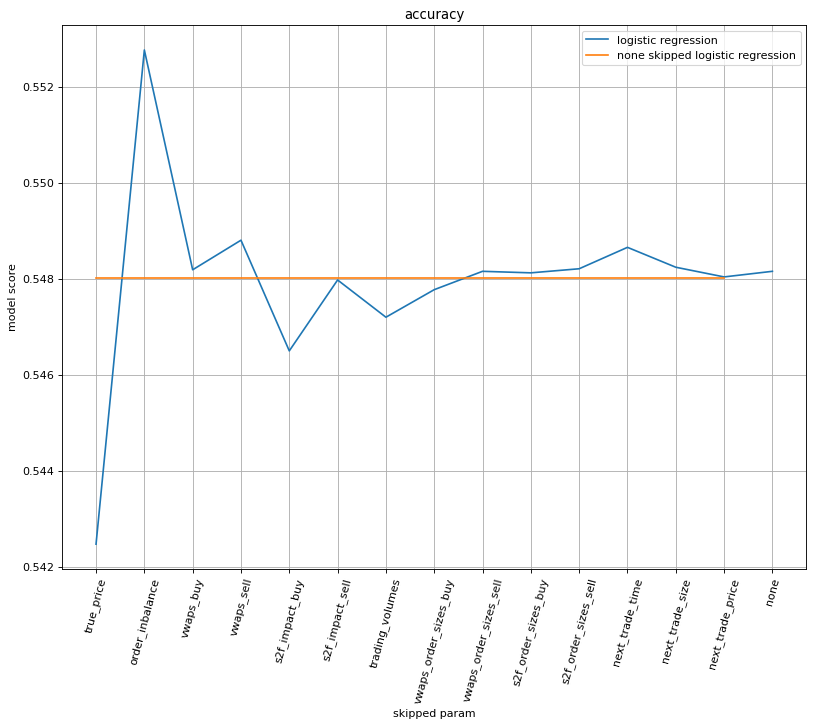

In [154]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model score')
plt.xticks(np.arange(len(skipped_params)), skipped_params, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(1):
    plt.plot(np.nansum(scores_skipped, axis=(0,3))[:,i,0]/99) #stopped after 56th comp
    plt.plot(np.repeat(np.nansum(none_skipped, axis=(0,2))[i,0]/99, repeats=len(names_all), axis=0))
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['logistic regression', 'none skipped logistic regression', 
            'decision tree', 'none skipped decision tree', 
            'XGB', 'none skipped XGB'])
plt.title('accuracy')

Text(0.5, 1.0, 'precision')

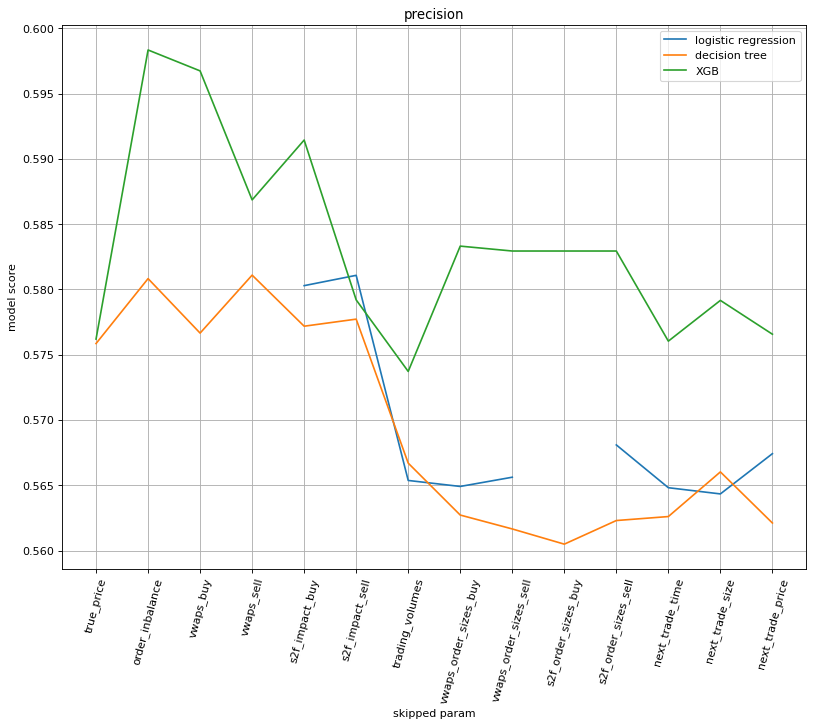

In [148]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model score')
plt.xticks(np.arange(len(names_all)), names_all, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_skipped, axis=(0,3))[:,i,1]/(57*5)) #stopped after 56th comp
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['logistic regression', 'decision tree', 'XGB'])
plt.title('precision')

Text(0.5, 1.0, 'recall')

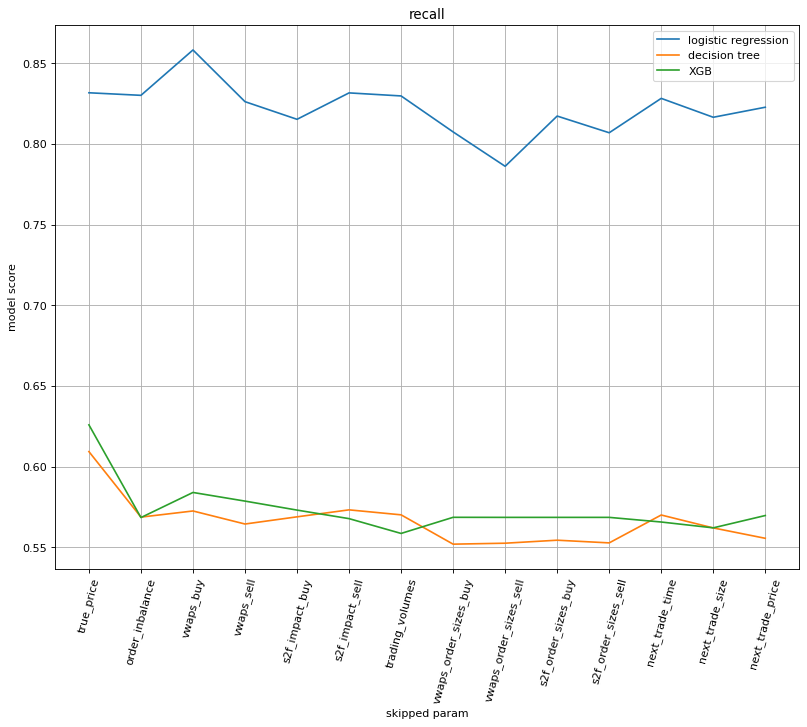

In [147]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model score')
plt.xticks(np.arange(len(names_all)), names_all, rotation='75')
#plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.nansum(scores_skipped, axis=(0,3))[:,i,2]/(57*5)) #stopped after 56th comp
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['logistic regression', 'decision tree', 'XGB'])
plt.title('recall')

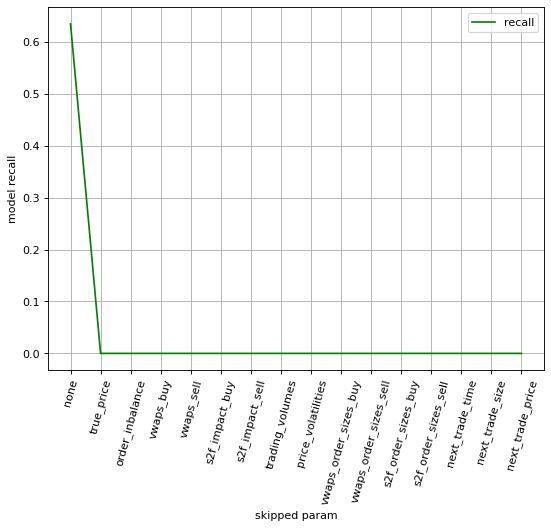

In [181]:
figure(figsize=(8, 6), dpi=80)

plt.axes(xlabel='skipped param', ylabel='model recall')
plt.xticks(np.arange(len(skipped_params)), skipped_params, rotation='75')
plt.grid()
#for c in range(len(comps)):
 #   plt.plot( scores[c])
#plt.plot(np.sum(scores, axis=0)[:,0]/len(comps))
#plt.plot(np.sum(scores, axis=0)[:,1]/len(comps))
plt.plot(np.sum(scores, axis=0)[:,2]/(len(comps)*10), 'g')
plt.legend(['recall'])

# models on not all features

In [96]:
interval=1
time_back=5
time_to_skip=30
split_percent = 0.8
threshold = 0.0016
names=[          
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
      ]
comp_scores=np.zeros((len(list_of_companies_number),10, 3)) 

In [300]:
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_hold=get_X(comp_id, interval, time_to_skip, time_back, names) 
    print(X.shape)
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    print(y.shape)
    
    for i in range(10):
        X,y=permutate_Xy(X_hold,y)
        comp_scores[comp_id,i,0], comp_scores[comp_id,i,1],comp_scores[comp_id,i,2]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names))

    #comp_scores[comp_id,0],comp_scaled[comp_id,1],comp_scaled[comp_id,2]=logistic_regr(X, y,split_percent, 
     #                                                                                  comp_id=comp_id, use_scaling=True, check_up_down=False, track_params=False, local_names=names)
clear_output()


0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
(4750, 15)
true price at index 9,479 was zero!
(4750,)


TypeError: logistic_regr() got an unexpected keyword argument 'use_scaling'

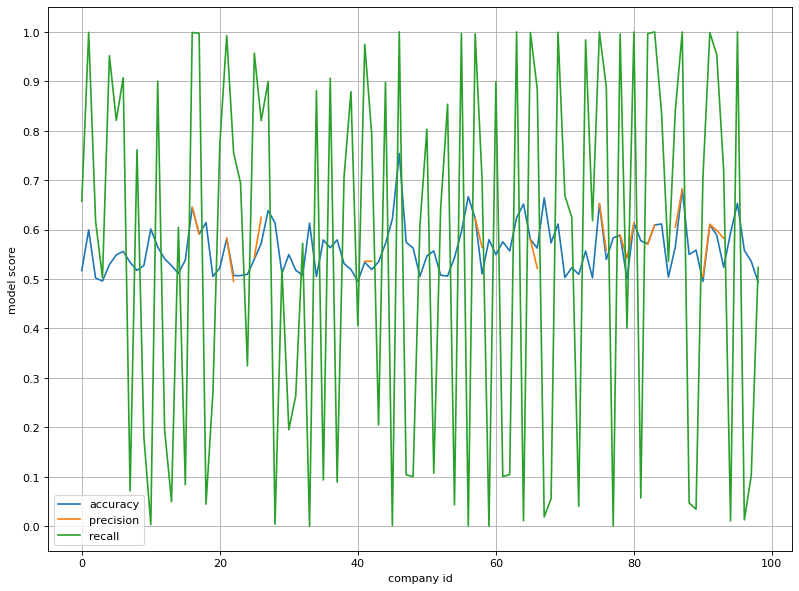

In [98]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)

plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores, axis=1)[:,i]/10)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

In [99]:
arr=np.sum(comp_scores, axis=1)[:,2]
arr[arr>9.9].size

18

In [ ]:
# SCALE VS not scale

In [ ]:
comp_id=9
interval=5
time_to_skip=30
time_back=12
swing_interval=60
split_percent = 0.8
threshold=1e-3
names=[         
   # 'mid_price',
   # 'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [ ]:
X=get_X(comp_id, interval, time_to_skip, time_back, names)
y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)

In [ ]:
log_scale=[]
log=[]
tree_scale=[]
tree=[]
for i in range(100):
    tree_scale.append(decision_tree(X, np.copy(y),split_percent, comp_id , use_scaling=True, check_up_down=False, local_names=names))
    log_scale.append(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names))
    tree.append(decision_tree(X, np.copy(y),split_percent, comp_id, use_scaling=False, check_up_down=False, local_names=names))
    log.append(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=False, check_up_down=False, local_names=names))

In [ ]:
print("log_scale: ", np.sum(log_scale)/100)
print("log: ", np.sum(log)/100)
print("tree_scale: ", np.sum(tree_scale)/100)
print("tree: ", np.sum(tree)/100)

In [ ]:
comps=np.arange(len(list_of_companies_number))
scores=np.zeros(shape=(len(comps), 4))
for c in range(len(comps)):
    print(c)
    X=get_X(comps[c], interval, time_to_skip, time_back, names)
    y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    scores[c,0]=(decision_tree(X, np.copy(y),split_percent, comp_id , use_scaling=True, check_up_down=False, local_names=names))
    scores[c,1]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names))
    scores[c,2]=(decision_tree(X, np.copy(y),split_percent, comp_id, use_scaling=False, check_up_down=False, local_names=names))
    scores[c,3]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=False, check_up_down=False, local_names=names))

In [ ]:
figure(figsize=(24, 18), dpi=80)

plt.axes(xlabel='comp id', ylabel='model score')
plt.xticks(np.arange(len(comps)), comps, rotation='90')
plt.grid()
for c in range(4):
    plt.plot(scores[:,c])
#plt.plot(np.sum(scores, axis=0)/len(comps))
plt.legend(['tree_scaled', 'log_scaled', 'tree','log'])

In [ ]:
print(['tree_scaled', 'log_scaled', 'tree','log'])
print(np.sum(scores, axis=0)) 

# models only on true price

In [193]:
time_back=1
time_to_skip=30
split_percent = 0.8
interval=1
threshold=1e-3
#comp_ths=np.zeros((len(list_of_companies_number),1))

In [122]:
X=get_X(20, interval, time_to_skip, time_back, ['true_price'])
y=get_y(20, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
X,y=permutate_Xy(X,y)
logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=['true_price'])

Coefficient impact:
true_price   -1.8594986026565887
[[522 436]
 [  0   0]]


(0.5448851774530271, 0.5448851774530271, 1.0)

In [79]:
comps=np.arange(len(list_of_companies_number))
scores_true=np.zeros(shape=(len(comps), 10, 3))
for c in range(len(comps)):
    print(c)
 #   X=get_X(comps[c], interval, time_to_skip, time_back, ['true_price'])
  #  y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    for i in range(10):
        X,y=permutate_Xy(np.atleast_2d(X_allcomps[c,:,0]).T,y_allcomps[c]) #IMNPORTANT that 2d only for one feature models
        scores_true[c,i,0], scores_true[c,i,1],scores_true[c,i,2]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_pipe=preprocessing.MaxAbsScaler(), check_up_down=False, local_names=['true_price']))
clear_output()


In [78]:
np.atleast_2d(X_allcomps[0,:,0]).T.shape

(4750, 1)

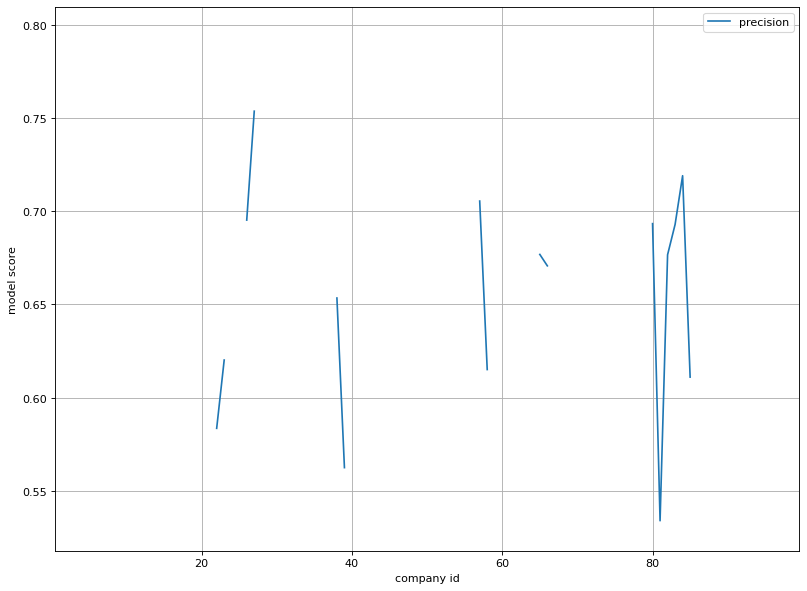

In [82]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.grid()
#for i in range(3):
 #   plt.plot(np.sum(scores_true, axis=1)[:,i]/10)
plt.plot(np.sum(scores_true, axis=1)[:,1]/10)
plt.legend(['precision', 'precision', 'recall'])
#true price only

In [199]:
np.sum(np.sum(scores_true, axis=1)[:,0])/990

0.5410145294278905

In [198]:
print('avg model acc')
np.sum(scores_true)/(99*10)

avg model acc


nan

In [200]:
time_back=1
time_to_skip=30
split_percent = 0.8
interval=1
threshold=1e-3
names=[         
   # 'mid_price',
   # 'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
scores_all=np.zeros(shape=(len(comps), 10, 3))


In [302]:
for c in range(len(comps)):
    print(c)
    X=get_X(comps[c], interval, time_to_skip, time_back, names)
    y=get_y(comps[c], interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    X,y=permutate_Xy(X,y)
    for i in range(10):
        scores_all[c,i,0], scores_all[c,i,1],scores_all[c,i,2]=(logistic_regr(X, np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names))
clear_output()


0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
true price at index 9,479 was zero!


TypeError: logistic_regr() got an unexpected keyword argument 'use_scaling'

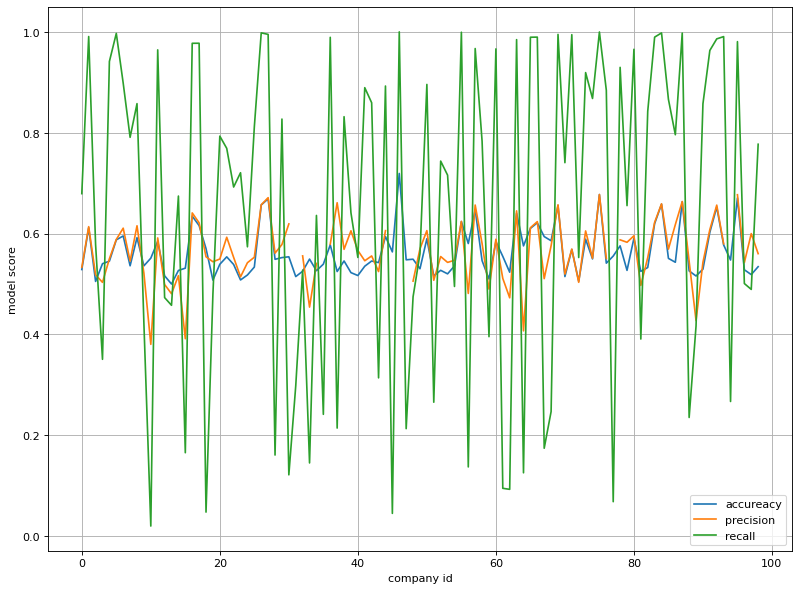

In [205]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_all, axis=1)[:,i]/10)
#plt.plot(np.sum(scores_all, axis=1)[:,0]/10)
plt.legend(['accureacy', 'precision', 'recall'])
#true price only

In [112]:
print('avg model acc')
np.sum(np.sum(scores_all, axis=1)[:,0])/(99*10)

avg model acc


0.5621939646991838

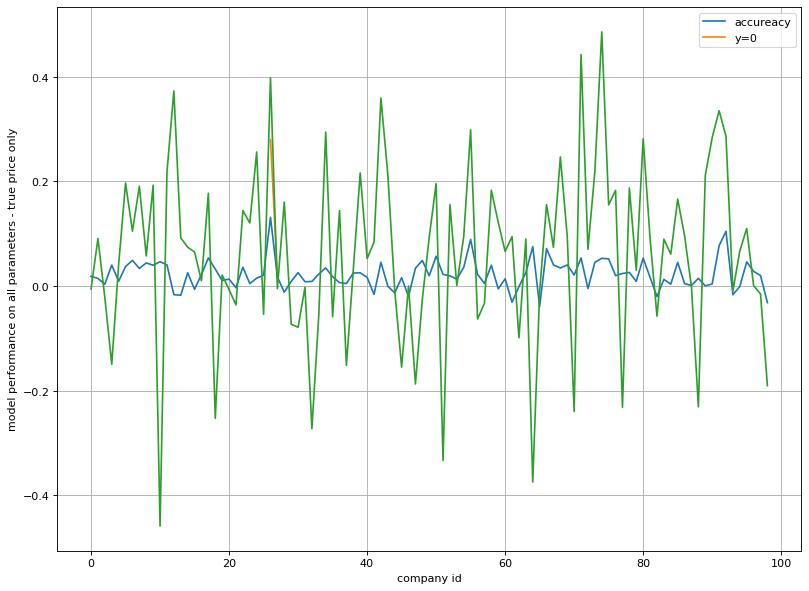

In [204]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model performance on all parameters - true price only')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.grid()
for i in range(3):
    plt.plot(np.sum(scores_all, axis=1)[:,i]/10 - np.sum(scores_true, axis=1)[:,i]/10)
#plt.plot(np.sum(scores_all, axis=1)[:,0]/10)
plt.legend(['accureacy', 'y=0',])
#true price only

In [76]:
print('avg model acc')
np.sum(scores_all-scores)/(99*10)

avg model acc


0.0008645958541574415

# compare models

In [ ]:
time_back=1
time_to_skip=30
split_percent = 0.8
interval=5
names=[   
  #  'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    'next_trade_price',
   # 'true_price'
]
threshold=1e-3
comp_ths=np.zeros((len(list_of_companies_number),3))

In [ ]:
time_start=time.time()
for comp_id in range(len(list_of_companies_number)//10):
    print(comp_id)
    X=get_X(comp_id, interval, time_to_skip, time_back, names) 
    print(X.shape)
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    print(y.shape)
    comp_ths[comp_id,0]=logistic_regr(X, y,split_percent, comp_id, check_up_down=False, track_params=False, local_names=names)
    comp_ths[comp_id,1]=decision_tree(X, y,split_percent, comp_id, check_up_down=False, track_params=False, local_names=names)
    comp_ths[comp_id,2],_,_=xgb_model(X, y,split_percent, comp_id, check_up_down=False, track_params=False, local_names=names)
print("calculations took: {} seconds".format(  time.time()-time_start))

In [ ]:
comp_summed=np.sum(comp_ths, axis=0)/9
print("logreg ", comp_summed[0], ", dec tree ", comp_summed[1], ", xgb ", comp_summed[2])

In [ ]:
import tensorflow as tf


# PYTORCH

In [ ]:
from torch import nn
from IPython.display import clear_output


In [ ]:
comp_id=9
interval=5
time_to_skip=30
time_back=12
swing_interval=60
split_percent = 0.8
threshold=1e-3
names=[         
   # 'mid_price',
   # 'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
X=get_X(0, interval, time_to_skip, time_back, names)
y=get_y(0, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)

In [ ]:
X=get_X(0, interval, time_to_skip, time_back, names)
y=get_y(0, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)

In [ ]:
X=np.arange(100).reshape(10,10)
X=torch.tensor( X.reshape((X.shape[0], X.shape[1], 1)))
X

In [104]:



rnn = nn.LSTM(10, 20, 2)
input = torch.randn(5,3,10)
h0 = torch.randn(2, 3, 20)
c0 = torch.randn(2, 3, 20)
output, (hn, cn) = rnn(input, (h0, c0))

In [108]:
input

tensor([[[-1.0628,  0.5585, -1.0645, -0.0440,  0.5010,  0.6481, -0.7833,
           0.4331,  0.0158, -1.1018],
         [-0.6953, -0.3864,  1.3036,  1.7006,  0.3969, -3.3250,  0.7332,
          -0.1670,  0.4305,  0.8640],
         [-0.6886,  0.0246,  0.5902,  0.7218, -1.0999, -0.5088,  1.5050,
           0.1934, -0.0324, -0.6890]],

        [[-0.6266, -0.7843,  0.5038,  0.0861, -1.0237, -0.0098,  2.1013,
           0.2527,  1.4739,  0.1286],
         [-0.4438, -0.2992,  0.1483, -0.1707,  1.3360, -1.8862, -2.0256,
          -1.8637, -0.3229,  0.4310],
         [-2.5040,  0.5185,  0.5304,  0.1862, -0.6130, -1.8489, -2.6557,
           0.8494,  1.0029, -2.0036]],

        [[ 0.1833,  0.8922, -2.6648, -0.4558,  0.3590,  1.4857, -0.2737,
          -1.1159, -0.1095,  0.0879],
         [-0.8676,  0.7471, -0.0089,  0.4768, -0.1263,  0.5140, -1.5660,
          -1.6823, -0.5825,  0.6293],
         [-1.2264, -0.7090,  0.8310, -0.3566,  1.2700,  0.6331,  0.1159,
           1.6533, -2.1670, -0.0967

In [ ]:
X

In [ ]:
from sklearn.metrics import confusion_matrix
# false positive - truth was false, prediction was true
# false negative - truth was true, prediction was false

In [ ]:
def my_confusion_matrix(y_true, y_pred, labels): # for binary clasification
    if len(labels)!=2:
        raise ValueError("wrong labels fro binary clasiffication")
    if len(y_true)!=len(y_pred):
        raise ValueError("shapes for y differ")
    truth=labels[0]
    tp=0 
    fp=0 #truth was false, prediction was true
    fn=0 #truth was true, prediction was false
    tn=0
    for i in range(len(y_true)):
        if y_true[i]==truth: # true positive or false negative
            if y_true[i]==y_pred[i]:
                tp+=1
            else:
                fn+=1
        else: # true negative or false positive
            if y_true[i]==y_pred[i]:
                tn+=1
            else:
                fp+=1
    return np.array([[tp, fp],[fn, tn]]) 

In [ ]:
test=[0,0,1,1]
pred=[0,1,0,0]
confusion_matrix(test, pred, labels=[1,0]) # 1-true, 0-false

In [ ]:
my_confusion_matrix(test, pred, labels=[1,0]) # 1-true, 0-false

In [ ]:
len(torch.zeros(10))

In [ ]:
class Model(nn.Module):
    def __init__(self, *args, **kwargs):
        super(Model, self).__init__()
        self.layers = nn.Sequential(*args, **kwargs)

    def forward(self, X):
        X = X.view(X.size(0), -1)
        return self.layers.forward(X)

    def loss(self, Out, Targets):
        return nn.functional.cross_entropy(Out, Targets)

In [ ]:
def compute_error_rate(model, X, y, device="cpu"):
    """Evaluate model on all samples from the data loader.
    """
    # Put the model in eval mode, and move to the evaluation device.
    model.eval()
    model.to(device)


    num_errs = 0.0
    num_examples = 0
    # we don't need gradient during eval!
    with torch.no_grad():
        for x, y in zip(X,y):
            x = x.to(device).reshape(1,len(x)) # reshape sample from (num_of_features) to (1, num_of_features)
            y = y.to(device).reshape(1)
            outputs = model.forward(x)
            _, predictions = outputs.data.max(dim=1)
            num_errs += (predictions != y.data).sum().item()
            num_examples += x.size(0)
    return num_errs / num_examples
def plot_history(history):
    """Helper to plot the trainig progress over time."""
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    train_loss = np.array(history["train_losses"])
    plt.semilogy(np.arange(train_loss.shape[0]), train_loss, label="batch train loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    train_errs = np.array(history["train_errs"])
    plt.plot(np.arange(train_errs.shape[0]), train_errs, label="batch train error rate")
    val_errs = np.array(history["val_errs"])
    plt.plot(val_errs[:, 0], val_errs[:, 1], label="validation error rate", color="r")
    plt.ylim(0, 0.20)
    plt.legend()

In [ ]:
def SGD(
    model,
    X_train,
    y_train,
    X_valid,
    y_valid,
    alpha=1e-4,
    epsilon=0.1,
    decay=0.01,
    beta=0.95,
    batch_size=100,
    num_epochs=3,
    max_num_epochs=np.nan,
    patience_expansion=1.5,
    log_every=100,
    polyak=False,
    device="cpu",
):

    # Put the model in train mode, and move to the evaluation device.
    model.train()
    model.to(device)
    velocities = [torch.zeros_like(m) for m in model.parameters()]
   # if polyak:
    polyaks= [torch.zeros_like(m) for m in model.parameters()]
    #print(velocities)
    #
    alpha0=alpha
    iter_ = 0
    epoch = 0
    best_params = None
    best_val_err = np.inf
    history = {"train_losses": [], "train_errs": [], "val_errs": []}
    print("Training the model!")
    print("Interrupt at any time to evaluate the best validation model so far.")
    try:
        tstart = time.time()
        siter = iter_
        while epoch < num_epochs:
            model.train()
            epoch += 1
            if epoch > max_num_epochs:
                break
            alpha=alpha0*np.power(beta,epoch)
            
            for counter in range(X_train.size(0)//batch_size):#zip(X_train,y_train):
                x=X_train[counter*batch_size:(counter+1)*batch_size]
                x = x.to(device)#.reshape(1,len(x)) # reshape sample from (num_of_features) to (1, num_of_features)
             #   print(x.shape)
                y=y_train[counter*batch_size:(counter+1)*batch_size]
                y = y.to(device)#.reshape(1)
              #  print(y)
                iter_ += 1
                # This calls the `forward` function: https://pytorch.org/tutorials/beginner/examples_nn/two_layer_net_module.html
                out = model(x)
                loss = model.loss(out, y)
                loss.backward()
                _, predictions = out.max(dim=1)
                batch_err_rate = (predictions != y).sum().item() / out.size(0)

                history["train_losses"].append(loss.item())
                history["train_errs"].append(batch_err_rate)

                # disable gradient computations - we do not want torch to
                # backpropagate through the gradient application!
                with torch.no_grad():
                    for (name, p), v, pol in zip(model.named_parameters(), velocities, polyaks):
                        if "weight" in name:
                            p.grad +=  decay * 2*p   #### pochodna sumy kwadratów więc mamy 2p

                        v[:] = epsilon*v - alpha * p.grad
                        p[:] =p + v
                        pol[:]=0.99*pol + (1-0.99)*p
                        # Zero gradients for the next iteration
                        p.grad.zero_()

                if iter_ % log_every == 0:
                    num_iter = iter_ - siter + 1
                    print(
                        "Minibatch {0: >6}  | loss {1: >5.2f} | err rate {2: >5.2f}%, steps/s {3: >5.2f}".format(
                            iter_,
                            loss.item(),
                            batch_err_rate * 100.0,
                            num_iter / (time.time() - tstart),
                        )
                    )
                    tstart = time.time()

            val_err_rate = compute_error_rate(model, X_valid, y_valid, device)
            history["val_errs"].append((iter_, val_err_rate))

            if val_err_rate < best_val_err:
                # Adjust num of epochs
                num_epochs = int(np.maximum(num_epochs, epoch * patience_expansion + 1))
                best_epoch = epoch
                best_val_err = val_err_rate
                best_params = [p.detach().cpu() for p in model.parameters()]
            clear_output(True)
            m = "After epoch {0: >2} | valid err rate: {1: >5.2f}% | doing {2: >3} epochs".format(
                epoch, val_err_rate * 100.0, num_epochs
            )
            print("{0}\n{1}\n{0}".format("-" * len(m), m))

            if(polyak):
                with torch.no_grad():
                    for (name, p), pol in zip(model.named_parameters(), polyaks):
                        p[:]=pol
                        pol[:]=torch.zeros_like(pol)
                  

    except KeyboardInterrupt:
        pass

    if best_params is not None:
        print("\nLoading best params on validation set (epoch %d)\n" % (best_epoch))
        with torch.no_grad():
            for param, best_param in zip(model.parameters(), best_params):
                param[...] = best_param
    plot_history(history)

In [ ]:
for x,y in zip(X,y):
    print(x,y)

In [ ]:
comp_id=3
interval=1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.6
valid_percent=split_percent+0.2
threshold=1e-3
names=[         
   # 'mid_price',
   # 'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
no_comps=len(list_of_companies_number)
s=get_X(0, interval, time_to_skip, time_back, names).shape
X=np.zeros(shape=(no_comps, s[0], s[1]))
y=np.zeros(shape=(no_comps, s[0]))
Xy=np.empty(shape=(X.shape[1], X.shape[2]+1))
for i in range(no_comps):
    X_hold=get_X(i, interval, time_to_skip, time_back, names)
    transformer = preprocessing.MaxAbsScaler().fit(X_hold)

    Xy[:,:14]=transformer.transform(X_hold)
    Xy[:,14]=get_y(i, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    Xy=np.random.permutation(Xy)
    X[i]=Xy[:,:14]
    y[i]=Xy[:,14]
split=int(X.shape[1]*split_percent)
valid=int(X.shape[1]*valid_percent)

## save X and y to csv file, upload the files to colab and train much much faster on cloud gpu

In [ ]:
'X_{}_{}_{}_{}.csv'.format(interval,time_to_skip, time_back, swing_interval)

In [ ]:
import pandas as pd
x_df = pd.DataFrame(torch.flatten(X,start_dim=0, end_dim=1).numpy())
x_df.to_csv('X_{}_{}_{}_{}.csv'.format(interval,time_to_skip, time_back, swing_interval))
y_df = pd.DataFrame(torch.flatten(y,start_dim=0, end_dim=1).numpy())
y_df.to_csv('y_{}_{}_{}_{}.csv'.format(interval,time_to_skip, time_back, swing_interval))

In [ ]:
X=torch.tensor(X, dtype=torch.float32)
y=torch.tensor(y, dtype=torch.long)

In [ ]:
transformer = preprocessing.MaxAbsScaler().fit(X)
transformer.transform(X)
transformer.n_features_in_

In [ ]:
MLP=Model(nn.Linear(len(names), 512), nn.Sigmoid(), 
          nn.Linear(512, 1024), nn.Sigmoid(), nn.Dropout(p=0.2),
          nn.Linear(1024,1024), nn.Sigmoid(),
          nn.Linear(1024,64), nn.Sigmoid(),
          nn.Linear(64,2)
         )
with torch.no_grad():
    # Initialize parameters
    for name, p in MLP.named_parameters():
        if "weight" in name:
            p.normal_(1e-8, 0.2)
        elif "bias" in name:
            p.zero_()
        else:
            raise ValueError('Unknown parameter name "%s"' % name)
t_start = time.time()

#X=torch.tensor(X, dtype=torch.float32)
#y=torch.tensor(y, dtype=torch.long)

SGD(MLP, torch.flatten(X[:,:split],start_dim=0, end_dim=1), torch.flatten(y[:,:split],start_dim=0, end_dim=1), 
   torch.flatten( X[:,split:valid],start_dim=0, end_dim=1), torch.flatten(y[:,split:valid],start_dim=0, end_dim=1),
    alpha=4e-1, epsilon=0.6, decay=0.0001,beta=0.98,batch_size=1000, max_num_epochs=30)



test_err_rate = compute_error_rate(MLP, torch.flatten(X[:,valid:],start_dim=0, end_dim=1), torch.flatten(y[:,valid:],start_dim=0, end_dim=1))
m = (
    f"Test error rate: {test_err_rate * 100.0:.3f}%, "
    f"training took {time.time() - t_start:.0f}s."
)
print("{0}\n{1}\n{0}".format("-" * len(m), m))

In [ ]:
X.shape

In [ ]:
y_d=torch.tensor([0,0,0,0,0,1,1,1,1,1])
predictions = torch.tensor([0,0,0,0,1,1,1,1,1,1])
num_errs = (predictions != y_d.data).sum().item()
num_examples = y_d.size(0)
num_errs / num_examples

In [ ]:
y_d=y[0].reshape(1)
MLP.eval()
_, predictions=MLP.forward(torch.flatten( X[:,:split],start_dim=0, end_dim=1)[0:10].shape).data.max(dim=1)
num_errs = (predictions != y_d.data).sum().item()
num_examples = y_d.size(0)
num_errs / num_examples

In [ ]:
torch.flatten( X[:,split:valid],start_dim=0, end_dim=1)

In [ ]:
y.shape